# Task 2 - Q learning U got package

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import u_got_package
import os
import pandas as pd
from u_got_package import save_to_pickle, load_from_pickle,QLearnAgent,run_experiments

SAVED_DIR='./u_got_package/saved'


In [46]:
PICKLE_RESULTS='./u_got_package/saved/task2_experiments_results_last2.pickle'
PICKLE_RESULTS_Q_VALUES='./u_got_package/saved/task2_experiments_q_values_last2.pickle'

## In this task we will implement the q learning algorithm on the game u got a package

## Q learning algorithm

from https://web.stanford.edu/class/psych209/Readings/SuttonBartoIPRLBook2ndEd.pdf



![Q learning](images/q-learning.png)

### The Q learning is done by a QLearnAgent class
### The agent is learning by using the qlearning algorithm while following a e-greedy policy
### Q learning with different environment spaces and learning spaces


#### I will examine different configuration of both environment and learning hyperparameters. 
#### It will run in a grid search manner (cartesian product). 

#### Each different configuration will run for several experiments and results will be avaraged in order to be more accurate.** 

### Configurations are:

- N Environemnt size- 10, 15, 20
- Customs pay amounts 3,4
- Gammas(dicount factor) -0.9, 0.6,0.3
- Step size -0.2, 0.5, 0.8
- Epsilons -1.,0.9, 0.6




In [8]:

#Number of experiment for each different configuration
NUM_EXPERIMENTS=10

#Number of episodes in each experiment 
NUM_EPISODES=1000


#Environemnt configurations
#Environemnt sizes
ENVIRONMENT_PARAMS={'N':[10, 15,20],'CUSTOMS_PAYS':[3, 4]}

#Reward on wate on time- this is the fine for coming to a station with no right document or twice.
#We will examine if when the penalry is small will the agent still do the safe  option of going to the gp 
#or will he try to use the randomality  of sometime the gp approval is overlooked.


#Agent Hyperparameters
AGENT_PARAMS={'GAMMAS':[0.7, 0.9], 'STEP_SIZES':[0.4, 0.5, 0.8], 'EPSILONS':[0.7, 0.9, 1.0]}


#RUNS_DIR='./experiments'
#EPSILON_DECAY=0.990

EPSILON_MIN=0.05
#[0.2, 0.5, 0.8]
#[0.3, 0.6, 0.9]
#[0.6, 0.9, 1.0]}

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.7 Step size 0.4 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-29.0 Reward:-565 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-494.0 Reward:524 Timesteps:317 GotPack:True Utiltime:118 Customstime:295 Money:5
Expr:0 Eps:40 RunnAReward:-67.0 Reward:36 Timesteps:815 GotPack:True Utiltime:81 Customstime:295 Money:5
Expr:0 Eps:60 RunnAReward:-3.0 Reward:147 Timesteps:200 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:156.0 Reward:92 Timesteps:200 GotPack:False Utiltime:60 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:194.0 Reward:70 Timesteps:300 GotPack:False Utiltime:31 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:227.0 Reward:428 Timesteps:395 GotPack:True Utiltime:43 Customstime:28

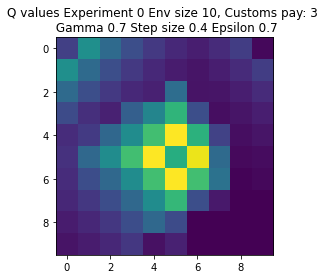

Expr:1 Eps:0 RunnAReward:-15.0 Reward:-281 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-258.0 Reward:5 Timesteps:300 GotPack:False Utiltime:159 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-238.0 Reward:108 Timesteps:200 GotPack:False Utiltime:125 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-62.0 Reward:507 Timesteps:368 GotPack:True Utiltime:245 Customstime:356 Money:3
Expr:1 Eps:80 RunnAReward:99.0 Reward:76 Timesteps:200 GotPack:False Utiltime:43 Customstime:0 Money:1
Expr:1 Eps:100 RunnAReward:129.0 Reward:127 Timesteps:200 GotPack:False Utiltime:20 Customstime:0 Money:1
Expr:1 Eps:120 RunnAReward:159.0 Reward:-4 Timesteps:300 GotPack:False Utiltime:165 Customstime:0 Money:1
Expr:1 Eps:140 RunnAReward:353.0 Reward:29 Timesteps:799 GotPack:True Utiltime:8 Customstime:194 Money:4
Expr:1 Eps:160 RunnAReward:300.0 Reward:498 Timesteps:336 GotPack:True Utiltime:197 Customstime:249 Money:5
Expr:1 Eps:180 RunnAReward:258.0 Reward:98 Timest

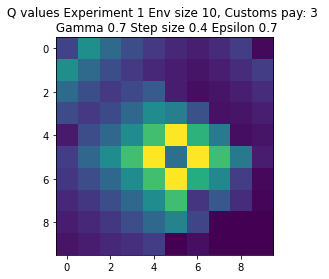

Expr:2 Eps:0 RunnAReward:-34.0 Reward:-666 Timesteps:1246 GotPack:True Utiltime:1072 Customstime:1155 Money:4
Expr:2 Eps:20 RunnAReward:-367.0 Reward:139 Timesteps:200 GotPack:False Utiltime:130 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-47.0 Reward:128 Timesteps:200 GotPack:False Utiltime:54 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-69.0 Reward:159 Timesteps:200 GotPack:False Utiltime:91 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:95.0 Reward:-62 Timesteps:300 GotPack:False Utiltime:79 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:199.0 Reward:61 Timesteps:685 GotPack:True Utiltime:41 Customstime:357 Money:4
Expr:2 Eps:120 RunnAReward:258.0 Reward:581 Timesteps:366 GotPack:True Utiltime:160 Customstime:207 Money:5
Expr:2 Eps:140 RunnAReward:437.0 Reward:114 Timesteps:200 GotPack:False Utiltime:85 Customstime:0 Money:2
Expr:2 Eps:160 RunnAReward:514.0 Reward:776 Timesteps:157 GotPack:True Utiltime:24 Customstime:145 Money:5
Expr:2 Eps:180 RunnAReward:416.0 Reward:13

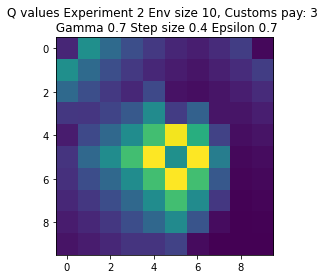

Expr:3 Eps:0 RunnAReward:-128.0 Reward:-2544 Timesteps:2526 GotPack:True Utiltime:1197 Customstime:1324 Money:5
Expr:3 Eps:20 RunnAReward:-408.0 Reward:-429 Timesteps:1064 GotPack:True Utiltime:985 Customstime:1045 Money:3
Expr:3 Eps:40 RunnAReward:-95.0 Reward:-343 Timesteps:977 GotPack:True Utiltime:130 Customstime:441 Money:3
Expr:3 Eps:60 RunnAReward:5.0 Reward:285 Timesteps:529 GotPack:True Utiltime:271 Customstime:374 Money:4
Expr:3 Eps:80 RunnAReward:87.0 Reward:-310 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:96.0 Reward:60 Timesteps:200 GotPack:False Utiltime:11 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:263.0 Reward:502 Timesteps:263 GotPack:True Utiltime:93 Customstime:222 Money:3
Expr:3 Eps:140 RunnAReward:351.0 Reward:528 Timesteps:360 GotPack:True Utiltime:45 Customstime:213 Money:4
Expr:3 Eps:160 RunnAReward:308.0 Reward:409 Timesteps:456 GotPack:True Utiltime:23 Customstime:206 Money:3
Expr:3 Eps:180 RunnAReward:381.0 Re

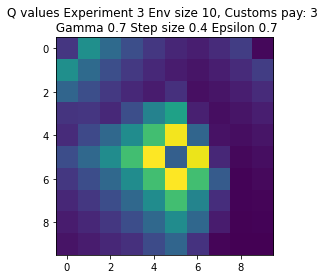

Expr:4 Eps:0 RunnAReward:-108.0 Reward:-2152 Timesteps:2159 GotPack:True Utiltime:746 Customstime:901 Money:5
Expr:4 Eps:20 RunnAReward:-354.0 Reward:141 Timesteps:657 GotPack:True Utiltime:115 Customstime:364 Money:5
Expr:4 Eps:40 RunnAReward:-14.0 Reward:-423 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:57.0 Reward:129 Timesteps:200 GotPack:False Utiltime:194 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:66.0 Reward:263 Timesteps:535 GotPack:True Utiltime:479 Customstime:509 Money:5
Expr:4 Eps:100 RunnAReward:124.0 Reward:396 Timesteps:416 GotPack:True Utiltime:36 Customstime:406 Money:3
Expr:4 Eps:120 RunnAReward:283.0 Reward:681 Timesteps:281 GotPack:True Utiltime:56 Customstime:95 Money:5
Expr:4 Eps:140 RunnAReward:346.0 Reward:172 Timesteps:200 GotPack:False Utiltime:29 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:402.0 Reward:-199 Timesteps:400 GotPack:False Utiltime:64 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:308.0 Reward:

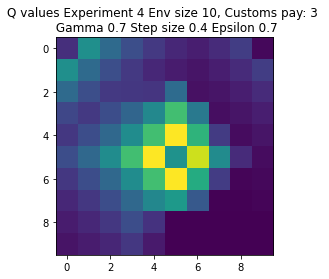

Expr:5 Eps:0 RunnAReward:-91.0 Reward:-1805 Timesteps:2094 GotPack:True Utiltime:1264 Customstime:1390 Money:3
Expr:5 Eps:20 RunnAReward:-237.0 Reward:-7 Timesteps:739 GotPack:True Utiltime:228 Customstime:461 Money:4
Expr:5 Eps:40 RunnAReward:-67.0 Reward:-357 Timesteps:1068 GotPack:True Utiltime:542 Customstime:729 Money:5
Expr:5 Eps:60 RunnAReward:36.0 Reward:655 Timesteps:301 GotPack:True Utiltime:60 Customstime:282 Money:3
Expr:5 Eps:80 RunnAReward:112.0 Reward:4 Timesteps:300 GotPack:False Utiltime:46 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:274.0 Reward:750 Timesteps:196 GotPack:True Utiltime:25 Customstime:158 Money:5
Expr:5 Eps:120 RunnAReward:344.0 Reward:422 Timesteps:393 GotPack:True Utiltime:31 Customstime:373 Money:4
Expr:5 Eps:140 RunnAReward:339.0 Reward:794 Timesteps:153 GotPack:True Utiltime:43 Customstime:93 Money:3
Expr:5 Eps:160 RunnAReward:423.0 Reward:635 Timesteps:286 GotPack:True Utiltime:26 Customstime:159 Money:5
Expr:5 Eps:180 RunnAReward:487.0 Rewar

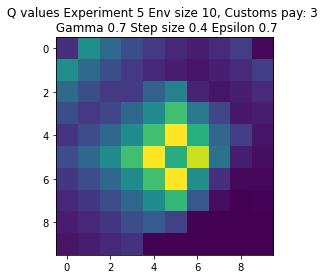

Expr:6 Eps:0 RunnAReward:-31.0 Reward:-613 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-357.0 Reward:-195 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-167.0 Reward:-196 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:52.0 Reward:522 Timesteps:367 GotPack:True Utiltime:64 Customstime:182 Money:5
Expr:6 Eps:80 RunnAReward:53.0 Reward:128 Timesteps:200 GotPack:False Utiltime:13 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:158.0 Reward:673 Timesteps:307 GotPack:True Utiltime:39 Customstime:184 Money:3
Expr:6 Eps:120 RunnAReward:178.0 Reward:98 Timesteps:200 GotPack:False Utiltime:61 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:387.0 Reward:750 Timesteps:137 GotPack:True Utiltime:15 Customstime:97 Money:5
Expr:6 Eps:160 RunnAReward:360.0 Reward:821 Timesteps:158 GotPack:True Utiltime:58 Customstime:120 Money:4
Expr:6 Eps:180 RunnAReward:408.0 Reward:669 Timest

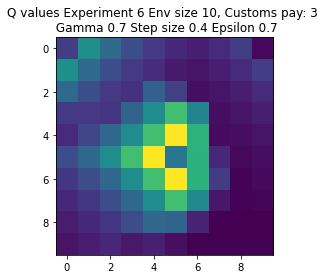

Expr:7 Eps:0 RunnAReward:-9.0 Reward:-171 Timesteps:300 GotPack:False Utiltime:128 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-241.0 Reward:-642 Timesteps:1078 GotPack:True Utiltime:600 Customstime:788 Money:3
Expr:7 Eps:40 RunnAReward:-306.0 Reward:62 Timesteps:200 GotPack:False Utiltime:46 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-30.0 Reward:129 Timesteps:200 GotPack:False Utiltime:184 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:26.0 Reward:-151 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:100 RunnAReward:230.0 Reward:713 Timesteps:203 GotPack:True Utiltime:70 Customstime:186 Money:4
Expr:7 Eps:120 RunnAReward:352.0 Reward:343 Timesteps:504 GotPack:True Utiltime:8 Customstime:408 Money:3
Expr:7 Eps:140 RunnAReward:210.0 Reward:722 Timesteps:206 GotPack:True Utiltime:30 Customstime:134 Money:5
Expr:7 Eps:160 RunnAReward:440.0 Reward:105 Timesteps:200 GotPack:False Utiltime:62 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:275.0 Reward:16 T

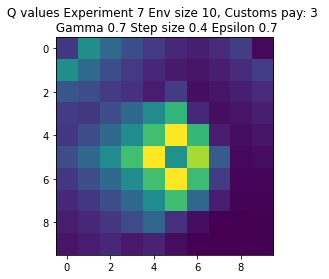

Expr:8 Eps:0 RunnAReward:-7.0 Reward:-125 Timesteps:300 GotPack:False Utiltime:259 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-241.0 Reward:460 Timesteps:239 GotPack:True Utiltime:1 Customstime:202 Money:3
Expr:8 Eps:40 RunnAReward:-280.0 Reward:36 Timesteps:726 GotPack:True Utiltime:17 Customstime:696 Money:5
Expr:8 Eps:60 RunnAReward:-19.0 Reward:-115 Timesteps:300 GotPack:False Utiltime:175 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:45.0 Reward:142 Timesteps:200 GotPack:False Utiltime:102 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:93.0 Reward:149 Timesteps:654 GotPack:True Utiltime:62 Customstime:199 Money:5
Expr:8 Eps:120 RunnAReward:267.0 Reward:324 Timesteps:540 GotPack:True Utiltime:394 Customstime:456 Money:3
Expr:8 Eps:140 RunnAReward:329.0 Reward:29 Timesteps:300 GotPack:False Utiltime:29 Customstime:0 Money:1
Expr:8 Eps:160 RunnAReward:216.0 Reward:209 Timesteps:582 GotPack:True Utiltime:162 Customstime:288 Money:3
Expr:8 Eps:180 RunnAReward:386.0 Reward:699 

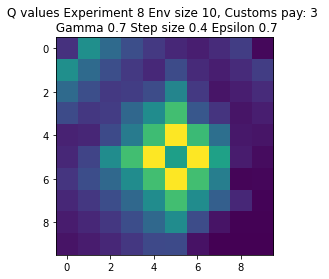

Expr:9 Eps:0 RunnAReward:-23.0 Reward:-445 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-213.0 Reward:-182 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-325.0 Reward:-395 Timesteps:1139 GotPack:True Utiltime:390 Customstime:412 Money:5
Expr:9 Eps:60 RunnAReward:28.0 Reward:486 Timesteps:299 GotPack:True Utiltime:12 Customstime:149 Money:4
Expr:9 Eps:80 RunnAReward:206.0 Reward:66 Timesteps:300 GotPack:False Utiltime:38 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:178.0 Reward:515 Timesteps:357 GotPack:True Utiltime:95 Customstime:187 Money:3
Expr:9 Eps:120 RunnAReward:301.0 Reward:446 Timesteps:448 GotPack:True Utiltime:87 Customstime:316 Money:4
Expr:9 Eps:140 RunnAReward:258.0 Reward:531 Timesteps:353 GotPack:True Utiltime:295 Customstime:343 Money:3
Expr:9 Eps:160 RunnAReward:242.0 Reward:-37 Timesteps:300 GotPack:False Utiltime:97 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:324.0 Reward:-46

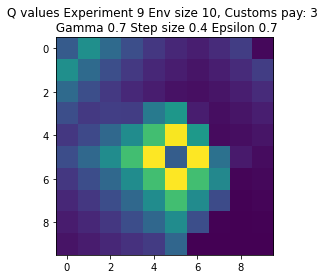

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.7 Step size 0.4 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-8.0 Reward:-142 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-356.0 Reward:-122 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-46.0 Reward:-100 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:6.0 Reward:139 Timesteps:100 GotPack:False Utiltime:18 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:238.0 Reward:-62 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:150.0 Reward:167 Timesteps:200 GotPack:False Utiltime:32 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:165.0 Reward:149 Timesteps:731 GotPack:True Utiltime:29 Customstime:470 M

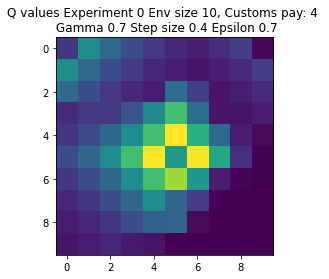

Expr:1 Eps:0 RunnAReward:13.0 Reward:262 Timesteps:100 GotPack:False Utiltime:97 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-290.0 Reward:-1139 Timesteps:1562 GotPack:True Utiltime:995 Customstime:1024 Money:5
Expr:1 Eps:40 RunnAReward:-38.0 Reward:-62 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:24.0 Reward:336 Timesteps:492 GotPack:True Utiltime:50 Customstime:250 Money:4
Expr:1 Eps:80 RunnAReward:88.0 Reward:200 Timesteps:100 GotPack:False Utiltime:17 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:186.0 Reward:168 Timesteps:558 GotPack:True Utiltime:305 Customstime:398 Money:4
Expr:1 Eps:120 RunnAReward:73.0 Reward:134 Timesteps:200 GotPack:False Utiltime:33 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:114.0 Reward:262 Timesteps:100 GotPack:False Utiltime:86 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:80.0 Reward:-14 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:229.0 Reward:-33 Times

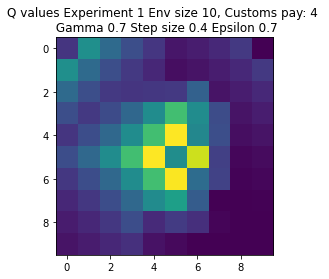

Expr:2 Eps:0 RunnAReward:-8.0 Reward:-143 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-79.0 Reward:-37 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-79.0 Reward:-68 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-109.0 Reward:-110 Timesteps:938 GotPack:True Utiltime:68 Customstime:246 Money:4
Expr:2 Eps:80 RunnAReward:79.0 Reward:403 Timesteps:365 GotPack:True Utiltime:23 Customstime:113 Money:5
Expr:2 Eps:100 RunnAReward:29.0 Reward:50 Timesteps:300 GotPack:False Utiltime:212 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:78.0 Reward:254 Timesteps:100 GotPack:False Utiltime:18 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:140.0 Reward:254 Timesteps:100 GotPack:False Utiltime:3 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:146.0 Reward:-138 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:180 RunnAReward:272.0 Reward:713 Timesteps:2

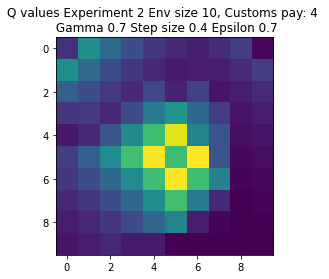

Expr:3 Eps:0 RunnAReward:32.0 Reward:656 Timesteps:275 GotPack:True Utiltime:112 Customstime:231 Money:5
Expr:3 Eps:20 RunnAReward:-246.0 Reward:-140 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:40 RunnAReward:-133.0 Reward:-45 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:6.0 Reward:187 Timesteps:634 GotPack:True Utiltime:144 Customstime:270 Money:5
Expr:3 Eps:80 RunnAReward:35.0 Reward:319 Timesteps:518 GotPack:True Utiltime:134 Customstime:241 Money:5
Expr:3 Eps:100 RunnAReward:161.0 Reward:147 Timesteps:100 GotPack:False Utiltime:52 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:110.0 Reward:19 Timesteps:200 GotPack:False Utiltime:44 Customstime:0 Money:3
Expr:3 Eps:140 RunnAReward:217.0 Reward:502 Timesteps:284 GotPack:True Utiltime:65 Customstime:145 Money:4
Expr:3 Eps:160 RunnAReward:170.0 Reward:285 Timesteps:100 GotPack:False Utiltime:45 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:316.0 Reward:74 Timest

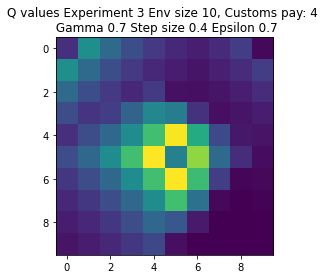

Expr:4 Eps:0 RunnAReward:-2.0 Reward:-34 Timesteps:300 GotPack:False Utiltime:157 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-241.0 Reward:264 Timesteps:100 GotPack:False Utiltime:76 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-213.0 Reward:-156 Timesteps:300 GotPack:False Utiltime:51 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-33.0 Reward:34 Timesteps:200 GotPack:False Utiltime:26 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:86.0 Reward:227 Timesteps:100 GotPack:False Utiltime:14 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:138.0 Reward:148 Timesteps:200 GotPack:False Utiltime:58 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:24.0 Reward:177 Timesteps:100 GotPack:False Utiltime:59 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:174.0 Reward:-140 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:148.0 Reward:46 Timesteps:200 GotPack:False Utiltime:64 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:269.0 Reward:123 Timesteps

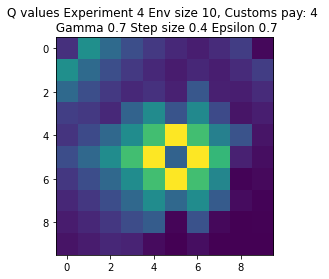

Expr:5 Eps:0 RunnAReward:-14.0 Reward:-270 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:5 Eps:20 RunnAReward:-109.0 Reward:-214 Timesteps:750 GotPack:True Utiltime:49 Customstime:184 Money:4
Expr:5 Eps:40 RunnAReward:-122.0 Reward:-185 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:78.0 Reward:-37 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:9.0 Reward:-42 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:94.0 Reward:-52 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:138.0 Reward:152 Timesteps:100 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:211.0 Reward:284 Timesteps:100 GotPack:False Utiltime:53 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:203.0 Reward:123 Timesteps:200 GotPack:False Utiltime:62 Customstime:0 Money:2
Expr:5 Eps:180 RunnAReward:254.0 Reward:-30 Timesteps:1

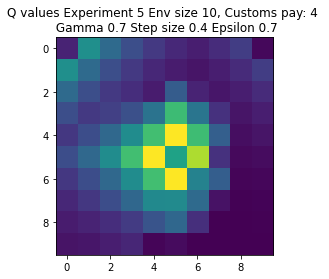

Expr:6 Eps:0 RunnAReward:9.0 Reward:190 Timesteps:100 GotPack:False Utiltime:28 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-160.0 Reward:-187 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:61.0 Reward:113 Timesteps:100 GotPack:False Utiltime:11 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:46.0 Reward:153 Timesteps:100 GotPack:False Utiltime:21 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:16.0 Reward:-33 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:77.0 Reward:58 Timesteps:200 GotPack:False Utiltime:8 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:218.0 Reward:268 Timesteps:100 GotPack:False Utiltime:44 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:159.0 Reward:318 Timesteps:422 GotPack:True Utiltime:22 Customstime:126 Money:5
Expr:6 Eps:160 RunnAReward:272.0 Reward:92 Timesteps:200 GotPack:False Utiltime:24 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:276.0 Reward:15 Timesteps:783 Got

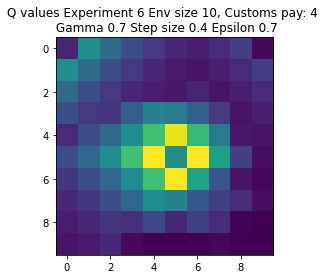

Expr:7 Eps:0 RunnAReward:-7.0 Reward:-125 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-290.0 Reward:-36 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:24.0 Reward:-197 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:1.0 Reward:-38 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:44.0 Reward:-14 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:7.0 Reward:262 Timesteps:100 GotPack:False Utiltime:31 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:137.0 Reward:22 Timesteps:200 GotPack:False Utiltime:7 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:239.0 Reward:243 Timesteps:100 GotPack:False Utiltime:52 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:456.0 Reward:258 Timesteps:100 GotPack:False Utiltime:19 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:272.0 Reward:80 Timesteps:200 GotPac

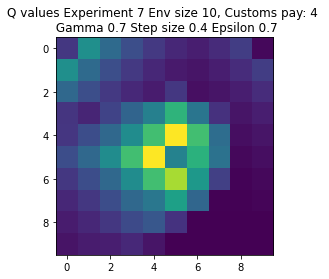

Expr:8 Eps:0 RunnAReward:-7.0 Reward:-126 Timesteps:300 GotPack:False Utiltime:52 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-263.0 Reward:-19 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-177.0 Reward:-27 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:44.0 Reward:370 Timesteps:540 GotPack:True Utiltime:8 Customstime:118 Money:5
Expr:8 Eps:80 RunnAReward:165.0 Reward:-109 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-13.0 Reward:-121 Timesteps:891 GotPack:True Utiltime:15 Customstime:454 Money:4
Expr:8 Eps:120 RunnAReward:32.0 Reward:-140 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:201.0 Reward:162 Timesteps:100 GotPack:False Utiltime:50 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:82.0 Reward:156 Timesteps:100 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:220.0 Reward:691 Timesteps

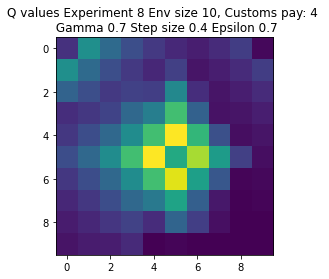

Expr:9 Eps:0 RunnAReward:-1.0 Reward:-13 Timesteps:300 GotPack:False Utiltime:164 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-138.0 Reward:-20 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-30.0 Reward:-57 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-5.0 Reward:536 Timesteps:323 GotPack:True Utiltime:118 Customstime:242 Money:5
Expr:9 Eps:80 RunnAReward:46.0 Reward:237 Timesteps:100 GotPack:False Utiltime:93 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:61.0 Reward:7 Timesteps:300 GotPack:False Utiltime:68 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:273.0 Reward:450 Timesteps:380 GotPack:True Utiltime:16 Customstime:214 Money:4
Expr:9 Eps:140 RunnAReward:177.0 Reward:495 Timesteps:397 GotPack:True Utiltime:341 Customstime:369 Money:5
Expr:9 Eps:160 RunnAReward:279.0 Reward:1 Timesteps:200 GotPack:False Utiltime:31 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:279.0 Reward:255 Timesteps:1

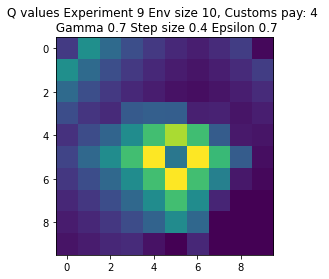

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.7 Step size 0.4 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-47.0 Reward:-930 Timesteps:1440 GotPack:True Utiltime:880 Customstime:1130 Money:3
Expr:0 Eps:20 RunnAReward:-382.0 Reward:30 Timesteps:200 GotPack:False Utiltime:56 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-316.0 Reward:-157 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-255.0 Reward:-1756 Timesteps:1939 GotPack:True Utiltime:99 Customstime:168 Money:5
Expr:0 Eps:80 RunnAReward:-154.0 Reward:-120 Timesteps:300 GotPack:False Utiltime:10 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-44.0 Reward:107 Timesteps:200 GotPack:False Utiltime:162 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:132.0 Reward:-191 Timesteps:400 GotPack:False Utiltime:2

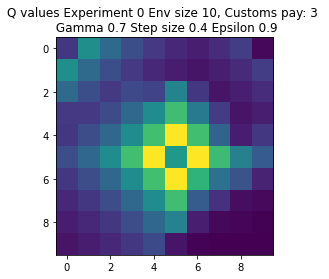

Expr:1 Eps:0 RunnAReward:-14.0 Reward:-277 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-311.0 Reward:-161 Timesteps:833 GotPack:True Utiltime:652 Customstime:812 Money:4
Expr:1 Eps:40 RunnAReward:-122.0 Reward:333 Timesteps:489 GotPack:True Utiltime:221 Customstime:430 Money:3
Expr:1 Eps:60 RunnAReward:-364.0 Reward:-927 Timesteps:1335 GotPack:True Utiltime:1006 Customstime:1183 Money:4
Expr:1 Eps:80 RunnAReward:-117.0 Reward:-478 Timesteps:1149 GotPack:True Utiltime:21 Customstime:360 Money:3
Expr:1 Eps:100 RunnAReward:120.0 Reward:49 Timesteps:200 GotPack:False Utiltime:26 Customstime:0 Money:1
Expr:1 Eps:120 RunnAReward:98.0 Reward:-12 Timesteps:300 GotPack:False Utiltime:22 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:99.0 Reward:-302 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:66.0 Reward:-36 Timesteps:200 GotPack:False Utiltime:135 Customstime:0 Money:1
Expr:1 Eps:180 RunnAReward:227.0 Rewa

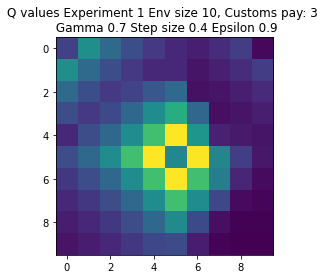

Expr:2 Eps:0 RunnAReward:6.0 Reward:132 Timesteps:200 GotPack:False Utiltime:92 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-465.0 Reward:-3000 Timesteps:2999 GotPack:True Utiltime:1709 Customstime:2040 Money:3
Expr:2 Eps:40 RunnAReward:-365.0 Reward:-918 Timesteps:1308 GotPack:True Utiltime:703 Customstime:1286 Money:3
Expr:2 Eps:60 RunnAReward:-276.0 Reward:77 Timesteps:200 GotPack:False Utiltime:143 Customstime:0 Money:1
Expr:2 Eps:80 RunnAReward:-112.0 Reward:-291 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:100 RunnAReward:-18.0 Reward:-245 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-63.0 Reward:-569 Timesteps:1153 GotPack:True Utiltime:31 Customstime:143 Money:4
Expr:2 Eps:140 RunnAReward:33.0 Reward:88 Timesteps:200 GotPack:False Utiltime:25 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:236.0 Reward:345 Timesteps:420 GotPack:True Utiltime:64 Customstime:212 Money:3
Expr:2 Eps:180 RunnAReward:163.0 Rew

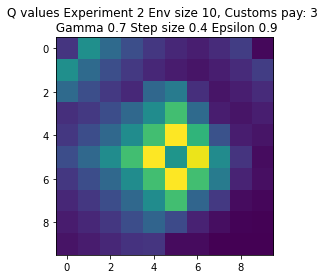

Expr:3 Eps:0 RunnAReward:-9.0 Reward:-173 Timesteps:746 GotPack:True Utiltime:15 Customstime:157 Money:5
Expr:3 Eps:20 RunnAReward:-377.0 Reward:60 Timesteps:200 GotPack:False Utiltime:108 Customstime:0 Money:1
Expr:3 Eps:40 RunnAReward:-150.0 Reward:155 Timesteps:200 GotPack:False Utiltime:169 Customstime:0 Money:1
Expr:3 Eps:60 RunnAReward:-280.0 Reward:-1037 Timesteps:1481 GotPack:True Utiltime:678 Customstime:863 Money:4
Expr:3 Eps:80 RunnAReward:-221.0 Reward:48 Timesteps:200 GotPack:False Utiltime:77 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-57.0 Reward:115 Timesteps:200 GotPack:False Utiltime:85 Customstime:0 Money:1
Expr:3 Eps:120 RunnAReward:-3.0 Reward:-246 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:3 Eps:140 RunnAReward:0.0 Reward:119 Timesteps:200 GotPack:False Utiltime:62 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:261.0 Reward:171 Timesteps:200 GotPack:False Utiltime:139 Customstime:0 Money:1
Expr:3 Eps:180 RunnAReward:348.0 Reward:398 

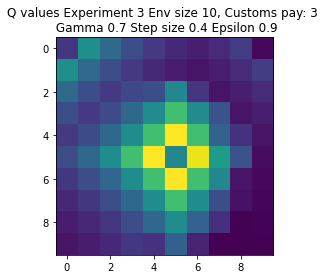

Expr:4 Eps:0 RunnAReward:0.0 Reward:15 Timesteps:300 GotPack:False Utiltime:104 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-548.0 Reward:-263 Timesteps:1021 GotPack:True Utiltime:536 Customstime:714 Money:5
Expr:4 Eps:40 RunnAReward:-239.0 Reward:-114 Timesteps:300 GotPack:False Utiltime:187 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-349.0 Reward:421 Timesteps:417 GotPack:True Utiltime:201 Customstime:348 Money:5
Expr:4 Eps:80 RunnAReward:-238.0 Reward:-424 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-65.0 Reward:-201 Timesteps:300 GotPack:False Utiltime:10 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:39.0 Reward:-243 Timesteps:949 GotPack:True Utiltime:76 Customstime:628 Money:3
Expr:4 Eps:140 RunnAReward:145.0 Reward:110 Timesteps:200 GotPack:False Utiltime:84 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:189.0 Reward:621 Timesteps:308 GotPack:True Utiltime:40 Customstime:150 Money:4
Expr:4 Eps:180 RunnAReward:318.0 Reward

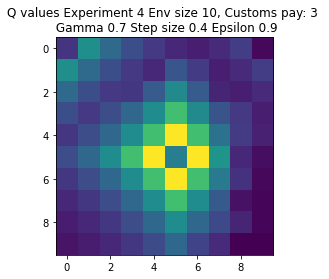

Expr:5 Eps:0 RunnAReward:-13.0 Reward:-243 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-336.0 Reward:-196 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:40 RunnAReward:-191.0 Reward:-129 Timesteps:870 GotPack:True Utiltime:193 Customstime:412 Money:5
Expr:5 Eps:60 RunnAReward:-234.0 Reward:-159 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-80.0 Reward:-221 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:38.0 Reward:59 Timesteps:200 GotPack:False Utiltime:123 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:63.0 Reward:149 Timesteps:200 GotPack:False Utiltime:15 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:156.0 Reward:599 Timesteps:312 GotPack:True Utiltime:27 Customstime:120 Money:5
Expr:5 Eps:160 RunnAReward:118.0 Reward:-10 Timesteps:300 GotPack:False Utiltime:217 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:177.0 Reward:162 Ti

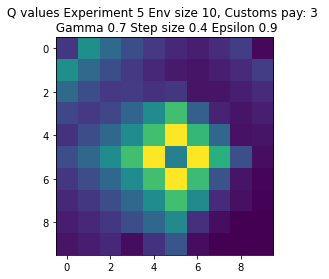

Expr:6 Eps:0 RunnAReward:6.0 Reward:125 Timesteps:200 GotPack:False Utiltime:94 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-585.0 Reward:-494 Timesteps:1103 GotPack:True Utiltime:353 Customstime:695 Money:5
Expr:6 Eps:40 RunnAReward:-385.0 Reward:-62 Timesteps:300 GotPack:False Utiltime:86 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-244.0 Reward:-222 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-130.0 Reward:-332 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:49.0 Reward:107 Timesteps:200 GotPack:False Utiltime:175 Customstime:0 Money:1
Expr:6 Eps:120 RunnAReward:94.0 Reward:102 Timesteps:200 GotPack:False Utiltime:127 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:119.0 Reward:70 Timesteps:200 GotPack:False Utiltime:11 Customstime:0 Money:1
Expr:6 Eps:160 RunnAReward:199.0 Reward:-270 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:131.0 Reward:275 Tim

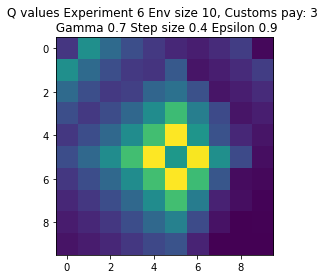

Expr:7 Eps:0 RunnAReward:-21.0 Reward:-412 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-539.0 Reward:-226 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:40 RunnAReward:-304.0 Reward:-1417 Timesteps:1535 GotPack:True Utiltime:1205 Customstime:1395 Money:5
Expr:7 Eps:60 RunnAReward:-257.0 Reward:-405 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-158.0 Reward:174 Timesteps:626 GotPack:True Utiltime:379 Customstime:458 Money:3
Expr:7 Eps:100 RunnAReward:-19.0 Reward:153 Timesteps:200 GotPack:False Utiltime:164 Customstime:0 Money:1
Expr:7 Eps:120 RunnAReward:19.0 Reward:180 Timesteps:200 GotPack:False Utiltime:153 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:146.0 Reward:137 Timesteps:551 GotPack:True Utiltime:25 Customstime:478 Money:3
Expr:7 Eps:160 RunnAReward:147.0 Reward:62 Timesteps:601 GotPack:True Utiltime:65 Customstime:193 Money:4
Expr:7 Eps:180 RunnAReward:226.0 Rewa

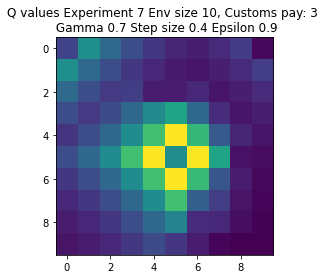

Expr:8 Eps:0 RunnAReward:-48.0 Reward:-944 Timesteps:1388 GotPack:True Utiltime:545 Customstime:1097 Money:3
Expr:8 Eps:20 RunnAReward:-504.0 Reward:-450 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:40 RunnAReward:-379.0 Reward:-271 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-229.0 Reward:-116 Timesteps:871 GotPack:True Utiltime:274 Customstime:403 Money:3
Expr:8 Eps:80 RunnAReward:-63.0 Reward:-247 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:26.0 Reward:147 Timesteps:200 GotPack:False Utiltime:175 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:59.0 Reward:116 Timesteps:200 GotPack:False Utiltime:107 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:180.0 Reward:46 Timesteps:200 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:116.0 Reward:81 Timesteps:200 GotPack:False Utiltime:13 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:177.0 Reward:10 

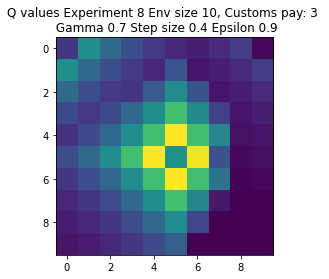

Expr:9 Eps:0 RunnAReward:-84.0 Reward:-1664 Timesteps:2096 GotPack:True Utiltime:1753 Customstime:1997 Money:3
Expr:9 Eps:20 RunnAReward:-587.0 Reward:-349 Timesteps:964 GotPack:True Utiltime:107 Customstime:642 Money:5
Expr:9 Eps:40 RunnAReward:-329.0 Reward:-1134 Timesteps:1406 GotPack:True Utiltime:275 Customstime:618 Money:5
Expr:9 Eps:60 RunnAReward:-246.0 Reward:-83 Timesteps:200 GotPack:False Utiltime:11 Customstime:0 Money:1
Expr:9 Eps:80 RunnAReward:-30.0 Reward:-249 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:100 RunnAReward:-76.0 Reward:-65 Timesteps:871 GotPack:True Utiltime:218 Customstime:404 Money:4
Expr:9 Eps:120 RunnAReward:150.0 Reward:-328 Timesteps:929 GotPack:True Utiltime:55 Customstime:174 Money:3
Expr:9 Eps:140 RunnAReward:118.0 Reward:406 Timesteps:409 GotPack:True Utiltime:194 Customstime:282 Money:5
Expr:9 Eps:160 RunnAReward:194.0 Reward:172 Timesteps:200 GotPack:False Utiltime:74 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:2

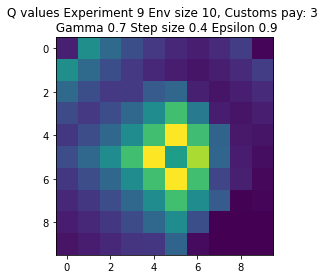

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.7 Step size 0.4 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-23.0 Reward:-460 Timesteps:924 GotPack:True Utiltime:87 Customstime:391 Money:5
Expr:0 Eps:20 RunnAReward:-283.0 Reward:-183 Timesteps:300 GotPack:False Utiltime:17 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-114.0 Reward:102 Timesteps:100 GotPack:False Utiltime:33 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-145.0 Reward:-187 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-79.0 Reward:-55 Timesteps:300 GotPack:False Utiltime:179 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-45.0 Reward:132 Timesteps:100 GotPack:False Utiltime:60 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:145.0 Reward:379 Timesteps:420 GotPack:True Utiltime:67 Customs

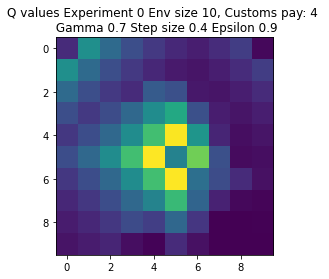

Expr:1 Eps:0 RunnAReward:-14.0 Reward:-273 Timesteps:945 GotPack:True Utiltime:81 Customstime:419 Money:5
Expr:1 Eps:20 RunnAReward:-505.0 Reward:-149 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:40 RunnAReward:-132.0 Reward:195 Timesteps:200 GotPack:False Utiltime:9 Customstime:0 Money:2
Expr:1 Eps:60 RunnAReward:-189.0 Reward:-50 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-26.0 Reward:196 Timesteps:579 GotPack:True Utiltime:151 Customstime:183 Money:5
Expr:1 Eps:100 RunnAReward:-3.0 Reward:97 Timesteps:100 GotPack:False Utiltime:59 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:27.0 Reward:475 Timesteps:467 GotPack:True Utiltime:152 Customstime:186 Money:5
Expr:1 Eps:140 RunnAReward:68.0 Reward:-201 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:160 RunnAReward:6.0 Reward:-151 Timesteps:400 GotPack:False Utiltime:10 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:101.0 Reward:191 Timest

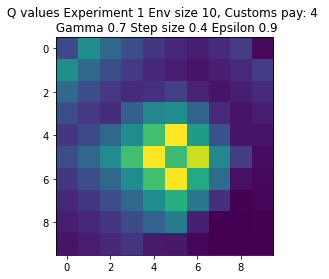

Expr:2 Eps:0 RunnAReward:-44.0 Reward:-865 Timesteps:1359 GotPack:True Utiltime:868 Customstime:963 Money:4
Expr:2 Eps:20 RunnAReward:-429.0 Reward:-33 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-103.0 Reward:-115 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-227.0 Reward:-910 Timesteps:1389 GotPack:True Utiltime:624 Customstime:650 Money:4
Expr:2 Eps:80 RunnAReward:-111.0 Reward:-44 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:55.0 Reward:258 Timesteps:100 GotPack:False Utiltime:65 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:78.0 Reward:-24 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:103.0 Reward:-41 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:136.0 Reward:-15 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:155.0 Reward:665 Tim

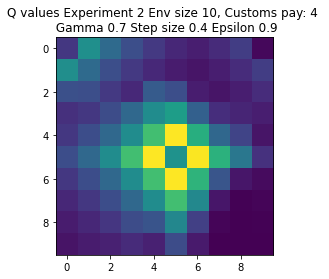

Expr:3 Eps:0 RunnAReward:-12.0 Reward:-226 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-530.0 Reward:-354 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:40 RunnAReward:-110.0 Reward:-147 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:60 RunnAReward:-82.0 Reward:226 Timesteps:580 GotPack:True Utiltime:18 Customstime:264 Money:5
Expr:3 Eps:80 RunnAReward:-74.0 Reward:75 Timesteps:200 GotPack:False Utiltime:14 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:27.0 Reward:-195 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:146.0 Reward:135 Timesteps:100 GotPack:False Utiltime:27 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:101.0 Reward:160 Timesteps:100 GotPack:False Utiltime:49 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:163.0 Reward:600 Timesteps:245 GotPack:True Utiltime:140 Customstime:213 Money:5
Expr:3 Eps:180 RunnAReward:68.0 Reward:175 Timest

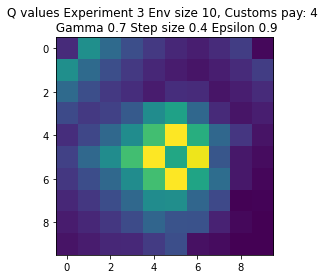

Expr:4 Eps:0 RunnAReward:-50.0 Reward:-994 Timesteps:1408 GotPack:True Utiltime:731 Customstime:772 Money:5
Expr:4 Eps:20 RunnAReward:-594.0 Reward:-218 Timesteps:1049 GotPack:True Utiltime:621 Customstime:758 Money:5
Expr:4 Eps:40 RunnAReward:-226.0 Reward:-115 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-91.0 Reward:77 Timesteps:200 GotPack:False Utiltime:190 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:-44.0 Reward:-145 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-77.0 Reward:448 Timesteps:361 GotPack:True Utiltime:109 Customstime:272 Money:4
Expr:4 Eps:120 RunnAReward:29.0 Reward:-44 Timesteps:805 GotPack:True Utiltime:23 Customstime:128 Money:5
Expr:4 Eps:140 RunnAReward:87.0 Reward:-5 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:46.0 Reward:141 Timesteps:200 GotPack:False Utiltime:73 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:152.0 Reward:145 

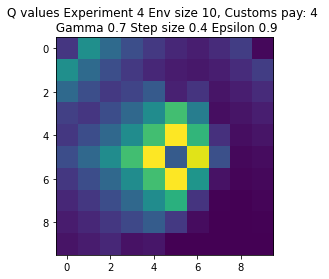

Expr:5 Eps:0 RunnAReward:-13.0 Reward:-244 Timesteps:867 GotPack:True Utiltime:755 Customstime:791 Money:5
Expr:5 Eps:20 RunnAReward:-166.0 Reward:-337 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-218.0 Reward:-119 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-27.0 Reward:96 Timesteps:100 GotPack:False Utiltime:47 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-46.0 Reward:-23 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:20.0 Reward:176 Timesteps:100 GotPack:False Utiltime:25 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:65.0 Reward:142 Timesteps:200 GotPack:False Utiltime:118 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:79.0 Reward:-34 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:56.0 Reward:250 Timesteps:100 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:86.0 Reward:529 Timesteps:

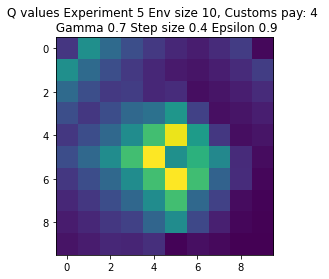

Expr:6 Eps:0 RunnAReward:-8.0 Reward:-149 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-94.0 Reward:-34 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-245.0 Reward:-657 Timesteps:1222 GotPack:True Utiltime:59 Customstime:832 Money:4
Expr:6 Eps:60 RunnAReward:-322.0 Reward:-186 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-78.0 Reward:-1612 Timesteps:1825 GotPack:True Utiltime:385 Customstime:643 Money:4
Expr:6 Eps:100 RunnAReward:-81.0 Reward:-66 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:44.0 Reward:12 Timesteps:200 GotPack:False Utiltime:59 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:67.0 Reward:-33 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:37.0 Reward:-73 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:84.0 Reward:175 Timestep

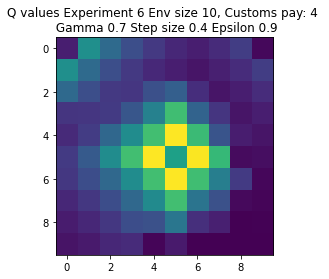

Expr:7 Eps:0 RunnAReward:-8.0 Reward:-149 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-430.0 Reward:-1103 Timesteps:1601 GotPack:True Utiltime:740 Customstime:864 Money:4
Expr:7 Eps:40 RunnAReward:-212.0 Reward:-1256 Timesteps:1495 GotPack:True Utiltime:381 Customstime:1153 Money:5
Expr:7 Eps:60 RunnAReward:-234.0 Reward:-158 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-156.0 Reward:-286 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:100 RunnAReward:-48.0 Reward:47 Timesteps:200 GotPack:False Utiltime:64 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:-11.0 Reward:300 Timesteps:444 GotPack:True Utiltime:87 Customstime:177 Money:4
Expr:7 Eps:140 RunnAReward:97.0 Reward:557 Timesteps:320 GotPack:True Utiltime:2 Customstime:103 Money:5
Expr:7 Eps:160 RunnAReward:111.0 Reward:1 Timesteps:300 GotPack:False Utiltime:23 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:163.0 Reward:4

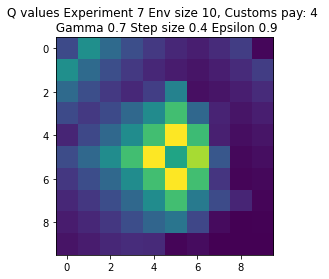

Expr:8 Eps:0 RunnAReward:-10.0 Reward:-200 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-227.0 Reward:-171 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-240.0 Reward:-23 Timesteps:724 GotPack:True Utiltime:272 Customstime:436 Money:5
Expr:8 Eps:60 RunnAReward:-181.0 Reward:-238 Timesteps:808 GotPack:True Utiltime:633 Customstime:676 Money:5
Expr:8 Eps:80 RunnAReward:-219.0 Reward:246 Timesteps:100 GotPack:False Utiltime:91 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:4.0 Reward:-12 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:101.0 Reward:258 Timesteps:100 GotPack:False Utiltime:2 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:114.0 Reward:173 Timesteps:100 GotPack:False Utiltime:98 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:85.0 Reward:25 Timesteps:200 GotPack:False Utiltime:34 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:94.0 Reward:292 Timest

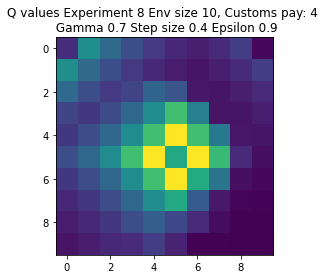

Expr:9 Eps:0 RunnAReward:-7.0 Reward:-132 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-171.0 Reward:-244 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-132.0 Reward:-108 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-100.0 Reward:-219 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:-84.0 Reward:-74 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:32.0 Reward:-40 Timesteps:300 GotPack:False Utiltime:71 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:-17.0 Reward:411 Timesteps:421 GotPack:True Utiltime:96 Customstime:259 Money:5
Expr:9 Eps:140 RunnAReward:28.0 Reward:-7 Timesteps:200 GotPack:False Utiltime:79 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:50.0 Reward:-38 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:181.0 Reward:132 Timesteps:2

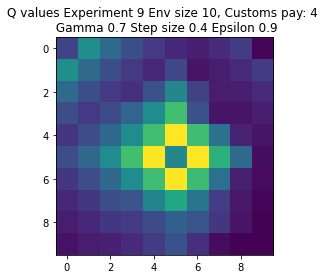

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.7 Step size 0.4 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-7.0 Reward:-131 Timesteps:300 GotPack:False Utiltime:49 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-508.0 Reward:40 Timesteps:200 GotPack:False Utiltime:75 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-399.0 Reward:-2345 Timesteps:2188 GotPack:True Utiltime:1605 Customstime:2091 Money:3
Expr:0 Eps:60 RunnAReward:-473.0 Reward:446 Timesteps:381 GotPack:True Utiltime:314 Customstime:349 Money:3
Expr:0 Eps:80 RunnAReward:-208.0 Reward:141 Timesteps:200 GotPack:False Utiltime:131 Customstime:0 Money:1
Expr:0 Eps:100 RunnAReward:-139.0 Reward:-168 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:-129.0 Reward:-181 Timesteps:200 GotPack:False Utiltime:

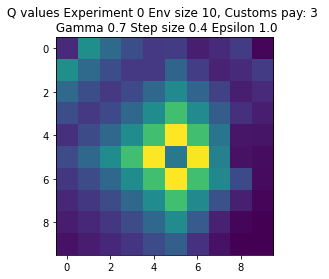

Expr:1 Eps:0 RunnAReward:-3.0 Reward:-57 Timesteps:200 GotPack:False Utiltime:152 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-398.0 Reward:-267 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-562.0 Reward:-42 Timesteps:796 GotPack:True Utiltime:357 Customstime:610 Money:5
Expr:1 Eps:60 RunnAReward:-218.0 Reward:-246 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-362.0 Reward:-250 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:-206.0 Reward:250 Timesteps:593 GotPack:True Utiltime:168 Customstime:196 Money:5
Expr:1 Eps:120 RunnAReward:-30.0 Reward:-81 Timesteps:676 GotPack:True Utiltime:20 Customstime:218 Money:5
Expr:1 Eps:140 RunnAReward:-165.0 Reward:-301 Timesteps:400 GotPack:False Utiltime:146 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:75.0 Reward:467 Timesteps:325 GotPack:True Utiltime:36 Customstime:291 Money:3
Expr:1 Eps:180 RunnAReward:81.0 Reward:

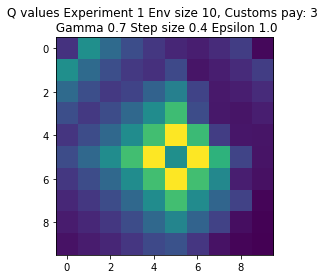

Expr:2 Eps:0 RunnAReward:-51.0 Reward:-1006 Timesteps:1500 GotPack:True Utiltime:417 Customstime:596 Money:3
Expr:2 Eps:20 RunnAReward:-778.0 Reward:-327 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-296.0 Reward:687 Timesteps:242 GotPack:True Utiltime:102 Customstime:227 Money:3
Expr:2 Eps:60 RunnAReward:-435.0 Reward:-200 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-219.0 Reward:-863 Timesteps:1274 GotPack:True Utiltime:956 Customstime:1030 Money:3
Expr:2 Eps:100 RunnAReward:-96.0 Reward:-242 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:120 RunnAReward:-7.0 Reward:-8 Timesteps:754 GotPack:True Utiltime:21 Customstime:141 Money:5
Expr:2 Eps:140 RunnAReward:21.0 Reward:50 Timesteps:200 GotPack:False Utiltime:31 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:-5.0 Reward:70 Timesteps:300 GotPack:False Utiltime:80 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:104.0 Reward:5

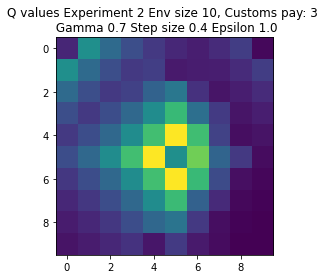

Expr:3 Eps:0 RunnAReward:-7.0 Reward:-134 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-308.0 Reward:-342 Timesteps:1035 GotPack:True Utiltime:462 Customstime:743 Money:5
Expr:3 Eps:40 RunnAReward:-334.0 Reward:-177 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-293.0 Reward:-1294 Timesteps:1543 GotPack:True Utiltime:1083 Customstime:1175 Money:4
Expr:3 Eps:80 RunnAReward:-106.0 Reward:-98 Timesteps:300 GotPack:False Utiltime:222 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-152.0 Reward:26 Timesteps:300 GotPack:False Utiltime:39 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:-97.0 Reward:373 Timesteps:451 GotPack:True Utiltime:72 Customstime:192 Money:5
Expr:3 Eps:140 RunnAReward:15.0 Reward:193 Timesteps:514 GotPack:True Utiltime:394 Customstime:449 Money:3
Expr:3 Eps:160 RunnAReward:-10.0 Reward:36 Timesteps:300 GotPack:False Utiltime:38 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:194.0 Rew

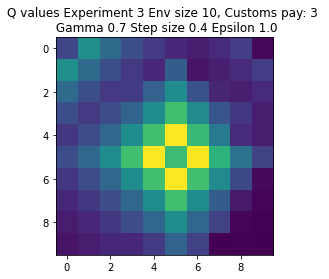

Expr:4 Eps:0 RunnAReward:-3.0 Reward:-41 Timesteps:200 GotPack:False Utiltime:167 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-536.0 Reward:-416 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-447.0 Reward:46 Timesteps:669 GotPack:True Utiltime:374 Customstime:489 Money:4
Expr:4 Eps:60 RunnAReward:-210.0 Reward:69 Timesteps:200 GotPack:False Utiltime:91 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-236.0 Reward:88 Timesteps:200 GotPack:False Utiltime:144 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:36.0 Reward:-61 Timesteps:300 GotPack:False Utiltime:215 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:-172.0 Reward:-32 Timesteps:200 GotPack:False Utiltime:96 Customstime:0 Money:1
Expr:4 Eps:140 RunnAReward:-77.0 Reward:28 Timesteps:200 GotPack:False Utiltime:22 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:-115.0 Reward:90 Timesteps:200 GotPack:False Utiltime:118 Customstime:0 Money:1
Expr:4 Eps:180 RunnAReward:97.0 Reward:-141 Tim

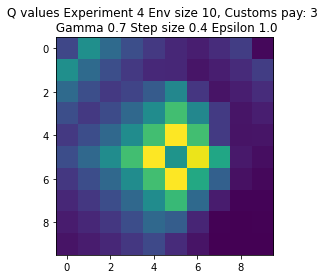

Expr:5 Eps:0 RunnAReward:5.0 Reward:103 Timesteps:200 GotPack:False Utiltime:13 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-914.0 Reward:-232 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-218.0 Reward:-1701 Timesteps:1979 GotPack:True Utiltime:1144 Customstime:1357 Money:4
Expr:5 Eps:60 RunnAReward:-496.0 Reward:-154 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-224.0 Reward:95 Timesteps:200 GotPack:False Utiltime:12 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-151.0 Reward:-152 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-128.0 Reward:135 Timesteps:200 GotPack:False Utiltime:82 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:-76.0 Reward:87 Timesteps:200 GotPack:False Utiltime:94 Customstime:0 Money:1
Expr:5 Eps:160 RunnAReward:43.0 Reward:-89 Timesteps:686 GotPack:True Utiltime:272 Customstime:427 Money:3
Expr:5 Eps:180 RunnAReward:74.0 Reward:-6 

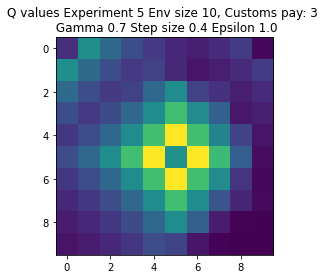

Expr:6 Eps:0 RunnAReward:-14.0 Reward:-280 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-573.0 Reward:-1020 Timesteps:1355 GotPack:True Utiltime:1113 Customstime:1276 Money:3
Expr:6 Eps:40 RunnAReward:-817.0 Reward:-119 Timesteps:300 GotPack:False Utiltime:250 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-193.0 Reward:-438 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:-285.0 Reward:134 Timesteps:200 GotPack:False Utiltime:111 Customstime:0 Money:1
Expr:6 Eps:100 RunnAReward:-332.0 Reward:-1149 Timesteps:1718 GotPack:True Utiltime:455 Customstime:498 Money:4
Expr:6 Eps:120 RunnAReward:-165.0 Reward:-146 Timesteps:903 GotPack:True Utiltime:290 Customstime:393 Money:5
Expr:6 Eps:140 RunnAReward:-92.0 Reward:-195 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:160 RunnAReward:28.0 Reward:-304 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:180 RunnAReward:19

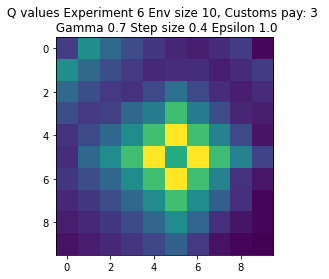

Expr:7 Eps:0 RunnAReward:-82.0 Reward:-1627 Timesteps:1755 GotPack:True Utiltime:1143 Customstime:1666 Money:4
Expr:7 Eps:20 RunnAReward:-570.0 Reward:-272 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:40 RunnAReward:-352.0 Reward:11 Timesteps:300 GotPack:False Utiltime:107 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-566.0 Reward:-125 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-164.0 Reward:-1840 Timesteps:2042 GotPack:True Utiltime:892 Customstime:933 Money:4
Expr:7 Eps:100 RunnAReward:-273.0 Reward:535 Timesteps:371 GotPack:True Utiltime:310 Customstime:338 Money:3
Expr:7 Eps:120 RunnAReward:-101.0 Reward:-8 Timesteps:300 GotPack:False Utiltime:221 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:-22.0 Reward:-140 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:-44.0 Reward:-145 Timesteps:876 GotPack:True Utiltime:211 Customstime:299 Money:4
Expr:7 Eps:180 RunnAReward:8.

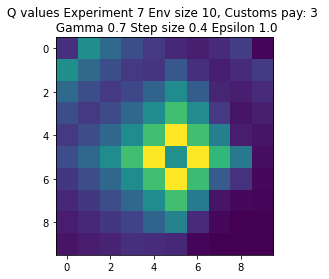

Expr:8 Eps:0 RunnAReward:-10.0 Reward:-189 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-450.0 Reward:-306 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:40 RunnAReward:-601.0 Reward:-1888 Timesteps:1996 GotPack:True Utiltime:957 Customstime:1078 Money:3
Expr:8 Eps:60 RunnAReward:-476.0 Reward:-349 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:-275.0 Reward:-270 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-196.0 Reward:-450 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:-154.0 Reward:128 Timesteps:200 GotPack:False Utiltime:156 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:-5.0 Reward:14 Timesteps:200 GotPack:False Utiltime:5 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:84.0 Reward:520 Timesteps:417 GotPack:True Utiltime:75 Customstime:223 Money:3
Expr:8 Eps:180 RunnAReward:50.0 Reward:564

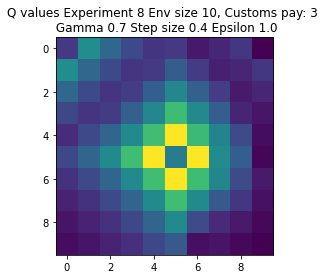

Expr:9 Eps:0 RunnAReward:-13.0 Reward:-258 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-479.0 Reward:-121 Timesteps:300 GotPack:False Utiltime:90 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-537.0 Reward:-275 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:60 RunnAReward:-540.0 Reward:-431 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:-349.0 Reward:-78 Timesteps:200 GotPack:False Utiltime:57 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-190.0 Reward:-251 Timesteps:869 GotPack:True Utiltime:169 Customstime:685 Money:4
Expr:9 Eps:120 RunnAReward:-31.0 Reward:455 Timesteps:439 GotPack:True Utiltime:65 Customstime:170 Money:3
Expr:9 Eps:140 RunnAReward:31.0 Reward:68 Timesteps:200 GotPack:False Utiltime:46 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:-36.0 Reward:-239 Timesteps:400 GotPack:False Utiltime:111 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:132.0 Reward:59

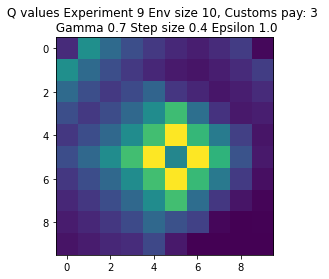

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.7 Step size 0.4 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-9.0 Reward:-168 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-64.0 Reward:78 Timesteps:100 GotPack:False Utiltime:97 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-336.0 Reward:-451 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:60 RunnAReward:-304.0 Reward:-5 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-105.0 Reward:-39 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-135.0 Reward:-175 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:-209.0 Reward:499 Timesteps:342 GotPack:True Utiltime:69 Customstime:23

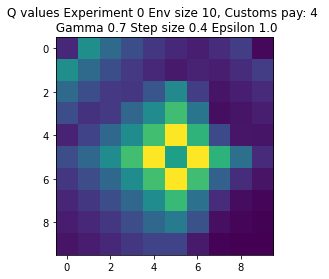

Expr:1 Eps:0 RunnAReward:-2.0 Reward:-25 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-479.0 Reward:-652 Timesteps:1128 GotPack:True Utiltime:624 Customstime:779 Money:5
Expr:1 Eps:40 RunnAReward:-201.0 Reward:-222 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-349.0 Reward:-189 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-144.0 Reward:85 Timesteps:200 GotPack:False Utiltime:8 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:-113.0 Reward:-163 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:-149.0 Reward:-113 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:-21.0 Reward:200 Timesteps:100 GotPack:False Utiltime:56 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:12.0 Reward:214 Timesteps:100 GotPack:False Utiltime:57 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:79.0 Reward:179 Time

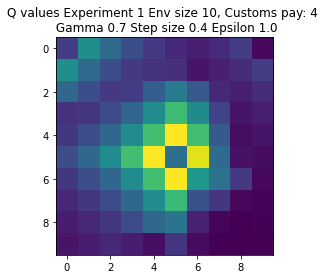

Expr:2 Eps:0 RunnAReward:-7.0 Reward:-131 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-287.0 Reward:-19 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-258.0 Reward:67 Timesteps:200 GotPack:False Utiltime:6 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-464.0 Reward:-27 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-212.0 Reward:-386 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:-238.0 Reward:-140 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-18.0 Reward:157 Timesteps:200 GotPack:False Utiltime:57 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:-105.0 Reward:-38 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:-18.0 Reward:-5 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:-10.0 Reward:-172 Timesteps

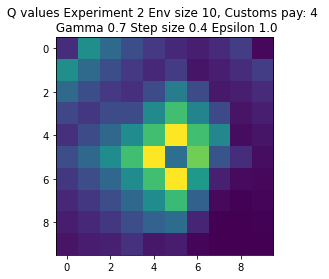

Expr:3 Eps:0 RunnAReward:-8.0 Reward:-159 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-700.0 Reward:76 Timesteps:200 GotPack:False Utiltime:38 Customstime:0 Money:2
Expr:3 Eps:40 RunnAReward:-260.0 Reward:-1893 Timesteps:1917 GotPack:True Utiltime:530 Customstime:734 Money:4
Expr:3 Eps:60 RunnAReward:-353.0 Reward:-15 Timesteps:300 GotPack:False Utiltime:117 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:-290.0 Reward:-302 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:-172.0 Reward:38 Timesteps:700 GotPack:True Utiltime:188 Customstime:303 Money:5
Expr:3 Eps:120 RunnAReward:18.0 Reward:-18 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-10.0 Reward:35 Timesteps:200 GotPack:False Utiltime:27 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:18.0 Reward:-3 Timesteps:300 GotPack:False Utiltime:128 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:125.0 Reward:195 Ti

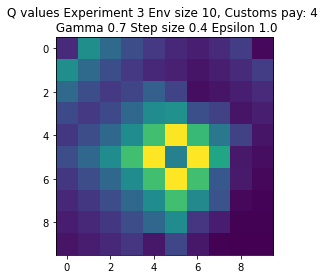

Expr:4 Eps:0 RunnAReward:-6.0 Reward:-118 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-293.0 Reward:-177 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-469.0 Reward:-1179 Timesteps:1430 GotPack:True Utiltime:1055 Customstime:1400 Money:5
Expr:4 Eps:60 RunnAReward:-257.0 Reward:129 Timesteps:200 GotPack:False Utiltime:34 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:-252.0 Reward:-209 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-137.0 Reward:-193 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-95.0 Reward:286 Timesteps:100 GotPack:False Utiltime:92 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:78.0 Reward:-137 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:40.0 Reward:176 Timesteps:100 GotPack:False Utiltime:56 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:36.0 Reward:-205

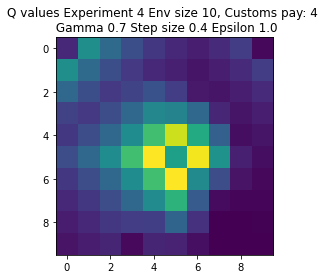

Expr:5 Eps:0 RunnAReward:2.0 Reward:43 Timesteps:200 GotPack:False Utiltime:136 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-334.0 Reward:-172 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-351.0 Reward:-5 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-99.0 Reward:138 Timesteps:561 GotPack:True Utiltime:31 Customstime:459 Money:5
Expr:5 Eps:80 RunnAReward:-187.0 Reward:-186 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-78.0 Reward:161 Timesteps:100 GotPack:False Utiltime:22 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-123.0 Reward:-76 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:-61.0 Reward:65 Timesteps:200 GotPack:False Utiltime:55 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:-27.0 Reward:287 Timesteps:525 GotPack:True Utiltime:120 Customstime:213 Money:5
Expr:5 Eps:180 RunnAReward:-35.0 Reward:-68 Timeste

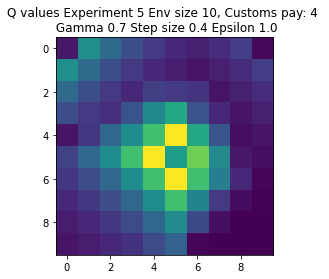

Expr:6 Eps:0 RunnAReward:-13.0 Reward:-243 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-286.0 Reward:-196 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-437.0 Reward:-322 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:60 RunnAReward:-72.0 Reward:-132 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-239.0 Reward:-220 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-175.0 Reward:-84 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-125.0 Reward:17 Timesteps:200 GotPack:False Utiltime:119 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:-45.0 Reward:-9 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:11.0 Reward:110 Timesteps:100 GotPack:False Utiltime:62 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:72.0 Reward:254 Timestep

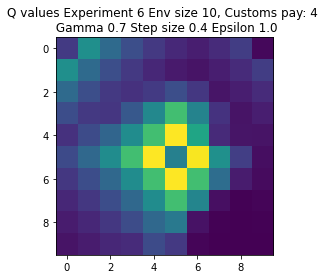

Expr:7 Eps:0 RunnAReward:7.0 Reward:157 Timesteps:100 GotPack:False Utiltime:73 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-520.0 Reward:-161 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-176.0 Reward:-52 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-152.0 Reward:-222 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:80 RunnAReward:-104.0 Reward:269 Timesteps:100 GotPack:False Utiltime:58 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-95.0 Reward:-57 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-181.0 Reward:-289 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:140 RunnAReward:-44.0 Reward:-26 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:-60.0 Reward:-447 Timesteps:1019 GotPack:True Utiltime:848 Customstime:861 Money:5
Expr:7 Eps:180 RunnAReward:-47.0 Reward:-105 Tim

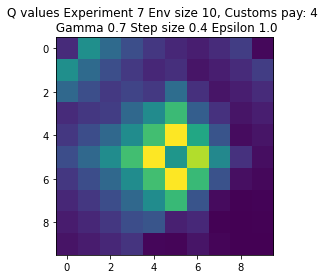

Expr:8 Eps:0 RunnAReward:-2.0 Reward:-33 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-537.0 Reward:361 Timesteps:484 GotPack:True Utiltime:153 Customstime:244 Money:4
Expr:8 Eps:40 RunnAReward:-268.0 Reward:-61 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-221.0 Reward:-98 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-108.0 Reward:-68 Timesteps:200 GotPack:False Utiltime:13 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-145.0 Reward:-260 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:120 RunnAReward:-82.0 Reward:-76 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:-91.0 Reward:-243 Timesteps:804 GotPack:True Utiltime:434 Customstime:690 Money:4
Expr:8 Eps:160 RunnAReward:-3.0 Reward:-94 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:112.0 Reward:-105 Time

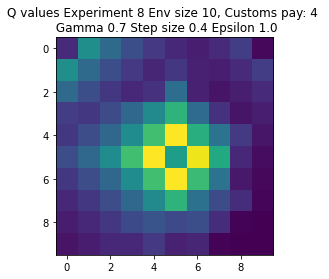

Expr:9 Eps:0 RunnAReward:-7.0 Reward:-126 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-254.0 Reward:-227 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-403.0 Reward:-153 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-180.0 Reward:-986 Timesteps:1482 GotPack:True Utiltime:1105 Customstime:1199 Money:5
Expr:9 Eps:80 RunnAReward:-126.0 Reward:-242 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:9 Eps:100 RunnAReward:-169.0 Reward:120 Timesteps:100 GotPack:False Utiltime:5 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-99.0 Reward:-111 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-136.0 Reward:-1218 Timesteps:1575 GotPack:True Utiltime:597 Customstime:670 Money:5
Expr:9 Eps:160 RunnAReward:-103.0 Reward:-148 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:-47.0 Rew

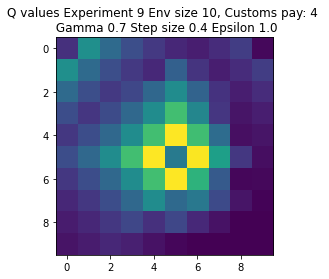

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.7 Step size 0.5 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:2.0 Reward:48 Timesteps:200 GotPack:False Utiltime:128 Customstime:0 Money:1
Expr:0 Eps:20 RunnAReward:-384.0 Reward:-159 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:40 RunnAReward:-131.0 Reward:-543 Timesteps:1060 GotPack:True Utiltime:708 Customstime:788 Money:4
Expr:0 Eps:60 RunnAReward:43.0 Reward:331 Timesteps:453 GotPack:True Utiltime:31 Customstime:263 Money:4
Expr:0 Eps:80 RunnAReward:154.0 Reward:-157 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:100 RunnAReward:200.0 Reward:68 Timesteps:300 GotPack:False Utiltime:74 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:251.0 Reward:484 Timesteps:433 GotPack:True Utiltime:70 Customstime

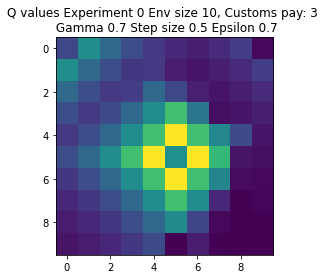

Expr:1 Eps:0 RunnAReward:-41.0 Reward:-810 Timesteps:1337 GotPack:True Utiltime:1125 Customstime:1208 Money:3
Expr:1 Eps:20 RunnAReward:-209.0 Reward:-36 Timesteps:856 GotPack:True Utiltime:357 Customstime:500 Money:4
Expr:1 Eps:40 RunnAReward:-205.0 Reward:-964 Timesteps:1536 GotPack:True Utiltime:863 Customstime:1137 Money:3
Expr:1 Eps:60 RunnAReward:-27.0 Reward:140 Timesteps:200 GotPack:False Utiltime:64 Customstime:0 Money:1
Expr:1 Eps:80 RunnAReward:174.0 Reward:-70 Timesteps:400 GotPack:False Utiltime:195 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:180.0 Reward:745 Timesteps:177 GotPack:True Utiltime:104 Customstime:141 Money:3
Expr:1 Eps:120 RunnAReward:246.0 Reward:60 Timesteps:300 GotPack:False Utiltime:54 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:306.0 Reward:48 Timesteps:300 GotPack:False Utiltime:41 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:260.0 Reward:847 Timesteps:128 GotPack:True Utiltime:50 Customstime:102 Money:3
Expr:1 Eps:180 RunnAReward:600.0 Re

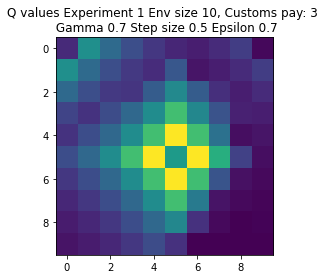

Expr:2 Eps:0 RunnAReward:-14.0 Reward:-276 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-356.0 Reward:-179 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:10.0 Reward:96 Timesteps:200 GotPack:False Utiltime:84 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:125.0 Reward:130 Timesteps:200 GotPack:False Utiltime:102 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:133.0 Reward:30 Timesteps:200 GotPack:False Utiltime:25 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:193.0 Reward:567 Timesteps:353 GotPack:True Utiltime:33 Customstime:137 Money:3
Expr:2 Eps:120 RunnAReward:158.0 Reward:657 Timesteps:314 GotPack:True Utiltime:81 Customstime:280 Money:3
Expr:2 Eps:140 RunnAReward:357.0 Reward:748 Timesteps:202 GotPack:True Utiltime:77 Customstime:159 Money:4
Expr:2 Eps:160 RunnAReward:286.0 Reward:671 Timesteps:258 GotPack:True Utiltime:37 Customstime:223 Money:4
Expr:2 Eps:180 RunnAReward:559.0 Reward:771 Times

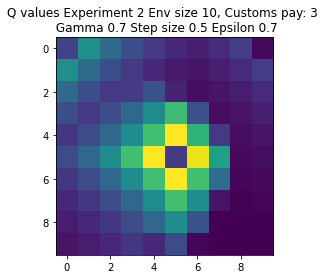

Expr:3 Eps:0 RunnAReward:-12.0 Reward:-239 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-226.0 Reward:-446 Timesteps:1062 GotPack:True Utiltime:542 Customstime:999 Money:5
Expr:3 Eps:40 RunnAReward:-247.0 Reward:-41 Timesteps:806 GotPack:True Utiltime:541 Customstime:610 Money:4
Expr:3 Eps:60 RunnAReward:-16.0 Reward:94 Timesteps:200 GotPack:False Utiltime:94 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:104.0 Reward:-291 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:133.0 Reward:-59 Timesteps:643 GotPack:True Utiltime:21 Customstime:305 Money:3
Expr:3 Eps:120 RunnAReward:215.0 Reward:493 Timesteps:337 GotPack:True Utiltime:25 Customstime:83 Money:5
Expr:3 Eps:140 RunnAReward:425.0 Reward:863 Timesteps:117 GotPack:True Utiltime:25 Customstime:95 Money:5
Expr:3 Eps:160 RunnAReward:384.0 Reward:577 Timesteps:303 GotPack:True Utiltime:46 Customstime:294 Money:3
Expr:3 Eps:180 RunnAReward:546.0 Reward:572

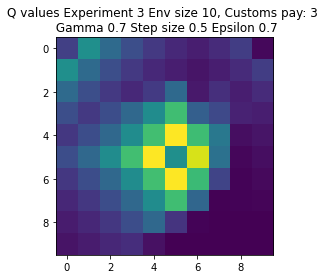

Expr:4 Eps:0 RunnAReward:-20.0 Reward:-394 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:20 RunnAReward:-310.0 Reward:19 Timesteps:300 GotPack:False Utiltime:206 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:44.0 Reward:555 Timesteps:361 GotPack:True Utiltime:159 Customstime:222 Money:5
Expr:4 Eps:60 RunnAReward:27.0 Reward:-206 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:90.0 Reward:44 Timesteps:200 GotPack:False Utiltime:29 Customstime:0 Money:1
Expr:4 Eps:100 RunnAReward:100.0 Reward:49 Timesteps:300 GotPack:False Utiltime:40 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:179.0 Reward:115 Timesteps:200 GotPack:False Utiltime:43 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:303.0 Reward:117 Timesteps:701 GotPack:True Utiltime:26 Customstime:275 Money:3
Expr:4 Eps:160 RunnAReward:409.0 Reward:31 Timesteps:300 GotPack:False Utiltime:67 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:482.0 Reward:-6 Timesteps:7

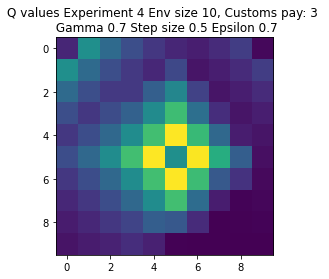

Expr:5 Eps:0 RunnAReward:-15.0 Reward:-281 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-346.0 Reward:-233 Timesteps:810 GotPack:True Utiltime:94 Customstime:458 Money:3
Expr:5 Eps:40 RunnAReward:-113.0 Reward:87 Timesteps:200 GotPack:False Utiltime:47 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-6.0 Reward:-255 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:61.0 Reward:86 Timesteps:710 GotPack:True Utiltime:6 Customstime:427 Money:3
Expr:5 Eps:100 RunnAReward:224.0 Reward:548 Timesteps:320 GotPack:True Utiltime:58 Customstime:145 Money:5
Expr:5 Eps:120 RunnAReward:193.0 Reward:271 Timesteps:525 GotPack:True Utiltime:59 Customstime:168 Money:4
Expr:5 Eps:140 RunnAReward:354.0 Reward:45 Timesteps:200 GotPack:False Utiltime:33 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:320.0 Reward:35 Timesteps:300 GotPack:False Utiltime:63 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:527.0 Reward:674 Timestep

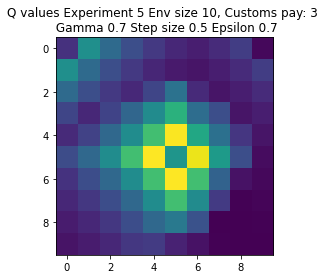

Expr:6 Eps:0 RunnAReward:6.0 Reward:138 Timesteps:200 GotPack:False Utiltime:121 Customstime:0 Money:1
Expr:6 Eps:20 RunnAReward:-358.0 Reward:-6 Timesteps:200 GotPack:False Utiltime:12 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-125.0 Reward:-63 Timesteps:745 GotPack:True Utiltime:113 Customstime:438 Money:5
Expr:6 Eps:60 RunnAReward:-3.0 Reward:532 Timesteps:360 GotPack:True Utiltime:65 Customstime:110 Money:3
Expr:6 Eps:80 RunnAReward:169.0 Reward:530 Timesteps:358 GotPack:True Utiltime:52 Customstime:228 Money:3
Expr:6 Eps:100 RunnAReward:179.0 Reward:146 Timesteps:200 GotPack:False Utiltime:115 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:386.0 Reward:327 Timesteps:511 GotPack:True Utiltime:46 Customstime:204 Money:3
Expr:6 Eps:140 RunnAReward:341.0 Reward:697 Timesteps:183 GotPack:True Utiltime:23 Customstime:87 Money:3
Expr:6 Eps:160 RunnAReward:323.0 Reward:-102 Timesteps:300 GotPack:False Utiltime:41 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:366.0 Reward:798 Ti

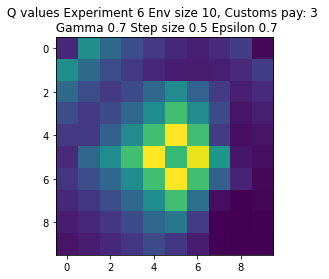

Expr:7 Eps:0 RunnAReward:-17.0 Reward:-327 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-348.0 Reward:-281 Timesteps:500 GotPack:False Utiltime:48 Customstime:0 Money:2
Expr:7 Eps:40 RunnAReward:-48.0 Reward:303 Timesteps:625 GotPack:True Utiltime:41 Customstime:107 Money:5
Expr:7 Eps:60 RunnAReward:171.0 Reward:166 Timesteps:200 GotPack:False Utiltime:85 Customstime:0 Money:1
Expr:7 Eps:80 RunnAReward:278.0 Reward:205 Timesteps:503 GotPack:True Utiltime:153 Customstime:233 Money:5
Expr:7 Eps:100 RunnAReward:293.0 Reward:32 Timesteps:300 GotPack:False Utiltime:122 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:143.0 Reward:-229 Timesteps:950 GotPack:True Utiltime:84 Customstime:251 Money:3
Expr:7 Eps:140 RunnAReward:323.0 Reward:161 Timesteps:200 GotPack:False Utiltime:65 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:304.0 Reward:442 Timesteps:474 GotPack:True Utiltime:139 Customstime:218 Money:3
Expr:7 Eps:180 RunnAReward:440.0 Reward:132

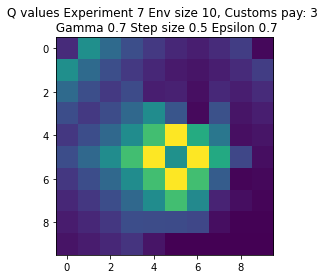

Expr:8 Eps:0 RunnAReward:-50.0 Reward:-1000 Timesteps:1617 GotPack:True Utiltime:165 Customstime:432 Money:5
Expr:8 Eps:20 RunnAReward:-323.0 Reward:-858 Timesteps:1405 GotPack:True Utiltime:856 Customstime:973 Money:5
Expr:8 Eps:40 RunnAReward:-68.0 Reward:135 Timesteps:200 GotPack:False Utiltime:89 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:75.0 Reward:804 Timesteps:158 GotPack:True Utiltime:41 Customstime:93 Money:5
Expr:8 Eps:80 RunnAReward:65.0 Reward:-16 Timesteps:300 GotPack:False Utiltime:54 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:158.0 Reward:232 Timesteps:597 GotPack:True Utiltime:52 Customstime:271 Money:4
Expr:8 Eps:120 RunnAReward:264.0 Reward:463 Timesteps:469 GotPack:True Utiltime:59 Customstime:294 Money:4
Expr:8 Eps:140 RunnAReward:390.0 Reward:118 Timesteps:200 GotPack:False Utiltime:47 Customstime:0 Money:1
Expr:8 Eps:160 RunnAReward:339.0 Reward:42 Timesteps:300 GotPack:False Utiltime:21 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:462.0 Reward:594

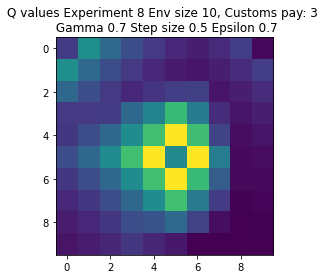

Expr:9 Eps:0 RunnAReward:-2.0 Reward:-23 Timesteps:300 GotPack:False Utiltime:7 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-227.0 Reward:-215 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-241.0 Reward:-34 Timesteps:300 GotPack:False Utiltime:24 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:98.0 Reward:623 Timesteps:320 GotPack:True Utiltime:146 Customstime:289 Money:3
Expr:9 Eps:80 RunnAReward:177.0 Reward:81 Timesteps:300 GotPack:False Utiltime:15 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:204.0 Reward:382 Timesteps:504 GotPack:True Utiltime:37 Customstime:232 Money:4
Expr:9 Eps:120 RunnAReward:202.0 Reward:79 Timesteps:200 GotPack:False Utiltime:60 Customstime:0 Money:1
Expr:9 Eps:140 RunnAReward:388.0 Reward:591 Timesteps:287 GotPack:True Utiltime:36 Customstime:77 Money:5
Expr:9 Eps:160 RunnAReward:445.0 Reward:60 Timesteps:200 GotPack:False Utiltime:72 Customstime:0 Money:1
Expr:9 Eps:180 RunnAReward:483.0 Reward:772 Timesteps

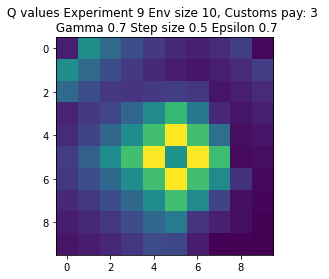

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.7 Step size 0.5 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-7.0 Reward:-131 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-314.0 Reward:-317 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:40 RunnAReward:-43.0 Reward:-29 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:11.0 Reward:-13 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:86.0 Reward:-32 Timesteps:300 GotPack:False Utiltime:18 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:236.0 Reward:-21 Timesteps:300 GotPack:False Utiltime:61 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:228.0 Reward:170 Timesteps:100 GotPack:False Utiltime:83 Customstime:0 Mon

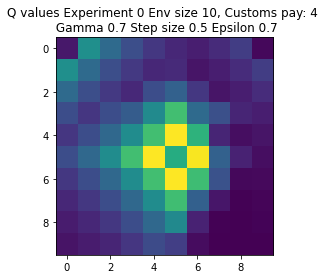

Expr:1 Eps:0 RunnAReward:-8.0 Reward:-145 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-327.0 Reward:43 Timesteps:200 GotPack:False Utiltime:164 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-89.0 Reward:-44 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:5.0 Reward:-65 Timesteps:200 GotPack:False Utiltime:5 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:57.0 Reward:-41 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:99.0 Reward:261 Timesteps:513 GotPack:True Utiltime:58 Customstime:194 Money:4
Expr:1 Eps:120 RunnAReward:163.0 Reward:-156 Timesteps:300 GotPack:False Utiltime:25 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:258.0 Reward:585 Timesteps:262 GotPack:True Utiltime:4 Customstime:162 Money:5
Expr:1 Eps:160 RunnAReward:239.0 Reward:150 Timesteps:200 GotPack:False Utiltime:37 Customstime:0 Money:3
Expr:1 Eps:180 RunnAReward:241.0 Reward:49 Timesteps:300 

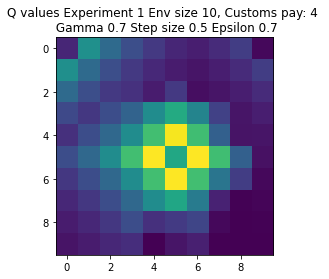

Expr:2 Eps:0 RunnAReward:0.0 Reward:19 Timesteps:300 GotPack:False Utiltime:131 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-15.0 Reward:-134 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:34.0 Reward:413 Timesteps:386 GotPack:True Utiltime:15 Customstime:202 Money:5
Expr:2 Eps:60 RunnAReward:-61.0 Reward:-30 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:74.0 Reward:549 Timesteps:313 GotPack:True Utiltime:46 Customstime:177 Money:5
Expr:2 Eps:100 RunnAReward:133.0 Reward:40 Timesteps:200 GotPack:False Utiltime:9 Customstime:0 Money:3
Expr:2 Eps:120 RunnAReward:153.0 Reward:-31 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:258.0 Reward:154 Timesteps:733 GotPack:True Utiltime:19 Customstime:104 Money:5
Expr:2 Eps:160 RunnAReward:211.0 Reward:274 Timesteps:100 GotPack:False Utiltime:73 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:329.0 Reward:248 Timesteps:100

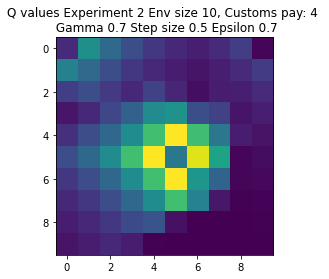

Expr:3 Eps:0 RunnAReward:-6.0 Reward:-113 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-288.0 Reward:-754 Timesteps:1228 GotPack:True Utiltime:186 Customstime:300 Money:5
Expr:3 Eps:40 RunnAReward:-59.0 Reward:-358 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:30.0 Reward:-54 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-16.0 Reward:-17 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:205.0 Reward:-67 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:167.0 Reward:141 Timesteps:100 GotPack:False Utiltime:50 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:150.0 Reward:65 Timesteps:824 GotPack:True Utiltime:98 Customstime:260 Money:5
Expr:3 Eps:160 RunnAReward:239.0 Reward:677 Timesteps:234 GotPack:True Utiltime:6 Customstime:78 Money:5
Expr:3 Eps:180 RunnAReward:296.0 Reward:-182 Timestep

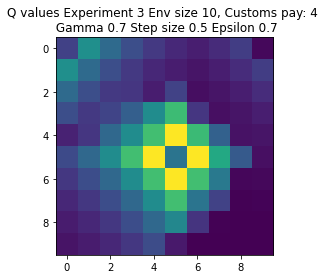

Expr:4 Eps:0 RunnAReward:-12.0 Reward:-240 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-214.0 Reward:134 Timesteps:100 GotPack:False Utiltime:88 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-11.0 Reward:168 Timesteps:100 GotPack:False Utiltime:56 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-8.0 Reward:20 Timesteps:300 GotPack:False Utiltime:32 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:91.0 Reward:397 Timesteps:464 GotPack:True Utiltime:14 Customstime:178 Money:5
Expr:4 Eps:100 RunnAReward:61.0 Reward:-17 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:107.0 Reward:-73 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:197.0 Reward:134 Timesteps:200 GotPack:False Utiltime:56 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:170.0 Reward:260 Timesteps:100 GotPack:False Utiltime:85 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:210.0 Reward:114 Timesteps:20

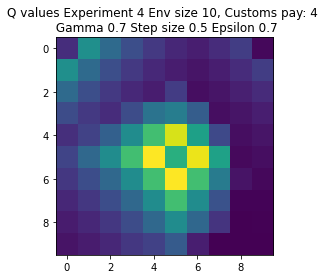

Expr:5 Eps:0 RunnAReward:-78.0 Reward:-1546 Timesteps:1804 GotPack:True Utiltime:1641 Customstime:1685 Money:5
Expr:5 Eps:20 RunnAReward:-68.0 Reward:162 Timesteps:100 GotPack:False Utiltime:84 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-70.0 Reward:160 Timesteps:100 GotPack:False Utiltime:16 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-50.0 Reward:60 Timesteps:668 GotPack:True Utiltime:30 Customstime:167 Money:5
Expr:5 Eps:80 RunnAReward:5.0 Reward:138 Timesteps:100 GotPack:False Utiltime:21 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:30.0 Reward:-18 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:82.0 Reward:-43 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:159.0 Reward:0 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:291.0 Reward:679 Timesteps:150 GotPack:True Utiltime:47 Customstime:124 Money:5
Expr:5 Eps:180 RunnAReward:257.0 Reward:170 Timesteps

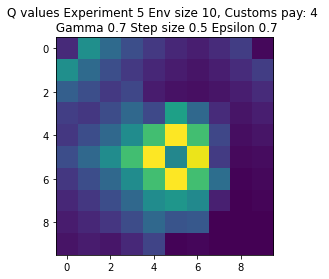

Expr:6 Eps:0 RunnAReward:-1.0 Reward:-5 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-241.0 Reward:-93 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:74.0 Reward:48 Timesteps:200 GotPack:False Utiltime:48 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:3.0 Reward:-21 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:197.0 Reward:466 Timesteps:258 GotPack:True Utiltime:115 Customstime:145 Money:5
Expr:6 Eps:100 RunnAReward:197.0 Reward:70 Timesteps:200 GotPack:False Utiltime:120 Customstime:0 Money:3
Expr:6 Eps:120 RunnAReward:126.0 Reward:28 Timesteps:200 GotPack:False Utiltime:11 Customstime:0 Money:3
Expr:6 Eps:140 RunnAReward:259.0 Reward:-115 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:195.0 Reward:635 Timesteps:334 GotPack:True Utiltime:42 Customstime:166 Money:5
Expr:6 Eps:180 RunnAReward:258.0 Reward:732 Timesteps:234 

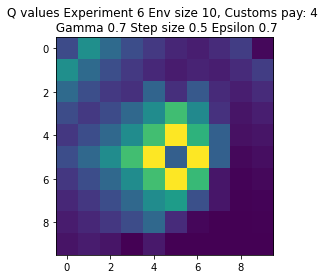

Expr:7 Eps:0 RunnAReward:-7.0 Reward:-134 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-256.0 Reward:-533 Timesteps:1124 GotPack:True Utiltime:864 Customstime:967 Money:5
Expr:7 Eps:40 RunnAReward:-12.0 Reward:-127 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:42.0 Reward:147 Timesteps:200 GotPack:False Utiltime:27 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:91.0 Reward:-265 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:71.0 Reward:82 Timesteps:200 GotPack:False Utiltime:95 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:103.0 Reward:217 Timesteps:100 GotPack:False Utiltime:27 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:70.0 Reward:38 Timesteps:200 GotPack:False Utiltime:15 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:218.0 Reward:180 Timesteps:100 GotPack:False Utiltime:83 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:283.0 Reward:-10 Timesteps:

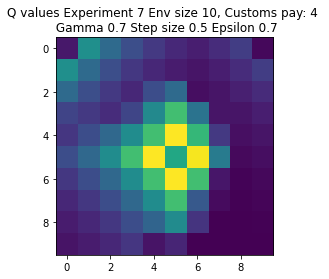

Expr:8 Eps:0 RunnAReward:-6.0 Reward:-103 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-207.0 Reward:-113 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-51.0 Reward:-601 Timesteps:1353 GotPack:True Utiltime:777 Customstime:797 Money:5
Expr:8 Eps:60 RunnAReward:-25.0 Reward:-4 Timesteps:712 GotPack:True Utiltime:397 Customstime:629 Money:4
Expr:8 Eps:80 RunnAReward:103.0 Reward:-37 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:29.0 Reward:157 Timesteps:200 GotPack:False Utiltime:21 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:240.0 Reward:78 Timesteps:200 GotPack:False Utiltime:5 Customstime:0 Money:3
Expr:8 Eps:140 RunnAReward:225.0 Reward:283 Timesteps:100 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:233.0 Reward:269 Timesteps:100 GotPack:False Utiltime:48 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:313.0 Reward:267 Timeste

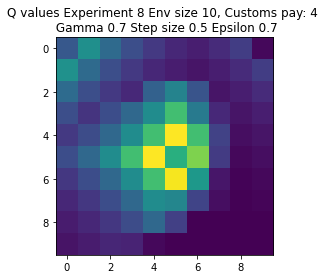

Expr:9 Eps:0 RunnAReward:1.0 Reward:29 Timesteps:703 GotPack:True Utiltime:298 Customstime:384 Money:5
Expr:9 Eps:20 RunnAReward:-60.0 Reward:131 Timesteps:200 GotPack:False Utiltime:87 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-20.0 Reward:157 Timesteps:100 GotPack:False Utiltime:28 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-9.0 Reward:274 Timesteps:100 GotPack:False Utiltime:54 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-125.0 Reward:-171 Timesteps:300 GotPack:False Utiltime:96 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:163.0 Reward:71 Timesteps:200 GotPack:False Utiltime:98 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:207.0 Reward:164 Timesteps:683 GotPack:True Utiltime:169 Customstime:289 Money:4
Expr:9 Eps:140 RunnAReward:172.0 Reward:60 Timesteps:200 GotPack:False Utiltime:145 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:212.0 Reward:413 Timesteps:486 GotPack:True Utiltime:64 Customstime:126 Money:4
Expr:9 Eps:180 RunnAReward:347.0 Reward:440 Timest

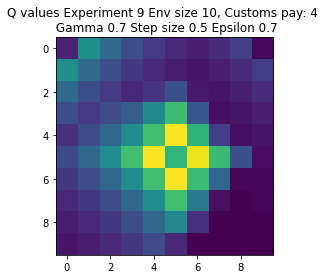

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.7 Step size 0.5 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-18.0 Reward:-350 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-191.0 Reward:-552 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-326.0 Reward:-146 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:60 RunnAReward:20.0 Reward:-209 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-83.0 Reward:-204 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:100 RunnAReward:-17.0 Reward:140 Timesteps:200 GotPack:False Utiltime:110 Customstime:0 Money:1
Expr:0 Eps:120 RunnAReward:-103.0 Reward:-126 Timesteps:200 GotPack:False Utiltime:0 Customstim

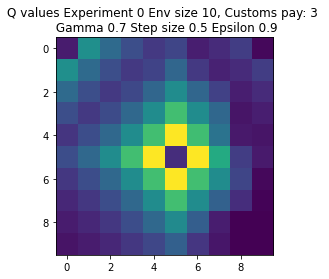

Expr:1 Eps:0 RunnAReward:-5.0 Reward:-92 Timesteps:400 GotPack:False Utiltime:326 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-203.0 Reward:-311 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-325.0 Reward:-160 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-295.0 Reward:-1 Timesteps:300 GotPack:False Utiltime:150 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:-11.0 Reward:-122 Timesteps:300 GotPack:False Utiltime:67 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:47.0 Reward:104 Timesteps:200 GotPack:False Utiltime:78 Customstime:0 Money:1
Expr:1 Eps:120 RunnAReward:64.0 Reward:114 Timesteps:200 GotPack:False Utiltime:75 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:78.0 Reward:-48 Timesteps:200 GotPack:False Utiltime:26 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:192.0 Reward:149 Timesteps:634 GotPack:True Utiltime:238 Customstime:480 Money:5
Expr:1 Eps:180 RunnAReward:71.0 Reward:-130 Times

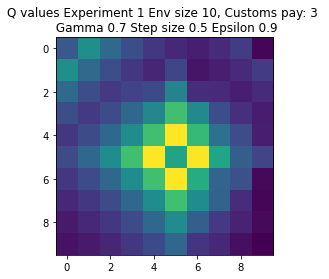

Expr:2 Eps:0 RunnAReward:3.0 Reward:74 Timesteps:200 GotPack:False Utiltime:153 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-210.0 Reward:-413 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-436.0 Reward:-542 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-370.0 Reward:101 Timesteps:200 GotPack:False Utiltime:51 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-59.0 Reward:416 Timesteps:355 GotPack:True Utiltime:28 Customstime:212 Money:4
Expr:2 Eps:100 RunnAReward:36.0 Reward:13 Timesteps:300 GotPack:False Utiltime:47 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:120.0 Reward:39 Timesteps:200 GotPack:False Utiltime:100 Customstime:0 Money:1
Expr:2 Eps:140 RunnAReward:118.0 Reward:306 Timesteps:579 GotPack:True Utiltime:249 Customstime:470 Money:3
Expr:2 Eps:160 RunnAReward:64.0 Reward:243 Timesteps:554 GotPack:True Utiltime:79 Customstime:203 Money:3
Expr:2 Eps:180 RunnAReward:177.0 Reward:11 Timeste

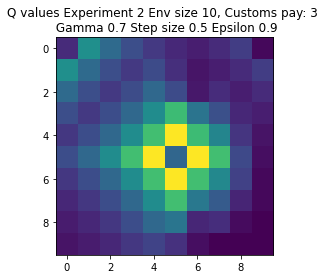

Expr:3 Eps:0 RunnAReward:-61.0 Reward:-1212 Timesteps:1529 GotPack:True Utiltime:989 Customstime:1165 Money:4
Expr:3 Eps:20 RunnAReward:-400.0 Reward:-1588 Timesteps:1694 GotPack:True Utiltime:1342 Customstime:1461 Money:3
Expr:3 Eps:40 RunnAReward:-237.0 Reward:-288 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-175.0 Reward:147 Timesteps:200 GotPack:False Utiltime:115 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:-74.0 Reward:-49 Timesteps:200 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:27.0 Reward:37 Timesteps:752 GotPack:True Utiltime:421 Customstime:519 Money:4
Expr:3 Eps:120 RunnAReward:67.0 Reward:185 Timesteps:200 GotPack:False Utiltime:87 Customstime:0 Money:1
Expr:3 Eps:140 RunnAReward:61.0 Reward:-506 Timesteps:1230 GotPack:True Utiltime:949 Customstime:1096 Money:5
Expr:3 Eps:160 RunnAReward:162.0 Reward:539 Timesteps:371 GotPack:True Utiltime:22 Customstime:270 Money:3
Expr:3 Eps:180 RunnAReward:274.

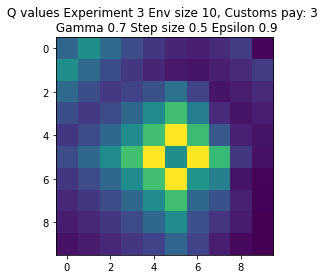

Expr:4 Eps:0 RunnAReward:-93.0 Reward:-1846 Timesteps:1805 GotPack:True Utiltime:1180 Customstime:1554 Money:5
Expr:4 Eps:20 RunnAReward:-650.0 Reward:-475 Timesteps:500 GotPack:False Utiltime:120 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-258.0 Reward:-207 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:60 RunnAReward:-128.0 Reward:-170 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-127.0 Reward:-24 Timesteps:710 GotPack:True Utiltime:34 Customstime:107 Money:3
Expr:4 Eps:100 RunnAReward:19.0 Reward:134 Timesteps:547 GotPack:True Utiltime:120 Customstime:256 Money:3
Expr:4 Eps:120 RunnAReward:-30.0 Reward:162 Timesteps:200 GotPack:False Utiltime:34 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:190.0 Reward:165 Timesteps:200 GotPack:False Utiltime:21 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:152.0 Reward:118 Timesteps:200 GotPack:False Utiltime:47 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:132.0 Rewa

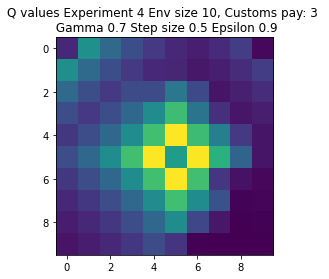

Expr:5 Eps:0 RunnAReward:-9.0 Reward:-166 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-413.0 Reward:-402 Timesteps:991 GotPack:True Utiltime:338 Customstime:610 Money:5
Expr:5 Eps:40 RunnAReward:-294.0 Reward:172 Timesteps:200 GotPack:False Utiltime:150 Customstime:0 Money:1
Expr:5 Eps:60 RunnAReward:-117.0 Reward:-209 Timesteps:921 GotPack:True Utiltime:460 Customstime:584 Money:5
Expr:5 Eps:80 RunnAReward:-118.0 Reward:25 Timesteps:200 GotPack:False Utiltime:78 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-25.0 Reward:105 Timesteps:200 GotPack:False Utiltime:42 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:124.0 Reward:-13 Timesteps:300 GotPack:False Utiltime:35 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:34.0 Reward:-842 Timesteps:1502 GotPack:True Utiltime:104 Customstime:279 Money:4
Expr:5 Eps:160 RunnAReward:41.0 Reward:-204 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:80.0 Reward:23

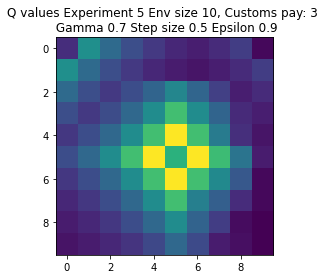

Expr:6 Eps:0 RunnAReward:-9.0 Reward:-180 Timesteps:400 GotPack:False Utiltime:285 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-660.0 Reward:-376 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-390.0 Reward:98 Timesteps:200 GotPack:False Utiltime:53 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-64.0 Reward:108 Timesteps:200 GotPack:False Utiltime:93 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-51.0 Reward:-39 Timesteps:300 GotPack:False Utiltime:63 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:25.0 Reward:-416 Timesteps:1104 GotPack:True Utiltime:196 Customstime:322 Money:3
Expr:6 Eps:120 RunnAReward:115.0 Reward:740 Timesteps:229 GotPack:True Utiltime:36 Customstime:90 Money:3
Expr:6 Eps:140 RunnAReward:144.0 Reward:52 Timesteps:200 GotPack:False Utiltime:101 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:170.0 Reward:163 Timesteps:200 GotPack:False Utiltime:102 Customstime:0 Money:1
Expr:6 Eps:180 RunnAReward:227.0 Reward:113 Ti

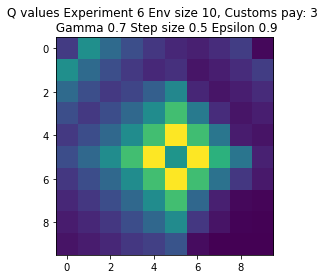

Expr:7 Eps:0 RunnAReward:15.0 Reward:316 Timesteps:500 GotPack:True Utiltime:250 Customstime:353 Money:3
Expr:7 Eps:20 RunnAReward:-538.0 Reward:-243 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-240.0 Reward:-309 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-111.0 Reward:640 Timesteps:225 GotPack:True Utiltime:181 Customstime:205 Money:5
Expr:7 Eps:80 RunnAReward:-37.0 Reward:-190 Timesteps:400 GotPack:False Utiltime:135 Customstime:0 Money:1
Expr:7 Eps:100 RunnAReward:-10.0 Reward:73 Timesteps:200 GotPack:False Utiltime:143 Customstime:0 Money:1
Expr:7 Eps:120 RunnAReward:125.0 Reward:111 Timesteps:200 GotPack:False Utiltime:138 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:54.0 Reward:62 Timesteps:200 GotPack:False Utiltime:21 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:98.0 Reward:159 Timesteps:200 GotPack:False Utiltime:151 Customstime:0 Money:1
Expr:7 Eps:180 RunnAReward:248.0 Reward:584 T

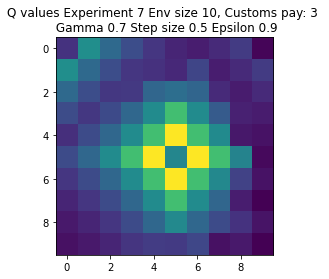

Expr:8 Eps:0 RunnAReward:-90.0 Reward:-1791 Timesteps:1926 GotPack:True Utiltime:1568 Customstime:1663 Money:5
Expr:8 Eps:20 RunnAReward:-491.0 Reward:-675 Timesteps:1096 GotPack:True Utiltime:367 Customstime:618 Money:5
Expr:8 Eps:40 RunnAReward:-249.0 Reward:-171 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:60 RunnAReward:-153.0 Reward:88 Timesteps:200 GotPack:False Utiltime:178 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-110.0 Reward:97 Timesteps:200 GotPack:False Utiltime:86 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:87.0 Reward:615 Timesteps:305 GotPack:True Utiltime:70 Customstime:291 Money:3
Expr:8 Eps:120 RunnAReward:34.0 Reward:-54 Timesteps:300 GotPack:False Utiltime:174 Customstime:0 Money:1
Expr:8 Eps:140 RunnAReward:181.0 Reward:-112 Timesteps:300 GotPack:False Utiltime:141 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:248.0 Reward:327 Timesteps:519 GotPack:True Utiltime:49 Customstime:300 Money:3
Expr:8 Eps:180 RunnAReward:231.0 Re

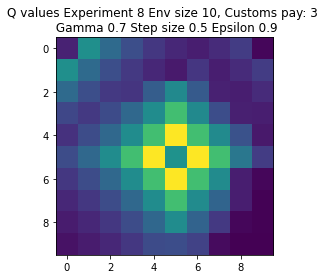

Expr:9 Eps:0 RunnAReward:-14.0 Reward:-265 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-262.0 Reward:-207 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-299.0 Reward:-18 Timesteps:713 GotPack:True Utiltime:557 Customstime:671 Money:5
Expr:9 Eps:60 RunnAReward:-245.0 Reward:82 Timesteps:607 GotPack:True Utiltime:90 Customstime:587 Money:3
Expr:9 Eps:80 RunnAReward:-94.0 Reward:-10 Timesteps:200 GotPack:False Utiltime:21 Customstime:0 Money:1
Expr:9 Eps:100 RunnAReward:-69.0 Reward:-830 Timesteps:1339 GotPack:True Utiltime:259 Customstime:519 Money:3
Expr:9 Eps:120 RunnAReward:9.0 Reward:104 Timesteps:638 GotPack:True Utiltime:108 Customstime:406 Money:3
Expr:9 Eps:140 RunnAReward:192.0 Reward:150 Timesteps:615 GotPack:True Utiltime:42 Customstime:298 Money:3
Expr:9 Eps:160 RunnAReward:227.0 Reward:-44 Timesteps:300 GotPack:False Utiltime:74 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:112.0 Reward:-6

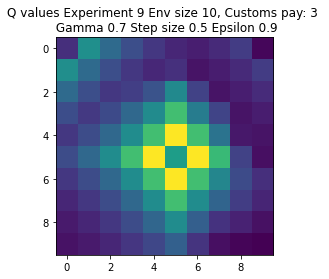

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.7 Step size 0.5 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-3.0 Reward:-41 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-317.0 Reward:-805 Timesteps:1156 GotPack:True Utiltime:378 Customstime:652 Money:4
Expr:0 Eps:40 RunnAReward:-380.0 Reward:123 Timesteps:200 GotPack:False Utiltime:186 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-80.0 Reward:-235 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:80 RunnAReward:-59.0 Reward:274 Timesteps:100 GotPack:False Utiltime:87 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-10.0 Reward:-59 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:4.0 Reward:-165 Timesteps:100 GotPack:False Utiltime:0 Customstime

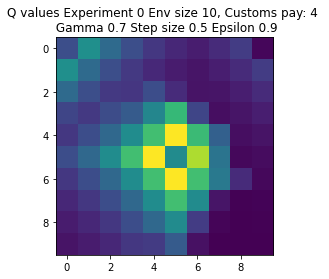

Expr:1 Eps:0 RunnAReward:-1.0 Reward:-20 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-251.0 Reward:-118 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-339.0 Reward:-913 Timesteps:1336 GotPack:True Utiltime:872 Customstime:1118 Money:5
Expr:1 Eps:60 RunnAReward:-193.0 Reward:-772 Timesteps:1112 GotPack:True Utiltime:13 Customstime:145 Money:4
Expr:1 Eps:80 RunnAReward:-65.0 Reward:-99 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:51.0 Reward:-10 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:35.0 Reward:-327 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:140 RunnAReward:18.0 Reward:85 Timesteps:200 GotPack:False Utiltime:26 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:43.0 Reward:156 Timesteps:100 GotPack:False Utiltime:14 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:42.0 Reward:-41 Timeste

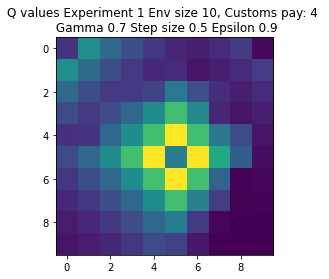

Expr:2 Eps:0 RunnAReward:-11.0 Reward:-205 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-145.0 Reward:-109 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-36.0 Reward:-212 Timesteps:917 GotPack:True Utiltime:63 Customstime:159 Money:5
Expr:2 Eps:60 RunnAReward:-10.0 Reward:160 Timesteps:100 GotPack:False Utiltime:52 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:22.0 Reward:129 Timesteps:100 GotPack:False Utiltime:69 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-51.0 Reward:-46 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:57.0 Reward:122 Timesteps:100 GotPack:False Utiltime:60 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:180.0 Reward:197 Timesteps:672 GotPack:True Utiltime:47 Customstime:332 Money:5
Expr:2 Eps:160 RunnAReward:51.0 Reward:153 Timesteps:100 GotPack:False Utiltime:57 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:110.0 Reward:-128 Timeste

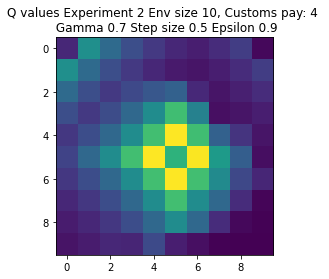

Expr:3 Eps:0 RunnAReward:-2.0 Reward:-32 Timesteps:300 GotPack:False Utiltime:99 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-406.0 Reward:-70 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-59.0 Reward:-228 Timesteps:983 GotPack:True Utiltime:546 Customstime:577 Money:5
Expr:3 Eps:60 RunnAReward:-78.0 Reward:-91 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:12.0 Reward:-134 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-48.0 Reward:-30 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:146.0 Reward:44 Timesteps:300 GotPack:False Utiltime:250 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:14.0 Reward:-34 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:89.0 Reward:-190 Timesteps:958 GotPack:True Utiltime:67 Customstime:158 Money:5
Expr:3 Eps:180 RunnAReward:92.0 Reward:171 Timesteps:2

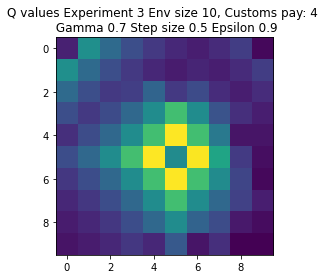

Expr:4 Eps:0 RunnAReward:-8.0 Reward:-146 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-304.0 Reward:-159 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-146.0 Reward:-341 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-60.0 Reward:-154 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-4.0 Reward:-18 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-80.0 Reward:620 Timesteps:236 GotPack:True Utiltime:127 Customstime:187 Money:5
Expr:4 Eps:120 RunnAReward:43.0 Reward:115 Timesteps:100 GotPack:False Utiltime:13 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:-54.0 Reward:124 Timesteps:100 GotPack:False Utiltime:58 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:91.0 Reward:-42 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:185.0 Reward:581 Timesteps:

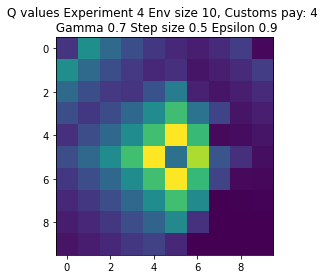

Expr:5 Eps:0 RunnAReward:-10.0 Reward:-185 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-104.0 Reward:-144 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-225.0 Reward:-120 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-179.0 Reward:-93 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-111.0 Reward:-149 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:12.0 Reward:564 Timesteps:247 GotPack:True Utiltime:46 Customstime:200 Money:4
Expr:5 Eps:120 RunnAReward:168.0 Reward:156 Timesteps:601 GotPack:True Utiltime:502 Customstime:537 Money:4
Expr:5 Eps:140 RunnAReward:95.0 Reward:186 Timesteps:100 GotPack:False Utiltime:5 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:221.0 Reward:172 Timesteps:200 GotPack:False Utiltime:57 Customstime:0 Money:2
Expr:5 Eps:180 RunnAReward:156.0 Reward:637 Times

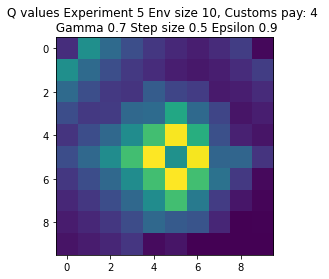

Expr:6 Eps:0 RunnAReward:-3.0 Reward:-41 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-343.0 Reward:-267 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-153.0 Reward:-608 Timesteps:1226 GotPack:True Utiltime:335 Customstime:1000 Money:4
Expr:6 Eps:60 RunnAReward:-61.0 Reward:-173 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-59.0 Reward:195 Timesteps:100 GotPack:False Utiltime:31 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-24.0 Reward:-18 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:7.0 Reward:190 Timesteps:100 GotPack:False Utiltime:69 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:188.0 Reward:171 Timesteps:200 GotPack:False Utiltime:44 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:148.0 Reward:190 Timesteps:100 GotPack:False Utiltime:20 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:80.0 Reward:-109 Timest

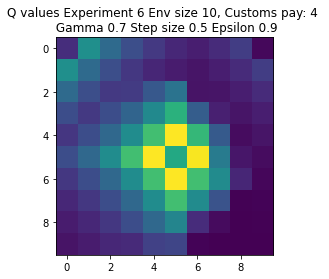

Expr:7 Eps:0 RunnAReward:-20.0 Reward:-383 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-249.0 Reward:-289 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:40 RunnAReward:-245.0 Reward:-28 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-120.0 Reward:-125 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-49.0 Reward:-132 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-17.0 Reward:-115 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-39.0 Reward:-35 Timesteps:300 GotPack:False Utiltime:193 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:29.0 Reward:-154 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:-6.0 Reward:295 Timesteps:100 GotPack:False Utiltime:13 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:158.0 Reward:295 Timeste

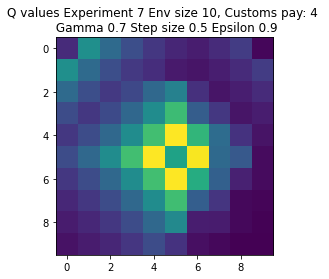

Expr:8 Eps:0 RunnAReward:-12.0 Reward:-236 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-5.0 Reward:-23 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-171.0 Reward:-229 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:23.0 Reward:-40 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-14.0 Reward:54 Timesteps:300 GotPack:False Utiltime:61 Customstime:0 Money:3
Expr:8 Eps:100 RunnAReward:41.0 Reward:7 Timesteps:200 GotPack:False Utiltime:74 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:83.0 Reward:180 Timesteps:100 GotPack:False Utiltime:72 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:4.0 Reward:803 Timesteps:164 GotPack:True Utiltime:14 Customstime:75 Money:5
Expr:8 Eps:160 RunnAReward:190.0 Reward:-36 Timesteps:300 GotPack:False Utiltime:45 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:153.0 Reward:170 Timesteps:100 GotP

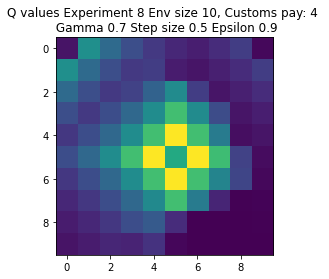

Expr:9 Eps:0 RunnAReward:-14.0 Reward:-267 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-201.0 Reward:680 Timesteps:242 GotPack:True Utiltime:59 Customstime:225 Money:4
Expr:9 Eps:40 RunnAReward:-198.0 Reward:-27 Timesteps:300 GotPack:False Utiltime:12 Customstime:0 Money:3
Expr:9 Eps:60 RunnAReward:-85.0 Reward:-9 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-9.0 Reward:465 Timesteps:348 GotPack:True Utiltime:18 Customstime:181 Money:4
Expr:9 Eps:100 RunnAReward:-76.0 Reward:75 Timesteps:200 GotPack:False Utiltime:62 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:19.0 Reward:256 Timesteps:100 GotPack:False Utiltime:65 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:107.0 Reward:149 Timesteps:100 GotPack:False Utiltime:9 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:161.0 Reward:-217 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:100.0 Reward:-15 Timesteps:

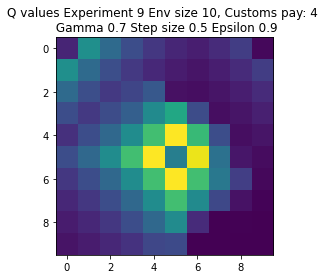

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.7 Step size 0.5 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-18.0 Reward:-341 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-483.0 Reward:-262 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:40 RunnAReward:-521.0 Reward:-1901 Timesteps:2037 GotPack:True Utiltime:975 Customstime:1294 Money:3
Expr:0 Eps:60 RunnAReward:-226.0 Reward:-360 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:-275.0 Reward:-185 Timesteps:771 GotPack:True Utiltime:242 Customstime:635 Money:3
Expr:0 Eps:100 RunnAReward:-66.0 Reward:224 Timesteps:565 GotPack:True Utiltime:32 Customstime:385 Money:3
Expr:0 Eps:120 RunnAReward:-140.0 Reward:-795 Timesteps:1239 GotPack:True Utiltime:

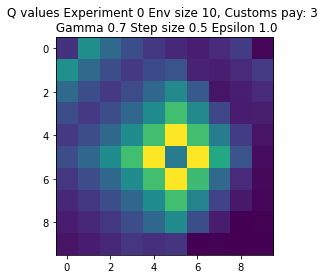

Expr:1 Eps:0 RunnAReward:-16.0 Reward:-303 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-584.0 Reward:-243 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-577.0 Reward:477 Timesteps:322 GotPack:True Utiltime:187 Customstime:254 Money:4
Expr:1 Eps:60 RunnAReward:-368.0 Reward:-132 Timesteps:400 GotPack:False Utiltime:94 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:-32.0 Reward:22 Timesteps:200 GotPack:False Utiltime:90 Customstime:0 Money:1
Expr:1 Eps:100 RunnAReward:-91.0 Reward:641 Timesteps:255 GotPack:True Utiltime:108 Customstime:183 Money:3
Expr:1 Eps:120 RunnAReward:-118.0 Reward:-213 Timesteps:877 GotPack:True Utiltime:179 Customstime:237 Money:4
Expr:1 Eps:140 RunnAReward:-146.0 Reward:149 Timesteps:200 GotPack:False Utiltime:92 Customstime:0 Money:1
Expr:1 Eps:160 RunnAReward:-39.0 Reward:-220 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:13.0 Reward:1

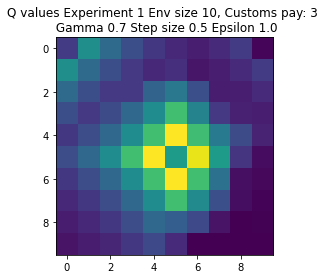

Expr:2 Eps:0 RunnAReward:-13.0 Reward:-247 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-495.0 Reward:-382 Timesteps:893 GotPack:True Utiltime:404 Customstime:469 Money:5
Expr:2 Eps:40 RunnAReward:-681.0 Reward:-181 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-294.0 Reward:274 Timesteps:463 GotPack:True Utiltime:272 Customstime:443 Money:5
Expr:2 Eps:80 RunnAReward:-417.0 Reward:-1200 Timesteps:1652 GotPack:True Utiltime:933 Customstime:967 Money:5
Expr:2 Eps:100 RunnAReward:-27.0 Reward:75 Timesteps:200 GotPack:False Utiltime:64 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-47.0 Reward:-82 Timesteps:300 GotPack:False Utiltime:89 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:52.0 Reward:87 Timesteps:200 GotPack:False Utiltime:74 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:69.0 Reward:108 Timesteps:200 GotPack:False Utiltime:121 Customstime:0 Money:1
Expr:2 Eps:180 RunnAReward:90.0 Reward:-2

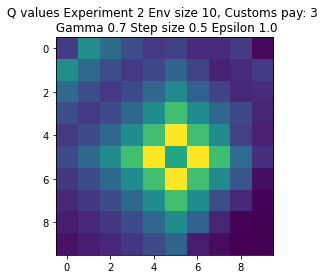

Expr:3 Eps:0 RunnAReward:0.0 Reward:6 Timesteps:602 GotPack:True Utiltime:392 Customstime:564 Money:3
Expr:3 Eps:20 RunnAReward:-694.0 Reward:46 Timesteps:200 GotPack:False Utiltime:181 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-619.0 Reward:-228 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-431.0 Reward:-260 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-381.0 Reward:432 Timesteps:318 GotPack:True Utiltime:80 Customstime:292 Money:3
Expr:3 Eps:100 RunnAReward:-162.0 Reward:-35 Timesteps:300 GotPack:False Utiltime:142 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:-38.0 Reward:-25 Timesteps:300 GotPack:False Utiltime:40 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:-36.0 Reward:-164 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:64.0 Reward:-384 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:115.0 Reward:-71 Time

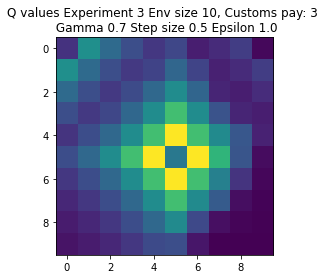

Expr:4 Eps:0 RunnAReward:-85.0 Reward:-1689 Timesteps:1864 GotPack:True Utiltime:1372 Customstime:1469 Money:3
Expr:4 Eps:20 RunnAReward:-589.0 Reward:-296 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-426.0 Reward:-1628 Timesteps:1879 GotPack:True Utiltime:969 Customstime:1051 Money:4
Expr:4 Eps:60 RunnAReward:-460.0 Reward:-149 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:-293.0 Reward:-1549 Timesteps:1973 GotPack:True Utiltime:222 Customstime:344 Money:4
Expr:4 Eps:100 RunnAReward:-142.0 Reward:-160 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:120 RunnAReward:-76.0 Reward:-93 Timesteps:300 GotPack:False Utiltime:222 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:-106.0 Reward:-313 Timesteps:897 GotPack:True Utiltime:225 Customstime:279 Money:4
Expr:4 Eps:160 RunnAReward:-9.0 Reward:-188 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:180 RunnARewar

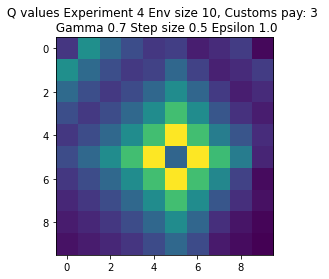

Expr:5 Eps:0 RunnAReward:-16.0 Reward:-308 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:20 RunnAReward:-359.0 Reward:-161 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-456.0 Reward:-169 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:60 RunnAReward:-387.0 Reward:-181 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-348.0 Reward:-840 Timesteps:1332 GotPack:True Utiltime:1055 Customstime:1083 Money:3
Expr:5 Eps:100 RunnAReward:-174.0 Reward:-9 Timesteps:300 GotPack:False Utiltime:250 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:-167.0 Reward:-92 Timesteps:300 GotPack:False Utiltime:226 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:4.0 Reward:-209 Timesteps:400 GotPack:False Utiltime:288 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:-15.0 Reward:603 Timesteps:293 GotPack:True Utiltime:12 Customstime:89 Money:5
Expr:5 Eps:180 RunnAReward:2.0 Reward:6

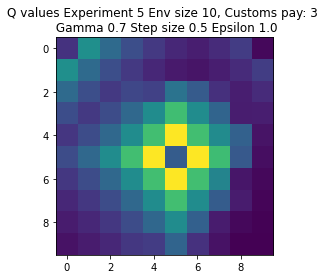

Expr:6 Eps:0 RunnAReward:-19.0 Reward:-376 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-414.0 Reward:-210 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-666.0 Reward:-1643 Timesteps:1680 GotPack:True Utiltime:1308 Customstime:1375 Money:3
Expr:6 Eps:60 RunnAReward:-555.0 Reward:-1256 Timesteps:1555 GotPack:True Utiltime:817 Customstime:855 Money:4
Expr:6 Eps:80 RunnAReward:-237.0 Reward:26 Timesteps:696 GotPack:True Utiltime:251 Customstime:344 Money:3
Expr:6 Eps:100 RunnAReward:-176.0 Reward:-220 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:-217.0 Reward:-1745 Timesteps:1954 GotPack:True Utiltime:192 Customstime:453 Money:3
Expr:6 Eps:140 RunnAReward:-75.0 Reward:-101 Timesteps:743 GotPack:True Utiltime:15 Customstime:331 Money:3
Expr:6 Eps:160 RunnAReward:20.0 Reward:14 Timesteps:300 GotPack:False Utiltime:114 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:

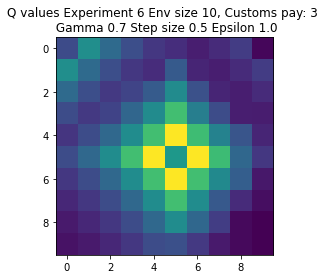

Expr:7 Eps:0 RunnAReward:-27.0 Reward:-531 Timesteps:1055 GotPack:True Utiltime:960 Customstime:1024 Money:5
Expr:7 Eps:20 RunnAReward:-1121.0 Reward:-465 Timesteps:1123 GotPack:True Utiltime:692 Customstime:803 Money:4
Expr:7 Eps:40 RunnAReward:-451.0 Reward:-3024 Timesteps:3000 GotPack:False Utiltime:1905 Customstime:1955 Money:4
Expr:7 Eps:60 RunnAReward:-546.0 Reward:-241 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:80 RunnAReward:-245.0 Reward:74 Timesteps:200 GotPack:False Utiltime:25 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-82.0 Reward:-666 Timesteps:1187 GotPack:True Utiltime:391 Customstime:896 Money:4
Expr:7 Eps:120 RunnAReward:-76.0 Reward:123 Timesteps:200 GotPack:False Utiltime:165 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:-57.0 Reward:102 Timesteps:200 GotPack:False Utiltime:139 Customstime:0 Money:1
Expr:7 Eps:160 RunnAReward:65.0 Reward:30 Timesteps:200 GotPack:False Utiltime:112 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward

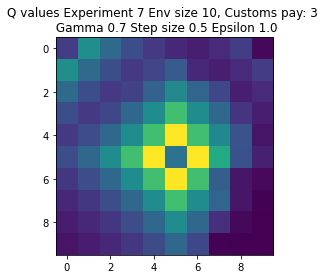

Expr:8 Eps:0 RunnAReward:-14.0 Reward:-266 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-299.0 Reward:-389 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-265.0 Reward:38 Timesteps:200 GotPack:False Utiltime:152 Customstime:0 Money:1
Expr:8 Eps:60 RunnAReward:-716.0 Reward:-191 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-190.0 Reward:503 Timesteps:422 GotPack:True Utiltime:73 Customstime:213 Money:5
Expr:8 Eps:100 RunnAReward:-114.0 Reward:-2 Timesteps:722 GotPack:True Utiltime:32 Customstime:617 Money:3
Expr:8 Eps:120 RunnAReward:-81.0 Reward:10 Timesteps:200 GotPack:False Utiltime:97 Customstime:0 Money:1
Expr:8 Eps:140 RunnAReward:-60.0 Reward:79 Timesteps:200 GotPack:False Utiltime:75 Customstime:0 Money:1
Expr:8 Eps:160 RunnAReward:-71.0 Reward:176 Timesteps:200 GotPack:False Utiltime:113 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:134.0 Reward:630 Tim

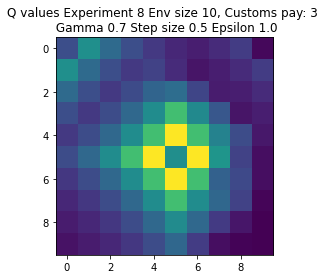

Expr:9 Eps:0 RunnAReward:-82.0 Reward:-1640 Timesteps:1837 GotPack:True Utiltime:593 Customstime:1092 Money:4
Expr:9 Eps:20 RunnAReward:-712.0 Reward:-466 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-275.0 Reward:-530 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-501.0 Reward:141 Timesteps:200 GotPack:False Utiltime:184 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-175.0 Reward:-170 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-156.0 Reward:-280 Timesteps:795 GotPack:True Utiltime:602 Customstime:656 Money:4
Expr:9 Eps:120 RunnAReward:-237.0 Reward:117 Timesteps:200 GotPack:False Utiltime:114 Customstime:0 Money:1
Expr:9 Eps:140 RunnAReward:-11.0 Reward:107 Timesteps:200 GotPack:False Utiltime:105 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:104.0 Reward:-224 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:180 RunnAReward:56.0 Re

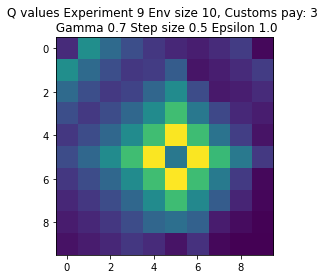

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.7 Step size 0.5 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-1.0 Reward:-15 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-174.0 Reward:198 Timesteps:100 GotPack:False Utiltime:50 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-222.0 Reward:-32 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-74.0 Reward:-55 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-127.0 Reward:-84 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-160.0 Reward:-458 Timesteps:1148 GotPack:True Utiltime:196 Customstime:353 Money:4
Expr:0 Eps:120 RunnAReward:-275.0 Reward:275 Timesteps:100 GotPack:False Utiltime:96 Customsti

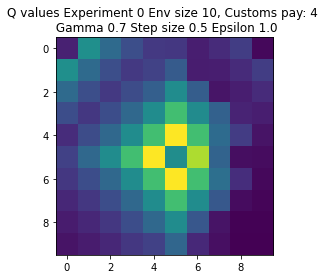

Expr:1 Eps:0 RunnAReward:-3.0 Reward:-44 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-465.0 Reward:-108 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-273.0 Reward:-143 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-154.0 Reward:-276 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:-57.0 Reward:-138 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-196.0 Reward:-1696 Timesteps:1966 GotPack:True Utiltime:1432 Customstime:1604 Money:5
Expr:1 Eps:120 RunnAReward:-181.0 Reward:-25 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:-47.0 Reward:346 Timesteps:559 GotPack:True Utiltime:275 Customstime:535 Money:4
Expr:1 Eps:160 RunnAReward:-90.0 Reward:-51 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:40.0 Reward:-10

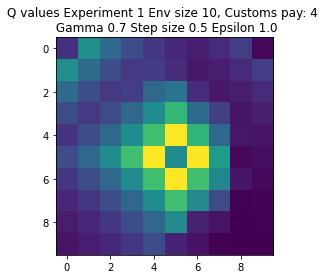

Expr:2 Eps:0 RunnAReward:-16.0 Reward:-304 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:20 RunnAReward:-313.0 Reward:-65 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-404.0 Reward:-78 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-210.0 Reward:-109 Timesteps:846 GotPack:True Utiltime:703 Customstime:774 Money:4
Expr:2 Eps:80 RunnAReward:-155.0 Reward:-1589 Timesteps:1813 GotPack:True Utiltime:1067 Customstime:1146 Money:4
Expr:2 Eps:100 RunnAReward:-172.0 Reward:-22 Timesteps:714 GotPack:True Utiltime:74 Customstime:508 Money:5
Expr:2 Eps:120 RunnAReward:-41.0 Reward:238 Timesteps:536 GotPack:True Utiltime:12 Customstime:486 Money:5
Expr:2 Eps:140 RunnAReward:-119.0 Reward:-55 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:-8.0 Reward:-176 Timesteps:300 GotPack:False Utiltime:34 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:34.0 Rewar

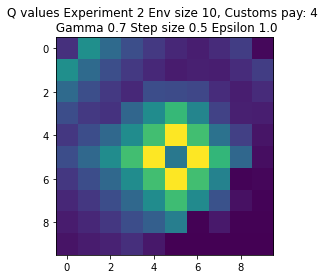

Expr:3 Eps:0 RunnAReward:-16.0 Reward:-312 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:20 RunnAReward:-285.0 Reward:-1937 Timesteps:1999 GotPack:True Utiltime:1808 Customstime:1882 Money:5
Expr:3 Eps:40 RunnAReward:-544.0 Reward:-136 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-71.0 Reward:-443 Timesteps:1002 GotPack:True Utiltime:267 Customstime:467 Money:5
Expr:3 Eps:80 RunnAReward:-75.0 Reward:-10 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-125.0 Reward:-65 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-211.0 Reward:64 Timesteps:200 GotPack:False Utiltime:124 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:-82.0 Reward:142 Timesteps:100 GotPack:False Utiltime:9 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:-41.0 Reward:249 Timesteps:100 GotPack:False Utiltime:65 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:12.0 Reward:-

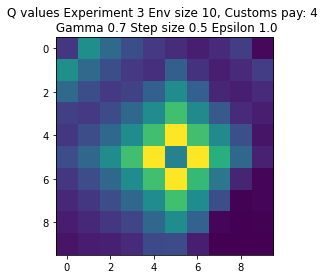

Expr:4 Eps:0 RunnAReward:-2.0 Reward:-27 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-603.0 Reward:-338 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:40 RunnAReward:-244.0 Reward:-122 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-93.0 Reward:-142 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-50.0 Reward:-162 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-276.0 Reward:-2833 Timesteps:2837 GotPack:True Utiltime:1278 Customstime:1384 Money:5
Expr:4 Eps:120 RunnAReward:-147.0 Reward:-52 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:-157.0 Reward:-105 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:13.0 Reward:-8 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:88.0 Reward:291 Tim

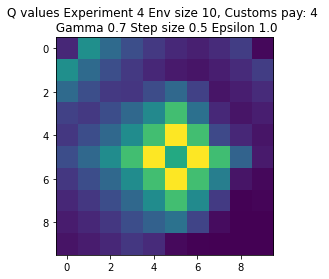

Expr:5 Eps:0 RunnAReward:-14.0 Reward:-279 Timesteps:731 GotPack:True Utiltime:217 Customstime:424 Money:5
Expr:5 Eps:20 RunnAReward:-389.0 Reward:-3461 Timesteps:3000 GotPack:False Utiltime:1659 Customstime:1893 Money:5
Expr:5 Eps:40 RunnAReward:-423.0 Reward:146 Timesteps:100 GotPack:False Utiltime:88 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-179.0 Reward:-341 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:5 Eps:80 RunnAReward:-218.0 Reward:358 Timesteps:397 GotPack:True Utiltime:31 Customstime:290 Money:4
Expr:5 Eps:100 RunnAReward:-234.0 Reward:-3090 Timesteps:3000 GotPack:False Utiltime:1826 Customstime:2026 Money:4
Expr:5 Eps:120 RunnAReward:-148.0 Reward:-5 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:7.0 Reward:-38 Timesteps:885 GotPack:True Utiltime:62 Customstime:739 Money:4
Expr:5 Eps:160 RunnAReward:74.0 Reward:-20 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:27.0

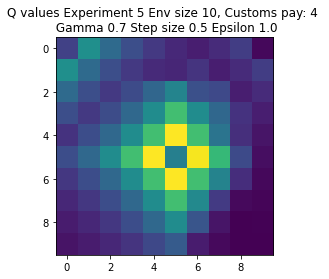

Expr:6 Eps:0 RunnAReward:-75.0 Reward:-1490 Timesteps:1704 GotPack:True Utiltime:1321 Customstime:1473 Money:5
Expr:6 Eps:20 RunnAReward:-328.0 Reward:-151 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-176.0 Reward:-150 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-245.0 Reward:-30 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-121.0 Reward:232 Timesteps:100 GotPack:False Utiltime:92 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-100.0 Reward:49 Timesteps:300 GotPack:False Utiltime:281 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:-35.0 Reward:200 Timesteps:100 GotPack:False Utiltime:83 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:-7.0 Reward:-87 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:15.0 Reward:216 Timesteps:599 GotPack:True Utiltime:16 Customstime:206 Money:5
Expr:6 Eps:180 RunnAReward:35.0 Reward:-217

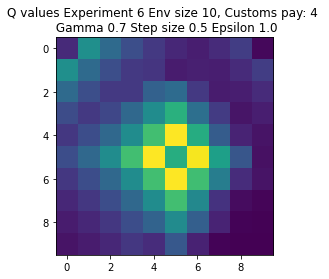

Expr:7 Eps:0 RunnAReward:-7.0 Reward:-136 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-277.0 Reward:-404 Timesteps:867 GotPack:True Utiltime:1 Customstime:157 Money:5
Expr:7 Eps:40 RunnAReward:-190.0 Reward:-108 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-127.0 Reward:33 Timesteps:751 GotPack:True Utiltime:170 Customstime:693 Money:5
Expr:7 Eps:80 RunnAReward:-102.0 Reward:-5 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-177.0 Reward:-45 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-148.0 Reward:-64 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-31.0 Reward:58 Timesteps:200 GotPack:False Utiltime:42 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:-35.0 Reward:268 Timesteps:100 GotPack:False Utiltime:80 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:-176.0 Reward:-13 Times

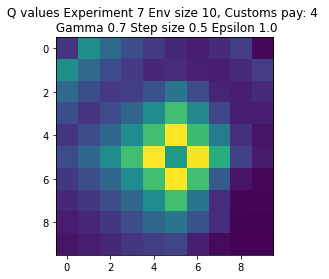

Expr:8 Eps:0 RunnAReward:-3.0 Reward:-42 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-429.0 Reward:-109 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-174.0 Reward:-404 Timesteps:982 GotPack:True Utiltime:310 Customstime:335 Money:5
Expr:8 Eps:60 RunnAReward:-168.0 Reward:-117 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-168.0 Reward:-122 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-86.0 Reward:-20 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-109.0 Reward:267 Timesteps:100 GotPack:False Utiltime:42 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:-2.0 Reward:-145 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:-7.0 Reward:-105 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:-61.0 Reward:-182 Time

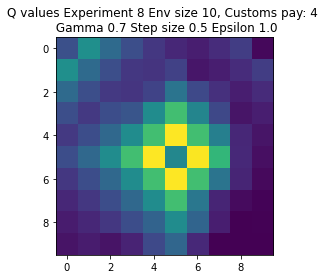

Expr:9 Eps:0 RunnAReward:-5.0 Reward:-87 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-174.0 Reward:165 Timesteps:100 GotPack:False Utiltime:15 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-357.0 Reward:-162 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-273.0 Reward:186 Timesteps:100 GotPack:False Utiltime:13 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-175.0 Reward:-236 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:-143.0 Reward:-1205 Timesteps:1467 GotPack:True Utiltime:250 Customstime:389 Money:5
Expr:9 Eps:120 RunnAReward:-12.0 Reward:-188 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-206.0 Reward:-5 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:35.0 Reward:-78 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:63.0 Reward:53 Times

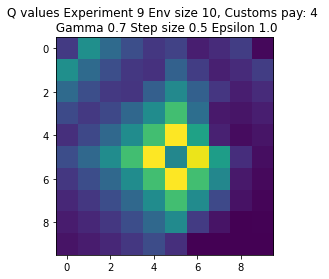

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.7 Step size 0.8 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-66.0 Reward:-1304 Timesteps:1564 GotPack:True Utiltime:580 Customstime:936 Money:3
Expr:0 Eps:20 RunnAReward:-143.0 Reward:150 Timesteps:200 GotPack:False Utiltime:146 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-141.0 Reward:-272 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-7.0 Reward:-20 Timesteps:300 GotPack:False Utiltime:123 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:234.0 Reward:504 Timesteps:354 GotPack:True Utiltime:309 Customstime:334 Money:3
Expr:0 Eps:100 RunnAReward:297.0 Reward:499 Timesteps:410 GotPack:True Utiltime:32 Customstime:185 Money:4
Expr:0 Eps:120 RunnAReward:388.0 Reward:32 Timesteps:300 GotPack:False Utiltime:36 Cus

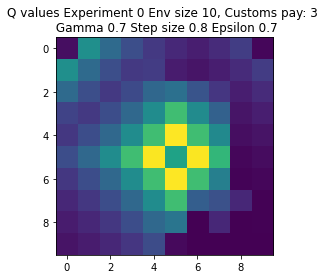

Expr:1 Eps:0 RunnAReward:-10.0 Reward:-187 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-333.0 Reward:-338 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-117.0 Reward:604 Timesteps:278 GotPack:True Utiltime:25 Customstime:238 Money:5
Expr:1 Eps:60 RunnAReward:-11.0 Reward:-171 Timesteps:400 GotPack:False Utiltime:139 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:213.0 Reward:14 Timesteps:812 GotPack:True Utiltime:232 Customstime:406 Money:5
Expr:1 Eps:100 RunnAReward:192.0 Reward:130 Timesteps:200 GotPack:False Utiltime:70 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:297.0 Reward:846 Timesteps:134 GotPack:True Utiltime:51 Customstime:116 Money:5
Expr:1 Eps:140 RunnAReward:411.0 Reward:779 Timesteps:184 GotPack:True Utiltime:65 Customstime:167 Money:3
Expr:1 Eps:160 RunnAReward:303.0 Reward:-27 Timesteps:300 GotPack:False Utiltime:76 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:461.0 Reward:134 

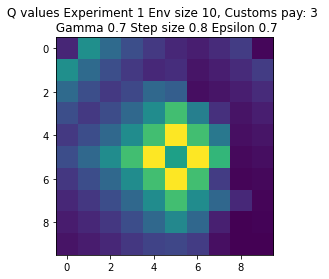

Expr:2 Eps:0 RunnAReward:-74.0 Reward:-1474 Timesteps:1869 GotPack:True Utiltime:1697 Customstime:1753 Money:5
Expr:2 Eps:20 RunnAReward:-299.0 Reward:158 Timesteps:200 GotPack:False Utiltime:106 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-93.0 Reward:-240 Timesteps:500 GotPack:False Utiltime:98 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:64.0 Reward:743 Timesteps:169 GotPack:True Utiltime:61 Customstime:121 Money:3
Expr:2 Eps:80 RunnAReward:180.0 Reward:306 Timesteps:539 GotPack:True Utiltime:130 Customstime:243 Money:5
Expr:2 Eps:100 RunnAReward:210.0 Reward:621 Timesteps:276 GotPack:True Utiltime:40 Customstime:205 Money:4
Expr:2 Eps:120 RunnAReward:237.0 Reward:617 Timesteps:307 GotPack:True Utiltime:71 Customstime:109 Money:3
Expr:2 Eps:140 RunnAReward:456.0 Reward:801 Timesteps:158 GotPack:True Utiltime:47 Customstime:107 Money:3
Expr:2 Eps:160 RunnAReward:602.0 Reward:126 Timesteps:200 GotPack:False Utiltime:8 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:632.0 Rewar

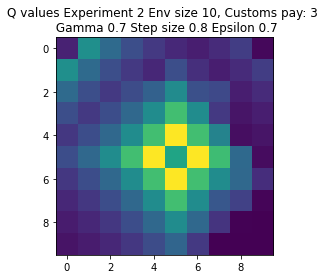

Expr:3 Eps:0 RunnAReward:-21.0 Reward:-411 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-202.0 Reward:-350 Timesteps:944 GotPack:True Utiltime:31 Customstime:564 Money:3
Expr:3 Eps:40 RunnAReward:-137.0 Reward:-1060 Timesteps:1656 GotPack:True Utiltime:540 Customstime:679 Money:3
Expr:3 Eps:60 RunnAReward:-40.0 Reward:-285 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:214.0 Reward:493 Timesteps:465 GotPack:True Utiltime:51 Customstime:343 Money:5
Expr:3 Eps:100 RunnAReward:149.0 Reward:249 Timesteps:486 GotPack:True Utiltime:22 Customstime:153 Money:5
Expr:3 Eps:120 RunnAReward:296.0 Reward:687 Timesteps:208 GotPack:True Utiltime:46 Customstime:185 Money:3
Expr:3 Eps:140 RunnAReward:248.0 Reward:386 Timesteps:473 GotPack:True Utiltime:28 Customstime:110 Money:5
Expr:3 Eps:160 RunnAReward:347.0 Reward:133 Timesteps:200 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:408.0 Reward

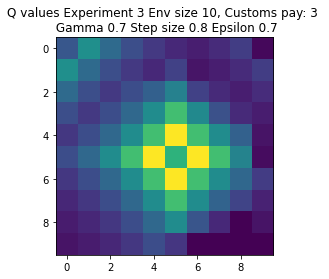

Expr:4 Eps:0 RunnAReward:-8.0 Reward:-150 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-364.0 Reward:186 Timesteps:619 GotPack:True Utiltime:384 Customstime:517 Money:4
Expr:4 Eps:40 RunnAReward:-101.0 Reward:-180 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:66.0 Reward:107 Timesteps:200 GotPack:False Utiltime:99 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:228.0 Reward:103 Timesteps:200 GotPack:False Utiltime:68 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:230.0 Reward:108 Timesteps:200 GotPack:False Utiltime:68 Customstime:0 Money:1
Expr:4 Eps:120 RunnAReward:258.0 Reward:-420 Timesteps:1136 GotPack:True Utiltime:49 Customstime:275 Money:5
Expr:4 Eps:140 RunnAReward:252.0 Reward:135 Timesteps:624 GotPack:True Utiltime:33 Customstime:479 Money:3
Expr:4 Eps:160 RunnAReward:322.0 Reward:907 Timesteps:85 GotPack:True Utiltime:19 Customstime:68 Money:5
Expr:4 Eps:180 RunnAReward:490.0 Reward:0 Times

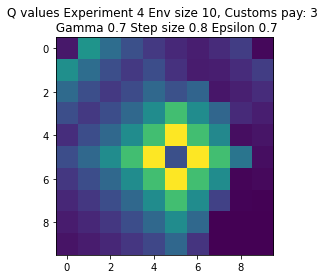

Expr:5 Eps:0 RunnAReward:-11.0 Reward:-201 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-361.0 Reward:-77 Timesteps:300 GotPack:False Utiltime:99 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-27.0 Reward:585 Timesteps:383 GotPack:True Utiltime:92 Customstime:306 Money:3
Expr:5 Eps:60 RunnAReward:162.0 Reward:294 Timesteps:410 GotPack:True Utiltime:87 Customstime:212 Money:5
Expr:5 Eps:80 RunnAReward:240.0 Reward:667 Timesteps:219 GotPack:True Utiltime:12 Customstime:143 Money:5
Expr:5 Eps:100 RunnAReward:313.0 Reward:-141 Timesteps:908 GotPack:True Utiltime:23 Customstime:254 Money:4
Expr:5 Eps:120 RunnAReward:214.0 Reward:474 Timesteps:414 GotPack:True Utiltime:268 Customstime:363 Money:4
Expr:5 Eps:140 RunnAReward:420.0 Reward:112 Timesteps:200 GotPack:False Utiltime:146 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:333.0 Reward:-17 Timesteps:300 GotPack:False Utiltime:45 Customstime:0 Money:1
Expr:5 Eps:180 RunnAReward:496.0 Reward:401

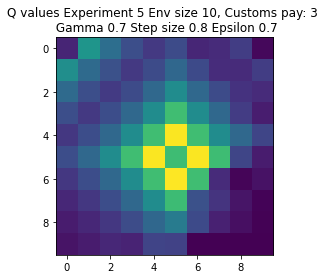

Expr:6 Eps:0 RunnAReward:-29.0 Reward:-573 Timesteps:1169 GotPack:True Utiltime:648 Customstime:856 Money:3
Expr:6 Eps:20 RunnAReward:-154.0 Reward:-174 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-167.0 Reward:-167 Timesteps:955 GotPack:True Utiltime:161 Customstime:198 Money:4
Expr:6 Eps:60 RunnAReward:48.0 Reward:309 Timesteps:534 GotPack:True Utiltime:25 Customstime:277 Money:3
Expr:6 Eps:80 RunnAReward:227.0 Reward:166 Timesteps:200 GotPack:False Utiltime:75 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:249.0 Reward:547 Timesteps:259 GotPack:True Utiltime:12 Customstime:171 Money:5
Expr:6 Eps:120 RunnAReward:280.0 Reward:558 Timesteps:326 GotPack:True Utiltime:55 Customstime:142 Money:3
Expr:6 Eps:140 RunnAReward:401.0 Reward:849 Timesteps:135 GotPack:True Utiltime:35 Customstime:97 Money:3
Expr:6 Eps:160 RunnAReward:425.0 Reward:311 Timesteps:494 GotPack:True Utiltime:5 Customstime:380 Money:4
Expr:6 Eps:180 RunnAReward:528.0 Reward:8

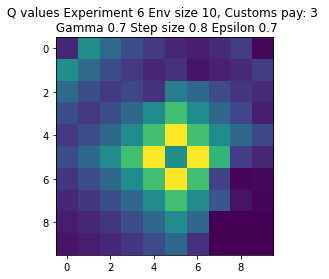

Expr:7 Eps:0 RunnAReward:-8.0 Reward:-152 Timesteps:723 GotPack:True Utiltime:205 Customstime:269 Money:3
Expr:7 Eps:20 RunnAReward:-218.0 Reward:158 Timesteps:200 GotPack:False Utiltime:71 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:75.0 Reward:65 Timesteps:200 GotPack:False Utiltime:144 Customstime:0 Money:1
Expr:7 Eps:60 RunnAReward:38.0 Reward:147 Timesteps:200 GotPack:False Utiltime:113 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:67.0 Reward:21 Timesteps:300 GotPack:False Utiltime:27 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:270.0 Reward:74 Timesteps:200 GotPack:False Utiltime:6 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:291.0 Reward:450 Timesteps:435 GotPack:True Utiltime:40 Customstime:218 Money:5
Expr:7 Eps:140 RunnAReward:294.0 Reward:-319 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:538.0 Reward:105 Timesteps:200 GotPack:False Utiltime:83 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:611.0 Reward:127 Timesteps

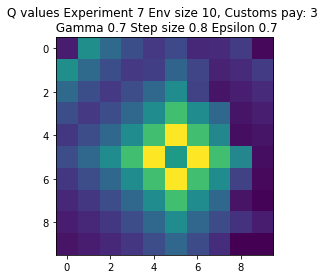

Expr:8 Eps:0 RunnAReward:-81.0 Reward:-1612 Timesteps:1885 GotPack:True Utiltime:934 Customstime:1098 Money:5
Expr:8 Eps:20 RunnAReward:-243.0 Reward:-171 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-115.0 Reward:-51 Timesteps:300 GotPack:False Utiltime:51 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:18.0 Reward:-58 Timesteps:808 GotPack:True Utiltime:29 Customstime:226 Money:4
Expr:8 Eps:80 RunnAReward:108.0 Reward:175 Timesteps:200 GotPack:False Utiltime:47 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:184.0 Reward:855 Timesteps:116 GotPack:True Utiltime:41 Customstime:106 Money:5
Expr:8 Eps:120 RunnAReward:414.0 Reward:87 Timesteps:200 GotPack:False Utiltime:39 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:605.0 Reward:599 Timesteps:308 GotPack:True Utiltime:63 Customstime:294 Money:4
Expr:8 Eps:160 RunnAReward:618.0 Reward:453 Timesteps:392 GotPack:True Utiltime:76 Customstime:333 Money:3
Expr:8 Eps:180 RunnAReward:717.0 Reward:82

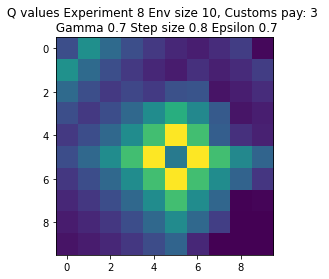

Expr:9 Eps:0 RunnAReward:-14.0 Reward:-268 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-399.0 Reward:-1061 Timesteps:1503 GotPack:True Utiltime:454 Customstime:492 Money:3
Expr:9 Eps:40 RunnAReward:-143.0 Reward:46 Timesteps:200 GotPack:False Utiltime:86 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:40.0 Reward:186 Timesteps:562 GotPack:True Utiltime:227 Customstime:244 Money:5
Expr:9 Eps:80 RunnAReward:293.0 Reward:661 Timesteps:303 GotPack:True Utiltime:265 Customstime:280 Money:5
Expr:9 Eps:100 RunnAReward:218.0 Reward:-63 Timesteps:300 GotPack:False Utiltime:24 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:486.0 Reward:798 Timesteps:167 GotPack:True Utiltime:64 Customstime:131 Money:5
Expr:9 Eps:140 RunnAReward:662.0 Reward:-119 Timesteps:300 GotPack:False Utiltime:38 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:737.0 Reward:812 Timesteps:139 GotPack:True Utiltime:54 Customstime:108 Money:5
Expr:9 Eps:180 RunnAReward:533.0 Reward:

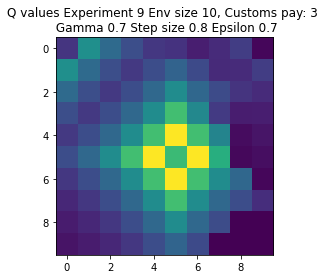

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.7 Step size 0.8 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-3.0 Reward:-42 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-77.0 Reward:78 Timesteps:200 GotPack:False Utiltime:107 Customstime:0 Money:3
Expr:0 Eps:40 RunnAReward:-112.0 Reward:-42 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:116.0 Reward:152 Timesteps:200 GotPack:False Utiltime:86 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:85.0 Reward:637 Timesteps:270 GotPack:True Utiltime:54 Customstime:152 Money:4
Expr:0 Eps:100 RunnAReward:130.0 Reward:290 Timesteps:100 GotPack:False Utiltime:37 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:177.0 Reward:33 Timesteps:200 GotPack:False Utiltime:26 Customstime:0 Mo

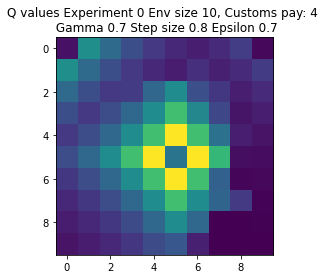

Expr:1 Eps:0 RunnAReward:-7.0 Reward:-122 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-107.0 Reward:-174 Timesteps:873 GotPack:True Utiltime:579 Customstime:821 Money:4
Expr:1 Eps:40 RunnAReward:-134.0 Reward:39 Timesteps:727 GotPack:True Utiltime:601 Customstime:649 Money:5
Expr:1 Eps:60 RunnAReward:39.0 Reward:-61 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-5.0 Reward:219 Timesteps:100 GotPack:False Utiltime:89 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:212.0 Reward:290 Timesteps:100 GotPack:False Utiltime:73 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:258.0 Reward:146 Timesteps:200 GotPack:False Utiltime:80 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:403.0 Reward:227 Timesteps:100 GotPack:False Utiltime:13 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:241.0 Reward:702 Timesteps:240 GotPack:True Utiltime:51 Customstime:135 Money:5
Expr:1 Eps:180 RunnAReward:331.0 Reward:92 Timest

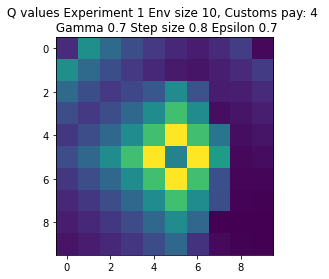

Expr:2 Eps:0 RunnAReward:-13.0 Reward:-255 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-178.0 Reward:-30 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-30.0 Reward:-5 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:20.0 Reward:-67 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:6.0 Reward:270 Timesteps:100 GotPack:False Utiltime:61 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:55.0 Reward:433 Timesteps:485 GotPack:True Utiltime:325 Customstime:376 Money:4
Expr:2 Eps:120 RunnAReward:106.0 Reward:230 Timesteps:100 GotPack:False Utiltime:24 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:177.0 Reward:742 Timesteps:212 GotPack:True Utiltime:26 Customstime:165 Money:5
Expr:2 Eps:160 RunnAReward:288.0 Reward:565 Timesteps:401 GotPack:True Utiltime:75 Customstime:216 Money:4
Expr:2 Eps:180 RunnAReward:353.0 Reward:161 Timesteps:2

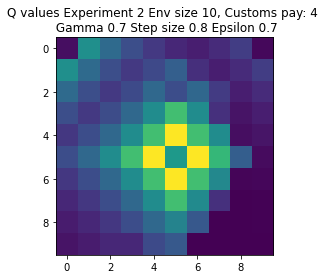

Expr:3 Eps:0 RunnAReward:-10.0 Reward:-188 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-212.0 Reward:465 Timesteps:406 GotPack:True Utiltime:145 Customstime:194 Money:5
Expr:3 Eps:40 RunnAReward:4.0 Reward:160 Timesteps:100 GotPack:False Utiltime:6 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-6.0 Reward:147 Timesteps:100 GotPack:False Utiltime:48 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:130.0 Reward:271 Timesteps:100 GotPack:False Utiltime:58 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:31.0 Reward:-307 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:120 RunnAReward:155.0 Reward:483 Timesteps:376 GotPack:True Utiltime:151 Customstime:219 Money:4
Expr:3 Eps:140 RunnAReward:249.0 Reward:244 Timesteps:100 GotPack:False Utiltime:85 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:295.0 Reward:670 Timesteps:186 GotPack:True Utiltime:31 Customstime:134 Money:5
Expr:3 Eps:180 RunnAReward:389.0 Reward:730 Timeste

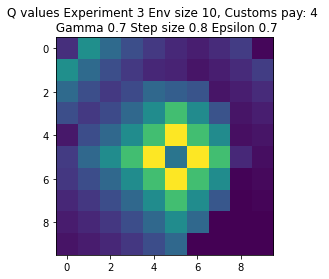

Expr:4 Eps:0 RunnAReward:-9.0 Reward:-180 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-138.0 Reward:-181 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-81.0 Reward:613 Timesteps:272 GotPack:True Utiltime:95 Customstime:202 Money:5
Expr:4 Eps:60 RunnAReward:104.0 Reward:610 Timesteps:223 GotPack:True Utiltime:165 Customstime:206 Money:5
Expr:4 Eps:80 RunnAReward:25.0 Reward:4 Timesteps:200 GotPack:False Utiltime:38 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:179.0 Reward:100 Timesteps:200 GotPack:False Utiltime:54 Customstime:0 Money:3
Expr:4 Eps:120 RunnAReward:250.0 Reward:262 Timesteps:100 GotPack:False Utiltime:62 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:220.0 Reward:476 Timesteps:430 GotPack:True Utiltime:35 Customstime:161 Money:4
Expr:4 Eps:160 RunnAReward:379.0 Reward:284 Timesteps:100 GotPack:False Utiltime:24 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:329.0 Reward:270 Timeste

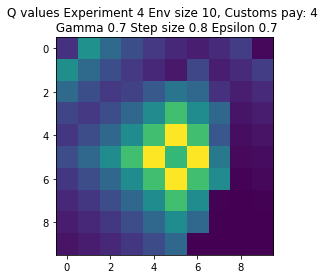

Expr:5 Eps:0 RunnAReward:-7.0 Reward:-121 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-114.0 Reward:148 Timesteps:100 GotPack:False Utiltime:5 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-37.0 Reward:-213 Timesteps:1021 GotPack:True Utiltime:279 Customstime:458 Money:4
Expr:5 Eps:60 RunnAReward:-65.0 Reward:-848 Timesteps:1261 GotPack:True Utiltime:339 Customstime:914 Money:5
Expr:5 Eps:80 RunnAReward:160.0 Reward:251 Timesteps:100 GotPack:False Utiltime:45 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:151.0 Reward:285 Timesteps:100 GotPack:False Utiltime:45 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:208.0 Reward:-270 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:139.0 Reward:263 Timesteps:100 GotPack:False Utiltime:50 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:221.0 Reward:73 Timesteps:200 GotPack:False Utiltime:44 Customstime:0 Money:2
Expr:5 Eps:180 RunnAReward:265.0 Reward:283 Ti

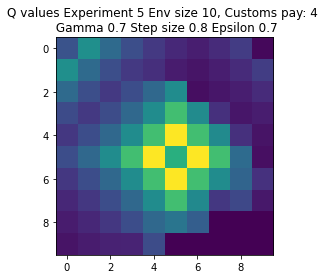

Expr:6 Eps:0 RunnAReward:-10.0 Reward:-186 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-160.0 Reward:-100 Timesteps:677 GotPack:True Utiltime:396 Customstime:445 Money:4
Expr:6 Eps:40 RunnAReward:-15.0 Reward:295 Timesteps:100 GotPack:False Utiltime:50 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:124.0 Reward:-302 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:100.0 Reward:268 Timesteps:100 GotPack:False Utiltime:48 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:166.0 Reward:-6 Timesteps:300 GotPack:False Utiltime:33 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:155.0 Reward:262 Timesteps:100 GotPack:False Utiltime:20 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:279.0 Reward:77 Timesteps:200 GotPack:False Utiltime:24 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:267.0 Reward:683 Timesteps:252 GotPack:True Utiltime:26 Customstime:219 Money:4
Expr:6 Eps:180 RunnAReward:403.0 Reward:305 Times

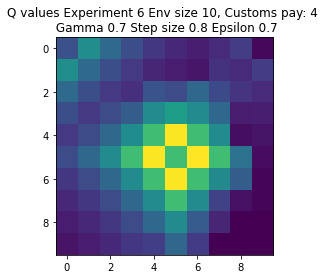

Expr:7 Eps:0 RunnAReward:-1.0 Reward:-12 Timesteps:759 GotPack:True Utiltime:285 Customstime:713 Money:5
Expr:7 Eps:20 RunnAReward:-226.0 Reward:614 Timesteps:316 GotPack:True Utiltime:96 Customstime:180 Money:5
Expr:7 Eps:40 RunnAReward:-45.0 Reward:-90 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:50.0 Reward:214 Timesteps:100 GotPack:False Utiltime:22 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:176.0 Reward:739 Timesteps:232 GotPack:True Utiltime:84 Customstime:98 Money:5
Expr:7 Eps:100 RunnAReward:125.0 Reward:-175 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:259.0 Reward:799 Timesteps:186 GotPack:True Utiltime:72 Customstime:108 Money:5
Expr:7 Eps:140 RunnAReward:294.0 Reward:146 Timesteps:200 GotPack:False Utiltime:42 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:433.0 Reward:817 Timesteps:142 GotPack:True Utiltime:35 Customstime:107 Money:5
Expr:7 Eps:180 RunnAReward:318.0 Reward:559 Times

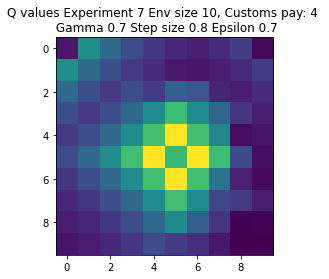

Expr:8 Eps:0 RunnAReward:-10.0 Reward:-192 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-63.0 Reward:-183 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-196.0 Reward:130 Timesteps:100 GotPack:False Utiltime:71 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-11.0 Reward:-389 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:80 RunnAReward:105.0 Reward:229 Timesteps:100 GotPack:False Utiltime:66 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:143.0 Reward:687 Timesteps:227 GotPack:True Utiltime:59 Customstime:164 Money:4
Expr:8 Eps:120 RunnAReward:263.0 Reward:279 Timesteps:100 GotPack:False Utiltime:35 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:250.0 Reward:158 Timesteps:100 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:324.0 Reward:802 Timesteps:162 GotPack:True Utiltime:32 Customstime:148 Money:4
Expr:8 Eps:180 RunnAReward:257.0 Reward:159 Times

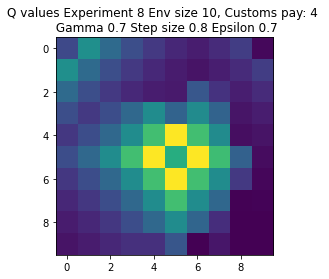

Expr:9 Eps:0 RunnAReward:5.0 Reward:109 Timesteps:200 GotPack:False Utiltime:63 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-224.0 Reward:-224 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:9 Eps:40 RunnAReward:-100.0 Reward:233 Timesteps:520 GotPack:True Utiltime:279 Customstime:398 Money:5
Expr:9 Eps:60 RunnAReward:-39.0 Reward:-50 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-43.0 Reward:403 Timesteps:428 GotPack:True Utiltime:353 Customstime:385 Money:5
Expr:9 Eps:100 RunnAReward:230.0 Reward:638 Timesteps:224 GotPack:True Utiltime:50 Customstime:125 Money:5
Expr:9 Eps:120 RunnAReward:273.0 Reward:416 Timesteps:408 GotPack:True Utiltime:271 Customstime:307 Money:4
Expr:9 Eps:140 RunnAReward:238.0 Reward:175 Timesteps:100 GotPack:False Utiltime:65 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:156.0 Reward:143 Timesteps:100 GotPack:False Utiltime:26 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:306.0 Reward:231 Ti

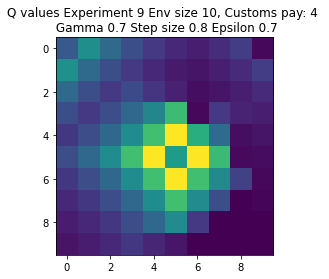

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.7 Step size 0.8 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-13.0 Reward:-246 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-234.0 Reward:-157 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:40 RunnAReward:-301.0 Reward:140 Timesteps:600 GotPack:True Utiltime:103 Customstime:182 Money:5
Expr:0 Eps:60 RunnAReward:-144.0 Reward:-154 Timesteps:742 GotPack:True Utiltime:240 Customstime:412 Money:5
Expr:0 Eps:80 RunnAReward:-71.0 Reward:87 Timesteps:200 GotPack:False Utiltime:49 Customstime:0 Money:1
Expr:0 Eps:100 RunnAReward:2.0 Reward:-154 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:168.0 Reward:-214 Timesteps:200 GotPack:False Utiltime:0 Customst

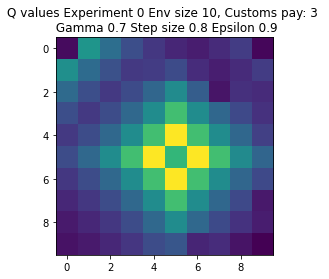

Expr:1 Eps:0 RunnAReward:3.0 Reward:64 Timesteps:767 GotPack:True Utiltime:578 Customstime:674 Money:3
Expr:1 Eps:20 RunnAReward:-380.0 Reward:3 Timesteps:300 GotPack:False Utiltime:66 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-381.0 Reward:90 Timesteps:200 GotPack:False Utiltime:198 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-96.0 Reward:-235 Timesteps:812 GotPack:True Utiltime:60 Customstime:509 Money:3
Expr:1 Eps:80 RunnAReward:-58.0 Reward:-35 Timesteps:300 GotPack:False Utiltime:74 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:42.0 Reward:14 Timesteps:300 GotPack:False Utiltime:60 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:117.0 Reward:119 Timesteps:595 GotPack:True Utiltime:39 Customstime:234 Money:3
Expr:1 Eps:140 RunnAReward:102.0 Reward:563 Timesteps:402 GotPack:True Utiltime:163 Customstime:384 Money:3
Expr:1 Eps:160 RunnAReward:303.0 Reward:572 Timesteps:331 GotPack:True Utiltime:250 Customstime:308 Money:5
Expr:1 Eps:180 RunnAReward:345.0 Reward:544 Time

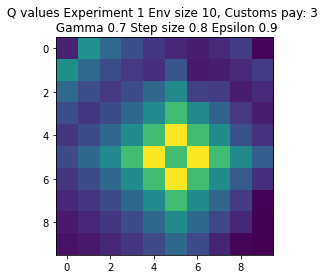

Expr:2 Eps:0 RunnAReward:2.0 Reward:52 Timesteps:605 GotPack:True Utiltime:267 Customstime:290 Money:3
Expr:2 Eps:20 RunnAReward:-425.0 Reward:-2468 Timesteps:2438 GotPack:True Utiltime:1850 Customstime:2010 Money:3
Expr:2 Eps:40 RunnAReward:-363.0 Reward:-415 Timesteps:963 GotPack:True Utiltime:443 Customstime:534 Money:5
Expr:2 Eps:60 RunnAReward:-183.0 Reward:-522 Timesteps:1235 GotPack:True Utiltime:65 Customstime:378 Money:3
Expr:2 Eps:80 RunnAReward:-37.0 Reward:-269 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-101.0 Reward:-118 Timesteps:300 GotPack:False Utiltime:50 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:98.0 Reward:323 Timesteps:495 GotPack:True Utiltime:27 Customstime:386 Money:4
Expr:2 Eps:140 RunnAReward:213.0 Reward:84 Timesteps:200 GotPack:False Utiltime:74 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:276.0 Reward:82 Timesteps:200 GotPack:False Utiltime:128 Customstime:0 Money:1
Expr:2 Eps:180 RunnAReward:192.0 Rew

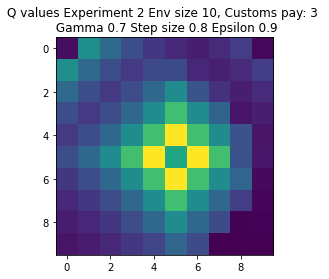

Expr:3 Eps:0 RunnAReward:1.0 Reward:28 Timesteps:300 GotPack:False Utiltime:117 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-445.0 Reward:-1583 Timesteps:1971 GotPack:True Utiltime:903 Customstime:1513 Money:4
Expr:3 Eps:40 RunnAReward:-427.0 Reward:-182 Timesteps:893 GotPack:True Utiltime:53 Customstime:304 Money:4
Expr:3 Eps:60 RunnAReward:-211.0 Reward:-139 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-147.0 Reward:-117 Timesteps:300 GotPack:False Utiltime:63 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:157.0 Reward:-167 Timesteps:400 GotPack:False Utiltime:49 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:155.0 Reward:0 Timesteps:200 GotPack:False Utiltime:36 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:104.0 Reward:-25 Timesteps:300 GotPack:False Utiltime:34 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:241.0 Reward:297 Timesteps:586 GotPack:True Utiltime:96 Customstime:255 Money:3
Expr:3 Eps:180 RunnAReward:209.0 Reward:1

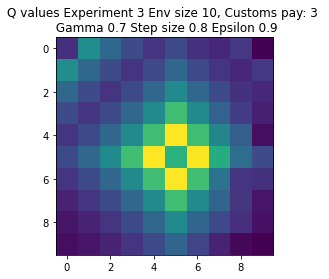

Expr:4 Eps:0 RunnAReward:-164.0 Reward:-3269 Timesteps:2901 GotPack:True Utiltime:985 Customstime:1087 Money:3
Expr:4 Eps:20 RunnAReward:-511.0 Reward:-168 Timesteps:823 GotPack:True Utiltime:51 Customstime:396 Money:5
Expr:4 Eps:40 RunnAReward:-233.0 Reward:169 Timesteps:200 GotPack:False Utiltime:108 Customstime:0 Money:1
Expr:4 Eps:60 RunnAReward:-25.0 Reward:-371 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:22.0 Reward:-312 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-102.0 Reward:-182 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:141.0 Reward:171 Timesteps:200 GotPack:False Utiltime:155 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:110.0 Reward:147 Timesteps:200 GotPack:False Utiltime:145 Customstime:0 Money:1
Expr:4 Eps:160 RunnAReward:129.0 Reward:473 Timesteps:437 GotPack:True Utiltime:51 Customstime:285 Money:4
Expr:4 Eps:180 RunnAReward:203.0 Rewa

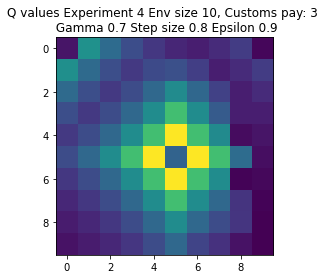

Expr:5 Eps:0 RunnAReward:-14.0 Reward:-276 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-413.0 Reward:-159 Timesteps:707 GotPack:True Utiltime:73 Customstime:527 Money:5
Expr:5 Eps:40 RunnAReward:-202.0 Reward:-330 Timesteps:957 GotPack:True Utiltime:212 Customstime:382 Money:3
Expr:5 Eps:60 RunnAReward:-245.0 Reward:-21 Timesteps:200 GotPack:False Utiltime:165 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-123.0 Reward:34 Timesteps:200 GotPack:False Utiltime:28 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:35.0 Reward:-55 Timesteps:300 GotPack:False Utiltime:93 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:60.0 Reward:-125 Timesteps:300 GotPack:False Utiltime:132 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:104.0 Reward:124 Timesteps:200 GotPack:False Utiltime:65 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:99.0 Reward:92 Timesteps:200 GotPack:False Utiltime:119 Customstime:0 Money:1
Expr:5 Eps:180 RunnAReward:367.0 Reward:671 

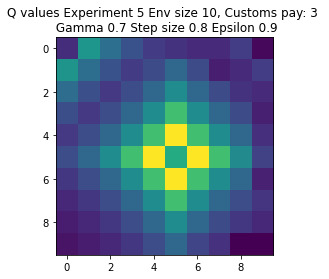

Expr:6 Eps:0 RunnAReward:-89.0 Reward:-1774 Timesteps:2125 GotPack:True Utiltime:709 Customstime:914 Money:3
Expr:6 Eps:20 RunnAReward:-349.0 Reward:-1809 Timesteps:2059 GotPack:True Utiltime:273 Customstime:941 Money:5
Expr:6 Eps:40 RunnAReward:-142.0 Reward:385 Timesteps:474 GotPack:True Utiltime:68 Customstime:165 Money:5
Expr:6 Eps:60 RunnAReward:-99.0 Reward:-1503 Timesteps:1679 GotPack:True Utiltime:673 Customstime:836 Money:3
Expr:6 Eps:80 RunnAReward:-29.0 Reward:-57 Timesteps:300 GotPack:False Utiltime:104 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-57.0 Reward:621 Timesteps:269 GotPack:True Utiltime:25 Customstime:252 Money:5
Expr:6 Eps:120 RunnAReward:100.0 Reward:-36 Timesteps:200 GotPack:False Utiltime:109 Customstime:0 Money:1
Expr:6 Eps:140 RunnAReward:116.0 Reward:-497 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:63.0 Reward:43 Timesteps:300 GotPack:False Utiltime:58 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:235.0 

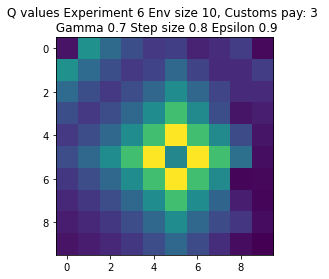

Expr:7 Eps:0 RunnAReward:-11.0 Reward:-218 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-375.0 Reward:-413 Timesteps:1055 GotPack:True Utiltime:1021 Customstime:1039 Money:3
Expr:7 Eps:40 RunnAReward:-292.0 Reward:-129 Timesteps:400 GotPack:False Utiltime:307 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-144.0 Reward:-12 Timesteps:300 GotPack:False Utiltime:128 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-51.0 Reward:-117 Timesteps:816 GotPack:True Utiltime:154 Customstime:669 Money:3
Expr:7 Eps:100 RunnAReward:86.0 Reward:-22 Timesteps:300 GotPack:False Utiltime:239 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:70.0 Reward:353 Timesteps:521 GotPack:True Utiltime:91 Customstime:246 Money:4
Expr:7 Eps:140 RunnAReward:143.0 Reward:110 Timesteps:200 GotPack:False Utiltime:59 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:189.0 Reward:91 Timesteps:200 GotPack:False Utiltime:28 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:211.0 Rewar

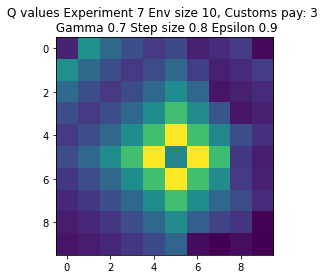

Expr:8 Eps:0 RunnAReward:-15.0 Reward:-288 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:20 RunnAReward:-464.0 Reward:-134 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-176.0 Reward:519 Timesteps:426 GotPack:True Utiltime:186 Customstime:396 Money:5
Expr:8 Eps:60 RunnAReward:-109.0 Reward:48 Timesteps:200 GotPack:False Utiltime:21 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:-96.0 Reward:-448 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:-72.0 Reward:20 Timesteps:621 GotPack:True Utiltime:312 Customstime:345 Money:5
Expr:8 Eps:120 RunnAReward:74.0 Reward:456 Timesteps:412 GotPack:True Utiltime:85 Customstime:214 Money:3
Expr:8 Eps:140 RunnAReward:198.0 Reward:195 Timesteps:200 GotPack:False Utiltime:99 Customstime:0 Money:1
Expr:8 Eps:160 RunnAReward:242.0 Reward:470 Timesteps:333 GotPack:True Utiltime:37 Customstime:131 Money:5
Expr:8 Eps:180 RunnAReward:267.0 Reward:458 Ti

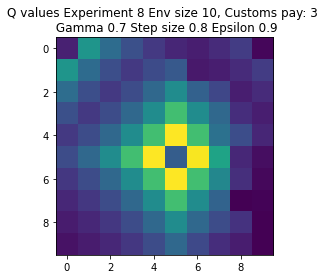

Expr:9 Eps:0 RunnAReward:-7.0 Reward:-126 Timesteps:819 GotPack:True Utiltime:323 Customstime:558 Money:4
Expr:9 Eps:20 RunnAReward:-535.0 Reward:-207 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-321.0 Reward:-182 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:60 RunnAReward:-132.0 Reward:-494 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:-71.0 Reward:78 Timesteps:200 GotPack:False Utiltime:187 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:60.0 Reward:121 Timesteps:200 GotPack:False Utiltime:139 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:54.0 Reward:205 Timesteps:516 GotPack:True Utiltime:129 Customstime:245 Money:3
Expr:9 Eps:140 RunnAReward:140.0 Reward:120 Timesteps:200 GotPack:False Utiltime:57 Customstime:0 Money:1
Expr:9 Eps:160 RunnAReward:93.0 Reward:-46 Timesteps:200 GotPack:False Utiltime:92 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:256.0 Reward:663 Tim

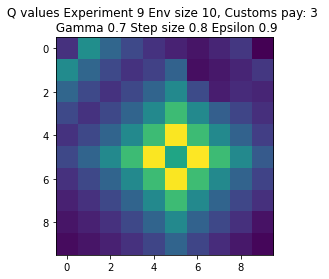

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.7 Step size 0.8 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-6.0 Reward:-115 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-171.0 Reward:-130 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-160.0 Reward:0 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-80.0 Reward:-161 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-61.0 Reward:-49 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:14.0 Reward:-125 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:120 RunnAReward:62.0 Reward:282 Timesteps:100 GotPack:False Utiltime:41 Customstime:0 Mone

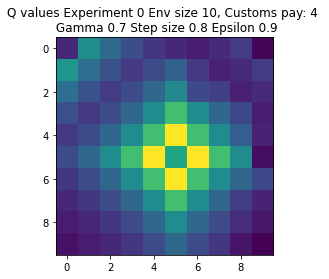

Expr:1 Eps:0 RunnAReward:-15.0 Reward:-290 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-227.0 Reward:-135 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-175.0 Reward:-93 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-78.0 Reward:-62 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-52.0 Reward:-195 Timesteps:300 GotPack:False Utiltime:31 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:-119.0 Reward:-30 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:118.0 Reward:139 Timesteps:200 GotPack:False Utiltime:35 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:125.0 Reward:-110 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:140.0 Reward:296 Timesteps:100 GotPack:False Utiltime:54 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:162.0 Reward:258 Timeste

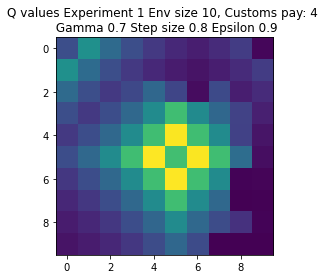

Expr:2 Eps:0 RunnAReward:-1.0 Reward:-8 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-150.0 Reward:-44 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-352.0 Reward:109 Timesteps:100 GotPack:False Utiltime:64 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-28.0 Reward:-136 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-26.0 Reward:243 Timesteps:100 GotPack:False Utiltime:67 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:58.0 Reward:65 Timesteps:200 GotPack:False Utiltime:35 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:-87.0 Reward:280 Timesteps:100 GotPack:False Utiltime:45 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:151.0 Reward:-142 Timesteps:892 GotPack:True Utiltime:24 Customstime:224 Money:4
Expr:2 Eps:160 RunnAReward:242.0 Reward:200 Timesteps:100 GotPack:False Utiltime:73 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:23.0 Reward:-37 Timesteps:2

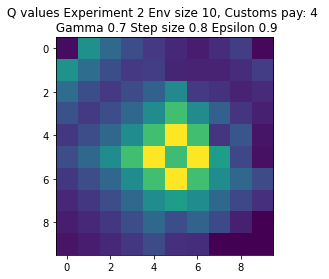

Expr:3 Eps:0 RunnAReward:-9.0 Reward:-174 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-309.0 Reward:-1061 Timesteps:1377 GotPack:True Utiltime:444 Customstime:902 Money:5
Expr:3 Eps:40 RunnAReward:-252.0 Reward:-89 Timesteps:300 GotPack:False Utiltime:216 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-71.0 Reward:-129 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-70.0 Reward:-17 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-11.0 Reward:135 Timesteps:200 GotPack:False Utiltime:53 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:-9.0 Reward:23 Timesteps:300 GotPack:False Utiltime:99 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:63.0 Reward:-193 Timesteps:854 GotPack:True Utiltime:54 Customstime:265 Money:4
Expr:3 Eps:160 RunnAReward:142.0 Reward:-250 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:126.0 Reward:90 Time

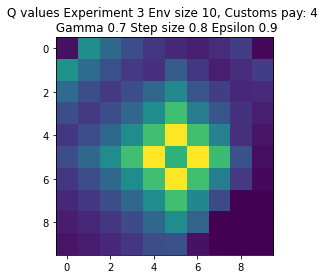

Expr:4 Eps:0 RunnAReward:-112.0 Reward:-2221 Timesteps:2089 GotPack:True Utiltime:1010 Customstime:1637 Money:5
Expr:4 Eps:20 RunnAReward:-346.0 Reward:-143 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-141.0 Reward:-134 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-120.0 Reward:12 Timesteps:200 GotPack:False Utiltime:110 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:-114.0 Reward:-25 Timesteps:721 GotPack:True Utiltime:673 Customstime:697 Money:5
Expr:4 Eps:100 RunnAReward:88.0 Reward:-24 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:45.0 Reward:267 Timesteps:100 GotPack:False Utiltime:82 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:46.0 Reward:-17 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:-6.0 Reward:259 Timesteps:100 GotPack:False Utiltime:51 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:106.0 Reward:218 

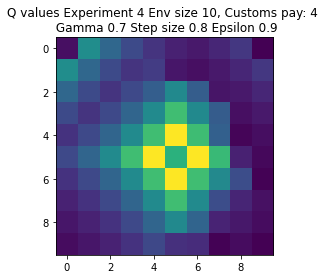

Expr:5 Eps:0 RunnAReward:-7.0 Reward:-129 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-371.0 Reward:-311 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-235.0 Reward:291 Timesteps:100 GotPack:False Utiltime:66 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-67.0 Reward:-73 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-178.0 Reward:-33 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-75.0 Reward:194 Timesteps:674 GotPack:True Utiltime:64 Customstime:179 Money:4
Expr:5 Eps:120 RunnAReward:112.0 Reward:52 Timesteps:200 GotPack:False Utiltime:66 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:9.0 Reward:356 Timesteps:438 GotPack:True Utiltime:86 Customstime:371 Money:4
Expr:5 Eps:160 RunnAReward:34.0 Reward:-20 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:198.0 Reward:149 Timesteps:2

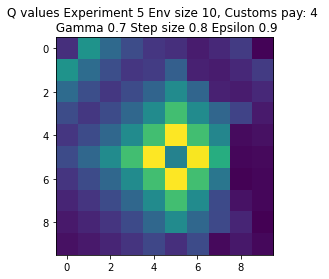

Expr:6 Eps:0 RunnAReward:1.0 Reward:26 Timesteps:200 GotPack:False Utiltime:58 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-434.0 Reward:-26 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-112.0 Reward:155 Timesteps:100 GotPack:False Utiltime:82 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-143.0 Reward:-185 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-36.0 Reward:-112 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-188.0 Reward:-229 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:15.0 Reward:155 Timesteps:200 GotPack:False Utiltime:4 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:-61.0 Reward:-215 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:128.0 Reward:605 Timesteps:308 GotPack:True Utiltime:218 Customstime:283 Money:4
Expr:6 Eps:180 RunnAReward:31.0 Reward:-361 Timestep

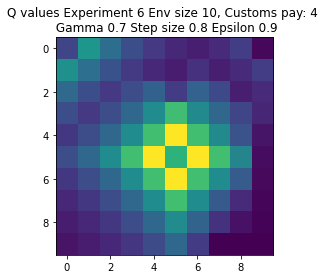

Expr:7 Eps:0 RunnAReward:-59.0 Reward:-1165 Timesteps:1549 GotPack:True Utiltime:94 Customstime:572 Money:4
Expr:7 Eps:20 RunnAReward:-309.0 Reward:-175 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-215.0 Reward:-26 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-200.0 Reward:-87 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:42.0 Reward:-164 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:44.0 Reward:557 Timesteps:207 GotPack:True Utiltime:109 Customstime:181 Money:5
Expr:7 Eps:120 RunnAReward:8.0 Reward:154 Timesteps:655 GotPack:True Utiltime:59 Customstime:295 Money:4
Expr:7 Eps:140 RunnAReward:60.0 Reward:2 Timesteps:200 GotPack:False Utiltime:71 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:123.0 Reward:247 Timesteps:100 GotPack:False Utiltime:82 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:167.0 Reward:666 Timeste

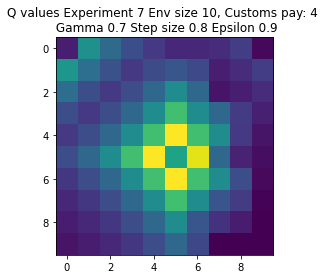

Expr:8 Eps:0 RunnAReward:-3.0 Reward:-57 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-168.0 Reward:126 Timesteps:200 GotPack:False Utiltime:62 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-72.0 Reward:-241 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-157.0 Reward:126 Timesteps:100 GotPack:False Utiltime:13 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-92.0 Reward:-67 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:5.0 Reward:129 Timesteps:100 GotPack:False Utiltime:50 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:32.0 Reward:-72 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:142.0 Reward:255 Timesteps:100 GotPack:False Utiltime:64 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:163.0 Reward:120 Timesteps:200 GotPack:False Utiltime:49 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:52.0 Reward:244 Timesteps:100 

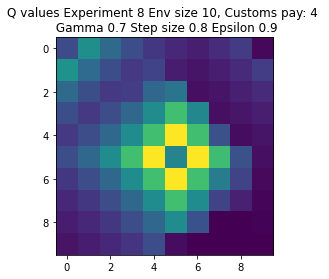

Expr:9 Eps:0 RunnAReward:-8.0 Reward:-156 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-362.0 Reward:333 Timesteps:470 GotPack:True Utiltime:216 Customstime:406 Money:5
Expr:9 Eps:40 RunnAReward:-163.0 Reward:67 Timesteps:559 GotPack:True Utiltime:183 Customstime:394 Money:5
Expr:9 Eps:60 RunnAReward:-83.0 Reward:-24 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:3.0 Reward:-83 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-52.0 Reward:-2 Timesteps:300 GotPack:False Utiltime:150 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:-14.0 Reward:485 Timesteps:405 GotPack:True Utiltime:152 Customstime:306 Money:4
Expr:9 Eps:140 RunnAReward:195.0 Reward:-130 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:181.0 Reward:224 Timesteps:100 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:173.0 Reward:295 Timest

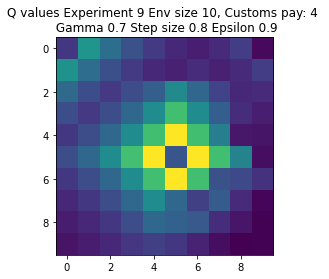

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.7 Step size 0.8 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-24.0 Reward:-470 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-700.0 Reward:222 Timesteps:526 GotPack:True Utiltime:386 Customstime:513 Money:3
Expr:0 Eps:40 RunnAReward:-622.0 Reward:-346 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-264.0 Reward:-491 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-198.0 Reward:-83 Timesteps:300 GotPack:False Utiltime:64 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-105.0 Reward:72 Timesteps:200 GotPack:False Utiltime:183 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:-216.0 Reward:58 Timesteps:200 GotPack:False Utiltime:98 Custom

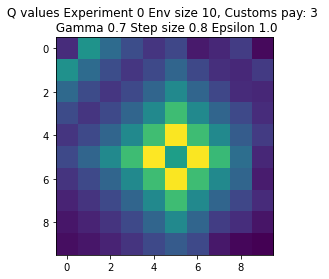

Expr:1 Eps:0 RunnAReward:-4.0 Reward:-75 Timesteps:300 GotPack:False Utiltime:101 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-219.0 Reward:-177 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-678.0 Reward:-1692 Timesteps:1875 GotPack:True Utiltime:705 Customstime:752 Money:3
Expr:1 Eps:60 RunnAReward:-625.0 Reward:3 Timesteps:200 GotPack:False Utiltime:96 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-345.0 Reward:-128 Timesteps:300 GotPack:False Utiltime:46 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:-83.0 Reward:266 Timesteps:523 GotPack:True Utiltime:300 Customstime:491 Money:3
Expr:1 Eps:120 RunnAReward:-97.0 Reward:-855 Timesteps:1375 GotPack:True Utiltime:1006 Customstime:1226 Money:5
Expr:1 Eps:140 RunnAReward:77.0 Reward:-15 Timesteps:200 GotPack:False Utiltime:15 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:13.0 Reward:101 Timesteps:200 GotPack:False Utiltime:172 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:66.0 Rewar

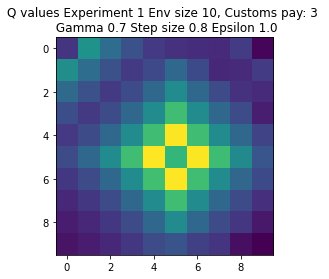

Expr:2 Eps:0 RunnAReward:-22.0 Reward:-425 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-491.0 Reward:-1194 Timesteps:1418 GotPack:True Utiltime:1024 Customstime:1113 Money:3
Expr:2 Eps:40 RunnAReward:-270.0 Reward:-34 Timesteps:300 GotPack:False Utiltime:244 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-245.0 Reward:23 Timesteps:200 GotPack:False Utiltime:150 Customstime:0 Money:1
Expr:2 Eps:80 RunnAReward:-344.0 Reward:336 Timesteps:499 GotPack:True Utiltime:182 Customstime:482 Money:5
Expr:2 Eps:100 RunnAReward:-99.0 Reward:-45 Timesteps:200 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-93.0 Reward:-142 Timesteps:400 GotPack:False Utiltime:103 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:-133.0 Reward:-105 Timesteps:849 GotPack:True Utiltime:82 Customstime:627 Money:3
Expr:2 Eps:160 RunnAReward:186.0 Reward:-61 Timesteps:695 GotPack:True Utiltime:113 Customstime:251 Money:3
Expr:2 Eps:180 RunnAReward:13.0

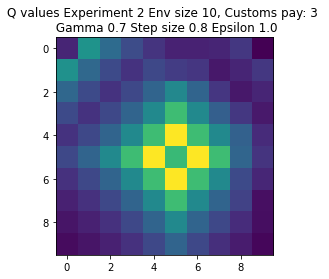

Expr:3 Eps:0 RunnAReward:-65.0 Reward:-1296 Timesteps:1745 GotPack:True Utiltime:994 Customstime:1128 Money:3
Expr:3 Eps:20 RunnAReward:-541.0 Reward:-261 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-381.0 Reward:-150 Timesteps:300 GotPack:False Utiltime:273 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-289.0 Reward:-252 Timesteps:400 GotPack:False Utiltime:88 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:-396.0 Reward:192 Timesteps:622 GotPack:True Utiltime:104 Customstime:462 Money:3
Expr:3 Eps:100 RunnAReward:-302.0 Reward:-148 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:3 Eps:120 RunnAReward:-54.0 Reward:66 Timesteps:200 GotPack:False Utiltime:85 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:16.0 Reward:-11 Timesteps:200 GotPack:False Utiltime:31 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:-21.0 Reward:-41 Timesteps:200 GotPack:False Utiltime:58 Customstime:0 Money:1
Expr:3 Eps:180 RunnAReward:94.0 Reward

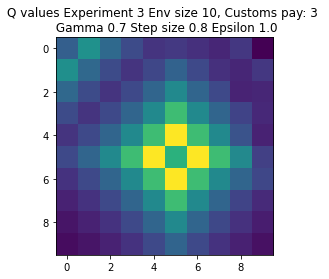

Expr:4 Eps:0 RunnAReward:-11.0 Reward:-217 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-615.0 Reward:-273 Timesteps:500 GotPack:False Utiltime:377 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-478.0 Reward:-3158 Timesteps:3000 GotPack:False Utiltime:1516 Customstime:1926 Money:4
Expr:4 Eps:60 RunnAReward:-666.0 Reward:-1742 Timesteps:2059 GotPack:True Utiltime:696 Customstime:1091 Money:5
Expr:4 Eps:80 RunnAReward:-331.0 Reward:-162 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-146.0 Reward:-331 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-57.0 Reward:124 Timesteps:200 GotPack:False Utiltime:58 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:31.0 Reward:364 Timesteps:386 GotPack:True Utiltime:206 Customstime:271 Money:3
Expr:4 Eps:160 RunnAReward:14.0 Reward:-233 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:180 RunnAReward:201.

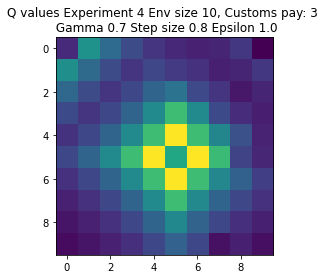

Expr:5 Eps:0 RunnAReward:-2.0 Reward:-21 Timesteps:758 GotPack:True Utiltime:279 Customstime:347 Money:5
Expr:5 Eps:20 RunnAReward:-451.0 Reward:-1451 Timesteps:1832 GotPack:True Utiltime:75 Customstime:440 Money:3
Expr:5 Eps:40 RunnAReward:-671.0 Reward:-56 Timesteps:200 GotPack:False Utiltime:147 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-176.0 Reward:-136 Timesteps:400 GotPack:False Utiltime:21 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:-199.0 Reward:-346 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:-129.0 Reward:2 Timesteps:200 GotPack:False Utiltime:140 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-13.0 Reward:-128 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:140 RunnAReward:-207.0 Reward:-45 Timesteps:400 GotPack:False Utiltime:252 Customstime:0 Money:1
Expr:5 Eps:160 RunnAReward:-88.0 Reward:103 Timesteps:200 GotPack:False Utiltime:139 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:38.0 Reward

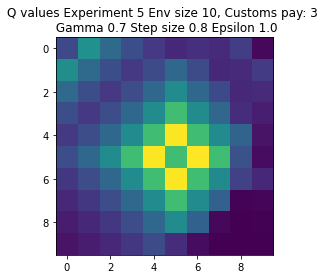

Expr:6 Eps:0 RunnAReward:-55.0 Reward:-1083 Timesteps:1477 GotPack:True Utiltime:923 Customstime:1014 Money:3
Expr:6 Eps:20 RunnAReward:-374.0 Reward:13 Timesteps:200 GotPack:False Utiltime:116 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-388.0 Reward:-393 Timesteps:1016 GotPack:True Utiltime:443 Customstime:966 Money:5
Expr:6 Eps:60 RunnAReward:-616.0 Reward:29 Timesteps:300 GotPack:False Utiltime:179 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:-140.0 Reward:169 Timesteps:200 GotPack:False Utiltime:161 Customstime:0 Money:1
Expr:6 Eps:100 RunnAReward:-40.0 Reward:339 Timesteps:392 GotPack:True Utiltime:60 Customstime:370 Money:5
Expr:6 Eps:120 RunnAReward:-140.0 Reward:455 Timesteps:403 GotPack:True Utiltime:91 Customstime:354 Money:3
Expr:6 Eps:140 RunnAReward:12.0 Reward:-280 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:69.0 Reward:561 Timesteps:346 GotPack:True Utiltime:61 Customstime:278 Money:3
Expr:6 Eps:180 RunnAReward:214.0 Re

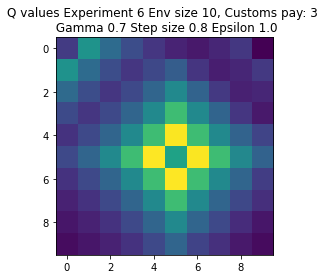

Expr:7 Eps:0 RunnAReward:-12.0 Reward:-228 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:20 RunnAReward:-953.0 Reward:-336 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-352.0 Reward:-217 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-383.0 Reward:61 Timesteps:627 GotPack:True Utiltime:534 Customstime:573 Money:5
Expr:7 Eps:80 RunnAReward:-183.0 Reward:131 Timesteps:200 GotPack:False Utiltime:157 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-142.0 Reward:-220 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-205.0 Reward:-230 Timesteps:826 GotPack:True Utiltime:603 Customstime:654 Money:3
Expr:7 Eps:140 RunnAReward:69.0 Reward:67 Timesteps:300 GotPack:False Utiltime:25 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:-9.0 Reward:-105 Timesteps:400 GotPack:False Utiltime:72 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:-65.0 Reward:258

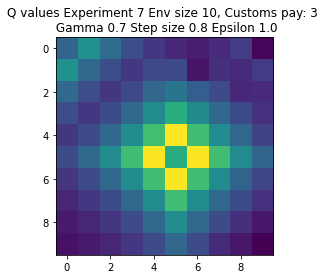

Expr:8 Eps:0 RunnAReward:-24.0 Reward:-464 Timesteps:500 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-467.0 Reward:121 Timesteps:200 GotPack:False Utiltime:182 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-269.0 Reward:-108 Timesteps:400 GotPack:False Utiltime:165 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-295.0 Reward:-7 Timesteps:300 GotPack:False Utiltime:183 Customstime:0 Money:1
Expr:8 Eps:80 RunnAReward:-183.0 Reward:-246 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-299.0 Reward:391 Timesteps:355 GotPack:True Utiltime:49 Customstime:187 Money:4
Expr:8 Eps:120 RunnAReward:-83.0 Reward:-80 Timesteps:300 GotPack:False Utiltime:221 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:50.0 Reward:295 Timesteps:500 GotPack:True Utiltime:102 Customstime:359 Money:3
Expr:8 Eps:160 RunnAReward:47.0 Reward:84 Timesteps:200 GotPack:False Utiltime:131 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:48.0 Reward:458

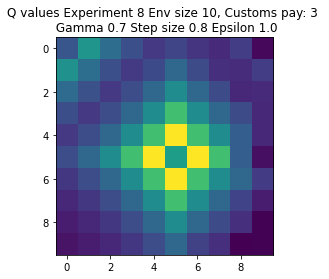

Expr:9 Eps:0 RunnAReward:0.0 Reward:8 Timesteps:200 GotPack:False Utiltime:134 Customstime:0 Money:1
Expr:9 Eps:20 RunnAReward:-353.0 Reward:-258 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-647.0 Reward:-3138 Timesteps:2962 GotPack:True Utiltime:2508 Customstime:2781 Money:5
Expr:9 Eps:60 RunnAReward:-487.0 Reward:-1507 Timesteps:1677 GotPack:True Utiltime:983 Customstime:1091 Money:5
Expr:9 Eps:80 RunnAReward:-297.0 Reward:-162 Timesteps:400 GotPack:False Utiltime:58 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:-168.0 Reward:-167 Timesteps:878 GotPack:True Utiltime:305 Customstime:489 Money:3
Expr:9 Eps:120 RunnAReward:-31.0 Reward:209 Timesteps:640 GotPack:True Utiltime:91 Customstime:256 Money:5
Expr:9 Eps:140 RunnAReward:-43.0 Reward:611 Timesteps:321 GotPack:True Utiltime:77 Customstime:176 Money:3
Expr:9 Eps:160 RunnAReward:114.0 Reward:-349 Timesteps:500 GotPack:False Utiltime:52 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:24.

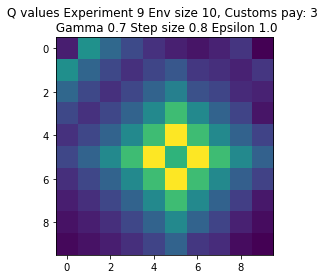

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.7 Step size 0.8 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-7.0 Reward:-125 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-206.0 Reward:-228 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-212.0 Reward:-80 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-140.0 Reward:-40 Timesteps:200 GotPack:False Utiltime:124 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:-94.0 Reward:-65 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-18.0 Reward:-94 Timesteps:300 GotPack:False Utiltime:190 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:15.0 Reward:-142 Timesteps:100 GotPack:False Utiltime:0 Customstime:

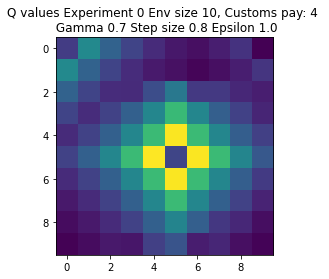

Expr:1 Eps:0 RunnAReward:-7.0 Reward:-124 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-171.0 Reward:-136 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-248.0 Reward:-61 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-183.0 Reward:-136 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-231.0 Reward:-78 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-80.0 Reward:-192 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:-159.0 Reward:-58 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:2.0 Reward:-8 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:-1.0 Reward:-110 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:5.0 Reward:-227 Timesteps:200

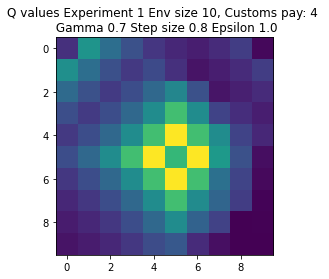

Expr:2 Eps:0 RunnAReward:-10.0 Reward:-193 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-381.0 Reward:-157 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-144.0 Reward:-88 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-247.0 Reward:58 Timesteps:200 GotPack:False Utiltime:74 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:-240.0 Reward:-187 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-168.0 Reward:-143 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-56.0 Reward:-395 Timesteps:977 GotPack:True Utiltime:134 Customstime:319 Money:5
Expr:2 Eps:140 RunnAReward:-39.0 Reward:286 Timesteps:100 GotPack:False Utiltime:88 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:-19.0 Reward:-72 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:29.0 Reward:254 Time

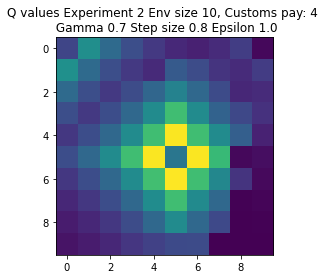

Expr:3 Eps:0 RunnAReward:-18.0 Reward:-342 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-389.0 Reward:-160 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-153.0 Reward:-37 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-332.0 Reward:-162 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-432.0 Reward:-128 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-208.0 Reward:-2035 Timesteps:2313 GotPack:True Utiltime:858 Customstime:917 Money:5
Expr:3 Eps:120 RunnAReward:-159.0 Reward:-206 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:-57.0 Reward:-7 Timesteps:300 GotPack:False Utiltime:246 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:104.0 Reward:722 Timesteps:230 GotPack:True Utiltime:95 Customstime:212 Money:4
Expr:3 Eps:180 RunnAReward:103.0 Reward:5

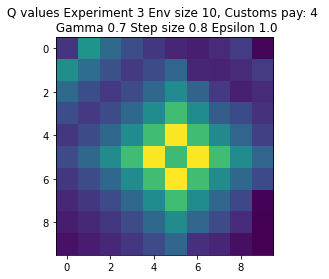

Expr:4 Eps:0 RunnAReward:-10.0 Reward:-200 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-92.0 Reward:-144 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-481.0 Reward:-47 Timesteps:300 GotPack:False Utiltime:269 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-180.0 Reward:107 Timesteps:100 GotPack:False Utiltime:21 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-81.0 Reward:-331 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-231.0 Reward:-108 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-84.0 Reward:-541 Timesteps:1052 GotPack:True Utiltime:101 Customstime:481 Money:4
Expr:4 Eps:140 RunnAReward:7.0 Reward:-34 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:-53.0 Reward:-65 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:-22.0 Reward:-195 Tim

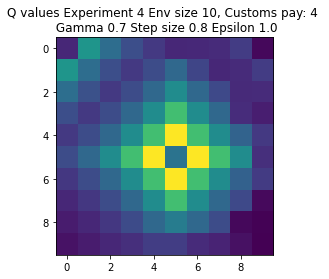

Expr:5 Eps:0 RunnAReward:-10.0 Reward:-189 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-185.0 Reward:-229 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-148.0 Reward:-213 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-298.0 Reward:-66 Timesteps:200 GotPack:False Utiltime:133 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:-351.0 Reward:-5 Timesteps:200 GotPack:False Utiltime:33 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:63.0 Reward:-105 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-221.0 Reward:-24 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:58.0 Reward:-132 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:14.0 Reward:-48 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:25.0 Reward:180 Timesteps

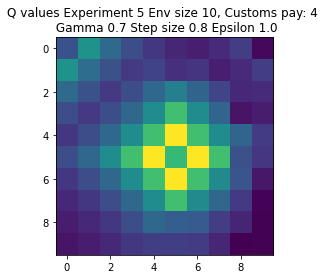

Expr:6 Eps:0 RunnAReward:-5.0 Reward:-98 Timesteps:669 GotPack:True Utiltime:60 Customstime:261 Money:4
Expr:6 Eps:20 RunnAReward:-233.0 Reward:-282 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-670.0 Reward:-2251 Timesteps:2349 GotPack:True Utiltime:1296 Customstime:1474 Money:5
Expr:6 Eps:60 RunnAReward:-475.0 Reward:-13 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-80.0 Reward:230 Timesteps:100 GotPack:False Utiltime:88 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-56.0 Reward:165 Timesteps:100 GotPack:False Utiltime:22 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-53.0 Reward:-348 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:-65.0 Reward:230 Timesteps:100 GotPack:False Utiltime:88 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:27.0 Reward:190 Timesteps:100 GotPack:False Utiltime:8 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:105.0 Reward:107 T

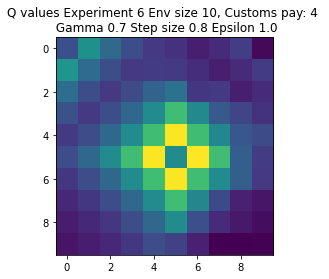

Expr:7 Eps:0 RunnAReward:-9.0 Reward:-178 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-211.0 Reward:467 Timesteps:338 GotPack:True Utiltime:174 Customstime:246 Money:5
Expr:7 Eps:40 RunnAReward:-457.0 Reward:117 Timesteps:513 GotPack:True Utiltime:77 Customstime:261 Money:4
Expr:7 Eps:60 RunnAReward:-497.0 Reward:-191 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-111.0 Reward:-175 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-76.0 Reward:-226 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-150.0 Reward:-45 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-4.0 Reward:70 Timesteps:200 GotPack:False Utiltime:64 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:17.0 Reward:-240 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:87.0 Reward:-110 Times

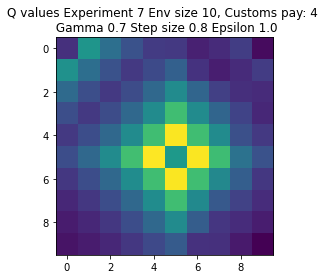

Expr:8 Eps:0 RunnAReward:-8.0 Reward:-145 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-283.0 Reward:-65 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-335.0 Reward:-344 Timesteps:1010 GotPack:True Utiltime:165 Customstime:278 Money:4
Expr:8 Eps:60 RunnAReward:-242.0 Reward:-134 Timesteps:300 GotPack:False Utiltime:274 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-132.0 Reward:-58 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-110.0 Reward:-322 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:-14.0 Reward:-32 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:-37.0 Reward:-212 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:38.0 Reward:637 Timesteps:195 GotPack:True Utiltime:20 Customstime:135 Money:5
Expr:8 Eps:180 RunnAReward:99.0 Reward:137 Ti

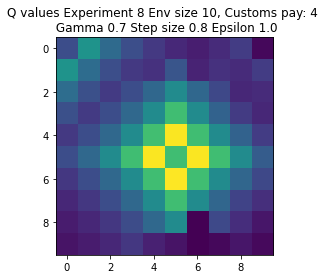

Expr:9 Eps:0 RunnAReward:-6.0 Reward:-115 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-391.0 Reward:-385 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-241.0 Reward:151 Timesteps:100 GotPack:False Utiltime:34 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-325.0 Reward:-360 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:-117.0 Reward:-631 Timesteps:1343 GotPack:True Utiltime:482 Customstime:652 Money:4
Expr:9 Eps:100 RunnAReward:-111.0 Reward:110 Timesteps:200 GotPack:False Utiltime:173 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:-81.0 Reward:512 Timesteps:325 GotPack:True Utiltime:5 Customstime:200 Money:5
Expr:9 Eps:140 RunnAReward:6.0 Reward:-125 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:36.0 Reward:54 Timesteps:774 GotPack:True Utiltime:345 Customstime:427 Money:5
Expr:9 Eps:180 RunnAReward:-12.0 Reward:123 T

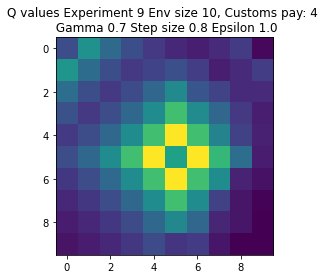

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.9 Step size 0.4 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-10.0 Reward:-197 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-416.0 Reward:-1084 Timesteps:1616 GotPack:True Utiltime:613 Customstime:772 Money:3
Expr:0 Eps:40 RunnAReward:-32.0 Reward:57 Timesteps:710 GotPack:True Utiltime:20 Customstime:516 Money:3
Expr:0 Eps:60 RunnAReward:-1.0 Reward:-453 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:181.0 Reward:194 Timesteps:586 GotPack:True Utiltime:46 Customstime:170 Money:5
Expr:0 Eps:100 RunnAReward:235.0 Reward:793 Timesteps:163 GotPack:True Utiltime:22 Customstime:74 Money:3
Expr:0 Eps:120 RunnAReward:380.0 Reward:114 Timesteps:200 GotPack:False Utiltime:25 Customs

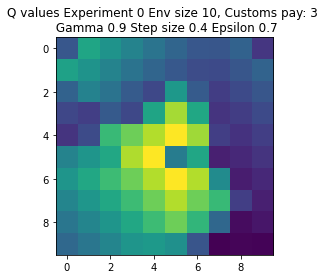

Expr:1 Eps:0 RunnAReward:-19.0 Reward:-366 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-223.0 Reward:-138 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-146.0 Reward:139 Timesteps:200 GotPack:False Utiltime:136 Customstime:0 Money:1
Expr:1 Eps:60 RunnAReward:2.0 Reward:133 Timesteps:200 GotPack:False Utiltime:154 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:166.0 Reward:336 Timesteps:502 GotPack:True Utiltime:97 Customstime:169 Money:3
Expr:1 Eps:100 RunnAReward:155.0 Reward:-78 Timesteps:300 GotPack:False Utiltime:101 Customstime:0 Money:1
Expr:1 Eps:120 RunnAReward:257.0 Reward:389 Timesteps:385 GotPack:True Utiltime:35 Customstime:346 Money:4
Expr:1 Eps:140 RunnAReward:267.0 Reward:-136 Timesteps:400 GotPack:False Utiltime:11 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:324.0 Reward:595 Timesteps:281 GotPack:True Utiltime:55 Customstime:216 Money:3
Expr:1 Eps:180 RunnAReward:489.0 Reward:537 T

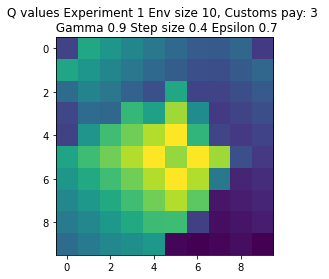

Expr:2 Eps:0 RunnAReward:-11.0 Reward:-220 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-195.0 Reward:-665 Timesteps:1288 GotPack:True Utiltime:55 Customstime:360 Money:4
Expr:2 Eps:40 RunnAReward:-154.0 Reward:-153 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-94.0 Reward:160 Timesteps:200 GotPack:False Utiltime:113 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:232.0 Reward:98 Timesteps:200 GotPack:False Utiltime:90 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:200.0 Reward:762 Timesteps:192 GotPack:True Utiltime:62 Customstime:131 Money:4
Expr:2 Eps:120 RunnAReward:268.0 Reward:520 Timesteps:335 GotPack:True Utiltime:12 Customstime:147 Money:4
Expr:2 Eps:140 RunnAReward:251.0 Reward:572 Timesteps:319 GotPack:True Utiltime:21 Customstime:253 Money:3
Expr:2 Eps:160 RunnAReward:321.0 Reward:-219 Timesteps:1008 GotPack:True Utiltime:25 Customstime:134 Money:5
Expr:2 Eps:180 RunnAReward:479.0 Reward:5

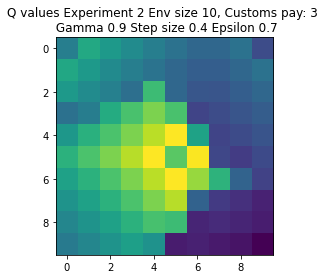

Expr:3 Eps:0 RunnAReward:-20.0 Reward:-395 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-212.0 Reward:70 Timesteps:200 GotPack:False Utiltime:24 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-5.0 Reward:-340 Timesteps:900 GotPack:True Utiltime:586 Customstime:614 Money:5
Expr:3 Eps:60 RunnAReward:32.0 Reward:114 Timesteps:200 GotPack:False Utiltime:26 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:109.0 Reward:697 Timesteps:214 GotPack:True Utiltime:27 Customstime:178 Money:5
Expr:3 Eps:100 RunnAReward:222.0 Reward:40 Timesteps:786 GotPack:True Utiltime:69 Customstime:335 Money:3
Expr:3 Eps:120 RunnAReward:328.0 Reward:66 Timesteps:200 GotPack:False Utiltime:12 Customstime:0 Money:1
Expr:3 Eps:140 RunnAReward:318.0 Reward:391 Timesteps:451 GotPack:True Utiltime:61 Customstime:219 Money:4
Expr:3 Eps:160 RunnAReward:365.0 Reward:592 Timesteps:246 GotPack:True Utiltime:48 Customstime:146 Money:5
Expr:3 Eps:180 RunnAReward:500.0 Reward:761 Times

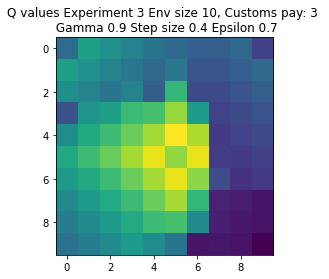

Expr:4 Eps:0 RunnAReward:-14.0 Reward:-266 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-289.0 Reward:87 Timesteps:200 GotPack:False Utiltime:180 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-136.0 Reward:463 Timesteps:331 GotPack:True Utiltime:128 Customstime:193 Money:3
Expr:4 Eps:60 RunnAReward:84.0 Reward:116 Timesteps:200 GotPack:False Utiltime:178 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:55.0 Reward:512 Timesteps:337 GotPack:True Utiltime:71 Customstime:170 Money:5
Expr:4 Eps:100 RunnAReward:286.0 Reward:-45 Timesteps:300 GotPack:False Utiltime:52 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:210.0 Reward:27 Timesteps:300 GotPack:False Utiltime:84 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:325.0 Reward:575 Timesteps:274 GotPack:True Utiltime:38 Customstime:172 Money:4
Expr:4 Eps:160 RunnAReward:321.0 Reward:525 Timesteps:361 GotPack:True Utiltime:65 Customstime:131 Money:3
Expr:4 Eps:180 RunnAReward:411.0 Reward:578 Tim

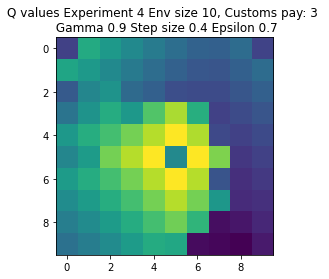

Expr:5 Eps:0 RunnAReward:10.0 Reward:213 Timesteps:579 GotPack:True Utiltime:230 Customstime:315 Money:5
Expr:5 Eps:20 RunnAReward:-318.0 Reward:-261 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-135.0 Reward:228 Timesteps:520 GotPack:True Utiltime:340 Customstime:383 Money:3
Expr:5 Eps:60 RunnAReward:-30.0 Reward:-38 Timesteps:300 GotPack:False Utiltime:69 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:164.0 Reward:-7 Timesteps:674 GotPack:True Utiltime:64 Customstime:461 Money:4
Expr:5 Eps:100 RunnAReward:219.0 Reward:140 Timesteps:200 GotPack:False Utiltime:118 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:325.0 Reward:42 Timesteps:300 GotPack:False Utiltime:55 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:394.0 Reward:554 Timesteps:374 GotPack:True Utiltime:43 Customstime:211 Money:3
Expr:5 Eps:160 RunnAReward:551.0 Reward:774 Timesteps:173 GotPack:True Utiltime:80 Customstime:129 Money:4
Expr:5 Eps:180 RunnAReward:537.0 Reward:550 T

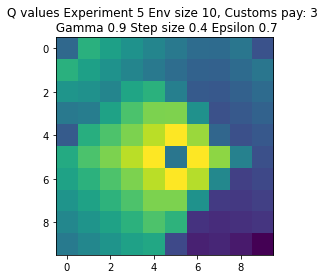

Expr:6 Eps:0 RunnAReward:-8.0 Reward:-153 Timesteps:300 GotPack:False Utiltime:185 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-266.0 Reward:-158 Timesteps:400 GotPack:False Utiltime:330 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-414.0 Reward:-124 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:60 RunnAReward:12.0 Reward:345 Timesteps:484 GotPack:True Utiltime:283 Customstime:398 Money:4
Expr:6 Eps:80 RunnAReward:178.0 Reward:-57 Timesteps:200 GotPack:False Utiltime:36 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:178.0 Reward:753 Timesteps:128 GotPack:True Utiltime:25 Customstime:114 Money:5
Expr:6 Eps:120 RunnAReward:244.0 Reward:48 Timesteps:300 GotPack:False Utiltime:113 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:266.0 Reward:139 Timesteps:200 GotPack:False Utiltime:56 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:296.0 Reward:28 Timesteps:300 GotPack:False Utiltime:24 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:359.0 Reward:884 Ti

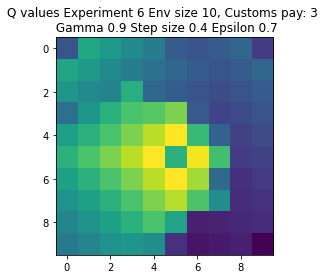

Expr:7 Eps:0 RunnAReward:0.0 Reward:17 Timesteps:300 GotPack:False Utiltime:264 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-291.0 Reward:-156 Timesteps:300 GotPack:False Utiltime:45 Customstime:0 Money:2
Expr:7 Eps:40 RunnAReward:-140.0 Reward:-4 Timesteps:200 GotPack:False Utiltime:152 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:1.0 Reward:138 Timesteps:200 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:180.0 Reward:26 Timesteps:200 GotPack:False Utiltime:51 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:153.0 Reward:171 Timesteps:200 GotPack:False Utiltime:36 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:177.0 Reward:331 Timesteps:506 GotPack:True Utiltime:99 Customstime:464 Money:4
Expr:7 Eps:140 RunnAReward:187.0 Reward:798 Timesteps:193 GotPack:True Utiltime:47 Customstime:159 Money:3
Expr:7 Eps:160 RunnAReward:297.0 Reward:109 Timesteps:200 GotPack:False Utiltime:58 Customstime:0 Money:1
Expr:7 Eps:180 RunnAReward:364.0 Reward:490 Timestep

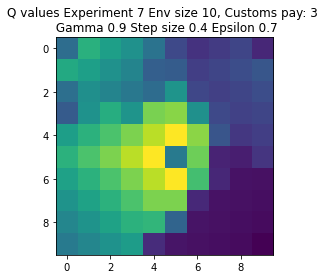

Expr:8 Eps:0 RunnAReward:-11.0 Reward:-207 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-237.0 Reward:-206 Timesteps:930 GotPack:True Utiltime:486 Customstime:576 Money:5
Expr:8 Eps:40 RunnAReward:-229.0 Reward:133 Timesteps:200 GotPack:False Utiltime:94 Customstime:0 Money:1
Expr:8 Eps:60 RunnAReward:-15.0 Reward:562 Timesteps:296 GotPack:True Utiltime:217 Customstime:240 Money:5
Expr:8 Eps:80 RunnAReward:140.0 Reward:-15 Timesteps:300 GotPack:False Utiltime:37 Customstime:0 Money:1
Expr:8 Eps:100 RunnAReward:162.0 Reward:-743 Timesteps:1344 GotPack:True Utiltime:258 Customstime:378 Money:3
Expr:8 Eps:120 RunnAReward:74.0 Reward:89 Timesteps:200 GotPack:False Utiltime:50 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:262.0 Reward:105 Timesteps:200 GotPack:False Utiltime:44 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:312.0 Reward:33 Timesteps:300 GotPack:False Utiltime:73 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:543.0 Reward:895 

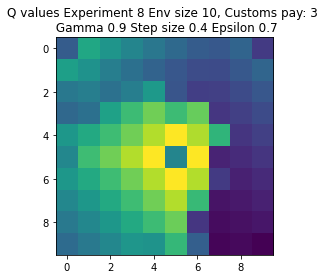

Expr:9 Eps:0 RunnAReward:-10.0 Reward:-191 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-322.0 Reward:-113 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:40 RunnAReward:-167.0 Reward:94 Timesteps:200 GotPack:False Utiltime:13 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:122.0 Reward:175 Timesteps:578 GotPack:True Utiltime:66 Customstime:297 Money:5
Expr:9 Eps:80 RunnAReward:52.0 Reward:25 Timesteps:300 GotPack:False Utiltime:97 Customstime:0 Money:1
Expr:9 Eps:100 RunnAReward:340.0 Reward:13 Timesteps:300 GotPack:False Utiltime:13 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:264.0 Reward:706 Timesteps:253 GotPack:True Utiltime:44 Customstime:92 Money:5
Expr:9 Eps:140 RunnAReward:376.0 Reward:733 Timesteps:177 GotPack:True Utiltime:53 Customstime:129 Money:5
Expr:9 Eps:160 RunnAReward:476.0 Reward:851 Timesteps:112 GotPack:True Utiltime:60 Customstime:96 Money:3
Expr:9 Eps:180 RunnAReward:676.0 Reward:115 Timestep

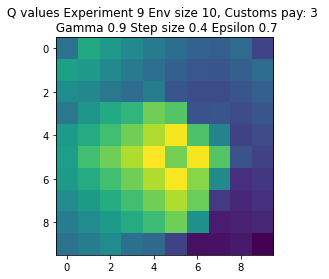

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.9 Step size 0.4 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-90.0 Reward:-1800 Timesteps:2012 GotPack:True Utiltime:1797 Customstime:1939 Money:5
Expr:0 Eps:20 RunnAReward:-157.0 Reward:-111 Timesteps:200 GotPack:False Utiltime:55 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-37.0 Reward:175 Timesteps:100 GotPack:False Utiltime:45 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-136.0 Reward:556 Timesteps:269 GotPack:True Utiltime:11 Customstime:217 Money:4
Expr:0 Eps:80 RunnAReward:66.0 Reward:235 Timesteps:100 GotPack:False Utiltime:62 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:133.0 Reward:494 Timesteps:372 GotPack:True Utiltime:35 Customstime:159 Money:5
Expr:0 Eps:120 RunnAReward:172.0 Reward:159 Timesteps:100 GotPack:False Utiltime:44 Cu

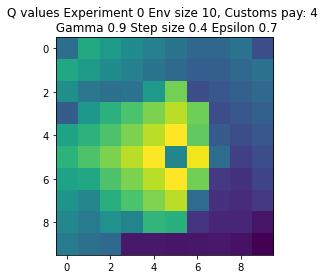

Expr:1 Eps:0 RunnAReward:-8.0 Reward:-150 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-252.0 Reward:341 Timesteps:491 GotPack:True Utiltime:106 Customstime:131 Money:5
Expr:1 Eps:40 RunnAReward:12.0 Reward:-4 Timesteps:825 GotPack:True Utiltime:239 Customstime:360 Money:4
Expr:1 Eps:60 RunnAReward:-23.0 Reward:528 Timesteps:339 GotPack:True Utiltime:31 Customstime:166 Money:4
Expr:1 Eps:80 RunnAReward:122.0 Reward:173 Timesteps:100 GotPack:False Utiltime:36 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:210.0 Reward:272 Timesteps:100 GotPack:False Utiltime:27 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:254.0 Reward:654 Timesteps:201 GotPack:True Utiltime:66 Customstime:141 Money:5
Expr:1 Eps:140 RunnAReward:344.0 Reward:270 Timesteps:100 GotPack:False Utiltime:82 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:362.0 Reward:147 Timesteps:200 GotPack:False Utiltime:3 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:259.0 Reward:-169 Time

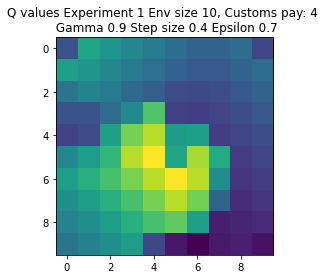

Expr:2 Eps:0 RunnAReward:-12.0 Reward:-239 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-151.0 Reward:0 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:3.0 Reward:138 Timesteps:200 GotPack:False Utiltime:21 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:61.0 Reward:154 Timesteps:100 GotPack:False Utiltime:48 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:188.0 Reward:175 Timesteps:100 GotPack:False Utiltime:45 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:163.0 Reward:-110 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:199.0 Reward:167 Timesteps:100 GotPack:False Utiltime:60 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:220.0 Reward:135 Timesteps:572 GotPack:True Utiltime:61 Customstime:275 Money:4
Expr:2 Eps:160 RunnAReward:232.0 Reward:315 Timesteps:530 GotPack:True Utiltime:132 Customstime:177 Money:5
Expr:2 Eps:180 RunnAReward:208.0 Reward:3 Timesteps:20

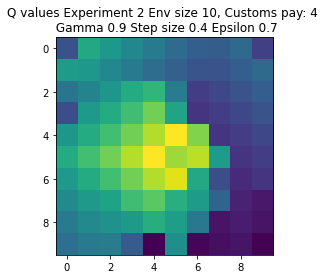

Expr:3 Eps:0 RunnAReward:-12.0 Reward:-236 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-269.0 Reward:-105 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-11.0 Reward:283 Timesteps:492 GotPack:True Utiltime:119 Customstime:253 Money:5
Expr:3 Eps:60 RunnAReward:129.0 Reward:146 Timesteps:100 GotPack:False Utiltime:35 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:87.0 Reward:16 Timesteps:200 GotPack:False Utiltime:102 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:74.0 Reward:-96 Timesteps:845 GotPack:True Utiltime:12 Customstime:180 Money:5
Expr:3 Eps:120 RunnAReward:250.0 Reward:647 Timesteps:312 GotPack:True Utiltime:40 Customstime:114 Money:5
Expr:3 Eps:140 RunnAReward:246.0 Reward:703 Timesteps:137 GotPack:True Utiltime:10 Customstime:76 Money:5
Expr:3 Eps:160 RunnAReward:310.0 Reward:560 Timesteps:327 GotPack:True Utiltime:25 Customstime:121 Money:4
Expr:3 Eps:180 RunnAReward:353.0 Reward:145 Time

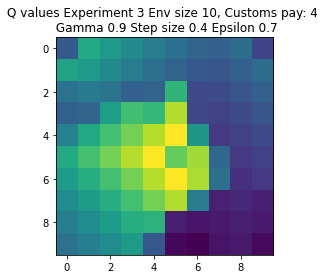

Expr:4 Eps:0 RunnAReward:-9.0 Reward:-166 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-164.0 Reward:-161 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-31.0 Reward:76 Timesteps:200 GotPack:False Utiltime:18 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-7.0 Reward:228 Timesteps:100 GotPack:False Utiltime:54 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:170.0 Reward:172 Timesteps:100 GotPack:False Utiltime:35 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:170.0 Reward:-168 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:94.0 Reward:160 Timesteps:100 GotPack:False Utiltime:68 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:237.0 Reward:176 Timesteps:100 GotPack:False Utiltime:46 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:136.0 Reward:41 Timesteps:200 GotPack:False Utiltime:33 Customstime:0 Money:3
Expr:4 Eps:180 RunnAReward:190.0 Reward:70 Timesteps:200

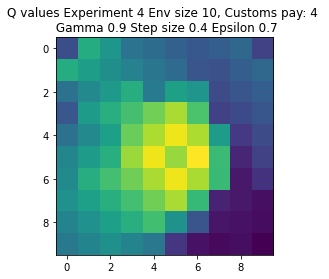

Expr:5 Eps:0 RunnAReward:-103.0 Reward:-2048 Timesteps:2271 GotPack:True Utiltime:998 Customstime:1241 Money:5
Expr:5 Eps:20 RunnAReward:-209.0 Reward:-381 Timesteps:993 GotPack:True Utiltime:812 Customstime:870 Money:5
Expr:5 Eps:40 RunnAReward:-13.0 Reward:166 Timesteps:100 GotPack:False Utiltime:13 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:30.0 Reward:126 Timesteps:200 GotPack:False Utiltime:131 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:91.0 Reward:-596 Timesteps:1020 GotPack:True Utiltime:869 Customstime:958 Money:4
Expr:5 Eps:100 RunnAReward:71.0 Reward:273 Timesteps:100 GotPack:False Utiltime:23 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:181.0 Reward:275 Timesteps:100 GotPack:False Utiltime:56 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:237.0 Reward:278 Timesteps:100 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:278.0 Reward:339 Timesteps:496 GotPack:True Utiltime:39 Customstime:301 Money:4
Expr:5 Eps:180 RunnAReward:235.0 Rewar

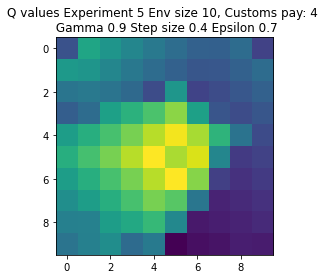

Expr:6 Eps:0 RunnAReward:-14.0 Reward:-265 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:20 RunnAReward:-180.0 Reward:-173 Timesteps:690 GotPack:True Utiltime:270 Customstime:410 Money:5
Expr:6 Eps:40 RunnAReward:-136.0 Reward:170 Timesteps:100 GotPack:False Utiltime:24 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:18.0 Reward:131 Timesteps:100 GotPack:False Utiltime:15 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:110.0 Reward:199 Timesteps:585 GotPack:True Utiltime:89 Customstime:436 Money:4
Expr:6 Eps:100 RunnAReward:196.0 Reward:699 Timesteps:196 GotPack:True Utiltime:100 Customstime:148 Money:5
Expr:6 Eps:120 RunnAReward:236.0 Reward:-148 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:207.0 Reward:86 Timesteps:200 GotPack:False Utiltime:92 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:295.0 Reward:220 Timesteps:100 GotPack:False Utiltime:34 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:350.0 Reward:549 Ti

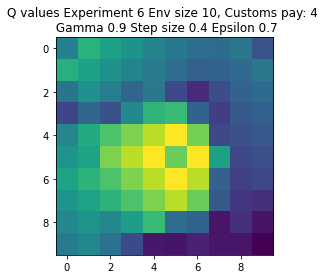

Expr:7 Eps:0 RunnAReward:11.0 Reward:229 Timesteps:100 GotPack:False Utiltime:91 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-237.0 Reward:-38 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-108.0 Reward:-62 Timesteps:200 GotPack:False Utiltime:9 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-52.0 Reward:168 Timesteps:100 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:78.0 Reward:-50 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:106.0 Reward:295 Timesteps:100 GotPack:False Utiltime:61 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:64.0 Reward:157 Timesteps:100 GotPack:False Utiltime:70 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:216.0 Reward:-158 Timesteps:400 GotPack:False Utiltime:99 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:216.0 Reward:148 Timesteps:200 GotPack:False Utiltime:52 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:241.0 Reward:25 Timesteps:30

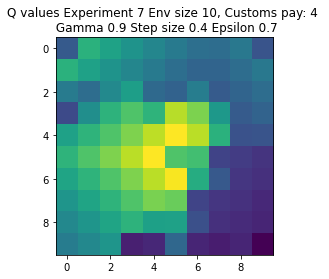

Expr:8 Eps:0 RunnAReward:-6.0 Reward:-118 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-227.0 Reward:-46 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-130.0 Reward:-418 Timesteps:1044 GotPack:True Utiltime:573 Customstime:668 Money:4
Expr:8 Eps:60 RunnAReward:-26.0 Reward:289 Timesteps:462 GotPack:True Utiltime:132 Customstime:298 Money:4
Expr:8 Eps:80 RunnAReward:43.0 Reward:-644 Timesteps:1212 GotPack:True Utiltime:212 Customstime:354 Money:5
Expr:8 Eps:100 RunnAReward:191.0 Reward:39 Timesteps:200 GotPack:False Utiltime:52 Customstime:0 Money:3
Expr:8 Eps:120 RunnAReward:220.0 Reward:242 Timesteps:100 GotPack:False Utiltime:91 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:222.0 Reward:259 Timesteps:100 GotPack:False Utiltime:37 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:222.0 Reward:818 Timesteps:157 GotPack:True Utiltime:55 Customstime:121 Money:5
Expr:8 Eps:180 RunnAReward:375.0 Reward:851

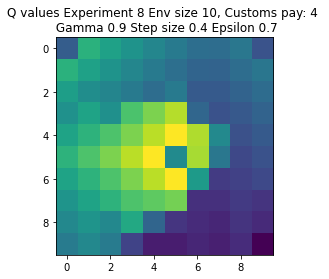

Expr:9 Eps:0 RunnAReward:-6.0 Reward:-110 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-355.0 Reward:-261 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-161.0 Reward:-122 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:9.0 Reward:-63 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:223.0 Reward:133 Timesteps:200 GotPack:False Utiltime:19 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:105.0 Reward:604 Timesteps:305 GotPack:True Utiltime:115 Customstime:207 Money:5
Expr:9 Eps:120 RunnAReward:135.0 Reward:-9 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:92.0 Reward:262 Timesteps:100 GotPack:False Utiltime:53 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:256.0 Reward:136 Timesteps:200 GotPack:False Utiltime:56 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:342.0 Reward:523 Timesteps:4

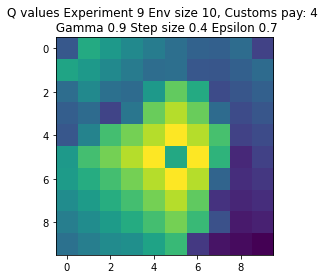

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.9 Step size 0.4 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:5.0 Reward:108 Timesteps:610 GotPack:True Utiltime:399 Customstime:528 Money:3
Expr:0 Eps:20 RunnAReward:-494.0 Reward:-338 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-309.0 Reward:46 Timesteps:200 GotPack:False Utiltime:139 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-265.0 Reward:143 Timesteps:200 GotPack:False Utiltime:29 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-12.0 Reward:105 Timesteps:200 GotPack:False Utiltime:138 Customstime:0 Money:1
Expr:0 Eps:100 RunnAReward:133.0 Reward:178 Timesteps:200 GotPack:False Utiltime:168 Customstime:0 Money:1
Expr:0 Eps:120 RunnAReward:93.0 Reward:301 Timesteps:455 GotPack:True Utiltime:11 Customstim

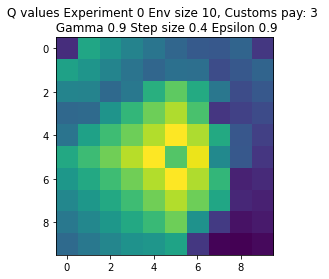

Expr:1 Eps:0 RunnAReward:-25.0 Reward:-494 Timesteps:1106 GotPack:True Utiltime:281 Customstime:441 Money:3
Expr:1 Eps:20 RunnAReward:-350.0 Reward:-8 Timesteps:622 GotPack:True Utiltime:399 Customstime:450 Money:3
Expr:1 Eps:40 RunnAReward:-399.0 Reward:-246 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:60 RunnAReward:-201.0 Reward:9 Timesteps:300 GotPack:False Utiltime:200 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:-217.0 Reward:77 Timesteps:200 GotPack:False Utiltime:165 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:45.0 Reward:-120 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:27.0 Reward:-204 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:42.0 Reward:-34 Timesteps:300 GotPack:False Utiltime:6 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:162.0 Reward:419 Timesteps:420 GotPack:True Utiltime:51 Customstime:198 Money:4
Expr:1 Eps:180 RunnAReward:179.0 Reward:69 Time

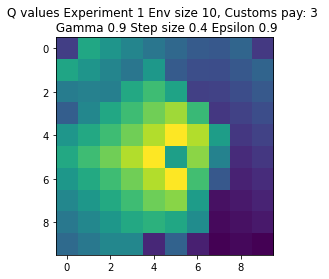

Expr:2 Eps:0 RunnAReward:-18.0 Reward:-341 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-315.0 Reward:-199 Timesteps:904 GotPack:True Utiltime:421 Customstime:739 Money:3
Expr:2 Eps:40 RunnAReward:-150.0 Reward:148 Timesteps:200 GotPack:False Utiltime:109 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-147.0 Reward:282 Timesteps:417 GotPack:True Utiltime:180 Customstime:380 Money:4
Expr:2 Eps:80 RunnAReward:62.0 Reward:34 Timesteps:706 GotPack:True Utiltime:444 Customstime:535 Money:3
Expr:2 Eps:100 RunnAReward:145.0 Reward:123 Timesteps:200 GotPack:False Utiltime:61 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:16.0 Reward:-257 Timesteps:400 GotPack:False Utiltime:48 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:73.0 Reward:123 Timesteps:200 GotPack:False Utiltime:19 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:106.0 Reward:-4 Timesteps:300 GotPack:False Utiltime:35 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:187.0 Reward:434 T

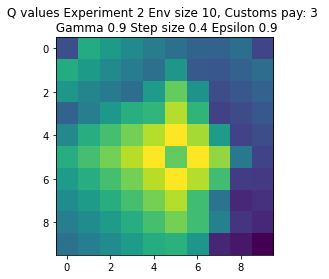

Expr:3 Eps:0 RunnAReward:-15.0 Reward:-299 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-393.0 Reward:-93 Timesteps:787 GotPack:True Utiltime:433 Customstime:749 Money:3
Expr:3 Eps:40 RunnAReward:-43.0 Reward:-229 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-216.0 Reward:-385 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:-185.0 Reward:4 Timesteps:300 GotPack:False Utiltime:232 Customstime:0 Money:1
Expr:3 Eps:100 RunnAReward:-37.0 Reward:-296 Timesteps:878 GotPack:True Utiltime:383 Customstime:689 Money:5
Expr:3 Eps:120 RunnAReward:-73.0 Reward:-512 Timesteps:1048 GotPack:True Utiltime:46 Customstime:659 Money:3
Expr:3 Eps:140 RunnAReward:173.0 Reward:-460 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:64.0 Reward:-282 Timesteps:500 GotPack:False Utiltime:110 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:269.0 Reward:4

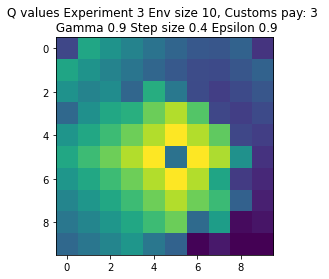

Expr:4 Eps:0 RunnAReward:1.0 Reward:32 Timesteps:200 GotPack:False Utiltime:104 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-256.0 Reward:-97 Timesteps:300 GotPack:False Utiltime:81 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-255.0 Reward:-162 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:60 RunnAReward:-247.0 Reward:13 Timesteps:300 GotPack:False Utiltime:142 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-369.0 Reward:576 Timesteps:323 GotPack:True Utiltime:16 Customstime:128 Money:5
Expr:4 Eps:100 RunnAReward:-3.0 Reward:65 Timesteps:200 GotPack:False Utiltime:148 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:69.0 Reward:406 Timesteps:471 GotPack:True Utiltime:74 Customstime:151 Money:3
Expr:4 Eps:140 RunnAReward:59.0 Reward:130 Timesteps:200 GotPack:False Utiltime:108 Customstime:0 Money:1
Expr:4 Eps:160 RunnAReward:99.0 Reward:83 Timesteps:200 GotPack:False Utiltime:148 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:271.0 Reward:23 Timestep

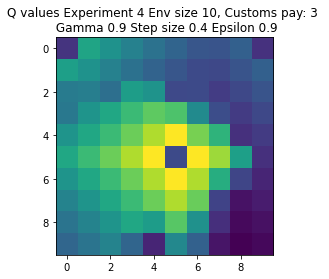

Expr:5 Eps:0 RunnAReward:-18.0 Reward:-351 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-209.0 Reward:-415 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-420.0 Reward:308 Timesteps:425 GotPack:True Utiltime:86 Customstime:167 Money:4
Expr:5 Eps:60 RunnAReward:-47.0 Reward:365 Timesteps:461 GotPack:True Utiltime:308 Customstime:443 Money:5
Expr:5 Eps:80 RunnAReward:-137.0 Reward:98 Timesteps:200 GotPack:False Utiltime:137 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-9.0 Reward:-171 Timesteps:911 GotPack:True Utiltime:10 Customstime:184 Money:5
Expr:5 Eps:120 RunnAReward:98.0 Reward:537 Timesteps:380 GotPack:True Utiltime:86 Customstime:274 Money:3
Expr:5 Eps:140 RunnAReward:164.0 Reward:401 Timesteps:328 GotPack:True Utiltime:97 Customstime:183 Money:3
Expr:5 Eps:160 RunnAReward:274.0 Reward:706 Timesteps:230 GotPack:True Utiltime:47 Customstime:206 Money:4
Expr:5 Eps:180 RunnAReward:325.0 Reward:227

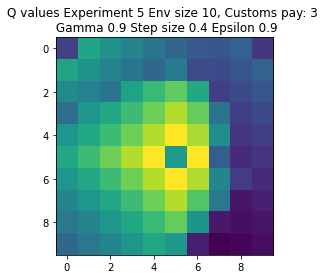

Expr:6 Eps:0 RunnAReward:-119.0 Reward:-2369 Timesteps:2370 GotPack:True Utiltime:2064 Customstime:2201 Money:3
Expr:6 Eps:20 RunnAReward:-393.0 Reward:-168 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-188.0 Reward:-415 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-56.0 Reward:-198 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-369.0 Reward:-403 Timesteps:600 GotPack:False Utiltime:105 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:15.0 Reward:-282 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-25.0 Reward:-223 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:44.0 Reward:120 Timesteps:200 GotPack:False Utiltime:28 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:119.0 Reward:17 Timesteps:200 GotPack:False Utiltime:97 Customstime:0 Money:1
Expr:6 Eps:180 RunnAReward:95.0 Reward:172

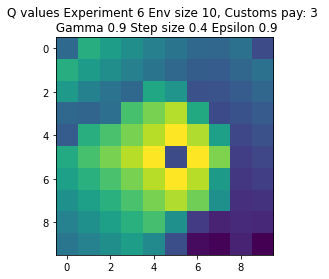

Expr:7 Eps:0 RunnAReward:-75.0 Reward:-1495 Timesteps:1789 GotPack:True Utiltime:1078 Customstime:1414 Money:5
Expr:7 Eps:20 RunnAReward:-433.0 Reward:-219 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-431.0 Reward:82 Timesteps:200 GotPack:False Utiltime:130 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-289.0 Reward:-461 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-29.0 Reward:561 Timesteps:329 GotPack:True Utiltime:144 Customstime:234 Money:3
Expr:7 Eps:100 RunnAReward:48.0 Reward:591 Timesteps:355 GotPack:True Utiltime:227 Customstime:285 Money:4
Expr:7 Eps:120 RunnAReward:33.0 Reward:622 Timesteps:297 GotPack:True Utiltime:107 Customstime:201 Money:3
Expr:7 Eps:140 RunnAReward:183.0 Reward:129 Timesteps:200 GotPack:False Utiltime:71 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:100.0 Reward:-187 Timesteps:400 GotPack:False Utiltime:45 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:284.0 Rewa

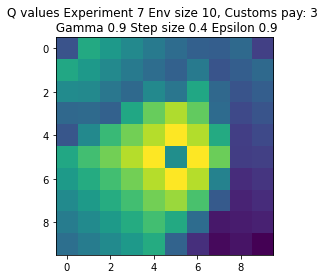

Expr:8 Eps:0 RunnAReward:-14.0 Reward:-279 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:20 RunnAReward:-627.0 Reward:-364 Timesteps:1067 GotPack:True Utiltime:753 Customstime:826 Money:3
Expr:8 Eps:40 RunnAReward:-91.0 Reward:-153 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-343.0 Reward:63 Timesteps:200 GotPack:False Utiltime:171 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:43.0 Reward:-488 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:100 RunnAReward:-103.0 Reward:-254 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-65.0 Reward:51 Timesteps:200 GotPack:False Utiltime:85 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:143.0 Reward:-40 Timesteps:400 GotPack:False Utiltime:83 Customstime:0 Money:1
Expr:8 Eps:160 RunnAReward:110.0 Reward:35 Timesteps:621 GotPack:True Utiltime:272 Customstime:433 Money:3
Expr:8 Eps:180 RunnAReward:249.0 Reward:762 Ti

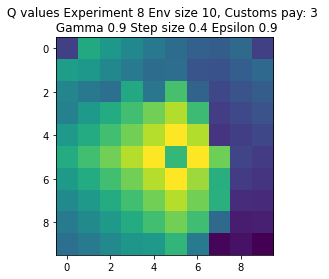

Expr:9 Eps:0 RunnAReward:-15.0 Reward:-298 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-582.0 Reward:-1518 Timesteps:1795 GotPack:True Utiltime:1455 Customstime:1774 Money:4
Expr:9 Eps:40 RunnAReward:-502.0 Reward:-145 Timesteps:300 GotPack:False Utiltime:58 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-56.0 Reward:74 Timesteps:200 GotPack:False Utiltime:182 Customstime:0 Money:1
Expr:9 Eps:80 RunnAReward:10.0 Reward:-244 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:100 RunnAReward:-8.0 Reward:152 Timesteps:614 GotPack:True Utiltime:78 Customstime:280 Money:3
Expr:9 Eps:120 RunnAReward:61.0 Reward:375 Timesteps:393 GotPack:True Utiltime:128 Customstime:255 Money:4
Expr:9 Eps:140 RunnAReward:136.0 Reward:-65 Timesteps:200 GotPack:False Utiltime:94 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:152.0 Reward:-53 Timesteps:300 GotPack:False Utiltime:173 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:436.0 Reward:4

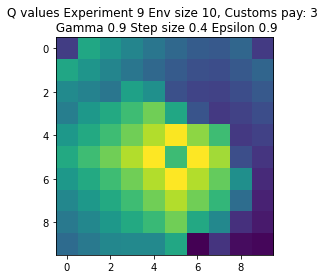

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.9 Step size 0.4 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-1.0 Reward:-15 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-457.0 Reward:-223 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-175.0 Reward:-561 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-196.0 Reward:-151 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:80 RunnAReward:-137.0 Reward:-65 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-129.0 Reward:-194 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:-64.0 Reward:-208 Timesteps:300 GotPack:False Utiltime:7 Customstime

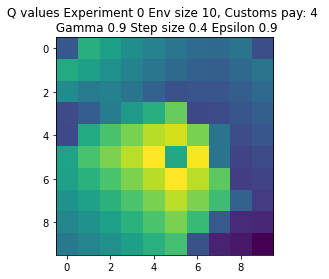

Expr:1 Eps:0 RunnAReward:-8.0 Reward:-158 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-463.0 Reward:-202 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-132.0 Reward:-42 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-46.0 Reward:85 Timesteps:200 GotPack:False Utiltime:92 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:-147.0 Reward:-108 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-1.0 Reward:-201 Timesteps:400 GotPack:False Utiltime:46 Customstime:0 Money:3
Expr:1 Eps:120 RunnAReward:-33.0 Reward:-361 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:11.0 Reward:-241 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:-5.0 Reward:41 Timesteps:200 GotPack:False Utiltime:77 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:64.0 Reward:86 Timesteps:200

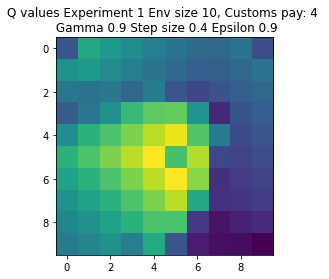

Expr:2 Eps:0 RunnAReward:-11.0 Reward:-201 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-79.0 Reward:-124 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-206.0 Reward:210 Timesteps:602 GotPack:True Utiltime:455 Customstime:575 Money:4
Expr:2 Eps:60 RunnAReward:-133.0 Reward:233 Timesteps:602 GotPack:True Utiltime:507 Customstime:585 Money:4
Expr:2 Eps:80 RunnAReward:-83.0 Reward:142 Timesteps:100 GotPack:False Utiltime:60 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:74.0 Reward:599 Timesteps:216 GotPack:True Utiltime:65 Customstime:202 Money:5
Expr:2 Eps:120 RunnAReward:99.0 Reward:-53 Timesteps:300 GotPack:False Utiltime:84 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:44.0 Reward:-581 Timesteps:1067 GotPack:True Utiltime:111 Customstime:537 Money:4
Expr:2 Eps:160 RunnAReward:37.0 Reward:146 Timesteps:100 GotPack:False Utiltime:91 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:73.0 Reward:-142 T

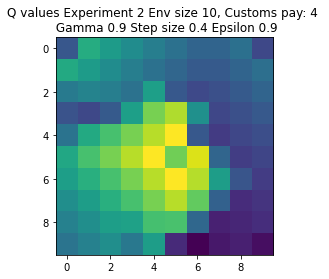

Expr:3 Eps:0 RunnAReward:-4.0 Reward:-71 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-159.0 Reward:104 Timesteps:200 GotPack:False Utiltime:192 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-280.0 Reward:-92 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-21.0 Reward:77 Timesteps:200 GotPack:False Utiltime:40 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:-45.0 Reward:140 Timesteps:200 GotPack:False Utiltime:91 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:-21.0 Reward:20 Timesteps:200 GotPack:False Utiltime:11 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:43.0 Reward:-79 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:9.0 Reward:-49 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:46.0 Reward:190 Timesteps:100 GotPack:False Utiltime:68 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:107.0 Reward:-41 Timesteps:100 Go

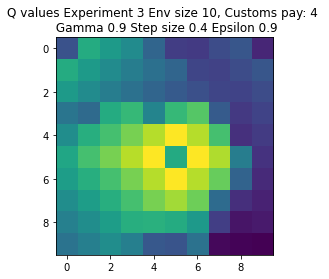

Expr:4 Eps:0 RunnAReward:-5.0 Reward:-91 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-162.0 Reward:-41 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-110.0 Reward:-5 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-254.0 Reward:-52 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-68.0 Reward:-93 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:30.0 Reward:-154 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-68.0 Reward:-151 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:57.0 Reward:221 Timesteps:514 GotPack:True Utiltime:8 Customstime:118 Money:5
Expr:4 Eps:160 RunnAReward:44.0 Reward:199 Timesteps:584 GotPack:True Utiltime:156 Customstime:296 Money:5
Expr:4 Eps:180 RunnAReward:137.0 Reward:375 Timesteps:478

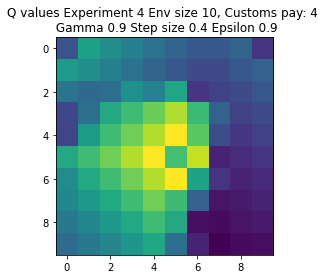

Expr:5 Eps:0 RunnAReward:-8.0 Reward:-158 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-305.0 Reward:-2668 Timesteps:2754 GotPack:True Utiltime:911 Customstime:956 Money:5
Expr:5 Eps:40 RunnAReward:-369.0 Reward:-801 Timesteps:1239 GotPack:True Utiltime:314 Customstime:950 Money:5
Expr:5 Eps:60 RunnAReward:-163.0 Reward:-1392 Timesteps:1713 GotPack:True Utiltime:1313 Customstime:1671 Money:5
Expr:5 Eps:80 RunnAReward:-115.0 Reward:274 Timesteps:100 GotPack:False Utiltime:50 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:35.0 Reward:-47 Timesteps:781 GotPack:True Utiltime:159 Customstime:382 Money:4
Expr:5 Eps:120 RunnAReward:28.0 Reward:160 Timesteps:200 GotPack:False Utiltime:52 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:-94.0 Reward:148 Timesteps:200 GotPack:False Utiltime:28 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:196.0 Reward:465 Timesteps:413 GotPack:True Utiltime:99 Customstime:252 Money:5
Expr:5 Eps:180 RunnAReward:213.0

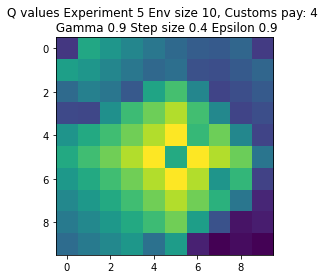

Expr:6 Eps:0 RunnAReward:-43.0 Reward:-843 Timesteps:1311 GotPack:True Utiltime:1 Customstime:111 Money:5
Expr:6 Eps:20 RunnAReward:-311.0 Reward:-298 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-88.0 Reward:161 Timesteps:100 GotPack:False Utiltime:8 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-58.0 Reward:-37 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-11.0 Reward:98 Timesteps:100 GotPack:False Utiltime:9 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-42.0 Reward:398 Timesteps:444 GotPack:True Utiltime:330 Customstime:426 Money:5
Expr:6 Eps:120 RunnAReward:45.0 Reward:237 Timesteps:533 GotPack:True Utiltime:365 Customstime:400 Money:5
Expr:6 Eps:140 RunnAReward:113.0 Reward:-25 Timesteps:200 GotPack:False Utiltime:153 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:143.0 Reward:120 Timesteps:200 GotPack:False Utiltime:63 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:100.0 Reward:17 Timest

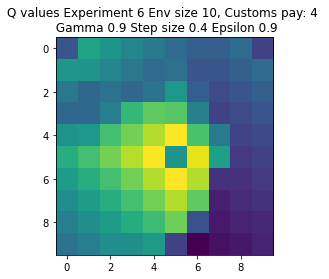

Expr:7 Eps:0 RunnAReward:-1.0 Reward:-10 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-333.0 Reward:-146 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-276.0 Reward:-120 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-71.0 Reward:235 Timesteps:100 GotPack:False Utiltime:53 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:9.0 Reward:-53 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-107.0 Reward:-5 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:91.0 Reward:127 Timesteps:200 GotPack:False Utiltime:81 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:86.0 Reward:257 Timesteps:100 GotPack:False Utiltime:70 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:93.0 Reward:256 Timesteps:100 GotPack:False Utiltime:83 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:161.0 Reward:-65 Timesteps:100 G

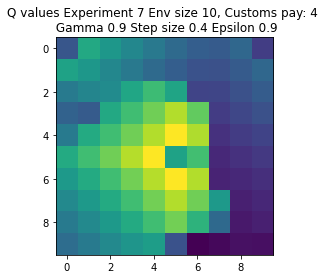

Expr:8 Eps:0 RunnAReward:-8.0 Reward:-157 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-195.0 Reward:-569 Timesteps:1035 GotPack:True Utiltime:51 Customstime:506 Money:4
Expr:8 Eps:40 RunnAReward:-264.0 Reward:-288 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-138.0 Reward:434 Timesteps:427 GotPack:True Utiltime:12 Customstime:237 Money:5
Expr:8 Eps:80 RunnAReward:-54.0 Reward:-39 Timesteps:719 GotPack:True Utiltime:549 Customstime:687 Money:5
Expr:8 Eps:100 RunnAReward:43.0 Reward:-25 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:48.0 Reward:48 Timesteps:200 GotPack:False Utiltime:28 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:113.0 Reward:188 Timesteps:100 GotPack:False Utiltime:32 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:0.0 Reward:-23 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:106.0 Reward:6 Timesteps

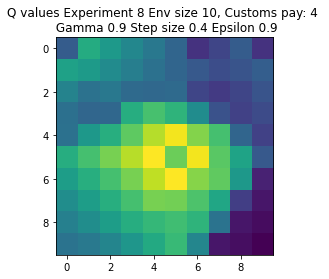

Expr:9 Eps:0 RunnAReward:-15.0 Reward:-290 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-317.0 Reward:-416 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-189.0 Reward:-77 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-92.0 Reward:346 Timesteps:448 GotPack:True Utiltime:82 Customstime:292 Money:5
Expr:9 Eps:80 RunnAReward:-3.0 Reward:-81 Timesteps:200 GotPack:False Utiltime:29 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:16.0 Reward:-14 Timesteps:200 GotPack:False Utiltime:93 Customstime:0 Money:3
Expr:9 Eps:120 RunnAReward:2.0 Reward:162 Timesteps:100 GotPack:False Utiltime:71 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-12.0 Reward:168 Timesteps:200 GotPack:False Utiltime:45 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:135.0 Reward:685 Timesteps:247 GotPack:True Utiltime:32 Customstime:158 Money:4
Expr:9 Eps:180 RunnAReward:100.0 Reward:643 Timesteps

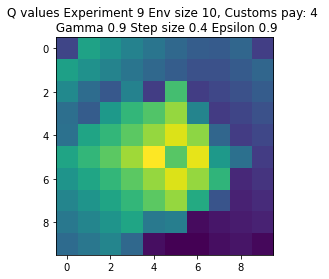

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.9 Step size 0.4 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-28.0 Reward:-554 Timesteps:1071 GotPack:True Utiltime:875 Customstime:1053 Money:3
Expr:0 Eps:20 RunnAReward:-637.0 Reward:-350 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-522.0 Reward:-258 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-451.0 Reward:-721 Timesteps:1335 GotPack:True Utiltime:740 Customstime:1169 Money:3
Expr:0 Eps:80 RunnAReward:-259.0 Reward:3 Timesteps:200 GotPack:False Utiltime:23 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-64.0 Reward:-2 Timesteps:200 GotPack:False Utiltime:103 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:-83.0 Reward:-41 Timesteps:200 GotPack:False Utiltime:165 

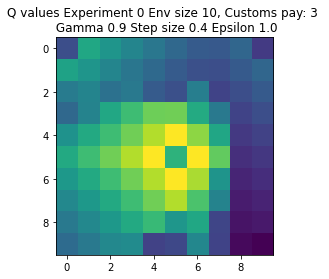

Expr:1 Eps:0 RunnAReward:4.0 Reward:85 Timesteps:200 GotPack:False Utiltime:104 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-406.0 Reward:11 Timesteps:200 GotPack:False Utiltime:8 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-440.0 Reward:-2109 Timesteps:2430 GotPack:True Utiltime:210 Customstime:347 Money:3
Expr:1 Eps:60 RunnAReward:-499.0 Reward:-609 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:-268.0 Reward:25 Timesteps:200 GotPack:False Utiltime:196 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-242.0 Reward:-369 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:-236.0 Reward:-954 Timesteps:1398 GotPack:True Utiltime:94 Customstime:317 Money:4
Expr:1 Eps:140 RunnAReward:-163.0 Reward:137 Timesteps:200 GotPack:False Utiltime:117 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:48.0 Reward:192 Timesteps:535 GotPack:True Utiltime:95 Customstime:486 Money:5
Expr:1 Eps:180 RunnAReward:67.0 Reward:6

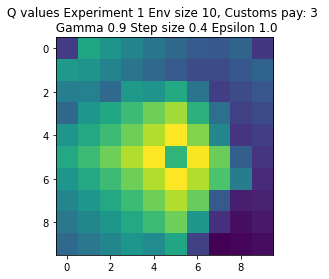

Expr:2 Eps:0 RunnAReward:-53.0 Reward:-1054 Timesteps:1373 GotPack:True Utiltime:1176 Customstime:1357 Money:3
Expr:2 Eps:20 RunnAReward:-622.0 Reward:-320 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-477.0 Reward:-1349 Timesteps:1651 GotPack:True Utiltime:1023 Customstime:1537 Money:3
Expr:2 Eps:60 RunnAReward:-351.0 Reward:-344 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:-317.0 Reward:359 Timesteps:447 GotPack:True Utiltime:211 Customstime:373 Money:3
Expr:2 Eps:100 RunnAReward:-155.0 Reward:143 Timesteps:599 GotPack:True Utiltime:140 Customstime:310 Money:4
Expr:2 Eps:120 RunnAReward:-173.0 Reward:-53 Timesteps:200 GotPack:False Utiltime:69 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-22.0 Reward:-134 Timesteps:300 GotPack:False Utiltime:128 Customstime:0 Money:1
Expr:2 Eps:160 RunnAReward:4.0 Reward:754 Timesteps:136 GotPack:True Utiltime:15 Customstime:76 Money:5
Expr:2 Eps:180 RunnAReward:3

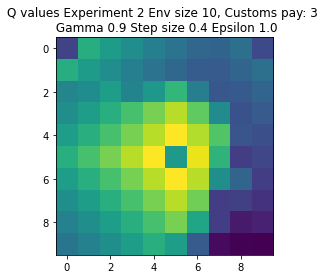

Expr:3 Eps:0 RunnAReward:-21.0 Reward:-418 Timesteps:962 GotPack:True Utiltime:165 Customstime:645 Money:3
Expr:3 Eps:20 RunnAReward:-430.0 Reward:230 Timesteps:488 GotPack:True Utiltime:215 Customstime:324 Money:4
Expr:3 Eps:40 RunnAReward:-387.0 Reward:-107 Timesteps:300 GotPack:False Utiltime:34 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-347.0 Reward:-14 Timesteps:200 GotPack:False Utiltime:199 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-220.0 Reward:215 Timesteps:615 GotPack:True Utiltime:143 Customstime:504 Money:5
Expr:3 Eps:100 RunnAReward:-130.0 Reward:156 Timesteps:200 GotPack:False Utiltime:8 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-64.0 Reward:425 Timesteps:284 GotPack:True Utiltime:151 Customstime:207 Money:4
Expr:3 Eps:140 RunnAReward:-94.0 Reward:-215 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:23.0 Reward:393 Timesteps:371 GotPack:True Utiltime:105 Customstime:334 Money:3
Expr:3 Eps:180 RunnAReward:99.0 Rewa

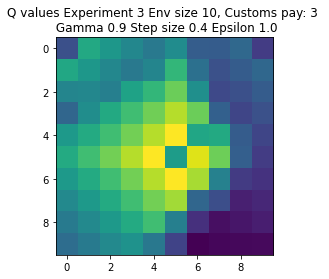

Expr:4 Eps:0 RunnAReward:-97.0 Reward:-1940 Timesteps:2343 GotPack:True Utiltime:1722 Customstime:1965 Money:4
Expr:4 Eps:20 RunnAReward:-655.0 Reward:-331 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-680.0 Reward:-2640 Timesteps:2736 GotPack:True Utiltime:563 Customstime:1066 Money:3
Expr:4 Eps:60 RunnAReward:-368.0 Reward:14 Timesteps:200 GotPack:False Utiltime:28 Customstime:0 Money:1
Expr:4 Eps:80 RunnAReward:-226.0 Reward:-151 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-218.0 Reward:-161 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-21.0 Reward:52 Timesteps:200 GotPack:False Utiltime:83 Customstime:0 Money:1
Expr:4 Eps:140 RunnAReward:-75.0 Reward:66 Timesteps:200 GotPack:False Utiltime:89 Customstime:0 Money:1
Expr:4 Eps:160 RunnAReward:-41.0 Reward:-198 Timesteps:400 GotPack:False Utiltime:341 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:-48.0 Re

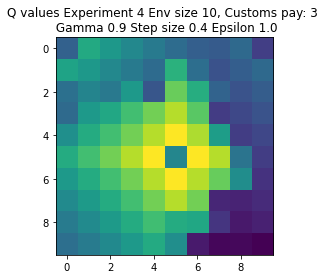

Expr:5 Eps:0 RunnAReward:-13.0 Reward:-246 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-394.0 Reward:-197 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-307.0 Reward:-233 Timesteps:936 GotPack:True Utiltime:312 Customstime:471 Money:5
Expr:5 Eps:60 RunnAReward:-172.0 Reward:-263 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-432.0 Reward:-451 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:100 RunnAReward:-332.0 Reward:-192 Timesteps:400 GotPack:False Utiltime:218 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:-141.0 Reward:-68 Timesteps:300 GotPack:False Utiltime:40 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:-166.0 Reward:66 Timesteps:200 GotPack:False Utiltime:72 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:123.0 Reward:-473 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:180 RunnAReward:15.0 Reward:17

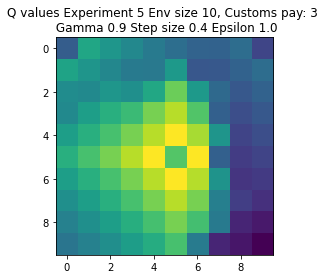

Expr:6 Eps:0 RunnAReward:-16.0 Reward:-307 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-533.0 Reward:-256 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-394.0 Reward:-285 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:60 RunnAReward:-590.0 Reward:-88 Timesteps:200 GotPack:False Utiltime:95 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-385.0 Reward:-290 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:100 RunnAReward:-68.0 Reward:-502 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:-168.0 Reward:87 Timesteps:200 GotPack:False Utiltime:98 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:22.0 Reward:148 Timesteps:200 GotPack:False Utiltime:24 Customstime:0 Money:1
Expr:6 Eps:160 RunnAReward:-4.0 Reward:-186 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:56.0 Reward:-120 Timest

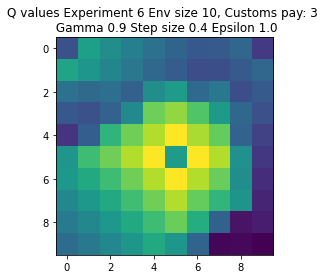

Expr:7 Eps:0 RunnAReward:-7.0 Reward:-123 Timesteps:300 GotPack:False Utiltime:228 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-358.0 Reward:-191 Timesteps:300 GotPack:False Utiltime:281 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-415.0 Reward:-130 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:60 RunnAReward:-329.0 Reward:-359 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-292.0 Reward:-128 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:100 RunnAReward:-187.0 Reward:34 Timesteps:200 GotPack:False Utiltime:144 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-10.0 Reward:-196 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-41.0 Reward:70 Timesteps:200 GotPack:False Utiltime:157 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:-28.0 Reward:-152 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:86.0 Reward:53 Ti

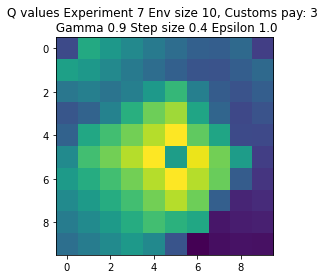

Expr:8 Eps:0 RunnAReward:-22.0 Reward:-432 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-657.0 Reward:-259 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-627.0 Reward:-142 Timesteps:200 GotPack:False Utiltime:95 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-517.0 Reward:63 Timesteps:200 GotPack:False Utiltime:151 Customstime:0 Money:1
Expr:8 Eps:80 RunnAReward:-312.0 Reward:-324 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-212.0 Reward:63 Timesteps:618 GotPack:True Utiltime:182 Customstime:429 Money:5
Expr:8 Eps:120 RunnAReward:-46.0 Reward:163 Timesteps:200 GotPack:False Utiltime:21 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:-61.0 Reward:487 Timesteps:401 GotPack:True Utiltime:18 Customstime:205 Money:4
Expr:8 Eps:160 RunnAReward:78.0 Reward:-686 Timesteps:1379 GotPack:True Utiltime:152 Customstime:310 Money:4
Expr:8 Eps:180 RunnAReward:-28.0 Reward:5

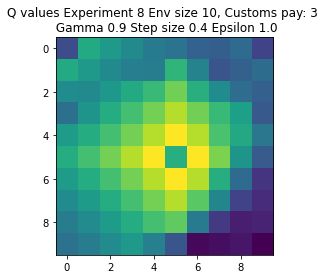

Expr:9 Eps:0 RunnAReward:3.0 Reward:78 Timesteps:200 GotPack:False Utiltime:183 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-428.0 Reward:-161 Timesteps:300 GotPack:False Utiltime:197 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-381.0 Reward:-145 Timesteps:300 GotPack:False Utiltime:40 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-346.0 Reward:-368 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-292.0 Reward:-1235 Timesteps:1596 GotPack:True Utiltime:135 Customstime:523 Money:4
Expr:9 Eps:100 RunnAReward:-243.0 Reward:-408 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:-159.0 Reward:44 Timesteps:200 GotPack:False Utiltime:55 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:-61.0 Reward:-403 Timesteps:1121 GotPack:True Utiltime:308 Customstime:342 Money:3
Expr:9 Eps:160 RunnAReward:58.0 Reward:81 Timesteps:200 GotPack:False Utiltime:132 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:43.0 Reward

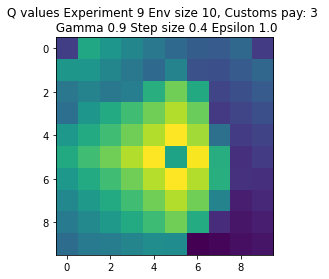

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.9 Step size 0.4 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-8.0 Reward:-146 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-558.0 Reward:-215 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:40 RunnAReward:-205.0 Reward:-167 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-128.0 Reward:185 Timesteps:100 GotPack:False Utiltime:68 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-116.0 Reward:-260 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:100 RunnAReward:-59.0 Reward:-180 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:-100.0 Reward:-10 Timesteps:100 GotPack:False Utiltime:0 Customstim

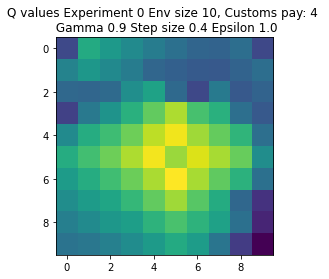

Expr:1 Eps:0 RunnAReward:-58.0 Reward:-1145 Timesteps:1312 GotPack:True Utiltime:761 Customstime:1003 Money:5
Expr:1 Eps:20 RunnAReward:-480.0 Reward:-265 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-253.0 Reward:-161 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-113.0 Reward:-242 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-115.0 Reward:-256 Timesteps:893 GotPack:True Utiltime:289 Customstime:329 Money:5
Expr:1 Eps:100 RunnAReward:-368.0 Reward:6 Timesteps:200 GotPack:False Utiltime:73 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:-113.0 Reward:-237 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:20.0 Reward:190 Timesteps:100 GotPack:False Utiltime:91 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:-85.0 Reward:-271 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:56.0 Reward:2

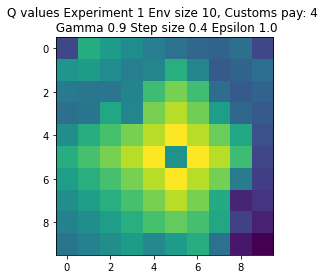

Expr:2 Eps:0 RunnAReward:-12.0 Reward:-225 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-114.0 Reward:-10 Timesteps:200 GotPack:False Utiltime:29 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-423.0 Reward:-515 Timesteps:1142 GotPack:True Utiltime:419 Customstime:462 Money:5
Expr:2 Eps:60 RunnAReward:-237.0 Reward:-122 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-242.0 Reward:-164 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-179.0 Reward:-186 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-26.0 Reward:-156 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:21.0 Reward:-16 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:-131.0 Reward:241 Timesteps:100 GotPack:False Utiltime:66 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:34.0 Reward:-116 

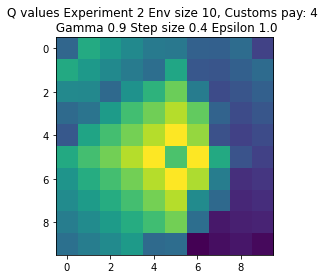

Expr:3 Eps:0 RunnAReward:-7.0 Reward:-122 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-223.0 Reward:-131 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-347.0 Reward:-30 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-262.0 Reward:-134 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-121.0 Reward:-254 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:100 RunnAReward:-200.0 Reward:58 Timesteps:200 GotPack:False Utiltime:168 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-49.0 Reward:-53 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:21.0 Reward:531 Timesteps:317 GotPack:True Utiltime:115 Customstime:171 Money:5
Expr:3 Eps:160 RunnAReward:27.0 Reward:195 Timesteps:100 GotPack:False Utiltime:60 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:61.0 Reward:656 Timeste

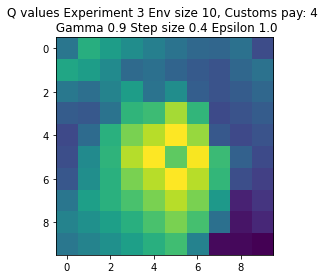

Expr:4 Eps:0 RunnAReward:-7.0 Reward:-130 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-424.0 Reward:-311 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-309.0 Reward:-28 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-129.0 Reward:-120 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-148.0 Reward:-93 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-119.0 Reward:-28 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-170.0 Reward:-136 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:-8.0 Reward:-72 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:-35.0 Reward:-94 Timesteps:300 GotPack:False Utiltime:201 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:24.0 Reward:-110 Timeste

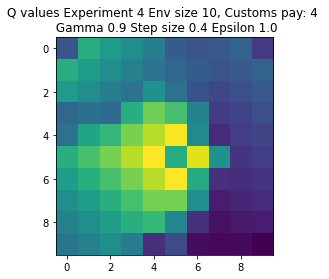

Expr:5 Eps:0 RunnAReward:-6.0 Reward:-102 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-443.0 Reward:-195 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-165.0 Reward:-232 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-494.0 Reward:-45 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-341.0 Reward:-21 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-97.0 Reward:-13 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-61.0 Reward:-35 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:-111.0 Reward:166 Timesteps:100 GotPack:False Utiltime:76 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:-24.0 Reward:-133 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:75.0 Reward:115 Timesteps

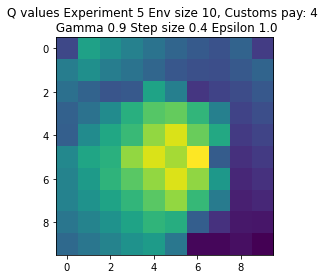

Expr:6 Eps:0 RunnAReward:-23.0 Reward:-450 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:20 RunnAReward:-307.0 Reward:-303 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-128.0 Reward:-179 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-235.0 Reward:-49 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-251.0 Reward:-340 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:-160.0 Reward:-903 Timesteps:1514 GotPack:True Utiltime:341 Customstime:443 Money:5
Expr:6 Eps:120 RunnAReward:-27.0 Reward:-104 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:-122.0 Reward:558 Timesteps:279 GotPack:True Utiltime:64 Customstime:229 Money:5
Expr:6 Eps:160 RunnAReward:95.0 Reward:190 Timesteps:100 GotPack:False Utiltime:79 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:17.0 Reward:-119

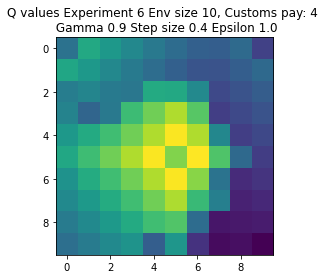

Expr:7 Eps:0 RunnAReward:-5.0 Reward:-85 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-190.0 Reward:133 Timesteps:100 GotPack:False Utiltime:61 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-347.0 Reward:-2081 Timesteps:2322 GotPack:True Utiltime:1852 Customstime:2107 Money:5
Expr:7 Eps:60 RunnAReward:-348.0 Reward:-322 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:80 RunnAReward:-238.0 Reward:33 Timesteps:200 GotPack:False Utiltime:53 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:-114.0 Reward:-39 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-102.0 Reward:-65 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:41.0 Reward:-112 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:52.0 Reward:-213 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:5.0 Reward:-135 Tim

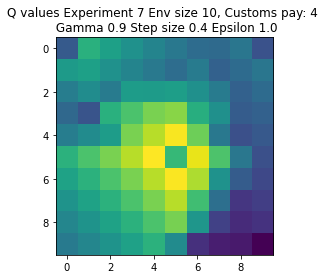

Expr:8 Eps:0 RunnAReward:-3.0 Reward:-46 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-186.0 Reward:-269 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-400.0 Reward:-362 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-306.0 Reward:-215 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-173.0 Reward:-68 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-273.0 Reward:-142 Timesteps:839 GotPack:True Utiltime:279 Customstime:360 Money:5
Expr:8 Eps:120 RunnAReward:-86.0 Reward:-83 Timesteps:300 GotPack:False Utiltime:3 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:41.0 Reward:253 Timesteps:100 GotPack:False Utiltime:86 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:31.0 Reward:-108 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:-51.0 Reward:200 Timest

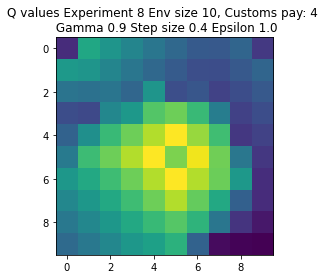

Expr:9 Eps:0 RunnAReward:-3.0 Reward:-60 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-341.0 Reward:-148 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:9 Eps:40 RunnAReward:-326.0 Reward:-120 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-224.0 Reward:-2976 Timesteps:2924 GotPack:True Utiltime:993 Customstime:1193 Money:5
Expr:9 Eps:80 RunnAReward:-198.0 Reward:10 Timesteps:200 GotPack:False Utiltime:104 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:-146.0 Reward:-78 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-77.0 Reward:-134 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-29.0 Reward:-20 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:-60.0 Reward:-507 Timesteps:1119 GotPack:True Utiltime:30 Customstime:219 Money:5
Expr:9 Eps:180 RunnAReward:-74.0 Reward:17

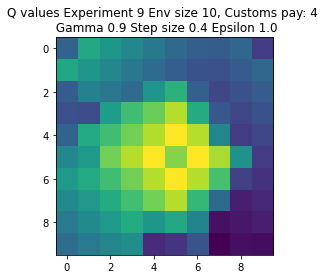

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.9 Step size 0.5 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-14.0 Reward:-265 Timesteps:400 GotPack:False Utiltime:15 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-422.0 Reward:-245 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-10.0 Reward:109 Timesteps:200 GotPack:False Utiltime:55 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:56.0 Reward:-286 Timesteps:500 GotPack:False Utiltime:81 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:44.0 Reward:29 Timesteps:200 GotPack:False Utiltime:84 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:96.0 Reward:-353 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:227.0 Reward:128 Timesteps:200 GotPack:False Utiltime:185 Customstime:0

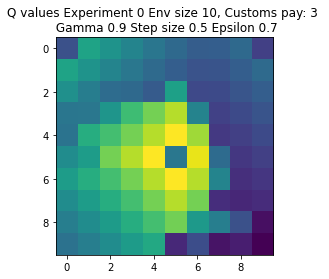

Expr:1 Eps:0 RunnAReward:-13.0 Reward:-244 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-543.0 Reward:-119 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-114.0 Reward:-148 Timesteps:936 GotPack:True Utiltime:48 Customstime:201 Money:5
Expr:1 Eps:60 RunnAReward:18.0 Reward:139 Timesteps:200 GotPack:False Utiltime:70 Customstime:0 Money:1
Expr:1 Eps:80 RunnAReward:227.0 Reward:743 Timesteps:213 GotPack:True Utiltime:44 Customstime:159 Money:5
Expr:1 Eps:100 RunnAReward:341.0 Reward:171 Timesteps:200 GotPack:False Utiltime:86 Customstime:0 Money:1
Expr:1 Eps:120 RunnAReward:301.0 Reward:-80 Timesteps:400 GotPack:False Utiltime:38 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:245.0 Reward:-18 Timesteps:300 GotPack:False Utiltime:56 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:319.0 Reward:114 Timesteps:200 GotPack:False Utiltime:40 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:345.0 Reward:738 Time

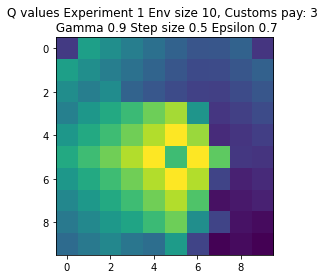

Expr:2 Eps:0 RunnAReward:0.0 Reward:18 Timesteps:200 GotPack:False Utiltime:170 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-254.0 Reward:-64 Timesteps:200 GotPack:False Utiltime:3 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-115.0 Reward:71 Timesteps:200 GotPack:False Utiltime:63 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:73.0 Reward:-551 Timesteps:1120 GotPack:True Utiltime:53 Customstime:342 Money:3
Expr:2 Eps:80 RunnAReward:4.0 Reward:-7 Timesteps:300 GotPack:False Utiltime:81 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:225.0 Reward:404 Timesteps:528 GotPack:True Utiltime:422 Customstime:470 Money:4
Expr:2 Eps:120 RunnAReward:230.0 Reward:842 Timesteps:125 GotPack:True Utiltime:43 Customstime:117 Money:3
Expr:2 Eps:140 RunnAReward:229.0 Reward:568 Timesteps:377 GotPack:True Utiltime:158 Customstime:229 Money:5
Expr:2 Eps:160 RunnAReward:210.0 Reward:-14 Timesteps:300 GotPack:False Utiltime:110 Customstime:0 Money:1
Expr:2 Eps:180 RunnAReward:320.0 Reward:-269 Time

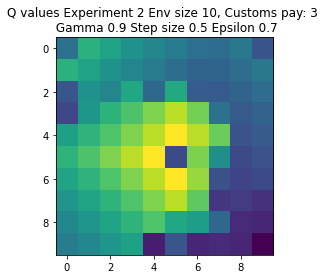

Expr:3 Eps:0 RunnAReward:3.0 Reward:75 Timesteps:200 GotPack:False Utiltime:76 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-237.0 Reward:120 Timesteps:626 GotPack:True Utiltime:156 Customstime:407 Money:5
Expr:3 Eps:40 RunnAReward:-1.0 Reward:31 Timesteps:200 GotPack:False Utiltime:155 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-23.0 Reward:227 Timesteps:555 GotPack:True Utiltime:259 Customstime:483 Money:4
Expr:3 Eps:80 RunnAReward:34.0 Reward:568 Timesteps:377 GotPack:True Utiltime:19 Customstime:97 Money:5
Expr:3 Eps:100 RunnAReward:94.0 Reward:63 Timesteps:200 GotPack:False Utiltime:59 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:209.0 Reward:-19 Timesteps:300 GotPack:False Utiltime:59 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:365.0 Reward:503 Timesteps:412 GotPack:True Utiltime:39 Customstime:126 Money:5
Expr:3 Eps:160 RunnAReward:480.0 Reward:13 Timesteps:300 GotPack:False Utiltime:28 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:495.0 Reward:622 Timesteps:

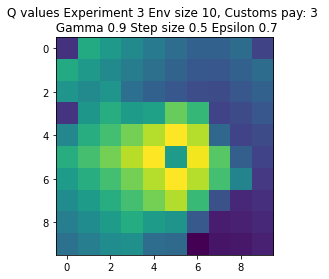

Expr:4 Eps:0 RunnAReward:-15.0 Reward:-295 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-426.0 Reward:-437 Timesteps:781 GotPack:True Utiltime:307 Customstime:342 Money:5
Expr:4 Eps:40 RunnAReward:-29.0 Reward:-96 Timesteps:400 GotPack:False Utiltime:16 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:32.0 Reward:74 Timesteps:200 GotPack:False Utiltime:101 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-7.0 Reward:40 Timesteps:300 GotPack:False Utiltime:168 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:229.0 Reward:25 Timesteps:300 GotPack:False Utiltime:92 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:252.0 Reward:109 Timesteps:200 GotPack:False Utiltime:92 Customstime:0 Money:1
Expr:4 Eps:140 RunnAReward:351.0 Reward:569 Timesteps:278 GotPack:True Utiltime:60 Customstime:258 Money:3
Expr:4 Eps:160 RunnAReward:325.0 Reward:759 Timesteps:193 GotPack:True Utiltime:67 Customstime:185 Money:3
Expr:4 Eps:180 RunnAReward:134.0 Reward:-315 Time

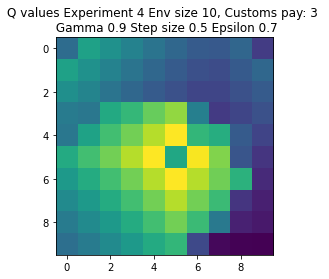

Expr:5 Eps:0 RunnAReward:2.0 Reward:45 Timesteps:719 GotPack:True Utiltime:324 Customstime:419 Money:3
Expr:5 Eps:20 RunnAReward:-282.0 Reward:469 Timesteps:397 GotPack:True Utiltime:283 Customstime:327 Money:3
Expr:5 Eps:40 RunnAReward:-160.0 Reward:-15 Timesteps:200 GotPack:False Utiltime:37 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:66.0 Reward:623 Timesteps:260 GotPack:True Utiltime:16 Customstime:147 Money:4
Expr:5 Eps:80 RunnAReward:209.0 Reward:-244 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:199.0 Reward:693 Timesteps:213 GotPack:True Utiltime:129 Customstime:197 Money:3
Expr:5 Eps:120 RunnAReward:252.0 Reward:3 Timesteps:300 GotPack:False Utiltime:3 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:245.0 Reward:434 Timesteps:458 GotPack:True Utiltime:49 Customstime:214 Money:3
Expr:5 Eps:160 RunnAReward:336.0 Reward:631 Timesteps:330 GotPack:True Utiltime:79 Customstime:183 Money:3
Expr:5 Eps:180 RunnAReward:487.0 Reward:102 Time

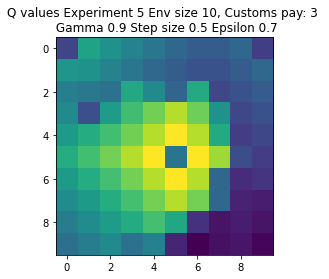

Expr:6 Eps:0 RunnAReward:-23.0 Reward:-452 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-456.0 Reward:27 Timesteps:200 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-139.0 Reward:81 Timesteps:200 GotPack:False Utiltime:98 Customstime:0 Money:1
Expr:6 Eps:60 RunnAReward:-91.0 Reward:136 Timesteps:200 GotPack:False Utiltime:46 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:165.0 Reward:449 Timesteps:398 GotPack:True Utiltime:91 Customstime:364 Money:3
Expr:6 Eps:100 RunnAReward:175.0 Reward:85 Timesteps:200 GotPack:False Utiltime:128 Customstime:0 Money:1
Expr:6 Eps:120 RunnAReward:219.0 Reward:560 Timesteps:355 GotPack:True Utiltime:59 Customstime:307 Money:3
Expr:6 Eps:140 RunnAReward:349.0 Reward:46 Timesteps:200 GotPack:False Utiltime:67 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:343.0 Reward:742 Timesteps:189 GotPack:True Utiltime:13 Customstime:164 Money:4
Expr:6 Eps:180 RunnAReward:403.0 Reward:428 Timest

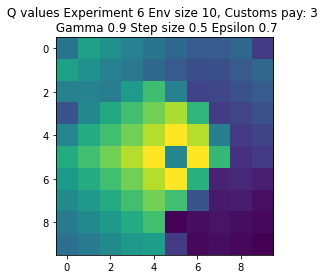

Expr:7 Eps:0 RunnAReward:-11.0 Reward:-208 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-198.0 Reward:-86 Timesteps:808 GotPack:True Utiltime:740 Customstime:762 Money:3
Expr:7 Eps:40 RunnAReward:-136.0 Reward:23 Timesteps:200 GotPack:False Utiltime:68 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:0.0 Reward:136 Timesteps:200 GotPack:False Utiltime:139 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:81.0 Reward:-122 Timesteps:400 GotPack:False Utiltime:5 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:219.0 Reward:251 Timesteps:560 GotPack:True Utiltime:36 Customstime:226 Money:5
Expr:7 Eps:120 RunnAReward:197.0 Reward:164 Timesteps:200 GotPack:False Utiltime:72 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:439.0 Reward:682 Timesteps:237 GotPack:True Utiltime:74 Customstime:138 Money:3
Expr:7 Eps:160 RunnAReward:538.0 Reward:85 Timesteps:300 GotPack:False Utiltime:35 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:443.0 Reward:92 Timeste

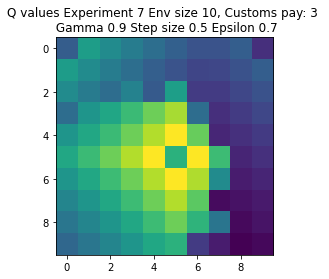

Expr:8 Eps:0 RunnAReward:-14.0 Reward:-275 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-385.0 Reward:-661 Timesteps:1400 GotPack:True Utiltime:45 Customstime:164 Money:5
Expr:8 Eps:40 RunnAReward:-69.0 Reward:123 Timesteps:527 GotPack:True Utiltime:159 Customstime:305 Money:5
Expr:8 Eps:60 RunnAReward:56.0 Reward:148 Timesteps:200 GotPack:False Utiltime:81 Customstime:0 Money:1
Expr:8 Eps:80 RunnAReward:73.0 Reward:101 Timesteps:200 GotPack:False Utiltime:56 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:235.0 Reward:361 Timesteps:521 GotPack:True Utiltime:52 Customstime:122 Money:4
Expr:8 Eps:120 RunnAReward:430.0 Reward:694 Timesteps:283 GotPack:True Utiltime:59 Customstime:119 Money:5
Expr:8 Eps:140 RunnAReward:470.0 Reward:274 Timesteps:485 GotPack:True Utiltime:18 Customstime:136 Money:4
Expr:8 Eps:160 RunnAReward:539.0 Reward:-77 Timesteps:300 GotPack:False Utiltime:283 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:546.0 Reward:467 

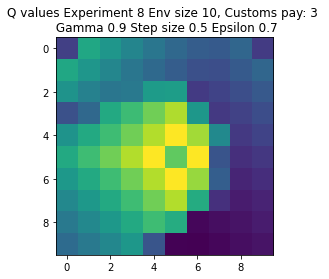

Expr:9 Eps:0 RunnAReward:-8.0 Reward:-150 Timesteps:300 GotPack:False Utiltime:163 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-392.0 Reward:109 Timesteps:689 GotPack:True Utiltime:399 Customstime:562 Money:3
Expr:9 Eps:40 RunnAReward:-47.0 Reward:-110 Timesteps:300 GotPack:False Utiltime:140 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:55.0 Reward:-229 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:7.0 Reward:137 Timesteps:200 GotPack:False Utiltime:78 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:290.0 Reward:107 Timesteps:644 GotPack:True Utiltime:56 Customstime:103 Money:3
Expr:9 Eps:120 RunnAReward:218.0 Reward:-35 Timesteps:300 GotPack:False Utiltime:110 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:228.0 Reward:134 Timesteps:200 GotPack:False Utiltime:26 Customstime:0 Money:1
Expr:9 Eps:160 RunnAReward:324.0 Reward:706 Timesteps:231 GotPack:True Utiltime:39 Customstime:145 Money:4
Expr:9 Eps:180 RunnAReward:268.0 Reward:176 Ti

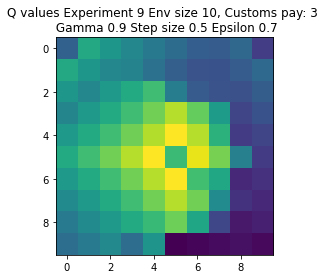

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.9 Step size 0.5 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-1.0 Reward:-15 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-100.0 Reward:-119 Timesteps:300 GotPack:False Utiltime:106 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-77.0 Reward:33 Timesteps:200 GotPack:False Utiltime:70 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-110.0 Reward:111 Timesteps:200 GotPack:False Utiltime:16 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:188.0 Reward:191 Timesteps:476 GotPack:True Utiltime:13 Customstime:82 Money:5
Expr:0 Eps:100 RunnAReward:248.0 Reward:605 Timesteps:276 GotPack:True Utiltime:146 Customstime:198 Money:5
Expr:0 Eps:120 RunnAReward:218.0 Reward:386 Timesteps:469 GotPack:True Utiltime:39 Customstime

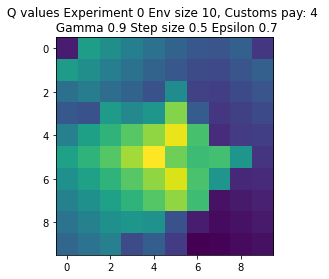

Expr:1 Eps:0 RunnAReward:4.0 Reward:80 Timesteps:200 GotPack:False Utiltime:50 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-130.0 Reward:110 Timesteps:100 GotPack:False Utiltime:16 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-96.0 Reward:-40 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:23.0 Reward:-262 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:210.0 Reward:203 Timesteps:100 GotPack:False Utiltime:35 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:248.0 Reward:-12 Timesteps:200 GotPack:False Utiltime:47 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:197.0 Reward:21 Timesteps:300 GotPack:False Utiltime:47 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:249.0 Reward:262 Timesteps:100 GotPack:False Utiltime:63 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:216.0 Reward:71 Timesteps:300 GotPack:False Utiltime:32 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:454.0 Reward:548 Timesteps:368 

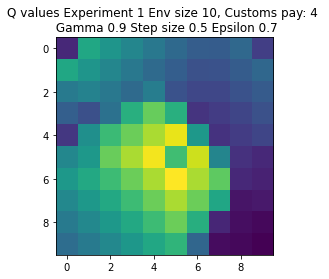

Expr:2 Eps:0 RunnAReward:-37.0 Reward:-732 Timesteps:1233 GotPack:True Utiltime:875 Customstime:944 Money:5
Expr:2 Eps:20 RunnAReward:-211.0 Reward:0 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:17.0 Reward:92 Timesteps:200 GotPack:False Utiltime:41 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-29.0 Reward:-27 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:86.0 Reward:271 Timesteps:100 GotPack:False Utiltime:80 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:157.0 Reward:-424 Timesteps:1038 GotPack:True Utiltime:38 Customstime:301 Money:5
Expr:2 Eps:120 RunnAReward:166.0 Reward:190 Timesteps:100 GotPack:False Utiltime:28 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:303.0 Reward:264 Timesteps:100 GotPack:False Utiltime:83 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:250.0 Reward:274 Timesteps:100 GotPack:False Utiltime:42 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:367.0 Reward:146 Timeste

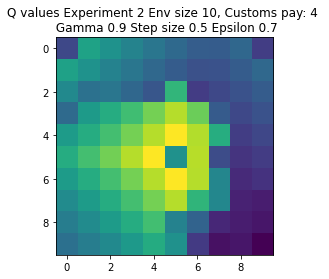

Expr:3 Eps:0 RunnAReward:-4.0 Reward:-62 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-141.0 Reward:-392 Timesteps:976 GotPack:True Utiltime:14 Customstime:823 Money:5
Expr:3 Eps:40 RunnAReward:-158.0 Reward:-1028 Timesteps:1535 GotPack:True Utiltime:519 Customstime:791 Money:4
Expr:3 Eps:60 RunnAReward:-94.0 Reward:266 Timesteps:100 GotPack:False Utiltime:27 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:151.0 Reward:521 Timesteps:401 GotPack:True Utiltime:138 Customstime:359 Money:4
Expr:3 Eps:100 RunnAReward:149.0 Reward:94 Timesteps:200 GotPack:False Utiltime:50 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:117.0 Reward:265 Timesteps:100 GotPack:False Utiltime:85 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:231.0 Reward:-23 Timesteps:300 GotPack:False Utiltime:151 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:147.0 Reward:617 Timesteps:224 GotPack:True Utiltime:14 Customstime:200 Money:4
Expr:3 Eps:180 RunnAReward:242.0 Reward:40

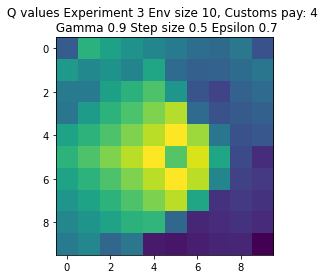

Expr:4 Eps:0 RunnAReward:-11.0 Reward:-210 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:20 RunnAReward:-116.0 Reward:-54 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-224.0 Reward:-55 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:105.0 Reward:-12 Timesteps:200 GotPack:False Utiltime:169 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:42.0 Reward:-79 Timesteps:300 GotPack:False Utiltime:78 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:192.0 Reward:-412 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:156.0 Reward:239 Timesteps:100 GotPack:False Utiltime:51 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:354.0 Reward:849 Timesteps:119 GotPack:True Utiltime:46 Customstime:101 Money:5
Expr:4 Eps:160 RunnAReward:285.0 Reward:291 Timesteps:100 GotPack:False Utiltime:60 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:364.0 Reward:252 Timeste

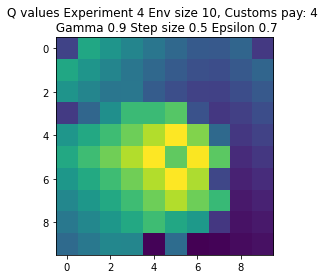

Expr:5 Eps:0 RunnAReward:-9.0 Reward:-171 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-230.0 Reward:-270 Timesteps:920 GotPack:True Utiltime:356 Customstime:455 Money:5
Expr:5 Eps:40 RunnAReward:-52.0 Reward:-578 Timesteps:1208 GotPack:True Utiltime:261 Customstime:309 Money:5
Expr:5 Eps:60 RunnAReward:-5.0 Reward:153 Timesteps:200 GotPack:False Utiltime:43 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:15.0 Reward:300 Timesteps:100 GotPack:False Utiltime:65 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:200.0 Reward:629 Timesteps:256 GotPack:True Utiltime:79 Customstime:214 Money:5
Expr:5 Eps:120 RunnAReward:229.0 Reward:174 Timesteps:100 GotPack:False Utiltime:7 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:114.0 Reward:128 Timesteps:200 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:228.0 Reward:-130 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:275.0 Reward:186 Tim

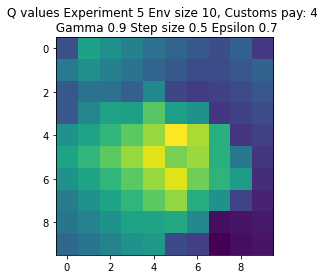

Expr:6 Eps:0 RunnAReward:3.0 Reward:67 Timesteps:200 GotPack:False Utiltime:72 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-170.0 Reward:-109 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-27.0 Reward:60 Timesteps:200 GotPack:False Utiltime:195 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-31.0 Reward:-16 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:104.0 Reward:169 Timesteps:678 GotPack:True Utiltime:61 Customstime:221 Money:4
Expr:6 Eps:100 RunnAReward:228.0 Reward:467 Timesteps:389 GotPack:True Utiltime:52 Customstime:112 Money:5
Expr:6 Eps:120 RunnAReward:203.0 Reward:124 Timesteps:200 GotPack:False Utiltime:163 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:318.0 Reward:597 Timesteps:225 GotPack:True Utiltime:75 Customstime:93 Money:5
Expr:6 Eps:160 RunnAReward:331.0 Reward:254 Timesteps:100 GotPack:False Utiltime:13 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:335.0 Reward:856 Timestep

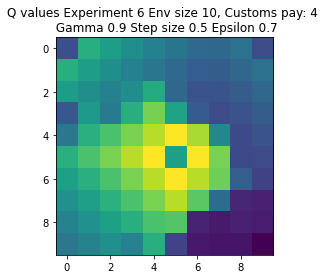

Expr:7 Eps:0 RunnAReward:-13.0 Reward:-245 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-240.0 Reward:-127 Timesteps:875 GotPack:True Utiltime:155 Customstime:693 Money:4
Expr:7 Eps:40 RunnAReward:-71.0 Reward:180 Timesteps:100 GotPack:False Utiltime:66 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:91.0 Reward:117 Timesteps:200 GotPack:False Utiltime:82 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:114.0 Reward:-54 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:48.0 Reward:-15 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:294.0 Reward:165 Timesteps:100 GotPack:False Utiltime:95 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:232.0 Reward:181 Timesteps:100 GotPack:False Utiltime:82 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:306.0 Reward:265 Timesteps:100 GotPack:False Utiltime:52 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:402.0 Reward:239 Timestep

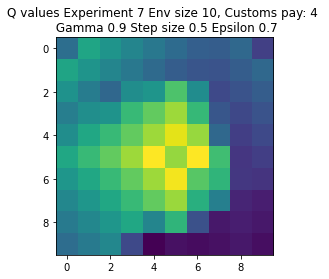

Expr:8 Eps:0 RunnAReward:-6.0 Reward:-112 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-230.0 Reward:-351 Timesteps:984 GotPack:True Utiltime:112 Customstime:242 Money:5
Expr:8 Eps:40 RunnAReward:-47.0 Reward:-15 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:26.0 Reward:280 Timesteps:100 GotPack:False Utiltime:45 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:41.0 Reward:-73 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:155.0 Reward:30 Timesteps:732 GotPack:True Utiltime:630 Customstime:666 Money:4
Expr:8 Eps:120 RunnAReward:193.0 Reward:-162 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:140 RunnAReward:319.0 Reward:144 Timesteps:200 GotPack:False Utiltime:68 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:245.0 Reward:608 Timesteps:299 GotPack:True Utiltime:21 Customstime:129 Money:5
Expr:8 Eps:180 RunnAReward:220.0 Reward:794 Timeste

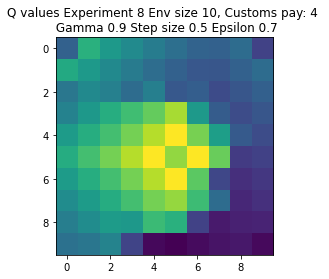

Expr:9 Eps:0 RunnAReward:-65.0 Reward:-1283 Timesteps:1653 GotPack:True Utiltime:1069 Customstime:1503 Money:5
Expr:9 Eps:20 RunnAReward:-208.0 Reward:-662 Timesteps:1335 GotPack:True Utiltime:860 Customstime:977 Money:5
Expr:9 Eps:40 RunnAReward:-201.0 Reward:-145 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-51.0 Reward:157 Timesteps:100 GotPack:False Utiltime:53 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:127.0 Reward:-15 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:184.0 Reward:-158 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:191.0 Reward:288 Timesteps:100 GotPack:False Utiltime:98 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:352.0 Reward:699 Timesteps:275 GotPack:True Utiltime:167 Customstime:257 Money:4
Expr:9 Eps:160 RunnAReward:259.0 Reward:266 Timesteps:100 GotPack:False Utiltime:35 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:309.0 Rewar

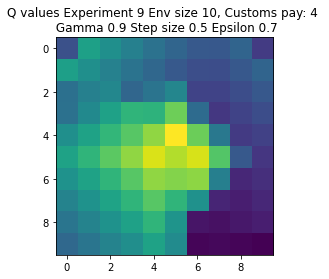

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.9 Step size 0.5 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-39.0 Reward:-780 Timesteps:1207 GotPack:True Utiltime:607 Customstime:752 Money:4
Expr:0 Eps:20 RunnAReward:-376.0 Reward:18 Timesteps:200 GotPack:False Utiltime:123 Customstime:0 Money:1
Expr:0 Eps:40 RunnAReward:-112.0 Reward:2 Timesteps:300 GotPack:False Utiltime:98 Customstime:0 Money:1
Expr:0 Eps:60 RunnAReward:-341.0 Reward:398 Timesteps:426 GotPack:True Utiltime:85 Customstime:117 Money:5
Expr:0 Eps:80 RunnAReward:-63.0 Reward:-15 Timesteps:200 GotPack:False Utiltime:26 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-11.0 Reward:54 Timesteps:200 GotPack:False Utiltime:35 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:-89.0 Reward:75 Timesteps:726 GotPack:True Utiltime:361 Customsti

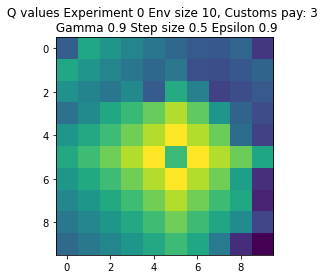

Expr:1 Eps:0 RunnAReward:-20.0 Reward:-396 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-439.0 Reward:84 Timesteps:724 GotPack:True Utiltime:232 Customstime:406 Money:5
Expr:1 Eps:40 RunnAReward:-326.0 Reward:-129 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-93.0 Reward:487 Timesteps:424 GotPack:True Utiltime:100 Customstime:260 Money:3
Expr:1 Eps:80 RunnAReward:-2.0 Reward:515 Timesteps:352 GotPack:True Utiltime:46 Customstime:180 Money:3
Expr:1 Eps:100 RunnAReward:112.0 Reward:524 Timesteps:366 GotPack:True Utiltime:106 Customstime:199 Money:3
Expr:1 Eps:120 RunnAReward:126.0 Reward:-56 Timesteps:300 GotPack:False Utiltime:136 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:131.0 Reward:647 Timesteps:277 GotPack:True Utiltime:39 Customstime:138 Money:3
Expr:1 Eps:160 RunnAReward:226.0 Reward:755 Timesteps:168 GotPack:True Utiltime:56 Customstime:129 Money:3
Expr:1 Eps:180 RunnAReward:263.0 Reward:54

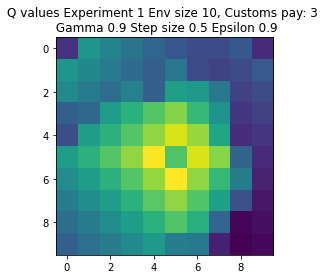

Expr:2 Eps:0 RunnAReward:-58.0 Reward:-1145 Timesteps:1494 GotPack:True Utiltime:1026 Customstime:1175 Money:3
Expr:2 Eps:20 RunnAReward:-579.0 Reward:226 Timesteps:461 GotPack:True Utiltime:18 Customstime:380 Money:3
Expr:2 Eps:40 RunnAReward:-234.0 Reward:-51 Timesteps:200 GotPack:False Utiltime:164 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-89.0 Reward:325 Timesteps:418 GotPack:True Utiltime:4 Customstime:345 Money:3
Expr:2 Eps:80 RunnAReward:45.0 Reward:649 Timesteps:295 GotPack:True Utiltime:111 Customstime:281 Money:3
Expr:2 Eps:100 RunnAReward:50.0 Reward:439 Timesteps:418 GotPack:True Utiltime:21 Customstime:277 Money:5
Expr:2 Eps:120 RunnAReward:-71.0 Reward:158 Timesteps:200 GotPack:False Utiltime:86 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:242.0 Reward:111 Timesteps:200 GotPack:False Utiltime:40 Customstime:0 Money:1
Expr:2 Eps:160 RunnAReward:91.0 Reward:57 Timesteps:200 GotPack:False Utiltime:96 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:220.0 Reward:64

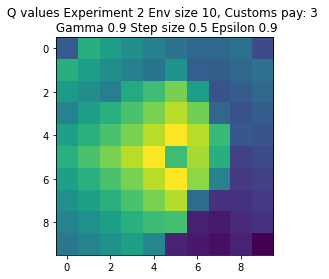

Expr:3 Eps:0 RunnAReward:-13.0 Reward:-244 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-437.0 Reward:-1931 Timesteps:2112 GotPack:True Utiltime:141 Customstime:252 Money:3
Expr:3 Eps:40 RunnAReward:-370.0 Reward:-87 Timesteps:300 GotPack:False Utiltime:70 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-102.0 Reward:-182 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-119.0 Reward:-165 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:23.0 Reward:137 Timesteps:200 GotPack:False Utiltime:106 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:228.0 Reward:165 Timesteps:200 GotPack:False Utiltime:172 Customstime:0 Money:1
Expr:3 Eps:140 RunnAReward:248.0 Reward:-209 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:198.0 Reward:660 Timesteps:276 GotPack:True Utiltime:65 Customstime:248 Money:3
Expr:3 Eps:180 RunnAReward:278.0 Reward:-

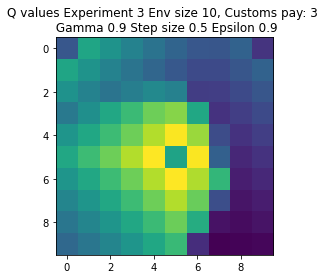

Expr:4 Eps:0 RunnAReward:-18.0 Reward:-360 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-386.0 Reward:-4 Timesteps:685 GotPack:True Utiltime:295 Customstime:482 Money:3
Expr:4 Eps:40 RunnAReward:-255.0 Reward:250 Timesteps:531 GotPack:True Utiltime:445 Customstime:516 Money:3
Expr:4 Eps:60 RunnAReward:-252.0 Reward:68 Timesteps:200 GotPack:False Utiltime:43 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-48.0 Reward:386 Timesteps:436 GotPack:True Utiltime:167 Customstime:335 Money:5
Expr:4 Eps:100 RunnAReward:-25.0 Reward:-34 Timesteps:300 GotPack:False Utiltime:51 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:66.0 Reward:616 Timesteps:337 GotPack:True Utiltime:244 Customstime:290 Money:4
Expr:4 Eps:140 RunnAReward:182.0 Reward:134 Timesteps:571 GotPack:True Utiltime:91 Customstime:111 Money:5
Expr:4 Eps:160 RunnAReward:116.0 Reward:25 Timesteps:200 GotPack:False Utiltime:133 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:97.0 Reward:174 

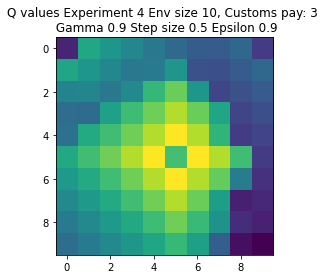

Expr:5 Eps:0 RunnAReward:-17.0 Reward:-322 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-233.0 Reward:-392 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:40 RunnAReward:-302.0 Reward:13 Timesteps:200 GotPack:False Utiltime:63 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-101.0 Reward:-144 Timesteps:300 GotPack:False Utiltime:27 Customstime:0 Money:1
Expr:5 Eps:80 RunnAReward:-169.0 Reward:36 Timesteps:604 GotPack:True Utiltime:99 Customstime:480 Money:4
Expr:5 Eps:100 RunnAReward:90.0 Reward:62 Timesteps:300 GotPack:False Utiltime:67 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:5.0 Reward:297 Timesteps:612 GotPack:True Utiltime:16 Customstime:144 Money:4
Expr:5 Eps:140 RunnAReward:56.0 Reward:-151 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:140.0 Reward:-185 Timesteps:300 GotPack:False Utiltime:277 Customstime:0 Money:2
Expr:5 Eps:180 RunnAReward:214.0 Reward:107 Timest

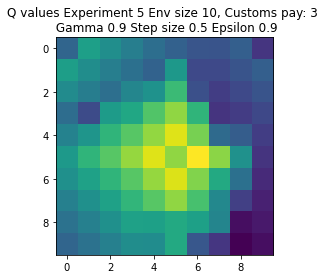

Expr:6 Eps:0 RunnAReward:6.0 Reward:138 Timesteps:681 GotPack:True Utiltime:449 Customstime:633 Money:3
Expr:6 Eps:20 RunnAReward:-394.0 Reward:-126 Timesteps:300 GotPack:False Utiltime:44 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-450.0 Reward:-187 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:60 RunnAReward:-54.0 Reward:188 Timesteps:569 GotPack:True Utiltime:287 Customstime:489 Money:3
Expr:6 Eps:80 RunnAReward:-91.0 Reward:-1013 Timesteps:1440 GotPack:True Utiltime:256 Customstime:503 Money:5
Expr:6 Eps:100 RunnAReward:-9.0 Reward:186 Timesteps:530 GotPack:True Utiltime:84 Customstime:356 Money:3
Expr:6 Eps:120 RunnAReward:133.0 Reward:423 Timesteps:415 GotPack:True Utiltime:68 Customstime:181 Money:4
Expr:6 Eps:140 RunnAReward:91.0 Reward:-145 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:160 RunnAReward:73.0 Reward:-307 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:177.0 Reward:348

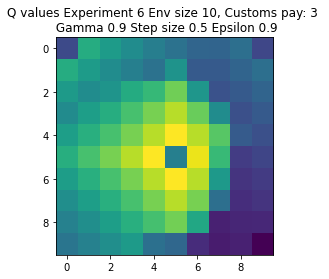

Expr:7 Eps:0 RunnAReward:-15.0 Reward:-286 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:20 RunnAReward:-207.0 Reward:-278 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-221.0 Reward:-138 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-385.0 Reward:94 Timesteps:200 GotPack:False Utiltime:34 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-243.0 Reward:-51 Timesteps:785 GotPack:True Utiltime:26 Customstime:662 Money:4
Expr:7 Eps:100 RunnAReward:-92.0 Reward:44 Timesteps:200 GotPack:False Utiltime:130 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:12.0 Reward:46 Timesteps:200 GotPack:False Utiltime:161 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:112.0 Reward:406 Timesteps:443 GotPack:True Utiltime:55 Customstime:385 Money:4
Expr:7 Eps:160 RunnAReward:49.0 Reward:139 Timesteps:200 GotPack:False Utiltime:19 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:122.0 Reward:-146 Time

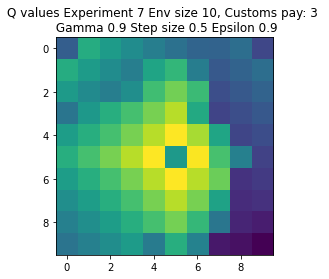

Expr:8 Eps:0 RunnAReward:-39.0 Reward:-765 Timesteps:1082 GotPack:True Utiltime:510 Customstime:751 Money:5
Expr:8 Eps:20 RunnAReward:-303.0 Reward:224 Timesteps:572 GotPack:True Utiltime:495 Customstime:546 Money:3
Expr:8 Eps:40 RunnAReward:-347.0 Reward:-1145 Timesteps:1438 GotPack:True Utiltime:1283 Customstime:1313 Money:3
Expr:8 Eps:60 RunnAReward:-302.0 Reward:21 Timesteps:200 GotPack:False Utiltime:148 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-204.0 Reward:-534 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:-80.0 Reward:122 Timesteps:200 GotPack:False Utiltime:125 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:123.0 Reward:-207 Timesteps:300 GotPack:False Utiltime:190 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:116.0 Reward:-54 Timesteps:793 GotPack:True Utiltime:64 Customstime:633 Money:3
Expr:8 Eps:160 RunnAReward:13.0 Reward:137 Timesteps:200 GotPack:False Utiltime:138 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:168.

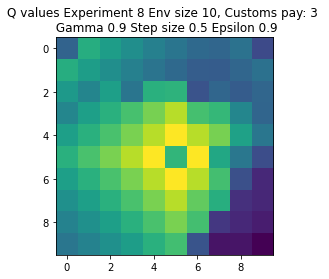

Expr:9 Eps:0 RunnAReward:-13.0 Reward:-257 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-382.0 Reward:-26 Timesteps:300 GotPack:False Utiltime:31 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-369.0 Reward:-90 Timesteps:689 GotPack:True Utiltime:344 Customstime:541 Money:3
Expr:9 Eps:60 RunnAReward:-203.0 Reward:-215 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-35.0 Reward:110 Timesteps:200 GotPack:False Utiltime:105 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:6.0 Reward:-12 Timesteps:683 GotPack:True Utiltime:17 Customstime:480 Money:3
Expr:9 Eps:120 RunnAReward:-76.0 Reward:13 Timesteps:300 GotPack:False Utiltime:254 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:154.0 Reward:-246 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:81.0 Reward:421 Timesteps:454 GotPack:True Utiltime:31 Customstime:133 Money:5
Expr:9 Eps:180 RunnAReward:47.0 Reward:102 Time

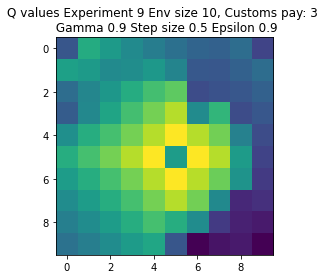

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.9 Step size 0.5 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-16.0 Reward:-320 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-224.0 Reward:-169 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-213.0 Reward:-50 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-64.0 Reward:-327 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:80 RunnAReward:32.0 Reward:-80 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:13.0 Reward:-130 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:103.0 Reward:167 Timesteps:100 GotPack:False Utiltime:81 Customstime:0 M

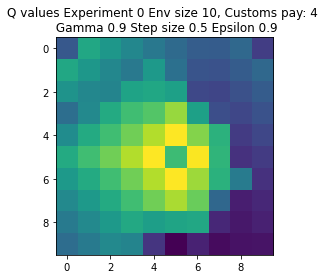

Expr:1 Eps:0 RunnAReward:-9.0 Reward:-168 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-237.0 Reward:-256 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-115.0 Reward:-37 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-35.0 Reward:185 Timesteps:100 GotPack:False Utiltime:80 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-123.0 Reward:-130 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:110.0 Reward:-21 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:-24.0 Reward:-637 Timesteps:1228 GotPack:True Utiltime:1148 Customstime:1208 Money:5
Expr:1 Eps:140 RunnAReward:113.0 Reward:394 Timesteps:421 GotPack:True Utiltime:75 Customstime:263 Money:4
Expr:1 Eps:160 RunnAReward:90.0 Reward:-201 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:131.0 Reward:142 Ti

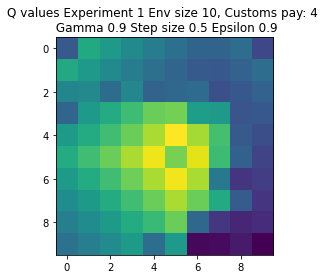

Expr:2 Eps:0 RunnAReward:-3.0 Reward:-49 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-280.0 Reward:7 Timesteps:200 GotPack:False Utiltime:153 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-98.0 Reward:-156 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-50.0 Reward:-50 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-27.0 Reward:285 Timesteps:100 GotPack:False Utiltime:94 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:12.0 Reward:118 Timesteps:200 GotPack:False Utiltime:59 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:31.0 Reward:66 Timesteps:200 GotPack:False Utiltime:57 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:45.0 Reward:-25 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:90.0 Reward:-269 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:149.0 Reward:180 Timesteps:200 Got

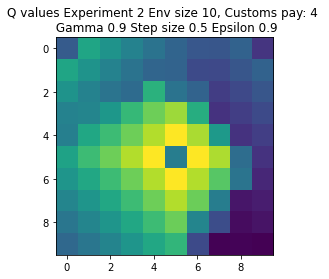

Expr:3 Eps:0 RunnAReward:-23.0 Reward:-454 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-230.0 Reward:170 Timesteps:100 GotPack:False Utiltime:91 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-177.0 Reward:498 Timesteps:328 GotPack:True Utiltime:235 Customstime:299 Money:5
Expr:3 Eps:60 RunnAReward:-46.0 Reward:-115 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-68.0 Reward:-63 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-63.0 Reward:-411 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:38.0 Reward:33 Timesteps:200 GotPack:False Utiltime:37 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:-112.0 Reward:-732 Timesteps:1174 GotPack:True Utiltime:25 Customstime:272 Money:4
Expr:3 Eps:160 RunnAReward:-4.0 Reward:-53 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:115.0 Reward:142 Times

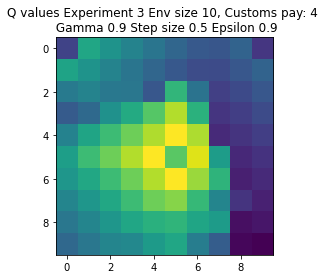

Expr:4 Eps:0 RunnAReward:-8.0 Reward:-149 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-322.0 Reward:-105 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-319.0 Reward:92 Timesteps:200 GotPack:False Utiltime:95 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-78.0 Reward:271 Timesteps:100 GotPack:False Utiltime:83 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-47.0 Reward:-144 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-47.0 Reward:-81 Timesteps:200 GotPack:False Utiltime:39 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:52.0 Reward:-371 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:67.0 Reward:293 Timesteps:546 GotPack:True Utiltime:55 Customstime:456 Money:4
Expr:4 Eps:160 RunnAReward:106.0 Reward:229 Timesteps:100 GotPack:False Utiltime:4 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:130.0 Reward:190 Timesteps:

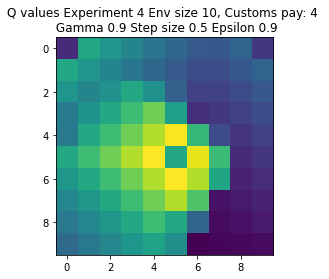

Expr:5 Eps:0 RunnAReward:7.0 Reward:148 Timesteps:100 GotPack:False Utiltime:66 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-273.0 Reward:90 Timesteps:200 GotPack:False Utiltime:23 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-231.0 Reward:-422 Timesteps:1163 GotPack:True Utiltime:170 Customstime:281 Money:5
Expr:5 Eps:60 RunnAReward:-56.0 Reward:-123 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:67.0 Reward:-73 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-42.0 Reward:34 Timesteps:200 GotPack:False Utiltime:12 Customstime:0 Money:3
Expr:5 Eps:120 RunnAReward:88.0 Reward:641 Timesteps:230 GotPack:True Utiltime:57 Customstime:196 Money:4
Expr:5 Eps:140 RunnAReward:227.0 Reward:115 Timesteps:200 GotPack:False Utiltime:156 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:88.0 Reward:737 Timesteps:133 GotPack:True Utiltime:60 Customstime:111 Money:5
Expr:5 Eps:180 RunnAReward:223.0 Reward:-39 Timeste

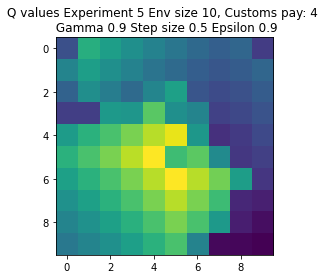

Expr:6 Eps:0 RunnAReward:3.0 Reward:66 Timesteps:200 GotPack:False Utiltime:79 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-235.0 Reward:-5 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-133.0 Reward:-136 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-28.0 Reward:-24 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-156.0 Reward:-303 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:100 RunnAReward:-76.0 Reward:262 Timesteps:100 GotPack:False Utiltime:92 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:12.0 Reward:-450 Timesteps:1104 GotPack:True Utiltime:130 Customstime:230 Money:4
Expr:6 Eps:140 RunnAReward:7.0 Reward:-30 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:101.0 Reward:-99 Timesteps:300 GotPack:False Utiltime:25 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:54.0 Reward:-178 Timesteps:1

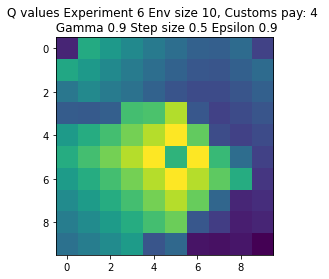

Expr:7 Eps:0 RunnAReward:2.0 Reward:48 Timesteps:300 GotPack:False Utiltime:296 Customstime:0 Money:3
Expr:7 Eps:20 RunnAReward:-424.0 Reward:-409 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:40 RunnAReward:-76.0 Reward:-36 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-52.0 Reward:241 Timesteps:471 GotPack:True Utiltime:116 Customstime:275 Money:4
Expr:7 Eps:80 RunnAReward:-110.0 Reward:-78 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:91.0 Reward:34 Timesteps:200 GotPack:False Utiltime:99 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:38.0 Reward:-47 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:91.0 Reward:-110 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:100.0 Reward:-43 Timesteps:200 GotPack:False Utiltime:29 Customstime:0 Money:3
Expr:7 Eps:180 RunnAReward:161.0 Reward:534 Timesteps:340

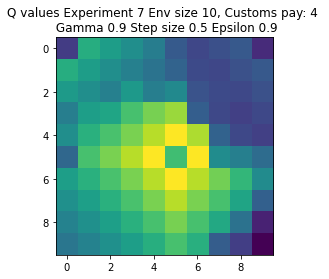

Expr:8 Eps:0 RunnAReward:0.0 Reward:12 Timesteps:675 GotPack:True Utiltime:452 Customstime:644 Money:4
Expr:8 Eps:20 RunnAReward:-257.0 Reward:-131 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-162.0 Reward:-70 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-239.0 Reward:-106 Timesteps:919 GotPack:True Utiltime:134 Customstime:748 Money:5
Expr:8 Eps:80 RunnAReward:59.0 Reward:-91 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-8.0 Reward:26 Timesteps:200 GotPack:False Utiltime:76 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:49.0 Reward:50 Timesteps:200 GotPack:False Utiltime:60 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:104.0 Reward:12 Timesteps:200 GotPack:False Utiltime:67 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:121.0 Reward:242 Timesteps:100 GotPack:False Utiltime:20 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:156.0 Reward:285 Timesteps:1

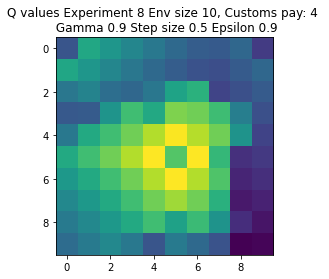

Expr:9 Eps:0 RunnAReward:-8.0 Reward:-151 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-340.0 Reward:296 Timesteps:542 GotPack:True Utiltime:50 Customstime:426 Money:4
Expr:9 Eps:40 RunnAReward:-297.0 Reward:-362 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-84.0 Reward:-120 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:61.0 Reward:335 Timesteps:491 GotPack:True Utiltime:98 Customstime:448 Money:5
Expr:9 Eps:100 RunnAReward:-8.0 Reward:82 Timesteps:764 GotPack:True Utiltime:199 Customstime:433 Money:4
Expr:9 Eps:120 RunnAReward:32.0 Reward:85 Timesteps:755 GotPack:True Utiltime:32 Customstime:176 Money:4
Expr:9 Eps:140 RunnAReward:132.0 Reward:28 Timesteps:200 GotPack:False Utiltime:91 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:183.0 Reward:425 Timesteps:455 GotPack:True Utiltime:80 Customstime:429 Money:4
Expr:9 Eps:180 RunnAReward:162.0 Reward:133 Timeste

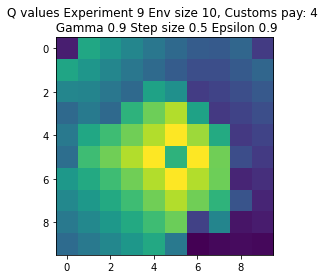

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.9 Step size 0.5 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-19.0 Reward:-380 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-711.0 Reward:191 Timesteps:563 GotPack:True Utiltime:181 Customstime:223 Money:3
Expr:0 Eps:40 RunnAReward:-719.0 Reward:-783 Timesteps:1430 GotPack:True Utiltime:882 Customstime:902 Money:4
Expr:0 Eps:60 RunnAReward:-423.0 Reward:-433 Timesteps:966 GotPack:True Utiltime:179 Customstime:318 Money:3
Expr:0 Eps:80 RunnAReward:-347.0 Reward:-242 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-164.0 Reward:437 Timesteps:399 GotPack:True Utiltime:304 Customstime:351 Money:3
Expr:0 Eps:120 RunnAReward:-59.0 Reward:-142 Timesteps:200 GotPack:False Utiltime

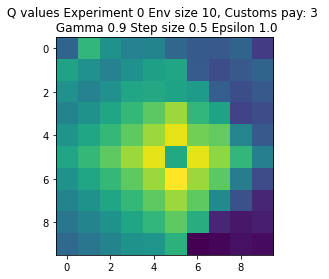

Expr:1 Eps:0 RunnAReward:-9.0 Reward:-167 Timesteps:300 GotPack:False Utiltime:43 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-785.0 Reward:-124 Timesteps:300 GotPack:False Utiltime:63 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-512.0 Reward:-526 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-287.0 Reward:80 Timesteps:200 GotPack:False Utiltime:78 Customstime:0 Money:1
Expr:1 Eps:80 RunnAReward:-297.0 Reward:0 Timesteps:728 GotPack:True Utiltime:217 Customstime:348 Money:5
Expr:1 Eps:100 RunnAReward:-189.0 Reward:-301 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:120 RunnAReward:-68.0 Reward:555 Timesteps:389 GotPack:True Utiltime:118 Customstime:257 Money:4
Expr:1 Eps:140 RunnAReward:70.0 Reward:-291 Timesteps:400 GotPack:False Utiltime:197 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:46.0 Reward:511 Timesteps:316 GotPack:True Utiltime:104 Customstime:211 Money:5
Expr:1 Eps:180 RunnAReward:43.0 Reward:504 

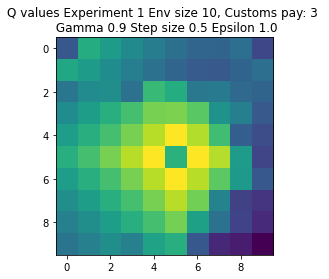

Expr:2 Eps:0 RunnAReward:-3.0 Reward:-59 Timesteps:200 GotPack:False Utiltime:105 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-488.0 Reward:113 Timesteps:200 GotPack:False Utiltime:138 Customstime:0 Money:1
Expr:2 Eps:40 RunnAReward:-346.0 Reward:111 Timesteps:200 GotPack:False Utiltime:79 Customstime:0 Money:1
Expr:2 Eps:60 RunnAReward:-179.0 Reward:441 Timesteps:408 GotPack:True Utiltime:235 Customstime:376 Money:3
Expr:2 Eps:80 RunnAReward:-118.0 Reward:-106 Timesteps:300 GotPack:False Utiltime:45 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-142.0 Reward:486 Timesteps:440 GotPack:True Utiltime:194 Customstime:237 Money:3
Expr:2 Eps:120 RunnAReward:-38.0 Reward:-76 Timesteps:300 GotPack:False Utiltime:154 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:63.0 Reward:-16 Timesteps:300 GotPack:False Utiltime:28 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:-44.0 Reward:4 Timesteps:791 GotPack:True Utiltime:35 Customstime:296 Money:3
Expr:2 Eps:180 RunnAReward:64.0 Reward:488

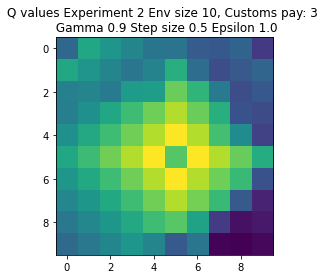

Expr:3 Eps:0 RunnAReward:-65.0 Reward:-1281 Timesteps:1746 GotPack:True Utiltime:936 Customstime:1194 Money:3
Expr:3 Eps:20 RunnAReward:-411.0 Reward:-206 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-501.0 Reward:-387 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-452.0 Reward:502 Timesteps:362 GotPack:True Utiltime:147 Customstime:285 Money:3
Expr:3 Eps:80 RunnAReward:-304.0 Reward:-72 Timesteps:200 GotPack:False Utiltime:159 Customstime:0 Money:1
Expr:3 Eps:100 RunnAReward:-269.0 Reward:105 Timesteps:200 GotPack:False Utiltime:121 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-16.0 Reward:123 Timesteps:200 GotPack:False Utiltime:26 Customstime:0 Money:1
Expr:3 Eps:140 RunnAReward:42.0 Reward:-45 Timesteps:300 GotPack:False Utiltime:185 Customstime:0 Money:1
Expr:3 Eps:160 RunnAReward:-10.0 Reward:557 Timesteps:253 GotPack:True Utiltime:147 Customstime:228 Money:5
Expr:3 Eps:180 RunnAReward:-8.0 Rew

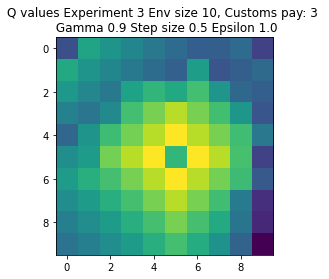

Expr:4 Eps:0 RunnAReward:-3.0 Reward:-44 Timesteps:300 GotPack:False Utiltime:224 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-394.0 Reward:-1110 Timesteps:1524 GotPack:True Utiltime:1213 Customstime:1273 Money:3
Expr:4 Eps:40 RunnAReward:-442.0 Reward:229 Timesteps:575 GotPack:True Utiltime:51 Customstime:369 Money:5
Expr:4 Eps:60 RunnAReward:-444.0 Reward:117 Timesteps:200 GotPack:False Utiltime:34 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-244.0 Reward:-53 Timesteps:300 GotPack:False Utiltime:133 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-250.0 Reward:-274 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-153.0 Reward:-267 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:-52.0 Reward:33 Timesteps:200 GotPack:False Utiltime:14 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:0.0 Reward:-13 Timesteps:200 GotPack:False Utiltime:146 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:-50.0 Reward

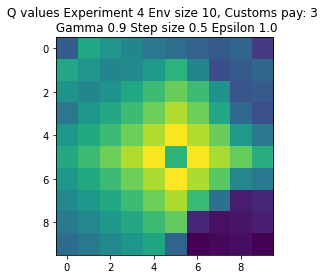

Expr:5 Eps:0 RunnAReward:-15.0 Reward:-284 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-482.0 Reward:-189 Timesteps:902 GotPack:True Utiltime:628 Customstime:655 Money:3
Expr:5 Eps:40 RunnAReward:-592.0 Reward:-232 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-230.0 Reward:-286 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-374.0 Reward:-332 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-257.0 Reward:17 Timesteps:200 GotPack:False Utiltime:109 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-200.0 Reward:-1413 Timesteps:1958 GotPack:True Utiltime:98 Customstime:350 Money:5
Expr:5 Eps:140 RunnAReward:-97.0 Reward:57 Timesteps:200 GotPack:False Utiltime:131 Customstime:0 Money:1
Expr:5 Eps:160 RunnAReward:-62.0 Reward:533 Timesteps:312 GotPack:True Utiltime:212 Customstime:248 Money:5
Expr:5 Eps:180 RunnAReward:129.0 Rewa

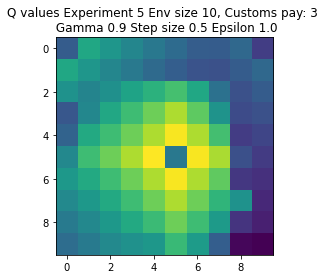

Expr:6 Eps:0 RunnAReward:-8.0 Reward:-150 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-680.0 Reward:-206 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-519.0 Reward:-410 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-619.0 Reward:-296 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-329.0 Reward:51 Timesteps:200 GotPack:False Utiltime:200 Customstime:0 Money:1
Expr:6 Eps:100 RunnAReward:-150.0 Reward:-159 Timesteps:834 GotPack:True Utiltime:407 Customstime:452 Money:3
Expr:6 Eps:120 RunnAReward:-167.0 Reward:-242 Timesteps:400 GotPack:False Utiltime:206 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:-2.0 Reward:111 Timesteps:200 GotPack:False Utiltime:169 Customstime:0 Money:1
Expr:6 Eps:160 RunnAReward:45.0 Reward:-264 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:-94.0 Reward:393

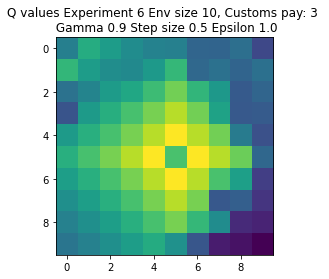

Expr:7 Eps:0 RunnAReward:-46.0 Reward:-904 Timesteps:1394 GotPack:True Utiltime:326 Customstime:699 Money:3
Expr:7 Eps:20 RunnAReward:-457.0 Reward:-220 Timesteps:848 GotPack:True Utiltime:605 Customstime:635 Money:5
Expr:7 Eps:40 RunnAReward:-758.0 Reward:-2037 Timesteps:2430 GotPack:True Utiltime:178 Customstime:758 Money:5
Expr:7 Eps:60 RunnAReward:-528.0 Reward:-635 Timesteps:1162 GotPack:True Utiltime:620 Customstime:664 Money:5
Expr:7 Eps:80 RunnAReward:-228.0 Reward:-313 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-94.0 Reward:-49 Timesteps:200 GotPack:False Utiltime:8 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-151.0 Reward:339 Timesteps:546 GotPack:True Utiltime:87 Customstime:342 Money:5
Expr:7 Eps:140 RunnAReward:36.0 Reward:-135 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:13.0 Reward:518 Timesteps:315 GotPack:True Utiltime:111 Customstime:197 Money:5
Expr:7 Eps:180 RunnAReward:148.

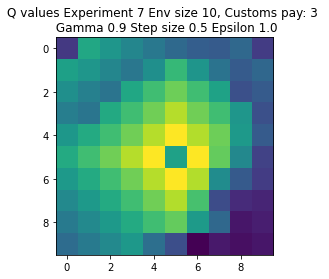

Expr:8 Eps:0 RunnAReward:3.0 Reward:76 Timesteps:200 GotPack:False Utiltime:63 Customstime:0 Money:1
Expr:8 Eps:20 RunnAReward:-716.0 Reward:-734 Timesteps:1108 GotPack:True Utiltime:896 Customstime:996 Money:5
Expr:8 Eps:40 RunnAReward:-381.0 Reward:-302 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-269.0 Reward:-174 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-293.0 Reward:136 Timesteps:200 GotPack:False Utiltime:119 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-152.0 Reward:340 Timesteps:487 GotPack:True Utiltime:243 Customstime:449 Money:5
Expr:8 Eps:120 RunnAReward:-38.0 Reward:-49 Timesteps:750 GotPack:True Utiltime:351 Customstime:707 Money:3
Expr:8 Eps:140 RunnAReward:-135.0 Reward:-314 Timesteps:500 GotPack:False Utiltime:116 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:84.0 Reward:-182 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:180 RunnAReward:-148.0 Rewar

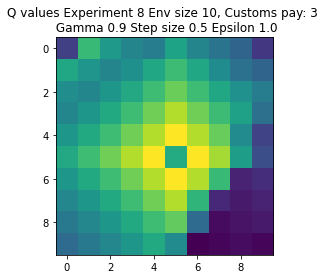

Expr:9 Eps:0 RunnAReward:-10.0 Reward:-185 Timesteps:885 GotPack:True Utiltime:436 Customstime:552 Money:3
Expr:9 Eps:20 RunnAReward:-687.0 Reward:-1498 Timesteps:1712 GotPack:True Utiltime:652 Customstime:825 Money:5
Expr:9 Eps:40 RunnAReward:-313.0 Reward:-287 Timesteps:400 GotPack:False Utiltime:98 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-116.0 Reward:-51 Timesteps:300 GotPack:False Utiltime:64 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:-214.0 Reward:-216 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-112.0 Reward:-425 Timesteps:1003 GotPack:True Utiltime:555 Customstime:643 Money:4
Expr:9 Eps:120 RunnAReward:-151.0 Reward:-35 Timesteps:300 GotPack:False Utiltime:21 Customstime:0 Money:1
Expr:9 Eps:140 RunnAReward:-112.0 Reward:101 Timesteps:200 GotPack:False Utiltime:5 Customstime:0 Money:1
Expr:9 Eps:160 RunnAReward:-82.0 Reward:-298 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:180 RunnAReward:85.0 R

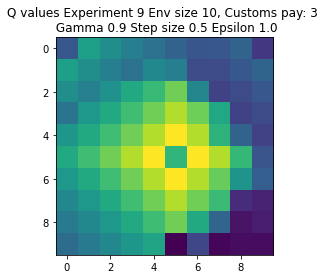

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.9 Step size 0.5 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-12.0 Reward:-237 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:20 RunnAReward:-534.0 Reward:-1411 Timesteps:1733 GotPack:True Utiltime:884 Customstime:1052 Money:5
Expr:0 Eps:40 RunnAReward:-456.0 Reward:-241 Timesteps:891 GotPack:True Utiltime:446 Customstime:556 Money:5
Expr:0 Eps:60 RunnAReward:-167.0 Reward:295 Timesteps:100 GotPack:False Utiltime:46 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-153.0 Reward:-455 Timesteps:500 GotPack:False Utiltime:97 Customstime:0 Money:3
Expr:0 Eps:100 RunnAReward:-50.0 Reward:-256 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:-35.0 Reward:60 Timesteps:200 GotPack:False Utiltime:126

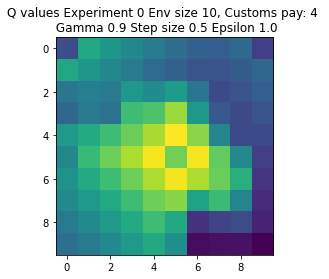

Expr:1 Eps:0 RunnAReward:-35.0 Reward:-692 Timesteps:1324 GotPack:True Utiltime:1200 Customstime:1304 Money:4
Expr:1 Eps:20 RunnAReward:-218.0 Reward:-45 Timesteps:200 GotPack:False Utiltime:101 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-109.0 Reward:-76 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-493.0 Reward:215 Timesteps:100 GotPack:False Utiltime:25 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-232.0 Reward:-78 Timesteps:200 GotPack:False Utiltime:169 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-104.0 Reward:126 Timesteps:591 GotPack:True Utiltime:86 Customstime:303 Money:5
Expr:1 Eps:120 RunnAReward:23.0 Reward:-42 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:18.0 Reward:173 Timesteps:200 GotPack:False Utiltime:39 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:-61.0 Reward:-151 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:13.0 Reward:-25

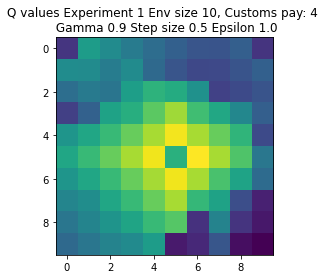

Expr:2 Eps:0 RunnAReward:-4.0 Reward:-77 Timesteps:300 GotPack:False Utiltime:96 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-317.0 Reward:-2343 Timesteps:2709 GotPack:True Utiltime:1258 Customstime:1678 Money:5
Expr:2 Eps:40 RunnAReward:-666.0 Reward:-160 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-553.0 Reward:-323 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:-117.0 Reward:-270 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:0.0 Reward:-28 Timesteps:200 GotPack:False Utiltime:19 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:-148.0 Reward:-128 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-6.0 Reward:179 Timesteps:100 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:69.0 Reward:190 Timesteps:100 GotPack:False Utiltime:26 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:126.0 Reward:191 T

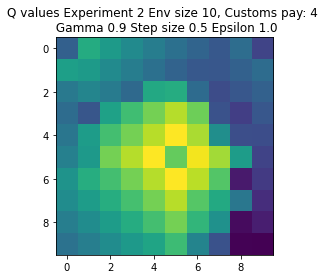

Expr:3 Eps:0 RunnAReward:-15.0 Reward:-299 Timesteps:1084 GotPack:True Utiltime:194 Customstime:353 Money:4
Expr:3 Eps:20 RunnAReward:-421.0 Reward:-1613 Timesteps:1958 GotPack:True Utiltime:1182 Customstime:1321 Money:5
Expr:3 Eps:40 RunnAReward:-313.0 Reward:-119 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-92.0 Reward:-104 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-109.0 Reward:224 Timesteps:465 GotPack:True Utiltime:379 Customstime:395 Money:5
Expr:3 Eps:100 RunnAReward:-8.0 Reward:-55 Timesteps:745 GotPack:True Utiltime:266 Customstime:576 Money:5
Expr:3 Eps:120 RunnAReward:-57.0 Reward:88 Timesteps:200 GotPack:False Utiltime:59 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:-20.0 Reward:-140 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:64.0 Reward:-140 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:55.0 Rewar

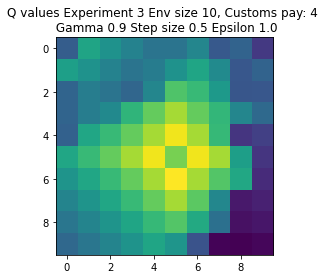

Expr:4 Eps:0 RunnAReward:-14.0 Reward:-277 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-354.0 Reward:45 Timesteps:200 GotPack:False Utiltime:105 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-230.0 Reward:162 Timesteps:100 GotPack:False Utiltime:90 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-115.0 Reward:80 Timesteps:200 GotPack:False Utiltime:114 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:-115.0 Reward:-414 Timesteps:1192 GotPack:True Utiltime:149 Customstime:220 Money:5
Expr:4 Eps:100 RunnAReward:-181.0 Reward:127 Timesteps:100 GotPack:False Utiltime:8 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-90.0 Reward:128 Timesteps:200 GotPack:False Utiltime:57 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:23.0 Reward:160 Timesteps:100 GotPack:False Utiltime:42 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:2.0 Reward:95 Timesteps:200 GotPack:False Utiltime:37 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:80.0 Reward:185 Times

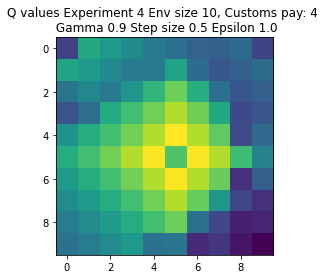

Expr:5 Eps:0 RunnAReward:-10.0 Reward:-188 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-239.0 Reward:-167 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-515.0 Reward:-162 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-90.0 Reward:-45 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-175.0 Reward:-51 Timesteps:716 GotPack:True Utiltime:349 Customstime:386 Money:5
Expr:5 Eps:100 RunnAReward:-105.0 Reward:-120 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-103.0 Reward:-172 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:-29.0 Reward:151 Timesteps:100 GotPack:False Utiltime:92 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:62.0 Reward:-124 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:-28.0 Reward:179 Tim

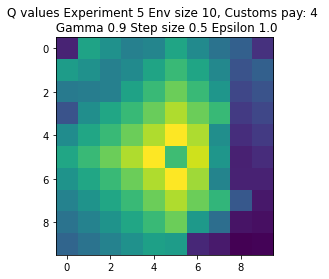

Expr:6 Eps:0 RunnAReward:-10.0 Reward:-198 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-238.0 Reward:114 Timesteps:100 GotPack:False Utiltime:64 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-240.0 Reward:-144 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-88.0 Reward:-120 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-75.0 Reward:-26 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-164.0 Reward:-168 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-30.0 Reward:239 Timesteps:566 GotPack:True Utiltime:349 Customstime:440 Money:5
Expr:6 Eps:140 RunnAReward:9.0 Reward:-326 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:-14.0 Reward:-210 Timesteps:822 GotPack:True Utiltime:384 Customstime:593 Money:5
Expr:6 Eps:180 RunnAReward:5.0 Reward:14 Timest

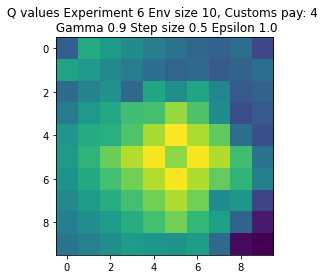

Expr:7 Eps:0 RunnAReward:-4.0 Reward:-78 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-359.0 Reward:-130 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-345.0 Reward:85 Timesteps:200 GotPack:False Utiltime:27 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-155.0 Reward:-98 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-244.0 Reward:-125 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-189.0 Reward:-120 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-72.0 Reward:615 Timesteps:294 GotPack:True Utiltime:172 Customstime:274 Money:4
Expr:7 Eps:140 RunnAReward:68.0 Reward:180 Timesteps:100 GotPack:False Utiltime:37 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:-143.0 Reward:-181 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:36.0 Reward:165 Timest

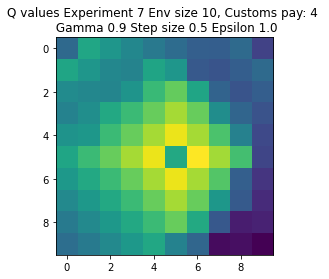

Expr:8 Eps:0 RunnAReward:-12.0 Reward:-235 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-318.0 Reward:-1567 Timesteps:1808 GotPack:True Utiltime:1429 Customstime:1598 Money:4
Expr:8 Eps:40 RunnAReward:-823.0 Reward:-139 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-88.0 Reward:-234 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:-80.0 Reward:-73 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-94.0 Reward:146 Timesteps:200 GotPack:False Utiltime:119 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:-17.0 Reward:-67 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:20.0 Reward:173 Timesteps:100 GotPack:False Utiltime:54 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:-49.0 Reward:187 Timesteps:581 GotPack:True Utiltime:9 Customstime:458 Money:4
Expr:8 Eps:180 RunnAReward:31.0 Reward:165 Ti

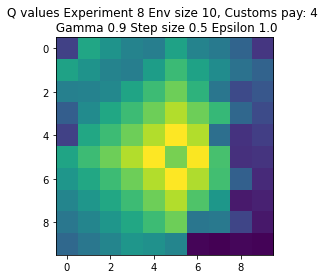

Expr:9 Eps:0 RunnAReward:-81.0 Reward:-1604 Timesteps:1925 GotPack:True Utiltime:419 Customstime:745 Money:5
Expr:9 Eps:20 RunnAReward:-260.0 Reward:-149 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-486.0 Reward:-1915 Timesteps:2360 GotPack:True Utiltime:1104 Customstime:1763 Money:4
Expr:9 Eps:60 RunnAReward:-219.0 Reward:546 Timesteps:264 GotPack:True Utiltime:93 Customstime:250 Money:5
Expr:9 Eps:80 RunnAReward:-163.0 Reward:-1251 Timesteps:1795 GotPack:True Utiltime:232 Customstime:379 Money:5
Expr:9 Eps:100 RunnAReward:-223.0 Reward:-121 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-46.0 Reward:221 Timesteps:100 GotPack:False Utiltime:83 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:54.0 Reward:100 Timesteps:200 GotPack:False Utiltime:107 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:6.0 Reward:-45 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:-5.0 

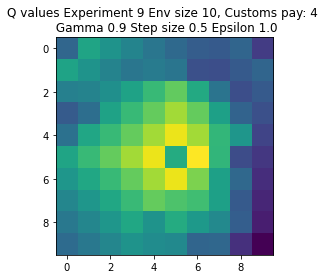

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.9 Step size 0.8 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-26.0 Reward:-517 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-260.0 Reward:-177 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-297.0 Reward:0 Timesteps:200 GotPack:False Utiltime:129 Customstime:0 Money:1
Expr:0 Eps:60 RunnAReward:16.0 Reward:157 Timesteps:200 GotPack:False Utiltime:81 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:151.0 Reward:286 Timesteps:488 GotPack:True Utiltime:44 Customstime:139 Money:5
Expr:0 Eps:100 RunnAReward:66.0 Reward:18 Timesteps:300 GotPack:False Utiltime:33 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:277.0 Reward:633 Timesteps:301 GotPack:True Utiltime:26 Customstime:246

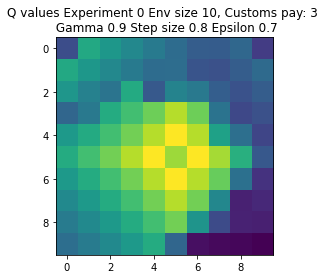

Expr:1 Eps:0 RunnAReward:-27.0 Reward:-532 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-406.0 Reward:-188 Timesteps:300 GotPack:False Utiltime:114 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-86.0 Reward:-249 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:60 RunnAReward:88.0 Reward:-589 Timesteps:1054 GotPack:True Utiltime:101 Customstime:348 Money:4
Expr:1 Eps:80 RunnAReward:179.0 Reward:571 Timesteps:328 GotPack:True Utiltime:37 Customstime:304 Money:3
Expr:1 Eps:100 RunnAReward:424.0 Reward:743 Timesteps:161 GotPack:True Utiltime:75 Customstime:126 Money:3
Expr:1 Eps:120 RunnAReward:476.0 Reward:782 Timesteps:154 GotPack:True Utiltime:53 Customstime:130 Money:3
Expr:1 Eps:140 RunnAReward:616.0 Reward:190 Timesteps:200 GotPack:False Utiltime:77 Customstime:0 Money:1
Expr:1 Eps:160 RunnAReward:487.0 Reward:831 Timesteps:157 GotPack:True Utiltime:53 Customstime:138 Money:4
Expr:1 Eps:180 RunnAReward:607.0 Reward:84

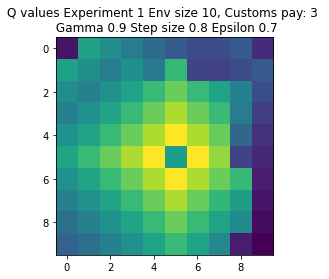

Expr:2 Eps:0 RunnAReward:5.0 Reward:104 Timesteps:200 GotPack:False Utiltime:65 Customstime:0 Money:1
Expr:2 Eps:20 RunnAReward:-309.0 Reward:-200 Timesteps:400 GotPack:False Utiltime:302 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:57.0 Reward:261 Timesteps:549 GotPack:True Utiltime:357 Customstime:519 Money:3
Expr:2 Eps:60 RunnAReward:242.0 Reward:536 Timesteps:375 GotPack:True Utiltime:330 Customstime:359 Money:3
Expr:2 Eps:80 RunnAReward:295.0 Reward:794 Timesteps:173 GotPack:True Utiltime:46 Customstime:111 Money:5
Expr:2 Eps:100 RunnAReward:349.0 Reward:-26 Timesteps:300 GotPack:False Utiltime:22 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:124.0 Reward:200 Timesteps:200 GotPack:False Utiltime:31 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:415.0 Reward:770 Timesteps:197 GotPack:True Utiltime:60 Customstime:117 Money:5
Expr:2 Eps:160 RunnAReward:617.0 Reward:823 Timesteps:140 GotPack:True Utiltime:49 Customstime:106 Money:5
Expr:2 Eps:180 RunnAReward:519.0 Reward:-279 

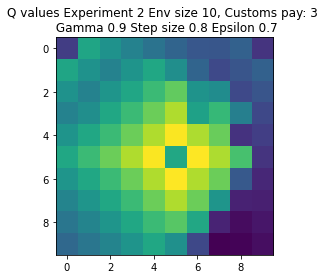

Expr:3 Eps:0 RunnAReward:-20.0 Reward:-384 Timesteps:1006 GotPack:True Utiltime:93 Customstime:382 Money:5
Expr:3 Eps:20 RunnAReward:-160.0 Reward:42 Timesteps:200 GotPack:False Utiltime:42 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-68.0 Reward:282 Timesteps:542 GotPack:True Utiltime:42 Customstime:159 Money:3
Expr:3 Eps:60 RunnAReward:68.0 Reward:366 Timesteps:524 GotPack:True Utiltime:48 Customstime:331 Money:4
Expr:3 Eps:80 RunnAReward:158.0 Reward:518 Timesteps:353 GotPack:True Utiltime:66 Customstime:320 Money:3
Expr:3 Eps:100 RunnAReward:156.0 Reward:242 Timesteps:516 GotPack:True Utiltime:268 Customstime:500 Money:3
Expr:3 Eps:120 RunnAReward:160.0 Reward:576 Timesteps:260 GotPack:True Utiltime:36 Customstime:224 Money:3
Expr:3 Eps:140 RunnAReward:260.0 Reward:293 Timesteps:616 GotPack:True Utiltime:210 Customstime:602 Money:3
Expr:3 Eps:160 RunnAReward:309.0 Reward:710 Timesteps:202 GotPack:True Utiltime:23 Customstime:190 Money:3
Expr:3 Eps:180 RunnAReward:534.0 Reward:7

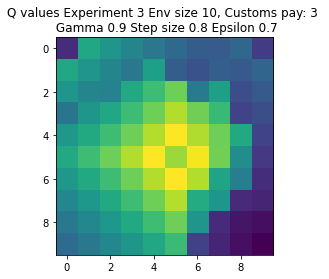

Expr:4 Eps:0 RunnAReward:-15.0 Reward:-292 Timesteps:887 GotPack:True Utiltime:650 Customstime:868 Money:3
Expr:4 Eps:20 RunnAReward:-427.0 Reward:-284 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-2.0 Reward:8 Timesteps:200 GotPack:False Utiltime:73 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-76.0 Reward:6 Timesteps:200 GotPack:False Utiltime:21 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:163.0 Reward:-73 Timesteps:856 GotPack:True Utiltime:78 Customstime:261 Money:4
Expr:4 Eps:100 RunnAReward:260.0 Reward:112 Timesteps:200 GotPack:False Utiltime:49 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:145.0 Reward:15 Timesteps:300 GotPack:False Utiltime:229 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:330.0 Reward:751 Timesteps:202 GotPack:True Utiltime:29 Customstime:117 Money:5
Expr:4 Eps:160 RunnAReward:383.0 Reward:797 Timesteps:163 GotPack:True Utiltime:63 Customstime:127 Money:5
Expr:4 Eps:180 RunnAReward:492.0 Reward:-82 Timest

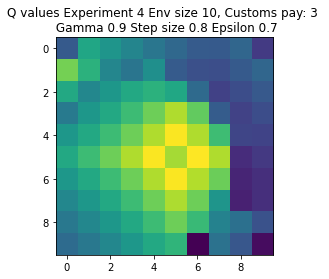

Expr:5 Eps:0 RunnAReward:-12.0 Reward:-225 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-332.0 Reward:-399 Timesteps:1058 GotPack:True Utiltime:881 Customstime:1010 Money:3
Expr:5 Eps:40 RunnAReward:-174.0 Reward:47 Timesteps:200 GotPack:False Utiltime:108 Customstime:0 Money:1
Expr:5 Eps:60 RunnAReward:164.0 Reward:370 Timesteps:500 GotPack:True Utiltime:67 Customstime:338 Money:4
Expr:5 Eps:80 RunnAReward:222.0 Reward:81 Timesteps:200 GotPack:False Utiltime:40 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:367.0 Reward:14 Timesteps:300 GotPack:False Utiltime:42 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:400.0 Reward:145 Timesteps:200 GotPack:False Utiltime:81 Customstime:0 Money:1
Expr:5 Eps:140 RunnAReward:693.0 Reward:771 Timesteps:197 GotPack:True Utiltime:35 Customstime:171 Money:4
Expr:5 Eps:160 RunnAReward:751.0 Reward:618 Timesteps:281 GotPack:True Utiltime:21 Customstime:58 Money:5
Expr:5 Eps:180 RunnAReward:609.0 Reward:813 T

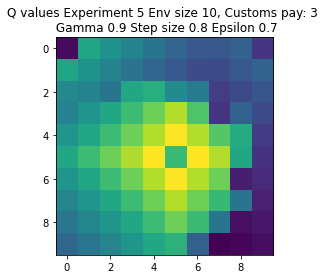

Expr:6 Eps:0 RunnAReward:-27.0 Reward:-532 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-301.0 Reward:-268 Timesteps:965 GotPack:True Utiltime:767 Customstime:837 Money:5
Expr:6 Eps:40 RunnAReward:-21.0 Reward:154 Timesteps:200 GotPack:False Utiltime:152 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:116.0 Reward:-107 Timesteps:400 GotPack:False Utiltime:85 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:243.0 Reward:680 Timesteps:278 GotPack:True Utiltime:83 Customstime:190 Money:4
Expr:6 Eps:100 RunnAReward:212.0 Reward:133 Timesteps:200 GotPack:False Utiltime:89 Customstime:0 Money:1
Expr:6 Eps:120 RunnAReward:172.0 Reward:99 Timesteps:200 GotPack:False Utiltime:69 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:177.0 Reward:0 Timesteps:200 GotPack:False Utiltime:42 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:389.0 Reward:-38 Timesteps:300 GotPack:False Utiltime:50 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:473.0 Reward:848 Time

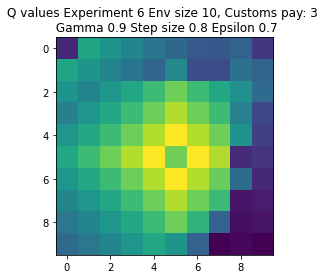

Expr:7 Eps:0 RunnAReward:-56.0 Reward:-1109 Timesteps:1472 GotPack:True Utiltime:814 Customstime:1226 Money:3
Expr:7 Eps:20 RunnAReward:-338.0 Reward:-320 Timesteps:900 GotPack:True Utiltime:241 Customstime:696 Money:3
Expr:7 Eps:40 RunnAReward:7.0 Reward:191 Timesteps:200 GotPack:False Utiltime:53 Customstime:0 Money:1
Expr:7 Eps:60 RunnAReward:279.0 Reward:663 Timesteps:264 GotPack:True Utiltime:208 Customstime:238 Money:3
Expr:7 Eps:80 RunnAReward:151.0 Reward:-322 Timesteps:1041 GotPack:True Utiltime:43 Customstime:297 Money:3
Expr:7 Eps:100 RunnAReward:248.0 Reward:-112 Timesteps:300 GotPack:False Utiltime:55 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:123.0 Reward:147 Timesteps:200 GotPack:False Utiltime:67 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:502.0 Reward:135 Timesteps:200 GotPack:False Utiltime:110 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:449.0 Reward:806 Timesteps:136 GotPack:True Utiltime:36 Customstime:92 Money:5
Expr:7 Eps:180 RunnAReward:611.0 Rewa

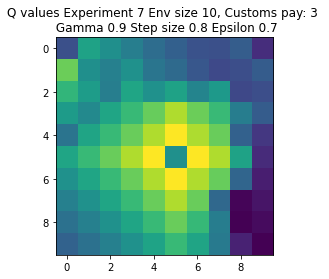

Expr:8 Eps:0 RunnAReward:-69.0 Reward:-1362 Timesteps:1693 GotPack:True Utiltime:939 Customstime:1048 Money:3
Expr:8 Eps:20 RunnAReward:-184.0 Reward:2 Timesteps:300 GotPack:False Utiltime:117 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-32.0 Reward:395 Timesteps:421 GotPack:True Utiltime:254 Customstime:409 Money:5
Expr:8 Eps:60 RunnAReward:71.0 Reward:89 Timesteps:200 GotPack:False Utiltime:142 Customstime:0 Money:1
Expr:8 Eps:80 RunnAReward:181.0 Reward:88 Timesteps:770 GotPack:True Utiltime:19 Customstime:295 Money:5
Expr:8 Eps:100 RunnAReward:276.0 Reward:126 Timesteps:200 GotPack:False Utiltime:10 Customstime:0 Money:1
Expr:8 Eps:120 RunnAReward:421.0 Reward:585 Timesteps:305 GotPack:True Utiltime:131 Customstime:163 Money:3
Expr:8 Eps:140 RunnAReward:218.0 Reward:109 Timesteps:200 GotPack:False Utiltime:73 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:436.0 Reward:793 Timesteps:174 GotPack:True Utiltime:36 Customstime:120 Money:4
Expr:8 Eps:180 RunnAReward:612.0 Reward:87

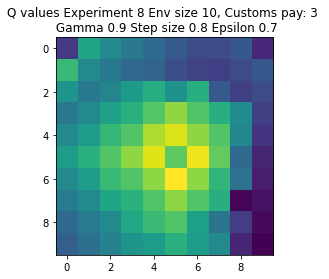

Expr:9 Eps:0 RunnAReward:-35.0 Reward:-699 Timesteps:1143 GotPack:True Utiltime:377 Customstime:672 Money:3
Expr:9 Eps:20 RunnAReward:-622.0 Reward:-140 Timesteps:300 GotPack:False Utiltime:91 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:38.0 Reward:186 Timesteps:660 GotPack:True Utiltime:61 Customstime:262 Money:4
Expr:9 Eps:60 RunnAReward:73.0 Reward:97 Timesteps:200 GotPack:False Utiltime:54 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:207.0 Reward:697 Timesteps:228 GotPack:True Utiltime:52 Customstime:170 Money:5
Expr:9 Eps:100 RunnAReward:330.0 Reward:-19 Timesteps:300 GotPack:False Utiltime:40 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:333.0 Reward:350 Timesteps:503 GotPack:True Utiltime:28 Customstime:87 Money:4
Expr:9 Eps:140 RunnAReward:369.0 Reward:-46 Timesteps:300 GotPack:False Utiltime:50 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:384.0 Reward:16 Timesteps:300 GotPack:False Utiltime:43 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:610.0 Reward:660 Time

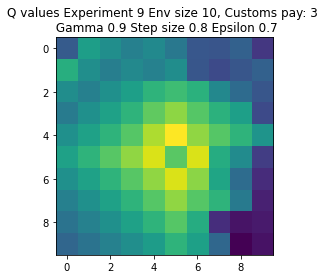

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.9 Step size 0.8 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-8.0 Reward:-160 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-221.0 Reward:-382 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-37.0 Reward:-180 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:51.0 Reward:-26 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-4.0 Reward:-71 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:112.0 Reward:291 Timesteps:100 GotPack:False Utiltime:62 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:143.0 Reward:151 Timesteps:200 GotPack:False Utiltime:53 Customstime:0 Mon

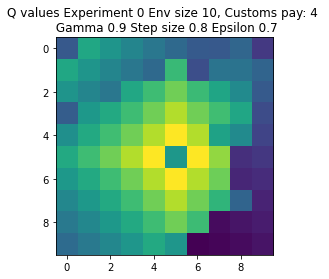

Expr:1 Eps:0 RunnAReward:-12.0 Reward:-224 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:20 RunnAReward:-251.0 Reward:-25 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-12.0 Reward:-265 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:60 RunnAReward:-25.0 Reward:-51 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-6.0 Reward:-46 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:137.0 Reward:-120 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:146.0 Reward:112 Timesteps:200 GotPack:False Utiltime:26 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:138.0 Reward:-91 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:158.0 Reward:-271 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:296.0 Reward:751 Timesteps:19

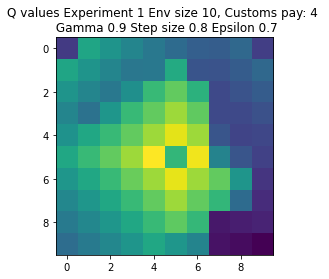

Expr:2 Eps:0 RunnAReward:-22.0 Reward:-435 Timesteps:1112 GotPack:True Utiltime:696 Customstime:810 Money:5
Expr:2 Eps:20 RunnAReward:-146.0 Reward:204 Timesteps:586 GotPack:True Utiltime:287 Customstime:372 Money:4
Expr:2 Eps:40 RunnAReward:-1.0 Reward:-36 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:28.0 Reward:-58 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:103.0 Reward:169 Timesteps:100 GotPack:False Utiltime:31 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:223.0 Reward:457 Timesteps:307 GotPack:True Utiltime:4 Customstime:203 Money:4
Expr:2 Eps:120 RunnAReward:231.0 Reward:259 Timesteps:100 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:186.0 Reward:-105 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:219.0 Reward:233 Timesteps:100 GotPack:False Utiltime:34 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:231.0 Reward:492 Times

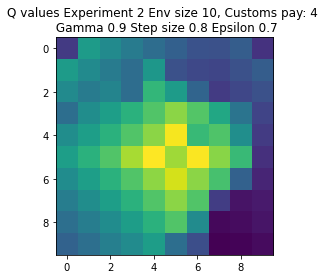

Expr:3 Eps:0 RunnAReward:-3.0 Reward:-44 Timesteps:804 GotPack:True Utiltime:169 Customstime:719 Money:5
Expr:3 Eps:20 RunnAReward:-220.0 Reward:275 Timesteps:100 GotPack:False Utiltime:51 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:22.0 Reward:222 Timesteps:100 GotPack:False Utiltime:50 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-84.0 Reward:-166 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:75.0 Reward:237 Timesteps:100 GotPack:False Utiltime:60 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:94.0 Reward:-27 Timesteps:200 GotPack:False Utiltime:129 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:237.0 Reward:248 Timesteps:100 GotPack:False Utiltime:45 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:288.0 Reward:422 Timesteps:421 GotPack:True Utiltime:331 Customstime:364 Money:5
Expr:3 Eps:160 RunnAReward:395.0 Reward:341 Timesteps:535 GotPack:True Utiltime:401 Customstime:511 Money:4
Expr:3 Eps:180 RunnAReward:100.0 Reward:3 Timest

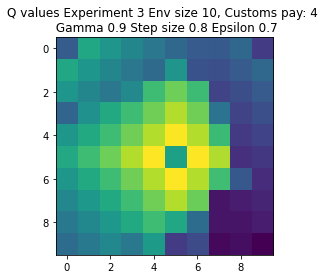

Expr:4 Eps:0 RunnAReward:-133.0 Reward:-2653 Timesteps:2655 GotPack:True Utiltime:1040 Customstime:1518 Money:4
Expr:4 Eps:20 RunnAReward:-260.0 Reward:86 Timesteps:731 GotPack:True Utiltime:244 Customstime:549 Money:4
Expr:4 Eps:40 RunnAReward:-149.0 Reward:-5 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:8.0 Reward:-221 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:126.0 Reward:270 Timesteps:100 GotPack:False Utiltime:28 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:284.0 Reward:804 Timesteps:120 GotPack:True Utiltime:47 Customstime:81 Money:5
Expr:4 Eps:120 RunnAReward:255.0 Reward:278 Timesteps:100 GotPack:False Utiltime:81 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:253.0 Reward:781 Timesteps:173 GotPack:True Utiltime:34 Customstime:160 Money:4
Expr:4 Eps:160 RunnAReward:319.0 Reward:255 Timesteps:100 GotPack:False Utiltime:60 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:311.0 Reward:234 

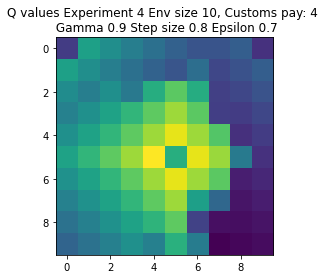

Expr:5 Eps:0 RunnAReward:-7.0 Reward:-135 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-162.0 Reward:-229 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:14.0 Reward:226 Timesteps:100 GotPack:False Utiltime:79 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:70.0 Reward:-307 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:50.0 Reward:-99 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:107.0 Reward:275 Timesteps:100 GotPack:False Utiltime:34 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:165.0 Reward:165 Timesteps:100 GotPack:False Utiltime:51 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:291.0 Reward:275 Timesteps:100 GotPack:False Utiltime:59 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:201.0 Reward:772 Timesteps:187 GotPack:True Utiltime:31 Customstime:96 Money:5
Expr:5 Eps:180 RunnAReward:260.0 Reward:185 Timesteps:10

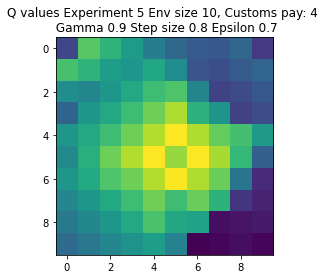

Expr:6 Eps:0 RunnAReward:-11.0 Reward:-210 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-96.0 Reward:166 Timesteps:200 GotPack:False Utiltime:148 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-102.0 Reward:269 Timesteps:100 GotPack:False Utiltime:89 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-56.0 Reward:-24 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:77.0 Reward:-21 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:323.0 Reward:103 Timesteps:200 GotPack:False Utiltime:63 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:419.0 Reward:253 Timesteps:100 GotPack:False Utiltime:89 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:365.0 Reward:70 Timesteps:200 GotPack:False Utiltime:47 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:478.0 Reward:613 Timesteps:262 GotPack:True Utiltime:22 Customstime:172 Money:4
Expr:6 Eps:180 RunnAReward:658.0 Reward:799 Timesteps

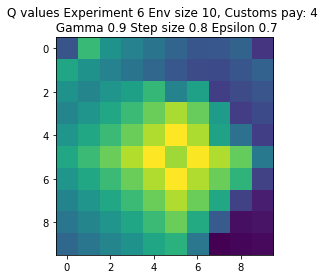

Expr:7 Eps:0 RunnAReward:-27.0 Reward:-521 Timesteps:982 GotPack:True Utiltime:401 Customstime:589 Money:4
Expr:7 Eps:20 RunnAReward:-119.0 Reward:271 Timesteps:453 GotPack:True Utiltime:64 Customstime:389 Money:4
Expr:7 Eps:40 RunnAReward:-112.0 Reward:-88 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:9.0 Reward:254 Timesteps:100 GotPack:False Utiltime:43 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:127.0 Reward:562 Timesteps:298 GotPack:True Utiltime:1 Customstime:181 Money:5
Expr:7 Eps:100 RunnAReward:127.0 Reward:286 Timesteps:100 GotPack:False Utiltime:38 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:142.0 Reward:-217 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:158.0 Reward:362 Timesteps:445 GotPack:True Utiltime:181 Customstime:411 Money:5
Expr:7 Eps:160 RunnAReward:284.0 Reward:284 Timesteps:100 GotPack:False Utiltime:19 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:187.0 Reward:256 Tim

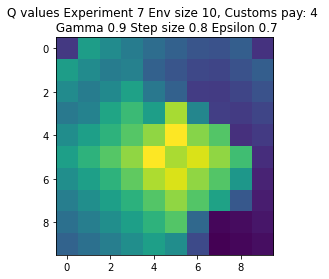

Expr:8 Eps:0 RunnAReward:-3.0 Reward:-54 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-266.0 Reward:145 Timesteps:100 GotPack:False Utiltime:60 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-39.0 Reward:120 Timesteps:100 GotPack:False Utiltime:35 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:130.0 Reward:231 Timesteps:100 GotPack:False Utiltime:92 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:144.0 Reward:-68 Timesteps:300 GotPack:False Utiltime:58 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:138.0 Reward:162 Timesteps:100 GotPack:False Utiltime:21 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:181.0 Reward:142 Timesteps:200 GotPack:False Utiltime:87 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:70.0 Reward:26 Timesteps:200 GotPack:False Utiltime:160 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:191.0 Reward:257 Timesteps:100 GotPack:False Utiltime:24 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:180.0 Reward:246 Timesteps:

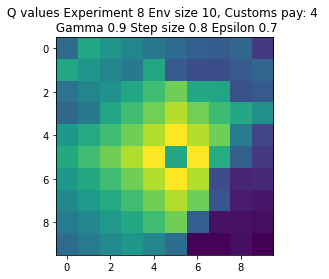

Expr:9 Eps:0 RunnAReward:-6.0 Reward:-120 Timesteps:300 GotPack:False Utiltime:256 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-192.0 Reward:-564 Timesteps:1099 GotPack:True Utiltime:534 Customstime:795 Money:4
Expr:9 Eps:40 RunnAReward:-221.0 Reward:232 Timesteps:100 GotPack:False Utiltime:81 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:77.0 Reward:27 Timesteps:200 GotPack:False Utiltime:77 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:291.0 Reward:347 Timesteps:355 GotPack:True Utiltime:147 Customstime:241 Money:5
Expr:9 Eps:100 RunnAReward:257.0 Reward:-84 Timesteps:200 GotPack:False Utiltime:53 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:251.0 Reward:83 Timesteps:200 GotPack:False Utiltime:41 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:298.0 Reward:225 Timesteps:100 GotPack:False Utiltime:57 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:250.0 Reward:-62 Timesteps:300 GotPack:False Utiltime:62 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:289.0 Reward:832 Ti

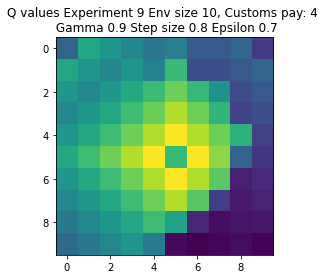

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.9 Step size 0.8 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-24.0 Reward:-476 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:20 RunnAReward:-346.0 Reward:-44 Timesteps:300 GotPack:False Utiltime:107 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-461.0 Reward:75 Timesteps:200 GotPack:False Utiltime:66 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-133.0 Reward:104 Timesteps:200 GotPack:False Utiltime:194 Customstime:0 Money:1
Expr:0 Eps:80 RunnAReward:-102.0 Reward:-248 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-134.0 Reward:97 Timesteps:200 GotPack:False Utiltime:142 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:-154.0 Reward:-84 Timesteps:300 GotPack:False Utiltime:57 Custom

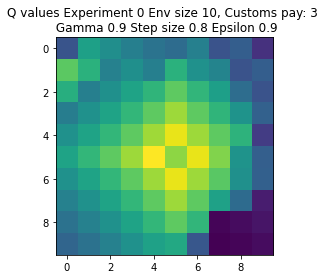

Expr:1 Eps:0 RunnAReward:-2.0 Reward:-35 Timesteps:300 GotPack:False Utiltime:170 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-376.0 Reward:-608 Timesteps:1188 GotPack:True Utiltime:310 Customstime:437 Money:3
Expr:1 Eps:40 RunnAReward:-274.0 Reward:-35 Timesteps:300 GotPack:False Utiltime:169 Customstime:0 Money:2
Expr:1 Eps:60 RunnAReward:-279.0 Reward:244 Timesteps:579 GotPack:True Utiltime:315 Customstime:400 Money:4
Expr:1 Eps:80 RunnAReward:-182.0 Reward:-411 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:-42.0 Reward:-390 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:120 RunnAReward:60.0 Reward:10 Timesteps:300 GotPack:False Utiltime:232 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:56.0 Reward:91 Timesteps:200 GotPack:False Utiltime:148 Customstime:0 Money:1
Expr:1 Eps:160 RunnAReward:46.0 Reward:83 Timesteps:200 GotPack:False Utiltime:44 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:225.0 Reward:550 T

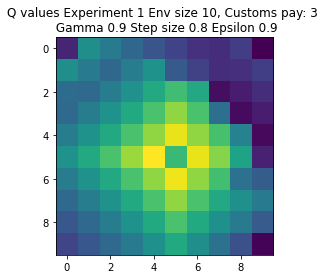

Expr:2 Eps:0 RunnAReward:-12.0 Reward:-223 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-370.0 Reward:28 Timesteps:200 GotPack:False Utiltime:171 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-267.0 Reward:51 Timesteps:200 GotPack:False Utiltime:121 Customstime:0 Money:1
Expr:2 Eps:60 RunnAReward:-162.0 Reward:-641 Timesteps:1310 GotPack:True Utiltime:782 Customstime:947 Money:5
Expr:2 Eps:80 RunnAReward:-262.0 Reward:-276 Timesteps:400 GotPack:False Utiltime:103 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:2.0 Reward:162 Timesteps:728 GotPack:True Utiltime:80 Customstime:516 Money:4
Expr:2 Eps:120 RunnAReward:87.0 Reward:490 Timesteps:401 GotPack:True Utiltime:151 Customstime:334 Money:3
Expr:2 Eps:140 RunnAReward:156.0 Reward:80 Timesteps:300 GotPack:False Utiltime:211 Customstime:0 Money:2
Expr:2 Eps:160 RunnAReward:189.0 Reward:51 Timesteps:200 GotPack:False Utiltime:176 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:88.0 Reward:352

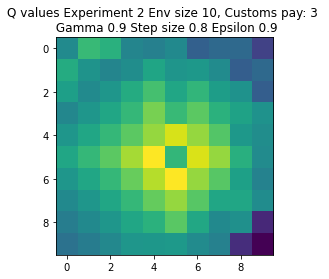

Expr:3 Eps:0 RunnAReward:-12.0 Reward:-228 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-416.0 Reward:-189 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-101.0 Reward:-794 Timesteps:500 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-144.0 Reward:-202 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-196.0 Reward:-239 Timesteps:400 GotPack:False Utiltime:137 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:27.0 Reward:-382 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:3 Eps:120 RunnAReward:31.0 Reward:70 Timesteps:200 GotPack:False Utiltime:47 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:75.0 Reward:-9 Timesteps:300 GotPack:False Utiltime:71 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:173.0 Reward:641 Timesteps:288 GotPack:True Utiltime:91 Customstime:194 Money:3
Expr:3 Eps:180 RunnAReward:202.0 Reward:-37 Timest

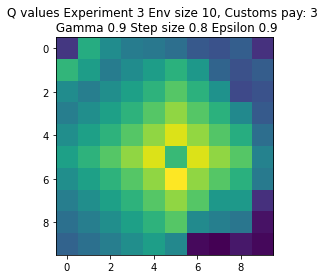

Expr:4 Eps:0 RunnAReward:-51.0 Reward:-1003 Timesteps:1399 GotPack:True Utiltime:497 Customstime:578 Money:5
Expr:4 Eps:20 RunnAReward:-666.0 Reward:-234 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-259.0 Reward:-252 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-86.0 Reward:134 Timesteps:200 GotPack:False Utiltime:182 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-69.0 Reward:-75 Timesteps:400 GotPack:False Utiltime:51 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:62.0 Reward:-225 Timesteps:400 GotPack:False Utiltime:184 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-49.0 Reward:544 Timesteps:293 GotPack:True Utiltime:115 Customstime:190 Money:4
Expr:4 Eps:140 RunnAReward:106.0 Reward:116 Timesteps:200 GotPack:False Utiltime:50 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:154.0 Reward:122 Timesteps:200 GotPack:False Utiltime:34 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:222.0 Reward:5

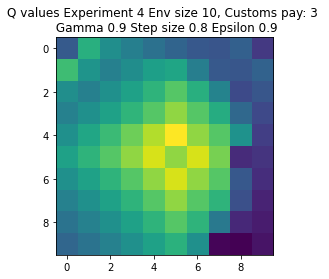

Expr:5 Eps:0 RunnAReward:-50.0 Reward:-991 Timesteps:1366 GotPack:True Utiltime:573 Customstime:673 Money:4
Expr:5 Eps:20 RunnAReward:-475.0 Reward:-1551 Timesteps:1697 GotPack:True Utiltime:1546 Customstime:1671 Money:3
Expr:5 Eps:40 RunnAReward:-293.0 Reward:25 Timesteps:300 GotPack:False Utiltime:241 Customstime:0 Money:1
Expr:5 Eps:60 RunnAReward:-142.0 Reward:-162 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:-157.0 Reward:262 Timesteps:607 GotPack:True Utiltime:230 Customstime:514 Money:3
Expr:5 Eps:100 RunnAReward:-40.0 Reward:45 Timesteps:200 GotPack:False Utiltime:111 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-11.0 Reward:-55 Timesteps:300 GotPack:False Utiltime:11 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:74.0 Reward:24 Timesteps:200 GotPack:False Utiltime:41 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:158.0 Reward:96 Timesteps:200 GotPack:False Utiltime:42 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:135.0 Rewar

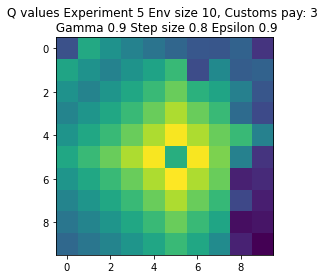

Expr:6 Eps:0 RunnAReward:14.0 Reward:289 Timesteps:436 GotPack:True Utiltime:105 Customstime:194 Money:5
Expr:6 Eps:20 RunnAReward:-273.0 Reward:-308 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-306.0 Reward:-496 Timesteps:600 GotPack:False Utiltime:76 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-331.0 Reward:701 Timesteps:173 GotPack:True Utiltime:7 Customstime:148 Money:5
Expr:6 Eps:80 RunnAReward:13.0 Reward:-141 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-83.0 Reward:199 Timesteps:549 GotPack:True Utiltime:3 Customstime:480 Money:3
Expr:6 Eps:120 RunnAReward:58.0 Reward:150 Timesteps:200 GotPack:False Utiltime:67 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:-25.0 Reward:-183 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:9.0 Reward:355 Timesteps:545 GotPack:True Utiltime:211 Customstime:333 Money:3
Expr:6 Eps:180 RunnAReward:197.0 Reward:596 Times

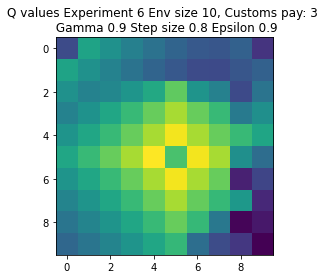

Expr:7 Eps:0 RunnAReward:18.0 Reward:366 Timesteps:382 GotPack:True Utiltime:36 Customstime:328 Money:3
Expr:7 Eps:20 RunnAReward:-600.0 Reward:-1058 Timesteps:1453 GotPack:True Utiltime:371 Customstime:839 Money:3
Expr:7 Eps:40 RunnAReward:-223.0 Reward:-151 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-149.0 Reward:-204 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:80 RunnAReward:-169.0 Reward:190 Timesteps:496 GotPack:True Utiltime:350 Customstime:447 Money:3
Expr:7 Eps:100 RunnAReward:48.0 Reward:-180 Timesteps:917 GotPack:True Utiltime:332 Customstime:400 Money:4
Expr:7 Eps:120 RunnAReward:53.0 Reward:358 Timesteps:473 GotPack:True Utiltime:115 Customstime:282 Money:3
Expr:7 Eps:140 RunnAReward:217.0 Reward:306 Timesteps:565 GotPack:True Utiltime:40 Customstime:515 Money:3
Expr:7 Eps:160 RunnAReward:125.0 Reward:-20 Timesteps:300 GotPack:False Utiltime:113 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:175.0 Rew

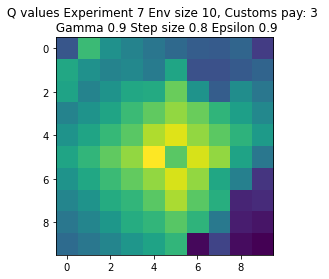

Expr:8 Eps:0 RunnAReward:-14.0 Reward:-279 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-223.0 Reward:-197 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-252.0 Reward:585 Timesteps:333 GotPack:True Utiltime:214 Customstime:256 Money:5
Expr:8 Eps:60 RunnAReward:-151.0 Reward:-99 Timesteps:300 GotPack:False Utiltime:154 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:22.0 Reward:-154 Timesteps:859 GotPack:True Utiltime:61 Customstime:280 Money:3
Expr:8 Eps:100 RunnAReward:-106.0 Reward:-317 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-77.0 Reward:-54 Timesteps:300 GotPack:False Utiltime:94 Customstime:0 Money:1
Expr:8 Eps:140 RunnAReward:69.0 Reward:592 Timesteps:323 GotPack:True Utiltime:162 Customstime:299 Money:3
Expr:8 Eps:160 RunnAReward:263.0 Reward:-213 Timesteps:851 GotPack:True Utiltime:36 Customstime:212 Money:3
Expr:8 Eps:180 RunnAReward:169.0 Reward:4

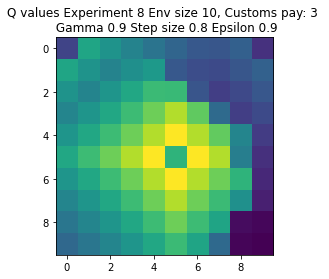

Expr:9 Eps:0 RunnAReward:-95.0 Reward:-1887 Timesteps:1913 GotPack:True Utiltime:692 Customstime:1050 Money:5
Expr:9 Eps:20 RunnAReward:-600.0 Reward:65 Timesteps:200 GotPack:False Utiltime:5 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-265.0 Reward:-182 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:33.0 Reward:-116 Timesteps:721 GotPack:True Utiltime:349 Customstime:543 Money:4
Expr:9 Eps:80 RunnAReward:-61.0 Reward:114 Timesteps:200 GotPack:False Utiltime:125 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-80.0 Reward:70 Timesteps:300 GotPack:False Utiltime:59 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:58.0 Reward:214 Timesteps:534 GotPack:True Utiltime:334 Customstime:460 Money:3
Expr:9 Eps:140 RunnAReward:127.0 Reward:318 Timesteps:446 GotPack:True Utiltime:139 Customstime:416 Money:3
Expr:9 Eps:160 RunnAReward:181.0 Reward:19 Timesteps:300 GotPack:False Utiltime:41 Customstime:0 Money:1
Expr:9 Eps:180 RunnAReward:109.0 Reward:-2

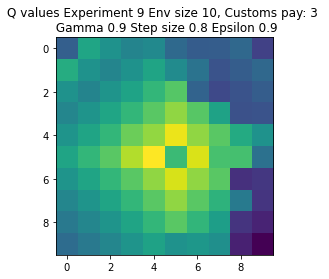

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.9 Step size 0.8 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-3.0 Reward:-46 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-99.0 Reward:-101 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-259.0 Reward:179 Timesteps:650 GotPack:True Utiltime:220 Customstime:254 Money:5
Expr:0 Eps:60 RunnAReward:-115.0 Reward:127 Timesteps:200 GotPack:False Utiltime:103 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:-42.0 Reward:-140 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-97.0 Reward:107 Timesteps:100 GotPack:False Utiltime:85 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:35.0 Reward:-29 Timesteps:100 GotPack:False Utiltime:0 Customstime:

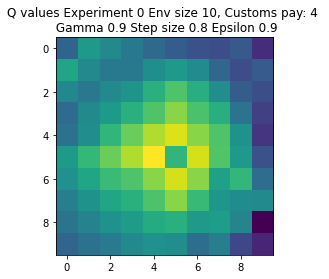

Expr:1 Eps:0 RunnAReward:-9.0 Reward:-169 Timesteps:300 GotPack:False Utiltime:91 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-197.0 Reward:-129 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-234.0 Reward:-726 Timesteps:1251 GotPack:True Utiltime:64 Customstime:671 Money:4
Expr:1 Eps:60 RunnAReward:-242.0 Reward:-291 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:-140.0 Reward:158 Timesteps:200 GotPack:False Utiltime:104 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:13.0 Reward:-114 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:2.0 Reward:184 Timesteps:100 GotPack:False Utiltime:97 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:106.0 Reward:150 Timesteps:100 GotPack:False Utiltime:9 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:93.0 Reward:55 Timesteps:200 GotPack:False Utiltime:140 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:71.0 Reward:-247 Times

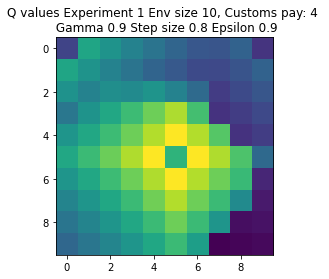

Expr:2 Eps:0 RunnAReward:-5.0 Reward:-100 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-309.0 Reward:-64 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-239.0 Reward:-164 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-52.0 Reward:59 Timesteps:200 GotPack:False Utiltime:85 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:-66.0 Reward:109 Timesteps:200 GotPack:False Utiltime:90 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:37.0 Reward:163 Timesteps:100 GotPack:False Utiltime:56 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:54.0 Reward:-85 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:94.0 Reward:-122 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:111.0 Reward:65 Timesteps:200 GotPack:False Utiltime:154 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:248.0 Reward:-129 Timesteps:10

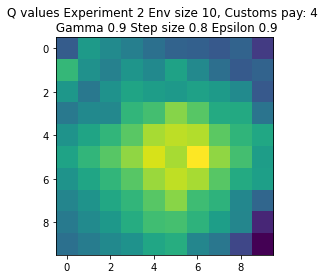

Expr:3 Eps:0 RunnAReward:-7.0 Reward:-131 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-254.0 Reward:-132 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:40 RunnAReward:-48.0 Reward:-322 Timesteps:878 GotPack:True Utiltime:670 Customstime:698 Money:5
Expr:3 Eps:60 RunnAReward:-169.0 Reward:-230 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:80 RunnAReward:-32.0 Reward:-104 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-17.0 Reward:-122 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:39.0 Reward:-173 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:88.0 Reward:-188 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:25.0 Reward:-240 Timesteps:400 GotPack:False Utiltime:233 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:-32.0 Reward:-190 Time

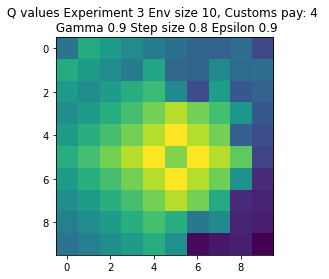

Expr:4 Eps:0 RunnAReward:13.0 Reward:278 Timesteps:100 GotPack:False Utiltime:32 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-120.0 Reward:-566 Timesteps:1017 GotPack:True Utiltime:860 Customstime:1005 Money:5
Expr:4 Eps:40 RunnAReward:-280.0 Reward:-51 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-271.0 Reward:-96 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-49.0 Reward:-119 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-11.0 Reward:130 Timesteps:100 GotPack:False Utiltime:46 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:84.0 Reward:598 Timesteps:351 GotPack:True Utiltime:27 Customstime:117 Money:5
Expr:4 Eps:140 RunnAReward:49.0 Reward:190 Timesteps:100 GotPack:False Utiltime:48 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:122.0 Reward:220 Timesteps:100 GotPack:False Utiltime:85 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:167.0 Reward:464 Time

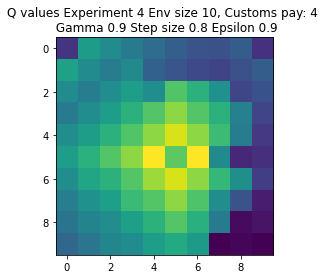

Expr:5 Eps:0 RunnAReward:-7.0 Reward:-132 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-338.0 Reward:156 Timesteps:100 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-116.0 Reward:-114 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-93.0 Reward:-100 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-123.0 Reward:46 Timesteps:200 GotPack:False Utiltime:176 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:128.0 Reward:389 Timesteps:456 GotPack:True Utiltime:61 Customstime:301 Money:5
Expr:5 Eps:120 RunnAReward:-19.0 Reward:-183 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:122.0 Reward:141 Timesteps:100 GotPack:False Utiltime:69 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:-66.0 Reward:-176 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:102.0 Reward:700 Times

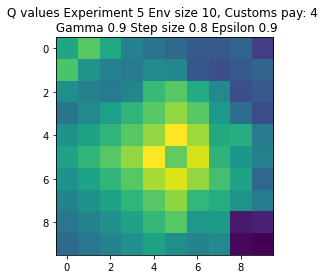

Expr:6 Eps:0 RunnAReward:-7.0 Reward:-128 Timesteps:300 GotPack:False Utiltime:56 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-280.0 Reward:45 Timesteps:200 GotPack:False Utiltime:195 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-220.0 Reward:0 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-111.0 Reward:31 Timesteps:200 GotPack:False Utiltime:34 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:17.0 Reward:-58 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-45.0 Reward:-138 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:61.0 Reward:307 Timesteps:554 GotPack:True Utiltime:184 Customstime:272 Money:5
Expr:6 Eps:140 RunnAReward:46.0 Reward:-168 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:29.0 Reward:81 Timesteps:200 GotPack:False Utiltime:131 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:69.0 Reward:161 Timesteps:100

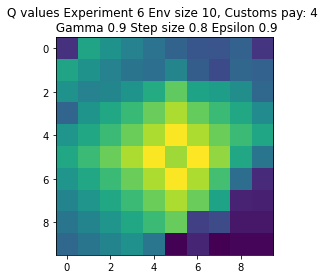

Expr:7 Eps:0 RunnAReward:-2.0 Reward:-24 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-237.0 Reward:-51 Timesteps:789 GotPack:True Utiltime:566 Customstime:708 Money:5
Expr:7 Eps:40 RunnAReward:-85.0 Reward:-55 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-89.0 Reward:238 Timesteps:100 GotPack:False Utiltime:80 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-105.0 Reward:-305 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:100 RunnAReward:20.0 Reward:-125 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:89.0 Reward:-120 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:10.0 Reward:246 Timesteps:100 GotPack:False Utiltime:93 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:171.0 Reward:-134 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:108.0 Reward:772 Timesteps:

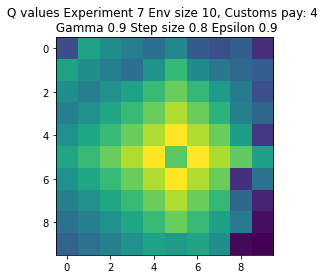

Expr:8 Eps:0 RunnAReward:-79.0 Reward:-1575 Timesteps:1762 GotPack:True Utiltime:829 Customstime:1146 Money:4
Expr:8 Eps:20 RunnAReward:-435.0 Reward:-136 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-191.0 Reward:45 Timesteps:200 GotPack:False Utiltime:41 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-46.0 Reward:199 Timesteps:100 GotPack:False Utiltime:79 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-5.0 Reward:-172 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-50.0 Reward:-74 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:8.0 Reward:146 Timesteps:100 GotPack:False Utiltime:14 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:104.0 Reward:185 Timesteps:100 GotPack:False Utiltime:68 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:88.0 Reward:-164 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:130.0 Reward:160 Timest

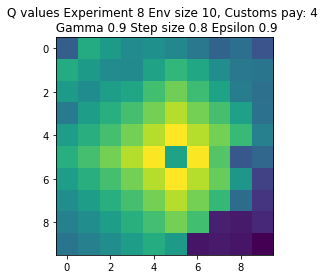

Expr:9 Eps:0 RunnAReward:-6.0 Reward:-110 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-162.0 Reward:-132 Timesteps:863 GotPack:True Utiltime:170 Customstime:459 Money:5
Expr:9 Eps:40 RunnAReward:-240.0 Reward:-228 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-311.0 Reward:-124 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-54.0 Reward:-161 Timesteps:948 GotPack:True Utiltime:584 Customstime:883 Money:5
Expr:9 Eps:100 RunnAReward:-48.0 Reward:-36 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:3.0 Reward:110 Timesteps:200 GotPack:False Utiltime:30 Customstime:0 Money:3
Expr:9 Eps:140 RunnAReward:-24.0 Reward:-136 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:-9.0 Reward:171 Timesteps:200 GotPack:False Utiltime:33 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:45.0 Reward:145 Times

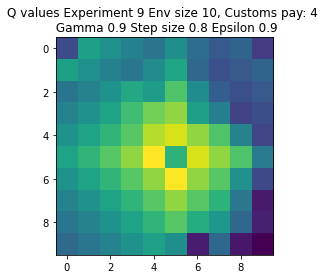

********************************************************************************************************
Env size 10, Customs pay: 3 Gamma 0.9 Step size 0.8 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-23.0 Reward:-445 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-677.0 Reward:-271 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-260.0 Reward:-976 Timesteps:1372 GotPack:True Utiltime:936 Customstime:1061 Money:3
Expr:0 Eps:60 RunnAReward:-476.0 Reward:-2354 Timesteps:2473 GotPack:True Utiltime:1432 Customstime:1758 Money:5
Expr:0 Eps:80 RunnAReward:-239.0 Reward:-265 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:100 RunnAReward:-347.0 Reward:156 Timesteps:200 GotPack:False Utiltime:126 Customstime:0 Money:1
Expr:0 Eps:120 RunnAReward:-170.0 Reward:-158 Timesteps:817 GotPack:True Utilti

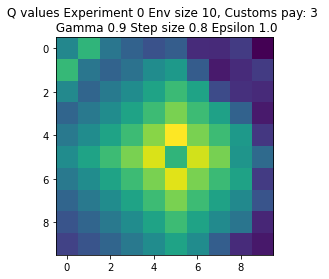

Expr:1 Eps:0 RunnAReward:-12.0 Reward:-221 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-390.0 Reward:-73 Timesteps:300 GotPack:False Utiltime:14 Customstime:0 Money:1
Expr:1 Eps:40 RunnAReward:-301.0 Reward:98 Timesteps:200 GotPack:False Utiltime:122 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-348.0 Reward:-1841 Timesteps:2150 GotPack:True Utiltime:1493 Customstime:1856 Money:4
Expr:1 Eps:80 RunnAReward:-279.0 Reward:-248 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:100 RunnAReward:-251.0 Reward:-281 Timesteps:1004 GotPack:True Utiltime:504 Customstime:726 Money:3
Expr:1 Eps:120 RunnAReward:-137.0 Reward:-318 Timesteps:956 GotPack:True Utiltime:750 Customstime:892 Money:3
Expr:1 Eps:140 RunnAReward:10.0 Reward:-151 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:-3.0 Reward:118 Timesteps:200 GotPack:False Utiltime:144 Customstime:0 Money:1
Expr:1 Eps:180 RunnAReward:-52.0 

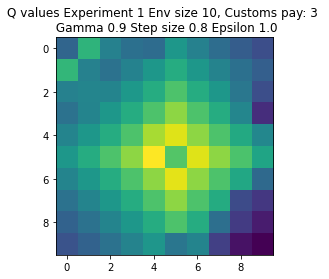

Expr:2 Eps:0 RunnAReward:-10.0 Reward:-186 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-269.0 Reward:-248 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-387.0 Reward:-11 Timesteps:200 GotPack:False Utiltime:16 Customstime:0 Money:1
Expr:2 Eps:60 RunnAReward:-443.0 Reward:-201 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:-229.0 Reward:230 Timesteps:527 GotPack:True Utiltime:293 Customstime:415 Money:5
Expr:2 Eps:100 RunnAReward:-155.0 Reward:-709 Timesteps:1161 GotPack:True Utiltime:302 Customstime:406 Money:5
Expr:2 Eps:120 RunnAReward:-233.0 Reward:107 Timesteps:200 GotPack:False Utiltime:41 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-90.0 Reward:-69 Timesteps:300 GotPack:False Utiltime:91 Customstime:0 Money:2
Expr:2 Eps:160 RunnAReward:-38.0 Reward:-265 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:68.0 Reward:1

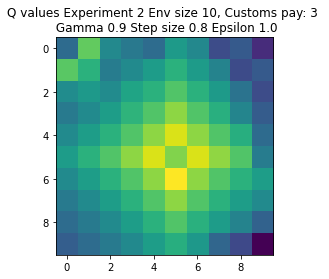

Expr:3 Eps:0 RunnAReward:-1.0 Reward:-13 Timesteps:200 GotPack:False Utiltime:88 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-711.0 Reward:76 Timesteps:687 GotPack:True Utiltime:181 Customstime:643 Money:4
Expr:3 Eps:40 RunnAReward:-241.0 Reward:-189 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-322.0 Reward:110 Timesteps:200 GotPack:False Utiltime:148 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-208.0 Reward:-217 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-174.0 Reward:-405 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-64.0 Reward:63 Timesteps:200 GotPack:False Utiltime:50 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-78.0 Reward:-52 Timesteps:300 GotPack:False Utiltime:202 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:-69.0 Reward:132 Timesteps:200 GotPack:False Utiltime:117 Customstime:0 Money:1
Expr:3 Eps:180 RunnAReward:35.0 Reward:24 Tim

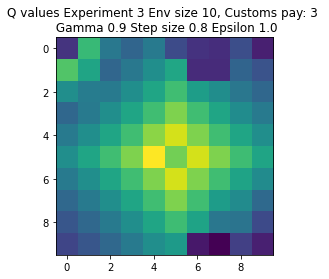

Expr:4 Eps:0 RunnAReward:-54.0 Reward:-1077 Timesteps:1527 GotPack:True Utiltime:882 Customstime:962 Money:3
Expr:4 Eps:20 RunnAReward:-674.0 Reward:-258 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:40 RunnAReward:-200.0 Reward:-193 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-270.0 Reward:-275 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:80 RunnAReward:-148.0 Reward:-59 Timesteps:300 GotPack:False Utiltime:69 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-155.0 Reward:-27 Timesteps:300 GotPack:False Utiltime:169 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:-121.0 Reward:37 Timesteps:200 GotPack:False Utiltime:79 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:-70.0 Reward:41 Timesteps:300 GotPack:False Utiltime:80 Customstime:0 Money:1
Expr:4 Eps:160 RunnAReward:98.0 Reward:135 Timesteps:200 GotPack:False Utiltime:153 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:204.0 Reward:55

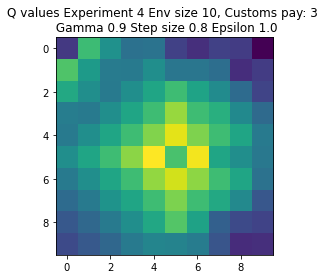

Expr:5 Eps:0 RunnAReward:-10.0 Reward:-197 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-567.0 Reward:-353 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-612.0 Reward:-265 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-404.0 Reward:-2998 Timesteps:3000 GotPack:False Utiltime:891 Customstime:1205 Money:5
Expr:5 Eps:80 RunnAReward:-387.0 Reward:-536 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:-99.0 Reward:77 Timesteps:200 GotPack:False Utiltime:50 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-52.0 Reward:-279 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:-47.0 Reward:151 Timesteps:607 GotPack:True Utiltime:262 Customstime:427 Money:3
Expr:5 Eps:160 RunnAReward:-40.0 Reward:191 Timesteps:200 GotPack:False Utiltime:88 Customstime:0 Money:1
Expr:5 Eps:180 RunnAReward:14.0 Reward:1

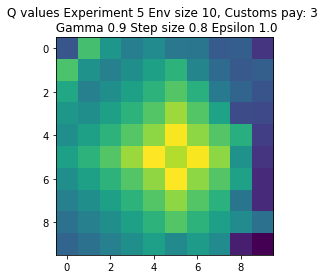

Expr:6 Eps:0 RunnAReward:3.0 Reward:78 Timesteps:689 GotPack:True Utiltime:460 Customstime:546 Money:3
Expr:6 Eps:20 RunnAReward:-882.0 Reward:-139 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-372.0 Reward:-439 Timesteps:911 GotPack:True Utiltime:453 Customstime:724 Money:4
Expr:6 Eps:60 RunnAReward:-498.0 Reward:-1870 Timesteps:2014 GotPack:True Utiltime:1225 Customstime:1473 Money:3
Expr:6 Eps:80 RunnAReward:-314.0 Reward:-278 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:100 RunnAReward:-161.0 Reward:50 Timesteps:200 GotPack:False Utiltime:179 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-424.0 Reward:-540 Timesteps:1116 GotPack:True Utiltime:522 Customstime:812 Money:4
Expr:6 Eps:140 RunnAReward:-18.0 Reward:80 Timesteps:200 GotPack:False Utiltime:57 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:-2.0 Reward:-68 Timesteps:300 GotPack:False Utiltime:111 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:63.0 Re

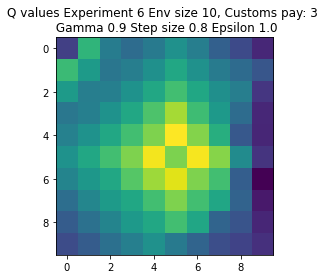

Expr:7 Eps:0 RunnAReward:-33.0 Reward:-652 Timesteps:1058 GotPack:True Utiltime:603 Customstime:885 Money:5
Expr:7 Eps:20 RunnAReward:-521.0 Reward:-1891 Timesteps:1861 GotPack:True Utiltime:169 Customstime:326 Money:5
Expr:7 Eps:40 RunnAReward:-705.0 Reward:-775 Timesteps:1178 GotPack:True Utiltime:535 Customstime:683 Money:3
Expr:7 Eps:60 RunnAReward:-432.0 Reward:-476 Timesteps:300 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-279.0 Reward:-10 Timesteps:200 GotPack:False Utiltime:34 Customstime:0 Money:1
Expr:7 Eps:100 RunnAReward:-231.0 Reward:77 Timesteps:200 GotPack:False Utiltime:53 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-6.0 Reward:-210 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-153.0 Reward:-13 Timesteps:300 GotPack:False Utiltime:74 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:29.0 Reward:80 Timesteps:773 GotPack:True Utiltime:353 Customstime:444 Money:5
Expr:7 Eps:180 RunnAReward:104.0 Re

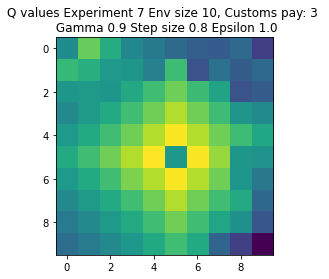

Expr:8 Eps:0 RunnAReward:2.0 Reward:45 Timesteps:200 GotPack:False Utiltime:5 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-315.0 Reward:-203 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-335.0 Reward:17 Timesteps:200 GotPack:False Utiltime:173 Customstime:0 Money:1
Expr:8 Eps:60 RunnAReward:-437.0 Reward:-32 Timesteps:300 GotPack:False Utiltime:278 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:-267.0 Reward:150 Timesteps:200 GotPack:False Utiltime:116 Customstime:0 Money:1
Expr:8 Eps:100 RunnAReward:-34.0 Reward:107 Timesteps:200 GotPack:False Utiltime:6 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-26.0 Reward:505 Timesteps:334 GotPack:True Utiltime:89 Customstime:316 Money:3
Expr:8 Eps:140 RunnAReward:44.0 Reward:-51 Timesteps:200 GotPack:False Utiltime:60 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:-72.0 Reward:40 Timesteps:200 GotPack:False Utiltime:56 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:66.0 Reward:122 Timesteps

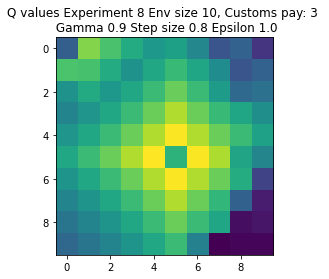

Expr:9 Eps:0 RunnAReward:-12.0 Reward:-240 Timesteps:932 GotPack:True Utiltime:31 Customstime:384 Money:5
Expr:9 Eps:20 RunnAReward:-332.0 Reward:-264 Timesteps:844 GotPack:True Utiltime:709 Customstime:816 Money:4
Expr:9 Eps:40 RunnAReward:-386.0 Reward:-1863 Timesteps:1969 GotPack:True Utiltime:1555 Customstime:1818 Money:3
Expr:9 Eps:60 RunnAReward:-469.0 Reward:-200 Timesteps:400 GotPack:False Utiltime:248 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:-365.0 Reward:-47 Timesteps:200 GotPack:False Utiltime:3 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-142.0 Reward:-259 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:-145.0 Reward:-35 Timesteps:825 GotPack:True Utiltime:43 Customstime:198 Money:5
Expr:9 Eps:140 RunnAReward:-5.0 Reward:-572 Timesteps:1185 GotPack:True Utiltime:35 Customstime:255 Money:5
Expr:9 Eps:160 RunnAReward:-41.0 Reward:-30 Timesteps:300 GotPack:False Utiltime:122 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:84

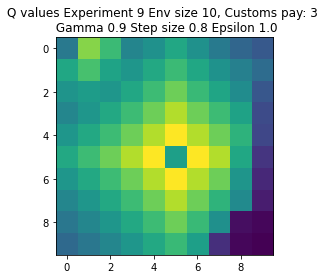

********************************************************************************************************
Env size 10, Customs pay: 4 Gamma 0.9 Step size 0.8 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-1.0 Reward:-19 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-223.0 Reward:-282 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:40 RunnAReward:-148.0 Reward:28 Timesteps:200 GotPack:False Utiltime:115 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-111.0 Reward:28 Timesteps:200 GotPack:False Utiltime:41 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:-148.0 Reward:-105 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-302.0 Reward:-151 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:-120.0 Reward:128 Timesteps:200 GotPack:False Utiltime:44 Customstim

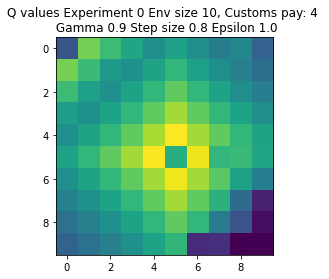

Expr:1 Eps:0 RunnAReward:-11.0 Reward:-205 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-190.0 Reward:-126 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-336.0 Reward:-80 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-369.0 Reward:45 Timesteps:200 GotPack:False Utiltime:15 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-129.0 Reward:-155 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-54.0 Reward:-302 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:-37.0 Reward:-139 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:20.0 Reward:656 Timesteps:240 GotPack:True Utiltime:158 Customstime:185 Money:5
Expr:1 Eps:160 RunnAReward:52.0 Reward:-176 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:116.0 Reward:-57 Timest

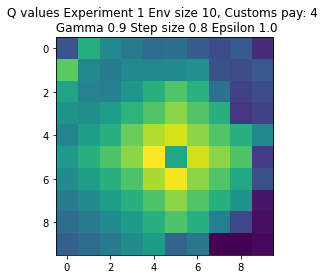

Expr:2 Eps:0 RunnAReward:-14.0 Reward:-267 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-391.0 Reward:-124 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-219.0 Reward:53 Timesteps:704 GotPack:True Utiltime:163 Customstime:398 Money:5
Expr:2 Eps:60 RunnAReward:-328.0 Reward:-75 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-63.0 Reward:-25 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-155.0 Reward:-1026 Timesteps:1449 GotPack:True Utiltime:1257 Customstime:1396 Money:4
Expr:2 Eps:120 RunnAReward:-90.0 Reward:37 Timesteps:200 GotPack:False Utiltime:142 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:-182.0 Reward:-204 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:160 RunnAReward:-11.0 Reward:457 Timesteps:360 GotPack:True Utiltime:276 Customstime:320 Money:4
Expr:2 Eps:180 RunnAReward:26.0 Reward:

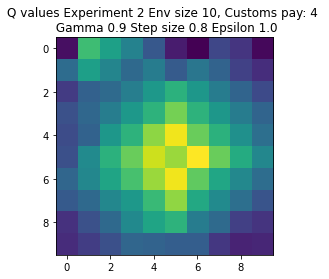

Expr:3 Eps:0 RunnAReward:-30.0 Reward:-589 Timesteps:500 GotPack:False Utiltime:293 Customstime:0 Money:3
Expr:3 Eps:20 RunnAReward:-469.0 Reward:-130 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-489.0 Reward:-392 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-368.0 Reward:-110 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-125.0 Reward:237 Timesteps:425 GotPack:True Utiltime:53 Customstime:116 Money:5
Expr:3 Eps:100 RunnAReward:-109.0 Reward:114 Timesteps:557 GotPack:True Utiltime:249 Customstime:279 Money:5
Expr:3 Eps:120 RunnAReward:-72.0 Reward:-295 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:-82.0 Reward:-507 Timesteps:1082 GotPack:True Utiltime:144 Customstime:322 Money:5
Expr:3 Eps:160 RunnAReward:-46.0 Reward:185 Timesteps:100 GotPack:False Utiltime:78 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:70.0 Reward

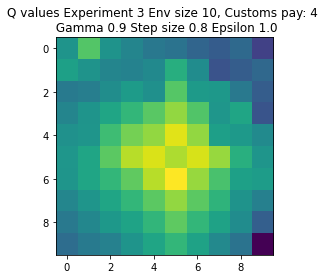

Expr:4 Eps:0 RunnAReward:-6.0 Reward:-113 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-116.0 Reward:-172 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-202.0 Reward:-115 Timesteps:200 GotPack:False Utiltime:163 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-182.0 Reward:75 Timesteps:200 GotPack:False Utiltime:106 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:-4.0 Reward:-130 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-203.0 Reward:-362 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:-214.0 Reward:261 Timesteps:100 GotPack:False Utiltime:44 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:-74.0 Reward:20 Timesteps:200 GotPack:False Utiltime:43 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:-24.0 Reward:-105 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:75.0 Reward:160 Times

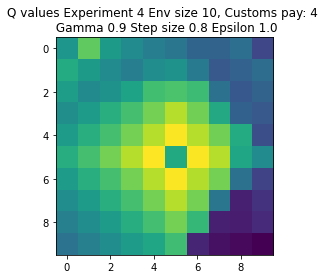

Expr:5 Eps:0 RunnAReward:-5.0 Reward:-100 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-208.0 Reward:-135 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-371.0 Reward:61 Timesteps:200 GotPack:False Utiltime:125 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-298.0 Reward:-968 Timesteps:1355 GotPack:True Utiltime:20 Customstime:290 Money:5
Expr:5 Eps:80 RunnAReward:-180.0 Reward:-251 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:-151.0 Reward:-210 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-35.0 Reward:-32 Timesteps:300 GotPack:False Utiltime:47 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:-5.0 Reward:-241 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:-10.0 Reward:57 Timesteps:200 GotPack:False Utiltime:100 Customstime:0 Money:2
Expr:5 Eps:180 RunnAReward:54.0 Reward:32 Time

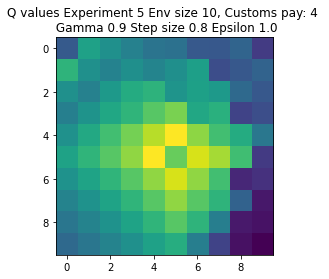

Expr:6 Eps:0 RunnAReward:-7.0 Reward:-122 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-151.0 Reward:-156 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-125.0 Reward:-32 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-304.0 Reward:162 Timesteps:100 GotPack:False Utiltime:61 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-95.0 Reward:-255 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:-87.0 Reward:106 Timesteps:716 GotPack:True Utiltime:417 Customstime:509 Money:5
Expr:6 Eps:120 RunnAReward:-33.0 Reward:-110 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:-54.0 Reward:-29 Timesteps:300 GotPack:False Utiltime:44 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:5.0 Reward:181 Timesteps:100 GotPack:False Utiltime:40 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:-24.0 Reward:500 Timeste

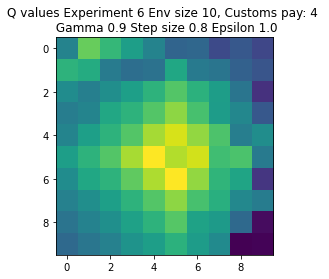

Expr:7 Eps:0 RunnAReward:-161.0 Reward:-3207 Timesteps:3000 GotPack:False Utiltime:2496 Customstime:2524 Money:5
Expr:7 Eps:20 RunnAReward:-496.0 Reward:-256 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:40 RunnAReward:-375.0 Reward:-123 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-134.0 Reward:-163 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-124.0 Reward:-148 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-138.0 Reward:-67 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:24.0 Reward:-163 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:-71.0 Reward:-524 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:-61.0 Reward:-220 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:74.0 Reward:1

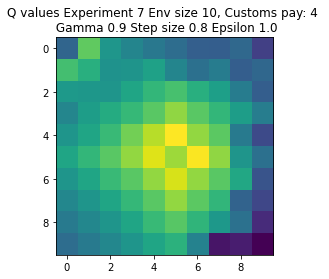

Expr:8 Eps:0 RunnAReward:-7.0 Reward:-139 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-424.0 Reward:-3167 Timesteps:2805 GotPack:True Utiltime:985 Customstime:1431 Money:4
Expr:8 Eps:40 RunnAReward:-306.0 Reward:-738 Timesteps:1329 GotPack:True Utiltime:1047 Customstime:1258 Money:4
Expr:8 Eps:60 RunnAReward:-450.0 Reward:575 Timesteps:343 GotPack:True Utiltime:283 Customstime:327 Money:4
Expr:8 Eps:80 RunnAReward:65.0 Reward:141 Timesteps:100 GotPack:False Utiltime:24 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-35.0 Reward:-233 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:120 RunnAReward:-46.0 Reward:4 Timesteps:200 GotPack:False Utiltime:75 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:-10.0 Reward:-105 Timesteps:300 GotPack:False Utiltime:164 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:75.0 Reward:283 Timesteps:100 GotPack:False Utiltime:43 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:24.0 Reward

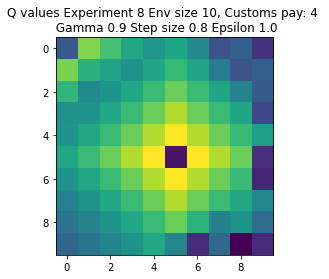

Expr:9 Eps:0 RunnAReward:0.0 Reward:0 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-373.0 Reward:-1220 Timesteps:1711 GotPack:True Utiltime:1468 Customstime:1625 Money:4
Expr:9 Eps:40 RunnAReward:-363.0 Reward:-110 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-328.0 Reward:-273 Timesteps:200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:-166.0 Reward:-150 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-156.0 Reward:-505 Timesteps:1061 GotPack:True Utiltime:55 Customstime:203 Money:4
Expr:9 Eps:120 RunnAReward:-92.0 Reward:469 Timesteps:380 GotPack:True Utiltime:194 Customstime:217 Money:4
Expr:9 Eps:140 RunnAReward:31.0 Reward:-52 Timesteps:100 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:-10.0 Reward:200 Timesteps:100 GotPack:False Utiltime:57 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:112.0 Reward:19

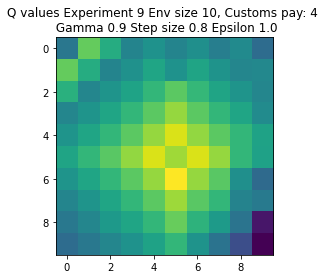

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.7 Step size 0.4 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-30.0 Reward:-584 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-1031.0 Reward:-3722 Timesteps:4876 GotPack:True Utiltime:1305 Customstime:1684 Money:4
Expr:0 Eps:40 RunnAReward:-544.0 Reward:269 Timesteps:450 GotPack:False Utiltime:411 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:52.0 Reward:78 Timesteps:675 GotPack:False Utiltime:300 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:-3.0 Reward:771 Timesteps:1042 GotPack:True Utiltime:299 Customstime:808 Money:3
Expr:0 Eps:100 RunnAReward:161.0 Reward:-324 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:120 RunnAReward:105.0 Reward:-176 Timesteps:675 GotPack:False Utiltime:636

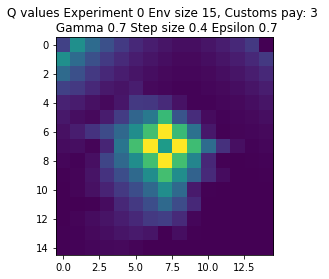

Expr:1 Eps:0 RunnAReward:-14.0 Reward:-276 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-568.0 Reward:-383 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-482.0 Reward:-364 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-288.0 Reward:366 Timesteps:450 GotPack:False Utiltime:94 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:16.0 Reward:1125 Timesteps:698 GotPack:True Utiltime:252 Customstime:293 Money:5
Expr:1 Eps:100 RunnAReward:379.0 Reward:-1101 Timesteps:2833 GotPack:True Utiltime:255 Customstime:567 Money:3
Expr:1 Eps:120 RunnAReward:285.0 Reward:-653 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:422.0 Reward:215 Timesteps:450 GotPack:False Utiltime:215 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:462.0 Reward:336 Timesteps:450 GotPack:False Utiltime:99 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:456.0 Reward:1

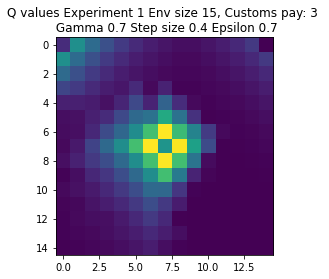

Expr:2 Eps:0 RunnAReward:5.0 Reward:102 Timesteps:450 GotPack:False Utiltime:362 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-677.0 Reward:-320 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:40 RunnAReward:-365.0 Reward:-341 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-70.0 Reward:1098 Timesteps:1086 GotPack:True Utiltime:266 Customstime:438 Money:3
Expr:2 Eps:80 RunnAReward:58.0 Reward:766 Timesteps:915 GotPack:True Utiltime:123 Customstime:355 Money:5
Expr:2 Eps:100 RunnAReward:365.0 Reward:-751 Timesteps:1964 GotPack:True Utiltime:937 Customstime:977 Money:3
Expr:2 Eps:120 RunnAReward:-11.0 Reward:969 Timesteps:1043 GotPack:True Utiltime:101 Customstime:363 Money:5
Expr:2 Eps:140 RunnAReward:651.0 Reward:321 Timesteps:450 GotPack:False Utiltime:259 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:390.0 Reward:1666 Timesteps:496 GotPack:True Utiltime:73 Customstime:354 Money:4
Expr:2 Eps:180 RunnAReward:566.0 Rew

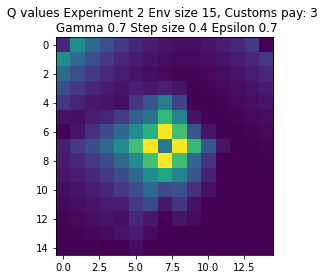

Expr:3 Eps:0 RunnAReward:-30.0 Reward:-600 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-711.0 Reward:-503 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:40 RunnAReward:-238.0 Reward:-1411 Timesteps:2832 GotPack:True Utiltime:775 Customstime:1171 Money:5
Expr:3 Eps:60 RunnAReward:-320.0 Reward:-240 Timesteps:675 GotPack:False Utiltime:25 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:88.0 Reward:299 Timesteps:450 GotPack:False Utiltime:66 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:155.0 Reward:666 Timesteps:1327 GotPack:True Utiltime:110 Customstime:574 Money:3
Expr:3 Eps:120 RunnAReward:334.0 Reward:309 Timesteps:450 GotPack:False Utiltime:56 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:408.0 Reward:58 Timesteps:675 GotPack:False Utiltime:182 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:259.0 Reward:312 Timesteps:450 GotPack:False Utiltime:111 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:424.0 Reward

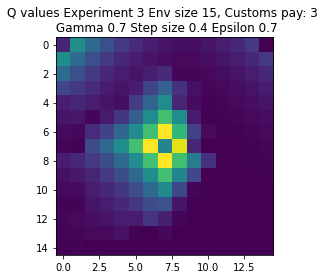

Expr:4 Eps:0 RunnAReward:-28.0 Reward:-555 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-781.0 Reward:-3746 Timesteps:4781 GotPack:True Utiltime:587 Customstime:665 Money:3
Expr:4 Eps:40 RunnAReward:-540.0 Reward:-5 Timesteps:675 GotPack:False Utiltime:427 Customstime:0 Money:1
Expr:4 Eps:60 RunnAReward:-138.0 Reward:-368 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:80 RunnAReward:-195.0 Reward:120 Timesteps:450 GotPack:False Utiltime:197 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-110.0 Reward:-1256 Timesteps:2850 GotPack:True Utiltime:2225 Customstime:2488 Money:4
Expr:4 Eps:120 RunnAReward:207.0 Reward:311 Timesteps:450 GotPack:False Utiltime:382 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:172.0 Reward:9 Timesteps:675 GotPack:False Utiltime:71 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:740.0 Reward:106 Timesteps:675 GotPack:False Utiltime:133 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:616.0 R

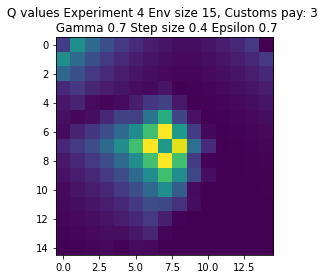

Expr:5 Eps:0 RunnAReward:-41.0 Reward:-815 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-999.0 Reward:-54 Timesteps:450 GotPack:False Utiltime:219 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-43.0 Reward:-1055 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-120.0 Reward:1453 Timesteps:468 GotPack:True Utiltime:29 Customstime:421 Money:5
Expr:5 Eps:80 RunnAReward:194.0 Reward:588 Timesteps:1247 GotPack:True Utiltime:1061 Customstime:1129 Money:3
Expr:5 Eps:100 RunnAReward:-38.0 Reward:105 Timesteps:450 GotPack:False Utiltime:139 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:18.0 Reward:410 Timesteps:450 GotPack:False Utiltime:197 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:335.0 Reward:-23 Timesteps:1601 GotPack:True Utiltime:1250 Customstime:1301 Money:4
Expr:5 Eps:160 RunnAReward:390.0 Reward:1073 Timesteps:804 GotPack:True Utiltime:137 Customstime:273 Money:4
Expr:5 Eps:180 RunnAReward:720.0

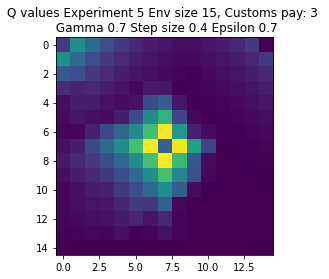

Expr:6 Eps:0 RunnAReward:-41.0 Reward:-805 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-1126.0 Reward:-413 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-793.0 Reward:-3072 Timesteps:4273 GotPack:True Utiltime:884 Customstime:1065 Money:3
Expr:6 Eps:60 RunnAReward:-340.0 Reward:274 Timesteps:450 GotPack:False Utiltime:68 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:194.0 Reward:368 Timesteps:450 GotPack:False Utiltime:285 Customstime:0 Money:1
Expr:6 Eps:100 RunnAReward:350.0 Reward:1293 Timesteps:847 GotPack:True Utiltime:3 Customstime:222 Money:4
Expr:6 Eps:120 RunnAReward:381.0 Reward:117 Timesteps:450 GotPack:False Utiltime:137 Customstime:0 Money:1
Expr:6 Eps:140 RunnAReward:322.0 Reward:563 Timesteps:1218 GotPack:True Utiltime:98 Customstime:863 Money:3
Expr:6 Eps:160 RunnAReward:266.0 Reward:-60 Timesteps:900 GotPack:False Utiltime:408 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:885.0 Rew

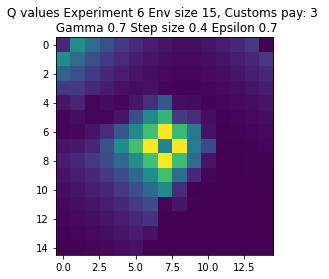

Expr:7 Eps:0 RunnAReward:-37.0 Reward:-731 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-757.0 Reward:-280 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:40 RunnAReward:-799.0 Reward:-513 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:64.0 Reward:349 Timesteps:450 GotPack:False Utiltime:3 Customstime:0 Money:1
Expr:7 Eps:80 RunnAReward:-26.0 Reward:81 Timesteps:450 GotPack:False Utiltime:124 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:523.0 Reward:20 Timesteps:450 GotPack:False Utiltime:91 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:239.0 Reward:-468 Timesteps:1977 GotPack:True Utiltime:557 Customstime:764 Money:5
Expr:7 Eps:140 RunnAReward:196.0 Reward:399 Timesteps:450 GotPack:False Utiltime:12 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:513.0 Reward:276 Timesteps:450 GotPack:False Utiltime:1 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:554.0 Reward:1549 Times

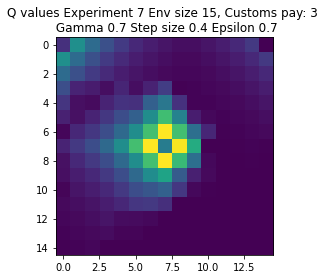

Expr:8 Eps:0 RunnAReward:-156.0 Reward:-3116 Timesteps:3873 GotPack:True Utiltime:2569 Customstime:3136 Money:4
Expr:8 Eps:20 RunnAReward:-654.0 Reward:-760 Timesteps:2162 GotPack:True Utiltime:42 Customstime:1974 Money:3
Expr:8 Eps:40 RunnAReward:-442.0 Reward:-775 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-325.0 Reward:-2249 Timesteps:3625 GotPack:True Utiltime:68 Customstime:583 Money:3
Expr:8 Eps:80 RunnAReward:-29.0 Reward:80 Timesteps:675 GotPack:False Utiltime:50 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:40.0 Reward:-274 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:120 RunnAReward:42.0 Reward:300 Timesteps:1343 GotPack:True Utiltime:1180 Customstime:1261 Money:5
Expr:8 Eps:140 RunnAReward:393.0 Reward:341 Timesteps:450 GotPack:False Utiltime:23 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:578.0 Reward:76 Timesteps:675 GotPack:False Utiltime:36 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:834.0

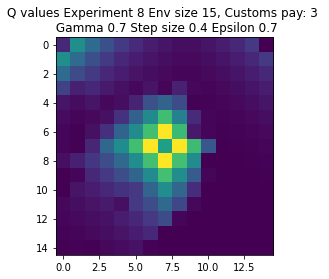

Expr:9 Eps:0 RunnAReward:-145.0 Reward:-2899 Timesteps:3857 GotPack:True Utiltime:3545 Customstime:3684 Money:5
Expr:9 Eps:20 RunnAReward:-742.0 Reward:-27 Timesteps:450 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-405.0 Reward:37 Timesteps:675 GotPack:False Utiltime:584 Customstime:0 Money:1
Expr:9 Eps:60 RunnAReward:-377.0 Reward:410 Timesteps:1465 GotPack:True Utiltime:75 Customstime:420 Money:5
Expr:9 Eps:80 RunnAReward:-105.0 Reward:-355 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:144.0 Reward:-864 Timesteps:2516 GotPack:True Utiltime:92 Customstime:549 Money:3
Expr:9 Eps:120 RunnAReward:419.0 Reward:1106 Timesteps:834 GotPack:True Utiltime:420 Customstime:574 Money:3
Expr:9 Eps:140 RunnAReward:410.0 Reward:1623 Timesteps:487 GotPack:True Utiltime:98 Customstime:137 Money:5
Expr:9 Eps:160 RunnAReward:382.0 Reward:1213 Timesteps:828 GotPack:True Utiltime:229 Customstime:664 Money:3
Expr:9 Eps:180 RunnAReward:

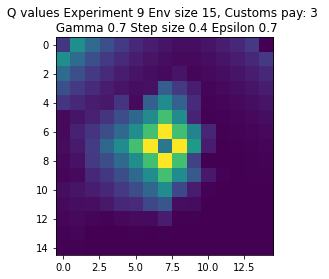

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.7 Step size 0.4 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-16.0 Reward:-316 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-380.0 Reward:-8 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-228.0 Reward:-241 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-125.0 Reward:-42 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-23.0 Reward:375 Timesteps:450 GotPack:False Utiltime:217 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:229.0 Reward:405 Timesteps:225 GotPack:False Utiltime:131 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:149.0 Reward:-360 Timesteps:450 GotPack:False Utiltime:0 Customstime

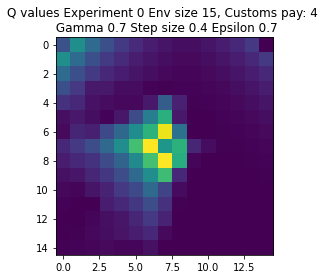

Expr:1 Eps:0 RunnAReward:-14.0 Reward:-271 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-445.0 Reward:-313 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:23.0 Reward:424 Timesteps:225 GotPack:False Utiltime:174 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-329.0 Reward:-95 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-73.0 Reward:626 Timesteps:225 GotPack:False Utiltime:154 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:115.0 Reward:-79 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:152.0 Reward:359 Timesteps:450 GotPack:False Utiltime:128 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:321.0 Reward:-456 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:160 RunnAReward:289.0 Reward:-68 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:482.0 Reward:489 Timeste

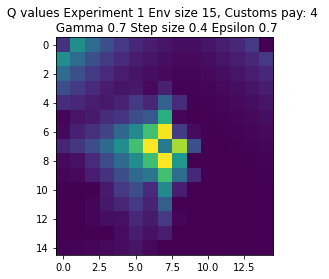

Expr:2 Eps:0 RunnAReward:-39.0 Reward:-763 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:20 RunnAReward:-664.0 Reward:-370 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-348.0 Reward:-64 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-386.0 Reward:1215 Timesteps:695 GotPack:True Utiltime:116 Customstime:475 Money:4
Expr:2 Eps:80 RunnAReward:78.0 Reward:-1458 Timesteps:2882 GotPack:True Utiltime:1014 Customstime:1144 Money:5
Expr:2 Eps:100 RunnAReward:181.0 Reward:615 Timesteps:225 GotPack:False Utiltime:22 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:315.0 Reward:333 Timesteps:225 GotPack:False Utiltime:44 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:451.0 Reward:434 Timesteps:225 GotPack:False Utiltime:24 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:322.0 Reward:1057 Timesteps:924 GotPack:True Utiltime:104 Customstime:619 Money:5
Expr:2 Eps:180 RunnAReward:484.0 Rewar

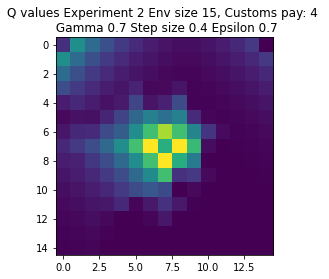

Expr:3 Eps:0 RunnAReward:-18.0 Reward:-356 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-949.0 Reward:985 Timesteps:823 GotPack:True Utiltime:769 Customstime:799 Money:5
Expr:3 Eps:40 RunnAReward:-398.0 Reward:-56 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-168.0 Reward:-626 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:27.0 Reward:-598 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:100 RunnAReward:72.0 Reward:-10 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:153.0 Reward:336 Timesteps:225 GotPack:False Utiltime:14 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:456.0 Reward:-8 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:110.0 Reward:-78 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:186.0 Reward:595 Timesteps:

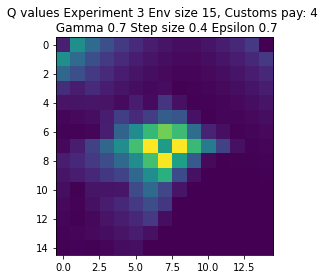

Expr:4 Eps:0 RunnAReward:-8.0 Reward:-158 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-399.0 Reward:-390 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-649.0 Reward:-304 Timesteps:1889 GotPack:True Utiltime:1415 Customstime:1473 Money:4
Expr:4 Eps:60 RunnAReward:47.0 Reward:-497 Timesteps:1963 GotPack:True Utiltime:1091 Customstime:1350 Money:5
Expr:4 Eps:80 RunnAReward:118.0 Reward:-56 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:58.0 Reward:347 Timesteps:225 GotPack:False Utiltime:65 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:295.0 Reward:-5 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:253.0 Reward:-429 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:160 RunnAReward:144.0 Reward:399 Timesteps:225 GotPack:False Utiltime:153 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:204.0 Reward:-88

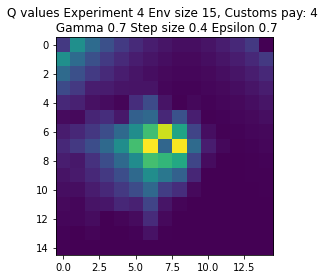

Expr:5 Eps:0 RunnAReward:-86.0 Reward:-1716 Timesteps:3089 GotPack:True Utiltime:1880 Customstime:2508 Money:4
Expr:5 Eps:20 RunnAReward:-586.0 Reward:-121 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-135.0 Reward:176 Timesteps:450 GotPack:False Utiltime:36 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-375.0 Reward:-3444 Timesteps:4210 GotPack:True Utiltime:1587 Customstime:2168 Money:5
Expr:5 Eps:80 RunnAReward:-243.0 Reward:-596 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:233.0 Reward:266 Timesteps:450 GotPack:False Utiltime:102 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:412.0 Reward:521 Timesteps:225 GotPack:False Utiltime:118 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:182.0 Reward:402 Timesteps:225 GotPack:False Utiltime:13 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:331.0 Reward:407 Timesteps:225 GotPack:False Utiltime:208 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:369.

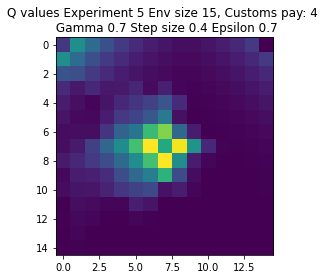

Expr:6 Eps:0 RunnAReward:-37.0 Reward:-725 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-235.0 Reward:-964 Timesteps:2561 GotPack:True Utiltime:984 Customstime:2057 Money:4
Expr:6 Eps:40 RunnAReward:-528.0 Reward:-709 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-401.0 Reward:-36 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:121.0 Reward:-16 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:109.0 Reward:-383 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:148.0 Reward:315 Timesteps:225 GotPack:False Utiltime:85 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:101.0 Reward:-56 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:295.0 Reward:-80 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:289.0 Reward:-121 Tim

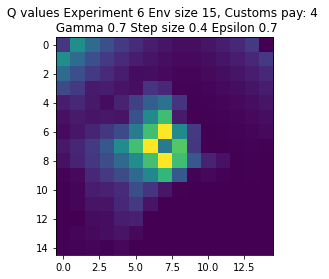

Expr:7 Eps:0 RunnAReward:-1.0 Reward:-20 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-198.0 Reward:-225 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-994.0 Reward:38 Timesteps:450 GotPack:False Utiltime:280 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:18.0 Reward:-26 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:82.0 Reward:-44 Timesteps:450 GotPack:False Utiltime:297 Customstime:0 Money:3
Expr:7 Eps:100 RunnAReward:-38.0 Reward:303 Timesteps:225 GotPack:False Utiltime:29 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:249.0 Reward:-350 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:219.0 Reward:-98 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:263.0 Reward:1076 Timesteps:864 GotPack:True Utiltime:207 Customstime:407 Money:4
Expr:7 Eps:180 RunnAReward:426.0 Reward:409 Timestep

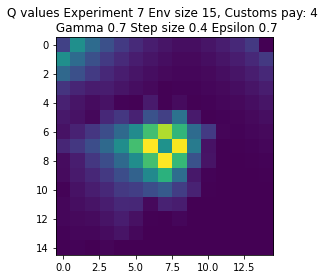

Expr:8 Eps:0 RunnAReward:-17.0 Reward:-333 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-466.0 Reward:-241 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-99.0 Reward:-298 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-334.0 Reward:-60 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-64.0 Reward:-295 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-17.0 Reward:357 Timesteps:225 GotPack:False Utiltime:196 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:209.0 Reward:-82 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:333.0 Reward:68 Timesteps:450 GotPack:False Utiltime:57 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:288.0 Reward:-106 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:461.0 Reward:-46 Timestep

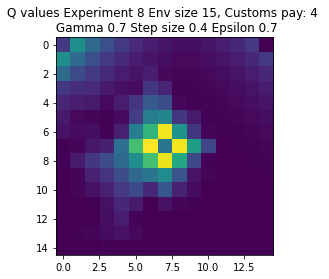

Expr:9 Eps:0 RunnAReward:-22.0 Reward:-426 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-354.0 Reward:-225 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-164.0 Reward:-790 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-447.0 Reward:337 Timesteps:450 GotPack:False Utiltime:26 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:-223.0 Reward:-2826 Timesteps:3782 GotPack:True Utiltime:1472 Customstime:2225 Money:4
Expr:9 Eps:100 RunnAReward:17.0 Reward:376 Timesteps:225 GotPack:False Utiltime:5 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:127.0 Reward:562 Timesteps:225 GotPack:False Utiltime:71 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:366.0 Reward:-16 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:398.0 Reward:620 Timesteps:225 GotPack:False Utiltime:195 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:255.0 Reward:371

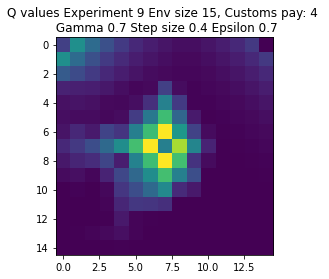

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.7 Step size 0.4 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-48.0 Reward:-954 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-1160.0 Reward:-1146 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-366.0 Reward:-393 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-500.0 Reward:-702 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-208.0 Reward:-259 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-89.0 Reward:-99 Timesteps:1698 GotPack:True Utiltime:471 Customstime:695 Money:5
Expr:0 Eps:120 RunnAReward:-204.0 Reward:-410 Timesteps:900 GotPack:False Utiltime:337 C

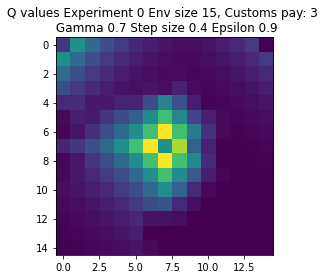

Expr:1 Eps:0 RunnAReward:-51.0 Reward:-1013 Timesteps:2323 GotPack:True Utiltime:380 Customstime:801 Money:3
Expr:1 Eps:20 RunnAReward:-1097.0 Reward:-633 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:40 RunnAReward:-696.0 Reward:673 Timesteps:1139 GotPack:True Utiltime:789 Customstime:898 Money:5
Expr:1 Eps:60 RunnAReward:-614.0 Reward:101 Timesteps:450 GotPack:False Utiltime:136 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-740.0 Reward:-2975 Timesteps:3656 GotPack:True Utiltime:1971 Customstime:2182 Money:5
Expr:1 Eps:100 RunnAReward:-207.0 Reward:96 Timesteps:450 GotPack:False Utiltime:149 Customstime:0 Money:1
Expr:1 Eps:120 RunnAReward:32.0 Reward:334 Timesteps:450 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:286.0 Reward:304 Timesteps:450 GotPack:False Utiltime:4 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:81.0 Reward:-241 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:283.0 

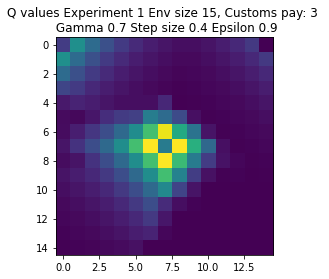

Expr:2 Eps:0 RunnAReward:-15.0 Reward:-287 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-617.0 Reward:-482 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-287.0 Reward:-49 Timesteps:675 GotPack:False Utiltime:420 Customstime:0 Money:1
Expr:2 Eps:60 RunnAReward:-328.0 Reward:-396 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-588.0 Reward:-1497 Timesteps:2597 GotPack:True Utiltime:1517 Customstime:1883 Money:3
Expr:2 Eps:100 RunnAReward:-273.0 Reward:303 Timesteps:450 GotPack:False Utiltime:154 Customstime:0 Money:1
Expr:2 Eps:120 RunnAReward:244.0 Reward:491 Timesteps:1088 GotPack:True Utiltime:31 Customstime:863 Money:3
Expr:2 Eps:140 RunnAReward:224.0 Reward:-157 Timesteps:675 GotPack:False Utiltime:114 Customstime:0 Money:2
Expr:2 Eps:160 RunnAReward:-70.0 Reward:3 Timesteps:675 GotPack:False Utiltime:146 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:328.0 Re

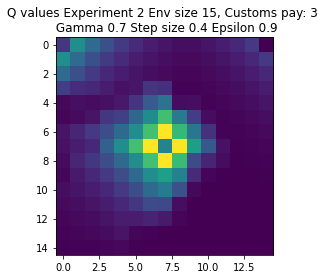

Expr:3 Eps:0 RunnAReward:-14.0 Reward:-275 Timesteps:675 GotPack:False Utiltime:666 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-618.0 Reward:-555 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-907.0 Reward:-1945 Timesteps:2912 GotPack:True Utiltime:1405 Customstime:1939 Money:3
Expr:3 Eps:60 RunnAReward:-558.0 Reward:-631 Timesteps:2167 GotPack:True Utiltime:238 Customstime:645 Money:5
Expr:3 Eps:80 RunnAReward:-7.0 Reward:-1121 Timesteps:2550 GotPack:True Utiltime:1350 Customstime:1423 Money:5
Expr:3 Eps:100 RunnAReward:-369.0 Reward:11 Timesteps:675 GotPack:False Utiltime:91 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:-195.0 Reward:-1342 Timesteps:2681 GotPack:True Utiltime:258 Customstime:729 Money:3
Expr:3 Eps:140 RunnAReward:107.0 Reward:42 Timesteps:1566 GotPack:True Utiltime:790 Customstime:822 Money:3
Expr:3 Eps:160 RunnAReward:52.0 Reward:781 Timesteps:1134 GotPack:True Utiltime:154 Customstime:668 Money:3
Expr:3 Eps:180 RunnA

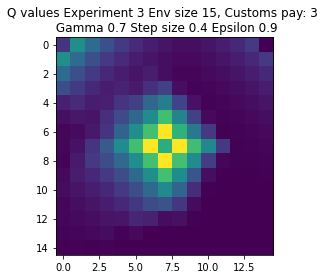

Expr:4 Eps:0 RunnAReward:-131.0 Reward:-2615 Timesteps:3811 GotPack:True Utiltime:1495 Customstime:1713 Money:5
Expr:4 Eps:20 RunnAReward:-604.0 Reward:80 Timesteps:675 GotPack:False Utiltime:278 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-1197.0 Reward:-233 Timesteps:900 GotPack:False Utiltime:534 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-365.0 Reward:-481 Timesteps:900 GotPack:False Utiltime:193 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:-236.0 Reward:-138 Timesteps:1624 GotPack:True Utiltime:9 Customstime:549 Money:4
Expr:4 Eps:100 RunnAReward:-351.0 Reward:689 Timesteps:966 GotPack:True Utiltime:118 Customstime:346 Money:5
Expr:4 Eps:120 RunnAReward:-53.0 Reward:-330 Timesteps:675 GotPack:False Utiltime:274 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:-85.0 Reward:138 Timesteps:450 GotPack:False Utiltime:123 Customstime:0 Money:1
Expr:4 Eps:160 RunnAReward:448.0 Reward:318 Timesteps:450 GotPack:False Utiltime:14 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:

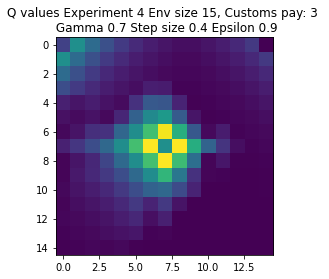

Expr:5 Eps:0 RunnAReward:-77.0 Reward:-1533 Timesteps:2915 GotPack:True Utiltime:2297 Customstime:2817 Money:3
Expr:5 Eps:20 RunnAReward:-629.0 Reward:362 Timesteps:450 GotPack:False Utiltime:167 Customstime:0 Money:1
Expr:5 Eps:40 RunnAReward:-543.0 Reward:-1051 Timesteps:2551 GotPack:True Utiltime:1712 Customstime:1796 Money:3
Expr:5 Eps:60 RunnAReward:-895.0 Reward:-953 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:-635.0 Reward:369 Timesteps:450 GotPack:False Utiltime:74 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:66.0 Reward:676 Timesteps:1176 GotPack:True Utiltime:554 Customstime:714 Money:3
Expr:5 Eps:120 RunnAReward:194.0 Reward:125 Timesteps:675 GotPack:False Utiltime:345 Customstime:0 Money:1
Expr:5 Eps:140 RunnAReward:154.0 Reward:832 Timesteps:1062 GotPack:True Utiltime:464 Customstime:600 Money:3
Expr:5 Eps:160 RunnAReward:221.0 Reward:-412 Timesteps:675 GotPack:False Utiltime:469 Customstime:0 Money:2
Expr:5 Eps:180 RunnARewar

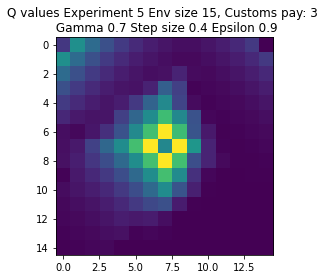

Expr:6 Eps:0 RunnAReward:-19.0 Reward:-363 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-661.0 Reward:303 Timesteps:450 GotPack:False Utiltime:310 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-736.0 Reward:-3541 Timesteps:4417 GotPack:True Utiltime:2985 Customstime:3487 Money:3
Expr:6 Eps:60 RunnAReward:-1049.0 Reward:-347 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-186.0 Reward:184 Timesteps:450 GotPack:False Utiltime:201 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:-444.0 Reward:-95 Timesteps:675 GotPack:False Utiltime:373 Customstime:0 Money:1
Expr:6 Eps:120 RunnAReward:98.0 Reward:887 Timesteps:839 GotPack:True Utiltime:582 Customstime:759 Money:3
Expr:6 Eps:140 RunnAReward:112.0 Reward:316 Timesteps:450 GotPack:False Utiltime:245 Customstime:0 Money:1
Expr:6 Eps:160 RunnAReward:-51.0 Reward:-434 Timesteps:900 GotPack:False Utiltime:76 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:256.0 

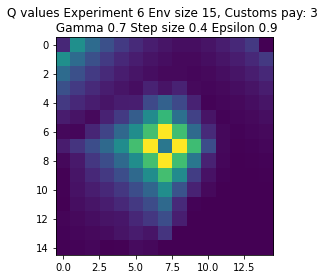

Expr:7 Eps:0 RunnAReward:-45.0 Reward:-881 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-772.0 Reward:-110 Timesteps:1812 GotPack:True Utiltime:1523 Customstime:1683 Money:4
Expr:7 Eps:40 RunnAReward:-561.0 Reward:-613 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:60 RunnAReward:-963.0 Reward:293 Timesteps:450 GotPack:False Utiltime:339 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:30.0 Reward:-1229 Timesteps:2592 GotPack:True Utiltime:57 Customstime:1132 Money:3
Expr:7 Eps:100 RunnAReward:90.0 Reward:88 Timesteps:675 GotPack:False Utiltime:71 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:-178.0 Reward:365 Timesteps:450 GotPack:False Utiltime:173 Customstime:0 Money:1
Expr:7 Eps:140 RunnAReward:184.0 Reward:-432 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:366.0 Reward:929 Timesteps:943 GotPack:True Utiltime:65 Customstime:304 Money:5
Expr:7 Eps:180 RunnAReward:356.0 Rewa

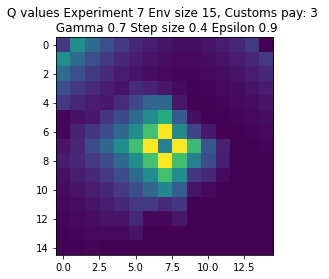

Expr:8 Eps:0 RunnAReward:5.0 Reward:116 Timesteps:1483 GotPack:True Utiltime:93 Customstime:603 Money:3
Expr:8 Eps:20 RunnAReward:-1170.0 Reward:-437 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-575.0 Reward:-355 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-313.0 Reward:-675 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:80 RunnAReward:-548.0 Reward:-1363 Timesteps:2303 GotPack:True Utiltime:309 Customstime:640 Money:4
Expr:8 Eps:100 RunnAReward:-116.0 Reward:662 Timesteps:1026 GotPack:True Utiltime:412 Customstime:848 Money:3
Expr:8 Eps:120 RunnAReward:101.0 Reward:36 Timesteps:675 GotPack:False Utiltime:182 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:-198.0 Reward:-331 Timesteps:2058 GotPack:True Utiltime:118 Customstime:912 Money:3
Expr:8 Eps:160 RunnAReward:19.0 Reward:384 Timesteps:450 GotPack:False Utiltime:138 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:303.0 

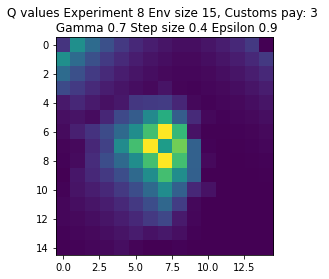

Expr:9 Eps:0 RunnAReward:9.0 Reward:186 Timesteps:1236 GotPack:True Utiltime:639 Customstime:1090 Money:3
Expr:9 Eps:20 RunnAReward:-834.0 Reward:-724 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-530.0 Reward:185 Timesteps:450 GotPack:False Utiltime:225 Customstime:0 Money:1
Expr:9 Eps:60 RunnAReward:-370.0 Reward:-2678 Timesteps:3863 GotPack:True Utiltime:804 Customstime:1880 Money:5
Expr:9 Eps:80 RunnAReward:-381.0 Reward:-100 Timesteps:675 GotPack:False Utiltime:136 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-134.0 Reward:-6 Timesteps:450 GotPack:False Utiltime:98 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:140.0 Reward:371 Timesteps:1452 GotPack:True Utiltime:539 Customstime:856 Money:3
Expr:9 Eps:140 RunnAReward:-203.0 Reward:8 Timesteps:1454 GotPack:True Utiltime:102 Customstime:131 Money:5
Expr:9 Eps:160 RunnAReward:388.0 Reward:-431 Timesteps:900 GotPack:False Utiltime:46 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:244.

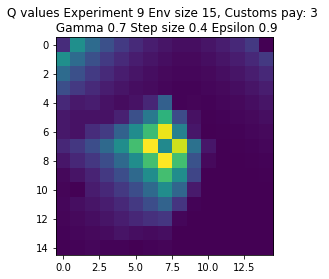

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.7 Step size 0.4 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-17.0 Reward:-325 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-1230.0 Reward:-282 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-515.0 Reward:-763 Timesteps:2426 GotPack:True Utiltime:200 Customstime:1294 Money:5
Expr:0 Eps:60 RunnAReward:-417.0 Reward:-32 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-72.0 Reward:-56 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-200.0 Reward:-308 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:-56.0 Reward:-56 Timesteps:225 GotPack:False Utiltime:0 Custom

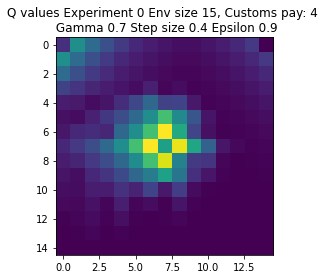

Expr:1 Eps:0 RunnAReward:-45.0 Reward:-884 Timesteps:2119 GotPack:True Utiltime:105 Customstime:1082 Money:4
Expr:1 Eps:20 RunnAReward:-263.0 Reward:-35 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-849.0 Reward:-259 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-176.0 Reward:-613 Timesteps:1973 GotPack:True Utiltime:1574 Customstime:1851 Money:4
Expr:1 Eps:80 RunnAReward:-353.0 Reward:-40 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-150.0 Reward:78 Timesteps:450 GotPack:False Utiltime:19 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:145.0 Reward:469 Timesteps:1111 GotPack:True Utiltime:20 Customstime:314 Money:4
Expr:1 Eps:140 RunnAReward:-263.0 Reward:343 Timesteps:450 GotPack:False Utiltime:257 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:260.0 Reward:-44 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:40.0 Rewa

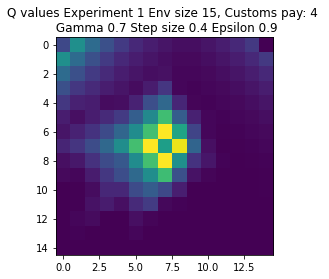

Expr:2 Eps:0 RunnAReward:-17.0 Reward:-335 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-425.0 Reward:-101 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-747.0 Reward:-2599 Timesteps:3626 GotPack:True Utiltime:1062 Customstime:1407 Money:4
Expr:2 Eps:60 RunnAReward:-570.0 Reward:-598 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:80 RunnAReward:-131.0 Reward:402 Timesteps:225 GotPack:False Utiltime:160 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-8.0 Reward:-178 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-373.0 Reward:-297 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:263.0 Reward:-293 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:160 RunnAReward:149.0 Reward:160 Timesteps:450 GotPack:False Utiltime:162 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:320.0 Reward

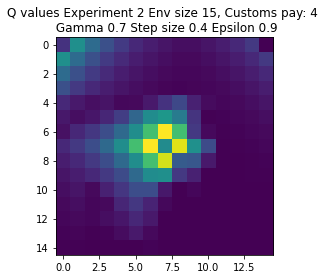

Expr:3 Eps:0 RunnAReward:-18.0 Reward:-345 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-740.0 Reward:416 Timesteps:225 GotPack:False Utiltime:67 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-302.0 Reward:-113 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-493.0 Reward:-262 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-103.0 Reward:-38 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-21.0 Reward:-299 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:89.0 Reward:-104 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-96.0 Reward:-852 Timesteps:2166 GotPack:True Utiltime:79 Customstime:368 Money:4
Expr:3 Eps:160 RunnAReward:288.0 Reward:1355 Timesteps:708 GotPack:True Utiltime:13 Customstime:349 Money:5
Expr:3 Eps:180 RunnAReward:326.0 Reward:551 T

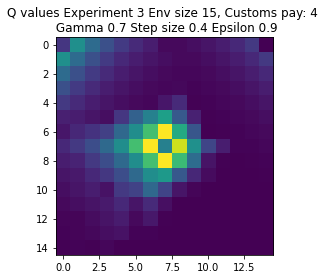

Expr:4 Eps:0 RunnAReward:6.0 Reward:124 Timesteps:450 GotPack:False Utiltime:154 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-441.0 Reward:-417 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-1047.0 Reward:-5592 Timesteps:5900 GotPack:True Utiltime:3645 Customstime:3729 Money:4
Expr:4 Eps:60 RunnAReward:-428.0 Reward:-302 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-176.0 Reward:-103 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-159.0 Reward:112 Timesteps:450 GotPack:False Utiltime:347 Customstime:0 Money:3
Expr:4 Eps:120 RunnAReward:-132.0 Reward:-1692 Timesteps:2875 GotPack:True Utiltime:111 Customstime:647 Money:5
Expr:4 Eps:140 RunnAReward:-133.0 Reward:-408 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:160 RunnAReward:-89.0 Reward:-278 Timesteps:675 GotPack:False Utiltime:109 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:159

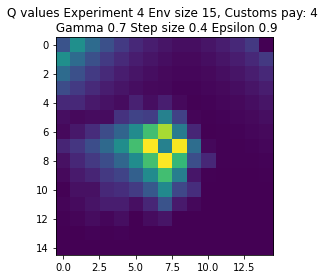

Expr:5 Eps:0 RunnAReward:0.0 Reward:0 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-1037.0 Reward:-1374 Timesteps:2954 GotPack:True Utiltime:2255 Customstime:2340 Money:5
Expr:5 Eps:40 RunnAReward:-136.0 Reward:-66 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-457.0 Reward:-58 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-218.0 Reward:334 Timesteps:225 GotPack:False Utiltime:65 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-8.0 Reward:-235 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:3.0 Reward:643 Timesteps:1253 GotPack:True Utiltime:451 Customstime:632 Money:4
Expr:5 Eps:140 RunnAReward:195.0 Reward:609 Timesteps:225 GotPack:False Utiltime:177 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:382.0 Reward:300 Timesteps:225 GotPack:False Utiltime:196 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:239.0 Reward:637 T

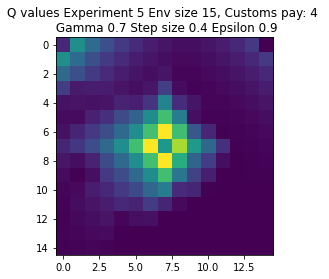

Expr:6 Eps:0 RunnAReward:-317.0 Reward:-6334 Timesteps:6132 GotPack:True Utiltime:1683 Customstime:2678 Money:5
Expr:6 Eps:20 RunnAReward:-762.0 Reward:-311 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-416.0 Reward:477 Timesteps:225 GotPack:False Utiltime:22 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-179.0 Reward:-1754 Timesteps:2902 GotPack:True Utiltime:865 Customstime:1074 Money:5
Expr:6 Eps:80 RunnAReward:-260.0 Reward:412 Timesteps:225 GotPack:False Utiltime:56 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-239.0 Reward:525 Timesteps:225 GotPack:False Utiltime:152 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:5.0 Reward:12 Timesteps:450 GotPack:False Utiltime:104 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:35.0 Reward:334 Timesteps:450 GotPack:False Utiltime:187 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:-131.0 Reward:579 Timesteps:225 GotPack:False Utiltime:109 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:149.0

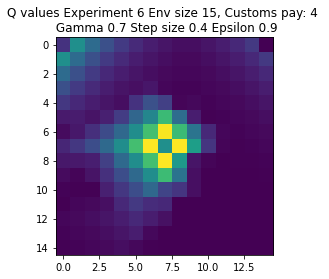

Expr:7 Eps:0 RunnAReward:-24.0 Reward:-468 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-583.0 Reward:-316 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-439.0 Reward:-225 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-528.0 Reward:-650 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-142.0 Reward:-340 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:-195.0 Reward:-16 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-63.0 Reward:-433 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:-9.0 Reward:647 Timesteps:225 GotPack:False Utiltime:26 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:12.0 Reward:631 Timesteps:225 GotPack:False Utiltime:144 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:480.0 Reward:1631 Time

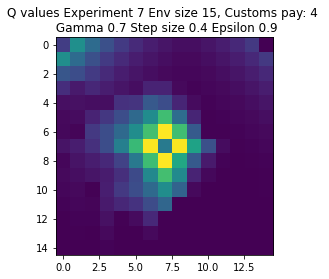

Expr:8 Eps:0 RunnAReward:-16.0 Reward:-310 Timesteps:675 GotPack:False Utiltime:203 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-931.0 Reward:-4830 Timesteps:5609 GotPack:True Utiltime:7 Customstime:990 Money:4
Expr:8 Eps:40 RunnAReward:-850.0 Reward:-380 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-157.0 Reward:-60 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-54.0 Reward:-145 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-54.0 Reward:-631 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:-133.0 Reward:-50 Timesteps:675 GotPack:False Utiltime:210 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:-44.0 Reward:133 Timesteps:450 GotPack:False Utiltime:281 Customstime:0 Money:3
Expr:8 Eps:160 RunnAReward:60.0 Reward:613 Timesteps:225 GotPack:False Utiltime:32 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:108.0 Reward:271

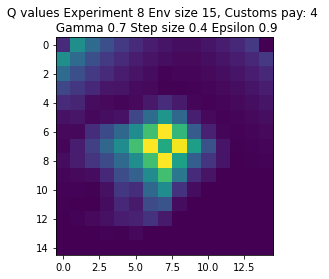

Expr:9 Eps:0 RunnAReward:-16.0 Reward:-307 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-607.0 Reward:-286 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-483.0 Reward:-520 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-519.0 Reward:-3798 Timesteps:4421 GotPack:True Utiltime:1221 Customstime:1418 Money:5
Expr:9 Eps:80 RunnAReward:-156.0 Reward:-16 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-251.0 Reward:-309 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:9 Eps:120 RunnAReward:-93.0 Reward:-114 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-30.0 Reward:-81 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:84.0 Reward:350 Timesteps:450 GotPack:False Utiltime:72 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:293.0 Reward:93 

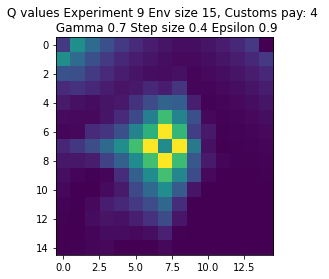

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.7 Step size 0.4 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-187.0 Reward:-3729 Timesteps:4394 GotPack:True Utiltime:2199 Customstime:3417 Money:3
Expr:0 Eps:20 RunnAReward:-932.0 Reward:-700 Timesteps:2454 GotPack:True Utiltime:1864 Customstime:2079 Money:5
Expr:0 Eps:40 RunnAReward:-869.0 Reward:-393 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-1270.0 Reward:43 Timesteps:675 GotPack:False Utiltime:160 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:-320.0 Reward:-432 Timesteps:2165 GotPack:True Utiltime:64 Customstime:668 Money:3
Expr:0 Eps:100 RunnAReward:-654.0 Reward:356 Timesteps:450 GotPack:False Utiltime:186 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:38.0 Reward:134 Timesteps:450 GotPack:False Ut

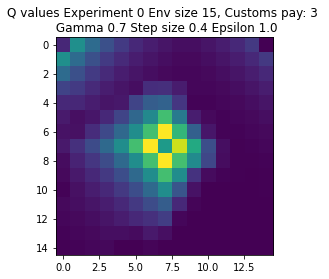

Expr:1 Eps:0 RunnAReward:-35.0 Reward:-686 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-580.0 Reward:-848 Timesteps:2193 GotPack:True Utiltime:1494 Customstime:1800 Money:5
Expr:1 Eps:40 RunnAReward:-656.0 Reward:325 Timesteps:450 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-657.0 Reward:-345 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-1201.0 Reward:-573 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-108.0 Reward:-47 Timesteps:450 GotPack:False Utiltime:133 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:-242.0 Reward:250 Timesteps:450 GotPack:False Utiltime:408 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:-392.0 Reward:803 Timesteps:1199 GotPack:True Utiltime:824 Customstime:857 Money:3
Expr:1 Eps:160 RunnAReward:42.0 Reward:121 Timesteps:450 GotPack:False Utiltime:108 Customstime:0 Money:1
Expr:1 Eps:180 RunnAReward:345.0 

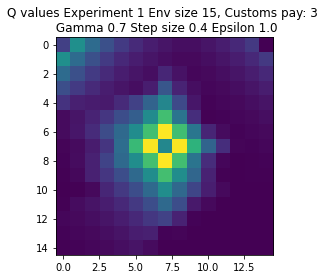

Expr:2 Eps:0 RunnAReward:-332.0 Reward:-6627 Timesteps:6750 GotPack:False Utiltime:2161 Customstime:2428 Money:4
Expr:2 Eps:20 RunnAReward:-1363.0 Reward:302 Timesteps:450 GotPack:False Utiltime:3 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-1320.0 Reward:-545 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-888.0 Reward:-632 Timesteps:2007 GotPack:True Utiltime:1642 Customstime:1838 Money:5
Expr:2 Eps:80 RunnAReward:-371.0 Reward:1151 Timesteps:834 GotPack:True Utiltime:12 Customstime:564 Money:3
Expr:2 Eps:100 RunnAReward:-687.0 Reward:-275 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:107.0 Reward:103 Timesteps:450 GotPack:False Utiltime:93 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-58.0 Reward:-230 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:137.0 Reward:-9 Timesteps:675 GotPack:False Utiltime:99 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:98.

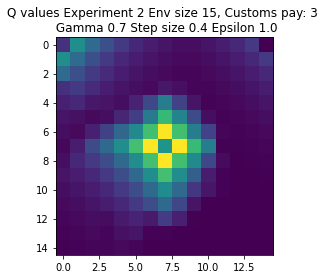

Expr:3 Eps:0 RunnAReward:-35.0 Reward:-700 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-1111.0 Reward:-2271 Timesteps:3140 GotPack:True Utiltime:1274 Customstime:2976 Money:5
Expr:3 Eps:40 RunnAReward:-1174.0 Reward:-780 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-1016.0 Reward:-389 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-466.0 Reward:-1091 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:-253.0 Reward:109 Timesteps:450 GotPack:False Utiltime:274 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-900.0 Reward:-66 Timesteps:675 GotPack:False Utiltime:391 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:-239.0 Reward:153 Timesteps:1657 GotPack:True Utiltime:428 Customstime:579 Money:3
Expr:3 Eps:160 RunnAReward:18.0 Reward:1101 Timesteps:794 GotPack:True Utiltime:137 Customstime:591 Money:3
Expr:3 Eps:180 RunnAReward:

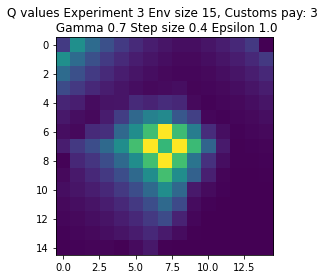

Expr:4 Eps:0 RunnAReward:-28.0 Reward:-554 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1102.0 Reward:-798 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-2035.0 Reward:271 Timesteps:450 GotPack:False Utiltime:80 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-617.0 Reward:-695 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-443.0 Reward:-553 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:100 RunnAReward:-515.0 Reward:8 Timesteps:450 GotPack:False Utiltime:184 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:-50.0 Reward:1451 Timesteps:635 GotPack:True Utiltime:235 Customstime:346 Money:3
Expr:4 Eps:140 RunnAReward:26.0 Reward:68 Timesteps:450 GotPack:False Utiltime:61 Customstime:0 Money:1
Expr:4 Eps:160 RunnAReward:30.0 Reward:277 Timesteps:450 GotPack:False Utiltime:160 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:18.0 Reward:155 Ti

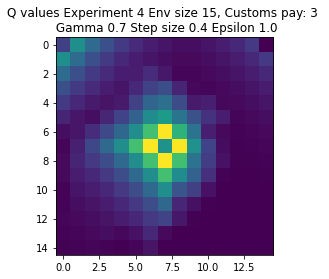

Expr:5 Eps:0 RunnAReward:-32.0 Reward:-630 Timesteps:900 GotPack:False Utiltime:221 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-1309.0 Reward:-752 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-771.0 Reward:-34 Timesteps:450 GotPack:False Utiltime:249 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-353.0 Reward:-285 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:-837.0 Reward:-697 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-590.0 Reward:36 Timesteps:450 GotPack:False Utiltime:236 Customstime:0 Money:1
Expr:5 Eps:120 RunnAReward:-424.0 Reward:-79 Timesteps:1720 GotPack:True Utiltime:1257 Customstime:1445 Money:3
Expr:5 Eps:140 RunnAReward:-307.0 Reward:140 Timesteps:450 GotPack:False Utiltime:159 Customstime:0 Money:1
Expr:5 Eps:160 RunnAReward:-473.0 Reward:338 Timesteps:1304 GotPack:True Utiltime:135 Customstime:899 Money:3
Expr:5 Eps:180 RunnAReward:80.0

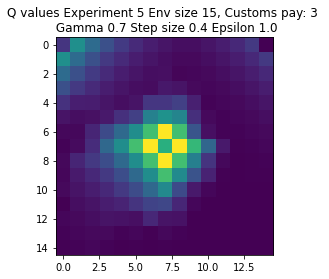

Expr:6 Eps:0 RunnAReward:-33.0 Reward:-652 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-1371.0 Reward:-660 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:40 RunnAReward:-954.0 Reward:-490 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-927.0 Reward:-377 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-760.0 Reward:-461 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-383.0 Reward:363 Timesteps:450 GotPack:False Utiltime:56 Customstime:0 Money:1
Expr:6 Eps:120 RunnAReward:-4.0 Reward:-182 Timesteps:675 GotPack:False Utiltime:100 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:123.0 Reward:-570 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:160 RunnAReward:-78.0 Reward:54 Timesteps:450 GotPack:False Utiltime:54 Customstime:0 Money:1
Expr:6 Eps:180 RunnAReward:214.0 Reward:-90 Ti

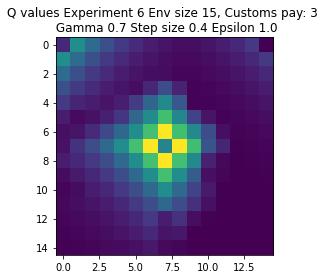

Expr:7 Eps:0 RunnAReward:18.0 Reward:362 Timesteps:450 GotPack:False Utiltime:189 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-823.0 Reward:-330 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-722.0 Reward:-773 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:60 RunnAReward:-1471.0 Reward:-122 Timesteps:675 GotPack:False Utiltime:163 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-588.0 Reward:-1325 Timesteps:2564 GotPack:True Utiltime:630 Customstime:1596 Money:4
Expr:7 Eps:100 RunnAReward:-181.0 Reward:930 Timesteps:715 GotPack:True Utiltime:82 Customstime:336 Money:5
Expr:7 Eps:120 RunnAReward:-523.0 Reward:-873 Timesteps:2177 GotPack:True Utiltime:731 Customstime:933 Money:3
Expr:7 Eps:140 RunnAReward:-381.0 Reward:372 Timesteps:450 GotPack:False Utiltime:133 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:178.0 Reward:-6 Timesteps:450 GotPack:False Utiltime:140 Customstime:0 Money:1
Expr:7 Eps:180 RunnAReward:-73

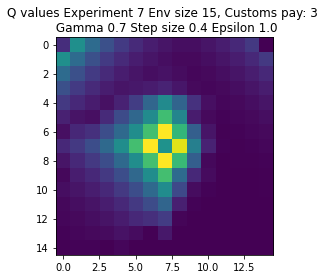

Expr:8 Eps:0 RunnAReward:-35.0 Reward:-691 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-1486.0 Reward:-548 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:40 RunnAReward:-515.0 Reward:-1865 Timesteps:3004 GotPack:True Utiltime:11 Customstime:1825 Money:3
Expr:8 Eps:60 RunnAReward:-566.0 Reward:-672 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:80 RunnAReward:-452.0 Reward:28 Timesteps:450 GotPack:False Utiltime:155 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-227.0 Reward:-1413 Timesteps:2773 GotPack:True Utiltime:2040 Customstime:2609 Money:5
Expr:8 Eps:120 RunnAReward:-358.0 Reward:364 Timesteps:450 GotPack:False Utiltime:308 Customstime:0 Money:1
Expr:8 Eps:140 RunnAReward:-33.0 Reward:163 Timesteps:450 GotPack:False Utiltime:401 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:28.0 Reward:-399 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:134.0

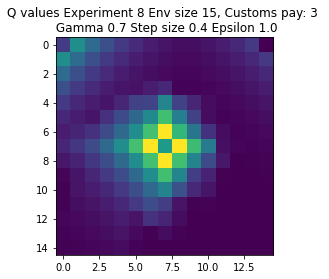

Expr:9 Eps:0 RunnAReward:-37.0 Reward:-721 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-582.0 Reward:-517 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-1149.0 Reward:365 Timesteps:450 GotPack:False Utiltime:153 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-854.0 Reward:-1542 Timesteps:2836 GotPack:True Utiltime:2515 Customstime:2712 Money:5
Expr:9 Eps:80 RunnAReward:-435.0 Reward:-368 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-661.0 Reward:-3032 Timesteps:3698 GotPack:True Utiltime:2667 Customstime:3061 Money:4
Expr:9 Eps:120 RunnAReward:-409.0 Reward:-703 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-374.0 Reward:-273 Timesteps:675 GotPack:False Utiltime:193 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:-407.0 Reward:-247 Timesteps:1902 GotPack:True Utiltime:268 Customstime:454 Money:3
Expr:9 Eps:180 RunnARe

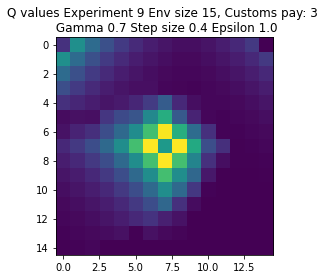

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.7 Step size 0.4 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-19.0 Reward:-377 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-385.0 Reward:-645 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-642.0 Reward:-371 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-705.0 Reward:-540 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-209.0 Reward:-37 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-54.0 Reward:651 Timesteps:225 GotPack:False Utiltime:195 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:-538.0 Reward:-6185 Timesteps:6157 GotPack:True Utiltime:2214 Cust

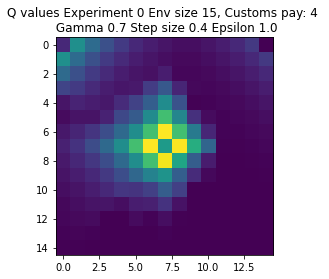

Expr:1 Eps:0 RunnAReward:-239.0 Reward:-4778 Timesteps:5038 GotPack:True Utiltime:2988 Customstime:3755 Money:5
Expr:1 Eps:20 RunnAReward:-1231.0 Reward:381 Timesteps:225 GotPack:False Utiltime:136 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-651.0 Reward:-310 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-561.0 Reward:-525 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:-71.0 Reward:-596 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:-426.0 Reward:-1749 Timesteps:2915 GotPack:True Utiltime:184 Customstime:526 Money:4
Expr:1 Eps:120 RunnAReward:35.0 Reward:437 Timesteps:225 GotPack:False Utiltime:212 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:151.0 Reward:-263 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:6.0 Reward:-350 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:55.0 Rew

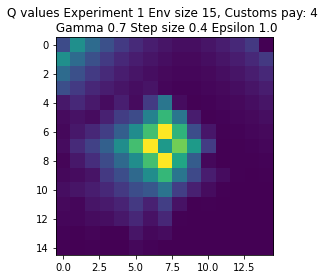

Expr:2 Eps:0 RunnAReward:-32.0 Reward:-636 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-899.0 Reward:-72 Timesteps:450 GotPack:False Utiltime:215 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-560.0 Reward:-285 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-764.0 Reward:-520 Timesteps:2125 GotPack:True Utiltime:1223 Customstime:1386 Money:4
Expr:2 Eps:80 RunnAReward:-212.0 Reward:-1323 Timesteps:2423 GotPack:True Utiltime:1136 Customstime:1535 Money:4
Expr:2 Eps:100 RunnAReward:-147.0 Reward:15 Timesteps:450 GotPack:False Utiltime:302 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:-337.0 Reward:0 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-82.0 Reward:395 Timesteps:225 GotPack:False Utiltime:62 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:24.0 Reward:-975 Timesteps:2445 GotPack:True Utiltime:55 Customstime:516 Money:4
Expr:2 Eps:180 RunnAReward:-226.0

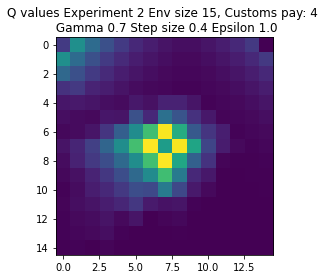

Expr:3 Eps:0 RunnAReward:-17.0 Reward:-338 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-449.0 Reward:-310 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-585.0 Reward:-316 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-898.0 Reward:-6520 Timesteps:6235 GotPack:True Utiltime:3560 Customstime:4619 Money:5
Expr:3 Eps:80 RunnAReward:-608.0 Reward:-302 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-207.0 Reward:-24 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-229.0 Reward:-264 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-202.0 Reward:-620 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:-7.0 Reward:179 Timesteps:225 GotPack:False Utiltime:103 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:98.0 Reward:

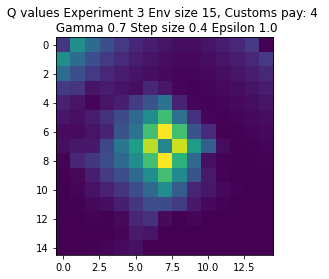

Expr:4 Eps:0 RunnAReward:-13.0 Reward:-254 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1064.0 Reward:185 Timesteps:450 GotPack:False Utiltime:73 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-398.0 Reward:-2044 Timesteps:3007 GotPack:True Utiltime:1000 Customstime:1329 Money:4
Expr:4 Eps:60 RunnAReward:-554.0 Reward:489 Timesteps:1178 GotPack:True Utiltime:67 Customstime:845 Money:4
Expr:4 Eps:80 RunnAReward:-507.0 Reward:-164 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-436.0 Reward:160 Timesteps:450 GotPack:False Utiltime:37 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:-178.0 Reward:-167 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:-198.0 Reward:-119 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:-83.0 Reward:-285 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:63.0 Rew

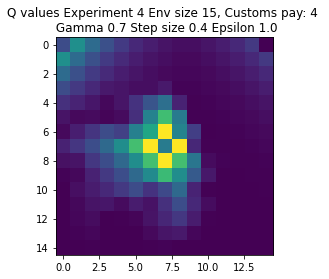

Expr:5 Eps:0 RunnAReward:-10.0 Reward:-195 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-893.0 Reward:-386 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-658.0 Reward:-241 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-656.0 Reward:39 Timesteps:450 GotPack:False Utiltime:409 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:-369.0 Reward:-265 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-364.0 Reward:-382 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:5 Eps:120 RunnAReward:-417.0 Reward:-2974 Timesteps:3841 GotPack:True Utiltime:1094 Customstime:1245 Money:4
Expr:5 Eps:140 RunnAReward:-174.0 Reward:588 Timesteps:1136 GotPack:True Utiltime:12 Customstime:957 Money:4
Expr:5 Eps:160 RunnAReward:183.0 Reward:646 Timesteps:225 GotPack:False Utiltime:185 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:111.0 Re

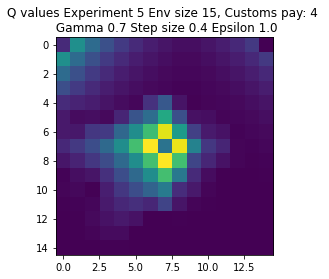

Expr:6 Eps:0 RunnAReward:19.0 Reward:396 Timesteps:225 GotPack:False Utiltime:8 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-634.0 Reward:-116 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-593.0 Reward:-3387 Timesteps:4261 GotPack:True Utiltime:444 Customstime:1052 Money:5
Expr:6 Eps:60 RunnAReward:-450.0 Reward:-575 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:-589.0 Reward:-271 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-447.0 Reward:-25 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-216.0 Reward:-311 Timesteps:2000 GotPack:True Utiltime:58 Customstime:938 Money:4
Expr:6 Eps:140 RunnAReward:86.0 Reward:594 Timesteps:225 GotPack:False Utiltime:159 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:-48.0 Reward:-302 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:180 RunnAReward:-21.0 Reward:

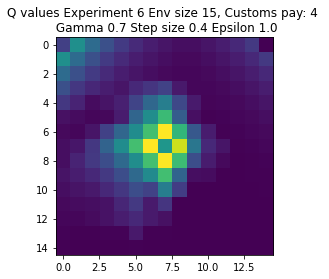

Expr:7 Eps:0 RunnAReward:-23.0 Reward:-441 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-1016.0 Reward:108 Timesteps:450 GotPack:False Utiltime:46 Customstime:0 Money:3
Expr:7 Eps:40 RunnAReward:-771.0 Reward:-119 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-1078.0 Reward:50 Timesteps:1580 GotPack:True Utiltime:1339 Customstime:1451 Money:5
Expr:7 Eps:80 RunnAReward:-316.0 Reward:170 Timesteps:450 GotPack:False Utiltime:217 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:75.0 Reward:709 Timesteps:1164 GotPack:True Utiltime:79 Customstime:1050 Money:5
Expr:7 Eps:120 RunnAReward:-285.0 Reward:-5623 Timesteps:5465 GotPack:True Utiltime:1406 Customstime:1774 Money:4
Expr:7 Eps:140 RunnAReward:-443.0 Reward:-544 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:160 RunnAReward:-220.0 Reward:-230 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:-1

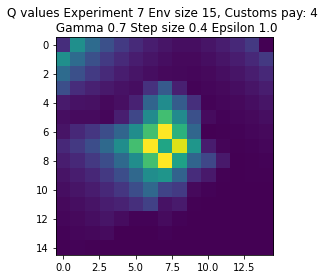

Expr:8 Eps:0 RunnAReward:-1.0 Reward:-18 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-343.0 Reward:-1015 Timesteps:2188 GotPack:True Utiltime:776 Customstime:965 Money:4
Expr:8 Eps:40 RunnAReward:-804.0 Reward:-3337 Timesteps:3808 GotPack:True Utiltime:936 Customstime:1039 Money:5
Expr:8 Eps:60 RunnAReward:-747.0 Reward:336 Timesteps:225 GotPack:False Utiltime:77 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-294.0 Reward:-1583 Timesteps:2696 GotPack:True Utiltime:1840 Customstime:2658 Money:4
Expr:8 Eps:100 RunnAReward:-247.0 Reward:-313 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-156.0 Reward:-1148 Timesteps:2593 GotPack:True Utiltime:255 Customstime:872 Money:4
Expr:8 Eps:140 RunnAReward:-10.0 Reward:450 Timesteps:225 GotPack:False Utiltime:90 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:-194.0 Reward:-294 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:180 RunnARewa

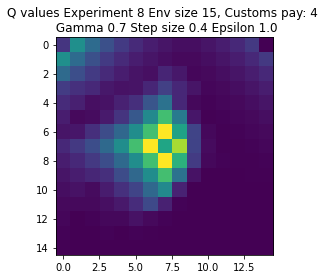

Expr:9 Eps:0 RunnAReward:-50.0 Reward:-999 Timesteps:2609 GotPack:True Utiltime:614 Customstime:1119 Money:4
Expr:9 Eps:20 RunnAReward:-343.0 Reward:-573 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-357.0 Reward:-314 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-739.0 Reward:-366 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-625.0 Reward:-5283 Timesteps:5627 GotPack:True Utiltime:3764 Customstime:4644 Money:5
Expr:9 Eps:100 RunnAReward:-565.0 Reward:-302 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-252.0 Reward:-35 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-53.0 Reward:-330 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:18.0 Reward:-404 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:-42.0 Rew

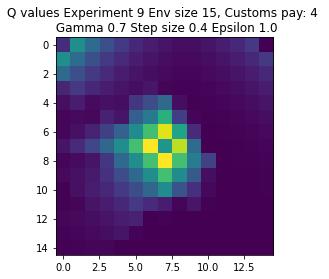

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.7 Step size 0.5 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-32.0 Reward:-630 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-877.0 Reward:518 Timesteps:1111 GotPack:True Utiltime:18 Customstime:996 Money:3
Expr:0 Eps:40 RunnAReward:-149.0 Reward:-128 Timesteps:450 GotPack:False Utiltime:186 Customstime:0 Money:1
Expr:0 Eps:60 RunnAReward:32.0 Reward:-550 Timesteps:2246 GotPack:True Utiltime:365 Customstime:1547 Money:4
Expr:0 Eps:80 RunnAReward:-117.0 Reward:-239 Timesteps:1698 GotPack:True Utiltime:5 Customstime:451 Money:5
Expr:0 Eps:100 RunnAReward:351.0 Reward:82 Timesteps:675 GotPack:False Utiltime:158 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:567.0 Reward:284 Timesteps:450 GotPack:False Utiltime:40 

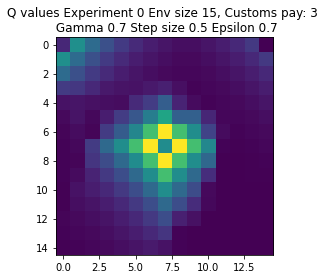

Expr:1 Eps:0 RunnAReward:-19.0 Reward:-378 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-487.0 Reward:117 Timesteps:675 GotPack:False Utiltime:46 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-520.0 Reward:-585 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:60 RunnAReward:-7.0 Reward:-151 Timesteps:675 GotPack:False Utiltime:230 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:396.0 Reward:-302 Timesteps:2032 GotPack:True Utiltime:297 Customstime:535 Money:4
Expr:1 Eps:100 RunnAReward:263.0 Reward:1265 Timesteps:654 GotPack:True Utiltime:54 Customstime:124 Money:5
Expr:1 Eps:120 RunnAReward:323.0 Reward:-531 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:372.0 Reward:1406 Timesteps:583 GotPack:True Utiltime:462 Customstime:480 Money:3
Expr:1 Eps:160 RunnAReward:613.0 Reward:1181 Timesteps:843 GotPack:True Utiltime:49 Customstime:713 Money:3
Expr:1 Eps:180 RunnAReward:426.0 Rewar

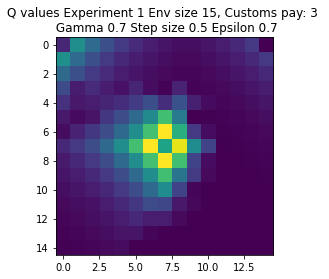

Expr:2 Eps:0 RunnAReward:-23.0 Reward:-458 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-1005.0 Reward:-959 Timesteps:2361 GotPack:True Utiltime:656 Customstime:750 Money:5
Expr:2 Eps:40 RunnAReward:-486.0 Reward:336 Timesteps:450 GotPack:False Utiltime:119 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:80.0 Reward:454 Timesteps:1352 GotPack:True Utiltime:530 Customstime:627 Money:5
Expr:2 Eps:80 RunnAReward:-65.0 Reward:1099 Timesteps:871 GotPack:True Utiltime:212 Customstime:801 Money:3
Expr:2 Eps:100 RunnAReward:538.0 Reward:342 Timesteps:450 GotPack:False Utiltime:122 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:334.0 Reward:-1559 Timesteps:3144 GotPack:True Utiltime:429 Customstime:1288 Money:4
Expr:2 Eps:140 RunnAReward:110.0 Reward:-66 Timesteps:675 GotPack:False Utiltime:105 Customstime:0 Money:2
Expr:2 Eps:160 RunnAReward:588.0 Reward:945 Timesteps:870 GotPack:True Utiltime:27 Customstime:346 Money:4
Expr:2 Eps:180 RunnAReward:664

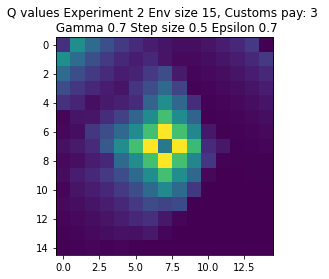

Expr:3 Eps:0 RunnAReward:-24.0 Reward:-472 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-1109.0 Reward:-501 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-130.0 Reward:-857 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-333.0 Reward:217 Timesteps:450 GotPack:False Utiltime:25 Customstime:0 Money:1
Expr:3 Eps:80 RunnAReward:-30.0 Reward:-433 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:3 Eps:100 RunnAReward:342.0 Reward:724 Timesteps:1168 GotPack:True Utiltime:938 Customstime:964 Money:3
Expr:3 Eps:120 RunnAReward:438.0 Reward:344 Timesteps:450 GotPack:False Utiltime:119 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:718.0 Reward:1277 Timesteps:641 GotPack:True Utiltime:50 Customstime:159 Money:5
Expr:3 Eps:160 RunnAReward:710.0 Reward:-38 Timesteps:675 GotPack:False Utiltime:17 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:629.0 Reward:16

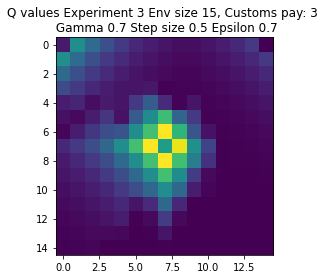

Expr:4 Eps:0 RunnAReward:-34.0 Reward:-670 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-536.0 Reward:-367 Timesteps:675 GotPack:False Utiltime:194 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-444.0 Reward:-1694 Timesteps:2815 GotPack:True Utiltime:1895 Customstime:2032 Money:3
Expr:4 Eps:60 RunnAReward:-255.0 Reward:86 Timesteps:675 GotPack:False Utiltime:332 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:287.0 Reward:369 Timesteps:450 GotPack:False Utiltime:426 Customstime:0 Money:1
Expr:4 Eps:100 RunnAReward:412.0 Reward:831 Timesteps:944 GotPack:True Utiltime:65 Customstime:721 Money:3
Expr:4 Eps:120 RunnAReward:490.0 Reward:446 Timesteps:1565 GotPack:True Utiltime:57 Customstime:158 Money:5
Expr:4 Eps:140 RunnAReward:647.0 Reward:1327 Timesteps:670 GotPack:True Utiltime:20 Customstime:566 Money:3
Expr:4 Eps:160 RunnAReward:913.0 Reward:873 Timesteps:1035 GotPack:True Utiltime:63 Customstime:188 Money:3
Expr:4 Eps:180 RunnAReward:689.0

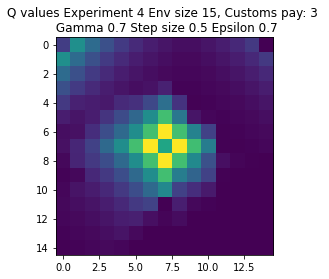

Expr:5 Eps:0 RunnAReward:-29.0 Reward:-573 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:20 RunnAReward:-700.0 Reward:-147 Timesteps:675 GotPack:False Utiltime:142 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-343.0 Reward:-4098 Timesteps:4621 GotPack:True Utiltime:1999 Customstime:2164 Money:5
Expr:5 Eps:60 RunnAReward:-44.0 Reward:-53 Timesteps:675 GotPack:False Utiltime:513 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:227.0 Reward:713 Timesteps:1193 GotPack:True Utiltime:108 Customstime:544 Money:3
Expr:5 Eps:100 RunnAReward:215.0 Reward:305 Timesteps:1524 GotPack:True Utiltime:36 Customstime:121 Money:3
Expr:5 Eps:120 RunnAReward:300.0 Reward:-1886 Timesteps:3259 GotPack:True Utiltime:907 Customstime:1445 Money:4
Expr:5 Eps:140 RunnAReward:354.0 Reward:1633 Timesteps:463 GotPack:True Utiltime:16 Customstime:275 Money:3
Expr:5 Eps:160 RunnAReward:755.0 Reward:554 Timesteps:1305 GotPack:True Utiltime:82 Customstime:374 Money:5
Expr:5 Eps:180 RunnARewar

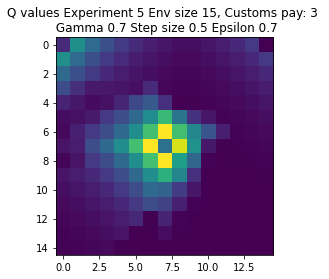

Expr:6 Eps:0 RunnAReward:-44.0 Reward:-870 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-320.0 Reward:107 Timesteps:450 GotPack:False Utiltime:130 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-764.0 Reward:275 Timesteps:450 GotPack:False Utiltime:6 Customstime:0 Money:1
Expr:6 Eps:60 RunnAReward:169.0 Reward:1048 Timesteps:694 GotPack:True Utiltime:258 Customstime:383 Money:4
Expr:6 Eps:80 RunnAReward:-204.0 Reward:-641 Timesteps:2286 GotPack:True Utiltime:14 Customstime:675 Money:5
Expr:6 Eps:100 RunnAReward:264.0 Reward:278 Timesteps:450 GotPack:False Utiltime:73 Customstime:0 Money:1
Expr:6 Eps:120 RunnAReward:290.0 Reward:-24 Timesteps:675 GotPack:False Utiltime:49 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:690.0 Reward:1164 Timesteps:803 GotPack:True Utiltime:473 Customstime:595 Money:4
Expr:6 Eps:160 RunnAReward:579.0 Reward:1539 Timesteps:572 GotPack:True Utiltime:86 Customstime:242 Money:5
Expr:6 Eps:180 RunnAReward:483.0 Rewar

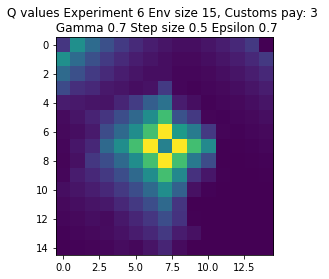

Expr:7 Eps:0 RunnAReward:-161.0 Reward:-3205 Timesteps:4109 GotPack:True Utiltime:3421 Customstime:3724 Money:5
Expr:7 Eps:20 RunnAReward:-772.0 Reward:-2726 Timesteps:3668 GotPack:True Utiltime:741 Customstime:1532 Money:3
Expr:7 Eps:40 RunnAReward:-300.0 Reward:979 Timesteps:869 GotPack:True Utiltime:573 Customstime:821 Money:3
Expr:7 Eps:60 RunnAReward:-44.0 Reward:826 Timesteps:1123 GotPack:True Utiltime:437 Customstime:513 Money:3
Expr:7 Eps:80 RunnAReward:-52.0 Reward:360 Timesteps:450 GotPack:False Utiltime:56 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:357.0 Reward:-392 Timesteps:1995 GotPack:True Utiltime:1692 Customstime:1943 Money:4
Expr:7 Eps:120 RunnAReward:721.0 Reward:1559 Timesteps:600 GotPack:True Utiltime:135 Customstime:440 Money:3
Expr:7 Eps:140 RunnAReward:531.0 Reward:90 Timesteps:450 GotPack:False Utiltime:55 Customstime:0 Money:1
Expr:7 Eps:160 RunnAReward:591.0 Reward:99 Timesteps:675 GotPack:False Utiltime:55 Customstime:0 Money:2
Expr:7 Eps:180 RunnARewa

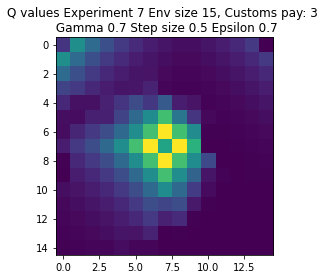

Expr:8 Eps:0 RunnAReward:-20.0 Reward:-383 Timesteps:2092 GotPack:True Utiltime:1345 Customstime:1794 Money:4
Expr:8 Eps:20 RunnAReward:-589.0 Reward:253 Timesteps:450 GotPack:False Utiltime:286 Customstime:0 Money:1
Expr:8 Eps:40 RunnAReward:-479.0 Reward:-968 Timesteps:2740 GotPack:True Utiltime:759 Customstime:1047 Money:4
Expr:8 Eps:60 RunnAReward:-177.0 Reward:286 Timesteps:450 GotPack:False Utiltime:222 Customstime:0 Money:1
Expr:8 Eps:80 RunnAReward:131.0 Reward:-367 Timesteps:1125 GotPack:False Utiltime:60 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:346.0 Reward:-618 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:204.0 Reward:266 Timesteps:450 GotPack:False Utiltime:75 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:504.0 Reward:367 Timesteps:450 GotPack:False Utiltime:103 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:601.0 Reward:-214 Timesteps:900 GotPack:False Utiltime:39 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:745.0

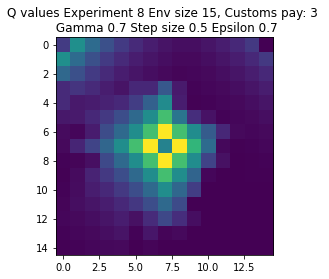

Expr:9 Eps:0 RunnAReward:-30.0 Reward:-586 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-887.0 Reward:-487 Timesteps:675 GotPack:False Utiltime:13 Customstime:0 Money:1
Expr:9 Eps:40 RunnAReward:-572.0 Reward:-5030 Timesteps:5454 GotPack:True Utiltime:2222 Customstime:2417 Money:5
Expr:9 Eps:60 RunnAReward:-206.0 Reward:757 Timesteps:1115 GotPack:True Utiltime:280 Customstime:671 Money:3
Expr:9 Eps:80 RunnAReward:98.0 Reward:-36 Timesteps:1792 GotPack:True Utiltime:117 Customstime:487 Money:4
Expr:9 Eps:100 RunnAReward:276.0 Reward:662 Timesteps:1191 GotPack:True Utiltime:50 Customstime:136 Money:5
Expr:9 Eps:120 RunnAReward:605.0 Reward:10 Timesteps:675 GotPack:False Utiltime:131 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:139.0 Reward:661 Timesteps:1158 GotPack:True Utiltime:736 Customstime:1094 Money:5
Expr:9 Eps:160 RunnAReward:354.0 Reward:374 Timesteps:450 GotPack:False Utiltime:60 Customstime:0 Money:1
Expr:9 Eps:180 RunnAReward:549

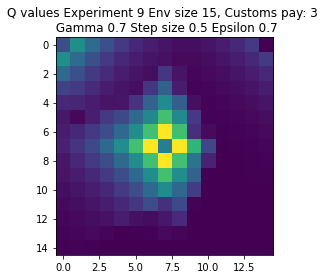

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.7 Step size 0.5 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-1.0 Reward:-16 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-257.0 Reward:-65 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-267.0 Reward:-84 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:15.0 Reward:619 Timesteps:225 GotPack:False Utiltime:61 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:136.0 Reward:-81 Timesteps:450 GotPack:False Utiltime:209 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:211.0 Reward:369 Timesteps:225 GotPack:False Utiltime:9 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:42.0 Reward:370 Timesteps:225 GotPack:False Utiltime:40 Customstime:0 Mon

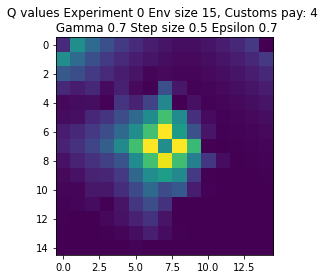

Expr:1 Eps:0 RunnAReward:-20.0 Reward:-400 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-301.0 Reward:-533 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:40 RunnAReward:-365.0 Reward:1172 Timesteps:798 GotPack:True Utiltime:651 Customstime:744 Money:4
Expr:1 Eps:60 RunnAReward:-192.0 Reward:-185 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:166.0 Reward:604 Timesteps:225 GotPack:False Utiltime:209 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:227.0 Reward:254 Timesteps:450 GotPack:False Utiltime:115 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:317.0 Reward:575 Timesteps:225 GotPack:False Utiltime:144 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:344.0 Reward:616 Timesteps:1209 GotPack:True Utiltime:603 Customstime:1009 Money:5
Expr:1 Eps:160 RunnAReward:399.0 Reward:597 Timesteps:225 GotPack:False Utiltime:44 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:408.0 Reward

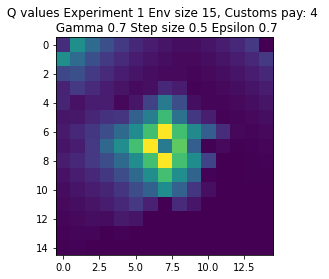

Expr:2 Eps:0 RunnAReward:-21.0 Reward:-411 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-516.0 Reward:-310 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-534.0 Reward:-346 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:54.0 Reward:-264 Timesteps:1870 GotPack:True Utiltime:346 Customstime:730 Money:5
Expr:2 Eps:80 RunnAReward:-299.0 Reward:-269 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:100 RunnAReward:-88.0 Reward:-112 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:115.0 Reward:422 Timesteps:225 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:232.0 Reward:1416 Timesteps:618 GotPack:True Utiltime:77 Customstime:117 Money:5
Expr:2 Eps:160 RunnAReward:562.0 Reward:573 Timesteps:225 GotPack:False Utiltime:75 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:230.0 Reward:557 

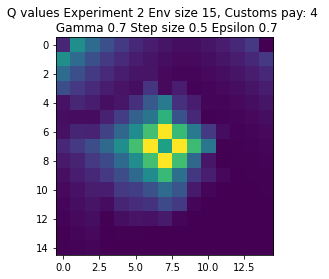

Expr:3 Eps:0 RunnAReward:-15.0 Reward:-283 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-166.0 Reward:-205 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:111.0 Reward:-318 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-336.0 Reward:-94 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-11.0 Reward:-8 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:131.0 Reward:597 Timesteps:225 GotPack:False Utiltime:15 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:211.0 Reward:410 Timesteps:225 GotPack:False Utiltime:94 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:269.0 Reward:360 Timesteps:225 GotPack:False Utiltime:36 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:471.0 Reward:-304 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:180 RunnAReward:526.0 Reward:378 Timesteps

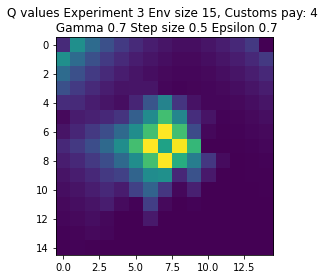

Expr:4 Eps:0 RunnAReward:-86.0 Reward:-1718 Timesteps:2961 GotPack:True Utiltime:1990 Customstime:2332 Money:4
Expr:4 Eps:20 RunnAReward:-677.0 Reward:-511 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:40 RunnAReward:-195.0 Reward:-371 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-100.0 Reward:-273 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:208.0 Reward:1109 Timesteps:722 GotPack:True Utiltime:144 Customstime:335 Money:4
Expr:4 Eps:100 RunnAReward:334.0 Reward:-63 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:236.0 Reward:643 Timesteps:225 GotPack:False Utiltime:62 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:276.0 Reward:410 Timesteps:225 GotPack:False Utiltime:33 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:459.0 Reward:258 Timesteps:450 GotPack:False Utiltime:193 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:398.0 Reward

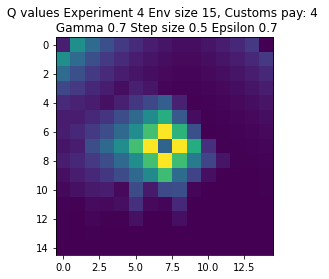

Expr:5 Eps:0 RunnAReward:-14.0 Reward:-263 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-468.0 Reward:-323 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-564.0 Reward:-346 Timesteps:2064 GotPack:True Utiltime:1624 Customstime:1757 Money:5
Expr:5 Eps:60 RunnAReward:69.0 Reward:-96 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-240.0 Reward:-46 Timesteps:450 GotPack:False Utiltime:152 Customstime:0 Money:3
Expr:5 Eps:100 RunnAReward:40.0 Reward:-58 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:133.0 Reward:-254 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:232.0 Reward:605 Timesteps:225 GotPack:False Utiltime:79 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:205.0 Reward:-40 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:488.0 Reward:958 Tim

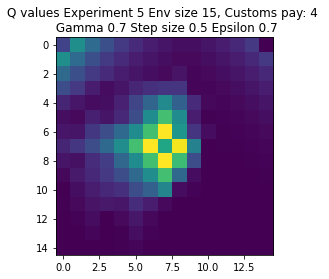

Expr:6 Eps:0 RunnAReward:-42.0 Reward:-839 Timesteps:2300 GotPack:True Utiltime:760 Customstime:814 Money:4
Expr:6 Eps:20 RunnAReward:-479.0 Reward:405 Timesteps:225 GotPack:False Utiltime:3 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-184.0 Reward:372 Timesteps:225 GotPack:False Utiltime:62 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-62.0 Reward:-53 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:183.0 Reward:380 Timesteps:225 GotPack:False Utiltime:28 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:289.0 Reward:360 Timesteps:225 GotPack:False Utiltime:114 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:218.0 Reward:685 Timesteps:1192 GotPack:True Utiltime:684 Customstime:1000 Money:4
Expr:6 Eps:140 RunnAReward:150.0 Reward:186 Timesteps:450 GotPack:False Utiltime:93 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:379.0 Reward:382 Timesteps:225 GotPack:False Utiltime:36 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:482.0 Reward:-4 

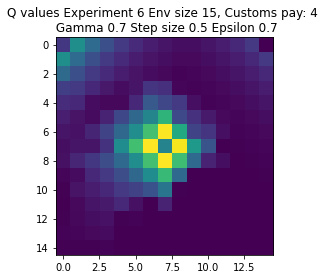

Expr:7 Eps:0 RunnAReward:19.0 Reward:394 Timesteps:225 GotPack:False Utiltime:84 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-503.0 Reward:-113 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-377.0 Reward:90 Timesteps:450 GotPack:False Utiltime:324 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-40.0 Reward:-101 Timesteps:675 GotPack:False Utiltime:431 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:102.0 Reward:-13 Timesteps:450 GotPack:False Utiltime:40 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:124.0 Reward:359 Timesteps:225 GotPack:False Utiltime:35 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:243.0 Reward:62 Timesteps:450 GotPack:False Utiltime:92 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:280.0 Reward:-58 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:521.0 Reward:96 Timesteps:1690 GotPack:True Utiltime:31 Customstime:556 Money:4
Expr:7 Eps:180 RunnAReward:534.0 Reward:1803 Times

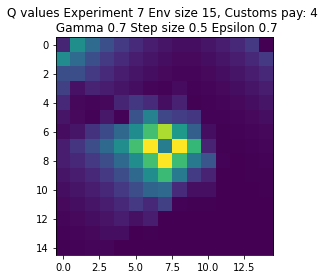

Expr:8 Eps:0 RunnAReward:-33.0 Reward:-658 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-211.0 Reward:-461 Timesteps:675 GotPack:False Utiltime:250 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-757.0 Reward:-1145 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:108.0 Reward:-562 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:80 RunnAReward:-112.0 Reward:0 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:210.0 Reward:-468 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:120 RunnAReward:199.0 Reward:397 Timesteps:225 GotPack:False Utiltime:76 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:221.0 Reward:598 Timesteps:225 GotPack:False Utiltime:136 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:581.0 Reward:507 Timesteps:225 GotPack:False Utiltime:35 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:499.0 Reward:665 Time

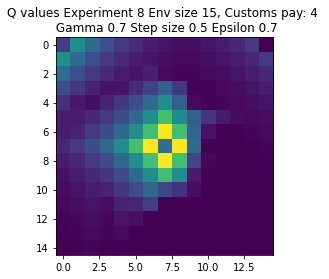

Expr:9 Eps:0 RunnAReward:-19.0 Reward:-377 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-761.0 Reward:-5530 Timesteps:5992 GotPack:True Utiltime:2368 Customstime:2568 Money:5
Expr:9 Eps:40 RunnAReward:-473.0 Reward:1069 Timesteps:935 GotPack:True Utiltime:20 Customstime:758 Money:4
Expr:9 Eps:60 RunnAReward:33.0 Reward:-249 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:91.0 Reward:-133 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-62.0 Reward:-407 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:289.0 Reward:612 Timesteps:225 GotPack:False Utiltime:21 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:313.0 Reward:622 Timesteps:225 GotPack:False Utiltime:46 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:424.0 Reward:490 Timesteps:225 GotPack:False Utiltime:31 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:545.0 Reward:649

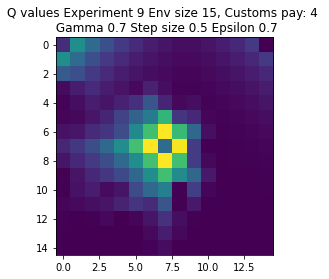

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.7 Step size 0.5 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-21.0 Reward:-413 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-417.0 Reward:-3006 Timesteps:3783 GotPack:True Utiltime:2954 Customstime:3279 Money:3
Expr:0 Eps:40 RunnAReward:-837.0 Reward:-458 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:60 RunnAReward:-511.0 Reward:-427 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-383.0 Reward:1326 Timesteps:651 GotPack:True Utiltime:57 Customstime:579 Money:4
Expr:0 Eps:100 RunnAReward:19.0 Reward:396 Timesteps:450 GotPack:False Utiltime:305 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:217.0 Reward:381 Timesteps:450 GotPack:False Utiltime:235

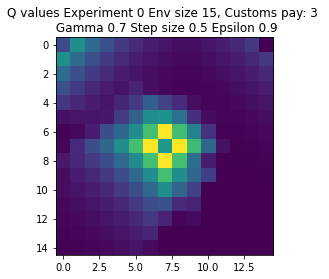

Expr:1 Eps:0 RunnAReward:-30.0 Reward:-599 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-1250.0 Reward:-8 Timesteps:675 GotPack:False Utiltime:158 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-554.0 Reward:55 Timesteps:450 GotPack:False Utiltime:9 Customstime:0 Money:2
Expr:1 Eps:60 RunnAReward:-263.0 Reward:117 Timesteps:450 GotPack:False Utiltime:217 Customstime:0 Money:1
Expr:1 Eps:80 RunnAReward:-314.0 Reward:-132 Timesteps:675 GotPack:False Utiltime:100 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:-449.0 Reward:-1001 Timesteps:2252 GotPack:True Utiltime:125 Customstime:411 Money:5
Expr:1 Eps:120 RunnAReward:-277.0 Reward:-384 Timesteps:1893 GotPack:True Utiltime:114 Customstime:980 Money:5
Expr:1 Eps:140 RunnAReward:235.0 Reward:22 Timesteps:675 GotPack:False Utiltime:21 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:519.0 Reward:1537 Timesteps:420 GotPack:True Utiltime:76 Customstime:365 Money:5
Expr:1 Eps:180 RunnAReward:395.0 R

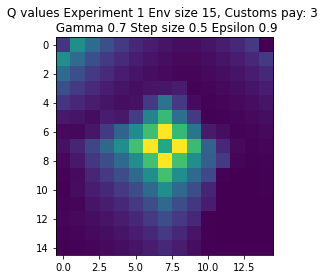

Expr:2 Eps:0 RunnAReward:1.0 Reward:27 Timesteps:450 GotPack:False Utiltime:419 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-922.0 Reward:376 Timesteps:450 GotPack:False Utiltime:217 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-629.0 Reward:693 Timesteps:1158 GotPack:True Utiltime:517 Customstime:929 Money:3
Expr:2 Eps:60 RunnAReward:-433.0 Reward:201 Timesteps:450 GotPack:False Utiltime:359 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-560.0 Reward:324 Timesteps:450 GotPack:False Utiltime:262 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:-52.0 Reward:576 Timesteps:1344 GotPack:True Utiltime:128 Customstime:643 Money:3
Expr:2 Eps:120 RunnAReward:53.0 Reward:269 Timesteps:450 GotPack:False Utiltime:70 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:345.0 Reward:-35 Timesteps:675 GotPack:False Utiltime:168 Customstime:0 Money:2
Expr:2 Eps:160 RunnAReward:376.0 Reward:986 Timesteps:924 GotPack:True Utiltime:610 Customstime:685 Money:5
Expr:2 Eps:180 RunnAReward:340.0 Reward

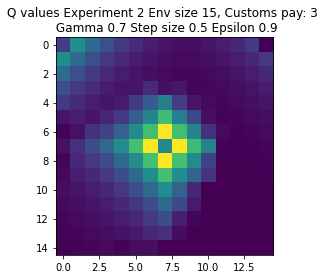

Expr:3 Eps:0 RunnAReward:-44.0 Reward:-873 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-525.0 Reward:-555 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-533.0 Reward:191 Timesteps:450 GotPack:False Utiltime:289 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-167.0 Reward:403 Timesteps:450 GotPack:False Utiltime:139 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-276.0 Reward:321 Timesteps:450 GotPack:False Utiltime:37 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:57.0 Reward:361 Timesteps:450 GotPack:False Utiltime:72 Customstime:0 Money:1
Expr:3 Eps:120 RunnAReward:-31.0 Reward:255 Timesteps:450 GotPack:False Utiltime:132 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-66.0 Reward:-849 Timesteps:2364 GotPack:True Utiltime:362 Customstime:627 Money:4
Expr:3 Eps:160 RunnAReward:227.0 Reward:-498 Timesteps:1883 GotPack:True Utiltime:31 Customstime:249 Money:3
Expr:3 Eps:180 RunnAReward:344.0 Reward

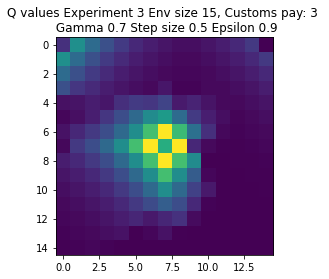

Expr:4 Eps:0 RunnAReward:-26.0 Reward:-516 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-1680.0 Reward:-3 Timesteps:450 GotPack:False Utiltime:340 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-285.0 Reward:227 Timesteps:450 GotPack:False Utiltime:82 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-117.0 Reward:84 Timesteps:450 GotPack:False Utiltime:282 Customstime:0 Money:1
Expr:4 Eps:80 RunnAReward:-181.0 Reward:887 Timesteps:1078 GotPack:True Utiltime:24 Customstime:852 Money:3
Expr:4 Eps:100 RunnAReward:-40.0 Reward:-156 Timesteps:900 GotPack:False Utiltime:133 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:51.0 Reward:348 Timesteps:450 GotPack:False Utiltime:92 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:60.0 Reward:-996 Timesteps:2307 GotPack:True Utiltime:104 Customstime:479 Money:3
Expr:4 Eps:160 RunnAReward:183.0 Reward:-81 Timesteps:675 GotPack:False Utiltime:136 Customstime:0 Money:1
Expr:4 Eps:180 RunnAReward:307.0 Reward:

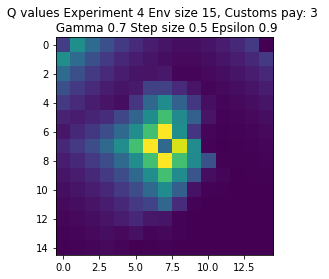

Expr:5 Eps:0 RunnAReward:-34.0 Reward:-661 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-1033.0 Reward:283 Timesteps:450 GotPack:False Utiltime:107 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-303.0 Reward:16 Timesteps:675 GotPack:False Utiltime:39 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-817.0 Reward:119 Timesteps:450 GotPack:False Utiltime:398 Customstime:0 Money:1
Expr:5 Eps:80 RunnAReward:-633.0 Reward:-1983 Timesteps:3107 GotPack:True Utiltime:2853 Customstime:2913 Money:3
Expr:5 Eps:100 RunnAReward:-59.0 Reward:-773 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:94.0 Reward:-249 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:350.0 Reward:1089 Timesteps:770 GotPack:True Utiltime:90 Customstime:389 Money:5
Expr:5 Eps:160 RunnAReward:144.0 Reward:-420 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:316.0 Rewar

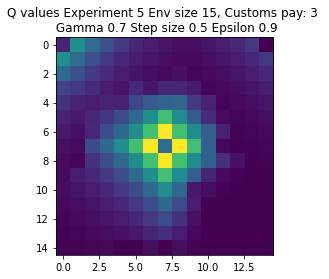

Expr:6 Eps:0 RunnAReward:-268.0 Reward:-5342 Timesteps:5305 GotPack:True Utiltime:4052 Customstime:4352 Money:5
Expr:6 Eps:20 RunnAReward:-983.0 Reward:-2789 Timesteps:3447 GotPack:True Utiltime:1264 Customstime:1687 Money:4
Expr:6 Eps:40 RunnAReward:-836.0 Reward:-15 Timesteps:675 GotPack:False Utiltime:67 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-698.0 Reward:285 Timesteps:450 GotPack:False Utiltime:290 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:-203.0 Reward:247 Timesteps:450 GotPack:False Utiltime:217 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:184.0 Reward:393 Timesteps:450 GotPack:False Utiltime:117 Customstime:0 Money:1
Expr:6 Eps:120 RunnAReward:35.0 Reward:-49 Timesteps:675 GotPack:False Utiltime:142 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:301.0 Reward:983 Timesteps:1012 GotPack:True Utiltime:804 Customstime:841 Money:3
Expr:6 Eps:160 RunnAReward:210.0 Reward:358 Timesteps:450 GotPack:False Utiltime:216 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward

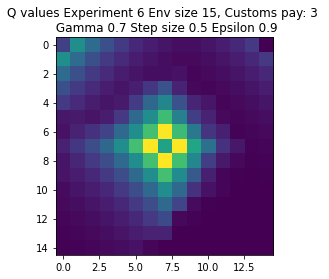

Expr:7 Eps:0 RunnAReward:-16.0 Reward:-311 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-1892.0 Reward:-593 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-532.0 Reward:606 Timesteps:1371 GotPack:True Utiltime:843 Customstime:1004 Money:3
Expr:7 Eps:60 RunnAReward:-436.0 Reward:-5 Timesteps:675 GotPack:False Utiltime:103 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-72.0 Reward:338 Timesteps:450 GotPack:False Utiltime:187 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:163.0 Reward:-334 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:177.0 Reward:-78 Timesteps:1957 GotPack:True Utiltime:134 Customstime:622 Money:4
Expr:7 Eps:140 RunnAReward:106.0 Reward:334 Timesteps:450 GotPack:False Utiltime:106 Customstime:0 Money:1
Expr:7 Eps:160 RunnAReward:193.0 Reward:277 Timesteps:450 GotPack:False Utiltime:80 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:226.0 Reward

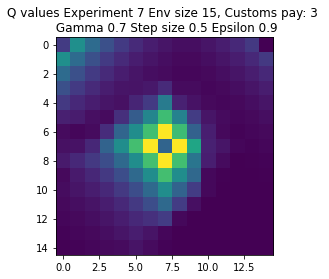

Expr:8 Eps:0 RunnAReward:-6.0 Reward:-104 Timesteps:450 GotPack:False Utiltime:273 Customstime:0 Money:1
Expr:8 Eps:20 RunnAReward:-1245.0 Reward:-1417 Timesteps:2644 GotPack:True Utiltime:233 Customstime:788 Money:5
Expr:8 Eps:40 RunnAReward:-657.0 Reward:-461 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-418.0 Reward:69 Timesteps:450 GotPack:False Utiltime:409 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-337.0 Reward:-502 Timesteps:2059 GotPack:True Utiltime:313 Customstime:482 Money:3
Expr:8 Eps:100 RunnAReward:-291.0 Reward:-756 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:133.0 Reward:-32 Timesteps:675 GotPack:False Utiltime:12 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:369.0 Reward:370 Timesteps:450 GotPack:False Utiltime:55 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:311.0 Reward:301 Timesteps:450 GotPack:False Utiltime:358 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:291.0 Re

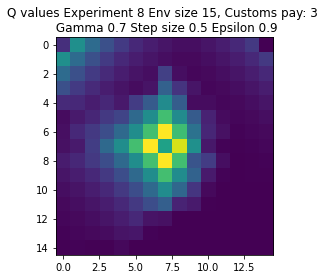

Expr:9 Eps:0 RunnAReward:-15.0 Reward:-296 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-930.0 Reward:-1428 Timesteps:2584 GotPack:True Utiltime:1571 Customstime:1921 Money:5
Expr:9 Eps:40 RunnAReward:-698.0 Reward:-754 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-556.0 Reward:-318 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-178.0 Reward:-350 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-123.0 Reward:354 Timesteps:450 GotPack:False Utiltime:75 Customstime:0 Money:1
Expr:9 Eps:120 RunnAReward:-80.0 Reward:507 Timesteps:1163 GotPack:True Utiltime:729 Customstime:791 Money:4
Expr:9 Eps:140 RunnAReward:381.0 Reward:-178 Timesteps:675 GotPack:False Utiltime:184 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:64.0 Reward:-831 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:402.0 Rew

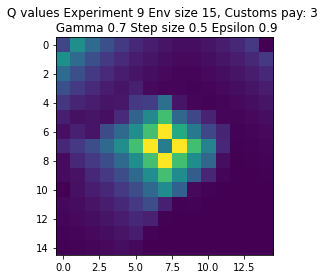

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.7 Step size 0.5 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:2.0 Reward:51 Timesteps:450 GotPack:False Utiltime:436 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-477.0 Reward:-382 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-578.0 Reward:-98 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-297.0 Reward:-148 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-368.0 Reward:293 Timesteps:225 GotPack:False Utiltime:33 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:23.0 Reward:957 Timesteps:838 GotPack:True Utiltime:137 Customstime:498 Money:4
Expr:0 Eps:120 RunnAReward:194.0 Reward:-207 Timesteps:1705 GotPack:True Utiltime:177 Customsti

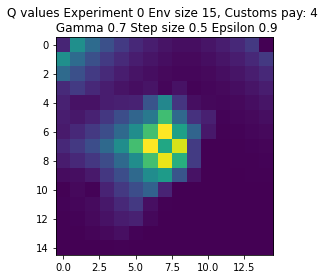

Expr:1 Eps:0 RunnAReward:-20.0 Reward:-391 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-669.0 Reward:-396 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-478.0 Reward:-276 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-112.0 Reward:-303 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-364.0 Reward:-1066 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:100 RunnAReward:65.0 Reward:-60 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:-8.0 Reward:185 Timesteps:450 GotPack:False Utiltime:14 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:193.0 Reward:-8 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:378.0 Reward:619 Timesteps:225 GotPack:False Utiltime:174 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:372.0 Reward:158 Timeste

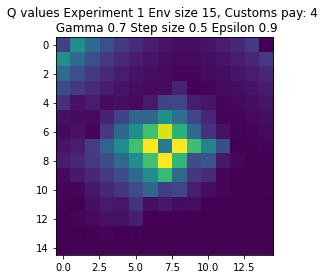

Expr:2 Eps:0 RunnAReward:3.0 Reward:78 Timesteps:450 GotPack:False Utiltime:271 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-251.0 Reward:-18 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-439.0 Reward:-9 Timesteps:675 GotPack:False Utiltime:402 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-565.0 Reward:-29 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-166.0 Reward:328 Timesteps:225 GotPack:False Utiltime:80 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-77.0 Reward:-130 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:66.0 Reward:1517 Timesteps:465 GotPack:True Utiltime:68 Customstime:340 Money:4
Expr:2 Eps:140 RunnAReward:238.0 Reward:40 Timesteps:450 GotPack:False Utiltime:259 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:264.0 Reward:-348 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:180 RunnAReward:6.0 Reward:567 Timesteps

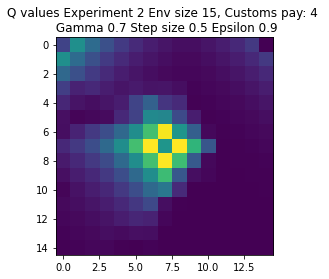

Expr:3 Eps:0 RunnAReward:16.0 Reward:329 Timesteps:225 GotPack:False Utiltime:224 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-491.0 Reward:-295 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-401.0 Reward:-520 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:60 RunnAReward:-155.0 Reward:-96 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-169.0 Reward:-40 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:122.0 Reward:182 Timesteps:450 GotPack:False Utiltime:32 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:45.0 Reward:-393 Timesteps:2066 GotPack:True Utiltime:342 Customstime:423 Money:5
Expr:3 Eps:140 RunnAReward:-82.0 Reward:-150 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:114.0 Reward:595 Timesteps:225 GotPack:False Utiltime:99 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:218.0 Reward:271 Tim

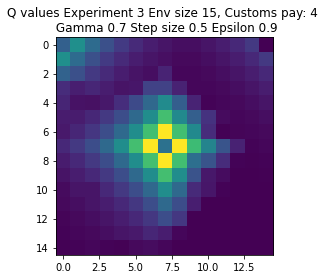

Expr:4 Eps:0 RunnAReward:-16.0 Reward:-308 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-859.0 Reward:-1366 Timesteps:2758 GotPack:True Utiltime:2410 Customstime:2519 Money:5
Expr:4 Eps:40 RunnAReward:-362.0 Reward:-346 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-513.0 Reward:-47 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-149.0 Reward:710 Timesteps:1216 GotPack:True Utiltime:1 Customstime:1115 Money:5
Expr:4 Eps:100 RunnAReward:196.0 Reward:352 Timesteps:225 GotPack:False Utiltime:173 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-6.0 Reward:-542 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:102.0 Reward:181 Timesteps:450 GotPack:False Utiltime:75 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:216.0 Reward:120 Timesteps:450 GotPack:False Utiltime:160 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:247.0 Reward

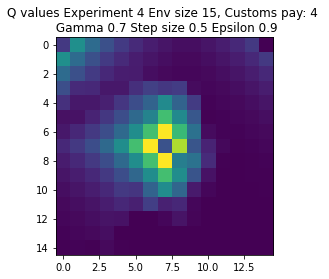

Expr:5 Eps:0 RunnAReward:-48.0 Reward:-948 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-587.0 Reward:-4271 Timesteps:4929 GotPack:True Utiltime:1457 Customstime:2156 Money:5
Expr:5 Eps:40 RunnAReward:-1003.0 Reward:-85 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-264.0 Reward:-1730 Timesteps:3005 GotPack:True Utiltime:1958 Customstime:2296 Money:5
Expr:5 Eps:80 RunnAReward:-350.0 Reward:326 Timesteps:225 GotPack:False Utiltime:8 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:108.0 Reward:422 Timesteps:1377 GotPack:True Utiltime:1129 Customstime:1177 Money:5
Expr:5 Eps:120 RunnAReward:47.0 Reward:565 Timesteps:225 GotPack:False Utiltime:100 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:455.0 Reward:259 Timesteps:450 GotPack:False Utiltime:90 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:247.0 Reward:-221 Timesteps:675 GotPack:False Utiltime:210 Customstime:0 Money:3
Expr:5 Eps:180 RunnAReward:4

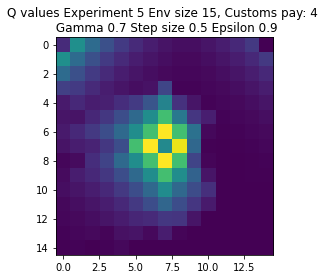

Expr:6 Eps:0 RunnAReward:-22.0 Reward:-439 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-238.0 Reward:-340 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-149.0 Reward:292 Timesteps:1586 GotPack:True Utiltime:330 Customstime:1072 Money:5
Expr:6 Eps:60 RunnAReward:-288.0 Reward:-44 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-374.0 Reward:-73 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-77.0 Reward:275 Timesteps:225 GotPack:False Utiltime:51 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-365.0 Reward:52 Timesteps:450 GotPack:False Utiltime:128 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:-76.0 Reward:-76 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:256.0 Reward:362 Timesteps:225 GotPack:False Utiltime:193 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:159.0 Reward:572 T

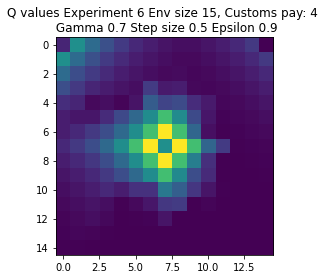

Expr:7 Eps:0 RunnAReward:19.0 Reward:387 Timesteps:225 GotPack:False Utiltime:18 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-304.0 Reward:-2740 Timesteps:4110 GotPack:True Utiltime:1587 Customstime:1690 Money:5
Expr:7 Eps:40 RunnAReward:-512.0 Reward:603 Timesteps:225 GotPack:False Utiltime:55 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-347.0 Reward:-208 Timesteps:1622 GotPack:True Utiltime:1373 Customstime:1415 Money:5
Expr:7 Eps:80 RunnAReward:101.0 Reward:547 Timesteps:225 GotPack:False Utiltime:110 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-78.0 Reward:-266 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:132.0 Reward:-36 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:207.0 Reward:-50 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:343.0 Reward:756 Timesteps:1071 GotPack:True Utiltime:37 Customstime:371 Money:5
Expr:7 Eps:180 RunnAReward:530.0 Rew

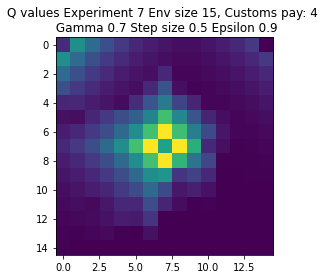

Expr:8 Eps:0 RunnAReward:-8.0 Reward:-144 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-526.0 Reward:-238 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-467.0 Reward:201 Timesteps:450 GotPack:False Utiltime:445 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-251.0 Reward:166 Timesteps:450 GotPack:False Utiltime:222 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:-388.0 Reward:-179 Timesteps:675 GotPack:False Utiltime:408 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-38.0 Reward:360 Timesteps:450 GotPack:False Utiltime:378 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:-11.0 Reward:305 Timesteps:450 GotPack:False Utiltime:35 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:292.0 Reward:386 Timesteps:225 GotPack:False Utiltime:165 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:206.0 Reward:662 Timesteps:225 GotPack:False Utiltime:45 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:379.0 Reward:143

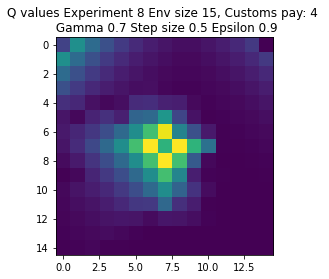

Expr:9 Eps:0 RunnAReward:-12.0 Reward:-230 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-914.0 Reward:-700 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-271.0 Reward:-24 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-436.0 Reward:327 Timesteps:225 GotPack:False Utiltime:84 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-72.0 Reward:410 Timesteps:450 GotPack:False Utiltime:163 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:-346.0 Reward:-163 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:86.0 Reward:410 Timesteps:225 GotPack:False Utiltime:197 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:291.0 Reward:-48 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:400.0 Reward:138 Timesteps:450 GotPack:False Utiltime:93 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:496.0 Reward:-16 Times

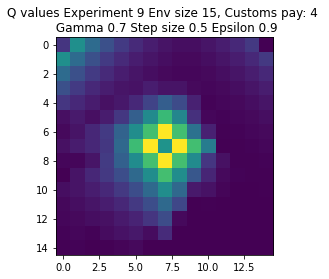

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.7 Step size 0.5 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-34.0 Reward:-672 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:20 RunnAReward:-1006.0 Reward:788 Timesteps:1156 GotPack:True Utiltime:482 Customstime:535 Money:3
Expr:0 Eps:40 RunnAReward:-1636.0 Reward:-976 Timesteps:2221 GotPack:True Utiltime:398 Customstime:1407 Money:4
Expr:0 Eps:60 RunnAReward:-407.0 Reward:81 Timesteps:675 GotPack:False Utiltime:548 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-445.0 Reward:290 Timesteps:450 GotPack:False Utiltime:43 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-687.0 Reward:-117 Timesteps:1866 GotPack:True Utiltime:1189 Customstime:1443 Money:5
Expr:0 Eps:120 RunnAReward:-133.0 Reward:-276 Timesteps:675 GotPack:False Ut

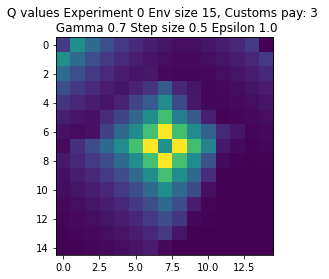

Expr:1 Eps:0 RunnAReward:-1.0 Reward:-15 Timesteps:450 GotPack:False Utiltime:195 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-844.0 Reward:-1611 Timesteps:2870 GotPack:True Utiltime:921 Customstime:1456 Money:4
Expr:1 Eps:40 RunnAReward:-585.0 Reward:-379 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-929.0 Reward:-548 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-609.0 Reward:-461 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-161.0 Reward:1216 Timesteps:794 GotPack:True Utiltime:108 Customstime:162 Money:3
Expr:1 Eps:120 RunnAReward:-425.0 Reward:-587 Timesteps:900 GotPack:False Utiltime:141 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:132.0 Reward:1069 Timesteps:747 GotPack:True Utiltime:81 Customstime:359 Money:5
Expr:1 Eps:160 RunnAReward:-207.0 Reward:-2016 Timesteps:3203 GotPack:True Utiltime:1628 Customstime:1740 Money:4
Expr:1 Eps:180 RunnARewar

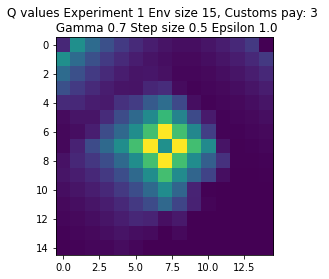

Expr:2 Eps:0 RunnAReward:-26.0 Reward:-518 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-1141.0 Reward:-661 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-1327.0 Reward:-488 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-973.0 Reward:-61 Timesteps:450 GotPack:False Utiltime:79 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-661.0 Reward:-6559 Timesteps:6145 GotPack:True Utiltime:1843 Customstime:1950 Money:3
Expr:2 Eps:100 RunnAReward:-771.0 Reward:38 Timesteps:675 GotPack:False Utiltime:79 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:-138.0 Reward:657 Timesteps:1345 GotPack:True Utiltime:826 Customstime:1187 Money:3
Expr:2 Eps:140 RunnAReward:20.0 Reward:253 Timesteps:450 GotPack:False Utiltime:145 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:-25.0 Reward:-40 Timesteps:450 GotPack:False Utiltime:196 Customstime:0 Money:1
Expr:2 Eps:180 RunnAReward:50.0 R

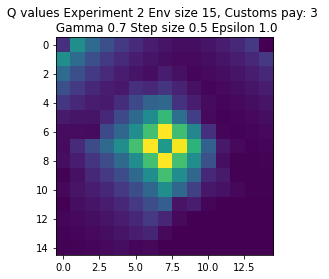

Expr:3 Eps:0 RunnAReward:-198.0 Reward:-3960 Timesteps:4568 GotPack:True Utiltime:2029 Customstime:2363 Money:3
Expr:3 Eps:20 RunnAReward:-1147.0 Reward:158 Timesteps:450 GotPack:False Utiltime:128 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-1209.0 Reward:-920 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-605.0 Reward:-275 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-1028.0 Reward:-2905 Timesteps:3540 GotPack:True Utiltime:2504 Customstime:2570 Money:5
Expr:3 Eps:100 RunnAReward:-555.0 Reward:-587 Timesteps:900 GotPack:False Utiltime:130 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:-185.0 Reward:-31 Timesteps:450 GotPack:False Utiltime:22 Customstime:0 Money:1
Expr:3 Eps:140 RunnAReward:-69.0 Reward:-34 Timesteps:675 GotPack:False Utiltime:239 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:25.0 Reward:-598 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:180 RunnARewar

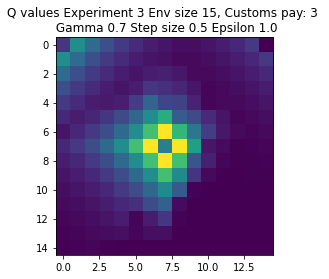

Expr:4 Eps:0 RunnAReward:-46.0 Reward:-920 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-704.0 Reward:-5575 Timesteps:6012 GotPack:True Utiltime:1976 Customstime:3343 Money:3
Expr:4 Eps:40 RunnAReward:-1853.0 Reward:-4486 Timesteps:4628 GotPack:True Utiltime:4146 Customstime:4286 Money:5
Expr:4 Eps:60 RunnAReward:-911.0 Reward:-605 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-563.0 Reward:-331 Timesteps:900 GotPack:False Utiltime:32 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-331.0 Reward:438 Timesteps:1273 GotPack:True Utiltime:987 Customstime:1225 Money:5
Expr:4 Eps:120 RunnAReward:-429.0 Reward:948 Timesteps:855 GotPack:True Utiltime:94 Customstime:594 Money:3
Expr:4 Eps:140 RunnAReward:72.0 Reward:350 Timesteps:450 GotPack:False Utiltime:130 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:35.0 Reward:375 Timesteps:450 GotPack:False Utiltime:361 Customstime:0 Money:0
Expr:4 Eps:180 RunnARewar

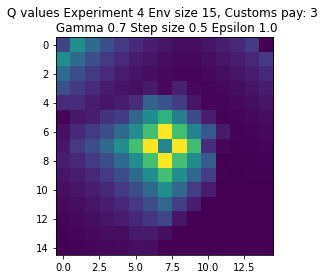

Expr:5 Eps:0 RunnAReward:-12.0 Reward:-229 Timesteps:675 GotPack:False Utiltime:81 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-785.0 Reward:-699 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-1300.0 Reward:-1461 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-1004.0 Reward:-285 Timesteps:450 GotPack:False Utiltime:383 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-1266.0 Reward:-2205 Timesteps:3183 GotPack:True Utiltime:429 Customstime:893 Money:3
Expr:5 Eps:100 RunnAReward:-128.0 Reward:-429 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:120 RunnAReward:-599.0 Reward:-178 Timesteps:1760 GotPack:True Utiltime:509 Customstime:868 Money:3
Expr:5 Eps:140 RunnAReward:125.0 Reward:-482 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:223.0 Reward:322 Timesteps:450 GotPack:False Utiltime:427 Customstime:0 Money:2
Expr:5 Eps:180 RunnAReward:70

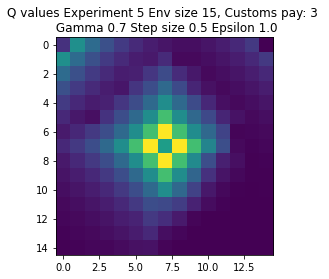

Expr:6 Eps:0 RunnAReward:38.0 Reward:778 Timesteps:1046 GotPack:True Utiltime:354 Customstime:500 Money:5
Expr:6 Eps:20 RunnAReward:-659.0 Reward:-221 Timesteps:1739 GotPack:True Utiltime:188 Customstime:661 Money:5
Expr:6 Eps:40 RunnAReward:-895.0 Reward:-2273 Timesteps:3267 GotPack:True Utiltime:1151 Customstime:1378 Money:3
Expr:6 Eps:60 RunnAReward:-852.0 Reward:-1204 Timesteps:2640 GotPack:True Utiltime:1039 Customstime:1694 Money:3
Expr:6 Eps:80 RunnAReward:-686.0 Reward:-769 Timesteps:2311 GotPack:True Utiltime:1214 Customstime:1334 Money:4
Expr:6 Eps:100 RunnAReward:-203.0 Reward:332 Timesteps:1540 GotPack:True Utiltime:196 Customstime:721 Money:3
Expr:6 Eps:120 RunnAReward:-515.0 Reward:-201 Timesteps:675 GotPack:False Utiltime:105 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:-62.0 Reward:90 Timesteps:675 GotPack:False Utiltime:113 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:8.0 Reward:-186 Timesteps:675 GotPack:False Utiltime:71 Customstime:0 Money:2
Expr:6 Eps:180 R

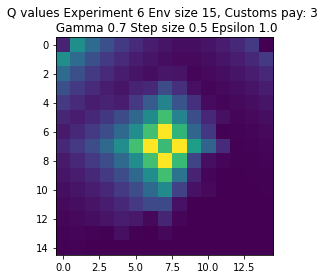

Expr:7 Eps:0 RunnAReward:-26.0 Reward:-502 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-758.0 Reward:-319 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:40 RunnAReward:-1485.0 Reward:-408 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-963.0 Reward:-638 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-515.0 Reward:-2537 Timesteps:3336 GotPack:True Utiltime:1403 Customstime:2484 Money:4
Expr:7 Eps:100 RunnAReward:-800.0 Reward:-305 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:120 RunnAReward:-362.0 Reward:298 Timesteps:450 GotPack:False Utiltime:78 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-220.0 Reward:260 Timesteps:450 GotPack:False Utiltime:65 Customstime:0 Money:1
Expr:7 Eps:160 RunnAReward:304.0 Reward:245 Timesteps:450 GotPack:False Utiltime:248 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:290.0 Rew

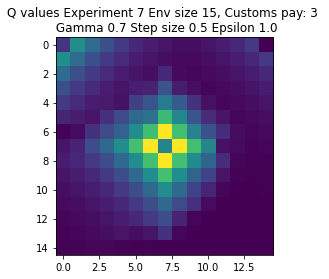

Expr:8 Eps:0 RunnAReward:-15.0 Reward:-299 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-1193.0 Reward:-985 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-967.0 Reward:-464 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-655.0 Reward:-366 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-942.0 Reward:-5848 Timesteps:6274 GotPack:True Utiltime:3259 Customstime:3498 Money:4
Expr:8 Eps:100 RunnAReward:-484.0 Reward:-499 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-503.0 Reward:-18 Timesteps:1813 GotPack:True Utiltime:1300 Customstime:1382 Money:3
Expr:8 Eps:140 RunnAReward:-3.0 Reward:522 Timesteps:1294 GotPack:True Utiltime:431 Customstime:823 Money:5
Expr:8 Eps:160 RunnAReward:157.0 Reward:142 Timesteps:450 GotPack:False Utiltime:1 Customstime:0 Money:1
Expr:8 Eps:180 RunnAReward:-103.

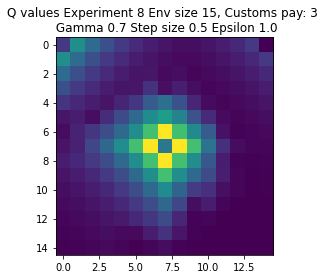

Expr:9 Eps:0 RunnAReward:-338.0 Reward:-6746 Timesteps:6254 GotPack:True Utiltime:3788 Customstime:4216 Money:3
Expr:9 Eps:20 RunnAReward:-1201.0 Reward:-315 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-1565.0 Reward:-6943 Timesteps:6533 GotPack:True Utiltime:4025 Customstime:4202 Money:3
Expr:9 Eps:60 RunnAReward:-1573.0 Reward:-21 Timesteps:450 GotPack:False Utiltime:115 Customstime:0 Money:1
Expr:9 Eps:80 RunnAReward:-322.0 Reward:403 Timesteps:450 GotPack:False Utiltime:141 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:73.0 Reward:-354 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-352.0 Reward:137 Timesteps:450 GotPack:False Utiltime:413 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:82.0 Reward:-745 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:207.0 Reward:305 Timesteps:450 GotPack:False Utiltime:35 Customstime:0 Money:1
Expr:9 Eps:180 RunnAReward:8

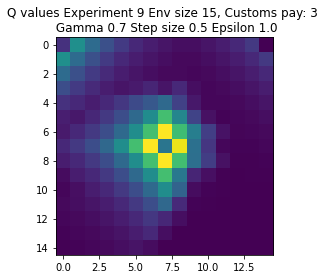

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.7 Step size 0.5 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-64.0 Reward:-1279 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:20 RunnAReward:-535.0 Reward:-2013 Timesteps:3429 GotPack:True Utiltime:1092 Customstime:1301 Money:4
Expr:0 Eps:40 RunnAReward:-877.0 Reward:-815 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-703.0 Reward:363 Timesteps:225 GotPack:False Utiltime:205 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-597.0 Reward:-70 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-223.0 Reward:180 Timesteps:1466 GotPack:True Utiltime:851 Customstime:1063 Money:5
Expr:0 Eps:120 RunnAReward:-72.0 Reward:-596 Timesteps:450 GotPack:False Utiltim

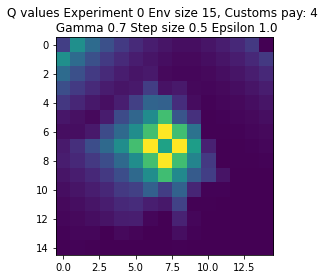

Expr:1 Eps:0 RunnAReward:-27.0 Reward:-537 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:20 RunnAReward:-420.0 Reward:-150 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-218.0 Reward:-117 Timesteps:1855 GotPack:True Utiltime:1638 Customstime:1658 Money:5
Expr:1 Eps:60 RunnAReward:-873.0 Reward:-2366 Timesteps:3149 GotPack:True Utiltime:417 Customstime:1764 Money:5
Expr:1 Eps:80 RunnAReward:-422.0 Reward:-2898 Timesteps:3815 GotPack:True Utiltime:1069 Customstime:1229 Money:5
Expr:1 Eps:100 RunnAReward:-412.0 Reward:-330 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:-25.0 Reward:-8 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:-180.0 Reward:-41 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:-108.0 Reward:-69 Timesteps:1553 GotPack:True Utiltime:113 Customstime:1385 Money:4
Expr:1 Eps:180 RunnARewar

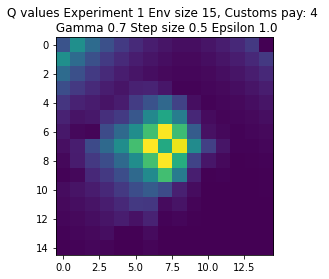

Expr:2 Eps:0 RunnAReward:-26.0 Reward:-506 Timesteps:450 GotPack:False Utiltime:87 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-627.0 Reward:-233 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-1042.0 Reward:-381 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-263.0 Reward:-360 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-283.0 Reward:-633 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:-229.0 Reward:-374 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-342.0 Reward:-344 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-239.0 Reward:-2431 Timesteps:3548 GotPack:True Utiltime:20 Customstime:1185 Money:5
Expr:2 Eps:160 RunnAReward:-223.0 Reward:450 Timesteps:225 GotPack:False Utiltime:73 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:223.0 Rewa

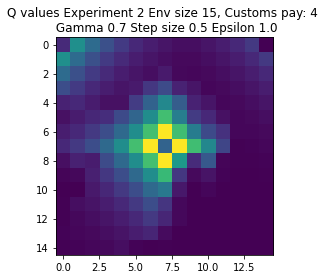

Expr:3 Eps:0 RunnAReward:16.0 Reward:327 Timesteps:225 GotPack:False Utiltime:77 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-347.0 Reward:-1032 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:40 RunnAReward:-436.0 Reward:-952 Timesteps:2595 GotPack:True Utiltime:1673 Customstime:1860 Money:5
Expr:3 Eps:60 RunnAReward:-200.0 Reward:-73 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-388.0 Reward:-7 Timesteps:450 GotPack:False Utiltime:275 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:-227.0 Reward:-940 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:120 RunnAReward:-78.0 Reward:-71 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:27.0 Reward:63 Timesteps:1654 GotPack:True Utiltime:1277 Customstime:1597 Money:4
Expr:3 Eps:160 RunnAReward:-315.0 Reward:320 Timesteps:225 GotPack:False Utiltime:102 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:-25.0 Rewar

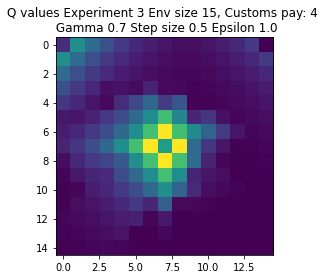

Expr:4 Eps:0 RunnAReward:-19.0 Reward:-367 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-788.0 Reward:-285 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-410.0 Reward:-268 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-339.0 Reward:-504 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-812.0 Reward:-371 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-325.0 Reward:632 Timesteps:225 GotPack:False Utiltime:45 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-494.0 Reward:-96 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:-20.0 Reward:-97 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:50.0 Reward:-92 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:44.0 Reward:827 Timeste

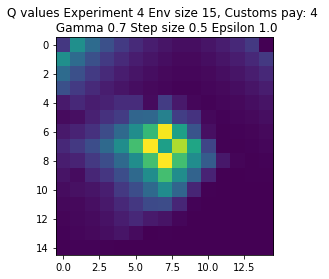

Expr:5 Eps:0 RunnAReward:11.0 Reward:223 Timesteps:1529 GotPack:True Utiltime:57 Customstime:321 Money:5
Expr:5 Eps:20 RunnAReward:-776.0 Reward:-384 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-893.0 Reward:-333 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-248.0 Reward:411 Timesteps:225 GotPack:False Utiltime:187 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-333.0 Reward:-153 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-604.0 Reward:-69 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-213.0 Reward:379 Timesteps:225 GotPack:False Utiltime:211 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:-91.0 Reward:-15 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:172.0 Reward:542 Timesteps:225 GotPack:False Utiltime:155 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:103.0 Reward:-105

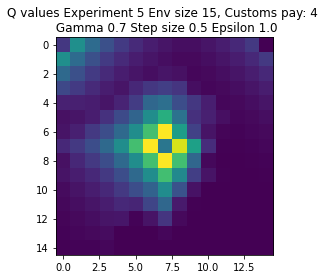

Expr:6 Eps:0 RunnAReward:-13.0 Reward:-258 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-732.0 Reward:315 Timesteps:225 GotPack:False Utiltime:186 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-238.0 Reward:-381 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-590.0 Reward:-235 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-542.0 Reward:-326 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:-352.0 Reward:-1350 Timesteps:2658 GotPack:True Utiltime:1026 Customstime:1200 Money:5
Expr:6 Eps:120 RunnAReward:-86.0 Reward:-230 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:-80.0 Reward:252 Timesteps:450 GotPack:False Utiltime:41 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:109.0 Reward:474 Timesteps:1383 GotPack:True Utiltime:1186 Customstime:1261 Money:5
Expr:6 Eps:180 RunnAReward:169.0 R

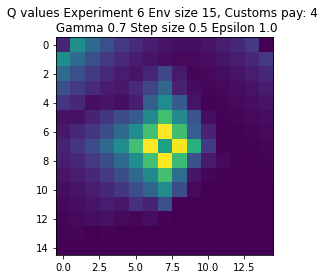

Expr:7 Eps:0 RunnAReward:-12.0 Reward:-238 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-664.0 Reward:-68 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-216.0 Reward:319 Timesteps:225 GotPack:False Utiltime:61 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-565.0 Reward:-315 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-348.0 Reward:-256 Timesteps:1900 GotPack:True Utiltime:78 Customstime:1380 Money:4
Expr:7 Eps:100 RunnAReward:-353.0 Reward:-1694 Timesteps:2822 GotPack:True Utiltime:436 Customstime:719 Money:4
Expr:7 Eps:120 RunnAReward:-513.0 Reward:-75 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-105.0 Reward:-436 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:-293.0 Reward:-80 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:186.0 Rewar

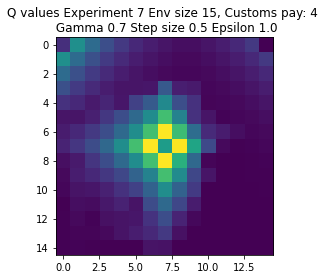

Expr:8 Eps:0 RunnAReward:-254.0 Reward:-5069 Timesteps:4938 GotPack:True Utiltime:1688 Customstime:2484 Money:5
Expr:8 Eps:20 RunnAReward:-1040.0 Reward:-383 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-498.0 Reward:-550 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-672.0 Reward:-43 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-394.0 Reward:-16 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-105.0 Reward:-144 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-194.0 Reward:265 Timesteps:225 GotPack:False Utiltime:71 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:-297.0 Reward:-366 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:-149.0 Reward:219 Timesteps:225 GotPack:False Utiltime:61 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:73.0 Rewar

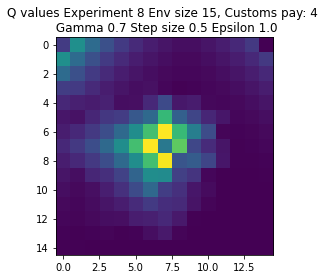

Expr:9 Eps:0 RunnAReward:-5.0 Reward:-88 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-215.0 Reward:-161 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-690.0 Reward:-121 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-271.0 Reward:-470 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-472.0 Reward:-214 Timesteps:450 GotPack:False Utiltime:121 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:-334.0 Reward:-125 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-613.0 Reward:-6654 Timesteps:6750 GotPack:False Utiltime:993 Customstime:2914 Money:4
Expr:9 Eps:140 RunnAReward:-364.0 Reward:1078 Timesteps:833 GotPack:True Utiltime:66 Customstime:336 Money:5
Expr:9 Eps:160 RunnAReward:-134.0 Reward:614 Timesteps:225 GotPack:False Utiltime:108 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:17.0 Re

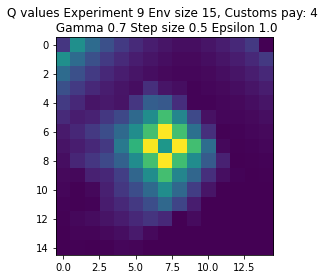

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.7 Step size 0.8 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-19.0 Reward:-366 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-971.0 Reward:1089 Timesteps:918 GotPack:True Utiltime:459 Customstime:626 Money:5
Expr:0 Eps:40 RunnAReward:-65.0 Reward:89 Timesteps:450 GotPack:False Utiltime:430 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-182.0 Reward:-188 Timesteps:675 GotPack:False Utiltime:83 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:270.0 Reward:-42 Timesteps:675 GotPack:False Utiltime:175 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:367.0 Reward:327 Timesteps:450 GotPack:False Utiltime:148 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:417.0 Reward:-10 Timesteps:675 GotPack:False Utiltime:172 Cust

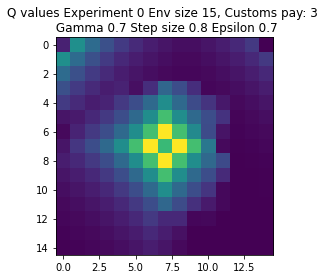

Expr:1 Eps:0 RunnAReward:-3.0 Reward:-46 Timesteps:675 GotPack:False Utiltime:203 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-394.0 Reward:49 Timesteps:450 GotPack:False Utiltime:98 Customstime:0 Money:1
Expr:1 Eps:40 RunnAReward:-290.0 Reward:-170 Timesteps:1694 GotPack:True Utiltime:1321 Customstime:1560 Money:5
Expr:1 Eps:60 RunnAReward:-349.0 Reward:115 Timesteps:450 GotPack:False Utiltime:146 Customstime:0 Money:1
Expr:1 Eps:80 RunnAReward:-3.0 Reward:-323 Timesteps:900 GotPack:False Utiltime:12 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:470.0 Reward:-62 Timesteps:675 GotPack:False Utiltime:93 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:312.0 Reward:313 Timesteps:450 GotPack:False Utiltime:13 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:250.0 Reward:265 Timesteps:450 GotPack:False Utiltime:178 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:432.0 Reward:223 Timesteps:450 GotPack:False Utiltime:134 Customstime:0 Money:1
Expr:1 Eps:180 RunnAReward:411.0 Reward:4

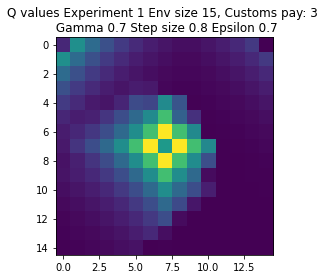

Expr:2 Eps:0 RunnAReward:-191.0 Reward:-3806 Timesteps:4376 GotPack:True Utiltime:1948 Customstime:2791 Money:5
Expr:2 Eps:20 RunnAReward:-762.0 Reward:-1027 Timesteps:2419 GotPack:True Utiltime:1000 Customstime:2053 Money:3
Expr:2 Eps:40 RunnAReward:-173.0 Reward:780 Timesteps:1058 GotPack:True Utiltime:706 Customstime:926 Money:3
Expr:2 Eps:60 RunnAReward:81.0 Reward:-1 Timesteps:450 GotPack:False Utiltime:134 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:65.0 Reward:-117 Timesteps:675 GotPack:False Utiltime:145 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:157.0 Reward:-609 Timesteps:2326 GotPack:True Utiltime:167 Customstime:669 Money:5
Expr:2 Eps:120 RunnAReward:198.0 Reward:1878 Timesteps:271 GotPack:True Utiltime:108 Customstime:231 Money:5
Expr:2 Eps:140 RunnAReward:347.0 Reward:363 Timesteps:1483 GotPack:True Utiltime:64 Customstime:728 Money:3
Expr:2 Eps:160 RunnAReward:687.0 Reward:-873 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:180 RunnARew

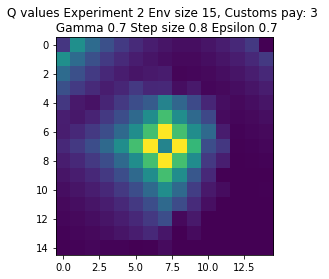

Expr:3 Eps:0 RunnAReward:-28.0 Reward:-552 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-714.0 Reward:-704 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:40 RunnAReward:-397.0 Reward:-796 Timesteps:2301 GotPack:True Utiltime:1992 Customstime:2109 Money:4
Expr:3 Eps:60 RunnAReward:-89.0 Reward:-314 Timesteps:2023 GotPack:True Utiltime:1030 Customstime:1564 Money:3
Expr:3 Eps:80 RunnAReward:104.0 Reward:-288 Timesteps:900 GotPack:False Utiltime:67 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:247.0 Reward:318 Timesteps:450 GotPack:False Utiltime:77 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:432.0 Reward:106 Timesteps:675 GotPack:False Utiltime:90 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:307.0 Reward:-365 Timesteps:675 GotPack:False Utiltime:26 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:916.0 Reward:890 Timesteps:1077 GotPack:True Utiltime:73 Customstime:196 Money:3
Expr:3 Eps:180 RunnAReward:513.0 R

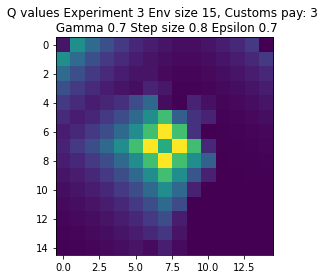

Expr:4 Eps:0 RunnAReward:-21.0 Reward:-404 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1111.0 Reward:-951 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-173.0 Reward:849 Timesteps:1266 GotPack:True Utiltime:315 Customstime:607 Money:4
Expr:4 Eps:60 RunnAReward:129.0 Reward:1065 Timesteps:928 GotPack:True Utiltime:648 Customstime:812 Money:3
Expr:4 Eps:80 RunnAReward:254.0 Reward:-88 Timesteps:675 GotPack:False Utiltime:196 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:456.0 Reward:355 Timesteps:450 GotPack:False Utiltime:154 Customstime:0 Money:1
Expr:4 Eps:120 RunnAReward:401.0 Reward:-316 Timesteps:900 GotPack:False Utiltime:135 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:507.0 Reward:97 Timesteps:450 GotPack:False Utiltime:134 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:613.0 Reward:76 Timesteps:675 GotPack:False Utiltime:34 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:991.0 Reward:

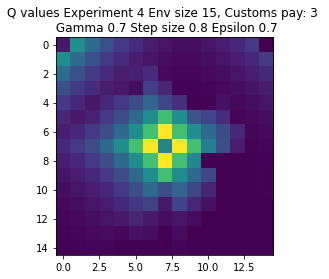

Expr:5 Eps:0 RunnAReward:-37.0 Reward:-726 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-880.0 Reward:-599 Timesteps:2212 GotPack:True Utiltime:1519 Customstime:1637 Money:5
Expr:5 Eps:40 RunnAReward:-70.0 Reward:-454 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-370.0 Reward:-391 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:322.0 Reward:-486 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:226.0 Reward:1719 Timesteps:367 GotPack:True Utiltime:230 Customstime:280 Money:5
Expr:5 Eps:120 RunnAReward:601.0 Reward:260 Timesteps:450 GotPack:False Utiltime:32 Customstime:0 Money:1
Expr:5 Eps:140 RunnAReward:337.0 Reward:17 Timesteps:675 GotPack:False Utiltime:49 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:671.0 Reward:978 Timesteps:927 GotPack:True Utiltime:535 Customstime:594 Money:5
Expr:5 Eps:180 RunnAReward:863.0 Reward:

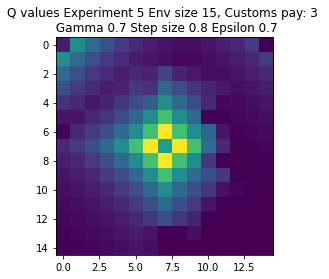

Expr:6 Eps:0 RunnAReward:-243.0 Reward:-4846 Timesteps:5733 GotPack:True Utiltime:3554 Customstime:3803 Money:5
Expr:6 Eps:20 RunnAReward:-965.0 Reward:-3787 Timesteps:4592 GotPack:True Utiltime:2290 Customstime:2759 Money:3
Expr:6 Eps:40 RunnAReward:-357.0 Reward:-291 Timesteps:2071 GotPack:True Utiltime:1080 Customstime:1236 Money:5
Expr:6 Eps:60 RunnAReward:39.0 Reward:-300 Timesteps:1675 GotPack:True Utiltime:980 Customstime:1420 Money:3
Expr:6 Eps:80 RunnAReward:104.0 Reward:351 Timesteps:450 GotPack:False Utiltime:74 Customstime:0 Money:1
Expr:6 Eps:100 RunnAReward:404.0 Reward:414 Timesteps:1526 GotPack:True Utiltime:78 Customstime:641 Money:4
Expr:6 Eps:120 RunnAReward:383.0 Reward:-507 Timesteps:2054 GotPack:True Utiltime:53 Customstime:788 Money:4
Expr:6 Eps:140 RunnAReward:509.0 Reward:877 Timesteps:1014 GotPack:True Utiltime:424 Customstime:476 Money:5
Expr:6 Eps:160 RunnAReward:1072.0 Reward:1046 Timesteps:930 GotPack:True Utiltime:24 Customstime:676 Money:3
Expr:6 Eps:180

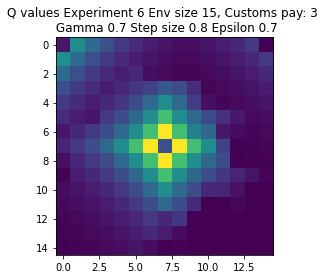

Expr:7 Eps:0 RunnAReward:-27.0 Reward:-530 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-1259.0 Reward:-678 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:40 RunnAReward:-331.0 Reward:208 Timesteps:450 GotPack:False Utiltime:117 Customstime:0 Money:1
Expr:7 Eps:60 RunnAReward:12.0 Reward:20 Timesteps:450 GotPack:False Utiltime:47 Customstime:0 Money:1
Expr:7 Eps:80 RunnAReward:306.0 Reward:159 Timesteps:450 GotPack:False Utiltime:110 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:323.0 Reward:375 Timesteps:450 GotPack:False Utiltime:71 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:350.0 Reward:312 Timesteps:450 GotPack:False Utiltime:136 Customstime:0 Money:1
Expr:7 Eps:140 RunnAReward:155.0 Reward:300 Timesteps:450 GotPack:False Utiltime:92 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:420.0 Reward:-38 Timesteps:675 GotPack:False Utiltime:86 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:619.0 Reward:1874 Tim

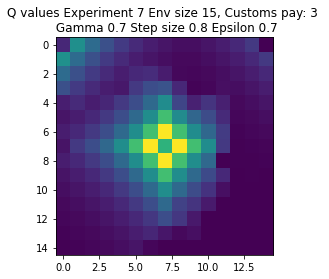

Expr:8 Eps:0 RunnAReward:18.0 Reward:373 Timesteps:450 GotPack:False Utiltime:83 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-760.0 Reward:-414 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-12.0 Reward:-24 Timesteps:450 GotPack:False Utiltime:130 Customstime:0 Money:1
Expr:8 Eps:60 RunnAReward:-5.0 Reward:820 Timesteps:1041 GotPack:True Utiltime:451 Customstime:507 Money:5
Expr:8 Eps:80 RunnAReward:-100.0 Reward:-751 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:26.0 Reward:-861 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:380.0 Reward:254 Timesteps:450 GotPack:False Utiltime:31 Customstime:0 Money:1
Expr:8 Eps:140 RunnAReward:622.0 Reward:240 Timesteps:450 GotPack:False Utiltime:75 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:645.0 Reward:1518 Timesteps:315 GotPack:True Utiltime:73 Customstime:197 Money:5
Expr:8 Eps:180 RunnAReward:869.0 Reward:1891 Ti

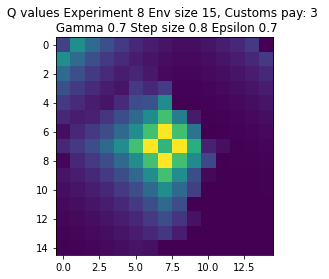

Expr:9 Eps:0 RunnAReward:-37.0 Reward:-721 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-627.0 Reward:-386 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-644.0 Reward:238 Timesteps:1326 GotPack:True Utiltime:126 Customstime:1168 Money:3
Expr:9 Eps:60 RunnAReward:-67.0 Reward:677 Timesteps:1166 GotPack:True Utiltime:582 Customstime:660 Money:3
Expr:9 Eps:80 RunnAReward:100.0 Reward:150 Timesteps:450 GotPack:False Utiltime:53 Customstime:0 Money:1
Expr:9 Eps:100 RunnAReward:419.0 Reward:86 Timesteps:675 GotPack:False Utiltime:21 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:415.0 Reward:1668 Timesteps:448 GotPack:True Utiltime:26 Customstime:152 Money:3
Expr:9 Eps:140 RunnAReward:587.0 Reward:325 Timesteps:450 GotPack:False Utiltime:113 Customstime:0 Money:1
Expr:9 Eps:160 RunnAReward:412.0 Reward:358 Timesteps:450 GotPack:False Utiltime:45 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:623.0 Reward:3

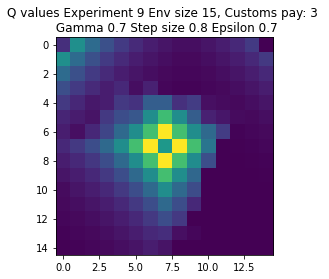

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.7 Step size 0.8 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-13.0 Reward:-251 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-689.0 Reward:-536 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-161.0 Reward:225 Timesteps:450 GotPack:False Utiltime:13 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:127.0 Reward:616 Timesteps:225 GotPack:False Utiltime:104 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:50.0 Reward:627 Timesteps:225 GotPack:False Utiltime:132 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:184.0 Reward:311 Timesteps:450 GotPack:False Utiltime:98 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:268.0 Reward:561 Timesteps:225 GotPack:False Utiltime:161 Customsti

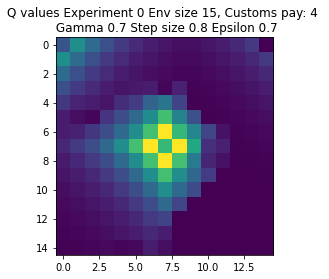

Expr:1 Eps:0 RunnAReward:-52.0 Reward:-1027 Timesteps:2446 GotPack:True Utiltime:722 Customstime:1053 Money:4
Expr:1 Eps:20 RunnAReward:-393.0 Reward:-88 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-12.0 Reward:-1635 Timesteps:2621 GotPack:True Utiltime:1726 Customstime:2093 Money:5
Expr:1 Eps:60 RunnAReward:-20.0 Reward:-710 Timesteps:2002 GotPack:True Utiltime:490 Customstime:1197 Money:5
Expr:1 Eps:80 RunnAReward:24.0 Reward:691 Timesteps:1141 GotPack:True Utiltime:154 Customstime:559 Money:4
Expr:1 Eps:100 RunnAReward:478.0 Reward:-20 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:371.0 Reward:339 Timesteps:450 GotPack:False Utiltime:48 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:518.0 Reward:389 Timesteps:450 GotPack:False Utiltime:82 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:555.0 Reward:484 Timesteps:225 GotPack:False Utiltime:53 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:475.0 

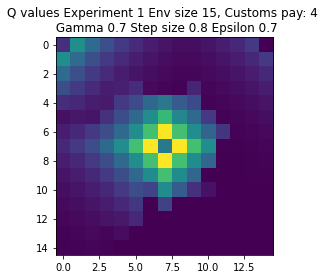

Expr:2 Eps:0 RunnAReward:-5.0 Reward:-87 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-614.0 Reward:322 Timesteps:450 GotPack:False Utiltime:252 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-526.0 Reward:-102 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-51.0 Reward:-375 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:80 RunnAReward:195.0 Reward:-111 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:335.0 Reward:634 Timesteps:225 GotPack:False Utiltime:54 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:159.0 Reward:-1002 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:140 RunnAReward:395.0 Reward:261 Timesteps:450 GotPack:False Utiltime:84 Customstime:0 Money:2
Expr:2 Eps:160 RunnAReward:495.0 Reward:953 Timesteps:856 GotPack:True Utiltime:166 Customstime:471 Money:4
Expr:2 Eps:180 RunnAReward:485.0 Reward:576 Time

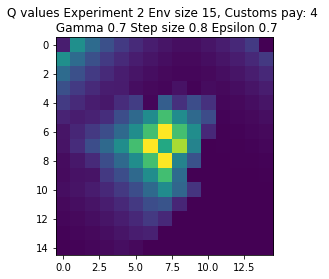

Expr:3 Eps:0 RunnAReward:-31.0 Reward:-605 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:20 RunnAReward:-283.0 Reward:-279 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-282.0 Reward:-559 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-203.0 Reward:-169 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:37.0 Reward:-30 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:121.0 Reward:413 Timesteps:225 GotPack:False Utiltime:75 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:172.0 Reward:604 Timesteps:225 GotPack:False Utiltime:97 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:554.0 Reward:-326 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:432.0 Reward:794 Timesteps:855 GotPack:True Utiltime:101 Customstime:329 Money:4
Expr:3 Eps:180 RunnAReward:542.0 Reward:589 Times

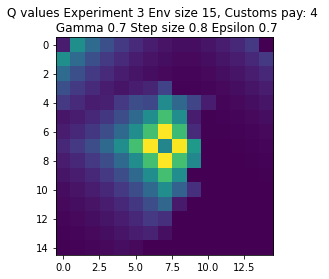

Expr:4 Eps:0 RunnAReward:-14.0 Reward:-269 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-253.0 Reward:-1167 Timesteps:2331 GotPack:True Utiltime:440 Customstime:1227 Money:5
Expr:4 Eps:40 RunnAReward:26.0 Reward:-168 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-99.0 Reward:350 Timesteps:1345 GotPack:True Utiltime:1009 Customstime:1075 Money:5
Expr:4 Eps:80 RunnAReward:19.0 Reward:384 Timesteps:225 GotPack:False Utiltime:74 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:211.0 Reward:-8 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:304.0 Reward:627 Timesteps:225 GotPack:False Utiltime:159 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:183.0 Reward:951 Timesteps:1043 GotPack:True Utiltime:885 Customstime:1012 Money:5
Expr:4 Eps:160 RunnAReward:732.0 Reward:992 Timesteps:955 GotPack:True Utiltime:62 Customstime:262 Money:5
Expr:4 Eps:180 RunnAReward:297.0 Rewar

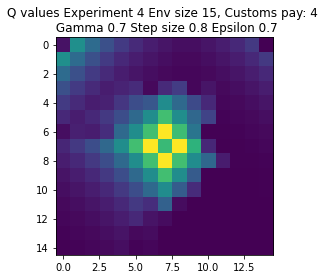

Expr:5 Eps:0 RunnAReward:-17.0 Reward:-336 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-631.0 Reward:600 Timesteps:225 GotPack:False Utiltime:168 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-279.0 Reward:-108 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:30.0 Reward:-66 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-262.0 Reward:-2047 Timesteps:3260 GotPack:True Utiltime:1686 Customstime:1795 Money:5
Expr:5 Eps:100 RunnAReward:339.0 Reward:17 Timesteps:1492 GotPack:True Utiltime:958 Customstime:1017 Money:4
Expr:5 Eps:120 RunnAReward:273.0 Reward:909 Timesteps:983 GotPack:True Utiltime:480 Customstime:724 Money:4
Expr:5 Eps:140 RunnAReward:591.0 Reward:282 Timesteps:225 GotPack:False Utiltime:86 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:550.0 Reward:524 Timesteps:1362 GotPack:True Utiltime:152 Customstime:734 Money:5
Expr:5 Eps:180 RunnAReward:411.0 Re

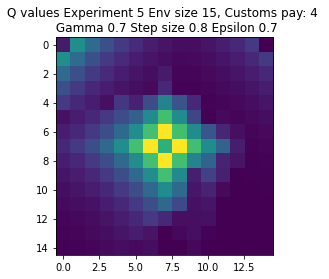

Expr:6 Eps:0 RunnAReward:15.0 Reward:312 Timesteps:225 GotPack:False Utiltime:187 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-341.0 Reward:265 Timesteps:1407 GotPack:True Utiltime:476 Customstime:601 Money:5
Expr:6 Eps:40 RunnAReward:-48.0 Reward:-46 Timesteps:675 GotPack:False Utiltime:59 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-40.0 Reward:-10 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-142.0 Reward:401 Timesteps:225 GotPack:False Utiltime:104 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:86.0 Reward:76 Timesteps:450 GotPack:False Utiltime:151 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:473.0 Reward:636 Timesteps:225 GotPack:False Utiltime:22 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:312.0 Reward:212 Timesteps:450 GotPack:False Utiltime:129 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:341.0 Reward:564 Timesteps:225 GotPack:False Utiltime:33 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:482.0 Reward:392 Tim

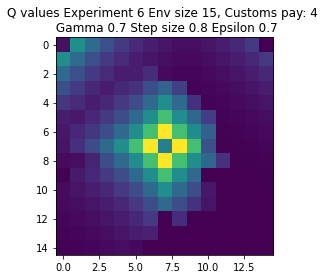

Expr:7 Eps:0 RunnAReward:-6.0 Reward:-101 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-378.0 Reward:-230 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-280.0 Reward:963 Timesteps:948 GotPack:True Utiltime:671 Customstime:919 Money:5
Expr:7 Eps:60 RunnAReward:103.0 Reward:-351 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:82.0 Reward:1360 Timesteps:741 GotPack:True Utiltime:64 Customstime:496 Money:5
Expr:7 Eps:100 RunnAReward:361.0 Reward:580 Timesteps:225 GotPack:False Utiltime:218 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:250.0 Reward:371 Timesteps:225 GotPack:False Utiltime:15 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:181.0 Reward:27 Timesteps:1827 GotPack:True Utiltime:485 Customstime:647 Money:4
Expr:7 Eps:160 RunnAReward:311.0 Reward:-71 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:402.0 Reward:938 Ti

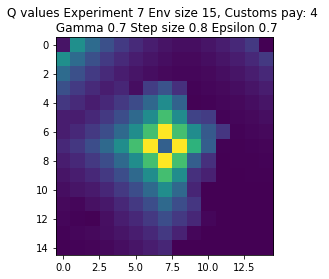

Expr:8 Eps:0 RunnAReward:-16.0 Reward:-315 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-337.0 Reward:-758 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:40 RunnAReward:-158.0 Reward:-588 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:60 RunnAReward:-56.0 Reward:217 Timesteps:450 GotPack:False Utiltime:118 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:-31.0 Reward:404 Timesteps:225 GotPack:False Utiltime:73 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:310.0 Reward:387 Timesteps:225 GotPack:False Utiltime:76 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:250.0 Reward:-225 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:140 RunnAReward:363.0 Reward:-486 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:160 RunnAReward:714.0 Reward:81 Timesteps:450 GotPack:False Utiltime:174 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:747.0 Reward:625 Times

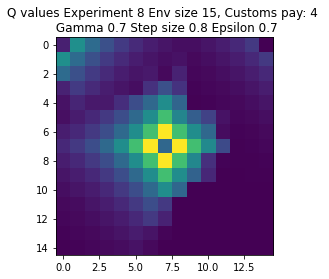

Expr:9 Eps:0 RunnAReward:-34.0 Reward:-664 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:9 Eps:20 RunnAReward:-205.0 Reward:-8 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-3.0 Reward:-283 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-251.0 Reward:360 Timesteps:225 GotPack:False Utiltime:62 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:39.0 Reward:-36 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:170.0 Reward:1068 Timesteps:870 GotPack:True Utiltime:342 Customstime:484 Money:5
Expr:9 Eps:120 RunnAReward:312.0 Reward:282 Timesteps:450 GotPack:False Utiltime:113 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:358.0 Reward:617 Timesteps:225 GotPack:False Utiltime:133 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:436.0 Reward:391 Timesteps:450 GotPack:False Utiltime:64 Customstime:0 Money:3
Expr:9 Eps:180 RunnAReward:740.0 Reward:615 Timest

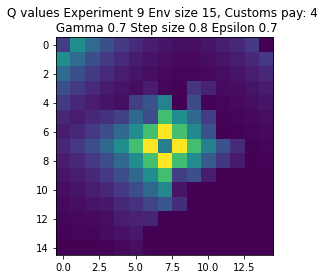

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.7 Step size 0.8 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-62.0 Reward:-1240 Timesteps:2738 GotPack:True Utiltime:2385 Customstime:2510 Money:3
Expr:0 Eps:20 RunnAReward:-1366.0 Reward:-278 Timesteps:675 GotPack:False Utiltime:11 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-431.0 Reward:349 Timesteps:450 GotPack:False Utiltime:155 Customstime:0 Money:1
Expr:0 Eps:60 RunnAReward:-508.0 Reward:50 Timesteps:450 GotPack:False Utiltime:348 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-406.0 Reward:-38 Timesteps:450 GotPack:False Utiltime:91 Customstime:0 Money:1
Expr:0 Eps:100 RunnAReward:-169.0 Reward:234 Timesteps:450 GotPack:False Utiltime:391 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:248.0 Reward:335 Timesteps:450 GotPack:False Utiltime:

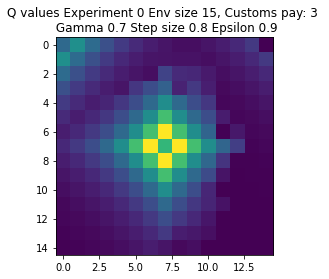

Expr:1 Eps:0 RunnAReward:-250.0 Reward:-4989 Timesteps:5009 GotPack:True Utiltime:2646 Customstime:3530 Money:3
Expr:1 Eps:20 RunnAReward:-1330.0 Reward:-1466 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-681.0 Reward:-380 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-323.0 Reward:-1565 Timesteps:2876 GotPack:True Utiltime:1747 Customstime:2192 Money:5
Expr:1 Eps:80 RunnAReward:-241.0 Reward:-112 Timesteps:675 GotPack:False Utiltime:81 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:-46.0 Reward:137 Timesteps:1522 GotPack:True Utiltime:179 Customstime:728 Money:4
Expr:1 Eps:120 RunnAReward:290.0 Reward:248 Timesteps:450 GotPack:False Utiltime:80 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:146.0 Reward:55 Timesteps:675 GotPack:False Utiltime:600 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:597.0 Reward:1039 Timesteps:857 GotPack:True Utiltime:60 Customstime:733 Money:5
Expr:1 Eps:180 RunnARewar

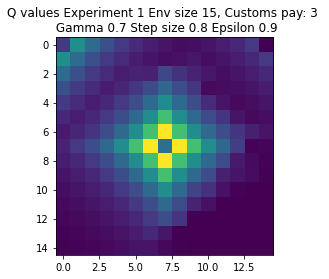

Expr:2 Eps:0 RunnAReward:-269.0 Reward:-5363 Timesteps:5518 GotPack:True Utiltime:5 Customstime:1506 Money:3
Expr:2 Eps:20 RunnAReward:-1283.0 Reward:-21 Timesteps:450 GotPack:False Utiltime:338 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-386.0 Reward:-152 Timesteps:675 GotPack:False Utiltime:258 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-489.0 Reward:-377 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:-437.0 Reward:-346 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:148.0 Reward:1020 Timesteps:981 GotPack:True Utiltime:107 Customstime:549 Money:3
Expr:2 Eps:120 RunnAReward:193.0 Reward:1345 Timesteps:632 GotPack:True Utiltime:156 Customstime:531 Money:4
Expr:2 Eps:140 RunnAReward:377.0 Reward:-63 Timesteps:450 GotPack:False Utiltime:414 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:517.0 Reward:642 Timesteps:1094 GotPack:True Utiltime:195 Customstime:435 Money:3
Expr:2 Eps:180 RunnAReward:24

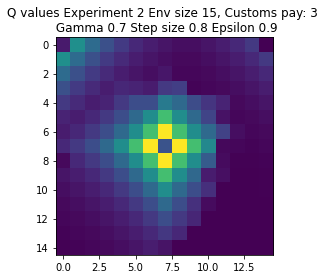

Expr:3 Eps:0 RunnAReward:-27.0 Reward:-536 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:3 Eps:20 RunnAReward:-1056.0 Reward:-881 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:40 RunnAReward:-716.0 Reward:-457 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-208.0 Reward:-351 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-70.0 Reward:259 Timesteps:1246 GotPack:True Utiltime:172 Customstime:309 Money:4
Expr:3 Eps:100 RunnAReward:107.0 Reward:65 Timesteps:675 GotPack:False Utiltime:164 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:116.0 Reward:-212 Timesteps:900 GotPack:False Utiltime:201 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:221.0 Reward:320 Timesteps:450 GotPack:False Utiltime:129 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:416.0 Reward:366 Timesteps:450 GotPack:False Utiltime:86 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:703.0 Reward:28

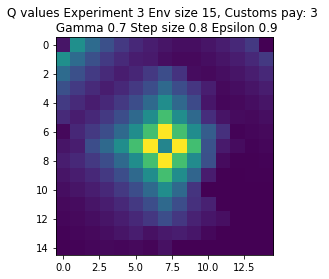

Expr:4 Eps:0 RunnAReward:-26.0 Reward:-518 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-994.0 Reward:-425 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-595.0 Reward:1019 Timesteps:1018 GotPack:True Utiltime:18 Customstime:734 Money:5
Expr:4 Eps:60 RunnAReward:-392.0 Reward:43 Timesteps:450 GotPack:False Utiltime:99 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-188.0 Reward:-68 Timesteps:675 GotPack:False Utiltime:448 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-104.0 Reward:276 Timesteps:450 GotPack:False Utiltime:354 Customstime:0 Money:1
Expr:4 Eps:120 RunnAReward:244.0 Reward:-104 Timesteps:450 GotPack:False Utiltime:245 Customstime:0 Money:1
Expr:4 Eps:140 RunnAReward:154.0 Reward:306 Timesteps:450 GotPack:False Utiltime:186 Customstime:0 Money:1
Expr:4 Eps:160 RunnAReward:474.0 Reward:104 Timesteps:450 GotPack:False Utiltime:282 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:383.0 Reward

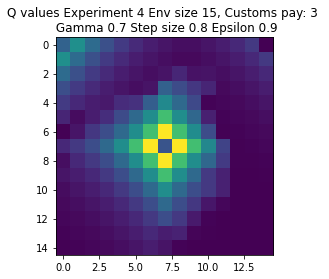

Expr:5 Eps:0 RunnAReward:6.0 Reward:134 Timesteps:675 GotPack:False Utiltime:625 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-895.0 Reward:-459 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-803.0 Reward:221 Timesteps:450 GotPack:False Utiltime:196 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-510.0 Reward:-342 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-430.0 Reward:264 Timesteps:450 GotPack:False Utiltime:235 Customstime:0 Money:1
Expr:5 Eps:100 RunnAReward:-10.0 Reward:-65 Timesteps:675 GotPack:False Utiltime:146 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:-313.0 Reward:-158 Timesteps:2133 GotPack:True Utiltime:1334 Customstime:1831 Money:5
Expr:5 Eps:140 RunnAReward:156.0 Reward:2000 Timesteps:214 GotPack:True Utiltime:69 Customstime:174 Money:3
Expr:5 Eps:160 RunnAReward:459.0 Reward:343 Timesteps:450 GotPack:False Utiltime:15 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:308.0 Rewa

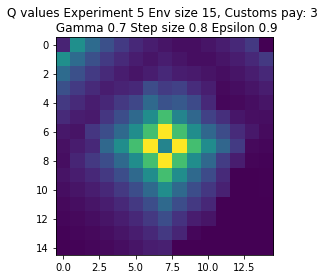

Expr:6 Eps:0 RunnAReward:-11.0 Reward:-206 Timesteps:2013 GotPack:True Utiltime:1213 Customstime:1275 Money:5
Expr:6 Eps:20 RunnAReward:-1242.0 Reward:-872 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-406.0 Reward:120 Timesteps:675 GotPack:False Utiltime:27 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-507.0 Reward:42 Timesteps:450 GotPack:False Utiltime:195 Customstime:0 Money:1
Expr:6 Eps:80 RunnAReward:-386.0 Reward:-148 Timesteps:675 GotPack:False Utiltime:150 Customstime:0 Money:1
Expr:6 Eps:100 RunnAReward:39.0 Reward:256 Timesteps:450 GotPack:False Utiltime:227 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:115.0 Reward:11 Timesteps:675 GotPack:False Utiltime:146 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:324.0 Reward:449 Timesteps:1379 GotPack:True Utiltime:25 Customstime:267 Money:5
Expr:6 Eps:160 RunnAReward:450.0 Reward:-348 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:429.0 Rewa

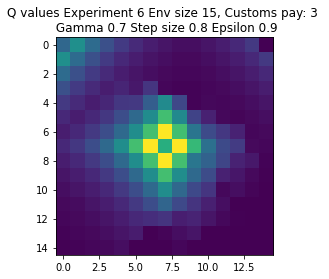

Expr:7 Eps:0 RunnAReward:-29.0 Reward:-570 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-777.0 Reward:-1192 Timesteps:2749 GotPack:True Utiltime:1516 Customstime:1766 Money:5
Expr:7 Eps:40 RunnAReward:-186.0 Reward:-705 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-616.0 Reward:378 Timesteps:450 GotPack:False Utiltime:154 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-276.0 Reward:762 Timesteps:954 GotPack:True Utiltime:70 Customstime:923 Money:3
Expr:7 Eps:100 RunnAReward:75.0 Reward:85 Timesteps:675 GotPack:False Utiltime:92 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:20.0 Reward:123 Timesteps:675 GotPack:False Utiltime:111 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:530.0 Reward:-323 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:403.0 Reward:1577 Timesteps:493 GotPack:True Utiltime:28 Customstime:448 Money:3
Expr:7 Eps:180 RunnAReward:692.0 Reward

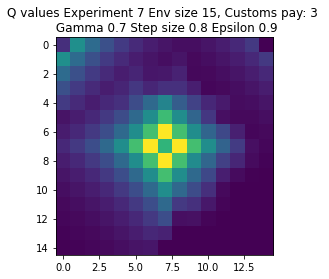

Expr:8 Eps:0 RunnAReward:9.0 Reward:193 Timesteps:450 GotPack:False Utiltime:95 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-1566.0 Reward:-793 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-796.0 Reward:-524 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-121.0 Reward:-721 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:57.0 Reward:170 Timesteps:675 GotPack:False Utiltime:45 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:80.0 Reward:-166 Timesteps:1934 GotPack:True Utiltime:1471 Customstime:1514 Money:3
Expr:8 Eps:120 RunnAReward:85.0 Reward:-203 Timesteps:675 GotPack:False Utiltime:560 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:158.0 Reward:1 Timesteps:675 GotPack:False Utiltime:66 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:453.0 Reward:-283 Timesteps:900 GotPack:False Utiltime:229 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:456.0 Reward:1511 

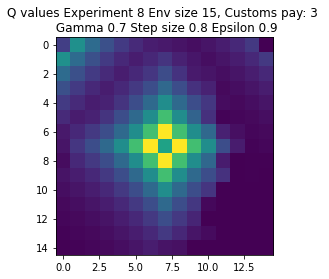

Expr:9 Eps:0 RunnAReward:-41.0 Reward:-804 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-1541.0 Reward:-6713 Timesteps:6750 GotPack:False Utiltime:1952 Customstime:1982 Money:3
Expr:9 Eps:40 RunnAReward:-1029.0 Reward:-327 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-524.0 Reward:-350 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:199.0 Reward:-361 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:123.0 Reward:1259 Timesteps:685 GotPack:True Utiltime:576 Customstime:611 Money:3
Expr:9 Eps:120 RunnAReward:328.0 Reward:882 Timesteps:969 GotPack:True Utiltime:468 Customstime:588 Money:3
Expr:9 Eps:140 RunnAReward:373.0 Reward:117 Timesteps:450 GotPack:False Utiltime:156 Customstime:0 Money:1
Expr:9 Eps:160 RunnAReward:625.0 Reward:441 Timesteps:1293 GotPack:True Utiltime:105 Customstime:260 Money:5
Expr:9 Eps:180 RunnAReward:342

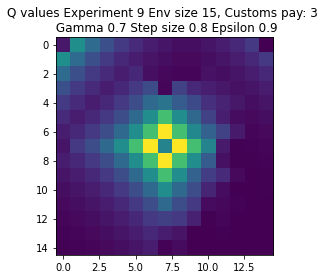

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.7 Step size 0.8 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-18.0 Reward:-346 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-651.0 Reward:-552 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-447.0 Reward:-21 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-201.0 Reward:-96 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-151.0 Reward:355 Timesteps:225 GotPack:False Utiltime:10 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-45.0 Reward:21 Timesteps:1350 GotPack:True Utiltime:92 Customstime:818 Money:5
Expr:0 Eps:120 RunnAReward:250.0 Reward:287 Timesteps:450 GotPack:False Utiltime:151 Customsti

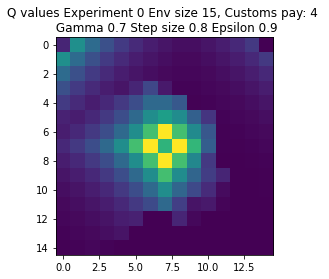

Expr:1 Eps:0 RunnAReward:-23.0 Reward:-455 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-368.0 Reward:-551 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-559.0 Reward:-556 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-370.0 Reward:-235 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-231.0 Reward:121 Timesteps:450 GotPack:False Utiltime:8 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:-105.0 Reward:-2529 Timesteps:3568 GotPack:True Utiltime:130 Customstime:1092 Money:5
Expr:1 Eps:120 RunnAReward:211.0 Reward:381 Timesteps:225 GotPack:False Utiltime:49 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:20.0 Reward:293 Timesteps:450 GotPack:False Utiltime:217 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:113.0 Reward:97 Timesteps:675 GotPack:False Utiltime:92 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:287.0 Reward:-14

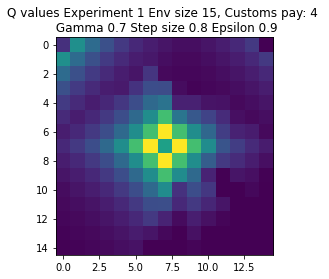

Expr:2 Eps:0 RunnAReward:-13.0 Reward:-250 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-659.0 Reward:-9 Timesteps:450 GotPack:False Utiltime:54 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-422.0 Reward:608 Timesteps:225 GotPack:False Utiltime:182 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-53.0 Reward:386 Timesteps:225 GotPack:False Utiltime:61 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-330.0 Reward:176 Timesteps:450 GotPack:False Utiltime:63 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:16.0 Reward:-44 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:76.0 Reward:77 Timesteps:450 GotPack:False Utiltime:101 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:18.0 Reward:-92 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:250.0 Reward:445 Timesteps:1391 GotPack:True Utiltime:180 Customstime:224 Money:5
Expr:2 Eps:180 RunnAReward:276.0 Reward:517 Timeste

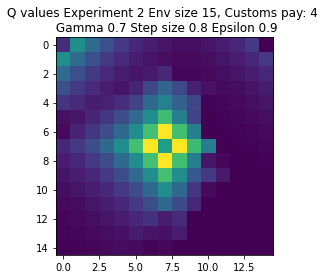

Expr:3 Eps:0 RunnAReward:-18.0 Reward:-346 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-450.0 Reward:-25 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-453.0 Reward:-445 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-328.0 Reward:-356 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:24.0 Reward:392 Timesteps:225 GotPack:False Utiltime:86 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-26.0 Reward:-8 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-43.0 Reward:-38 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:106.0 Reward:245 Timesteps:450 GotPack:False Utiltime:87 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:188.0 Reward:-310 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:311.0 Reward:652 Timesteps:

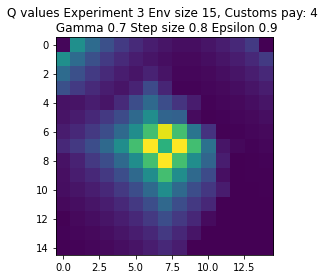

Expr:4 Eps:0 RunnAReward:-19.0 Reward:-375 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-145.0 Reward:-437 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-206.0 Reward:-74 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-293.0 Reward:372 Timesteps:225 GotPack:False Utiltime:114 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-161.0 Reward:300 Timesteps:225 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:84.0 Reward:1119 Timesteps:575 GotPack:True Utiltime:100 Customstime:324 Money:5
Expr:4 Eps:120 RunnAReward:36.0 Reward:-81 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:183.0 Reward:472 Timesteps:225 GotPack:False Utiltime:159 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:245.0 Reward:-3 Timesteps:675 GotPack:False Utiltime:64 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:397.0 Reward:68 Times

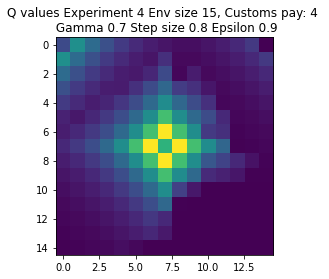

Expr:5 Eps:0 RunnAReward:-8.0 Reward:-148 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-777.0 Reward:-268 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-163.0 Reward:-68 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-544.0 Reward:1175 Timesteps:720 GotPack:True Utiltime:277 Customstime:656 Money:4
Expr:5 Eps:80 RunnAReward:-7.0 Reward:355 Timesteps:450 GotPack:False Utiltime:100 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:32.0 Reward:-147 Timesteps:450 GotPack:False Utiltime:76 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:189.0 Reward:3 Timesteps:1829 GotPack:True Utiltime:280 Customstime:625 Money:4
Expr:5 Eps:140 RunnAReward:331.0 Reward:-56 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:308.0 Reward:-291 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:5 Eps:180 RunnAReward:446.0 Reward:1957 Tim

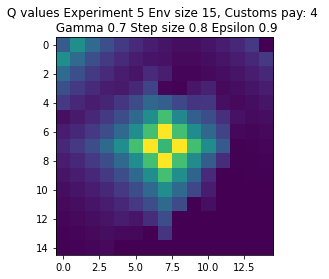

Expr:6 Eps:0 RunnAReward:-19.0 Reward:-380 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-549.0 Reward:-240 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-668.0 Reward:-378 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-389.0 Reward:-85 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-139.0 Reward:217 Timesteps:225 GotPack:False Utiltime:44 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:128.0 Reward:859 Timesteps:1121 GotPack:True Utiltime:65 Customstime:546 Money:4
Expr:6 Eps:120 RunnAReward:185.0 Reward:339 Timesteps:450 GotPack:False Utiltime:305 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:166.0 Reward:-121 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:274.0 Reward:-61 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:465.0 Reward:1468 Ti

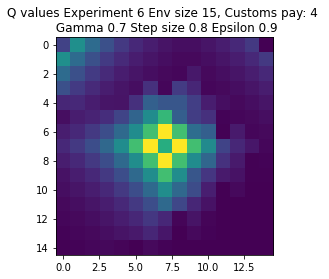

Expr:7 Eps:0 RunnAReward:-12.0 Reward:-228 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-452.0 Reward:-375 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-478.0 Reward:-158 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-939.0 Reward:-655 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:80 RunnAReward:-61.0 Reward:12 Timesteps:1991 GotPack:True Utiltime:884 Customstime:1533 Money:5
Expr:7 Eps:100 RunnAReward:8.0 Reward:419 Timesteps:225 GotPack:False Utiltime:167 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:255.0 Reward:413 Timesteps:225 GotPack:False Utiltime:113 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:296.0 Reward:538 Timesteps:225 GotPack:False Utiltime:161 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:48.0 Reward:599 Timesteps:225 GotPack:False Utiltime:83 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:439.0 Reward:296 Ti

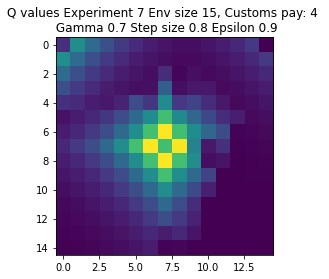

Expr:8 Eps:0 RunnAReward:-14.0 Reward:-265 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-440.0 Reward:-363 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-514.0 Reward:-135 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-405.0 Reward:93 Timesteps:450 GotPack:False Utiltime:423 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:-94.0 Reward:-116 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:38.0 Reward:254 Timesteps:1543 GotPack:True Utiltime:505 Customstime:560 Money:4
Expr:8 Eps:120 RunnAReward:162.0 Reward:619 Timesteps:225 GotPack:False Utiltime:196 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:315.0 Reward:372 Timesteps:225 GotPack:False Utiltime:179 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:395.0 Reward:621 Timesteps:225 GotPack:False Utiltime:15 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:625.0 Reward:271 T

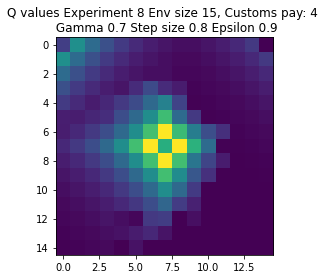

Expr:9 Eps:0 RunnAReward:-20.0 Reward:-388 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-530.0 Reward:-586 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:9 Eps:40 RunnAReward:-51.0 Reward:426 Timesteps:225 GotPack:False Utiltime:103 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-649.0 Reward:-4791 Timesteps:5240 GotPack:True Utiltime:2172 Customstime:2911 Money:4
Expr:9 Eps:80 RunnAReward:-419.0 Reward:-88 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-7.0 Reward:-556 Timesteps:2083 GotPack:True Utiltime:65 Customstime:629 Money:4
Expr:9 Eps:120 RunnAReward:85.0 Reward:605 Timesteps:225 GotPack:False Utiltime:20 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:147.0 Reward:671 Timesteps:1283 GotPack:True Utiltime:56 Customstime:510 Money:5
Expr:9 Eps:160 RunnAReward:151.0 Reward:584 Timesteps:225 GotPack:False Utiltime:43 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:360.0 Reward

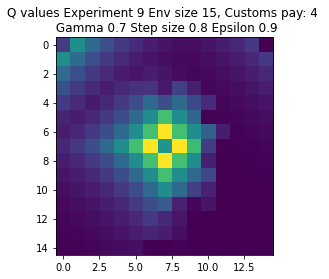

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.7 Step size 0.8 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:5.0 Reward:108 Timesteps:450 GotPack:False Utiltime:380 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-1279.0 Reward:-516 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:40 RunnAReward:-653.0 Reward:-2481 Timesteps:3411 GotPack:True Utiltime:3062 Customstime:3127 Money:5
Expr:0 Eps:60 RunnAReward:-688.0 Reward:-568 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-800.0 Reward:-665 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-231.0 Reward:-392 Timesteps:900 GotPack:False Utiltime:710 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:-463.0 Reward:330 Timesteps:450 GotPack:False Utiltime:2

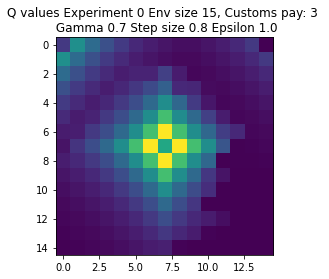

Expr:1 Eps:0 RunnAReward:-27.0 Reward:-522 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-985.0 Reward:145 Timesteps:450 GotPack:False Utiltime:98 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-374.0 Reward:-108 Timesteps:1906 GotPack:True Utiltime:406 Customstime:1256 Money:3
Expr:1 Eps:60 RunnAReward:-952.0 Reward:-374 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-1228.0 Reward:-1880 Timesteps:3116 GotPack:True Utiltime:1248 Customstime:2797 Money:5
Expr:1 Eps:100 RunnAReward:-515.0 Reward:-661 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:120 RunnAReward:-169.0 Reward:269 Timesteps:450 GotPack:False Utiltime:276 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:-45.0 Reward:-16 Timesteps:675 GotPack:False Utiltime:149 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:-47.0 Reward:740 Timesteps:1154 GotPack:True Utiltime:28 Customstime:925 Money:5
Expr:1 Eps:180 RunnAReward:-2

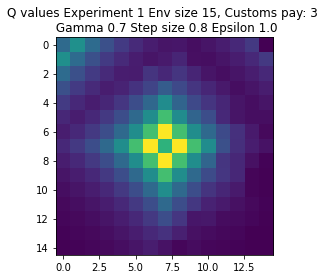

Expr:2 Eps:0 RunnAReward:-29.0 Reward:-573 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:20 RunnAReward:-1191.0 Reward:-373 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-1231.0 Reward:-843 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:60 RunnAReward:-552.0 Reward:194 Timesteps:450 GotPack:False Utiltime:249 Customstime:0 Money:1
Expr:2 Eps:80 RunnAReward:-1098.0 Reward:-389 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:100 RunnAReward:-291.0 Reward:764 Timesteps:1181 GotPack:True Utiltime:77 Customstime:331 Money:4
Expr:2 Eps:120 RunnAReward:-231.0 Reward:241 Timesteps:450 GotPack:False Utiltime:155 Customstime:0 Money:1
Expr:2 Eps:140 RunnAReward:-36.0 Reward:430 Timesteps:1443 GotPack:True Utiltime:168 Customstime:472 Money:3
Expr:2 Eps:160 RunnAReward:428.0 Reward:865 Timesteps:807 GotPack:True Utiltime:470 Customstime:582 Money:5
Expr:2 Eps:180 RunnAReward:323.0 R

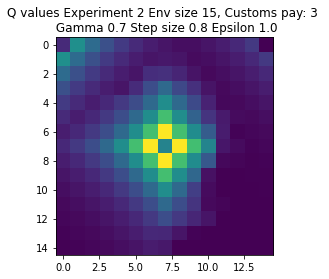

Expr:3 Eps:0 RunnAReward:-36.0 Reward:-703 Timesteps:900 GotPack:False Utiltime:276 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-630.0 Reward:-604 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-1188.0 Reward:-660 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-919.0 Reward:-602 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-731.0 Reward:-545 Timesteps:2087 GotPack:True Utiltime:844 Customstime:1979 Money:3
Expr:3 Eps:100 RunnAReward:-407.0 Reward:-33 Timesteps:450 GotPack:False Utiltime:148 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-92.0 Reward:-242 Timesteps:900 GotPack:False Utiltime:674 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:-15.0 Reward:-588 Timesteps:675 GotPack:False Utiltime:616 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:150.0 Reward:22 Timesteps:675 GotPack:False Utiltime:164 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:-69.0 R

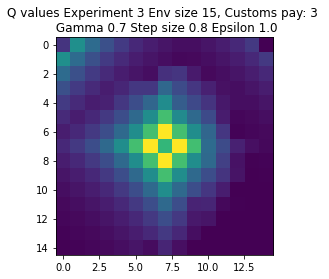

Expr:4 Eps:0 RunnAReward:-33.0 Reward:-653 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:20 RunnAReward:-1710.0 Reward:-532 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-813.0 Reward:67 Timesteps:450 GotPack:False Utiltime:171 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-515.0 Reward:-449 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-595.0 Reward:-538 Timesteps:2070 GotPack:True Utiltime:1192 Customstime:1531 Money:5
Expr:4 Eps:100 RunnAReward:-201.0 Reward:366 Timesteps:450 GotPack:False Utiltime:248 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-255.0 Reward:-465 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:-292.0 Reward:588 Timesteps:1245 GotPack:True Utiltime:30 Customstime:954 Money:4
Expr:4 Eps:160 RunnAReward:68.0 Reward:-352 Timesteps:900 GotPack:False Utiltime:128 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:25.0 Re

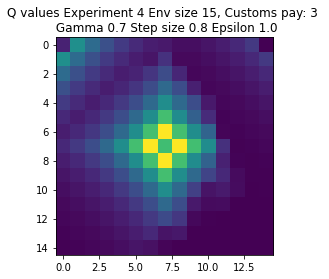

Expr:5 Eps:0 RunnAReward:-35.0 Reward:-698 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-1794.0 Reward:-536 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-1289.0 Reward:336 Timesteps:450 GotPack:False Utiltime:362 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-792.0 Reward:-88 Timesteps:450 GotPack:False Utiltime:59 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-290.0 Reward:-250 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-152.0 Reward:165 Timesteps:450 GotPack:False Utiltime:180 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:60.0 Reward:844 Timesteps:989 GotPack:True Utiltime:238 Customstime:884 Money:3
Expr:5 Eps:140 RunnAReward:140.0 Reward:-1891 Timesteps:3062 GotPack:True Utiltime:90 Customstime:729 Money:3
Expr:5 Eps:160 RunnAReward:-113.0 Reward:1177 Timesteps:672 GotPack:True Utiltime:276 Customstime:484 Money:3
Expr:5 Eps:180 RunnAReward:460.0 R

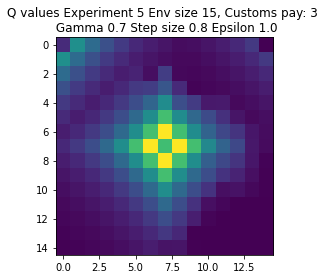

Expr:6 Eps:0 RunnAReward:-32.0 Reward:-630 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-1740.0 Reward:-602 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-1833.0 Reward:-3926 Timesteps:4510 GotPack:True Utiltime:1238 Customstime:1622 Money:3
Expr:6 Eps:60 RunnAReward:-931.0 Reward:-1951 Timesteps:3361 GotPack:True Utiltime:1697 Customstime:1964 Money:4
Expr:6 Eps:80 RunnAReward:-378.0 Reward:-315 Timesteps:675 GotPack:False Utiltime:145 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:-241.0 Reward:861 Timesteps:1051 GotPack:True Utiltime:599 Customstime:778 Money:3
Expr:6 Eps:120 RunnAReward:-125.0 Reward:-1037 Timesteps:2634 GotPack:True Utiltime:593 Customstime:1634 Money:4
Expr:6 Eps:140 RunnAReward:-306.0 Reward:-178 Timesteps:675 GotPack:False Utiltime:124 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:59.0 Reward:279 Timesteps:450 GotPack:False Utiltime:346 Customstime:0 Money:1
Expr:6 Eps:180 R

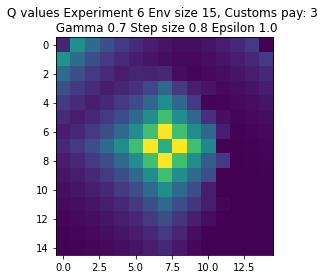

Expr:7 Eps:0 RunnAReward:-35.0 Reward:-691 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-1695.0 Reward:-240 Timesteps:1604 GotPack:True Utiltime:800 Customstime:1263 Money:3
Expr:7 Eps:40 RunnAReward:-1221.0 Reward:-3961 Timesteps:4661 GotPack:True Utiltime:2816 Customstime:2862 Money:3
Expr:7 Eps:60 RunnAReward:-920.0 Reward:-737 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-333.0 Reward:217 Timesteps:450 GotPack:False Utiltime:425 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-335.0 Reward:-558 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:120 RunnAReward:-159.0 Reward:282 Timesteps:450 GotPack:False Utiltime:60 Customstime:0 Money:1
Expr:7 Eps:140 RunnAReward:-137.0 Reward:-10 Timesteps:1719 GotPack:True Utiltime:638 Customstime:1346 Money:3
Expr:7 Eps:160 RunnAReward:188.0 Reward:-643 Timesteps:2348 GotPack:True Utiltime:139 Customstime:204 Money:5
Expr:7 Eps:180 RunnARe

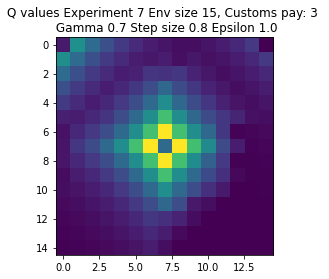

Expr:8 Eps:0 RunnAReward:-342.0 Reward:-6833 Timesteps:6750 GotPack:False Utiltime:3078 Customstime:3927 Money:4
Expr:8 Eps:20 RunnAReward:-1164.0 Reward:-372 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-968.0 Reward:-433 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-1174.0 Reward:-621 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:-874.0 Reward:-50 Timesteps:675 GotPack:False Utiltime:289 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:-189.0 Reward:-1266 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:-12.0 Reward:-478 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:86.0 Reward:-88 Timesteps:675 GotPack:False Utiltime:179 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:477.0 Reward:1718 Timesteps:371 GotPack:True Utiltime:156 Customstime:294 Money:4
Expr:8 Eps:180 RunnAReward:259.

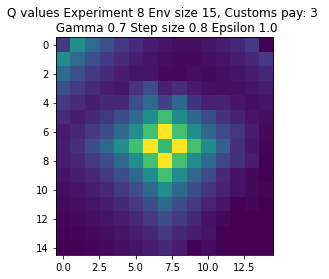

Expr:9 Eps:0 RunnAReward:-9.0 Reward:-173 Timesteps:675 GotPack:False Utiltime:479 Customstime:0 Money:1
Expr:9 Eps:20 RunnAReward:-1195.0 Reward:-340 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-991.0 Reward:-351 Timesteps:675 GotPack:False Utiltime:262 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-664.0 Reward:-679 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-626.0 Reward:280 Timesteps:450 GotPack:False Utiltime:165 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-245.0 Reward:-361 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:-4.0 Reward:-98 Timesteps:900 GotPack:False Utiltime:183 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:-171.0 Reward:265 Timesteps:450 GotPack:False Utiltime:111 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:218.0 Reward:1290 Timesteps:624 GotPack:True Utiltime:101 Customstime:582 Money:3
Expr:9 Eps:180 RunnAReward:374.0 Rewa

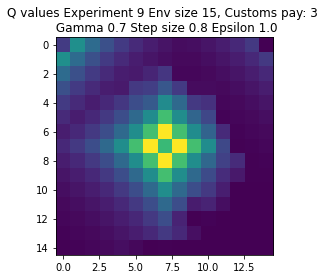

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.7 Step size 0.8 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-15.0 Reward:-281 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-528.0 Reward:-330 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-545.0 Reward:-554 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:60 RunnAReward:-220.0 Reward:410 Timesteps:225 GotPack:False Utiltime:155 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-644.0 Reward:-5 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-240.0 Reward:-561 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:120 RunnAReward:-316.0 Reward:-81 Timesteps:225 GotPack:False Utiltime:0 Customsti

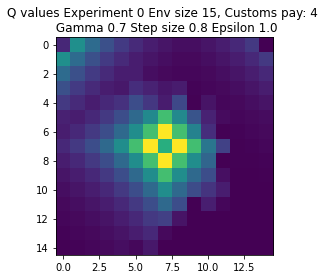

Expr:1 Eps:0 RunnAReward:-25.0 Reward:-500 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-1050.0 Reward:-241 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-833.0 Reward:-3214 Timesteps:3744 GotPack:True Utiltime:1962 Customstime:2260 Money:4
Expr:1 Eps:60 RunnAReward:-609.0 Reward:-51 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-140.0 Reward:-118 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-241.0 Reward:-533 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:-87.0 Reward:-129 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:-35.0 Reward:731 Timesteps:975 GotPack:True Utiltime:377 Customstime:697 Money:5
Expr:1 Eps:160 RunnAReward:97.0 Reward:-280 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:178.0 Reward

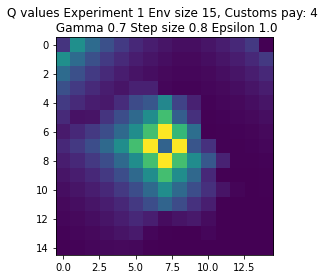

Expr:2 Eps:0 RunnAReward:-17.0 Reward:-336 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-503.0 Reward:-273 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-700.0 Reward:109 Timesteps:450 GotPack:False Utiltime:101 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-1010.0 Reward:-3323 Timesteps:4323 GotPack:True Utiltime:2079 Customstime:2339 Money:5
Expr:2 Eps:80 RunnAReward:-313.0 Reward:-134 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-315.0 Reward:429 Timesteps:225 GotPack:False Utiltime:9 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-96.0 Reward:-85 Timesteps:1631 GotPack:True Utiltime:65 Customstime:469 Money:5
Expr:2 Eps:140 RunnAReward:-170.0 Reward:309 Timesteps:225 GotPack:False Utiltime:95 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:-65.0 Reward:77 Timesteps:450 GotPack:False Utiltime:66 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:204.0 Rewa

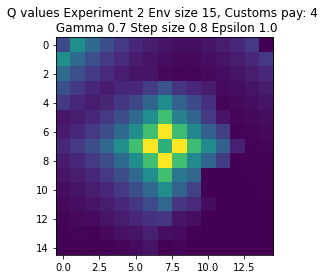

Expr:3 Eps:0 RunnAReward:-13.0 Reward:-245 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-612.0 Reward:-295 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-637.0 Reward:-120 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-632.0 Reward:-632 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:80 RunnAReward:-505.0 Reward:-319 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-276.0 Reward:-1227 Timesteps:2747 GotPack:True Utiltime:1976 Customstime:2053 Money:5
Expr:3 Eps:120 RunnAReward:-30.0 Reward:-96 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:18.0 Reward:507 Timesteps:225 GotPack:False Utiltime:9 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:228.0 Reward:143 Timesteps:450 GotPack:False Utiltime:77 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:119.0 Reward:581

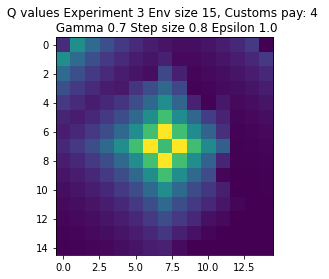

Expr:4 Eps:0 RunnAReward:-23.0 Reward:-442 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-750.0 Reward:-233 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-638.0 Reward:44 Timesteps:450 GotPack:False Utiltime:298 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-1002.0 Reward:-5968 Timesteps:6307 GotPack:True Utiltime:5295 Customstime:5396 Money:4
Expr:4 Eps:80 RunnAReward:-613.0 Reward:-395 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-301.0 Reward:-353 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-92.0 Reward:344 Timesteps:225 GotPack:False Utiltime:146 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:110.0 Reward:303 Timesteps:225 GotPack:False Utiltime:183 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:136.0 Reward:628 Timesteps:225 GotPack:False Utiltime:195 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:80.0 Rewa

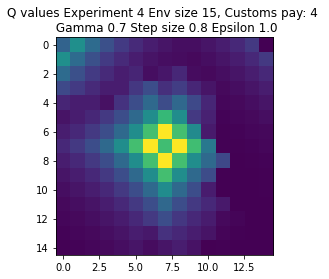

Expr:5 Eps:0 RunnAReward:-22.0 Reward:-431 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:5 Eps:20 RunnAReward:-748.0 Reward:-819 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-849.0 Reward:-8 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-493.0 Reward:-91 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-260.0 Reward:71 Timesteps:450 GotPack:False Utiltime:160 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:-513.0 Reward:-155 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-232.0 Reward:-187 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:-109.0 Reward:59 Timesteps:675 GotPack:False Utiltime:206 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:-7.0 Reward:-258 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:269.0 Reward:310 Times

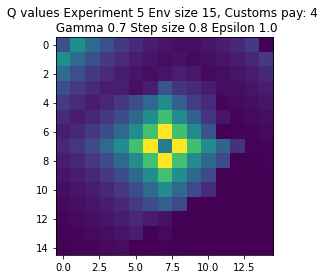

Expr:6 Eps:0 RunnAReward:-10.0 Reward:-185 Timesteps:1922 GotPack:True Utiltime:1284 Customstime:1318 Money:5
Expr:6 Eps:20 RunnAReward:-561.0 Reward:291 Timesteps:225 GotPack:False Utiltime:71 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-852.0 Reward:-48 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-288.0 Reward:-351 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:-301.0 Reward:18 Timesteps:675 GotPack:False Utiltime:451 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:-221.0 Reward:434 Timesteps:225 GotPack:False Utiltime:154 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-86.0 Reward:-143 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:220.0 Reward:-259 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:-6.0 Reward:-230 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:59.0 Reward:611

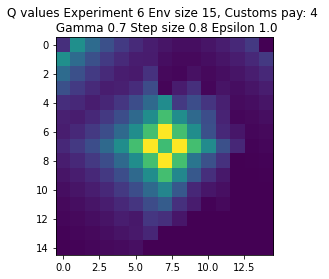

Expr:7 Eps:0 RunnAReward:3.0 Reward:78 Timesteps:450 GotPack:False Utiltime:295 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-921.0 Reward:-88 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-759.0 Reward:138 Timesteps:450 GotPack:False Utiltime:196 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-529.0 Reward:-455 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-237.0 Reward:-133 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-145.0 Reward:-335 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-182.0 Reward:-449 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:-97.0 Reward:-8 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:104.0 Reward:821 Timesteps:1148 GotPack:True Utiltime:683 Customstime:738 Money:4
Expr:7 Eps:180 RunnAReward:202.0 Reward:147 Tim

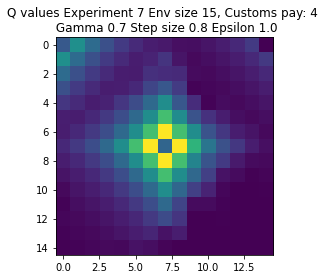

Expr:8 Eps:0 RunnAReward:-32.0 Reward:-629 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-560.0 Reward:-320 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-1067.0 Reward:-304 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-167.0 Reward:-58 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-294.0 Reward:-365 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-286.0 Reward:-240 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-458.0 Reward:-275 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:-269.0 Reward:413 Timesteps:1470 GotPack:True Utiltime:746 Customstime:1103 Money:5
Expr:8 Eps:160 RunnAReward:-25.0 Reward:357 Timesteps:450 GotPack:False Utiltime:285 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:107.0 Reward:

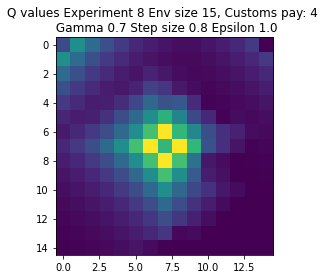

Expr:9 Eps:0 RunnAReward:-14.0 Reward:-280 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-741.0 Reward:-420 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-410.0 Reward:-293 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:9 Eps:60 RunnAReward:-479.0 Reward:-683 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:-400.0 Reward:39 Timesteps:450 GotPack:False Utiltime:47 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-359.0 Reward:-351 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:141.0 Reward:413 Timesteps:450 GotPack:False Utiltime:279 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-43.0 Reward:-136 Timesteps:450 GotPack:False Utiltime:306 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:219.0 Reward:632 Timesteps:225 GotPack:False Utiltime:14 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:189.0 Reward:532 T

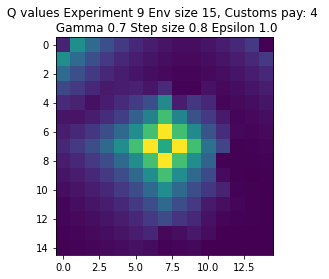

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.9 Step size 0.4 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:1.0 Reward:38 Timesteps:450 GotPack:False Utiltime:118 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-945.0 Reward:-625 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-246.0 Reward:1334 Timesteps:525 GotPack:True Utiltime:128 Customstime:394 Money:4
Expr:0 Eps:60 RunnAReward:-441.0 Reward:-1923 Timesteps:3066 GotPack:True Utiltime:2409 Customstime:2445 Money:3
Expr:0 Eps:80 RunnAReward:79.0 Reward:25 Timesteps:450 GotPack:False Utiltime:163 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:147.0 Reward:32 Timesteps:450 GotPack:False Utiltime:3 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:203.0 Reward:23 Timesteps:450 GotPack:False Utiltime:249 Custo

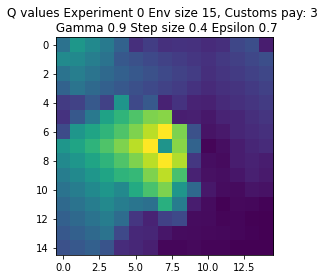

Expr:1 Eps:0 RunnAReward:-37.0 Reward:-726 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:20 RunnAReward:-622.0 Reward:-2540 Timesteps:3540 GotPack:True Utiltime:764 Customstime:1076 Money:3
Expr:1 Eps:40 RunnAReward:-746.0 Reward:416 Timesteps:1463 GotPack:True Utiltime:804 Customstime:976 Money:5
Expr:1 Eps:60 RunnAReward:-190.0 Reward:1717 Timesteps:415 GotPack:True Utiltime:183 Customstime:260 Money:3
Expr:1 Eps:80 RunnAReward:86.0 Reward:-557 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:71.0 Reward:-467 Timesteps:2112 GotPack:True Utiltime:1137 Customstime:1222 Money:4
Expr:1 Eps:120 RunnAReward:574.0 Reward:854 Timesteps:1072 GotPack:True Utiltime:136 Customstime:962 Money:3
Expr:1 Eps:140 RunnAReward:436.0 Reward:188 Timesteps:450 GotPack:False Utiltime:19 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:418.0 Reward:-351 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:180 RunnAReward:583

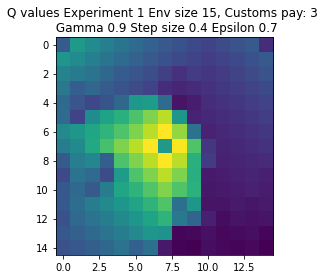

Expr:2 Eps:0 RunnAReward:-21.0 Reward:-407 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-801.0 Reward:-1967 Timesteps:3265 GotPack:True Utiltime:2316 Customstime:2673 Money:5
Expr:2 Eps:40 RunnAReward:-427.0 Reward:-475 Timesteps:900 GotPack:False Utiltime:632 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-162.0 Reward:20 Timesteps:675 GotPack:False Utiltime:101 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:204.0 Reward:-501 Timesteps:900 GotPack:False Utiltime:167 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:155.0 Reward:228 Timesteps:450 GotPack:False Utiltime:116 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:362.0 Reward:-790 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:367.0 Reward:166 Timesteps:450 GotPack:False Utiltime:60 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:686.0 Reward:1024 Timesteps:778 GotPack:True Utiltime:183 Customstime:283 Money:5
Expr:2 Eps:180 RunnAReward:625.0 R

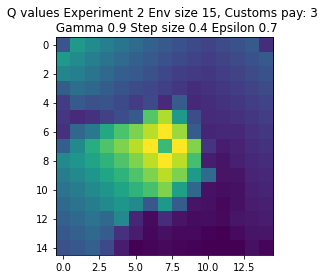

Expr:3 Eps:0 RunnAReward:-33.0 Reward:-643 Timesteps:2039 GotPack:True Utiltime:300 Customstime:662 Money:4
Expr:3 Eps:20 RunnAReward:-775.0 Reward:-577 Timesteps:1950 GotPack:True Utiltime:1547 Customstime:1641 Money:5
Expr:3 Eps:40 RunnAReward:-335.0 Reward:-401 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:35.0 Reward:-320 Timesteps:675 GotPack:False Utiltime:152 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:-112.0 Reward:123 Timesteps:675 GotPack:False Utiltime:34 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:163.0 Reward:163 Timesteps:450 GotPack:False Utiltime:14 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:148.0 Reward:1327 Timesteps:775 GotPack:True Utiltime:122 Customstime:522 Money:4
Expr:3 Eps:140 RunnAReward:280.0 Reward:28 Timesteps:675 GotPack:False Utiltime:160 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:645.0 Reward:95 Timesteps:675 GotPack:False Utiltime:43 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:744.0 Rew

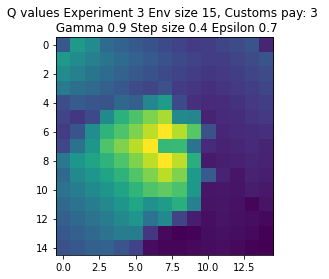

Expr:4 Eps:0 RunnAReward:-35.0 Reward:-683 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1031.0 Reward:-1268 Timesteps:2431 GotPack:True Utiltime:1842 Customstime:2296 Money:3
Expr:4 Eps:40 RunnAReward:-460.0 Reward:185 Timesteps:450 GotPack:False Utiltime:97 Customstime:0 Money:1
Expr:4 Eps:60 RunnAReward:-41.0 Reward:328 Timesteps:450 GotPack:False Utiltime:209 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:188.0 Reward:-305 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:173.0 Reward:-1 Timesteps:675 GotPack:False Utiltime:117 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:168.0 Reward:330 Timesteps:450 GotPack:False Utiltime:179 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:333.0 Reward:447 Timesteps:1376 GotPack:True Utiltime:42 Customstime:607 Money:5
Expr:4 Eps:160 RunnAReward:394.0 Reward:273 Timesteps:450 GotPack:False Utiltime:50 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:459.0 Rewar

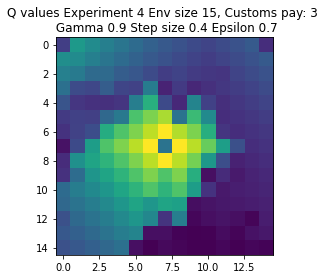

Expr:5 Eps:0 RunnAReward:-16.0 Reward:-313 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-640.0 Reward:-1420 Timesteps:2704 GotPack:True Utiltime:1351 Customstime:1537 Money:3
Expr:5 Eps:40 RunnAReward:-565.0 Reward:-79 Timesteps:450 GotPack:False Utiltime:141 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-187.0 Reward:808 Timesteps:1103 GotPack:True Utiltime:654 Customstime:964 Money:3
Expr:5 Eps:80 RunnAReward:39.0 Reward:-305 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:100 RunnAReward:82.0 Reward:94 Timesteps:450 GotPack:False Utiltime:61 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:161.0 Reward:309 Timesteps:450 GotPack:False Utiltime:357 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:440.0 Reward:24 Timesteps:450 GotPack:False Utiltime:27 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:542.0 Reward:132 Timesteps:675 GotPack:False Utiltime:108 Customstime:0 Money:2
Expr:5 Eps:180 RunnAReward:783.0 Reward:

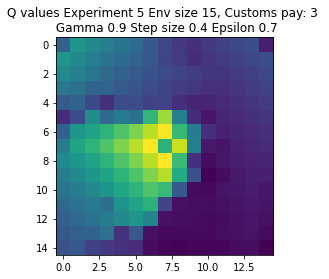

Expr:6 Eps:0 RunnAReward:12.0 Reward:258 Timesteps:450 GotPack:False Utiltime:114 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-525.0 Reward:-637 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-795.0 Reward:-399 Timesteps:900 GotPack:False Utiltime:226 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-252.0 Reward:775 Timesteps:1074 GotPack:True Utiltime:790 Customstime:833 Money:5
Expr:6 Eps:80 RunnAReward:263.0 Reward:388 Timesteps:450 GotPack:False Utiltime:75 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:518.0 Reward:845 Timesteps:899 GotPack:True Utiltime:452 Customstime:700 Money:5
Expr:6 Eps:120 RunnAReward:218.0 Reward:225 Timesteps:450 GotPack:False Utiltime:174 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:601.0 Reward:379 Timesteps:1391 GotPack:True Utiltime:937 Customstime:1019 Money:5
Expr:6 Eps:160 RunnAReward:332.0 Reward:237 Timesteps:450 GotPack:False Utiltime:43 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:677.0 Rewa

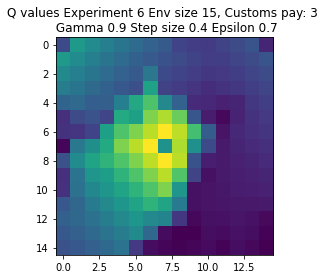

Expr:7 Eps:0 RunnAReward:-17.0 Reward:-339 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-1016.0 Reward:-476 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-36.0 Reward:-1095 Timesteps:2688 GotPack:True Utiltime:855 Customstime:1452 Money:3
Expr:7 Eps:60 RunnAReward:-138.0 Reward:-444 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-151.0 Reward:-336 Timesteps:900 GotPack:False Utiltime:857 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:203.0 Reward:68 Timesteps:675 GotPack:False Utiltime:50 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:349.0 Reward:1834 Timesteps:314 GotPack:True Utiltime:84 Customstime:238 Money:3
Expr:7 Eps:140 RunnAReward:659.0 Reward:-271 Timesteps:1940 GotPack:True Utiltime:1590 Customstime:1668 Money:5
Expr:7 Eps:160 RunnAReward:652.0 Reward:492 Timesteps:1328 GotPack:True Utiltime:609 Customstime:648 Money:5
Expr:7 Eps:180 RunnAReward:355

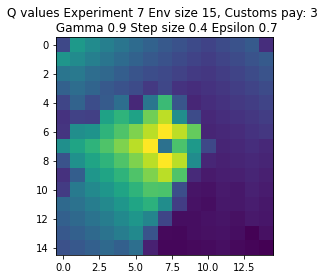

Expr:8 Eps:0 RunnAReward:-26.0 Reward:-520 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-653.0 Reward:-358 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-399.0 Reward:-280 Timesteps:900 GotPack:False Utiltime:172 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-293.0 Reward:-81 Timesteps:675 GotPack:False Utiltime:77 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-30.0 Reward:625 Timesteps:1197 GotPack:True Utiltime:91 Customstime:766 Money:3
Expr:8 Eps:100 RunnAReward:289.0 Reward:88 Timesteps:675 GotPack:False Utiltime:123 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:342.0 Reward:381 Timesteps:450 GotPack:False Utiltime:11 Customstime:0 Money:1
Expr:8 Eps:140 RunnAReward:492.0 Reward:1074 Timesteps:979 GotPack:True Utiltime:246 Customstime:279 Money:4
Expr:8 Eps:160 RunnAReward:694.0 Reward:392 Timesteps:450 GotPack:False Utiltime:24 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:511.0 Reward:17

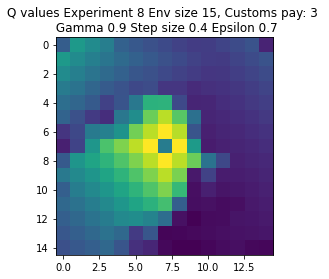

Expr:9 Eps:0 RunnAReward:-20.0 Reward:-400 Timesteps:1785 GotPack:True Utiltime:993 Customstime:1441 Money:3
Expr:9 Eps:20 RunnAReward:-535.0 Reward:-708 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-569.0 Reward:-335 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-93.0 Reward:142 Timesteps:450 GotPack:False Utiltime:75 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:-98.0 Reward:1190 Timesteps:951 GotPack:True Utiltime:641 Customstime:856 Money:3
Expr:9 Eps:100 RunnAReward:483.0 Reward:1452 Timesteps:730 GotPack:True Utiltime:133 Customstime:590 Money:3
Expr:9 Eps:120 RunnAReward:673.0 Reward:1387 Timesteps:629 GotPack:True Utiltime:418 Customstime:585 Money:5
Expr:9 Eps:140 RunnAReward:498.0 Reward:-159 Timesteps:1915 GotPack:True Utiltime:59 Customstime:345 Money:5
Expr:9 Eps:160 RunnAReward:413.0 Reward:249 Timesteps:450 GotPack:False Utiltime:88 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:463.0 

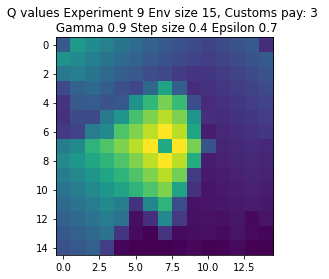

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.9 Step size 0.4 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-5.0 Reward:-84 Timesteps:1752 GotPack:True Utiltime:899 Customstime:1495 Money:5
Expr:0 Eps:20 RunnAReward:-507.0 Reward:-609 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-444.0 Reward:-48 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-460.0 Reward:-525 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:-104.0 Reward:114 Timesteps:450 GotPack:False Utiltime:28 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:230.0 Reward:274 Timesteps:450 GotPack:False Utiltime:42 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:183.0 Reward:-152 Timesteps:900 GotPack:False Utiltime:134 Custo

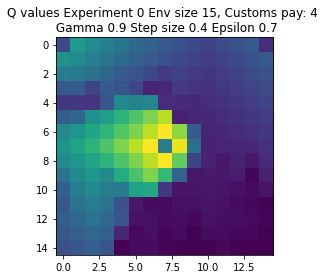

Expr:1 Eps:0 RunnAReward:-3.0 Reward:-57 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-287.0 Reward:-20 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-196.0 Reward:356 Timesteps:225 GotPack:False Utiltime:162 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-45.0 Reward:291 Timesteps:450 GotPack:False Utiltime:48 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:-140.0 Reward:411 Timesteps:225 GotPack:False Utiltime:47 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-23.0 Reward:208 Timesteps:450 GotPack:False Utiltime:289 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:303.0 Reward:126 Timesteps:450 GotPack:False Utiltime:68 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:369.0 Reward:637 Timesteps:225 GotPack:False Utiltime:27 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:225.0 Reward:-173 Timesteps:675 GotPack:False Utiltime:591 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:260.0 Reward:1601 Tim

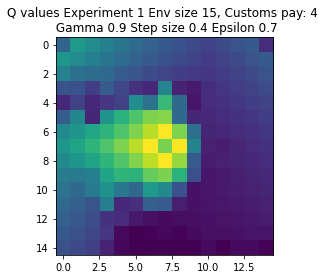

Expr:2 Eps:0 RunnAReward:-18.0 Reward:-354 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-411.0 Reward:-671 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-304.0 Reward:-410 Timesteps:1875 GotPack:True Utiltime:1097 Customstime:1376 Money:4
Expr:2 Eps:60 RunnAReward:-425.0 Reward:-685 Timesteps:1125 GotPack:False Utiltime:458 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:-48.0 Reward:-168 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:78.0 Reward:87 Timesteps:450 GotPack:False Utiltime:33 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:386.0 Reward:605 Timesteps:225 GotPack:False Utiltime:85 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:383.0 Reward:267 Timesteps:225 GotPack:False Utiltime:42 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:430.0 Reward:1393 Timesteps:426 GotPack:True Utiltime:43 Customstime:159 Money:5
Expr:2 Eps:180 RunnAReward:526.0 Reward:

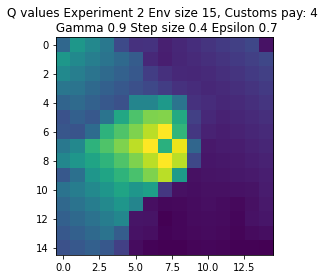

Expr:3 Eps:0 RunnAReward:-17.0 Reward:-321 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-521.0 Reward:-64 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-544.0 Reward:-41 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-279.0 Reward:-888 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:-297.0 Reward:31 Timesteps:1790 GotPack:True Utiltime:962 Customstime:1237 Money:4
Expr:3 Eps:100 RunnAReward:87.0 Reward:391 Timesteps:450 GotPack:False Utiltime:134 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:157.0 Reward:130 Timesteps:450 GotPack:False Utiltime:405 Customstime:0 Money:3
Expr:3 Eps:140 RunnAReward:508.0 Reward:630 Timesteps:225 GotPack:False Utiltime:130 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:343.0 Reward:675 Timesteps:225 GotPack:False Utiltime:49 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:628.0 Reward:571 T

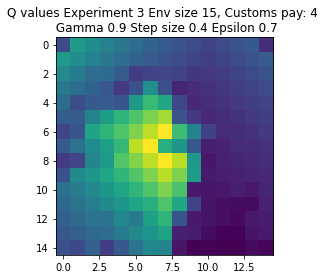

Expr:4 Eps:0 RunnAReward:-37.0 Reward:-731 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:20 RunnAReward:-304.0 Reward:212 Timesteps:1539 GotPack:True Utiltime:351 Customstime:483 Money:4
Expr:4 Eps:40 RunnAReward:-187.0 Reward:-549 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:60 RunnAReward:-162.0 Reward:-606 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:-412.0 Reward:299 Timesteps:450 GotPack:False Utiltime:292 Customstime:0 Money:3
Expr:4 Eps:100 RunnAReward:99.0 Reward:-55 Timesteps:675 GotPack:False Utiltime:39 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:341.0 Reward:402 Timesteps:225 GotPack:False Utiltime:54 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:182.0 Reward:852 Timesteps:997 GotPack:True Utiltime:200 Customstime:370 Money:4
Expr:4 Eps:160 RunnAReward:544.0 Reward:151 Timesteps:450 GotPack:False Utiltime:78 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:99.0 Reward:354 

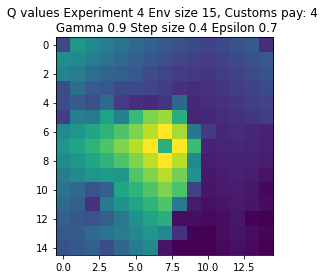

Expr:5 Eps:0 RunnAReward:-16.0 Reward:-305 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-494.0 Reward:-73 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-125.0 Reward:-89 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-330.0 Reward:-65 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-14.0 Reward:317 Timesteps:225 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:106.0 Reward:-15 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:218.0 Reward:627 Timesteps:225 GotPack:False Utiltime:122 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:431.0 Reward:-99 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:259.0 Reward:644 Timesteps:225 GotPack:False Utiltime:27 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:431.0 Reward:397 Timesteps

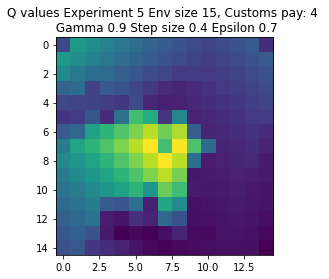

Expr:6 Eps:0 RunnAReward:-31.0 Reward:-603 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:20 RunnAReward:-770.0 Reward:-285 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-636.0 Reward:-1254 Timesteps:2872 GotPack:True Utiltime:2282 Customstime:2427 Money:4
Expr:6 Eps:60 RunnAReward:-110.0 Reward:137 Timesteps:450 GotPack:False Utiltime:137 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:-173.0 Reward:424 Timesteps:450 GotPack:False Utiltime:265 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:306.0 Reward:441 Timesteps:225 GotPack:False Utiltime:113 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:72.0 Reward:284 Timesteps:450 GotPack:False Utiltime:355 Customstime:0 Money:3
Expr:6 Eps:140 RunnAReward:464.0 Reward:-153 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:579.0 Reward:545 Timesteps:225 GotPack:False Utiltime:80 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:551.0 Rewar

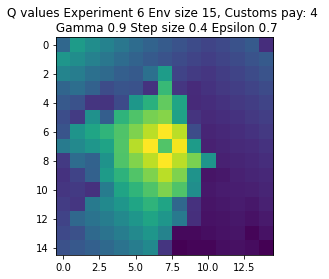

Expr:7 Eps:0 RunnAReward:-7.0 Reward:-126 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-345.0 Reward:564 Timesteps:225 GotPack:False Utiltime:176 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-252.0 Reward:-146 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:21.0 Reward:434 Timesteps:225 GotPack:False Utiltime:59 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:313.0 Reward:-30 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:213.0 Reward:372 Timesteps:225 GotPack:False Utiltime:56 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:259.0 Reward:-16 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:303.0 Reward:642 Timesteps:225 GotPack:False Utiltime:53 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:482.0 Reward:513 Timesteps:225 GotPack:False Utiltime:46 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:281.0 Reward:2 Timesteps:6

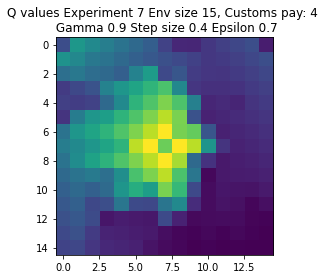

Expr:8 Eps:0 RunnAReward:-17.0 Reward:-329 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-503.0 Reward:307 Timesteps:450 GotPack:False Utiltime:13 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-635.0 Reward:347 Timesteps:450 GotPack:False Utiltime:163 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-114.0 Reward:-57 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:105.0 Reward:623 Timesteps:225 GotPack:False Utiltime:7 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:169.0 Reward:367 Timesteps:225 GotPack:False Utiltime:32 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:263.0 Reward:-16 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:420.0 Reward:115 Timesteps:450 GotPack:False Utiltime:66 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:427.0 Reward:577 Timesteps:225 GotPack:False Utiltime:18 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:497.0 Reward:-91 Timeste

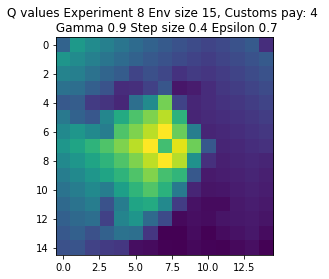

Expr:9 Eps:0 RunnAReward:-170.0 Reward:-3393 Timesteps:4290 GotPack:True Utiltime:1557 Customstime:2130 Money:4
Expr:9 Eps:20 RunnAReward:-828.0 Reward:-21 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-434.0 Reward:-283 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-88.0 Reward:-24 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:8.0 Reward:335 Timesteps:450 GotPack:False Utiltime:33 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:225.0 Reward:387 Timesteps:225 GotPack:False Utiltime:17 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:383.0 Reward:-36 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:385.0 Reward:13 Timesteps:675 GotPack:False Utiltime:52 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:520.0 Reward:565 Timesteps:225 GotPack:False Utiltime:108 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:307.0 Reward:-18 Tim

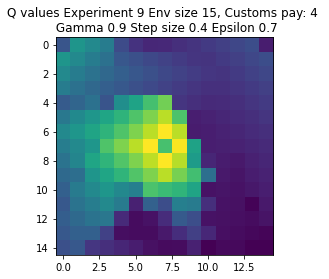

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.9 Step size 0.4 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-11.0 Reward:-212 Timesteps:675 GotPack:False Utiltime:512 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-1129.0 Reward:-1018 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-251.0 Reward:-466 Timesteps:900 GotPack:False Utiltime:114 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-413.0 Reward:-203 Timesteps:1870 GotPack:True Utiltime:7 Customstime:607 Money:4
Expr:0 Eps:80 RunnAReward:-292.0 Reward:-35 Timesteps:675 GotPack:False Utiltime:79 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:25.0 Reward:-237 Timesteps:1961 GotPack:True Utiltime:224 Customstime:928 Money:5
Expr:0 Eps:120 RunnAReward:-44.0 Reward:216 Timesteps:450 GotPack:False Utiltime:1

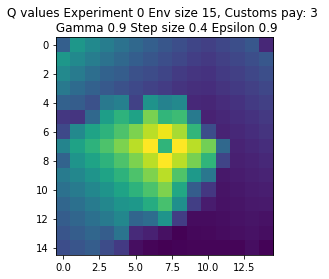

Expr:1 Eps:0 RunnAReward:-58.0 Reward:-1149 Timesteps:2633 GotPack:True Utiltime:1527 Customstime:2430 Money:5
Expr:1 Eps:20 RunnAReward:-1030.0 Reward:-615 Timesteps:2360 GotPack:True Utiltime:1304 Customstime:2110 Money:3
Expr:1 Eps:40 RunnAReward:-729.0 Reward:-543 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-496.0 Reward:102 Timesteps:450 GotPack:False Utiltime:165 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:-216.0 Reward:-140 Timesteps:450 GotPack:False Utiltime:7 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:110.0 Reward:270 Timesteps:450 GotPack:False Utiltime:114 Customstime:0 Money:1
Expr:1 Eps:120 RunnAReward:-374.0 Reward:285 Timesteps:450 GotPack:False Utiltime:58 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:217.0 Reward:231 Timesteps:450 GotPack:False Utiltime:422 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:324.0 Reward:874 Timesteps:980 GotPack:True Utiltime:368 Customstime:458 Money:5
Expr:1 Eps:180 RunnAReward:4

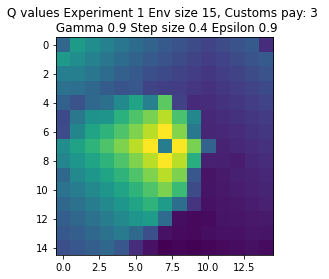

Expr:2 Eps:0 RunnAReward:-34.0 Reward:-674 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-719.0 Reward:-371 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:40 RunnAReward:-456.0 Reward:-605 Timesteps:2128 GotPack:True Utiltime:610 Customstime:919 Money:5
Expr:2 Eps:60 RunnAReward:-578.0 Reward:-61 Timesteps:675 GotPack:False Utiltime:344 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:-213.0 Reward:-64 Timesteps:675 GotPack:False Utiltime:598 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:-336.0 Reward:-307 Timesteps:2034 GotPack:True Utiltime:95 Customstime:862 Money:3
Expr:2 Eps:120 RunnAReward:56.0 Reward:-169 Timesteps:1896 GotPack:True Utiltime:460 Customstime:1162 Money:3
Expr:2 Eps:140 RunnAReward:163.0 Reward:-1289 Timesteps:2594 GotPack:True Utiltime:1649 Customstime:2017 Money:5
Expr:2 Eps:160 RunnAReward:214.0 Reward:289 Timesteps:450 GotPack:False Utiltime:53 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:

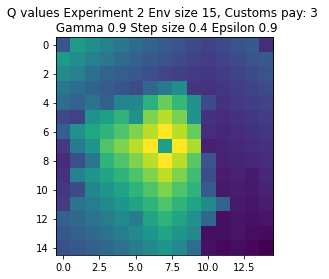

Expr:3 Eps:0 RunnAReward:-27.0 Reward:-540 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-560.0 Reward:-484 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:3 Eps:40 RunnAReward:-421.0 Reward:-1889 Timesteps:2977 GotPack:True Utiltime:110 Customstime:1806 Money:4
Expr:3 Eps:60 RunnAReward:-943.0 Reward:-6701 Timesteps:6677 GotPack:True Utiltime:4971 Customstime:5816 Money:4
Expr:3 Eps:80 RunnAReward:-562.0 Reward:172 Timesteps:1676 GotPack:True Utiltime:717 Customstime:799 Money:4
Expr:3 Eps:100 RunnAReward:-196.0 Reward:-5628 Timesteps:6060 GotPack:True Utiltime:127 Customstime:577 Money:3
Expr:3 Eps:120 RunnAReward:-97.0 Reward:-628 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:145.0 Reward:-69 Timesteps:675 GotPack:False Utiltime:100 Customstime:0 Money:1
Expr:3 Eps:160 RunnAReward:-108.0 Reward:304 Timesteps:450 GotPack:False Utiltime:121 Customstime:0 Money:1
Expr:3 Eps:180 RunnARew

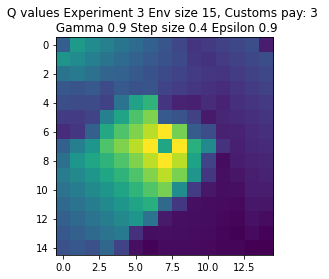

Expr:4 Eps:0 RunnAReward:-25.0 Reward:-483 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-815.0 Reward:-666 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-542.0 Reward:-762 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:60 RunnAReward:-744.0 Reward:-988 Timesteps:2341 GotPack:True Utiltime:1611 Customstime:1720 Money:4
Expr:4 Eps:80 RunnAReward:-13.0 Reward:140 Timesteps:450 GotPack:False Utiltime:277 Customstime:0 Money:1
Expr:4 Eps:100 RunnAReward:-61.0 Reward:68 Timesteps:450 GotPack:False Utiltime:157 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-69.0 Reward:-3 Timesteps:450 GotPack:False Utiltime:71 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:272.0 Reward:14 Timesteps:450 GotPack:False Utiltime:51 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:433.0 Reward:92 Timesteps:450 GotPack:False Utiltime:60 Customstime:0 Money:1
Expr:4 Eps:180 RunnAReward:256.0 Reward:1399 

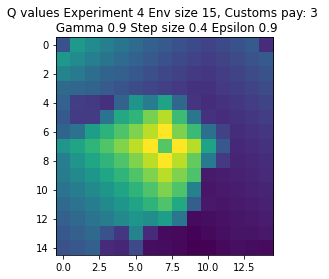

Expr:5 Eps:0 RunnAReward:-357.0 Reward:-7121 Timesteps:6750 GotPack:False Utiltime:4845 Customstime:5488 Money:5
Expr:5 Eps:20 RunnAReward:-897.0 Reward:-500 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-361.0 Reward:-331 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-649.0 Reward:-5921 Timesteps:6175 GotPack:True Utiltime:2217 Customstime:2287 Money:3
Expr:5 Eps:80 RunnAReward:-683.0 Reward:261 Timesteps:450 GotPack:False Utiltime:237 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-27.0 Reward:-246 Timesteps:2049 GotPack:True Utiltime:645 Customstime:819 Money:3
Expr:5 Eps:120 RunnAReward:-8.0 Reward:-339 Timesteps:675 GotPack:False Utiltime:139 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:-123.0 Reward:-309 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:9.0 Reward:264 Timesteps:450 GotPack:False Utiltime:130 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward

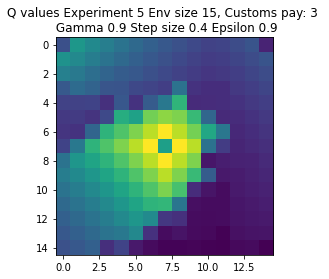

Expr:6 Eps:0 RunnAReward:-30.0 Reward:-582 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-742.0 Reward:-543 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-539.0 Reward:59 Timesteps:450 GotPack:False Utiltime:24 Customstime:0 Money:1
Expr:6 Eps:60 RunnAReward:-328.0 Reward:-288 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:80 RunnAReward:-402.0 Reward:-666 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:-446.0 Reward:-428 Timesteps:900 GotPack:False Utiltime:139 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:-60.0 Reward:324 Timesteps:450 GotPack:False Utiltime:91 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:38.0 Reward:293 Timesteps:450 GotPack:False Utiltime:143 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:299.0 Reward:346 Timesteps:450 GotPack:False Utiltime:233 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:499.0 Reward:-38 T

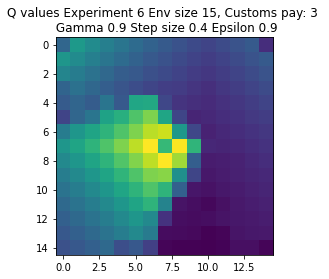

Expr:7 Eps:0 RunnAReward:-46.0 Reward:-919 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-1071.0 Reward:-4555 Timesteps:5194 GotPack:True Utiltime:1701 Customstime:2334 Money:3
Expr:7 Eps:40 RunnAReward:-922.0 Reward:-2946 Timesteps:4098 GotPack:True Utiltime:121 Customstime:1654 Money:4
Expr:7 Eps:60 RunnAReward:-645.0 Reward:-540 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-254.0 Reward:-239 Timesteps:1955 GotPack:True Utiltime:1331 Customstime:1376 Money:3
Expr:7 Eps:100 RunnAReward:-54.0 Reward:-621 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:120 RunnAReward:67.0 Reward:-411 Timesteps:900 GotPack:False Utiltime:116 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:-172.0 Reward:-30 Timesteps:450 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:146.0 Reward:239 Timesteps:450 GotPack:False Utiltime:136 Customstime:0 Money:1
Expr:7 Eps:180 RunnARewar

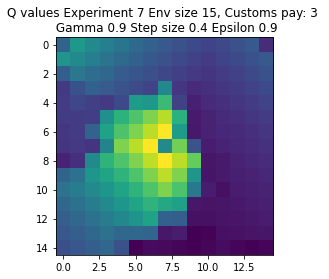

Expr:8 Eps:0 RunnAReward:-39.0 Reward:-766 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-740.0 Reward:165 Timesteps:1479 GotPack:True Utiltime:33 Customstime:649 Money:3
Expr:8 Eps:40 RunnAReward:-705.0 Reward:-347 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:60 RunnAReward:-1060.0 Reward:-5925 Timesteps:6431 GotPack:True Utiltime:5886 Customstime:6313 Money:5
Expr:8 Eps:80 RunnAReward:-218.0 Reward:331 Timesteps:450 GotPack:False Utiltime:188 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:166.0 Reward:711 Timesteps:1154 GotPack:True Utiltime:18 Customstime:276 Money:3
Expr:8 Eps:120 RunnAReward:209.0 Reward:159 Timesteps:450 GotPack:False Utiltime:56 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:286.0 Reward:32 Timesteps:675 GotPack:False Utiltime:65 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:294.0 Reward:81 Timesteps:675 GotPack:False Utiltime:122 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:487.0 Rew

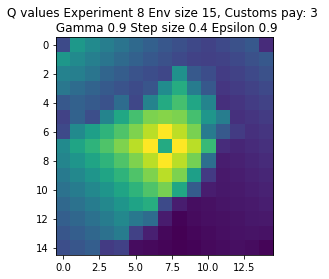

Expr:9 Eps:0 RunnAReward:-4.0 Reward:-67 Timesteps:450 GotPack:False Utiltime:420 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-847.0 Reward:352 Timesteps:450 GotPack:False Utiltime:419 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-988.0 Reward:356 Timesteps:450 GotPack:False Utiltime:304 Customstime:0 Money:1
Expr:9 Eps:60 RunnAReward:-208.0 Reward:-308 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:80 RunnAReward:-229.0 Reward:-91 Timesteps:675 GotPack:False Utiltime:129 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:231.0 Reward:1064 Timesteps:959 GotPack:True Utiltime:196 Customstime:481 Money:5
Expr:9 Eps:120 RunnAReward:408.0 Reward:363 Timesteps:450 GotPack:False Utiltime:103 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:219.0 Reward:43 Timesteps:675 GotPack:False Utiltime:136 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:256.0 Reward:131 Timesteps:450 GotPack:False Utiltime:138 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:405.0 Reward:

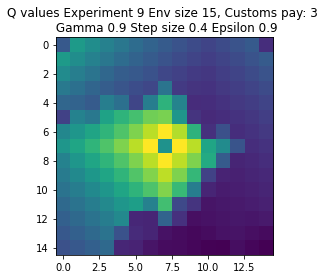

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.9 Step size 0.4 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-12.0 Reward:-235 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-237.0 Reward:86 Timesteps:1781 GotPack:True Utiltime:190 Customstime:726 Money:4
Expr:0 Eps:40 RunnAReward:-438.0 Reward:-5230 Timesteps:5620 GotPack:True Utiltime:1076 Customstime:2077 Money:5
Expr:0 Eps:60 RunnAReward:-701.0 Reward:-635 Timesteps:2258 GotPack:True Utiltime:913 Customstime:1397 Money:4
Expr:0 Eps:80 RunnAReward:-562.0 Reward:96 Timesteps:450 GotPack:False Utiltime:290 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:114.0 Reward:318 Timesteps:450 GotPack:False Utiltime:19 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:243.0 Reward:633 Timesteps:225 GotPack:False Utiltim

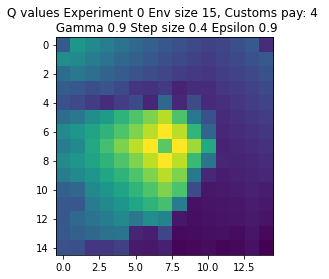

Expr:1 Eps:0 RunnAReward:-171.0 Reward:-3407 Timesteps:3833 GotPack:True Utiltime:2227 Customstime:2940 Money:5
Expr:1 Eps:20 RunnAReward:-426.0 Reward:308 Timesteps:225 GotPack:False Utiltime:15 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-654.0 Reward:129 Timesteps:450 GotPack:False Utiltime:251 Customstime:0 Money:2
Expr:1 Eps:60 RunnAReward:-321.0 Reward:326 Timesteps:225 GotPack:False Utiltime:150 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-393.0 Reward:-233 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-62.0 Reward:-954 Timesteps:2619 GotPack:True Utiltime:1310 Customstime:1454 Money:5
Expr:1 Eps:120 RunnAReward:43.0 Reward:-115 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:304.0 Reward:399 Timesteps:225 GotPack:False Utiltime:117 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:167.0 Reward:404 Timesteps:225 GotPack:False Utiltime:87 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:58.0 

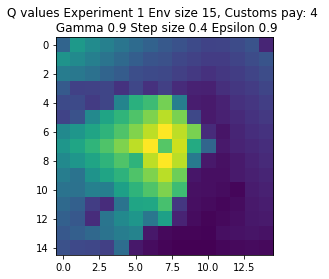

Expr:2 Eps:0 RunnAReward:-14.0 Reward:-267 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-519.0 Reward:-71 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-534.0 Reward:-51 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-384.0 Reward:-611 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:-114.0 Reward:-2929 Timesteps:3722 GotPack:True Utiltime:127 Customstime:655 Money:4
Expr:2 Eps:100 RunnAReward:-190.0 Reward:358 Timesteps:450 GotPack:False Utiltime:333 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-93.0 Reward:243 Timesteps:450 GotPack:False Utiltime:103 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:119.0 Reward:-270 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:77.0 Reward:735 Timesteps:1047 GotPack:True Utiltime:36 Customstime:469 Money:5
Expr:2 Eps:180 RunnAReward:384.0 Reward:-

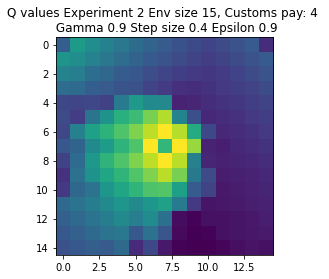

Expr:3 Eps:0 RunnAReward:-18.0 Reward:-360 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:20 RunnAReward:-175.0 Reward:-26 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-595.0 Reward:-2549 Timesteps:3653 GotPack:True Utiltime:2484 Customstime:2543 Money:4
Expr:3 Eps:60 RunnAReward:-729.0 Reward:-83 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-173.0 Reward:-737 Timesteps:2264 GotPack:True Utiltime:1922 Customstime:2203 Money:4
Expr:3 Eps:100 RunnAReward:51.0 Reward:-948 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:-182.0 Reward:-978 Timesteps:2782 GotPack:True Utiltime:385 Customstime:1878 Money:4
Expr:3 Eps:140 RunnAReward:173.0 Reward:241 Timesteps:1535 GotPack:True Utiltime:854 Customstime:892 Money:4
Expr:3 Eps:160 RunnAReward:188.0 Reward:273 Timesteps:450 GotPack:False Utiltime:45 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:20

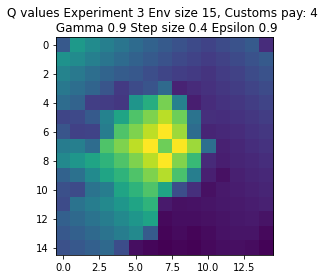

Expr:4 Eps:0 RunnAReward:-16.0 Reward:-314 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-365.0 Reward:-133 Timesteps:675 GotPack:False Utiltime:528 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-632.0 Reward:-568 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:60 RunnAReward:-226.0 Reward:-995 Timesteps:2453 GotPack:True Utiltime:39 Customstime:366 Money:5
Expr:4 Eps:80 RunnAReward:-325.0 Reward:434 Timesteps:225 GotPack:False Utiltime:126 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:129.0 Reward:-419 Timesteps:1910 GotPack:True Utiltime:519 Customstime:615 Money:5
Expr:4 Eps:120 RunnAReward:84.0 Reward:316 Timesteps:450 GotPack:False Utiltime:71 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:-203.0 Reward:-65 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:334.0 Reward:-267 Timesteps:900 GotPack:False Utiltime:42 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:328.0 Rewar

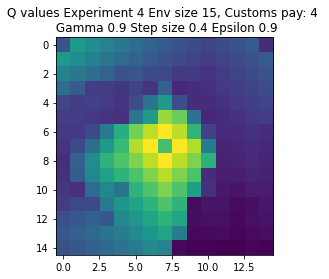

Expr:5 Eps:0 RunnAReward:-32.0 Reward:-635 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:5 Eps:20 RunnAReward:-922.0 Reward:-249 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-421.0 Reward:-340 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-321.0 Reward:359 Timesteps:225 GotPack:False Utiltime:107 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-65.0 Reward:-136 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-110.0 Reward:-52 Timesteps:1752 GotPack:True Utiltime:318 Customstime:757 Money:5
Expr:5 Eps:120 RunnAReward:49.0 Reward:-124 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:147.0 Reward:563 Timesteps:225 GotPack:False Utiltime:122 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:78.0 Reward:622 Timesteps:225 GotPack:False Utiltime:148 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:170.0 Reward:382 

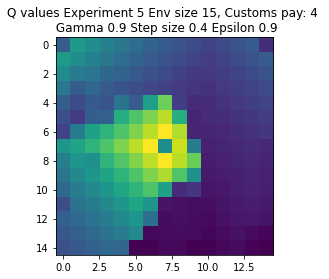

Expr:6 Eps:0 RunnAReward:-4.0 Reward:-64 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-662.0 Reward:600 Timesteps:225 GotPack:False Utiltime:220 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-700.0 Reward:-281 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:60 RunnAReward:-304.0 Reward:300 Timesteps:225 GotPack:False Utiltime:14 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-129.0 Reward:-66 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-123.0 Reward:322 Timesteps:450 GotPack:False Utiltime:226 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:27.0 Reward:280 Timesteps:450 GotPack:False Utiltime:118 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:134.0 Reward:-111 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:68.0 Reward:424 Timesteps:225 GotPack:False Utiltime:20 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:77.0 Reward:-40 Timest

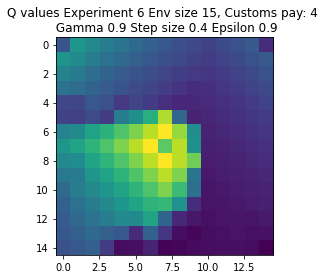

Expr:7 Eps:0 RunnAReward:-13.0 Reward:-253 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-686.0 Reward:-86 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-546.0 Reward:-1041 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-210.0 Reward:-358 Timesteps:1884 GotPack:True Utiltime:1493 Customstime:1732 Money:5
Expr:7 Eps:80 RunnAReward:-49.0 Reward:1431 Timesteps:483 GotPack:True Utiltime:97 Customstime:426 Money:4
Expr:7 Eps:100 RunnAReward:234.0 Reward:835 Timesteps:1033 GotPack:True Utiltime:718 Customstime:929 Money:4
Expr:7 Eps:120 RunnAReward:52.0 Reward:358 Timesteps:225 GotPack:False Utiltime:158 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:394.0 Reward:-10 Timesteps:450 GotPack:False Utiltime:105 Customstime:0 Money:3
Expr:7 Eps:160 RunnAReward:134.0 Reward:288 Timesteps:225 GotPack:False Utiltime:143 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:427.0 Rew

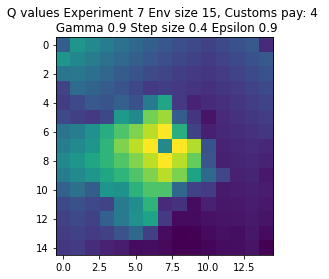

Expr:8 Eps:0 RunnAReward:7.0 Reward:143 Timesteps:1452 GotPack:True Utiltime:135 Customstime:683 Money:4
Expr:8 Eps:20 RunnAReward:-210.0 Reward:-23 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-925.0 Reward:-725 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-338.0 Reward:-68 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:15.0 Reward:185 Timesteps:450 GotPack:False Utiltime:92 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:149.0 Reward:334 Timesteps:225 GotPack:False Utiltime:119 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-221.0 Reward:589 Timesteps:225 GotPack:False Utiltime:72 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:157.0 Reward:266 Timesteps:450 GotPack:False Utiltime:421 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:275.0 Reward:1387 Timesteps:800 GotPack:True Utiltime:224 Customstime:616 Money:4
Expr:8 Eps:180 RunnAReward:200.0 Reward:-193 

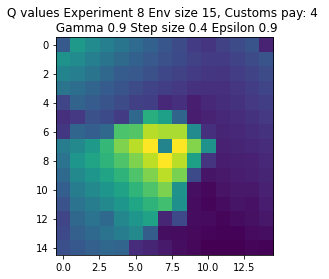

Expr:9 Eps:0 RunnAReward:22.0 Reward:445 Timesteps:225 GotPack:False Utiltime:158 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-509.0 Reward:-43 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-157.0 Reward:-16 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-168.0 Reward:-576 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:9 Eps:80 RunnAReward:-340.0 Reward:292 Timesteps:225 GotPack:False Utiltime:73 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-113.0 Reward:-31 Timesteps:450 GotPack:False Utiltime:326 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:-371.0 Reward:175 Timesteps:1644 GotPack:True Utiltime:133 Customstime:294 Money:5
Expr:9 Eps:140 RunnAReward:242.0 Reward:412 Timesteps:225 GotPack:False Utiltime:6 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:341.0 Reward:304 Timesteps:450 GotPack:False Utiltime:76 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:373.0 Reward:1112 

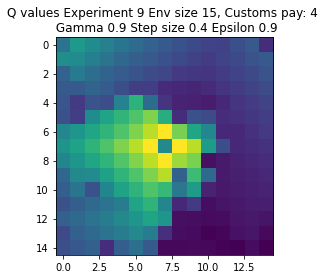

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.9 Step size 0.4 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-87.0 Reward:-1724 Timesteps:2104 GotPack:True Utiltime:1259 Customstime:1631 Money:5
Expr:0 Eps:20 RunnAReward:-1017.0 Reward:-400 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-1159.0 Reward:-2467 Timesteps:3454 GotPack:True Utiltime:1025 Customstime:1173 Money:5
Expr:0 Eps:60 RunnAReward:-791.0 Reward:-532 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-434.0 Reward:-5 Timesteps:675 GotPack:False Utiltime:222 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-385.0 Reward:139 Timesteps:450 GotPack:False Utiltime:87 Customstime:0 Money:1
Expr:0 Eps:120 RunnAReward:-148.0 Reward:368 Timesteps:450 GotPack:False Uti

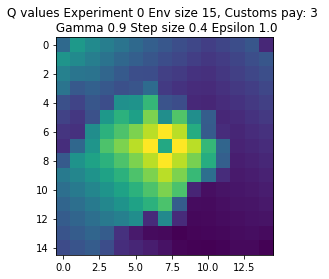

Expr:1 Eps:0 RunnAReward:-16.0 Reward:-304 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-1613.0 Reward:-450 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-904.0 Reward:-411 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:60 RunnAReward:-959.0 Reward:147 Timesteps:450 GotPack:False Utiltime:395 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-484.0 Reward:116 Timesteps:450 GotPack:False Utiltime:254 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-6.0 Reward:264 Timesteps:450 GotPack:False Utiltime:298 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:-566.0 Reward:-153 Timesteps:1828 GotPack:True Utiltime:474 Customstime:573 Money:5
Expr:1 Eps:140 RunnAReward:29.0 Reward:1210 Timesteps:891 GotPack:True Utiltime:202 Customstime:381 Money:3
Expr:1 Eps:160 RunnAReward:204.0 Reward:969 Timesteps:791 GotPack:True Utiltime:475 Customstime:578 Money:3
Expr:1 Eps:180 RunnAReward:151.0 Rew

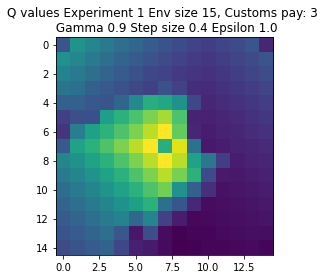

Expr:2 Eps:0 RunnAReward:-51.0 Reward:-1015 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-526.0 Reward:-592 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-528.0 Reward:354 Timesteps:450 GotPack:False Utiltime:373 Customstime:0 Money:1
Expr:2 Eps:60 RunnAReward:-436.0 Reward:-377 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:80 RunnAReward:-1025.0 Reward:153 Timesteps:450 GotPack:False Utiltime:101 Customstime:0 Money:1
Expr:2 Eps:100 RunnAReward:-377.0 Reward:-484 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-273.0 Reward:52 Timesteps:1491 GotPack:True Utiltime:4 Customstime:541 Money:5
Expr:2 Eps:140 RunnAReward:129.0 Reward:45 Timesteps:450 GotPack:False Utiltime:261 Customstime:0 Money:1
Expr:2 Eps:160 RunnAReward:180.0 Reward:174 Timesteps:450 GotPack:False Utiltime:240 Customstime:0 Money:1
Expr:2 Eps:180 RunnAReward:150.0 Reward:3

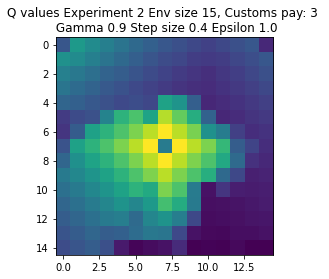

Expr:3 Eps:0 RunnAReward:13.0 Reward:274 Timesteps:450 GotPack:False Utiltime:321 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-1815.0 Reward:-7381 Timesteps:6750 GotPack:False Utiltime:5668 Customstime:5809 Money:3
Expr:3 Eps:40 RunnAReward:-1741.0 Reward:-365 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-1123.0 Reward:-402 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:3 Eps:80 RunnAReward:-477.0 Reward:334 Timesteps:450 GotPack:False Utiltime:374 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-490.0 Reward:-224 Timesteps:675 GotPack:False Utiltime:195 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:-71.0 Reward:121 Timesteps:450 GotPack:False Utiltime:45 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-119.0 Reward:341 Timesteps:450 GotPack:False Utiltime:225 Customstime:0 Money:1
Expr:3 Eps:160 RunnAReward:230.0 Reward:-67 Timesteps:675 GotPack:False Utiltime:111 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:271

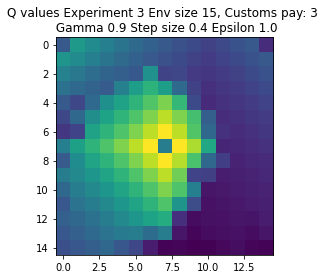

Expr:4 Eps:0 RunnAReward:-51.0 Reward:-1004 Timesteps:2458 GotPack:True Utiltime:499 Customstime:926 Money:3
Expr:4 Eps:20 RunnAReward:-970.0 Reward:-684 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-638.0 Reward:471 Timesteps:1249 GotPack:True Utiltime:534 Customstime:706 Money:5
Expr:4 Eps:60 RunnAReward:-935.0 Reward:168 Timesteps:450 GotPack:False Utiltime:7 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-629.0 Reward:-980 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-425.0 Reward:-48 Timesteps:450 GotPack:False Utiltime:2 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-123.0 Reward:334 Timesteps:450 GotPack:False Utiltime:84 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:-441.0 Reward:-557 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:160 RunnAReward:-39.0 Reward:184 Timesteps:1589 GotPack:True Utiltime:47 Customstime:608 Money:5
Expr:4 Eps:180 RunnAReward:-30.0 Rewa

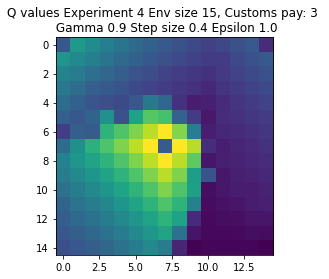

Expr:5 Eps:0 RunnAReward:-28.0 Reward:-560 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:20 RunnAReward:-910.0 Reward:132 Timesteps:450 GotPack:False Utiltime:202 Customstime:0 Money:1
Expr:5 Eps:40 RunnAReward:-783.0 Reward:-651 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:60 RunnAReward:-1086.0 Reward:-6694 Timesteps:5976 GotPack:True Utiltime:5293 Customstime:5510 Money:5
Expr:5 Eps:80 RunnAReward:-1367.0 Reward:-411 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-395.0 Reward:-427 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:120 RunnAReward:-127.0 Reward:266 Timesteps:450 GotPack:False Utiltime:130 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:-260.0 Reward:1557 Timesteps:548 GotPack:True Utiltime:155 Customstime:514 Money:5
Expr:5 Eps:160 RunnAReward:198.0 Reward:49 Timesteps:675 GotPack:False Utiltime:143 Customstime:0 Money:2
Expr:5 Eps:180 RunnAReward:171.

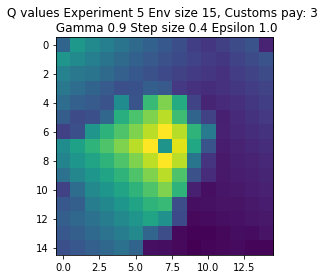

Expr:6 Eps:0 RunnAReward:-43.0 Reward:-857 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-1191.0 Reward:-2396 Timesteps:3210 GotPack:True Utiltime:2053 Customstime:3002 Money:5
Expr:6 Eps:40 RunnAReward:-1018.0 Reward:-79 Timesteps:675 GotPack:False Utiltime:288 Customstime:0 Money:1
Expr:6 Eps:60 RunnAReward:-728.0 Reward:-520 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-829.0 Reward:-586 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-426.0 Reward:-599 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:-120.0 Reward:-489 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:-276.0 Reward:106 Timesteps:450 GotPack:False Utiltime:5 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:36.0 Reward:934 Timesteps:1088 GotPack:True Utiltime:167 Customstime:629 Money:5
Expr:6 Eps:180 RunnAReward:10.0 Re

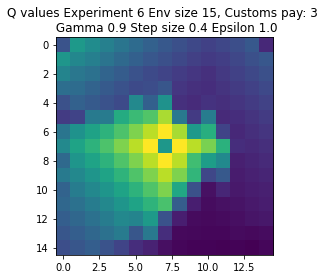

Expr:7 Eps:0 RunnAReward:2.0 Reward:46 Timesteps:450 GotPack:False Utiltime:355 Customstime:0 Money:1
Expr:7 Eps:20 RunnAReward:-949.0 Reward:-602 Timesteps:900 GotPack:False Utiltime:840 Customstime:0 Money:2
Expr:7 Eps:40 RunnAReward:-1051.0 Reward:-3116 Timesteps:4109 GotPack:True Utiltime:1599 Customstime:2193 Money:3
Expr:7 Eps:60 RunnAReward:-1433.0 Reward:-5011 Timesteps:5420 GotPack:True Utiltime:4021 Customstime:4378 Money:5
Expr:7 Eps:80 RunnAReward:-599.0 Reward:226 Timesteps:450 GotPack:False Utiltime:238 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-435.0 Reward:-554 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-633.0 Reward:-1732 Timesteps:2975 GotPack:True Utiltime:1695 Customstime:2342 Money:4
Expr:7 Eps:140 RunnAReward:-274.0 Reward:380 Timesteps:450 GotPack:False Utiltime:232 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:175.0 Reward:342 Timesteps:450 GotPack:False Utiltime:22 Customstime:0 Money:0
Expr:7 Eps:180 RunnA

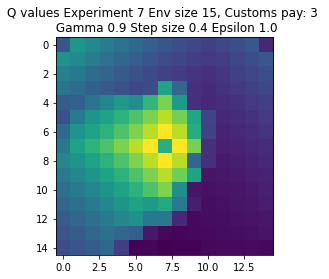

Expr:8 Eps:0 RunnAReward:-12.0 Reward:-225 Timesteps:675 GotPack:False Utiltime:195 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-762.0 Reward:-873 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-554.0 Reward:-898 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-719.0 Reward:-304 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-475.0 Reward:1242 Timesteps:838 GotPack:True Utiltime:532 Customstime:712 Money:3
Expr:8 Eps:100 RunnAReward:-266.0 Reward:141 Timesteps:450 GotPack:False Utiltime:55 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-218.0 Reward:-214 Timesteps:675 GotPack:False Utiltime:181 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:-212.0 Reward:110 Timesteps:450 GotPack:False Utiltime:219 Customstime:0 Money:1
Expr:8 Eps:160 RunnAReward:66.0 Reward:-206 Timesteps:675 GotPack:False Utiltime:24 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:38.0 Rewar

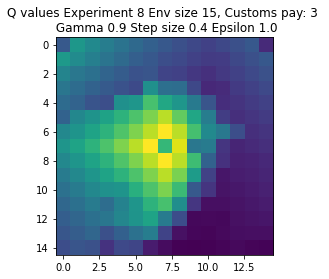

Expr:9 Eps:0 RunnAReward:-40.0 Reward:-786 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-1481.0 Reward:-32 Timesteps:675 GotPack:False Utiltime:151 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-654.0 Reward:-2054 Timesteps:3347 GotPack:True Utiltime:3009 Customstime:3248 Money:5
Expr:9 Eps:60 RunnAReward:-1151.0 Reward:-5636 Timesteps:6233 GotPack:True Utiltime:2664 Customstime:2829 Money:5
Expr:9 Eps:80 RunnAReward:-896.0 Reward:-3334 Timesteps:3882 GotPack:True Utiltime:574 Customstime:1280 Money:3
Expr:9 Eps:100 RunnAReward:-674.0 Reward:-476 Timesteps:675 GotPack:False Utiltime:448 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:-195.0 Reward:942 Timesteps:890 GotPack:True Utiltime:306 Customstime:645 Money:3
Expr:9 Eps:140 RunnAReward:-101.0 Reward:354 Timesteps:450 GotPack:False Utiltime:293 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:44.0 Reward:-221 Timesteps:675 GotPack:False Utiltime:163 Customstime:0 Money:2
Expr:9 Eps:180 R

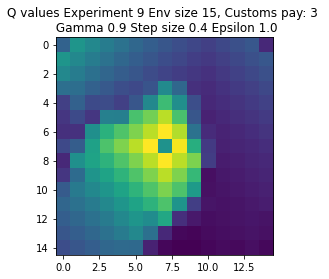

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.9 Step size 0.4 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-3.0 Reward:-51 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-836.0 Reward:-35 Timesteps:675 GotPack:False Utiltime:584 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-1109.0 Reward:-482 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:60 RunnAReward:-964.0 Reward:-892 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:-423.0 Reward:-165 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-389.0 Reward:-249 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:55.0 Reward:591 Timesteps:225 GotPack:False Utiltime:161 Customst

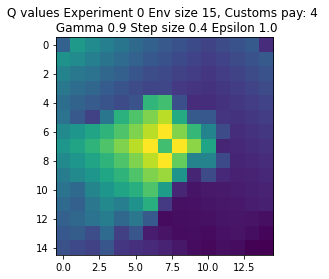

Expr:1 Eps:0 RunnAReward:-13.0 Reward:-249 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-476.0 Reward:434 Timesteps:225 GotPack:False Utiltime:168 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-574.0 Reward:-729 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:60 RunnAReward:-929.0 Reward:-433 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-515.0 Reward:657 Timesteps:225 GotPack:False Utiltime:183 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:10.0 Reward:559 Timesteps:225 GotPack:False Utiltime:54 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:9.0 Reward:-26 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:-33.0 Reward:-235 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:53.0 Reward:-76 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:-51.0 Reward:280 Timestep

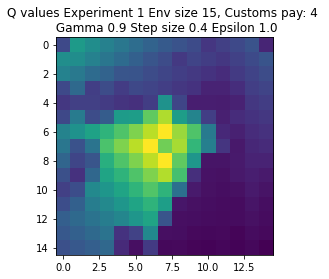

Expr:2 Eps:0 RunnAReward:-16.0 Reward:-315 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-361.0 Reward:-21 Timesteps:675 GotPack:False Utiltime:444 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-589.0 Reward:-238 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-528.0 Reward:-6247 Timesteps:6498 GotPack:True Utiltime:2673 Customstime:2907 Money:4
Expr:2 Eps:80 RunnAReward:-539.0 Reward:630 Timesteps:225 GotPack:False Utiltime:100 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-236.0 Reward:-2779 Timesteps:3525 GotPack:True Utiltime:2564 Customstime:2773 Money:4
Expr:2 Eps:120 RunnAReward:-409.0 Reward:-336 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-108.0 Reward:426 Timesteps:225 GotPack:False Utiltime:72 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:68.0 Reward:-566 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:-32

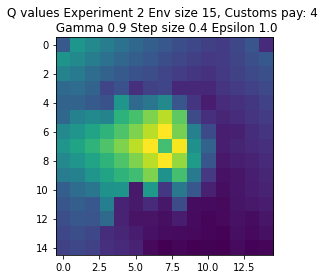

Expr:3 Eps:0 RunnAReward:-21.0 Reward:-415 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-408.0 Reward:-320 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-283.0 Reward:-352 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-941.0 Reward:-10 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-381.0 Reward:-675 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:100 RunnAReward:-172.0 Reward:-1361 Timesteps:2730 GotPack:True Utiltime:923 Customstime:1109 Money:4
Expr:3 Eps:120 RunnAReward:-319.0 Reward:-540 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:72.0 Reward:-251 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:-49.0 Reward:644 Timesteps:225 GotPack:False Utiltime:128 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:289.0 Reward:5

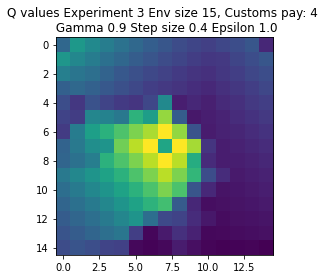

Expr:4 Eps:0 RunnAReward:-31.0 Reward:-608 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-307.0 Reward:-174 Timesteps:450 GotPack:False Utiltime:137 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-806.0 Reward:-450 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:60 RunnAReward:-1058.0 Reward:-574 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:-269.0 Reward:-120 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-282.0 Reward:384 Timesteps:450 GotPack:False Utiltime:101 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:4.0 Reward:-133 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:-267.0 Reward:-771 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:67.0 Reward:-381 Timesteps:1905 GotPack:True Utiltime:61 Customstime:437 Money:4
Expr:4 Eps:180 RunnAReward:77.0 Reward:-80

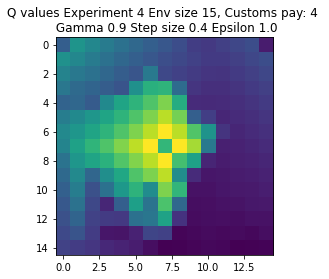

Expr:5 Eps:0 RunnAReward:-14.0 Reward:-270 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-696.0 Reward:330 Timesteps:225 GotPack:False Utiltime:76 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-1285.0 Reward:-3357 Timesteps:4210 GotPack:True Utiltime:2002 Customstime:2306 Money:5
Expr:5 Eps:60 RunnAReward:-392.0 Reward:-241 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-198.0 Reward:-289 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-610.0 Reward:290 Timesteps:225 GotPack:False Utiltime:159 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-87.0 Reward:366 Timesteps:225 GotPack:False Utiltime:60 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:-13.0 Reward:434 Timesteps:225 GotPack:False Utiltime:217 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:68.0 Reward:-280 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:152.0 Rewar

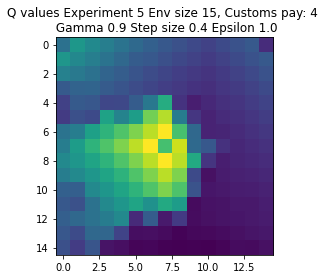

Expr:6 Eps:0 RunnAReward:-18.0 Reward:-352 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-343.0 Reward:-295 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-578.0 Reward:-669 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-702.0 Reward:-119 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-84.0 Reward:360 Timesteps:450 GotPack:False Utiltime:157 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:-317.0 Reward:-240 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-403.0 Reward:-8 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:-21.0 Reward:-1627 Timesteps:2926 GotPack:True Utiltime:2111 Customstime:2658 Money:5
Expr:6 Eps:160 RunnAReward:-62.0 Reward:581 Timesteps:225 GotPack:False Utiltime:150 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:-10.0 Reward:

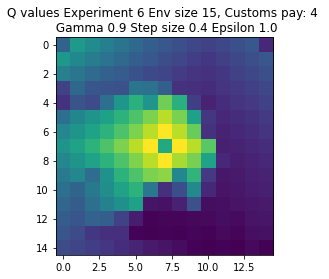

Expr:7 Eps:0 RunnAReward:-17.0 Reward:-321 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-457.0 Reward:-615 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:40 RunnAReward:-475.0 Reward:-888 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:60 RunnAReward:-437.0 Reward:-586 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-611.0 Reward:-370 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-218.0 Reward:-200 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-125.0 Reward:120 Timesteps:450 GotPack:False Utiltime:86 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:-478.0 Reward:-646 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:30.0 Reward:99 Timesteps:450 GotPack:False Utiltime:35 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:-63.0 Reward:-65 Tim

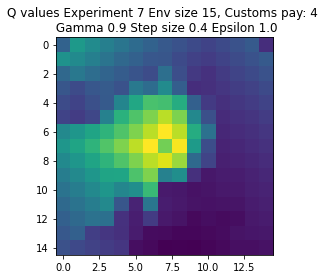

Expr:8 Eps:0 RunnAReward:-1.0 Reward:-14 Timesteps:1260 GotPack:True Utiltime:994 Customstime:1049 Money:4
Expr:8 Eps:20 RunnAReward:-925.0 Reward:-2336 Timesteps:3740 GotPack:True Utiltime:31 Customstime:921 Money:4
Expr:8 Eps:40 RunnAReward:-538.0 Reward:-358 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-153.0 Reward:-325 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-575.0 Reward:-280 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-199.0 Reward:-55 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-112.0 Reward:-617 Timesteps:2108 GotPack:True Utiltime:209 Customstime:741 Money:4
Expr:8 Eps:140 RunnAReward:-6.0 Reward:0 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:-136.0 Reward:-15 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:30.0 Reward:1

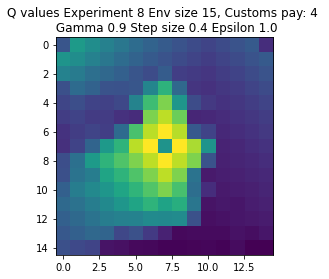

Expr:9 Eps:0 RunnAReward:-19.0 Reward:-379 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-277.0 Reward:-77 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-558.0 Reward:-325 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-929.0 Reward:-5993 Timesteps:6734 GotPack:True Utiltime:5808 Customstime:5893 Money:4
Expr:9 Eps:80 RunnAReward:-807.0 Reward:138 Timesteps:450 GotPack:False Utiltime:112 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:-215.0 Reward:-273 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-206.0 Reward:-298 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:54.0 Reward:-145 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:-159.0 Reward:-105 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:221.0 Reward

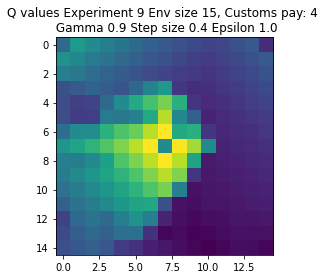

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.9 Step size 0.5 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-20.0 Reward:-388 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-1109.0 Reward:-257 Timesteps:1817 GotPack:True Utiltime:283 Customstime:541 Money:3
Expr:0 Eps:40 RunnAReward:-137.0 Reward:51 Timesteps:450 GotPack:False Utiltime:24 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-158.0 Reward:113 Timesteps:1680 GotPack:True Utiltime:1295 Customstime:1495 Money:4
Expr:0 Eps:80 RunnAReward:144.0 Reward:-202 Timesteps:675 GotPack:False Utiltime:88 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:382.0 Reward:1375 Timesteps:682 GotPack:True Utiltime:116 Customstime:571 Money:3
Expr:0 Eps:120 RunnAReward:559.0 Reward:313 Timesteps:450 GotPack:False Utiltime:

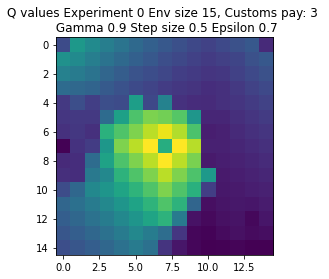

Expr:1 Eps:0 RunnAReward:-35.0 Reward:-688 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-840.0 Reward:-777 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:40 RunnAReward:-805.0 Reward:-1255 Timesteps:2651 GotPack:True Utiltime:1836 Customstime:2048 Money:5
Expr:1 Eps:60 RunnAReward:-207.0 Reward:-529 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:-335.0 Reward:-728 Timesteps:2620 GotPack:True Utiltime:228 Customstime:652 Money:3
Expr:1 Eps:100 RunnAReward:372.0 Reward:977 Timesteps:1019 GotPack:True Utiltime:104 Customstime:535 Money:4
Expr:1 Eps:120 RunnAReward:843.0 Reward:931 Timesteps:1020 GotPack:True Utiltime:842 Customstime:946 Money:3
Expr:1 Eps:140 RunnAReward:558.0 Reward:187 Timesteps:450 GotPack:False Utiltime:49 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:910.0 Reward:-65 Timesteps:675 GotPack:False Utiltime:52 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:598.

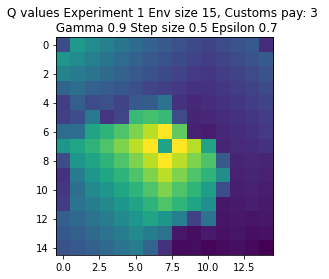

Expr:2 Eps:0 RunnAReward:-30.0 Reward:-588 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-1118.0 Reward:-976 Timesteps:2079 GotPack:True Utiltime:1567 Customstime:1704 Money:3
Expr:2 Eps:40 RunnAReward:-336.0 Reward:-303 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-117.0 Reward:391 Timesteps:450 GotPack:False Utiltime:228 Customstime:0 Money:1
Expr:2 Eps:80 RunnAReward:210.0 Reward:102 Timesteps:675 GotPack:False Utiltime:289 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:528.0 Reward:247 Timesteps:450 GotPack:False Utiltime:71 Customstime:0 Money:1
Expr:2 Eps:120 RunnAReward:397.0 Reward:1423 Timesteps:641 GotPack:True Utiltime:98 Customstime:554 Money:3
Expr:2 Eps:140 RunnAReward:639.0 Reward:295 Timesteps:450 GotPack:False Utiltime:91 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:424.0 Reward:-59 Timesteps:675 GotPack:False Utiltime:82 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:668.0 Rewar

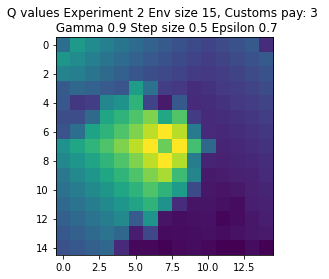

Expr:3 Eps:0 RunnAReward:33.0 Reward:677 Timesteps:953 GotPack:True Utiltime:182 Customstime:308 Money:5
Expr:3 Eps:20 RunnAReward:-746.0 Reward:169 Timesteps:1308 GotPack:True Utiltime:128 Customstime:349 Money:5
Expr:3 Eps:40 RunnAReward:-428.0 Reward:-79 Timesteps:675 GotPack:False Utiltime:253 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-27.0 Reward:-861 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:-76.0 Reward:-522 Timesteps:1974 GotPack:True Utiltime:42 Customstime:121 Money:3
Expr:3 Eps:100 RunnAReward:170.0 Reward:153 Timesteps:450 GotPack:False Utiltime:224 Customstime:0 Money:1
Expr:3 Eps:120 RunnAReward:65.0 Reward:-121 Timesteps:675 GotPack:False Utiltime:88 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:270.0 Reward:256 Timesteps:1563 GotPack:True Utiltime:105 Customstime:345 Money:4
Expr:3 Eps:160 RunnAReward:378.0 Reward:341 Timesteps:450 GotPack:False Utiltime:44 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:844.0 Rewar

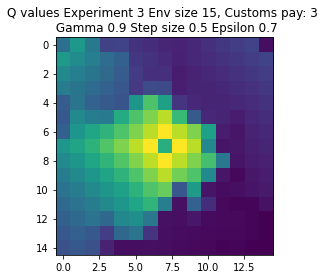

Expr:4 Eps:0 RunnAReward:-19.0 Reward:-371 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-847.0 Reward:-40 Timesteps:1738 GotPack:True Utiltime:1199 Customstime:1393 Money:4
Expr:4 Eps:40 RunnAReward:-498.0 Reward:-1453 Timesteps:2760 GotPack:True Utiltime:1906 Customstime:2687 Money:5
Expr:4 Eps:60 RunnAReward:-325.0 Reward:344 Timesteps:450 GotPack:False Utiltime:306 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:128.0 Reward:54 Timesteps:1719 GotPack:True Utiltime:1594 Customstime:1659 Money:4
Expr:4 Eps:100 RunnAReward:462.0 Reward:152 Timesteps:450 GotPack:False Utiltime:54 Customstime:0 Money:1
Expr:4 Eps:120 RunnAReward:398.0 Reward:302 Timesteps:1459 GotPack:True Utiltime:475 Customstime:804 Money:5
Expr:4 Eps:140 RunnAReward:430.0 Reward:1625 Timesteps:477 GotPack:True Utiltime:158 Customstime:371 Money:4
Expr:4 Eps:160 RunnAReward:799.0 Reward:170 Timesteps:450 GotPack:False Utiltime:46 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward

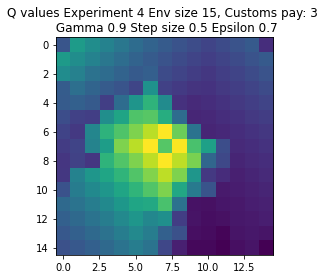

Expr:5 Eps:0 RunnAReward:-48.0 Reward:-948 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-791.0 Reward:-688 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-85.0 Reward:-215 Timesteps:675 GotPack:False Utiltime:398 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-8.0 Reward:1280 Timesteps:810 GotPack:True Utiltime:83 Customstime:285 Money:3
Expr:5 Eps:80 RunnAReward:350.0 Reward:-676 Timesteps:2189 GotPack:True Utiltime:68 Customstime:689 Money:4
Expr:5 Eps:100 RunnAReward:71.0 Reward:-264 Timesteps:900 GotPack:False Utiltime:144 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:343.0 Reward:299 Timesteps:450 GotPack:False Utiltime:33 Customstime:0 Money:1
Expr:5 Eps:140 RunnAReward:617.0 Reward:1195 Timesteps:860 GotPack:True Utiltime:74 Customstime:301 Money:5
Expr:5 Eps:160 RunnAReward:839.0 Reward:287 Timesteps:450 GotPack:False Utiltime:110 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:709.0 Reward:1

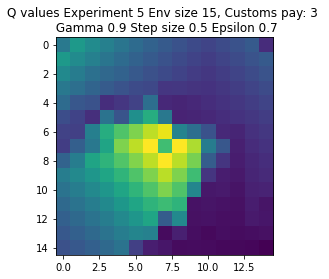

Expr:6 Eps:0 RunnAReward:-30.0 Reward:-585 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-493.0 Reward:426 Timesteps:1430 GotPack:True Utiltime:1019 Customstime:1127 Money:5
Expr:6 Eps:40 RunnAReward:-421.0 Reward:274 Timesteps:450 GotPack:False Utiltime:282 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-108.0 Reward:1294 Timesteps:765 GotPack:True Utiltime:377 Customstime:671 Money:3
Expr:6 Eps:80 RunnAReward:105.0 Reward:324 Timesteps:450 GotPack:False Utiltime:74 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-5.0 Reward:-404 Timesteps:900 GotPack:False Utiltime:95 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:512.0 Reward:1665 Timesteps:372 GotPack:True Utiltime:121 Customstime:232 Money:5
Expr:6 Eps:140 RunnAReward:441.0 Reward:290 Timesteps:450 GotPack:False Utiltime:48 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:640.0 Reward:287 Timesteps:450 GotPack:False Utiltime:90 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:325.0 Rewa

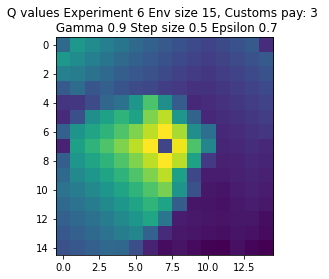

Expr:7 Eps:0 RunnAReward:-48.0 Reward:-959 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-845.0 Reward:-442 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-209.0 Reward:311 Timesteps:450 GotPack:False Utiltime:156 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-158.0 Reward:283 Timesteps:1512 GotPack:True Utiltime:8 Customstime:342 Money:5
Expr:7 Eps:80 RunnAReward:268.0 Reward:753 Timesteps:999 GotPack:True Utiltime:36 Customstime:941 Money:3
Expr:7 Eps:100 RunnAReward:542.0 Reward:1589 Timesteps:477 GotPack:True Utiltime:189 Customstime:393 Money:5
Expr:7 Eps:120 RunnAReward:589.0 Reward:353 Timesteps:450 GotPack:False Utiltime:293 Customstime:0 Money:1
Expr:7 Eps:140 RunnAReward:322.0 Reward:17 Timesteps:675 GotPack:False Utiltime:17 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:259.0 Reward:142 Timesteps:675 GotPack:False Utiltime:267 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:454.0 Reward:15

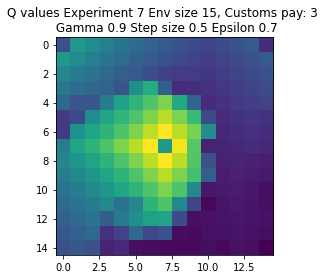

Expr:8 Eps:0 RunnAReward:-27.0 Reward:-533 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:20 RunnAReward:-1123.0 Reward:-428 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-212.0 Reward:-290 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:64.0 Reward:268 Timesteps:450 GotPack:False Utiltime:93 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:272.0 Reward:805 Timesteps:1086 GotPack:True Utiltime:525 Customstime:653 Money:3
Expr:8 Eps:100 RunnAReward:335.0 Reward:17 Timesteps:675 GotPack:False Utiltime:72 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:232.0 Reward:754 Timesteps:937 GotPack:True Utiltime:57 Customstime:528 Money:5
Expr:8 Eps:140 RunnAReward:526.0 Reward:386 Timesteps:450 GotPack:False Utiltime:86 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:855.0 Reward:1665 Timesteps:451 GotPack:True Utiltime:97 Customstime:393 Money:3
Expr:8 Eps:180 RunnAReward:644.0 Reward:453 T

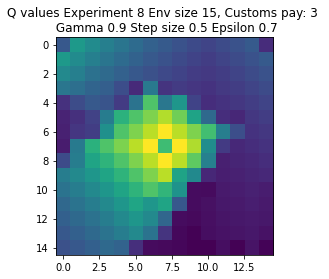

Expr:9 Eps:0 RunnAReward:-31.0 Reward:-607 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-926.0 Reward:-2490 Timesteps:3728 GotPack:True Utiltime:1253 Customstime:1872 Money:5
Expr:9 Eps:40 RunnAReward:-594.0 Reward:-1169 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-91.0 Reward:-80 Timesteps:675 GotPack:False Utiltime:11 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:51.0 Reward:287 Timesteps:450 GotPack:False Utiltime:18 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:31.0 Reward:-657 Timesteps:1125 GotPack:False Utiltime:115 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:310.0 Reward:295 Timesteps:450 GotPack:False Utiltime:54 Customstime:0 Money:1
Expr:9 Eps:140 RunnAReward:610.0 Reward:259 Timesteps:450 GotPack:False Utiltime:32 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:832.0 Reward:7 Timesteps:675 GotPack:False Utiltime:49 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:444.0 Reward:-19

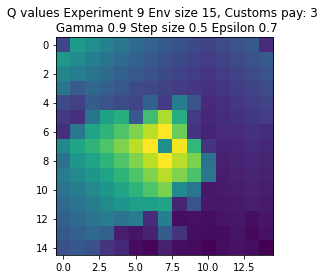

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.9 Step size 0.5 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-3.0 Reward:-46 Timesteps:450 GotPack:False Utiltime:83 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-516.0 Reward:-455 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-402.0 Reward:-83 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:56.0 Reward:-136 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:140.0 Reward:408 Timesteps:225 GotPack:False Utiltime:86 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:171.0 Reward:-538 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:120 RunnAReward:343.0 Reward:424 Timesteps:225 GotPack:False Utiltime:79 Customstime:0 

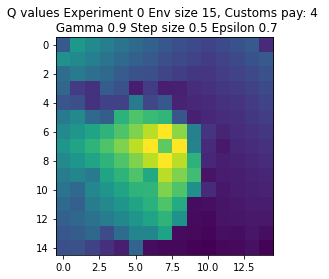

Expr:1 Eps:0 RunnAReward:-171.0 Reward:-3418 Timesteps:4242 GotPack:True Utiltime:3656 Customstime:3781 Money:4
Expr:1 Eps:20 RunnAReward:-558.0 Reward:178 Timesteps:450 GotPack:False Utiltime:218 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-118.0 Reward:622 Timesteps:225 GotPack:False Utiltime:137 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:37.0 Reward:-69 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:206.0 Reward:27 Timesteps:1383 GotPack:True Utiltime:687 Customstime:1202 Money:5
Expr:1 Eps:100 RunnAReward:-163.0 Reward:662 Timesteps:225 GotPack:False Utiltime:162 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:221.0 Reward:-393 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:140 RunnAReward:346.0 Reward:1868 Timesteps:325 GotPack:True Utiltime:82 Customstime:273 Money:4
Expr:1 Eps:160 RunnAReward:685.0 Reward:581 Timesteps:225 GotPack:False Utiltime:91 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:681.0 Re

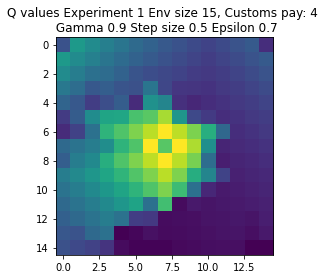

Expr:2 Eps:0 RunnAReward:-9.0 Reward:-176 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-432.0 Reward:-593 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-258.0 Reward:-29 Timesteps:1836 GotPack:True Utiltime:955 Customstime:1133 Money:5
Expr:2 Eps:60 RunnAReward:219.0 Reward:-32 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:223.0 Reward:1542 Timesteps:390 GotPack:True Utiltime:294 Customstime:338 Money:5
Expr:2 Eps:100 RunnAReward:264.0 Reward:-29 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:36.0 Reward:179 Timesteps:1674 GotPack:True Utiltime:891 Customstime:965 Money:4
Expr:2 Eps:140 RunnAReward:407.0 Reward:1308 Timesteps:620 GotPack:True Utiltime:61 Customstime:268 Money:5
Expr:2 Eps:160 RunnAReward:605.0 Reward:218 Timesteps:450 GotPack:False Utiltime:65 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:426.0 Reward:34

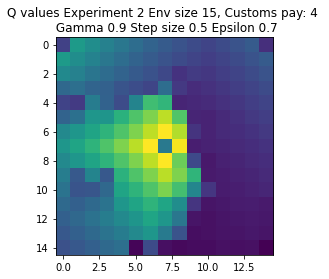

Expr:3 Eps:0 RunnAReward:-31.0 Reward:-604 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-340.0 Reward:40 Timesteps:450 GotPack:False Utiltime:132 Customstime:0 Money:2
Expr:3 Eps:40 RunnAReward:-280.0 Reward:-107 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:21.0 Reward:-33 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:8.0 Reward:-60 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:108.0 Reward:405 Timesteps:225 GotPack:False Utiltime:141 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:386.0 Reward:487 Timesteps:225 GotPack:False Utiltime:74 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:349.0 Reward:414 Timesteps:225 GotPack:False Utiltime:27 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:199.0 Reward:-62 Timesteps:675 GotPack:False Utiltime:224 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:507.0 Reward:291 Timesteps

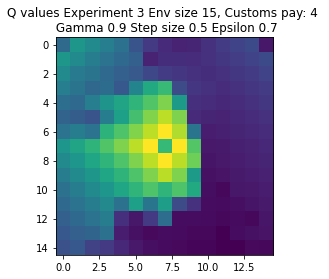

Expr:4 Eps:0 RunnAReward:-319.0 Reward:-6373 Timesteps:6750 GotPack:False Utiltime:4142 Customstime:5435 Money:5
Expr:4 Eps:20 RunnAReward:-763.0 Reward:-588 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:40 RunnAReward:-618.0 Reward:-2132 Timesteps:3372 GotPack:True Utiltime:1096 Customstime:1740 Money:5
Expr:4 Eps:60 RunnAReward:-93.0 Reward:-60 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:512.0 Reward:387 Timesteps:225 GotPack:False Utiltime:75 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:419.0 Reward:665 Timesteps:225 GotPack:False Utiltime:157 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:224.0 Reward:121 Timesteps:450 GotPack:False Utiltime:22 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:476.0 Reward:-45 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:364.0 Reward:323 Timesteps:225 GotPack:False Utiltime:111 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:368.0 R

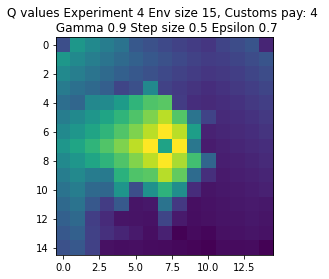

Expr:5 Eps:0 RunnAReward:-35.0 Reward:-699 Timesteps:1850 GotPack:True Utiltime:646 Customstime:1141 Money:4
Expr:5 Eps:20 RunnAReward:-275.0 Reward:316 Timesteps:450 GotPack:False Utiltime:87 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-441.0 Reward:54 Timesteps:450 GotPack:False Utiltime:159 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-184.0 Reward:91 Timesteps:450 GotPack:False Utiltime:64 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:-129.0 Reward:276 Timesteps:225 GotPack:False Utiltime:15 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:177.0 Reward:375 Timesteps:450 GotPack:False Utiltime:58 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:284.0 Reward:352 Timesteps:225 GotPack:False Utiltime:73 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:479.0 Reward:547 Timesteps:225 GotPack:False Utiltime:62 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:293.0 Reward:555 Timesteps:225 GotPack:False Utiltime:46 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:544.0 Reward:938 

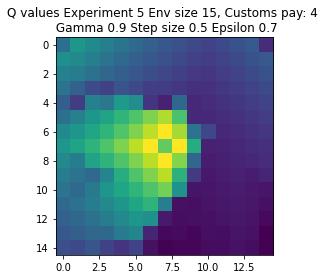

Expr:6 Eps:0 RunnAReward:-13.0 Reward:-259 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-785.0 Reward:-328 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-209.0 Reward:-85 Timesteps:1793 GotPack:True Utiltime:67 Customstime:683 Money:5
Expr:6 Eps:60 RunnAReward:204.0 Reward:-75 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-47.0 Reward:154 Timesteps:450 GotPack:False Utiltime:57 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:215.0 Reward:-60 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:247.0 Reward:102 Timesteps:1626 GotPack:True Utiltime:625 Customstime:1163 Money:4
Expr:6 Eps:140 RunnAReward:382.0 Reward:336 Timesteps:225 GotPack:False Utiltime:37 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:620.0 Reward:233 Timesteps:450 GotPack:False Utiltime:48 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:496.0 Reward:931 Ti

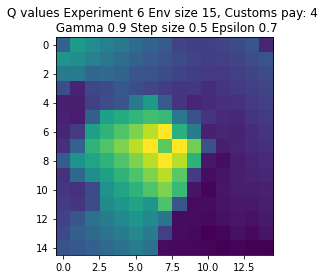

Expr:7 Eps:0 RunnAReward:-2.0 Reward:-24 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-641.0 Reward:448 Timesteps:1208 GotPack:True Utiltime:815 Customstime:915 Money:5
Expr:7 Eps:40 RunnAReward:-133.0 Reward:269 Timesteps:1298 GotPack:True Utiltime:13 Customstime:692 Money:5
Expr:7 Eps:60 RunnAReward:-219.0 Reward:-349 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-49.0 Reward:412 Timesteps:450 GotPack:False Utiltime:189 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:157.0 Reward:597 Timesteps:225 GotPack:False Utiltime:185 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:440.0 Reward:667 Timesteps:225 GotPack:False Utiltime:19 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:412.0 Reward:1143 Timesteps:695 GotPack:True Utiltime:107 Customstime:589 Money:4
Expr:7 Eps:160 RunnAReward:586.0 Reward:1249 Timesteps:682 GotPack:True Utiltime:50 Customstime:364 Money:4
Expr:7 Eps:180 RunnAReward:533.0 Reward

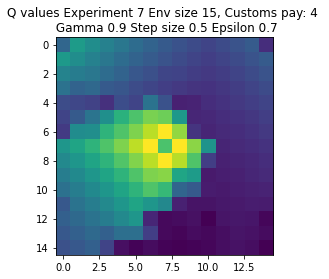

Expr:8 Eps:0 RunnAReward:-83.0 Reward:-1648 Timesteps:2986 GotPack:True Utiltime:1467 Customstime:2027 Money:4
Expr:8 Eps:20 RunnAReward:-702.0 Reward:-1750 Timesteps:2961 GotPack:True Utiltime:756 Customstime:931 Money:4
Expr:8 Eps:40 RunnAReward:-373.0 Reward:0 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-300.0 Reward:-73 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:96.0 Reward:333 Timesteps:225 GotPack:False Utiltime:59 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:380.0 Reward:-91 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:170.0 Reward:47 Timesteps:675 GotPack:False Utiltime:72 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:399.0 Reward:579 Timesteps:225 GotPack:False Utiltime:99 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:255.0 Reward:270 Timesteps:450 GotPack:False Utiltime:74 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:422.0 Reward:262 

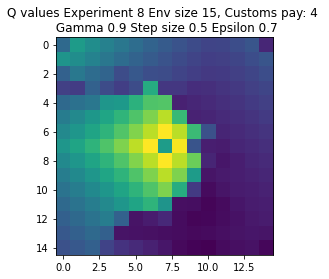

Expr:9 Eps:0 RunnAReward:2.0 Reward:54 Timesteps:450 GotPack:False Utiltime:150 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-249.0 Reward:-470 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-353.0 Reward:-147 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-337.0 Reward:-45 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:11.0 Reward:-133 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:270.0 Reward:622 Timesteps:1215 GotPack:True Utiltime:14 Customstime:698 Money:4
Expr:9 Eps:120 RunnAReward:266.0 Reward:405 Timesteps:225 GotPack:False Utiltime:90 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:488.0 Reward:226 Timesteps:450 GotPack:False Utiltime:91 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:540.0 Reward:1411 Timesteps:712 GotPack:True Utiltime:584 Customstime:602 Money:5
Expr:9 Eps:180 RunnAReward:603.0 Reward:868 Time

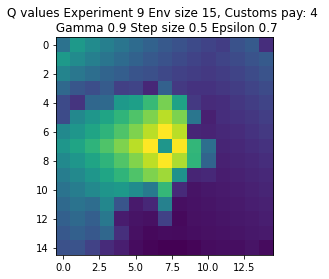

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.9 Step size 0.5 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:5.0 Reward:102 Timesteps:450 GotPack:False Utiltime:22 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-638.0 Reward:-933 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-681.0 Reward:-465 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:60 RunnAReward:-812.0 Reward:-3658 Timesteps:4503 GotPack:True Utiltime:3372 Customstime:4176 Money:3
Expr:0 Eps:80 RunnAReward:-278.0 Reward:107 Timesteps:450 GotPack:False Utiltime:346 Customstime:0 Money:1
Expr:0 Eps:100 RunnAReward:-65.0 Reward:-394 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:188.0 Reward:276 Timesteps:450 GotPack:False Utiltime:96 Cus

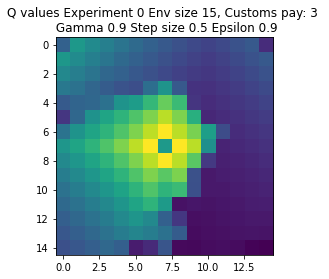

Expr:1 Eps:0 RunnAReward:-16.0 Reward:-312 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-722.0 Reward:-3690 Timesteps:4429 GotPack:True Utiltime:2228 Customstime:3166 Money:3
Expr:1 Eps:40 RunnAReward:-1000.0 Reward:-930 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:60 RunnAReward:-574.0 Reward:-389 Timesteps:675 GotPack:False Utiltime:37 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:-324.0 Reward:-27 Timesteps:450 GotPack:False Utiltime:339 Customstime:0 Money:1
Expr:1 Eps:100 RunnAReward:-100.0 Reward:74 Timesteps:450 GotPack:False Utiltime:198 Customstime:0 Money:1
Expr:1 Eps:120 RunnAReward:-157.0 Reward:-410 Timesteps:900 GotPack:False Utiltime:91 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:-11.0 Reward:338 Timesteps:450 GotPack:False Utiltime:313 Customstime:0 Money:1
Expr:1 Eps:160 RunnAReward:362.0 Reward:65 Timesteps:675 GotPack:False Utiltime:138 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:439.0 R

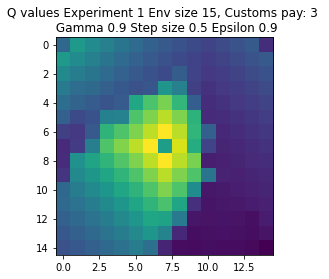

Expr:2 Eps:0 RunnAReward:-35.0 Reward:-686 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:20 RunnAReward:-618.0 Reward:4 Timesteps:1664 GotPack:True Utiltime:278 Customstime:362 Money:3
Expr:2 Eps:40 RunnAReward:-726.0 Reward:-573 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:60 RunnAReward:-618.0 Reward:-904 Timesteps:2317 GotPack:True Utiltime:350 Customstime:764 Money:5
Expr:2 Eps:80 RunnAReward:-371.0 Reward:21 Timesteps:450 GotPack:False Utiltime:372 Customstime:0 Money:1
Expr:2 Eps:100 RunnAReward:-66.0 Reward:179 Timesteps:1216 GotPack:True Utiltime:10 Customstime:327 Money:4
Expr:2 Eps:120 RunnAReward:2.0 Reward:-68 Timesteps:675 GotPack:False Utiltime:15 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:378.0 Reward:1508 Timesteps:624 GotPack:True Utiltime:88 Customstime:440 Money:5
Expr:2 Eps:160 RunnAReward:111.0 Reward:-69 Timesteps:675 GotPack:False Utiltime:139 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:98.0 Reward:5

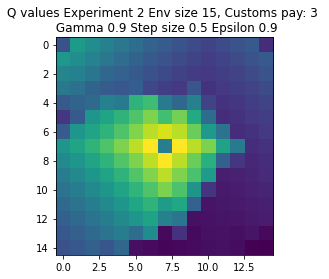

Expr:3 Eps:0 RunnAReward:-24.0 Reward:-466 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-1136.0 Reward:-989 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:40 RunnAReward:-727.0 Reward:-741 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-326.0 Reward:-445 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-290.0 Reward:-999 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:-306.0 Reward:-670 Timesteps:1955 GotPack:True Utiltime:284 Customstime:1380 Money:3
Expr:3 Eps:120 RunnAReward:14.0 Reward:1102 Timesteps:696 GotPack:True Utiltime:234 Customstime:501 Money:3
Expr:3 Eps:140 RunnAReward:168.0 Reward:132 Timesteps:450 GotPack:False Utiltime:96 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:250.0 Reward:256 Timesteps:450 GotPack:False Utiltime:200 Customstime:0 Money:1
Expr:3 Eps:180 RunnAReward:413.0 Rewar

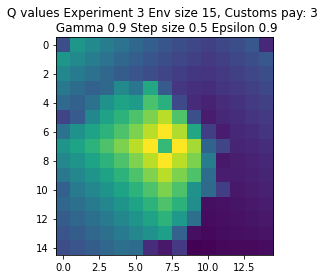

Expr:4 Eps:0 RunnAReward:-29.0 Reward:-571 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-537.0 Reward:-36 Timesteps:675 GotPack:False Utiltime:326 Customstime:0 Money:1
Expr:4 Eps:40 RunnAReward:-541.0 Reward:333 Timesteps:450 GotPack:False Utiltime:179 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-569.0 Reward:-266 Timesteps:1737 GotPack:True Utiltime:1108 Customstime:1606 Money:3
Expr:4 Eps:80 RunnAReward:-204.0 Reward:132 Timesteps:450 GotPack:False Utiltime:57 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:5.0 Reward:85 Timesteps:450 GotPack:False Utiltime:139 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:200.0 Reward:283 Timesteps:450 GotPack:False Utiltime:65 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:318.0 Reward:13 Timesteps:675 GotPack:False Utiltime:393 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:326.0 Reward:1200 Timesteps:860 GotPack:True Utiltime:171 Customstime:334 Money:3
Expr:4 Eps:180 RunnAReward:298.0 Reward

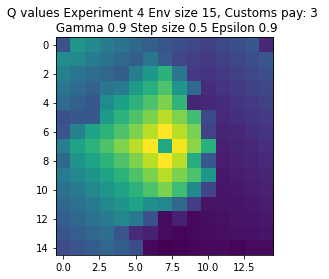

Expr:5 Eps:0 RunnAReward:-23.0 Reward:-456 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-1041.0 Reward:310 Timesteps:450 GotPack:False Utiltime:190 Customstime:0 Money:1
Expr:5 Eps:40 RunnAReward:-1217.0 Reward:193 Timesteps:450 GotPack:False Utiltime:196 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-400.0 Reward:-290 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-254.0 Reward:-259 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:9.0 Reward:139 Timesteps:450 GotPack:False Utiltime:78 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:214.0 Reward:195 Timesteps:1582 GotPack:True Utiltime:199 Customstime:651 Money:3
Expr:5 Eps:140 RunnAReward:510.0 Reward:391 Timesteps:450 GotPack:False Utiltime:198 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:602.0 Reward:312 Timesteps:450 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:452.0 Reward:35

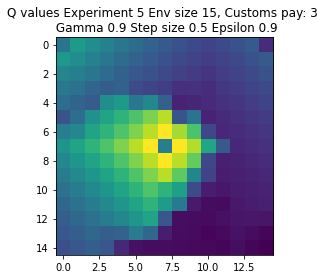

Expr:6 Eps:0 RunnAReward:-26.0 Reward:-505 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-533.0 Reward:-559 Timesteps:2047 GotPack:True Utiltime:1393 Customstime:1459 Money:3
Expr:6 Eps:40 RunnAReward:-813.0 Reward:-897 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-1023.0 Reward:315 Timesteps:450 GotPack:False Utiltime:418 Customstime:0 Money:1
Expr:6 Eps:80 RunnAReward:-312.0 Reward:377 Timesteps:450 GotPack:False Utiltime:432 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:102.0 Reward:309 Timesteps:450 GotPack:False Utiltime:76 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:223.0 Reward:317 Timesteps:450 GotPack:False Utiltime:106 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:339.0 Reward:1266 Timesteps:862 GotPack:True Utiltime:95 Customstime:340 Money:4
Expr:6 Eps:160 RunnAReward:353.0 Reward:123 Timesteps:450 GotPack:False Utiltime:35 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:249.0 Rew

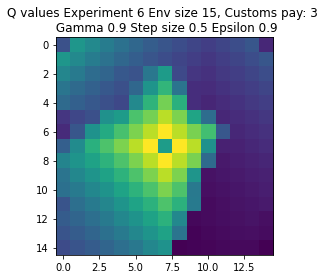

Expr:7 Eps:0 RunnAReward:-39.0 Reward:-766 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-1218.0 Reward:-338 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-527.0 Reward:-555 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-661.0 Reward:-1183 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-113.0 Reward:424 Timesteps:450 GotPack:False Utiltime:152 Customstime:0 Money:1
Expr:7 Eps:100 RunnAReward:-14.0 Reward:1251 Timesteps:811 GotPack:True Utiltime:29 Customstime:656 Money:5
Expr:7 Eps:120 RunnAReward:98.0 Reward:286 Timesteps:1648 GotPack:True Utiltime:12 Customstime:1564 Money:5
Expr:7 Eps:140 RunnAReward:169.0 Reward:108 Timesteps:675 GotPack:False Utiltime:204 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:327.0 Reward:-157 Timesteps:675 GotPack:False Utiltime:170 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:508.0 Rewar

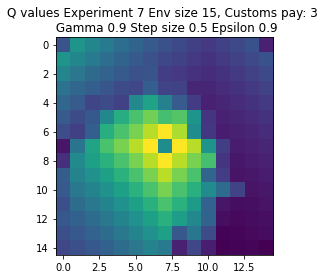

Expr:8 Eps:0 RunnAReward:-41.0 Reward:-801 Timesteps:2040 GotPack:True Utiltime:1120 Customstime:1521 Money:3
Expr:8 Eps:20 RunnAReward:-568.0 Reward:-812 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-758.0 Reward:780 Timesteps:1137 GotPack:True Utiltime:193 Customstime:610 Money:4
Expr:8 Eps:60 RunnAReward:-566.0 Reward:346 Timesteps:450 GotPack:False Utiltime:309 Customstime:0 Money:1
Expr:8 Eps:80 RunnAReward:-318.0 Reward:64 Timesteps:450 GotPack:False Utiltime:217 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:263.0 Reward:-175 Timesteps:900 GotPack:False Utiltime:108 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:315.0 Reward:-603 Timesteps:675 GotPack:False Utiltime:114 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:-3.0 Reward:91 Timesteps:1472 GotPack:True Utiltime:1209 Customstime:1263 Money:4
Expr:8 Eps:160 RunnAReward:203.0 Reward:88 Timesteps:450 GotPack:False Utiltime:75 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:168.0

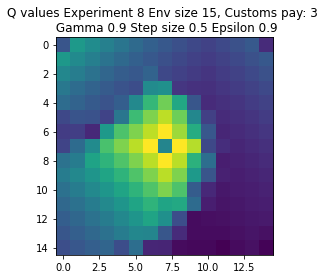

Expr:9 Eps:0 RunnAReward:-49.0 Reward:-980 Timesteps:2247 GotPack:True Utiltime:1426 Customstime:2043 Money:3
Expr:9 Eps:20 RunnAReward:-887.0 Reward:-6146 Timesteps:5661 GotPack:True Utiltime:1746 Customstime:2138 Money:5
Expr:9 Eps:40 RunnAReward:-583.0 Reward:-20 Timesteps:1646 GotPack:True Utiltime:1455 Customstime:1597 Money:3
Expr:9 Eps:60 RunnAReward:-306.0 Reward:258 Timesteps:450 GotPack:False Utiltime:96 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-45.0 Reward:367 Timesteps:450 GotPack:False Utiltime:164 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:101.0 Reward:284 Timesteps:450 GotPack:False Utiltime:77 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-50.0 Reward:-824 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:388.0 Reward:185 Timesteps:450 GotPack:False Utiltime:108 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:103.0 Reward:126 Timesteps:675 GotPack:False Utiltime:105 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:3

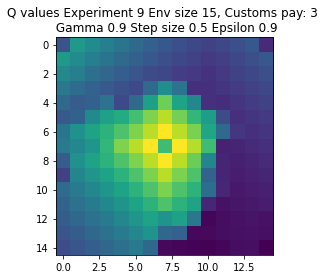

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.9 Step size 0.5 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-31.0 Reward:-614 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-559.0 Reward:-325 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-239.0 Reward:-66 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-237.0 Reward:-175 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-323.0 Reward:555 Timesteps:225 GotPack:False Utiltime:107 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-133.0 Reward:-80 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:-41.0 Reward:-59 Timesteps:225 GotPack:False Utiltime:0 Customstim

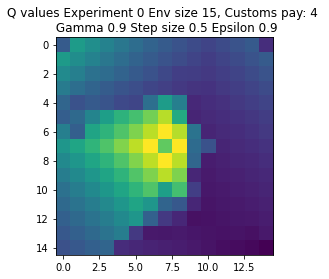

Expr:1 Eps:0 RunnAReward:-27.0 Reward:-523 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-358.0 Reward:-559 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-346.0 Reward:314 Timesteps:225 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-473.0 Reward:1421 Timesteps:648 GotPack:True Utiltime:163 Customstime:604 Money:4
Expr:1 Eps:80 RunnAReward:-281.0 Reward:-112 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:20.0 Reward:405 Timesteps:225 GotPack:False Utiltime:112 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:62.0 Reward:240 Timesteps:450 GotPack:False Utiltime:113 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:-33.0 Reward:-469 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:160 RunnAReward:-57.0 Reward:602 Timesteps:225 GotPack:False Utiltime:182 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:268.0 Reward:566 

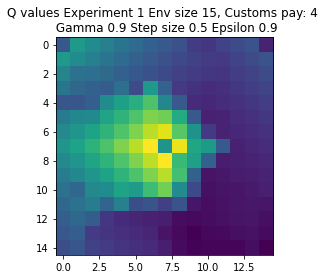

Expr:2 Eps:0 RunnAReward:-8.0 Reward:-145 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-255.0 Reward:-195 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-197.0 Reward:-785 Timesteps:2008 GotPack:True Utiltime:1596 Customstime:1961 Money:5
Expr:2 Eps:60 RunnAReward:-285.0 Reward:-380 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-431.0 Reward:72 Timesteps:450 GotPack:False Utiltime:56 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:185.0 Reward:290 Timesteps:225 GotPack:False Utiltime:55 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-21.0 Reward:385 Timesteps:225 GotPack:False Utiltime:14 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:316.0 Reward:209 Timesteps:450 GotPack:False Utiltime:71 Customstime:0 Money:2
Expr:2 Eps:160 RunnAReward:301.0 Reward:1045 Timesteps:802 GotPack:True Utiltime:83 Customstime:255 Money:5
Expr:2 Eps:180 RunnAReward:390.0 Reward:56

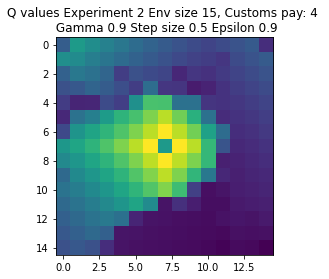

Expr:3 Eps:0 RunnAReward:-4.0 Reward:-64 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-625.0 Reward:-532 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:40 RunnAReward:-182.0 Reward:-659 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:60 RunnAReward:-454.0 Reward:404 Timesteps:225 GotPack:False Utiltime:219 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-507.0 Reward:-371 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:59.0 Reward:-279 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:178.0 Reward:-608 Timesteps:2006 GotPack:True Utiltime:45 Customstime:960 Money:5
Expr:3 Eps:140 RunnAReward:45.0 Reward:-189 Timesteps:675 GotPack:False Utiltime:89 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:165.0 Reward:406 Timesteps:225 GotPack:False Utiltime:159 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:291.0 Reward:202 Ti

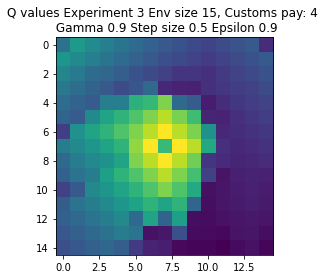

Expr:4 Eps:0 RunnAReward:-14.0 Reward:-275 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-620.0 Reward:-629 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-116.0 Reward:420 Timesteps:225 GotPack:False Utiltime:83 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-268.0 Reward:-233 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:38.0 Reward:410 Timesteps:225 GotPack:False Utiltime:2 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-285.0 Reward:-56 Timesteps:450 GotPack:False Utiltime:182 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:142.0 Reward:-108 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:256.0 Reward:434 Timesteps:225 GotPack:False Utiltime:14 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:25.0 Reward:-37 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:301.0 Reward:343 Timeste

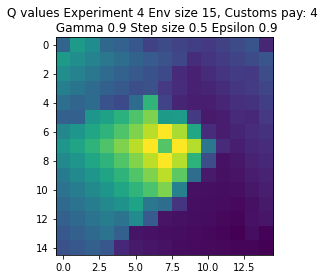

Expr:5 Eps:0 RunnAReward:-4.0 Reward:-78 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-737.0 Reward:-75 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-329.0 Reward:16 Timesteps:675 GotPack:False Utiltime:306 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-235.0 Reward:526 Timesteps:1145 GotPack:True Utiltime:232 Customstime:851 Money:5
Expr:5 Eps:80 RunnAReward:-146.0 Reward:-52 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:182.0 Reward:275 Timesteps:225 GotPack:False Utiltime:145 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:138.0 Reward:-367 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:106.0 Reward:-33 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:207.0 Reward:96 Timesteps:450 GotPack:False Utiltime:140 Customstime:0 Money:2
Expr:5 Eps:180 RunnAReward:138.0 Reward:77 Timest

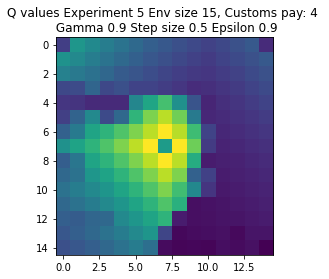

Expr:6 Eps:0 RunnAReward:-18.0 Reward:-360 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-636.0 Reward:-565 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-361.0 Reward:-138 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-448.0 Reward:-361 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:-293.0 Reward:-201 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-321.0 Reward:-958 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:-139.0 Reward:-659 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:7.0 Reward:-30 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:278.0 Reward:391 Timesteps:225 GotPack:False Utiltime:16 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:168.0 Reward:-695 Time

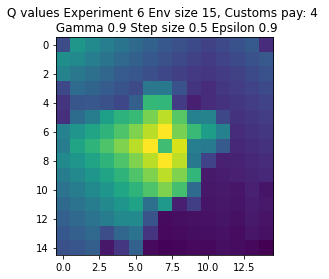

Expr:7 Eps:0 RunnAReward:-14.0 Reward:-270 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-1159.0 Reward:-3776 Timesteps:4391 GotPack:True Utiltime:3014 Customstime:3247 Money:4
Expr:7 Eps:40 RunnAReward:-869.0 Reward:-21 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:135.0 Reward:378 Timesteps:225 GotPack:False Utiltime:139 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-86.0 Reward:258 Timesteps:450 GotPack:False Utiltime:83 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:-61.0 Reward:-15 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:134.0 Reward:434 Timesteps:225 GotPack:False Utiltime:76 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:122.0 Reward:626 Timesteps:225 GotPack:False Utiltime:107 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:333.0 Reward:579 Timesteps:225 GotPack:False Utiltime:107 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:254.0 Reward:1

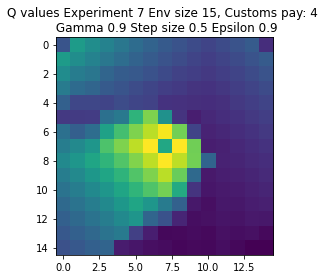

Expr:8 Eps:0 RunnAReward:-15.0 Reward:-287 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-1103.0 Reward:-120 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-78.0 Reward:-178 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-27.0 Reward:-16 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-562.0 Reward:586 Timesteps:225 GotPack:False Utiltime:207 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:173.0 Reward:-216 Timesteps:675 GotPack:False Utiltime:122 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:166.0 Reward:119 Timesteps:450 GotPack:False Utiltime:97 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:217.0 Reward:494 Timesteps:1089 GotPack:True Utiltime:147 Customstime:486 Money:5
Expr:8 Eps:160 RunnAReward:191.0 Reward:629 Timesteps:225 GotPack:False Utiltime:108 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:326.0 Reward:308

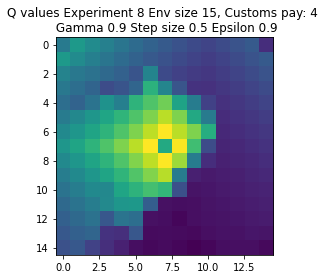

Expr:9 Eps:0 RunnAReward:-15.0 Reward:-289 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-356.0 Reward:-24 Timesteps:450 GotPack:False Utiltime:235 Customstime:0 Money:3
Expr:9 Eps:40 RunnAReward:-827.0 Reward:-1328 Timesteps:2339 GotPack:True Utiltime:1326 Customstime:1781 Money:4
Expr:9 Eps:60 RunnAReward:-153.0 Reward:366 Timesteps:225 GotPack:False Utiltime:126 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-119.0 Reward:-558 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:214.0 Reward:191 Timesteps:450 GotPack:False Utiltime:122 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:111.0 Reward:389 Timesteps:1270 GotPack:True Utiltime:239 Customstime:398 Money:5
Expr:9 Eps:140 RunnAReward:94.0 Reward:-379 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:68.0 Reward:404 Timesteps:225 GotPack:False Utiltime:59 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:254.0 Rewa

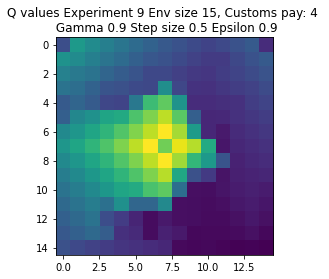

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.9 Step size 0.5 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-36.0 Reward:-713 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-704.0 Reward:89 Timesteps:450 GotPack:False Utiltime:219 Customstime:0 Money:1
Expr:0 Eps:40 RunnAReward:-1524.0 Reward:-1100 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-1038.0 Reward:-233 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:80 RunnAReward:-940.0 Reward:-2480 Timesteps:3336 GotPack:True Utiltime:2556 Customstime:2687 Money:4
Expr:0 Eps:100 RunnAReward:-327.0 Reward:34 Timesteps:450 GotPack:False Utiltime:66 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:-212.0 Reward:-1160 Timesteps:900 GotPack:False Utiltime

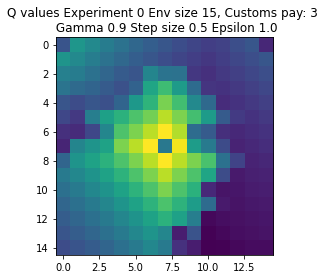

Expr:1 Eps:0 RunnAReward:-20.0 Reward:-397 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-1159.0 Reward:-825 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:40 RunnAReward:-1271.0 Reward:366 Timesteps:450 GotPack:False Utiltime:198 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-344.0 Reward:456 Timesteps:1142 GotPack:True Utiltime:236 Customstime:815 Money:4
Expr:1 Eps:80 RunnAReward:-309.0 Reward:72 Timesteps:450 GotPack:False Utiltime:222 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:-155.0 Reward:-532 Timesteps:1921 GotPack:True Utiltime:1277 Customstime:1634 Money:3
Expr:1 Eps:120 RunnAReward:-397.0 Reward:93 Timesteps:450 GotPack:False Utiltime:163 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:-238.0 Reward:21 Timesteps:1890 GotPack:True Utiltime:107 Customstime:793 Money:4
Expr:1 Eps:160 RunnAReward:-57.0 Reward:333 Timesteps:450 GotPack:False Utiltime:149 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:-25

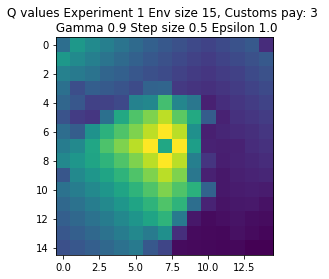

Expr:2 Eps:0 RunnAReward:-113.0 Reward:-2251 Timesteps:3441 GotPack:True Utiltime:1912 Customstime:2095 Money:5
Expr:2 Eps:20 RunnAReward:-1735.0 Reward:-975 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-562.0 Reward:-459 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:60 RunnAReward:-563.0 Reward:241 Timesteps:450 GotPack:False Utiltime:187 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-1139.0 Reward:-1279 Timesteps:2628 GotPack:True Utiltime:83 Customstime:844 Money:3
Expr:2 Eps:100 RunnAReward:-968.0 Reward:-271 Timesteps:675 GotPack:False Utiltime:134 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:-311.0 Reward:207 Timesteps:450 GotPack:False Utiltime:322 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:107.0 Reward:-511 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:64.0 Reward:40 Timesteps:1525 GotPack:True Utiltime:97 Customstime:577 Money:4
Expr:2 Eps:180 RunnAReward:2

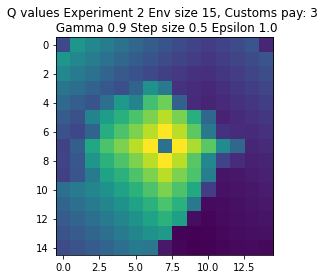

Expr:3 Eps:0 RunnAReward:-32.0 Reward:-631 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-1073.0 Reward:-501 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-871.0 Reward:-313 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-962.0 Reward:-3203 Timesteps:4140 GotPack:True Utiltime:898 Customstime:1533 Money:3
Expr:3 Eps:80 RunnAReward:-979.0 Reward:6 Timesteps:1830 GotPack:True Utiltime:53 Customstime:675 Money:5
Expr:3 Eps:100 RunnAReward:-700.0 Reward:931 Timesteps:1082 GotPack:True Utiltime:476 Customstime:635 Money:4
Expr:3 Eps:120 RunnAReward:-31.0 Reward:61 Timesteps:450 GotPack:False Utiltime:377 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:195.0 Reward:370 Timesteps:450 GotPack:False Utiltime:378 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:103.0 Reward:94 Timesteps:675 GotPack:False Utiltime:402 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:29.0 Rewa

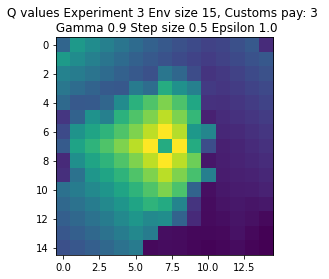

Expr:4 Eps:0 RunnAReward:-349.0 Reward:-6972 Timesteps:6750 GotPack:False Utiltime:4399 Customstime:5324 Money:3
Expr:4 Eps:20 RunnAReward:-1552.0 Reward:-625 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:40 RunnAReward:-778.0 Reward:-371 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-398.0 Reward:298 Timesteps:450 GotPack:False Utiltime:344 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-426.0 Reward:-380 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-304.0 Reward:-298 Timesteps:900 GotPack:False Utiltime:240 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:-171.0 Reward:386 Timesteps:450 GotPack:False Utiltime:174 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:85.0 Reward:-693 Timesteps:2578 GotPack:True Utiltime:275 Customstime:1033 Money:3
Expr:4 Eps:160 RunnAReward:6.0 Reward:102 Timesteps:675 GotPack:False Utiltime:26 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:221

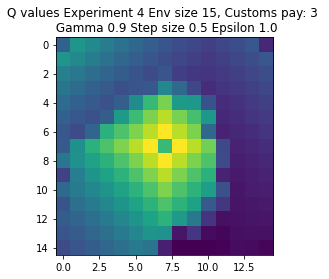

Expr:5 Eps:0 RunnAReward:-24.0 Reward:-465 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-1145.0 Reward:-3349 Timesteps:4041 GotPack:True Utiltime:1585 Customstime:2230 Money:5
Expr:5 Eps:40 RunnAReward:-965.0 Reward:-471 Timesteps:900 GotPack:False Utiltime:188 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-696.0 Reward:-585 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:80 RunnAReward:-347.0 Reward:-578 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:100 RunnAReward:-676.0 Reward:685 Timesteps:1095 GotPack:True Utiltime:6 Customstime:1032 Money:3
Expr:5 Eps:120 RunnAReward:-102.0 Reward:146 Timesteps:450 GotPack:False Utiltime:318 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:216.0 Reward:353 Timesteps:450 GotPack:False Utiltime:4 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:148.0 Reward:-176 Timesteps:675 GotPack:False Utiltime:289 Customstime:0 Money:2
Expr:5 Eps:180 RunnAReward:-25.0

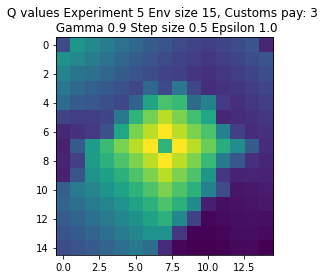

Expr:6 Eps:0 RunnAReward:-298.0 Reward:-5951 Timesteps:6052 GotPack:True Utiltime:938 Customstime:2561 Money:3
Expr:6 Eps:20 RunnAReward:-1648.0 Reward:285 Timesteps:450 GotPack:False Utiltime:201 Customstime:0 Money:1
Expr:6 Eps:40 RunnAReward:-1291.0 Reward:-567 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-443.0 Reward:-539 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-466.0 Reward:-641 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-449.0 Reward:34 Timesteps:1486 GotPack:True Utiltime:938 Customstime:1036 Money:5
Expr:6 Eps:120 RunnAReward:-323.0 Reward:124 Timesteps:450 GotPack:False Utiltime:64 Customstime:0 Money:1
Expr:6 Eps:140 RunnAReward:133.0 Reward:980 Timesteps:1011 GotPack:True Utiltime:629 Customstime:894 Money:3
Expr:6 Eps:160 RunnAReward:281.0 Reward:-189 Timesteps:675 GotPack:False Utiltime:587 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:-

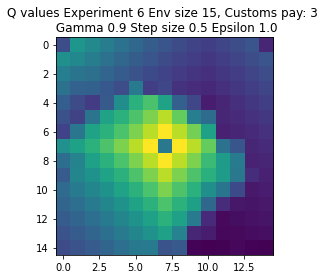

Expr:7 Eps:0 RunnAReward:-35.0 Reward:-689 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-1320.0 Reward:-551 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:40 RunnAReward:-703.0 Reward:-1597 Timesteps:2781 GotPack:True Utiltime:1634 Customstime:2410 Money:3
Expr:7 Eps:60 RunnAReward:-869.0 Reward:-330 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-687.0 Reward:-155 Timesteps:675 GotPack:False Utiltime:146 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:-1.0 Reward:-443 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:-43.0 Reward:389 Timesteps:450 GotPack:False Utiltime:268 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-186.0 Reward:-143 Timesteps:450 GotPack:False Utiltime:92 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:152.0 Reward:1401 Timesteps:749 GotPack:True Utiltime:108 Customstime:703 Money:3
Expr:7 Eps:180 RunnAReward:146.0 

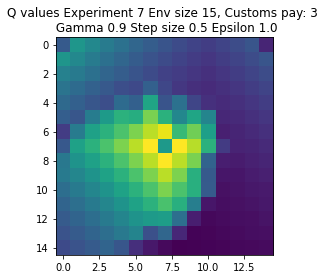

Expr:8 Eps:0 RunnAReward:-141.0 Reward:-2814 Timesteps:3367 GotPack:True Utiltime:2253 Customstime:2420 Money:5
Expr:8 Eps:20 RunnAReward:-1081.0 Reward:-690 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-990.0 Reward:-542 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-1002.0 Reward:-669 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-762.0 Reward:-72 Timesteps:675 GotPack:False Utiltime:56 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:-399.0 Reward:319 Timesteps:450 GotPack:False Utiltime:89 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:87.0 Reward:58 Timesteps:675 GotPack:False Utiltime:85 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:53.0 Reward:35 Timesteps:675 GotPack:False Utiltime:157 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:195.0 Reward:79 Timesteps:675 GotPack:False Utiltime:170 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:74.0 Reward:2

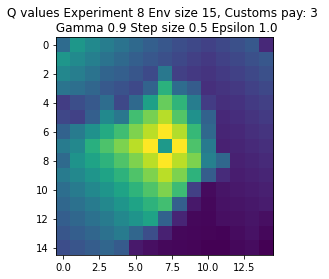

Expr:9 Eps:0 RunnAReward:-29.0 Reward:-566 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-1244.0 Reward:-5798 Timesteps:6003 GotPack:True Utiltime:3602 Customstime:4100 Money:4
Expr:9 Eps:40 RunnAReward:-1522.0 Reward:-1934 Timesteps:3139 GotPack:True Utiltime:2418 Customstime:2516 Money:5
Expr:9 Eps:60 RunnAReward:-368.0 Reward:650 Timesteps:1205 GotPack:True Utiltime:103 Customstime:854 Money:5
Expr:9 Eps:80 RunnAReward:-98.0 Reward:54 Timesteps:675 GotPack:False Utiltime:279 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-400.0 Reward:-487 Timesteps:900 GotPack:False Utiltime:133 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:-147.0 Reward:99 Timesteps:450 GotPack:False Utiltime:312 Customstime:0 Money:1
Expr:9 Eps:140 RunnAReward:76.0 Reward:-137 Timesteps:675 GotPack:False Utiltime:155 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:260.0 Reward:-803 Timesteps:2255 GotPack:True Utiltime:463 Customstime:801 Money:5
Expr:9 Eps:180 RunnAR

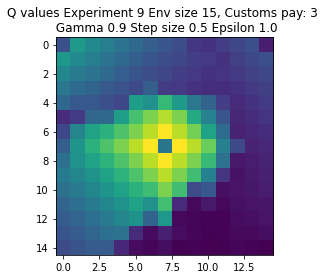

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.9 Step size 0.5 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-16.0 Reward:-310 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-316.0 Reward:-203 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-644.0 Reward:-367 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-481.0 Reward:-311 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-303.0 Reward:-111 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-375.0 Reward:-614 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:120 RunnAReward:-233.0 Reward:-582 Timesteps:450 GotPack:False Utiltime:0 Customs

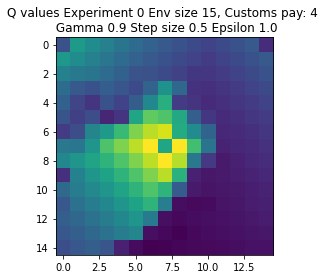

Expr:1 Eps:0 RunnAReward:-18.0 Reward:-355 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-696.0 Reward:-16 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-384.0 Reward:199 Timesteps:450 GotPack:False Utiltime:148 Customstime:0 Money:2
Expr:1 Eps:60 RunnAReward:-879.0 Reward:-240 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-197.0 Reward:-1484 Timesteps:3038 GotPack:True Utiltime:1675 Customstime:2688 Money:5
Expr:1 Eps:100 RunnAReward:-194.0 Reward:-286 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:-161.0 Reward:-169 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:205.0 Reward:288 Timesteps:1477 GotPack:True Utiltime:86 Customstime:354 Money:4
Expr:1 Eps:160 RunnAReward:-116.0 Reward:154 Timesteps:450 GotPack:False Utiltime:25 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:144.0 Rew

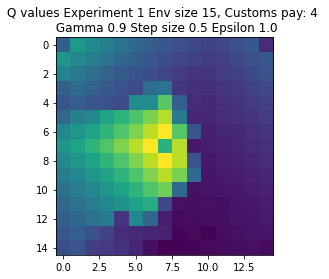

Expr:2 Eps:0 RunnAReward:7.0 Reward:143 Timesteps:450 GotPack:False Utiltime:384 Customstime:0 Money:3
Expr:2 Eps:20 RunnAReward:-249.0 Reward:-330 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-696.0 Reward:-354 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-226.0 Reward:-318 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-325.0 Reward:635 Timesteps:225 GotPack:False Utiltime:128 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-369.0 Reward:-4681 Timesteps:5186 GotPack:True Utiltime:729 Customstime:970 Money:5
Expr:2 Eps:120 RunnAReward:-273.0 Reward:1469 Timesteps:730 GotPack:True Utiltime:191 Customstime:693 Money:4
Expr:2 Eps:140 RunnAReward:126.0 Reward:-528 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:160 RunnAReward:-8.0 Reward:-15 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:79.0 Reward:-

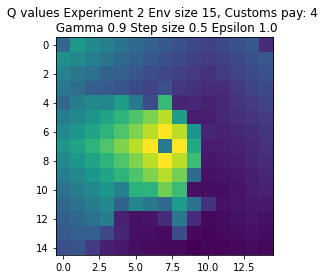

Expr:3 Eps:0 RunnAReward:17.0 Reward:345 Timesteps:225 GotPack:False Utiltime:178 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-339.0 Reward:-320 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-695.0 Reward:-361 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-335.0 Reward:-30 Timesteps:675 GotPack:False Utiltime:431 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:-512.0 Reward:596 Timesteps:225 GotPack:False Utiltime:70 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-130.0 Reward:329 Timesteps:225 GotPack:False Utiltime:123 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:0.0 Reward:-87 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-152.0 Reward:-35 Timesteps:450 GotPack:False Utiltime:163 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:94.0 Reward:161 Timesteps:450 GotPack:False Utiltime:122 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:188.0 Reward:-106 T

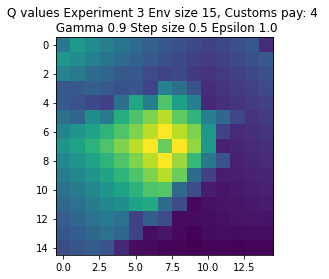

Expr:4 Eps:0 RunnAReward:-32.0 Reward:-626 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-559.0 Reward:-450 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:40 RunnAReward:-586.0 Reward:-289 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-428.0 Reward:-233 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-416.0 Reward:-16 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-316.0 Reward:-314 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-41.0 Reward:-368 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:-41.0 Reward:358 Timesteps:225 GotPack:False Utiltime:137 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:21.0 Reward:-84 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:15.0 Reward:-33 Timest

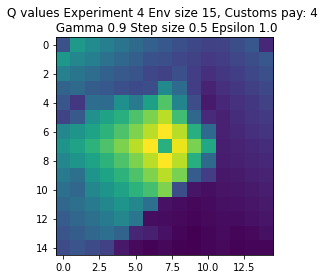

Expr:5 Eps:0 RunnAReward:7.0 Reward:152 Timesteps:450 GotPack:False Utiltime:94 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-265.0 Reward:-378 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-383.0 Reward:-356 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-247.0 Reward:594 Timesteps:225 GotPack:False Utiltime:199 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-307.0 Reward:-575 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:-130.0 Reward:-113 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-470.0 Reward:-47 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:-131.0 Reward:1509 Timesteps:386 GotPack:True Utiltime:136 Customstime:296 Money:5
Expr:5 Eps:160 RunnAReward:41.0 Reward:-119 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:161.0 Reward:-153 

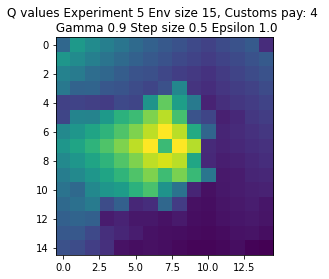

Expr:6 Eps:0 RunnAReward:-14.0 Reward:-265 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-318.0 Reward:152 Timesteps:450 GotPack:False Utiltime:140 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-347.0 Reward:-346 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-569.0 Reward:-1217 Timesteps:2417 GotPack:True Utiltime:470 Customstime:621 Money:5
Expr:6 Eps:80 RunnAReward:-649.0 Reward:-250 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-226.0 Reward:-1026 Timesteps:2142 GotPack:True Utiltime:1321 Customstime:1712 Money:5
Expr:6 Eps:120 RunnAReward:-196.0 Reward:397 Timesteps:225 GotPack:False Utiltime:7 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:-93.0 Reward:-262 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:7.0 Reward:-265 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:74.0 Rewa

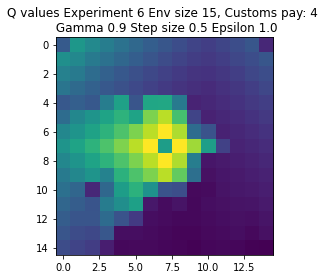

Expr:7 Eps:0 RunnAReward:-12.0 Reward:-233 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-893.0 Reward:-301 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-707.0 Reward:351 Timesteps:225 GotPack:False Utiltime:128 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-420.0 Reward:-69 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-271.0 Reward:-337 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:100 RunnAReward:-240.0 Reward:-226 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-393.0 Reward:432 Timesteps:225 GotPack:False Utiltime:105 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-195.0 Reward:-671 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:3.0 Reward:378 Timesteps:225 GotPack:False Utiltime:143 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:154.0 Reward:601 T

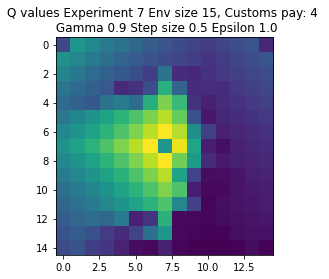

Expr:8 Eps:0 RunnAReward:-38.0 Reward:-760 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-393.0 Reward:-72 Timesteps:675 GotPack:False Utiltime:376 Customstime:0 Money:3
Expr:8 Eps:40 RunnAReward:-156.0 Reward:64 Timesteps:450 GotPack:False Utiltime:211 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-496.0 Reward:-283 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-608.0 Reward:-671 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:100 RunnAReward:-216.0 Reward:442 Timesteps:225 GotPack:False Utiltime:146 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-148.0 Reward:-270 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:24.0 Reward:379 Timesteps:450 GotPack:False Utiltime:393 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:-101.0 Reward:-61 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:-50.0 Reward:-35 

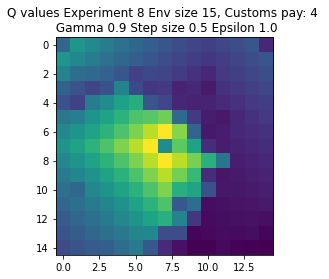

Expr:9 Eps:0 RunnAReward:-17.0 Reward:-326 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-741.0 Reward:-2689 Timesteps:3430 GotPack:True Utiltime:2078 Customstime:2338 Money:4
Expr:9 Eps:40 RunnAReward:-614.0 Reward:-374 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-62.0 Reward:-953 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:9 Eps:80 RunnAReward:-685.0 Reward:293 Timesteps:225 GotPack:False Utiltime:204 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-299.0 Reward:-301 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-101.0 Reward:523 Timesteps:1414 GotPack:True Utiltime:913 Customstime:1000 Money:5
Expr:9 Eps:140 RunnAReward:110.0 Reward:404 Timesteps:225 GotPack:False Utiltime:109 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:-50.0 Reward:272 Timesteps:450 GotPack:False Utiltime:105 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:-26.0 

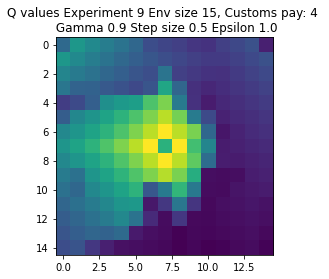

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.9 Step size 0.8 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-43.0 Reward:-844 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-1002.0 Reward:-1909 Timesteps:3195 GotPack:True Utiltime:2752 Customstime:2930 Money:3
Expr:0 Eps:40 RunnAReward:-364.0 Reward:491 Timesteps:1232 GotPack:True Utiltime:839 Customstime:1108 Money:5
Expr:0 Eps:60 RunnAReward:263.0 Reward:-256 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:215.0 Reward:278 Timesteps:450 GotPack:False Utiltime:81 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:69.0 Reward:-200 Timesteps:675 GotPack:False Utiltime:149 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:438.0 Reward:294 Timesteps:450 GotPack:False Utiltime:2

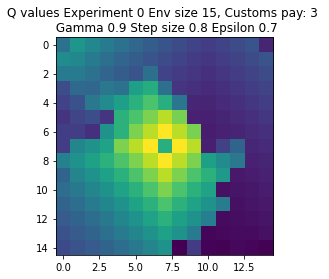

Expr:1 Eps:0 RunnAReward:-73.0 Reward:-1456 Timesteps:2844 GotPack:True Utiltime:1339 Customstime:1443 Money:3
Expr:1 Eps:20 RunnAReward:-804.0 Reward:362 Timesteps:450 GotPack:False Utiltime:18 Customstime:0 Money:1
Expr:1 Eps:40 RunnAReward:-88.0 Reward:360 Timesteps:450 GotPack:False Utiltime:100 Customstime:0 Money:1
Expr:1 Eps:60 RunnAReward:171.0 Reward:170 Timesteps:450 GotPack:False Utiltime:82 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:339.0 Reward:1121 Timesteps:816 GotPack:True Utiltime:151 Customstime:432 Money:5
Expr:1 Eps:100 RunnAReward:842.0 Reward:1027 Timesteps:843 GotPack:True Utiltime:10 Customstime:304 Money:5
Expr:1 Eps:120 RunnAReward:577.0 Reward:168 Timesteps:450 GotPack:False Utiltime:37 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:739.0 Reward:357 Timesteps:450 GotPack:False Utiltime:42 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:835.0 Reward:1876 Timesteps:271 GotPack:True Utiltime:63 Customstime:221 Money:5
Expr:1 Eps:180 RunnAReward:992.0 Rew

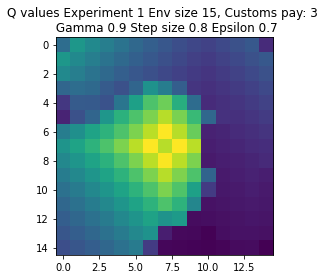

Expr:2 Eps:0 RunnAReward:-21.0 Reward:-418 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-518.0 Reward:47 Timesteps:675 GotPack:False Utiltime:18 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-528.0 Reward:-1411 Timesteps:2807 GotPack:True Utiltime:1673 Customstime:2276 Money:3
Expr:2 Eps:60 RunnAReward:-148.0 Reward:-310 Timesteps:900 GotPack:False Utiltime:19 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:154.0 Reward:1201 Timesteps:819 GotPack:True Utiltime:359 Customstime:749 Money:5
Expr:2 Eps:100 RunnAReward:281.0 Reward:-721 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:209.0 Reward:-413 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:753.0 Reward:1236 Timesteps:897 GotPack:True Utiltime:127 Customstime:653 Money:4
Expr:2 Eps:160 RunnAReward:782.0 Reward:1943 Timesteps:258 GotPack:True Utiltime:9 Customstime:147 Money:5
Expr:2 Eps:180 RunnAReward:876.0 Re

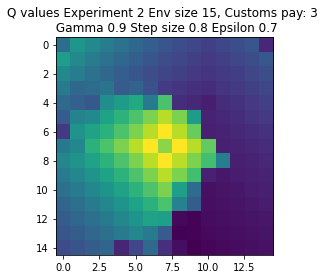

Expr:3 Eps:0 RunnAReward:20.0 Reward:405 Timesteps:450 GotPack:False Utiltime:278 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-724.0 Reward:-644 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-115.0 Reward:102 Timesteps:450 GotPack:False Utiltime:398 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:200.0 Reward:-376 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:203.0 Reward:117 Timesteps:675 GotPack:False Utiltime:104 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:222.0 Reward:-931 Timesteps:2443 GotPack:True Utiltime:35 Customstime:833 Money:3
Expr:3 Eps:120 RunnAReward:253.0 Reward:-65 Timesteps:450 GotPack:False Utiltime:112 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:641.0 Reward:400 Timesteps:450 GotPack:False Utiltime:68 Customstime:0 Money:1
Expr:3 Eps:160 RunnAReward:340.0 Reward:96 Timesteps:675 GotPack:False Utiltime:101 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:631.0 Reward:-593

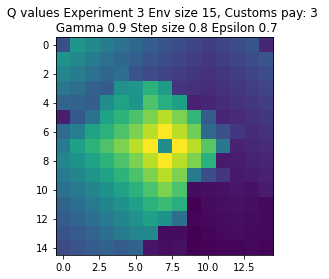

Expr:4 Eps:0 RunnAReward:-36.0 Reward:-704 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-694.0 Reward:-2176 Timesteps:3655 GotPack:True Utiltime:453 Customstime:641 Money:5
Expr:4 Eps:40 RunnAReward:-316.0 Reward:-15 Timesteps:675 GotPack:False Utiltime:248 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:93.0 Reward:-581 Timesteps:1125 GotPack:False Utiltime:142 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:406.0 Reward:-32 Timesteps:1824 GotPack:True Utiltime:15 Customstime:902 Money:4
Expr:4 Eps:100 RunnAReward:455.0 Reward:183 Timesteps:450 GotPack:False Utiltime:114 Customstime:0 Money:1
Expr:4 Eps:120 RunnAReward:704.0 Reward:-161 Timesteps:675 GotPack:False Utiltime:75 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:521.0 Reward:276 Timesteps:450 GotPack:False Utiltime:100 Customstime:0 Money:1
Expr:4 Eps:160 RunnAReward:890.0 Reward:1230 Timesteps:833 GotPack:True Utiltime:82 Customstime:755 Money:4
Expr:4 Eps:180 RunnAReward:877.0 Re

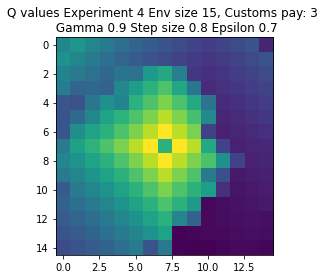

Expr:5 Eps:0 RunnAReward:-32.0 Reward:-624 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-819.0 Reward:-338 Timesteps:1596 GotPack:True Utiltime:833 Customstime:1392 Money:5
Expr:5 Eps:40 RunnAReward:-168.0 Reward:-669 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:60 RunnAReward:170.0 Reward:292 Timesteps:450 GotPack:False Utiltime:318 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:348.0 Reward:30 Timesteps:675 GotPack:False Utiltime:70 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:447.0 Reward:357 Timesteps:450 GotPack:False Utiltime:185 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:498.0 Reward:285 Timesteps:450 GotPack:False Utiltime:61 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:566.0 Reward:1612 Timesteps:521 GotPack:True Utiltime:72 Customstime:374 Money:4
Expr:5 Eps:160 RunnAReward:844.0 Reward:1323 Timesteps:801 GotPack:True Utiltime:67 Customstime:526 Money:3
Expr:5 Eps:180 RunnAReward:567.0 Reward:

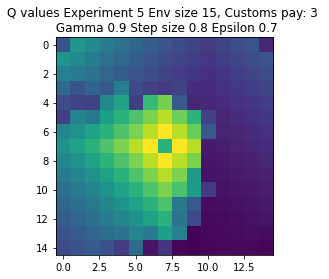

Expr:6 Eps:0 RunnAReward:-28.0 Reward:-551 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-671.0 Reward:83 Timesteps:450 GotPack:False Utiltime:92 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-116.0 Reward:266 Timesteps:450 GotPack:False Utiltime:120 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:170.0 Reward:785 Timesteps:1228 GotPack:True Utiltime:167 Customstime:1115 Money:3
Expr:6 Eps:80 RunnAReward:102.0 Reward:-5 Timesteps:1633 GotPack:True Utiltime:59 Customstime:565 Money:4
Expr:6 Eps:100 RunnAReward:506.0 Reward:-66 Timesteps:675 GotPack:False Utiltime:70 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:402.0 Reward:-9 Timesteps:675 GotPack:False Utiltime:30 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:420.0 Reward:1613 Timesteps:411 GotPack:True Utiltime:51 Customstime:265 Money:5
Expr:6 Eps:160 RunnAReward:493.0 Reward:884 Timesteps:1129 GotPack:True Utiltime:46 Customstime:278 Money:5
Expr:6 Eps:180 RunnAReward:864.0 Reward:74

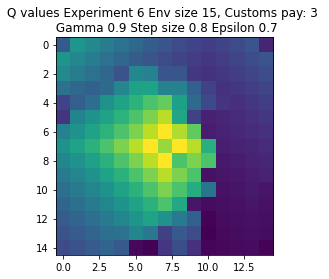

Expr:7 Eps:0 RunnAReward:-49.0 Reward:-966 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-827.0 Reward:-2298 Timesteps:3404 GotPack:True Utiltime:2363 Customstime:2564 Money:3
Expr:7 Eps:40 RunnAReward:-383.0 Reward:205 Timesteps:1528 GotPack:True Utiltime:684 Customstime:711 Money:3
Expr:7 Eps:60 RunnAReward:162.0 Reward:276 Timesteps:450 GotPack:False Utiltime:235 Customstime:0 Money:1
Expr:7 Eps:80 RunnAReward:299.0 Reward:1126 Timesteps:960 GotPack:True Utiltime:81 Customstime:662 Money:3
Expr:7 Eps:100 RunnAReward:355.0 Reward:288 Timesteps:450 GotPack:False Utiltime:55 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:383.0 Reward:357 Timesteps:450 GotPack:False Utiltime:90 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:443.0 Reward:1926 Timesteps:271 GotPack:True Utiltime:99 Customstime:245 Money:3
Expr:7 Eps:160 RunnAReward:582.0 Reward:250 Timesteps:450 GotPack:False Utiltime:52 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:639.0 Re

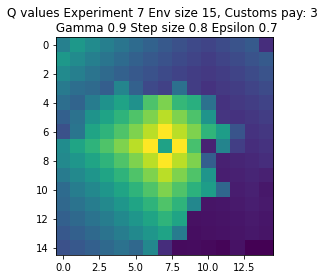

Expr:8 Eps:0 RunnAReward:-10.0 Reward:-190 Timesteps:675 GotPack:False Utiltime:451 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-306.0 Reward:197 Timesteps:450 GotPack:False Utiltime:358 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-544.0 Reward:-3229 Timesteps:4349 GotPack:True Utiltime:2073 Customstime:2240 Money:3
Expr:8 Eps:60 RunnAReward:-150.0 Reward:-598 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:29.0 Reward:-183 Timesteps:675 GotPack:False Utiltime:196 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:364.0 Reward:1472 Timesteps:683 GotPack:True Utiltime:93 Customstime:282 Money:5
Expr:8 Eps:120 RunnAReward:531.0 Reward:265 Timesteps:450 GotPack:False Utiltime:83 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:484.0 Reward:367 Timesteps:450 GotPack:False Utiltime:49 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:697.0 Reward:131 Timesteps:675 GotPack:False Utiltime:160 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:837.0 Re

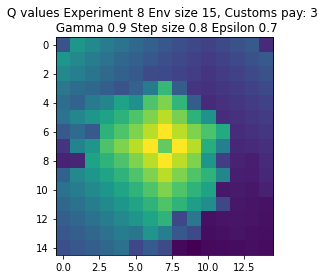

Expr:9 Eps:0 RunnAReward:-19.0 Reward:-369 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:20 RunnAReward:-593.0 Reward:71 Timesteps:675 GotPack:False Utiltime:62 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-23.0 Reward:100 Timesteps:450 GotPack:False Utiltime:18 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-23.0 Reward:1125 Timesteps:918 GotPack:True Utiltime:340 Customstime:654 Money:3
Expr:9 Eps:80 RunnAReward:561.0 Reward:384 Timesteps:450 GotPack:False Utiltime:172 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:377.0 Reward:601 Timesteps:1151 GotPack:True Utiltime:85 Customstime:554 Money:4
Expr:9 Eps:120 RunnAReward:475.0 Reward:77 Timesteps:675 GotPack:False Utiltime:41 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:626.0 Reward:1341 Timesteps:696 GotPack:True Utiltime:19 Customstime:646 Money:3
Expr:9 Eps:160 RunnAReward:795.0 Reward:1880 Timesteps:297 GotPack:True Utiltime:56 Customstime:173 Money:3
Expr:9 Eps:180 RunnAReward:1099.0 Reward:-2

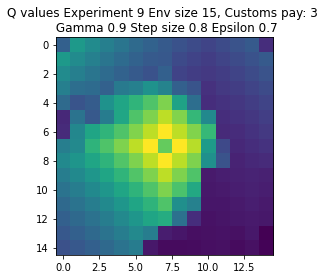

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.9 Step size 0.8 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-35.0 Reward:-683 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-542.0 Reward:-6 Timesteps:450 GotPack:False Utiltime:21 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-284.0 Reward:-462 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-65.0 Reward:100 Timesteps:450 GotPack:False Utiltime:141 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:212.0 Reward:83 Timesteps:450 GotPack:False Utiltime:26 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:236.0 Reward:329 Timesteps:225 GotPack:False Utiltime:127 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:195.0 Reward:455 Timesteps:225 GotPack:False Utiltime:77 Customstime

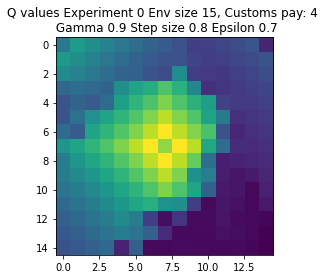

Expr:1 Eps:0 RunnAReward:-23.0 Reward:-444 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-549.0 Reward:1420 Timesteps:612 GotPack:True Utiltime:143 Customstime:295 Money:4
Expr:1 Eps:40 RunnAReward:-141.0 Reward:-105 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-145.0 Reward:-311 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:225.0 Reward:-10 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:139.0 Reward:-51 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:363.0 Reward:-281 Timesteps:900 GotPack:False Utiltime:391 Customstime:0 Money:3
Expr:1 Eps:140 RunnAReward:502.0 Reward:577 Timesteps:225 GotPack:False Utiltime:27 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:523.0 Reward:617 Timesteps:225 GotPack:False Utiltime:100 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:493.0 Reward:652 T

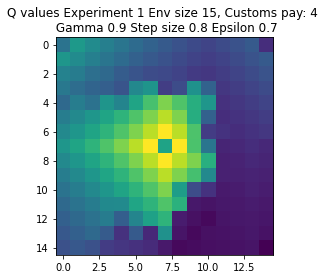

Expr:2 Eps:0 RunnAReward:-62.0 Reward:-1221 Timesteps:2615 GotPack:True Utiltime:1310 Customstime:2482 Money:4
Expr:2 Eps:20 RunnAReward:-296.0 Reward:-8 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-214.0 Reward:-1002 Timesteps:2525 GotPack:True Utiltime:1328 Customstime:2231 Money:5
Expr:2 Eps:60 RunnAReward:-223.0 Reward:-82 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-2.0 Reward:212 Timesteps:450 GotPack:False Utiltime:363 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:309.0 Reward:196 Timesteps:1403 GotPack:True Utiltime:51 Customstime:478 Money:5
Expr:2 Eps:120 RunnAReward:269.0 Reward:567 Timesteps:225 GotPack:False Utiltime:211 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:552.0 Reward:1223 Timesteps:615 GotPack:True Utiltime:27 Customstime:513 Money:4
Expr:2 Eps:160 RunnAReward:579.0 Reward:405 Timesteps:450 GotPack:False Utiltime:122 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:373.0

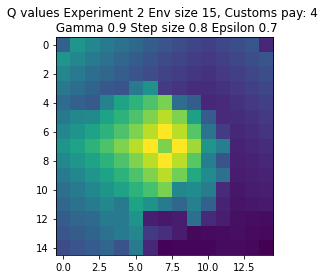

Expr:3 Eps:0 RunnAReward:-9.0 Reward:-179 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-356.0 Reward:-257 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-219.0 Reward:-8 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-87.0 Reward:-264 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:238.0 Reward:397 Timesteps:225 GotPack:False Utiltime:176 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:121.0 Reward:442 Timesteps:225 GotPack:False Utiltime:57 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:399.0 Reward:377 Timesteps:450 GotPack:False Utiltime:115 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:322.0 Reward:26 Timesteps:450 GotPack:False Utiltime:19 Customstime:0 Money:3
Expr:3 Eps:160 RunnAReward:501.0 Reward:609 Timesteps:225 GotPack:False Utiltime:15 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:706.0 Reward:1297 Timeste

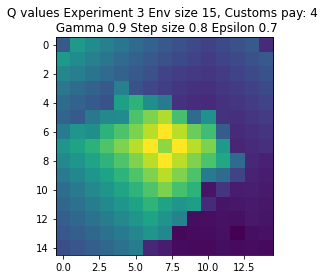

Expr:4 Eps:0 RunnAReward:-39.0 Reward:-763 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-336.0 Reward:-256 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-251.0 Reward:102 Timesteps:450 GotPack:False Utiltime:443 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-95.0 Reward:258 Timesteps:450 GotPack:False Utiltime:301 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:-11.0 Reward:647 Timesteps:225 GotPack:False Utiltime:159 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-2.0 Reward:280 Timesteps:225 GotPack:False Utiltime:114 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:394.0 Reward:589 Timesteps:225 GotPack:False Utiltime:105 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:607.0 Reward:639 Timesteps:225 GotPack:False Utiltime:136 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:528.0 Reward:565 Timesteps:225 GotPack:False Utiltime:64 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:785.0 Reward:651 T

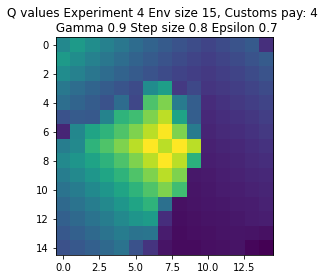

Expr:5 Eps:0 RunnAReward:-15.0 Reward:-294 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-465.0 Reward:-550 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:5 Eps:40 RunnAReward:-398.0 Reward:-995 Timesteps:2570 GotPack:True Utiltime:1664 Customstime:1996 Money:4
Expr:5 Eps:60 RunnAReward:-42.0 Reward:-40 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:92.0 Reward:-1152 Timesteps:2322 GotPack:True Utiltime:905 Customstime:1269 Money:4
Expr:5 Eps:100 RunnAReward:289.0 Reward:1557 Timesteps:436 GotPack:True Utiltime:60 Customstime:377 Money:5
Expr:5 Eps:120 RunnAReward:422.0 Reward:1245 Timesteps:736 GotPack:True Utiltime:138 Customstime:395 Money:5
Expr:5 Eps:140 RunnAReward:506.0 Reward:607 Timesteps:225 GotPack:False Utiltime:140 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:292.0 Reward:610 Timesteps:225 GotPack:False Utiltime:114 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:304.0 

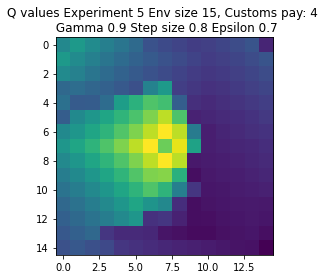

Expr:6 Eps:0 RunnAReward:-12.0 Reward:-237 Timesteps:675 GotPack:False Utiltime:370 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-420.0 Reward:-46 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-187.0 Reward:-51 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:114.0 Reward:362 Timesteps:225 GotPack:False Utiltime:126 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:374.0 Reward:581 Timesteps:225 GotPack:False Utiltime:14 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:360.0 Reward:296 Timesteps:450 GotPack:False Utiltime:27 Customstime:0 Money:3
Expr:6 Eps:120 RunnAReward:483.0 Reward:622 Timesteps:225 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:564.0 Reward:1877 Timesteps:277 GotPack:True Utiltime:82 Customstime:229 Money:5
Expr:6 Eps:160 RunnAReward:738.0 Reward:325 Timesteps:225 GotPack:False Utiltime:193 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:974.0 Reward:1945 T

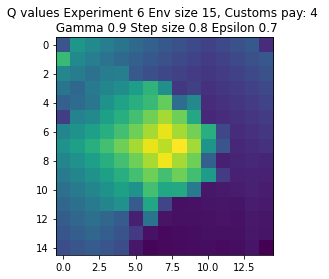

Expr:7 Eps:0 RunnAReward:-16.0 Reward:-312 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-575.0 Reward:320 Timesteps:225 GotPack:False Utiltime:106 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-136.0 Reward:-225 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-160.0 Reward:937 Timesteps:960 GotPack:True Utiltime:69 Customstime:819 Money:4
Expr:7 Eps:80 RunnAReward:86.0 Reward:-966 Timesteps:2456 GotPack:True Utiltime:1476 Customstime:1545 Money:4
Expr:7 Eps:100 RunnAReward:194.0 Reward:-265 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:350.0 Reward:396 Timesteps:450 GotPack:False Utiltime:286 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:568.0 Reward:602 Timesteps:225 GotPack:False Utiltime:42 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:531.0 Reward:1067 Timesteps:1024 GotPack:True Utiltime:40 Customstime:259 Money:5
Expr:7 Eps:180 RunnAReward:549.0 Rewar

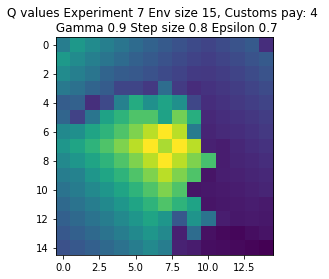

Expr:8 Eps:0 RunnAReward:-14.0 Reward:-273 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-76.0 Reward:-699 Timesteps:2303 GotPack:True Utiltime:2033 Customstime:2227 Money:4
Expr:8 Eps:40 RunnAReward:-310.0 Reward:345 Timesteps:225 GotPack:False Utiltime:127 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-61.0 Reward:15 Timesteps:450 GotPack:False Utiltime:182 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:-41.0 Reward:-83 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:331.0 Reward:366 Timesteps:450 GotPack:False Utiltime:398 Customstime:0 Money:3
Expr:8 Eps:120 RunnAReward:313.0 Reward:438 Timesteps:225 GotPack:False Utiltime:29 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:473.0 Reward:543 Timesteps:225 GotPack:False Utiltime:48 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:327.0 Reward:599 Timesteps:225 GotPack:False Utiltime:69 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:590.0 Reward:300 

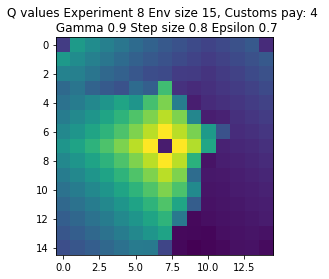

Expr:9 Eps:0 RunnAReward:-19.0 Reward:-363 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-851.0 Reward:370 Timesteps:1510 GotPack:True Utiltime:423 Customstime:623 Money:4
Expr:9 Eps:40 RunnAReward:-165.0 Reward:-21 Timesteps:1721 GotPack:True Utiltime:522 Customstime:630 Money:5
Expr:9 Eps:60 RunnAReward:-25.0 Reward:329 Timesteps:450 GotPack:False Utiltime:440 Customstime:0 Money:3
Expr:9 Eps:80 RunnAReward:310.0 Reward:807 Timesteps:1070 GotPack:True Utiltime:462 Customstime:614 Money:4
Expr:9 Eps:100 RunnAReward:461.0 Reward:400 Timesteps:450 GotPack:False Utiltime:100 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:443.0 Reward:357 Timesteps:450 GotPack:False Utiltime:364 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:531.0 Reward:577 Timesteps:225 GotPack:False Utiltime:208 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:742.0 Reward:1846 Timesteps:269 GotPack:True Utiltime:97 Customstime:233 Money:5
Expr:9 Eps:180 RunnAReward:807.0 Re

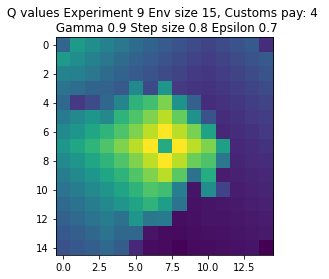

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.9 Step size 0.8 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-25.0 Reward:-492 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-1035.0 Reward:-549 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-525.0 Reward:-15 Timesteps:675 GotPack:False Utiltime:626 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-73.0 Reward:80 Timesteps:675 GotPack:False Utiltime:72 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-166.0 Reward:327 Timesteps:450 GotPack:False Utiltime:196 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-145.0 Reward:352 Timesteps:450 GotPack:False Utiltime:252 Customstime:0 Money:1
Expr:0 Eps:120 RunnAReward:202.0 Reward:-25 Timesteps:675 GotPack:False Utiltime:134 Custo

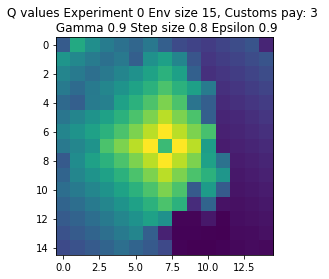

Expr:1 Eps:0 RunnAReward:-166.0 Reward:-3314 Timesteps:4224 GotPack:True Utiltime:1697 Customstime:1839 Money:4
Expr:1 Eps:20 RunnAReward:-700.0 Reward:-338 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-748.0 Reward:-37 Timesteps:1557 GotPack:True Utiltime:434 Customstime:1495 Money:3
Expr:1 Eps:60 RunnAReward:-316.0 Reward:-362 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:-12.0 Reward:-249 Timesteps:675 GotPack:False Utiltime:417 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:15.0 Reward:35 Timesteps:450 GotPack:False Utiltime:74 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:145.0 Reward:269 Timesteps:450 GotPack:False Utiltime:203 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:246.0 Reward:159 Timesteps:675 GotPack:False Utiltime:169 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:266.0 Reward:410 Timesteps:450 GotPack:False Utiltime:378 Customstime:0 Money:1
Expr:1 Eps:180 RunnAReward:436.0 R

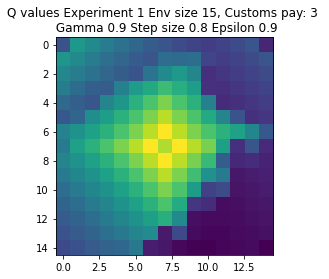

Expr:2 Eps:0 RunnAReward:-34.0 Reward:-668 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-723.0 Reward:-896 Timesteps:2302 GotPack:True Utiltime:165 Customstime:1909 Money:3
Expr:2 Eps:40 RunnAReward:-645.0 Reward:-954 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-517.0 Reward:-461 Timesteps:1912 GotPack:True Utiltime:834 Customstime:1076 Money:5
Expr:2 Eps:80 RunnAReward:-108.0 Reward:646 Timesteps:1180 GotPack:True Utiltime:970 Customstime:1010 Money:3
Expr:2 Eps:100 RunnAReward:97.0 Reward:-204 Timesteps:1891 GotPack:True Utiltime:465 Customstime:1164 Money:4
Expr:2 Eps:120 RunnAReward:148.0 Reward:-1827 Timesteps:2710 GotPack:True Utiltime:41 Customstime:428 Money:4
Expr:2 Eps:140 RunnAReward:160.0 Reward:18 Timesteps:675 GotPack:False Utiltime:124 Customstime:0 Money:2
Expr:2 Eps:160 RunnAReward:273.0 Reward:0 Timesteps:450 GotPack:False Utiltime:180 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:

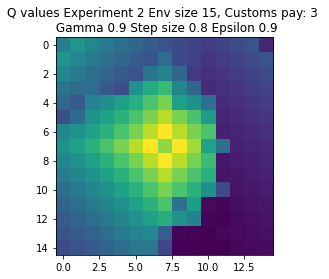

Expr:3 Eps:0 RunnAReward:-32.0 Reward:-622 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-906.0 Reward:-125 Timesteps:675 GotPack:False Utiltime:604 Customstime:0 Money:2
Expr:3 Eps:40 RunnAReward:-901.0 Reward:-645 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-349.0 Reward:-418 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:3 Eps:80 RunnAReward:-116.0 Reward:1645 Timesteps:530 GotPack:True Utiltime:341 Customstime:466 Money:3
Expr:3 Eps:100 RunnAReward:-30.0 Reward:227 Timesteps:450 GotPack:False Utiltime:215 Customstime:0 Money:1
Expr:3 Eps:120 RunnAReward:133.0 Reward:352 Timesteps:450 GotPack:False Utiltime:124 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:184.0 Reward:333 Timesteps:450 GotPack:False Utiltime:77 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:442.0 Reward:91 Timesteps:450 GotPack:False Utiltime:27 Customstime:0 Money:1
Expr:3 Eps:180 RunnAReward:433.0 Reward:28

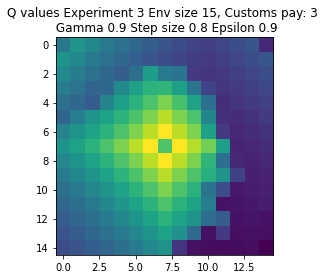

Expr:4 Eps:0 RunnAReward:-37.0 Reward:-729 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-667.0 Reward:-179 Timesteps:1714 GotPack:True Utiltime:1000 Customstime:1157 Money:4
Expr:4 Eps:40 RunnAReward:-1178.0 Reward:-2610 Timesteps:3599 GotPack:True Utiltime:435 Customstime:522 Money:5
Expr:4 Eps:60 RunnAReward:-679.0 Reward:-312 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:80 RunnAReward:-322.0 Reward:348 Timesteps:450 GotPack:False Utiltime:205 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-159.0 Reward:-200 Timesteps:900 GotPack:False Utiltime:70 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:-67.0 Reward:315 Timesteps:450 GotPack:False Utiltime:87 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:202.0 Reward:125 Timesteps:450 GotPack:False Utiltime:40 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:335.0 Reward:339 Timesteps:450 GotPack:False Utiltime:25 Customstime:0 Money:1
Expr:4 Eps:180 RunnAReward:143.0 

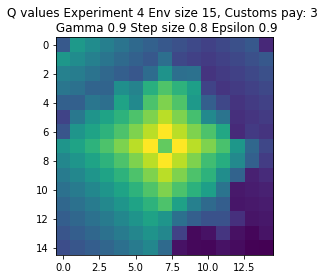

Expr:5 Eps:0 RunnAReward:-173.0 Reward:-3448 Timesteps:4156 GotPack:True Utiltime:2278 Customstime:2638 Money:5
Expr:5 Eps:20 RunnAReward:-1209.0 Reward:269 Timesteps:450 GotPack:False Utiltime:387 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-404.0 Reward:265 Timesteps:1423 GotPack:True Utiltime:175 Customstime:1177 Money:3
Expr:5 Eps:60 RunnAReward:-571.0 Reward:559 Timesteps:1362 GotPack:True Utiltime:696 Customstime:893 Money:3
Expr:5 Eps:80 RunnAReward:101.0 Reward:-49 Timesteps:450 GotPack:False Utiltime:56 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:80.0 Reward:-748 Timesteps:2252 GotPack:True Utiltime:678 Customstime:795 Money:3
Expr:5 Eps:120 RunnAReward:197.0 Reward:80 Timesteps:450 GotPack:False Utiltime:272 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:466.0 Reward:249 Timesteps:450 GotPack:False Utiltime:213 Customstime:0 Money:1
Expr:5 Eps:160 RunnAReward:240.0 Reward:1155 Timesteps:744 GotPack:True Utiltime:72 Customstime:204 Money:5
Expr:5 Eps:180 RunnAReward

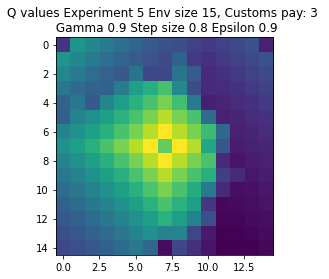

Expr:6 Eps:0 RunnAReward:6.0 Reward:126 Timesteps:675 GotPack:False Utiltime:366 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-640.0 Reward:-544 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-613.0 Reward:677 Timesteps:880 GotPack:True Utiltime:56 Customstime:421 Money:5
Expr:6 Eps:60 RunnAReward:-258.0 Reward:1132 Timesteps:696 GotPack:True Utiltime:87 Customstime:416 Money:5
Expr:6 Eps:80 RunnAReward:-164.0 Reward:-514 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:65.0 Reward:30 Timesteps:675 GotPack:False Utiltime:463 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:325.0 Reward:1018 Timesteps:961 GotPack:True Utiltime:114 Customstime:852 Money:3
Expr:6 Eps:140 RunnAReward:100.0 Reward:1240 Timesteps:787 GotPack:True Utiltime:122 Customstime:702 Money:3
Expr:6 Eps:160 RunnAReward:413.0 Reward:1370 Timesteps:386 GotPack:True Utiltime:86 Customstime:204 Money:3
Expr:6 Eps:180 RunnAReward:576.0 Reward

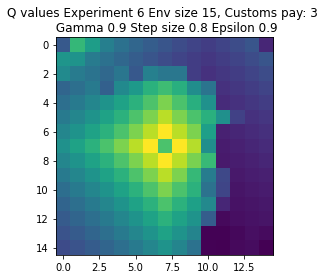

Expr:7 Eps:0 RunnAReward:-29.0 Reward:-565 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-1102.0 Reward:-120 Timesteps:1737 GotPack:True Utiltime:1228 Customstime:1374 Money:3
Expr:7 Eps:40 RunnAReward:-860.0 Reward:-404 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-212.0 Reward:278 Timesteps:450 GotPack:False Utiltime:212 Customstime:0 Money:1
Expr:7 Eps:80 RunnAReward:174.0 Reward:-26 Timesteps:450 GotPack:False Utiltime:129 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:36.0 Reward:14 Timesteps:450 GotPack:False Utiltime:217 Customstime:0 Money:1
Expr:7 Eps:120 RunnAReward:150.0 Reward:99 Timesteps:450 GotPack:False Utiltime:196 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:96.0 Reward:1036 Timesteps:886 GotPack:True Utiltime:56 Customstime:346 Money:3
Expr:7 Eps:160 RunnAReward:267.0 Reward:1108 Timesteps:783 GotPack:True Utiltime:269 Customstime:593 Money:3
Expr:7 Eps:180 RunnAReward:306.0 Rewa

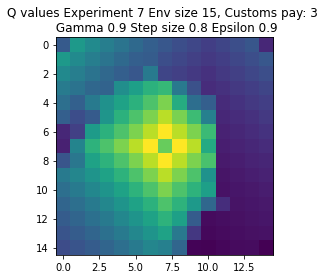

Expr:8 Eps:0 RunnAReward:-84.0 Reward:-1668 Timesteps:2672 GotPack:True Utiltime:1210 Customstime:2184 Money:3
Expr:8 Eps:20 RunnAReward:-722.0 Reward:-479 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-639.0 Reward:942 Timesteps:814 GotPack:True Utiltime:33 Customstime:336 Money:5
Expr:8 Eps:60 RunnAReward:-340.0 Reward:337 Timesteps:450 GotPack:False Utiltime:196 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-147.0 Reward:-2465 Timesteps:3877 GotPack:True Utiltime:1972 Customstime:2166 Money:5
Expr:8 Eps:100 RunnAReward:-152.0 Reward:-296 Timesteps:900 GotPack:False Utiltime:688 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:3.0 Reward:-286 Timesteps:675 GotPack:False Utiltime:70 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:-21.0 Reward:-588 Timesteps:1125 GotPack:False Utiltime:212 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:389.0 Reward:1042 Timesteps:887 GotPack:True Utiltime:153 Customstime:404 Money:4
Expr:8 Eps:180 RunnARewa

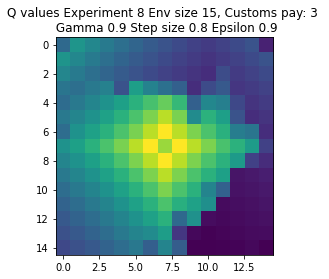

Expr:9 Eps:0 RunnAReward:-31.0 Reward:-608 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-675.0 Reward:-93 Timesteps:675 GotPack:False Utiltime:148 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-498.0 Reward:130 Timesteps:450 GotPack:False Utiltime:61 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-774.0 Reward:360 Timesteps:450 GotPack:False Utiltime:81 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-96.0 Reward:1168 Timesteps:825 GotPack:True Utiltime:220 Customstime:658 Money:5
Expr:9 Eps:100 RunnAReward:-138.0 Reward:-55 Timesteps:675 GotPack:False Utiltime:126 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:334.0 Reward:50 Timesteps:1450 GotPack:True Utiltime:146 Customstime:1032 Money:4
Expr:9 Eps:140 RunnAReward:407.0 Reward:1648 Timesteps:487 GotPack:True Utiltime:290 Customstime:436 Money:3
Expr:9 Eps:160 RunnAReward:453.0 Reward:-59 Timesteps:675 GotPack:False Utiltime:319 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:269.0 Rew

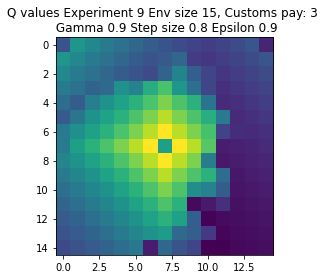

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.9 Step size 0.8 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-12.0 Reward:-233 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-812.0 Reward:-296 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-666.0 Reward:-89 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-573.0 Reward:106 Timesteps:450 GotPack:False Utiltime:396 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:28.0 Reward:0 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:119.0 Reward:377 Timesteps:225 GotPack:False Utiltime:162 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:49.0 Reward:-5 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Mo

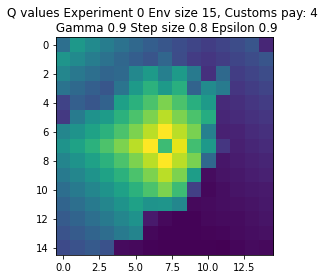

Expr:1 Eps:0 RunnAReward:-15.0 Reward:-285 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-367.0 Reward:-256 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-389.0 Reward:-606 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:60 RunnAReward:-380.0 Reward:260 Timesteps:225 GotPack:False Utiltime:92 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-340.0 Reward:-316 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:100 RunnAReward:106.0 Reward:1014 Timesteps:797 GotPack:True Utiltime:86 Customstime:425 Money:4
Expr:1 Eps:120 RunnAReward:-45.0 Reward:349 Timesteps:225 GotPack:False Utiltime:218 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:198.0 Reward:94 Timesteps:450 GotPack:False Utiltime:48 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:415.0 Reward:-78 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:146.0 Reward:370 Tim

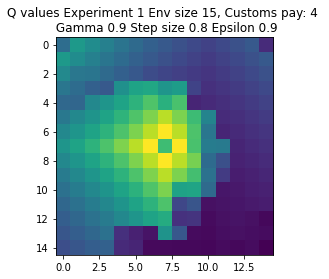

Expr:2 Eps:0 RunnAReward:-13.0 Reward:-254 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-434.0 Reward:-44 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-559.0 Reward:-53 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-242.0 Reward:-83 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:146.0 Reward:-257 Timesteps:675 GotPack:False Utiltime:304 Customstime:0 Money:3
Expr:2 Eps:100 RunnAReward:-69.0 Reward:603 Timesteps:1244 GotPack:True Utiltime:108 Customstime:551 Money:4
Expr:2 Eps:120 RunnAReward:-48.0 Reward:17 Timesteps:675 GotPack:False Utiltime:224 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:28.0 Reward:377 Timesteps:225 GotPack:False Utiltime:63 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:282.0 Reward:86 Timesteps:450 GotPack:False Utiltime:133 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:333.0 Reward:369 Time

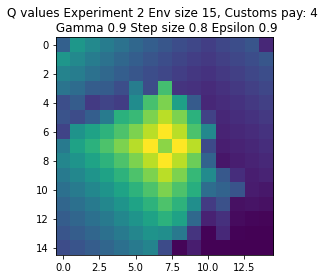

Expr:3 Eps:0 RunnAReward:-13.0 Reward:-249 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-614.0 Reward:-634 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:40 RunnAReward:-200.0 Reward:-217 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-533.0 Reward:-1428 Timesteps:2392 GotPack:True Utiltime:453 Customstime:1294 Money:4
Expr:3 Eps:80 RunnAReward:-286.0 Reward:-1422 Timesteps:2795 GotPack:True Utiltime:1173 Customstime:1513 Money:4
Expr:3 Eps:100 RunnAReward:-6.0 Reward:-241 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-68.0 Reward:572 Timesteps:225 GotPack:False Utiltime:164 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:170.0 Reward:260 Timesteps:450 GotPack:False Utiltime:155 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:184.0 Reward:31 Timesteps:450 GotPack:False Utiltime:149 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:192.0 R

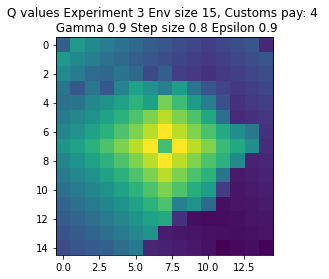

Expr:4 Eps:0 RunnAReward:-30.0 Reward:-595 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-301.0 Reward:-263 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-748.0 Reward:-91 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-197.0 Reward:651 Timesteps:225 GotPack:False Utiltime:188 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-163.0 Reward:-173 Timesteps:1701 GotPack:True Utiltime:1082 Customstime:1224 Money:4
Expr:4 Eps:100 RunnAReward:0.0 Reward:-110 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:271.0 Reward:612 Timesteps:225 GotPack:False Utiltime:54 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:266.0 Reward:480 Timesteps:225 GotPack:False Utiltime:153 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:400.0 Reward:286 Timesteps:450 GotPack:False Utiltime:194 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:275.0 Reward:25

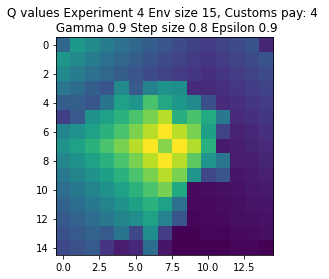

Expr:5 Eps:0 RunnAReward:-16.0 Reward:-305 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-690.0 Reward:-3133 Timesteps:4114 GotPack:True Utiltime:3100 Customstime:4046 Money:5
Expr:5 Eps:40 RunnAReward:-526.0 Reward:408 Timesteps:1445 GotPack:True Utiltime:426 Customstime:693 Money:5
Expr:5 Eps:60 RunnAReward:-154.0 Reward:-591 Timesteps:1955 GotPack:True Utiltime:25 Customstime:1542 Money:4
Expr:5 Eps:80 RunnAReward:-128.0 Reward:-498 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:-68.0 Reward:-169 Timesteps:675 GotPack:False Utiltime:41 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:246.0 Reward:382 Timesteps:225 GotPack:False Utiltime:121 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:-471.0 Reward:-324 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:279.0 Reward:272 Timesteps:225 GotPack:False Utiltime:149 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:298

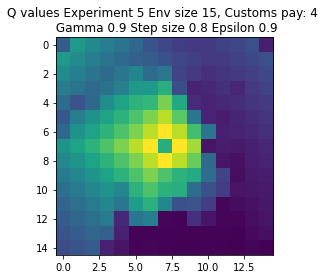

Expr:6 Eps:0 RunnAReward:-78.0 Reward:-1548 Timesteps:2830 GotPack:True Utiltime:829 Customstime:1699 Money:5
Expr:6 Eps:20 RunnAReward:-892.0 Reward:-254 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-344.0 Reward:-189 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-150.0 Reward:-61 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:26.0 Reward:353 Timesteps:225 GotPack:False Utiltime:52 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-176.0 Reward:301 Timesteps:450 GotPack:False Utiltime:100 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:35.0 Reward:-305 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:123.0 Reward:-55 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:131.0 Reward:-26 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:88.0 Reward:602 Tim

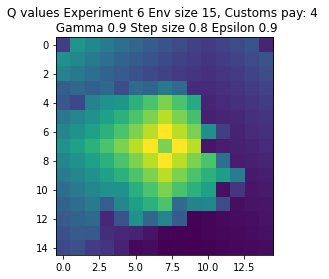

Expr:7 Eps:0 RunnAReward:-184.0 Reward:-3664 Timesteps:4591 GotPack:True Utiltime:653 Customstime:1106 Money:4
Expr:7 Eps:20 RunnAReward:-1061.0 Reward:-285 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-601.0 Reward:-3456 Timesteps:4211 GotPack:True Utiltime:2188 Customstime:4074 Money:5
Expr:7 Eps:60 RunnAReward:-300.0 Reward:-225 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-231.0 Reward:-49 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:106.0 Reward:329 Timesteps:225 GotPack:False Utiltime:32 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:56.0 Reward:442 Timesteps:225 GotPack:False Utiltime:35 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:154.0 Reward:-208 Timesteps:675 GotPack:False Utiltime:255 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:269.0 Reward:426 Timesteps:225 GotPack:False Utiltime:136 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:203.0

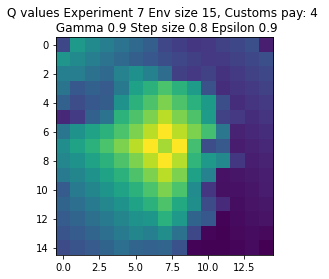

Expr:8 Eps:0 RunnAReward:-14.0 Reward:-270 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-397.0 Reward:-334 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-344.0 Reward:-287 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-506.0 Reward:545 Timesteps:225 GotPack:False Utiltime:181 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:1.0 Reward:542 Timesteps:225 GotPack:False Utiltime:40 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-52.0 Reward:-521 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:-74.0 Reward:390 Timesteps:225 GotPack:False Utiltime:105 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:80.0 Reward:-68 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:93.0 Reward:77 Timesteps:450 GotPack:False Utiltime:111 Customstime:0 Money:3
Expr:8 Eps:180 RunnAReward:374.0 Reward:295 Timestep

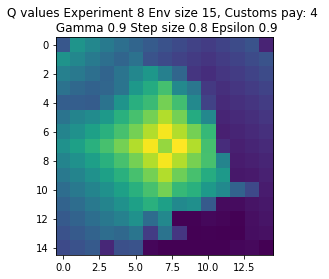

Expr:9 Eps:0 RunnAReward:25.0 Reward:516 Timesteps:1265 GotPack:True Utiltime:947 Customstime:1157 Money:4
Expr:9 Eps:20 RunnAReward:-304.0 Reward:-701 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-777.0 Reward:-93 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-234.0 Reward:272 Timesteps:225 GotPack:False Utiltime:194 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-226.0 Reward:-246 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-18.0 Reward:-16 Timesteps:450 GotPack:False Utiltime:342 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:-42.0 Reward:-240 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:81.0 Reward:365 Timesteps:225 GotPack:False Utiltime:32 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:128.0 Reward:410 Timesteps:225 GotPack:False Utiltime:140 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:295.0 Reward:521 

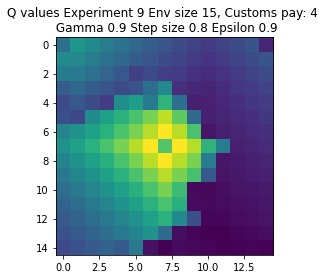

********************************************************************************************************
Env size 15, Customs pay: 3 Gamma 0.9 Step size 0.8 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-31.0 Reward:-615 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:20 RunnAReward:-452.0 Reward:5 Timesteps:450 GotPack:False Utiltime:414 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-1155.0 Reward:-130 Timesteps:1510 GotPack:True Utiltime:573 Customstime:1067 Money:3
Expr:0 Eps:60 RunnAReward:-960.0 Reward:-692 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-761.0 Reward:327 Timesteps:450 GotPack:False Utiltime:102 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-449.0 Reward:110 Timesteps:450 GotPack:False Utiltime:389 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:-320.0 Reward:-466 Timesteps:900 GotPack:False Utiltime:70

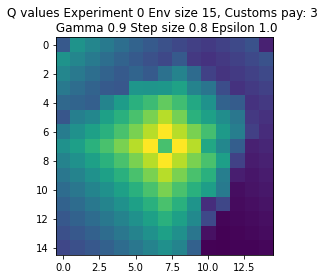

Expr:1 Eps:0 RunnAReward:-26.0 Reward:-508 Timesteps:900 GotPack:False Utiltime:182 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-761.0 Reward:-937 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-654.0 Reward:-515 Timesteps:2082 GotPack:True Utiltime:1012 Customstime:1077 Money:3
Expr:1 Eps:60 RunnAReward:-809.0 Reward:-305 Timesteps:1879 GotPack:True Utiltime:346 Customstime:590 Money:3
Expr:1 Eps:80 RunnAReward:-539.0 Reward:-631 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:100 RunnAReward:-181.0 Reward:-641 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:-370.0 Reward:745 Timesteps:985 GotPack:True Utiltime:325 Customstime:671 Money:3
Expr:1 Eps:140 RunnAReward:-77.0 Reward:115 Timesteps:450 GotPack:False Utiltime:115 Customstime:0 Money:1
Expr:1 Eps:160 RunnAReward:187.0 Reward:434 Timesteps:450 GotPack:False Utiltime:118 Customstime:0 Money:1
Expr:1 Eps:180 RunnAReward:226

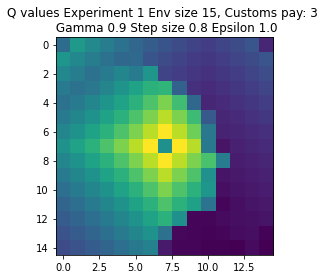

Expr:2 Eps:0 RunnAReward:-16.0 Reward:-317 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:20 RunnAReward:-996.0 Reward:-383 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-1369.0 Reward:-2477 Timesteps:3820 GotPack:True Utiltime:2651 Customstime:2844 Money:3
Expr:2 Eps:60 RunnAReward:-714.0 Reward:-362 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:80 RunnAReward:-494.0 Reward:-540 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-434.0 Reward:150 Timesteps:450 GotPack:False Utiltime:87 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-56.0 Reward:-93 Timesteps:450 GotPack:False Utiltime:149 Customstime:0 Money:1
Expr:2 Eps:140 RunnAReward:-398.0 Reward:206 Timesteps:450 GotPack:False Utiltime:118 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:15.0 Reward:899 Timesteps:1242 GotPack:True Utiltime:239 Customstime:391 Money:4
Expr:2 Eps:180 RunnAReward:200.0 R

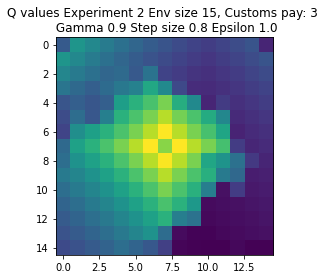

Expr:3 Eps:0 RunnAReward:-16.0 Reward:-319 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-987.0 Reward:-762 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-1188.0 Reward:-493 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-519.0 Reward:35 Timesteps:675 GotPack:False Utiltime:159 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:-230.0 Reward:-607 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-372.0 Reward:7 Timesteps:450 GotPack:False Utiltime:177 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-170.0 Reward:-634 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-324.0 Reward:-546 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:49.0 Reward:945 Timesteps:892 GotPack:True Utiltime:16 Customstime:730 Money:4
Expr:3 Eps:180 RunnAReward:332.0 Reward:-39 T

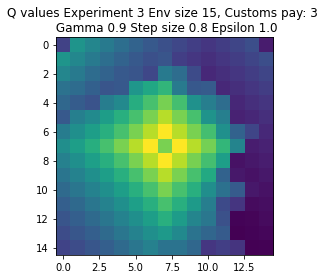

Expr:4 Eps:0 RunnAReward:9.0 Reward:196 Timesteps:450 GotPack:False Utiltime:202 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1072.0 Reward:-616 Timesteps:2098 GotPack:True Utiltime:120 Customstime:663 Money:5
Expr:4 Eps:40 RunnAReward:-589.0 Reward:-292 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-846.0 Reward:-738 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:80 RunnAReward:-985.0 Reward:229 Timesteps:450 GotPack:False Utiltime:119 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-948.0 Reward:-617 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-236.0 Reward:-347 Timesteps:900 GotPack:False Utiltime:78 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:-20.0 Reward:248 Timesteps:1630 GotPack:True Utiltime:486 Customstime:943 Money:3
Expr:4 Eps:160 RunnAReward:180.0 Reward:116 Timesteps:675 GotPack:False Utiltime:263 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:96.0 Rewa

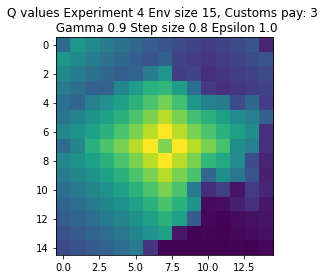

Expr:5 Eps:0 RunnAReward:-1.0 Reward:-7 Timesteps:450 GotPack:False Utiltime:166 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-1164.0 Reward:-902 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-1641.0 Reward:-3478 Timesteps:4072 GotPack:True Utiltime:1454 Customstime:2040 Money:4
Expr:5 Eps:60 RunnAReward:-1050.0 Reward:149 Timesteps:450 GotPack:False Utiltime:246 Customstime:0 Money:1
Expr:5 Eps:80 RunnAReward:-777.0 Reward:-381 Timesteps:675 GotPack:False Utiltime:180 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:-295.0 Reward:-36 Timesteps:675 GotPack:False Utiltime:290 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:-284.0 Reward:29 Timesteps:675 GotPack:False Utiltime:145 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:-62.0 Reward:122 Timesteps:450 GotPack:False Utiltime:45 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:134.0 Reward:182 Timesteps:450 GotPack:False Utiltime:104 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:205.0

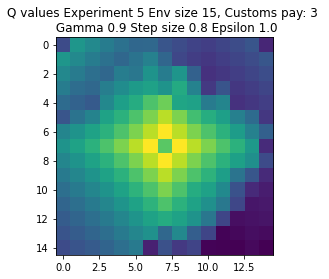

Expr:6 Eps:0 RunnAReward:-27.0 Reward:-537 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-678.0 Reward:-612 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:40 RunnAReward:-1047.0 Reward:84 Timesteps:450 GotPack:False Utiltime:62 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-1035.0 Reward:-566 Timesteps:900 GotPack:False Utiltime:291 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:-565.0 Reward:-509 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-522.0 Reward:-265 Timesteps:675 GotPack:False Utiltime:417 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:-636.0 Reward:-770 Timesteps:900 GotPack:False Utiltime:36 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:-20.0 Reward:-549 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:160 RunnAReward:117.0 Reward:217 Timesteps:450 GotPack:False Utiltime:206 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:341.0 Reward

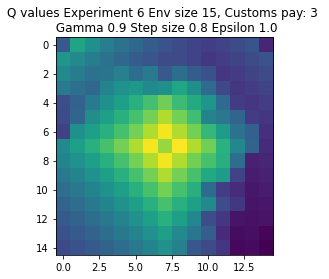

Expr:7 Eps:0 RunnAReward:-19.0 Reward:-379 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-1351.0 Reward:88 Timesteps:450 GotPack:False Utiltime:195 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-1143.0 Reward:-636 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-609.0 Reward:-700 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-453.0 Reward:639 Timesteps:1180 GotPack:True Utiltime:671 Customstime:989 Money:3
Expr:7 Eps:100 RunnAReward:-212.0 Reward:25 Timesteps:450 GotPack:False Utiltime:371 Customstime:0 Money:1
Expr:7 Eps:120 RunnAReward:-218.0 Reward:308 Timesteps:450 GotPack:False Utiltime:245 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-50.0 Reward:92 Timesteps:450 GotPack:False Utiltime:261 Customstime:0 Money:1
Expr:7 Eps:160 RunnAReward:-18.0 Reward:-355 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:204.0 Reward:

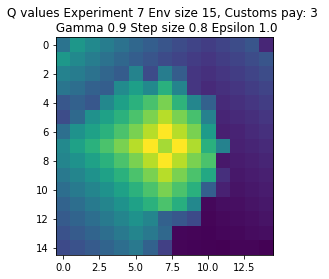

Expr:8 Eps:0 RunnAReward:-31.0 Reward:-616 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-1327.0 Reward:108 Timesteps:450 GotPack:False Utiltime:142 Customstime:0 Money:1
Expr:8 Eps:40 RunnAReward:-1189.0 Reward:-205 Timesteps:675 GotPack:False Utiltime:62 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-894.0 Reward:84 Timesteps:450 GotPack:False Utiltime:337 Customstime:0 Money:1
Expr:8 Eps:80 RunnAReward:-279.0 Reward:-297 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:-398.0 Reward:-523 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-17.0 Reward:-97 Timesteps:675 GotPack:False Utiltime:149 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:-428.0 Reward:-1123 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:-120.0 Reward:228 Timesteps:450 GotPack:False Utiltime:115 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:19.0 Reward

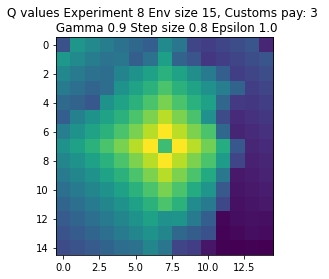

Expr:9 Eps:0 RunnAReward:-57.0 Reward:-1133 Timesteps:2293 GotPack:True Utiltime:1611 Customstime:1653 Money:5
Expr:9 Eps:20 RunnAReward:-1546.0 Reward:-426 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-1554.0 Reward:-738 Timesteps:2056 GotPack:True Utiltime:288 Customstime:691 Money:4
Expr:9 Eps:60 RunnAReward:-538.0 Reward:6 Timesteps:450 GotPack:False Utiltime:240 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-646.0 Reward:-311 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:-402.0 Reward:-2512 Timesteps:3574 GotPack:True Utiltime:135 Customstime:538 Money:3
Expr:9 Eps:120 RunnAReward:-300.0 Reward:-169 Timesteps:675 GotPack:False Utiltime:90 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:-136.0 Reward:365 Timesteps:450 GotPack:False Utiltime:217 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:141.0 Reward:94 Timesteps:675 GotPack:False Utiltime:79 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:

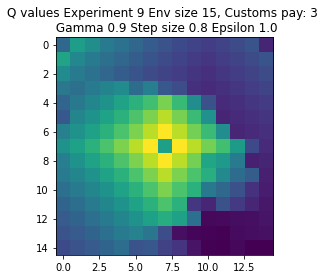

********************************************************************************************************
Env size 15, Customs pay: 4 Gamma 0.9 Step size 0.8 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-16.0 Reward:-308 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-549.0 Reward:-253 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-566.0 Reward:-256 Timesteps:900 GotPack:False Utiltime:477 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-316.0 Reward:-28 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-441.0 Reward:-3046 Timesteps:4011 GotPack:True Utiltime:2216 Customstime:2394 Money:4
Expr:0 Eps:100 RunnAReward:-273.0 Reward:-508 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:-290.0 Reward:-68 Timesteps:450 GotPack:False Utiltime:14

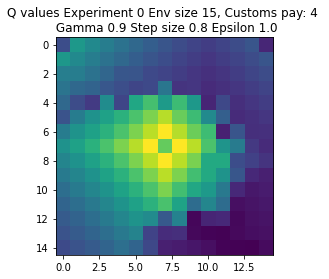

Expr:1 Eps:0 RunnAReward:-5.0 Reward:-97 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-552.0 Reward:-414 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-722.0 Reward:-348 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-174.0 Reward:-281 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-213.0 Reward:-257 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-285.0 Reward:393 Timesteps:225 GotPack:False Utiltime:224 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:70.0 Reward:354 Timesteps:225 GotPack:False Utiltime:193 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:-339.0 Reward:-671 Timesteps:2061 GotPack:True Utiltime:117 Customstime:367 Money:4
Expr:1 Eps:160 RunnAReward:-399.0 Reward:-57 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:-22.0 Reward:-33

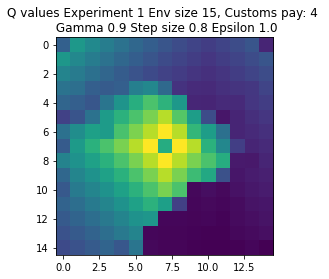

Expr:2 Eps:0 RunnAReward:-14.0 Reward:-276 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-640.0 Reward:-276 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-555.0 Reward:-230 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-220.0 Reward:-38 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-403.0 Reward:-484 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:100 RunnAReward:-435.0 Reward:-124 Timesteps:675 GotPack:False Utiltime:38 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:-349.0 Reward:-53 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-9.0 Reward:-331 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:-53.0 Reward:350 Timesteps:225 GotPack:False Utiltime:133 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:-111.0 Reward:314 Ti

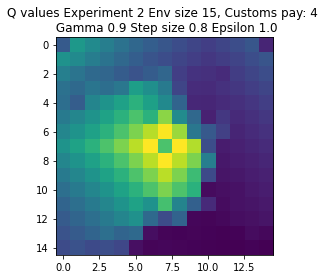

Expr:3 Eps:0 RunnAReward:-16.0 Reward:-315 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-776.0 Reward:-159 Timesteps:675 GotPack:False Utiltime:179 Customstime:0 Money:2
Expr:3 Eps:40 RunnAReward:-521.0 Reward:-1564 Timesteps:2653 GotPack:True Utiltime:1585 Customstime:1720 Money:5
Expr:3 Eps:60 RunnAReward:-757.0 Reward:-426 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-359.0 Reward:-90 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-288.0 Reward:-8 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-187.0 Reward:-2584 Timesteps:3540 GotPack:True Utiltime:2948 Customstime:3040 Money:4
Expr:3 Eps:140 RunnAReward:-227.0 Reward:168 Timesteps:450 GotPack:False Utiltime:137 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:18.0 Reward:357 Timesteps:225 GotPack:False Utiltime:93 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:61.0 

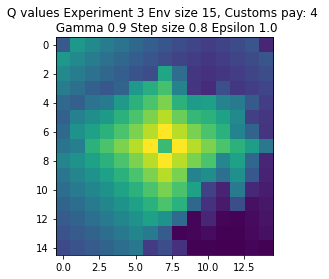

Expr:4 Eps:0 RunnAReward:17.0 Reward:340 Timesteps:225 GotPack:False Utiltime:183 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-428.0 Reward:0 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-448.0 Reward:310 Timesteps:450 GotPack:False Utiltime:311 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-539.0 Reward:-1083 Timesteps:900 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:-492.0 Reward:-1278 Timesteps:2675 GotPack:True Utiltime:1502 Customstime:1647 Money:5
Expr:4 Eps:100 RunnAReward:-163.0 Reward:-496 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:120 RunnAReward:-179.0 Reward:337 Timesteps:450 GotPack:False Utiltime:89 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:-117.0 Reward:-364 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:-268.0 Reward:337 Timesteps:225 GotPack:False Utiltime:221 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:69.0 Rewar

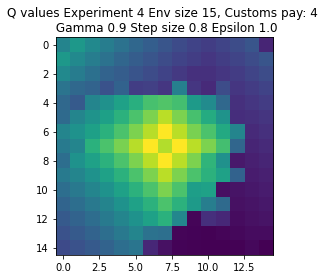

Expr:5 Eps:0 RunnAReward:4.0 Reward:91 Timesteps:450 GotPack:False Utiltime:151 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-275.0 Reward:-375 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-1004.0 Reward:318 Timesteps:225 GotPack:False Utiltime:129 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-1042.0 Reward:-343 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-415.0 Reward:-104 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-110.0 Reward:-313 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:43.0 Reward:385 Timesteps:450 GotPack:False Utiltime:77 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:163.0 Reward:79 Timesteps:450 GotPack:False Utiltime:166 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:-158.0 Reward:-191 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:246.0 Reward:1096 T

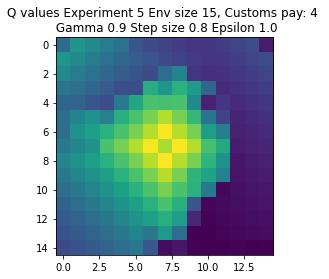

Expr:6 Eps:0 RunnAReward:-59.0 Reward:-1164 Timesteps:2241 GotPack:True Utiltime:623 Customstime:807 Money:5
Expr:6 Eps:20 RunnAReward:-878.0 Reward:-655 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-518.0 Reward:-335 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-586.0 Reward:-274 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-460.0 Reward:-4089 Timesteps:4528 GotPack:True Utiltime:1724 Customstime:2258 Money:4
Expr:6 Eps:100 RunnAReward:-445.0 Reward:-111 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-11.0 Reward:-44 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:-157.0 Reward:-257 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:8.0 Reward:-166 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:97.0 Rewar

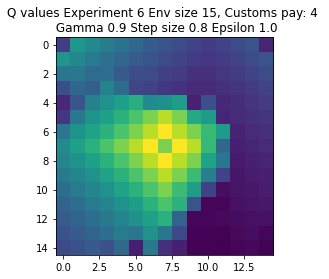

Expr:7 Eps:0 RunnAReward:-23.0 Reward:-459 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-647.0 Reward:-127 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-324.0 Reward:-297 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-459.0 Reward:-3358 Timesteps:3984 GotPack:True Utiltime:2179 Customstime:2810 Money:5
Expr:7 Eps:80 RunnAReward:-413.0 Reward:-748 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:100 RunnAReward:-301.0 Reward:-476 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:-175.0 Reward:-386 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-24.0 Reward:-174 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:-24.0 Reward:332 Timesteps:450 GotPack:False Utiltime:441 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:54.0 Reward

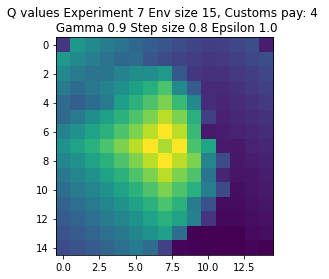

Expr:8 Eps:0 RunnAReward:-4.0 Reward:-77 Timesteps:450 GotPack:False Utiltime:182 Customstime:0 Money:3
Expr:8 Eps:20 RunnAReward:-597.0 Reward:-270 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-557.0 Reward:-689 Timesteps:675 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:60 RunnAReward:-642.0 Reward:-255 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-129.0 Reward:-390 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:-740.0 Reward:-51 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-122.0 Reward:-227 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:88.0 Reward:1160 Timesteps:658 GotPack:True Utiltime:63 Customstime:369 Money:4
Expr:8 Eps:160 RunnAReward:-140.0 Reward:-230 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:109.0 Reward:412 T

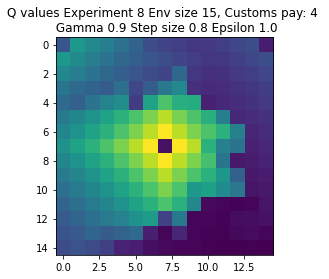

Expr:9 Eps:0 RunnAReward:-26.0 Reward:-515 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-406.0 Reward:-350 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-422.0 Reward:-642 Timesteps:450 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-372.0 Reward:-317 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-260.0 Reward:229 Timesteps:225 GotPack:False Utiltime:84 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-269.0 Reward:-21 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-271.0 Reward:-24 Timesteps:225 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-177.0 Reward:344 Timesteps:450 GotPack:False Utiltime:432 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:-17.0 Reward:245 Timesteps:225 GotPack:False Utiltime:68 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:-21.0 Reward:607 Ti

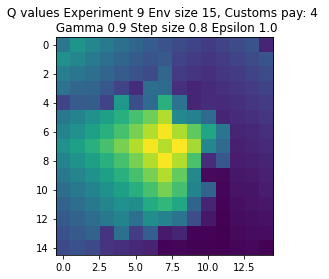

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.7 Step size 0.4 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:15.0 Reward:300 Timesteps:800 GotPack:False Utiltime:22 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-1274.0 Reward:-939 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-907.0 Reward:186 Timesteps:800 GotPack:False Utiltime:354 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-815.0 Reward:-1134 Timesteps:3763 GotPack:True Utiltime:28 Customstime:707 Money:4
Expr:0 Eps:80 RunnAReward:-245.0 Reward:-805 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:152.0 Reward:-957 Timesteps:3776 GotPack:True Utiltime:2983 Customstime:3222 Money:3
Expr:0 Eps:120 RunnAReward:-133.0 Reward:-5534 Timesteps:7780 GotPack:True Utiltim

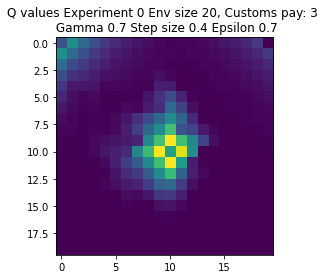

Expr:1 Eps:0 RunnAReward:-458.0 Reward:-9160 Timesteps:9254 GotPack:True Utiltime:2911 Customstime:3940 Money:3
Expr:1 Eps:20 RunnAReward:-1861.0 Reward:-6791 Timesteps:7784 GotPack:True Utiltime:1391 Customstime:1864 Money:3
Expr:1 Eps:40 RunnAReward:-1492.0 Reward:-607 Timesteps:1200 GotPack:False Utiltime:374 Customstime:0 Money:2
Expr:1 Eps:60 RunnAReward:-498.0 Reward:-675 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-873.0 Reward:-1789 Timesteps:4274 GotPack:True Utiltime:3270 Customstime:3914 Money:5
Expr:1 Eps:100 RunnAReward:-376.0 Reward:-843 Timesteps:1600 GotPack:False Utiltime:701 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:360.0 Reward:378 Timesteps:800 GotPack:False Utiltime:215 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:502.0 Reward:-724 Timesteps:1600 GotPack:False Utiltime:262 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:94.0 Reward:1553 Timesteps:1615 GotPack:True Utiltime:631 Customstime:1195 Money:3
Expr:1 Ep

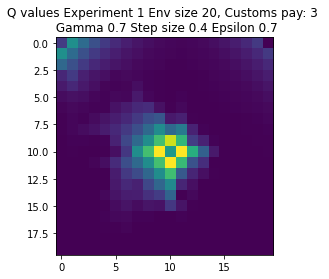

Expr:2 Eps:0 RunnAReward:-416.0 Reward:-8311 Timesteps:9261 GotPack:True Utiltime:7616 Customstime:7838 Money:5
Expr:2 Eps:20 RunnAReward:-1731.0 Reward:-646 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-1817.0 Reward:308 Timesteps:800 GotPack:False Utiltime:426 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-227.0 Reward:583 Timesteps:800 GotPack:False Utiltime:537 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-314.0 Reward:236 Timesteps:3208 GotPack:True Utiltime:2434 Customstime:3097 Money:3
Expr:2 Eps:100 RunnAReward:-292.0 Reward:-215 Timesteps:1200 GotPack:False Utiltime:38 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:644.0 Reward:1501 Timesteps:1817 GotPack:True Utiltime:1079 Customstime:1580 Money:4
Expr:2 Eps:140 RunnAReward:282.0 Reward:652 Timesteps:800 GotPack:False Utiltime:240 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:799.0 Reward:-921 Timesteps:3648 GotPack:True Utiltime:3151 Customstime:3477 Money:3
Expr:2 Eps:180 

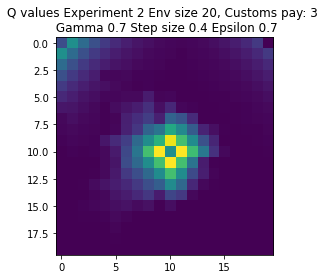

Expr:3 Eps:0 RunnAReward:-60.0 Reward:-1188 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-1971.0 Reward:-4180 Timesteps:5845 GotPack:True Utiltime:3606 Customstime:4316 Money:4
Expr:3 Eps:40 RunnAReward:-1579.0 Reward:613 Timesteps:2619 GotPack:True Utiltime:344 Customstime:1339 Money:5
Expr:3 Eps:60 RunnAReward:-938.0 Reward:316 Timesteps:800 GotPack:False Utiltime:6 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:311.0 Reward:-199 Timesteps:1200 GotPack:False Utiltime:189 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:220.0 Reward:1731 Timesteps:1681 GotPack:True Utiltime:1141 Customstime:1264 Money:3
Expr:3 Eps:120 RunnAReward:62.0 Reward:-187 Timesteps:1200 GotPack:False Utiltime:103 Customstime:0 Money:1
Expr:3 Eps:140 RunnAReward:706.0 Reward:-107 Timesteps:1200 GotPack:False Utiltime:28 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:669.0 Reward:2006 Timesteps:1599 GotPack:True Utiltime:80 Customstime:1048 Money:3
Expr:3 Eps:180 Runn

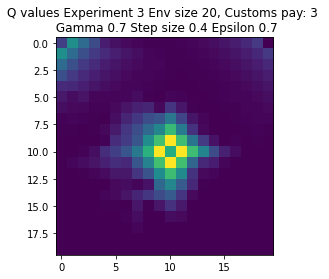

Expr:4 Eps:0 RunnAReward:-46.0 Reward:-915 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1317.0 Reward:-970 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-1794.0 Reward:-159 Timesteps:1200 GotPack:False Utiltime:381 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-1215.0 Reward:41 Timesteps:1200 GotPack:False Utiltime:135 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:-450.0 Reward:503 Timesteps:800 GotPack:False Utiltime:478 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:43.0 Reward:184 Timesteps:1200 GotPack:False Utiltime:1061 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:14.0 Reward:-912 Timesteps:3033 GotPack:True Utiltime:386 Customstime:1979 Money:3
Expr:4 Eps:140 RunnAReward:434.0 Reward:588 Timesteps:800 GotPack:False Utiltime:527 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:331.0 Reward:-114 Timesteps:1200 GotPack:False Utiltime:666 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:464

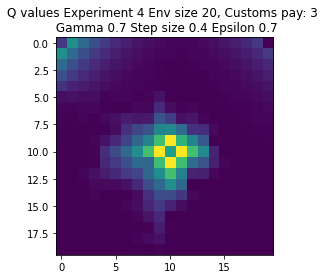

Expr:5 Eps:0 RunnAReward:-101.0 Reward:-2018 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-1142.0 Reward:-10186 Timesteps:10656 GotPack:True Utiltime:8501 Customstime:9536 Money:5
Expr:5 Eps:40 RunnAReward:-2038.0 Reward:14 Timesteps:1200 GotPack:False Utiltime:361 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-326.0 Reward:574 Timesteps:800 GotPack:False Utiltime:319 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-639.0 Reward:-1120 Timesteps:3740 GotPack:True Utiltime:196 Customstime:908 Money:3
Expr:5 Eps:100 RunnAReward:-482.0 Reward:-405 Timesteps:1200 GotPack:False Utiltime:152 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:-442.0 Reward:-2157 Timesteps:4486 GotPack:True Utiltime:85 Customstime:2862 Money:4
Expr:5 Eps:140 RunnAReward:-257.0 Reward:263 Timesteps:1200 GotPack:False Utiltime:32 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:609.0 Reward:-313 Timesteps:1200 GotPack:False Utiltime:64 Customstime:0 Money:2
Expr:5 Eps:18

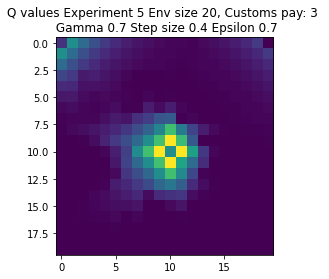

Expr:6 Eps:0 RunnAReward:-638.0 Reward:-12757 Timesteps:12000 GotPack:False Utiltime:10714 Customstime:11882 Money:4
Expr:6 Eps:20 RunnAReward:-2416.0 Reward:-1506 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-1529.0 Reward:-1125 Timesteps:1600 GotPack:False Utiltime:692 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-1246.0 Reward:265 Timesteps:2675 GotPack:True Utiltime:1007 Customstime:1186 Money:3
Expr:6 Eps:80 RunnAReward:-747.0 Reward:-3435 Timesteps:5342 GotPack:True Utiltime:92 Customstime:1641 Money:5
Expr:6 Eps:100 RunnAReward:-97.0 Reward:-962 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:51.0 Reward:269 Timesteps:2832 GotPack:True Utiltime:56 Customstime:708 Money:3
Expr:6 Eps:140 RunnAReward:605.0 Reward:-44 Timesteps:2861 GotPack:True Utiltime:728 Customstime:1654 Money:5
Expr:6 Eps:160 RunnAReward:221.0 Reward:531 Timesteps:800 GotPack:False Utiltime:103 Customstime:0 Money:0
Expr:6 Eps

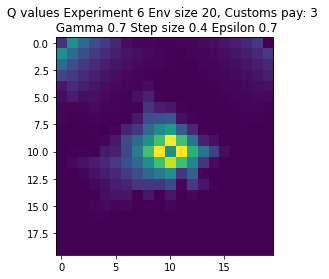

Expr:7 Eps:0 RunnAReward:-73.0 Reward:-1450 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-1292.0 Reward:-3815 Timesteps:5492 GotPack:True Utiltime:3635 Customstime:3887 Money:3
Expr:7 Eps:40 RunnAReward:-1486.0 Reward:-2825 Timesteps:4840 GotPack:True Utiltime:3405 Customstime:4437 Money:5
Expr:7 Eps:60 RunnAReward:-316.0 Reward:224 Timesteps:800 GotPack:False Utiltime:415 Customstime:0 Money:1
Expr:7 Eps:80 RunnAReward:-216.0 Reward:2011 Timesteps:1380 GotPack:True Utiltime:913 Customstime:1059 Money:3
Expr:7 Eps:100 RunnAReward:63.0 Reward:-530 Timesteps:1200 GotPack:False Utiltime:281 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:-160.0 Reward:-38 Timesteps:1200 GotPack:False Utiltime:32 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:417.0 Reward:1670 Timesteps:1749 GotPack:True Utiltime:201 Customstime:1213 Money:3
Expr:7 Eps:160 RunnAReward:669.0 Reward:610 Timesteps:800 GotPack:False Utiltime:508 Customstime:0 Money:0
Expr:7 Eps:180

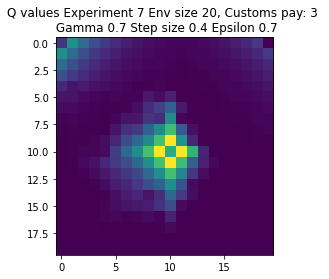

Expr:8 Eps:0 RunnAReward:2.0 Reward:51 Timesteps:800 GotPack:False Utiltime:49 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-1039.0 Reward:323 Timesteps:800 GotPack:False Utiltime:800 Customstime:0 Money:1
Expr:8 Eps:40 RunnAReward:-1245.0 Reward:-1994 Timesteps:4346 GotPack:True Utiltime:1876 Customstime:2487 Money:4
Expr:8 Eps:60 RunnAReward:-1140.0 Reward:14 Timesteps:3141 GotPack:True Utiltime:438 Customstime:2687 Money:5
Expr:8 Eps:80 RunnAReward:-660.0 Reward:1230 Timesteps:1828 GotPack:True Utiltime:1287 Customstime:1662 Money:3
Expr:8 Eps:100 RunnAReward:-22.0 Reward:94 Timesteps:800 GotPack:False Utiltime:100 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-367.0 Reward:-81 Timesteps:2741 GotPack:True Utiltime:737 Customstime:1213 Money:4
Expr:8 Eps:140 RunnAReward:187.0 Reward:576 Timesteps:2414 GotPack:True Utiltime:792 Customstime:1020 Money:4
Expr:8 Eps:160 RunnAReward:303.0 Reward:485 Timesteps:2464 GotPack:True Utiltime:97 Customstime:1198 Money:3
Expr:8 Eps:180 Runn

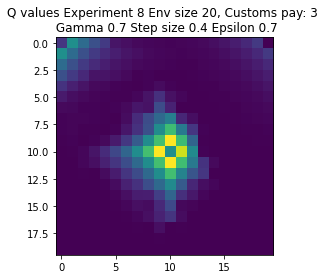

Expr:9 Eps:0 RunnAReward:-117.0 Reward:-2328 Timesteps:4500 GotPack:True Utiltime:827 Customstime:959 Money:5
Expr:9 Eps:20 RunnAReward:-616.0 Reward:-527 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-1440.0 Reward:303 Timesteps:800 GotPack:False Utiltime:385 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-88.0 Reward:965 Timesteps:2154 GotPack:True Utiltime:1099 Customstime:1685 Money:3
Expr:9 Eps:80 RunnAReward:-150.0 Reward:-815 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:100 RunnAReward:180.0 Reward:536 Timesteps:800 GotPack:False Utiltime:79 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:319.0 Reward:-189 Timesteps:1600 GotPack:False Utiltime:339 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:318.0 Reward:-468 Timesteps:1600 GotPack:False Utiltime:84 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:771.0 Reward:613 Timesteps:800 GotPack:False Utiltime:194 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:574

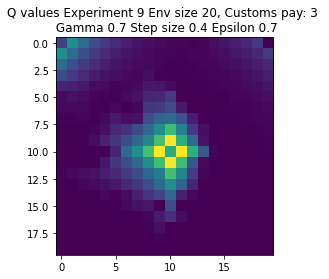

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.7 Step size 0.4 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-17.0 Reward:-323 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-1825.0 Reward:-912 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-663.0 Reward:-470 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-889.0 Reward:-275 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-373.0 Reward:-226 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:370.0 Reward:43 Timesteps:800 GotPack:False Utiltime:75 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:-646.0 Reward:-107 Timesteps:400 GotPack:False Utiltime:0 Customst

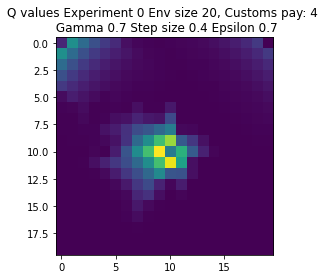

Expr:1 Eps:0 RunnAReward:-3.0 Reward:-42 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-1438.0 Reward:-477 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-855.0 Reward:-1339 Timesteps:4106 GotPack:True Utiltime:733 Customstime:847 Money:5
Expr:1 Eps:60 RunnAReward:-84.0 Reward:-296 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-424.0 Reward:275 Timesteps:800 GotPack:False Utiltime:72 Customstime:0 Money:3
Expr:1 Eps:100 RunnAReward:-768.0 Reward:-142 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:352.0 Reward:649 Timesteps:400 GotPack:False Utiltime:236 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:340.0 Reward:-156 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:0.0 Reward:-545 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:-40.0 Reward:1019 

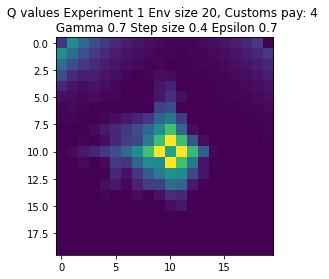

Expr:2 Eps:0 RunnAReward:-48.0 Reward:-946 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-1044.0 Reward:-638 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-741.0 Reward:-660 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-450.0 Reward:-822 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:-139.0 Reward:670 Timesteps:400 GotPack:False Utiltime:43 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:585.0 Reward:2387 Timesteps:916 GotPack:True Utiltime:158 Customstime:502 Money:4
Expr:2 Eps:120 RunnAReward:208.0 Reward:1564 Timesteps:1585 GotPack:True Utiltime:937 Customstime:1091 Money:5
Expr:2 Eps:140 RunnAReward:454.0 Reward:202 Timesteps:800 GotPack:False Utiltime:71 Customstime:0 Money:3
Expr:2 Eps:160 RunnAReward:481.0 Reward:458 Timesteps:800 GotPack:False Utiltime:291 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:460.0 Rewar

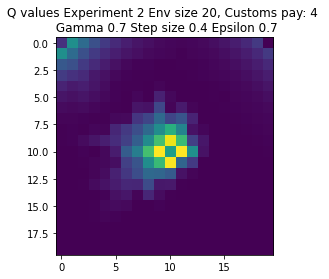

Expr:3 Eps:0 RunnAReward:-37.0 Reward:-722 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-1676.0 Reward:-778 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-401.0 Reward:-63 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-57.0 Reward:1053 Timesteps:400 GotPack:False Utiltime:346 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:113.0 Reward:551 Timesteps:400 GotPack:False Utiltime:22 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-177.0 Reward:-1438 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:-105.0 Reward:551 Timesteps:400 GotPack:False Utiltime:217 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:434.0 Reward:26 Timesteps:800 GotPack:False Utiltime:15 Customstime:0 Money:3
Expr:3 Eps:160 RunnAReward:611.0 Reward:-49 Timesteps:1200 GotPack:False Utiltime:201 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:319.0 Reward:-19

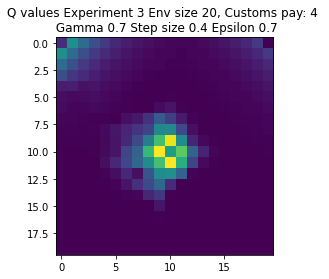

Expr:4 Eps:0 RunnAReward:-13.0 Reward:-249 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1110.0 Reward:-718 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-737.0 Reward:-1208 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-790.0 Reward:-735 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-747.0 Reward:219 Timesteps:2484 GotPack:True Utiltime:1517 Customstime:1666 Money:5
Expr:4 Eps:100 RunnAReward:136.0 Reward:-445 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:179.0 Reward:-117 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:211.0 Reward:-742 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:394.0 Reward:-745 Timesteps:3392 GotPack:True Utiltime:414 Customstime:613 Money:5
Expr:4 Eps:180 RunnAReward:464.0 Rewa

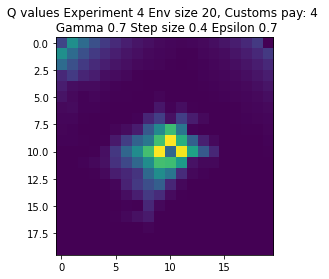

Expr:5 Eps:0 RunnAReward:-54.0 Reward:-1073 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-1434.0 Reward:555 Timesteps:400 GotPack:False Utiltime:340 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-919.0 Reward:-455 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-246.0 Reward:-1213 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:5 Eps:80 RunnAReward:-92.0 Reward:-50 Timesteps:800 GotPack:False Utiltime:116 Customstime:0 Money:3
Expr:5 Eps:100 RunnAReward:219.0 Reward:-132 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:288.0 Reward:-194 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:695.0 Reward:440 Timesteps:800 GotPack:False Utiltime:21 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:670.0 Reward:1048 Timesteps:400 GotPack:False Utiltime:16 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:560.0 Reward:-68

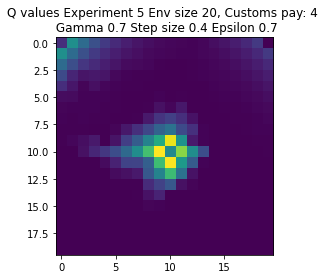

Expr:6 Eps:0 RunnAReward:-29.0 Reward:-575 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-1488.0 Reward:-400 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-522.0 Reward:-342 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-971.0 Reward:599 Timesteps:400 GotPack:False Utiltime:208 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:167.0 Reward:1665 Timesteps:1803 GotPack:True Utiltime:503 Customstime:738 Money:5
Expr:6 Eps:100 RunnAReward:211.0 Reward:537 Timesteps:400 GotPack:False Utiltime:78 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-471.0 Reward:350 Timesteps:800 GotPack:False Utiltime:4 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:72.0 Reward:1922 Timesteps:1518 GotPack:True Utiltime:70 Customstime:865 Money:4
Expr:6 Eps:160 RunnAReward:367.0 Reward:-38 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:371.0 Reward:-6

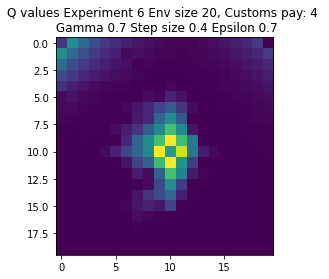

Expr:7 Eps:0 RunnAReward:-56.0 Reward:-1118 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-642.0 Reward:-687 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-771.0 Reward:293 Timesteps:800 GotPack:False Utiltime:407 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-335.0 Reward:-76 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-776.0 Reward:275 Timesteps:2792 GotPack:True Utiltime:1123 Customstime:1366 Money:4
Expr:7 Eps:100 RunnAReward:-409.0 Reward:-637 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:-396.0 Reward:-1565 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:256.0 Reward:-205 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:299.0 Reward:446 Timesteps:2526 GotPack:True Utiltime:149 Customstime:1285 Money:4
Expr:7 Eps:180 RunnAReward:477.0 R

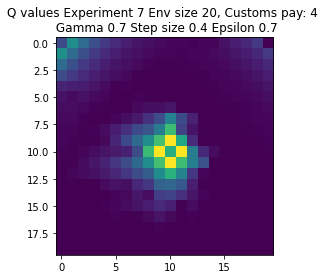

Expr:8 Eps:0 RunnAReward:-56.0 Reward:-1109 Timesteps:3779 GotPack:True Utiltime:1289 Customstime:1363 Money:5
Expr:8 Eps:20 RunnAReward:-951.0 Reward:-16 Timesteps:800 GotPack:False Utiltime:56 Customstime:0 Money:3
Expr:8 Eps:40 RunnAReward:-234.0 Reward:-202 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-827.0 Reward:-4142 Timesteps:5648 GotPack:True Utiltime:2568 Customstime:3165 Money:5
Expr:8 Eps:80 RunnAReward:-494.0 Reward:-840 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:100 RunnAReward:177.0 Reward:2724 Timesteps:598 GotPack:True Utiltime:112 Customstime:451 Money:5
Expr:8 Eps:120 RunnAReward:-213.0 Reward:654 Timesteps:400 GotPack:False Utiltime:13 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:452.0 Reward:-108 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:519.0 Reward:-729 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:180 RunnAReward:-13

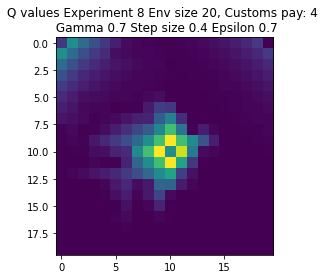

Expr:9 Eps:0 RunnAReward:-56.0 Reward:-1114 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-1247.0 Reward:-333 Timesteps:800 GotPack:False Utiltime:27 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-766.0 Reward:-1067 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-158.0 Reward:364 Timesteps:800 GotPack:False Utiltime:496 Customstime:0 Money:3
Expr:9 Eps:80 RunnAReward:-1201.0 Reward:-459 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:22.0 Reward:-2604 Timesteps:4726 GotPack:True Utiltime:2899 Customstime:4169 Money:5
Expr:9 Eps:120 RunnAReward:-21.0 Reward:685 Timesteps:800 GotPack:False Utiltime:362 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:111.0 Reward:1899 Timesteps:1550 GotPack:True Utiltime:1299 Customstime:1483 Money:5
Expr:9 Eps:160 RunnAReward:544.0 Reward:203 Timesteps:800 GotPack:False Utiltime:257 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:8

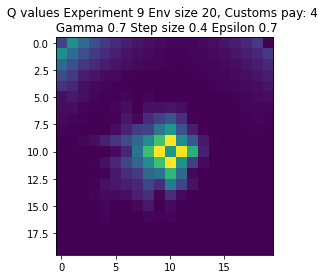

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.7 Step size 0.4 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:30.0 Reward:602 Timesteps:800 GotPack:False Utiltime:310 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-2014.0 Reward:27 Timesteps:1200 GotPack:False Utiltime:530 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-1765.0 Reward:-1852 Timesteps:4069 GotPack:True Utiltime:2514 Customstime:3319 Money:5
Expr:0 Eps:60 RunnAReward:-836.0 Reward:-1419 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:-1198.0 Reward:-1709 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-828.0 Reward:-539 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:29.0 Reward:-904 Timesteps:800 GotPack:False Utilt

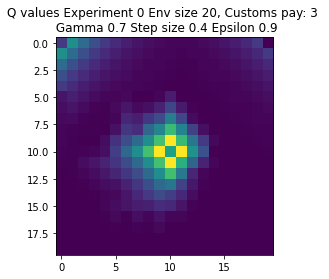

Expr:1 Eps:0 RunnAReward:-90.0 Reward:-1793 Timesteps:4295 GotPack:True Utiltime:2930 Customstime:3180 Money:5
Expr:1 Eps:20 RunnAReward:-1703.0 Reward:-1140 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-965.0 Reward:-146 Timesteps:800 GotPack:False Utiltime:282 Customstime:0 Money:1
Expr:1 Eps:60 RunnAReward:-1842.0 Reward:-571 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-1462.0 Reward:640 Timesteps:800 GotPack:False Utiltime:61 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-746.0 Reward:-1113 Timesteps:3180 GotPack:True Utiltime:1441 Customstime:1660 Money:3
Expr:1 Eps:120 RunnAReward:-767.0 Reward:288 Timesteps:2758 GotPack:True Utiltime:1969 Customstime:2508 Money:3
Expr:1 Eps:140 RunnAReward:-94.0 Reward:-584 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:160 RunnAReward:-483.0 Reward:322 Timesteps:800 GotPack:False Utiltime:314 Customstime:0 Money:0
Expr:1 Eps:180 Runn

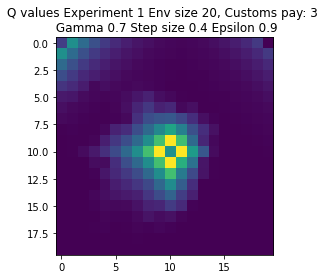

Expr:2 Eps:0 RunnAReward:-52.0 Reward:-1037 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-2120.0 Reward:-682 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-1558.0 Reward:-2461 Timesteps:4677 GotPack:True Utiltime:1662 Customstime:1712 Money:5
Expr:2 Eps:60 RunnAReward:-2869.0 Reward:481 Timesteps:800 GotPack:False Utiltime:154 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-640.0 Reward:-4508 Timesteps:6270 GotPack:True Utiltime:4132 Customstime:4931 Money:5
Expr:2 Eps:100 RunnAReward:-918.0 Reward:-984 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-209.0 Reward:20 Timesteps:1200 GotPack:False Utiltime:778 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:-580.0 Reward:478 Timesteps:800 GotPack:False Utiltime:146 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:133.0 Reward:39 Timesteps:800 GotPack:False Utiltime:305 Customstime:0 Money:0
Expr:2 Eps:180 RunnARewa

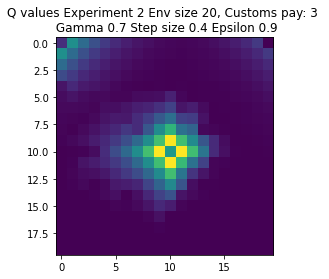

Expr:3 Eps:0 RunnAReward:-53.0 Reward:-1046 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-1458.0 Reward:-782 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-1284.0 Reward:-6717 Timesteps:7642 GotPack:True Utiltime:911 Customstime:2769 Money:5
Expr:3 Eps:60 RunnAReward:-1661.0 Reward:-198 Timesteps:3014 GotPack:True Utiltime:2247 Customstime:2917 Money:5
Expr:3 Eps:80 RunnAReward:-875.0 Reward:-667 Timesteps:1600 GotPack:False Utiltime:380 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:-409.0 Reward:-1344 Timesteps:3970 GotPack:True Utiltime:414 Customstime:1106 Money:3
Expr:3 Eps:120 RunnAReward:-302.0 Reward:-251 Timesteps:1200 GotPack:False Utiltime:757 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:-533.0 Reward:622 Timesteps:800 GotPack:False Utiltime:462 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:-507.0 Reward:552 Timesteps:800 GotPack:False Utiltime:45 Customstime:0 Money:0
Expr:3 Eps:180 

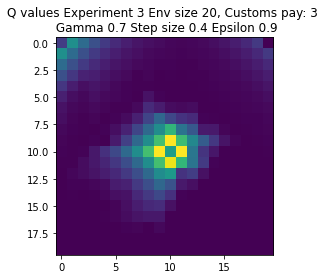

Expr:4 Eps:0 RunnAReward:-25.0 Reward:-484 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-3966.0 Reward:-294 Timesteps:1200 GotPack:False Utiltime:303 Customstime:0 Money:1
Expr:4 Eps:40 RunnAReward:-1131.0 Reward:168 Timesteps:2708 GotPack:True Utiltime:1880 Customstime:2370 Money:3
Expr:4 Eps:60 RunnAReward:-786.0 Reward:-925 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-795.0 Reward:-4489 Timesteps:5942 GotPack:True Utiltime:7 Customstime:803 Money:4
Expr:4 Eps:100 RunnAReward:-929.0 Reward:-1056 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:120 RunnAReward:-611.0 Reward:536 Timesteps:800 GotPack:False Utiltime:81 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:-430.0 Reward:-781 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:494.0 Reward:226 Timesteps:2090 GotPack:True Utiltime:83 Customstime:1873 Money:4
Expr:4 Eps:180 RunnAReward:2

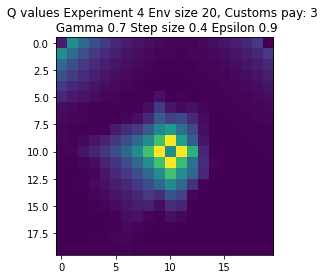

Expr:5 Eps:0 RunnAReward:-47.0 Reward:-929 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:20 RunnAReward:-1872.0 Reward:477 Timesteps:800 GotPack:False Utiltime:256 Customstime:0 Money:1
Expr:5 Eps:40 RunnAReward:-1192.0 Reward:-853 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-1596.0 Reward:489 Timesteps:800 GotPack:False Utiltime:40 Customstime:0 Money:1
Expr:5 Eps:80 RunnAReward:-550.0 Reward:-161 Timesteps:800 GotPack:False Utiltime:626 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-107.0 Reward:-1188 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:120 RunnAReward:-809.0 Reward:397 Timesteps:800 GotPack:False Utiltime:37 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:41.0 Reward:-1556 Timesteps:3982 GotPack:True Utiltime:977 Customstime:2410 Money:4
Expr:5 Eps:160 RunnAReward:430.0 Reward:161 Timesteps:800 GotPack:False Utiltime:220 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:751.0 

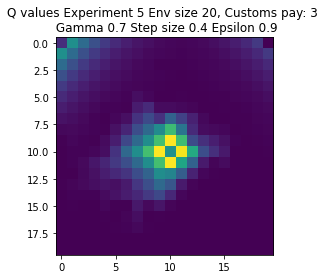

Expr:6 Eps:0 RunnAReward:-65.0 Reward:-1286 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-2797.0 Reward:-4013 Timesteps:5943 GotPack:True Utiltime:5031 Customstime:5590 Money:4
Expr:6 Eps:40 RunnAReward:-1596.0 Reward:360 Timesteps:800 GotPack:False Utiltime:521 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-142.0 Reward:414 Timesteps:800 GotPack:False Utiltime:630 Customstime:0 Money:1
Expr:6 Eps:80 RunnAReward:-787.0 Reward:-24 Timesteps:1200 GotPack:False Utiltime:313 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-707.0 Reward:-5252 Timesteps:5969 GotPack:True Utiltime:545 Customstime:729 Money:3
Expr:6 Eps:120 RunnAReward:-581.0 Reward:-85 Timesteps:1200 GotPack:False Utiltime:247 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:-47.0 Reward:-1979 Timesteps:4163 GotPack:True Utiltime:25 Customstime:772 Money:4
Expr:6 Eps:160 RunnAReward:-127.0 Reward:2613 Timesteps:1009 GotPack:True Utiltime:134 Customstime:925 Money:4
Expr:6 Eps:180 R

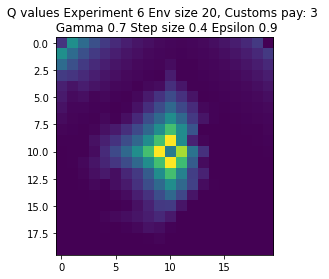

Expr:7 Eps:0 RunnAReward:-61.0 Reward:-1212 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-1454.0 Reward:312 Timesteps:800 GotPack:False Utiltime:638 Customstime:0 Money:1
Expr:7 Eps:40 RunnAReward:-1132.0 Reward:-879 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-1168.0 Reward:-1071 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-2392.0 Reward:-552 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:-448.0 Reward:389 Timesteps:800 GotPack:False Utiltime:776 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-116.0 Reward:1137 Timesteps:2028 GotPack:True Utiltime:102 Customstime:1617 Money:3
Expr:7 Eps:140 RunnAReward:-558.0 Reward:-654 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:160 RunnAReward:-185.0 Reward:-2171 Timesteps:4447 GotPack:True Utiltime:531 Customstime:1411 Money:5
Expr:7 Eps:180 RunnARewa

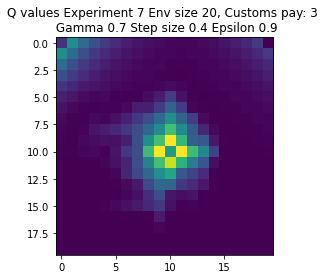

Expr:8 Eps:0 RunnAReward:-70.0 Reward:-1393 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:20 RunnAReward:-1819.0 Reward:-5953 Timesteps:6894 GotPack:True Utiltime:4823 Customstime:5047 Money:4
Expr:8 Eps:40 RunnAReward:-1566.0 Reward:-2344 Timesteps:1600 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-1417.0 Reward:2109 Timesteps:1155 GotPack:True Utiltime:323 Customstime:654 Money:3
Expr:8 Eps:80 RunnAReward:-1333.0 Reward:197 Timesteps:800 GotPack:False Utiltime:366 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-116.0 Reward:229 Timesteps:800 GotPack:False Utiltime:281 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-440.0 Reward:943 Timesteps:1855 GotPack:True Utiltime:134 Customstime:484 Money:3
Expr:8 Eps:140 RunnAReward:-238.0 Reward:2225 Timesteps:999 GotPack:True Utiltime:139 Customstime:553 Money:5
Expr:8 Eps:160 RunnAReward:180.0 Reward:-793 Timesteps:3657 GotPack:True Utiltime:1267 Customstime:1533 Money:5
Expr:8 Eps:18

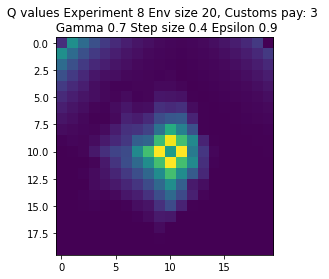

Expr:9 Eps:0 RunnAReward:-49.0 Reward:-976 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:20 RunnAReward:-994.0 Reward:-500 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-1222.0 Reward:-256 Timesteps:1200 GotPack:False Utiltime:98 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-548.0 Reward:-1109 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:80 RunnAReward:-1136.0 Reward:41 Timesteps:2341 GotPack:True Utiltime:1331 Customstime:1833 Money:4
Expr:9 Eps:100 RunnAReward:-884.0 Reward:559 Timesteps:800 GotPack:False Utiltime:355 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-663.0 Reward:-650 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:49.0 Reward:495 Timesteps:800 GotPack:False Utiltime:277 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:428.0 Reward:246 Timesteps:800 GotPack:False Utiltime:182 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:-46.0 Re

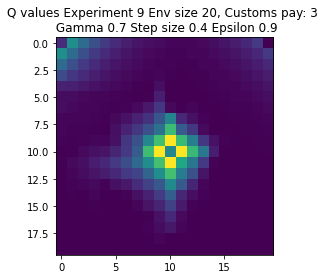

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.7 Step size 0.4 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-7.0 Reward:-134 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-638.0 Reward:-3966 Timesteps:6029 GotPack:True Utiltime:307 Customstime:2407 Money:4
Expr:0 Eps:40 RunnAReward:-561.0 Reward:509 Timesteps:800 GotPack:False Utiltime:205 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-293.0 Reward:-108 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-384.0 Reward:119 Timesteps:800 GotPack:False Utiltime:151 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-866.0 Reward:-237 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:-691.0 Reward:972 Timesteps:2264 GotPack:True Utiltime:985

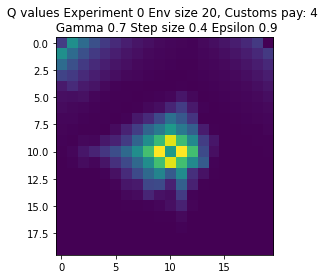

Expr:1 Eps:0 RunnAReward:-38.0 Reward:-754 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-1021.0 Reward:17 Timesteps:800 GotPack:False Utiltime:63 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-565.0 Reward:573 Timesteps:400 GotPack:False Utiltime:283 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-714.0 Reward:-213 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-1030.0 Reward:-450 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-420.0 Reward:188 Timesteps:800 GotPack:False Utiltime:545 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:-286.0 Reward:-241 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:61.0 Reward:-124 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:61.0 Reward:-131 Timesteps:800 GotPack:False Utiltime:628 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:253.0 Reward:511

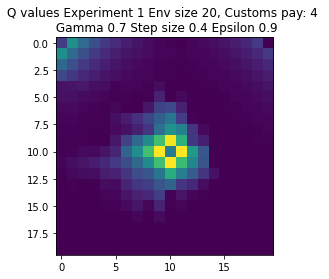

Expr:2 Eps:0 RunnAReward:-6.0 Reward:-118 Timesteps:800 GotPack:False Utiltime:78 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-590.0 Reward:-1053 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-1277.0 Reward:-961 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-720.0 Reward:-186 Timesteps:800 GotPack:False Utiltime:30 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:-109.0 Reward:750 Timesteps:400 GotPack:False Utiltime:7 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-304.0 Reward:-115 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-579.0 Reward:-1125 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:140 RunnAReward:-337.0 Reward:-100 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:241.0 Reward:614 Timesteps:400 GotPack:False Utiltime:156 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:480.0 Reward:2

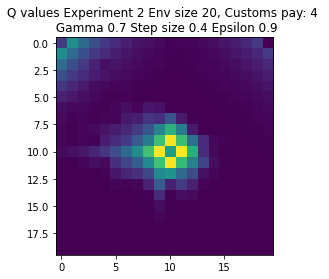

Expr:3 Eps:0 RunnAReward:-26.0 Reward:-501 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-1135.0 Reward:43 Timesteps:800 GotPack:False Utiltime:222 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-831.0 Reward:593 Timesteps:400 GotPack:False Utiltime:178 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-1027.0 Reward:595 Timesteps:400 GotPack:False Utiltime:172 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-786.0 Reward:-125 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-277.0 Reward:-142 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:253.0 Reward:-265 Timesteps:800 GotPack:False Utiltime:112 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:-143.0 Reward:-136 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:94.0 Reward:724 Timesteps:400 GotPack:False Utiltime:339 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:-79.0 Reward:

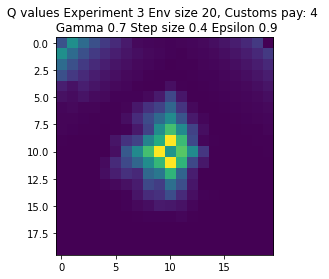

Expr:4 Eps:0 RunnAReward:-39.0 Reward:-776 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-498.0 Reward:476 Timesteps:400 GotPack:False Utiltime:364 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-713.0 Reward:281 Timesteps:800 GotPack:False Utiltime:269 Customstime:0 Money:3
Expr:4 Eps:60 RunnAReward:-677.0 Reward:-70 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-320.0 Reward:-1091 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:100 RunnAReward:-447.0 Reward:-221 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-1049.0 Reward:-801 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:140 RunnAReward:-763.0 Reward:-38 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:-562.0 Reward:-489 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:447.0 Reward:68

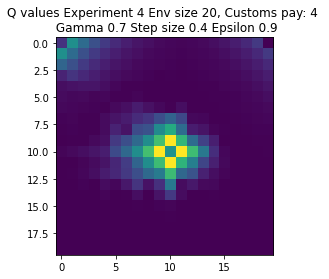

Expr:5 Eps:0 RunnAReward:-26.0 Reward:-505 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-672.0 Reward:-1109 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-2078.0 Reward:-9129 Timesteps:9269 GotPack:True Utiltime:2734 Customstime:4382 Money:5
Expr:5 Eps:60 RunnAReward:-841.0 Reward:-536 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-305.0 Reward:-1085 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-450.0 Reward:693 Timesteps:400 GotPack:False Utiltime:220 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:130.0 Reward:237 Timesteps:800 GotPack:False Utiltime:389 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:-441.0 Reward:-229 Timesteps:2917 GotPack:True Utiltime:543 Customstime:653 Money:5
Expr:5 Eps:160 RunnAReward:-252.0 Reward:143 Timesteps:800 GotPack:False Utiltime:153 Customstime:0 Money:2
Expr:5 Eps:180 RunnAReward:9

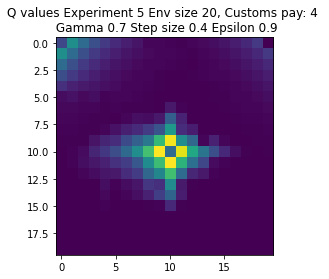

Expr:6 Eps:0 RunnAReward:-48.0 Reward:-941 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:20 RunnAReward:-1213.0 Reward:-5142 Timesteps:6244 GotPack:True Utiltime:2645 Customstime:3934 Money:4
Expr:6 Eps:40 RunnAReward:-1393.0 Reward:-2730 Timesteps:4777 GotPack:True Utiltime:2810 Customstime:4399 Money:5
Expr:6 Eps:60 RunnAReward:-390.0 Reward:-526 Timesteps:1200 GotPack:False Utiltime:89 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:-288.0 Reward:732 Timesteps:400 GotPack:False Utiltime:103 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-487.0 Reward:773 Timesteps:400 GotPack:False Utiltime:115 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-280.0 Reward:1085 Timesteps:400 GotPack:False Utiltime:250 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:189.0 Reward:637 Timesteps:400 GotPack:False Utiltime:19 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:-104.0 Reward:204 Timesteps:800 GotPack:False Utiltime:34 Customstime:0 Money:3
Expr:6 Eps:180 RunnARew

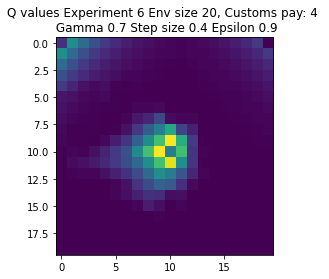

Expr:7 Eps:0 RunnAReward:-24.0 Reward:-470 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-571.0 Reward:358 Timesteps:800 GotPack:False Utiltime:390 Customstime:0 Money:2
Expr:7 Eps:40 RunnAReward:-505.0 Reward:1705 Timesteps:1428 GotPack:True Utiltime:1056 Customstime:1146 Money:4
Expr:7 Eps:60 RunnAReward:68.0 Reward:-1044 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:80 RunnAReward:-911.0 Reward:-104 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-259.0 Reward:103 Timesteps:800 GotPack:False Utiltime:457 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:-790.0 Reward:-701 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:140 RunnAReward:-835.0 Reward:-161 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:-82.0 Reward:-637 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:-69.0 Rewar

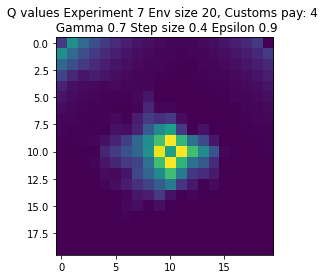

Expr:8 Eps:0 RunnAReward:-49.0 Reward:-977 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-550.0 Reward:714 Timesteps:400 GotPack:False Utiltime:1 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-563.0 Reward:-322 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-382.0 Reward:599 Timesteps:400 GotPack:False Utiltime:112 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-685.0 Reward:538 Timesteps:800 GotPack:False Utiltime:305 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:-90.0 Reward:-82 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-554.0 Reward:-105 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:220.0 Reward:214 Timesteps:800 GotPack:False Utiltime:151 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:-446.0 Reward:-6907 Timesteps:8321 GotPack:True Utiltime:5073 Customstime:6993 Money:5
Expr:8 Eps:180 RunnAReward:18.0 Reward

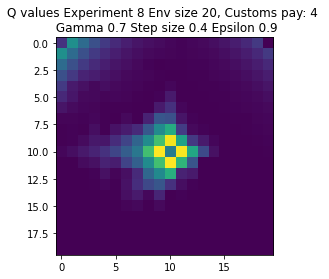

Expr:9 Eps:0 RunnAReward:-5.0 Reward:-92 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-522.0 Reward:-487 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-1019.0 Reward:-971 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-1501.0 Reward:-661 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-358.0 Reward:648 Timesteps:800 GotPack:False Utiltime:646 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:-574.0 Reward:-1423 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:9 Eps:120 RunnAReward:-214.0 Reward:2545 Timesteps:1132 GotPack:True Utiltime:778 Customstime:847 Money:4
Expr:9 Eps:140 RunnAReward:-457.0 Reward:-83 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:-705.0 Reward:-793 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:348.0 Reward

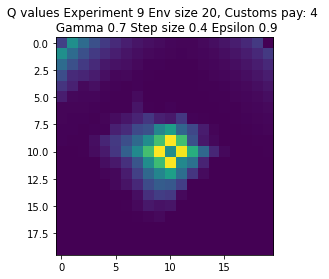

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.7 Step size 0.4 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:12.0 Reward:254 Timesteps:800 GotPack:False Utiltime:565 Customstime:0 Money:1
Expr:0 Eps:20 RunnAReward:-1538.0 Reward:-1308 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-1479.0 Reward:168 Timesteps:800 GotPack:False Utiltime:123 Customstime:0 Money:1
Expr:0 Eps:60 RunnAReward:-2081.0 Reward:-971 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-1219.0 Reward:-678 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-524.0 Reward:3 Timesteps:800 GotPack:False Utiltime:291 Customstime:0 Money:1
Expr:0 Eps:120 RunnAReward:-990.0 Reward:-505 Timesteps:2649 GotPack:True Utiltime:600 

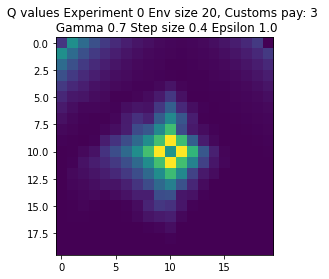

Expr:1 Eps:0 RunnAReward:-330.0 Reward:-6600 Timesteps:7391 GotPack:True Utiltime:5428 Customstime:5921 Money:4
Expr:1 Eps:20 RunnAReward:-2207.0 Reward:-1317 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-2366.0 Reward:-1113 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:60 RunnAReward:-2194.0 Reward:-14221 Timesteps:12000 GotPack:False Utiltime:4673 Customstime:7109 Money:4
Expr:1 Eps:80 RunnAReward:-1624.0 Reward:-927 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-954.0 Reward:-1199 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:-1030.0 Reward:831 Timesteps:1917 GotPack:True Utiltime:357 Customstime:1614 Money:3
Expr:1 Eps:140 RunnAReward:-373.0 Reward:-762 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:-580.0 Reward:-314 Timesteps:800 GotPack:False Utiltime:359 Customstime:0 Money:1
Expr:1 Eps:1

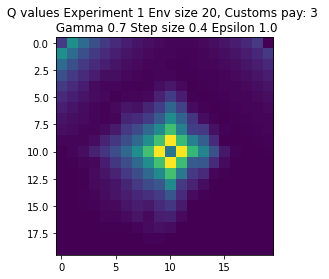

Expr:2 Eps:0 RunnAReward:2.0 Reward:49 Timesteps:800 GotPack:False Utiltime:151 Customstime:0 Money:1
Expr:2 Eps:20 RunnAReward:-3317.0 Reward:-10142 Timesteps:9457 GotPack:True Utiltime:5469 Customstime:8649 Money:3
Expr:2 Eps:40 RunnAReward:-2051.0 Reward:-1218 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-663.0 Reward:-679 Timesteps:3140 GotPack:True Utiltime:2070 Customstime:2180 Money:5
Expr:2 Eps:80 RunnAReward:-1678.0 Reward:-696 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-877.0 Reward:-55 Timesteps:800 GotPack:False Utiltime:281 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-410.0 Reward:268 Timesteps:800 GotPack:False Utiltime:241 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-568.0 Reward:686 Timesteps:800 GotPack:False Utiltime:107 Customstime:0 Money:1
Expr:2 Eps:160 RunnAReward:-252.0 Reward:515 Timesteps:800 GotPack:False Utiltime:413 Customstime:0 Money:0
Expr:2 Eps:180 RunnARewa

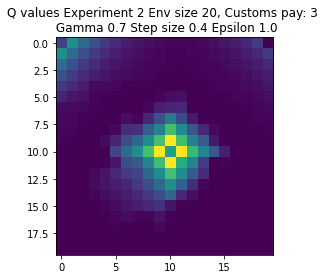

Expr:3 Eps:0 RunnAReward:-67.0 Reward:-1329 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-1697.0 Reward:-637 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-2225.0 Reward:-363 Timesteps:1200 GotPack:False Utiltime:339 Customstime:0 Money:1
Expr:3 Eps:60 RunnAReward:-2340.0 Reward:-962 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-1404.0 Reward:-640 Timesteps:1200 GotPack:False Utiltime:441 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:-1278.0 Reward:506 Timesteps:800 GotPack:False Utiltime:77 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-585.0 Reward:-728 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-595.0 Reward:-137 Timesteps:800 GotPack:False Utiltime:342 Customstime:0 Money:1
Expr:3 Eps:160 RunnAReward:-74.0 Reward:228 Timesteps:800 GotPack:False Utiltime:102 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:64.

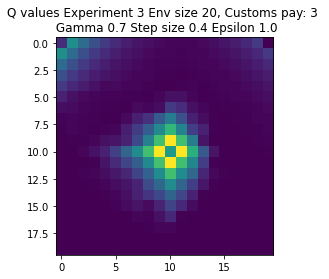

Expr:4 Eps:0 RunnAReward:3.0 Reward:64 Timesteps:800 GotPack:False Utiltime:1 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1592.0 Reward:-3688 Timesteps:4763 GotPack:True Utiltime:2828 Customstime:2966 Money:3
Expr:4 Eps:40 RunnAReward:-1983.0 Reward:-1359 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-1653.0 Reward:-482 Timesteps:1200 GotPack:False Utiltime:342 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:-1528.0 Reward:476 Timesteps:800 GotPack:False Utiltime:114 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-851.0 Reward:450 Timesteps:800 GotPack:False Utiltime:587 Customstime:0 Money:1
Expr:4 Eps:120 RunnAReward:-2176.0 Reward:268 Timesteps:800 GotPack:False Utiltime:272 Customstime:0 Money:1
Expr:4 Eps:140 RunnAReward:-148.0 Reward:170 Timesteps:800 GotPack:False Utiltime:199 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:-572.0 Reward:323 Timesteps:800 GotPack:False Utiltime:147 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:

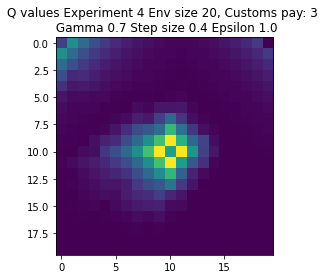

Expr:5 Eps:0 RunnAReward:-269.0 Reward:-5363 Timesteps:6473 GotPack:True Utiltime:2114 Customstime:3977 Money:4
Expr:5 Eps:20 RunnAReward:-2101.0 Reward:-2266 Timesteps:4297 GotPack:True Utiltime:3088 Customstime:3724 Money:3
Expr:5 Eps:40 RunnAReward:-2002.0 Reward:-2019 Timesteps:4015 GotPack:True Utiltime:2867 Customstime:3368 Money:5
Expr:5 Eps:60 RunnAReward:-1338.0 Reward:-685 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:80 RunnAReward:-1823.0 Reward:-774 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-384.0 Reward:-476 Timesteps:1200 GotPack:False Utiltime:353 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:-615.0 Reward:-284 Timesteps:1200 GotPack:False Utiltime:390 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:-544.0 Reward:-702 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:-292.0 Reward:-172 Timesteps:3196 GotPack:True Utiltime:793 Customstime:993 Money:5
Expr:5 E

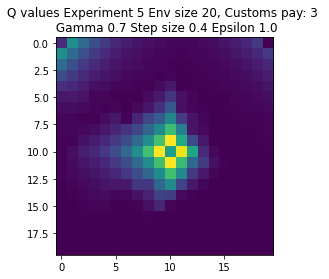

Expr:6 Eps:0 RunnAReward:-116.0 Reward:-2306 Timesteps:3761 GotPack:True Utiltime:3096 Customstime:3701 Money:3
Expr:6 Eps:20 RunnAReward:-2338.0 Reward:-1564 Timesteps:3357 GotPack:True Utiltime:551 Customstime:1548 Money:5
Expr:6 Eps:40 RunnAReward:-2483.0 Reward:-5121 Timesteps:5963 GotPack:True Utiltime:2673 Customstime:3371 Money:3
Expr:6 Eps:60 RunnAReward:-3698.0 Reward:-8838 Timesteps:8379 GotPack:True Utiltime:3485 Customstime:5009 Money:3
Expr:6 Eps:80 RunnAReward:-1230.0 Reward:-1364 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-777.0 Reward:-443 Timesteps:1200 GotPack:False Utiltime:453 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:-1276.0 Reward:-426 Timesteps:1200 GotPack:False Utiltime:191 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:-262.0 Reward:-215 Timesteps:800 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:-383.0 Reward:-925 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Exp

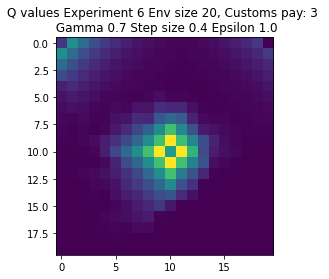

Expr:7 Eps:0 RunnAReward:-593.0 Reward:-11842 Timesteps:8957 GotPack:True Utiltime:4530 Customstime:5871 Money:3
Expr:7 Eps:20 RunnAReward:-3629.0 Reward:-1201 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-2190.0 Reward:-1013 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-1466.0 Reward:-2094 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-1070.0 Reward:-209 Timesteps:1200 GotPack:False Utiltime:296 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:-1427.0 Reward:-1439 Timesteps:3526 GotPack:True Utiltime:3223 Customstime:3469 Money:3
Expr:7 Eps:120 RunnAReward:-1022.0 Reward:-642 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:140 RunnAReward:-945.0 Reward:238 Timesteps:800 GotPack:False Utiltime:230 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:148.0 Reward:-364 Timesteps:1200 GotPack:False Utiltime:191 Customstime:0 Money:2
Expr:7 Eps:1

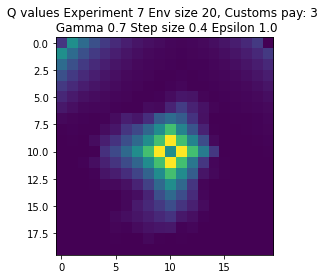

Expr:8 Eps:0 RunnAReward:-15.0 Reward:-290 Timesteps:1200 GotPack:False Utiltime:505 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-1753.0 Reward:-1765 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-2196.0 Reward:-469 Timesteps:1200 GotPack:False Utiltime:776 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-1795.0 Reward:291 Timesteps:800 GotPack:False Utiltime:98 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-1006.0 Reward:-723 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-872.0 Reward:-363 Timesteps:1200 GotPack:False Utiltime:79 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:-840.0 Reward:591 Timesteps:800 GotPack:False Utiltime:385 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:-1069.0 Reward:-483 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:-287.0 Reward:383 Timesteps:800 GotPack:False Utiltime:600 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:

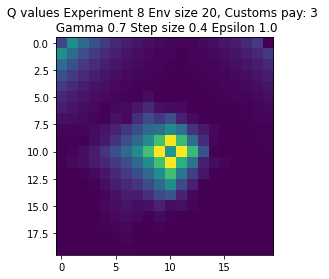

Expr:9 Eps:0 RunnAReward:-42.0 Reward:-828 Timesteps:1200 GotPack:False Utiltime:1127 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-1892.0 Reward:-968 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-1687.0 Reward:-622 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-1078.0 Reward:-500 Timesteps:1200 GotPack:False Utiltime:224 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:-1459.0 Reward:-2914 Timesteps:4961 GotPack:True Utiltime:4296 Customstime:4611 Money:3
Expr:9 Eps:100 RunnAReward:-1180.0 Reward:327 Timesteps:800 GotPack:False Utiltime:90 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-159.0 Reward:128 Timesteps:800 GotPack:False Utiltime:597 Customstime:0 Money:1
Expr:9 Eps:140 RunnAReward:-488.0 Reward:-975 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:-570.0 Reward:242 Timesteps:800 GotPack:False Utiltime:184 Customstime:0 Money:1
Expr:9 Eps:180 RunnARew

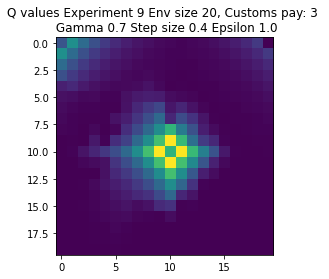

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.7 Step size 0.4 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-31.0 Reward:-603 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-900.0 Reward:-503 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-568.0 Reward:626 Timesteps:400 GotPack:False Utiltime:399 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-1672.0 Reward:654 Timesteps:400 GotPack:False Utiltime:315 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-1603.0 Reward:-1561 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:100 RunnAReward:-863.0 Reward:-5411 Timesteps:6535 GotPack:True Utiltime:4718 Customstime:5259 Money:5
Expr:0 Eps:120 RunnAReward:-525.0 Reward:-73 Timesteps:400 GotPack:False Utiltim

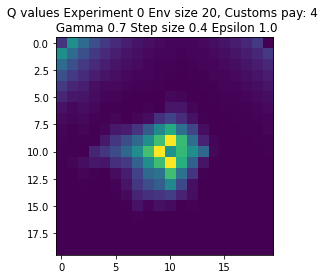

Expr:1 Eps:0 RunnAReward:-22.0 Reward:-435 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-1946.0 Reward:-1199 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-1098.0 Reward:-2539 Timesteps:4394 GotPack:True Utiltime:2576 Customstime:2877 Money:4
Expr:1 Eps:60 RunnAReward:-601.0 Reward:-466 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-507.0 Reward:0 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-338.0 Reward:-50 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:-885.0 Reward:-147 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:-555.0 Reward:-521 Timesteps:1200 GotPack:False Utiltime:795 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:-654.0 Reward:-2323 Timesteps:4781 GotPack:True Utiltime:1485 Customstime:2347 Money:4
Expr:1 Eps:180 RunnAReward:-

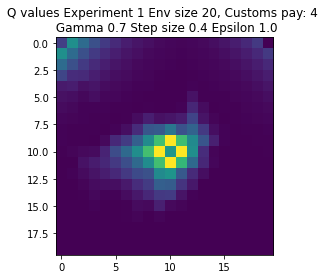

Expr:2 Eps:0 RunnAReward:-26.0 Reward:-518 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-748.0 Reward:-630 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-773.0 Reward:-708 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-849.0 Reward:783 Timesteps:400 GotPack:False Utiltime:118 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-1317.0 Reward:-105 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-884.0 Reward:-71 Timesteps:2665 GotPack:True Utiltime:1831 Customstime:2000 Money:4
Expr:2 Eps:120 RunnAReward:-478.0 Reward:977 Timesteps:400 GotPack:False Utiltime:27 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-420.0 Reward:-385 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:-836.0 Reward:-10 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:165.0 Rewar

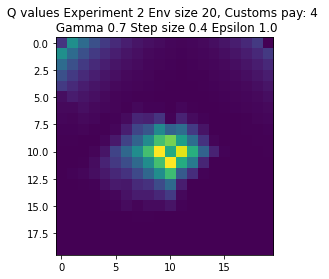

Expr:3 Eps:0 RunnAReward:-55.0 Reward:-1090 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:20 RunnAReward:-1246.0 Reward:-532 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-1033.0 Reward:95 Timesteps:800 GotPack:False Utiltime:562 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-1102.0 Reward:-666 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-931.0 Reward:694 Timesteps:400 GotPack:False Utiltime:377 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-554.0 Reward:646 Timesteps:400 GotPack:False Utiltime:37 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-80.0 Reward:592 Timesteps:400 GotPack:False Utiltime:305 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-936.0 Reward:-154 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:-497.0 Reward:-279 Timesteps:3072 GotPack:True Utiltime:1227 Customstime:1660 Money:4
Expr:3 Eps:180 RunnAReward:-84.0 

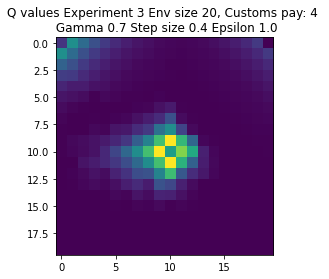

Expr:4 Eps:0 RunnAReward:43.0 Reward:865 Timesteps:400 GotPack:False Utiltime:191 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1345.0 Reward:-531 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-962.0 Reward:-10 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-1417.0 Reward:-1069 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:-482.0 Reward:-575 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-546.0 Reward:-1107 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:-418.0 Reward:-1237 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:11.0 Reward:1034 Timesteps:400 GotPack:False Utiltime:382 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:-88.0 Reward:1270 Timesteps:2157 GotPack:True Utiltime:1195 Customstime:1882 Money:5
Expr:4 Eps:180 RunnAReward:-161.0 

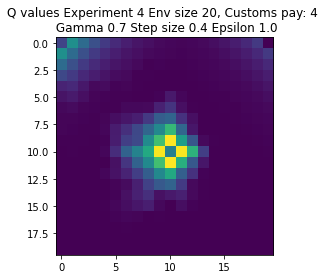

Expr:5 Eps:0 RunnAReward:-58.0 Reward:-1143 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:5 Eps:20 RunnAReward:-1132.0 Reward:-1237 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-1070.0 Reward:-658 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-2335.0 Reward:-5120 Timesteps:6420 GotPack:True Utiltime:921 Customstime:2468 Money:4
Expr:5 Eps:80 RunnAReward:-1753.0 Reward:-3083 Timesteps:5235 GotPack:True Utiltime:127 Customstime:1266 Money:4
Expr:5 Eps:100 RunnAReward:-885.0 Reward:34 Timesteps:800 GotPack:False Utiltime:151 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:-817.0 Reward:-98 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:5.0 Reward:-1430 Timesteps:3929 GotPack:True Utiltime:1227 Customstime:2523 Money:4
Expr:5 Eps:160 RunnAReward:-141.0 Reward:292 Timesteps:800 GotPack:False Utiltime:217 Customstime:0 Money:0
Expr:5 Eps:180 RunnARe

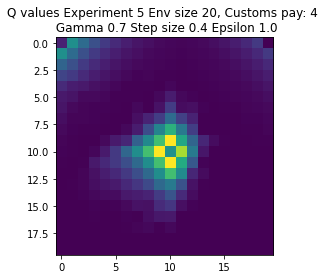

Expr:6 Eps:0 RunnAReward:-34.0 Reward:-679 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-1699.0 Reward:-554 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-2478.0 Reward:-564 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-334.0 Reward:-283 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-394.0 Reward:-79 Timesteps:800 GotPack:False Utiltime:792 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:-441.0 Reward:-356 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-1226.0 Reward:-8256 Timesteps:8385 GotPack:True Utiltime:1971 Customstime:2759 Money:5
Expr:6 Eps:140 RunnAReward:-845.0 Reward:-648 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:-326.0 Reward:-7516 Timesteps:8671 GotPack:True Utiltime:505 Customstime:1291 Money:5
Expr:6 Eps:180 RunnAReward:

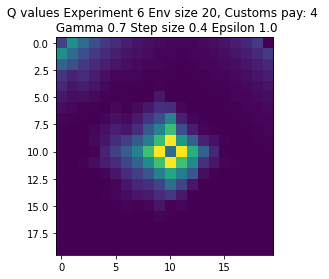

Expr:7 Eps:0 RunnAReward:27.0 Reward:545 Timesteps:400 GotPack:False Utiltime:136 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-652.0 Reward:-250 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-599.0 Reward:90 Timesteps:800 GotPack:False Utiltime:2 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-1021.0 Reward:593 Timesteps:400 GotPack:False Utiltime:89 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-1659.0 Reward:-659 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-936.0 Reward:104 Timesteps:800 GotPack:False Utiltime:82 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:-615.0 Reward:-1391 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:140 RunnAReward:-15.0 Reward:-70 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:-148.0 Reward:-153 Timesteps:800 GotPack:False Utiltime:106 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:-96.0 Reward:238

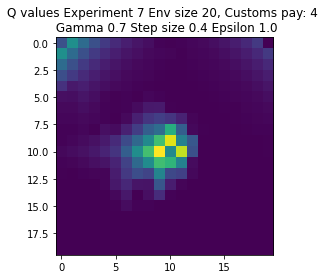

Expr:8 Eps:0 RunnAReward:-549.0 Reward:-10962 Timesteps:9660 GotPack:True Utiltime:5955 Customstime:8318 Money:5
Expr:8 Eps:20 RunnAReward:-2039.0 Reward:770 Timesteps:400 GotPack:False Utiltime:181 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-1302.0 Reward:-742 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-467.0 Reward:730 Timesteps:400 GotPack:False Utiltime:252 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-809.0 Reward:-166 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-2540.0 Reward:-6012 Timesteps:6529 GotPack:True Utiltime:1434 Customstime:2957 Money:5
Expr:8 Eps:120 RunnAReward:-737.0 Reward:270 Timesteps:800 GotPack:False Utiltime:137 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:-79.0 Reward:-162 Timesteps:800 GotPack:False Utiltime:145 Customstime:0 Money:3
Expr:8 Eps:160 RunnAReward:-365.0 Reward:-736 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:180 RunnAR

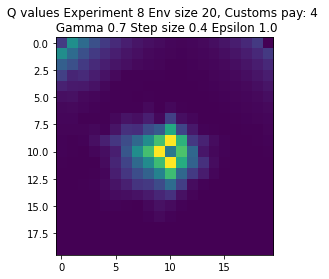

Expr:9 Eps:0 RunnAReward:-659.0 Reward:-13161 Timesteps:12000 GotPack:False Utiltime:6041 Customstime:8078 Money:5
Expr:9 Eps:20 RunnAReward:-1249.0 Reward:-540 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-861.0 Reward:-659 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-520.0 Reward:-734 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-968.0 Reward:-494 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-743.0 Reward:-1109 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:-1052.0 Reward:408 Timesteps:800 GotPack:False Utiltime:51 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:-173.0 Reward:-989 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:9 Eps:160 RunnAReward:-97.0 Reward:-1152 Timesteps:3143 GotPack:True Utiltime:105 Customstime:1129 Money:5
Expr:9 Eps:180 RunnARewar

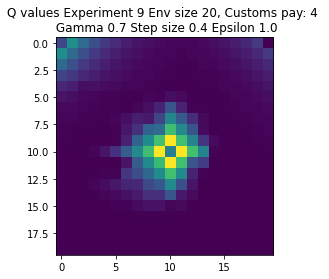

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.7 Step size 0.5 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-53.0 Reward:-1056 Timesteps:3173 GotPack:True Utiltime:1944 Customstime:2466 Money:3
Expr:0 Eps:20 RunnAReward:-1612.0 Reward:-2698 Timesteps:5128 GotPack:True Utiltime:1611 Customstime:2321 Money:4
Expr:0 Eps:40 RunnAReward:-1458.0 Reward:-1329 Timesteps:3620 GotPack:True Utiltime:2624 Customstime:3292 Money:5
Expr:0 Eps:60 RunnAReward:-285.0 Reward:553 Timesteps:800 GotPack:False Utiltime:669 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-169.0 Reward:458 Timesteps:800 GotPack:False Utiltime:660 Customstime:0 Money:1
Expr:0 Eps:100 RunnAReward:-393.0 Reward:386 Timesteps:800 GotPack:False Utiltime:291 Customstime:0 Money:1
Expr:0 Eps:120 RunnAReward:268.0 Reward:303 Timesteps:800 GotPack:

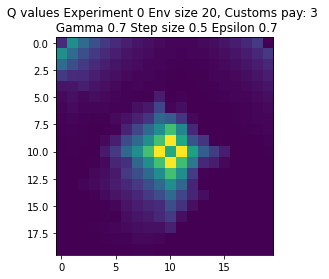

Expr:1 Eps:0 RunnAReward:-201.0 Reward:-4018 Timesteps:5949 GotPack:True Utiltime:4178 Customstime:5562 Money:4
Expr:1 Eps:20 RunnAReward:-1616.0 Reward:-1184 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-1922.0 Reward:-3893 Timesteps:5569 GotPack:True Utiltime:925 Customstime:1101 Money:3
Expr:1 Eps:60 RunnAReward:-545.0 Reward:485 Timesteps:800 GotPack:False Utiltime:413 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-909.0 Reward:44 Timesteps:800 GotPack:False Utiltime:42 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-37.0 Reward:643 Timesteps:800 GotPack:False Utiltime:210 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:461.0 Reward:-4922 Timesteps:6531 GotPack:True Utiltime:1924 Customstime:2717 Money:3
Expr:1 Eps:140 RunnAReward:877.0 Reward:-354 Timesteps:1200 GotPack:False Utiltime:112 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:1085.0 Reward:27 Timesteps:800 GotPack:False Utiltime:129 Customstime:0 Money:0
Expr:1 Eps:180 Runn

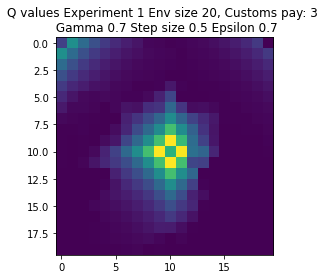

Expr:2 Eps:0 RunnAReward:-341.0 Reward:-6817 Timesteps:7905 GotPack:True Utiltime:5986 Customstime:6279 Money:3
Expr:2 Eps:20 RunnAReward:-1804.0 Reward:-742 Timesteps:1600 GotPack:False Utiltime:1175 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-592.0 Reward:-972 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:60 RunnAReward:-711.0 Reward:-192 Timesteps:1200 GotPack:False Utiltime:649 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:-316.0 Reward:-472 Timesteps:1200 GotPack:False Utiltime:186 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:162.0 Reward:516 Timesteps:2175 GotPack:True Utiltime:702 Customstime:817 Money:5
Expr:2 Eps:120 RunnAReward:-873.0 Reward:498 Timesteps:800 GotPack:False Utiltime:88 Customstime:0 Money:1
Expr:2 Eps:140 RunnAReward:507.0 Reward:2671 Timesteps:725 GotPack:True Utiltime:75 Customstime:548 Money:3
Expr:2 Eps:160 RunnAReward:651.0 Reward:91 Timesteps:1200 GotPack:False Utiltime:59 Customstime:0 Money:2
Expr:2 Eps:180 RunnARew

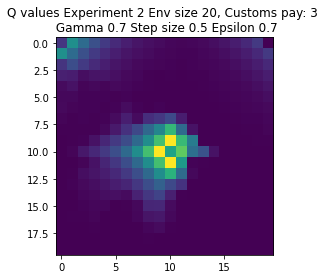

Expr:3 Eps:0 RunnAReward:-30.0 Reward:-596 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-1393.0 Reward:-1128 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-1233.0 Reward:-221 Timesteps:800 GotPack:False Utiltime:386 Customstime:0 Money:1
Expr:3 Eps:60 RunnAReward:-551.0 Reward:103 Timesteps:2974 GotPack:True Utiltime:215 Customstime:2821 Money:5
Expr:3 Eps:80 RunnAReward:14.0 Reward:-154 Timesteps:1200 GotPack:False Utiltime:250 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:436.0 Reward:-227 Timesteps:1200 GotPack:False Utiltime:1077 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:71.0 Reward:452 Timesteps:800 GotPack:False Utiltime:298 Customstime:0 Money:1
Expr:3 Eps:140 RunnAReward:372.0 Reward:1343 Timesteps:1960 GotPack:True Utiltime:543 Customstime:1010 Money:5
Expr:3 Eps:160 RunnAReward:216.0 Reward:38 Timesteps:1200 GotPack:False Utiltime:324 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:5

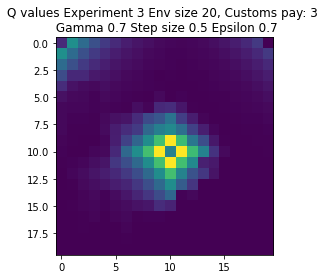

Expr:4 Eps:0 RunnAReward:-61.0 Reward:-1211 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-2127.0 Reward:-1173 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-1463.0 Reward:1 Timesteps:3088 GotPack:True Utiltime:2303 Customstime:2430 Money:4
Expr:4 Eps:60 RunnAReward:75.0 Reward:694 Timesteps:2376 GotPack:True Utiltime:1193 Customstime:1349 Money:3
Expr:4 Eps:80 RunnAReward:-370.0 Reward:-969 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-408.0 Reward:1278 Timesteps:1954 GotPack:True Utiltime:71 Customstime:697 Money:3
Expr:4 Eps:120 RunnAReward:576.0 Reward:-109 Timesteps:1200 GotPack:False Utiltime:187 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:344.0 Reward:684 Timesteps:2206 GotPack:True Utiltime:1713 Customstime:1832 Money:5
Expr:4 Eps:160 RunnAReward:926.0 Reward:462 Timesteps:800 GotPack:False Utiltime:94 Customstime:0 Money:2
Expr:4 Eps:180 RunnARewar

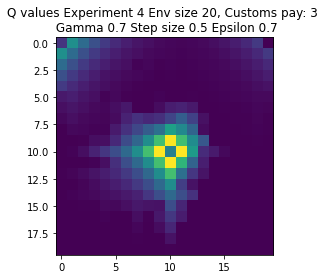

Expr:5 Eps:0 RunnAReward:-65.0 Reward:-1289 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-2040.0 Reward:-100 Timesteps:800 GotPack:False Utiltime:298 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-1356.0 Reward:623 Timesteps:800 GotPack:False Utiltime:410 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-681.0 Reward:-47 Timesteps:1200 GotPack:False Utiltime:39 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:2.0 Reward:-94 Timesteps:2829 GotPack:True Utiltime:1420 Customstime:1655 Money:3
Expr:5 Eps:100 RunnAReward:261.0 Reward:311 Timesteps:800 GotPack:False Utiltime:8 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:272.0 Reward:-1305 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:268.0 Reward:-27 Timesteps:1200 GotPack:False Utiltime:288 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:1002.0 Reward:402 Timesteps:800 GotPack:False Utiltime:192 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:802.0 R

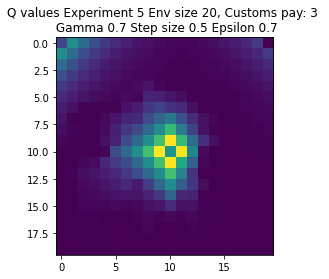

Expr:6 Eps:0 RunnAReward:-54.0 Reward:-1079 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-1023.0 Reward:-690 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-2055.0 Reward:517 Timesteps:800 GotPack:False Utiltime:413 Customstime:0 Money:1
Expr:6 Eps:60 RunnAReward:-456.0 Reward:193 Timesteps:1200 GotPack:False Utiltime:156 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:-263.0 Reward:-91 Timesteps:1200 GotPack:False Utiltime:76 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:283.0 Reward:-501 Timesteps:1600 GotPack:False Utiltime:1152 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:510.0 Reward:-692 Timesteps:3418 GotPack:True Utiltime:109 Customstime:585 Money:5
Expr:6 Eps:140 RunnAReward:865.0 Reward:-1969 Timesteps:4630 GotPack:True Utiltime:3172 Customstime:4447 Money:5
Expr:6 Eps:160 RunnAReward:650.0 Reward:1728 Timesteps:1627 GotPack:True Utiltime:25 Customstime:779 Money:5
Expr:6 Eps:180 RunnARew

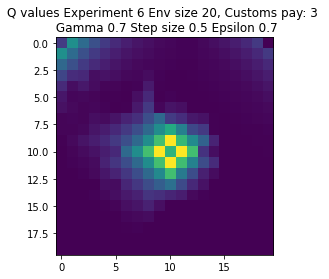

Expr:7 Eps:0 RunnAReward:-37.0 Reward:-736 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-1452.0 Reward:-853 Timesteps:1200 GotPack:False Utiltime:546 Customstime:0 Money:2
Expr:7 Eps:40 RunnAReward:-1540.0 Reward:-1299 Timesteps:4228 GotPack:True Utiltime:3518 Customstime:3606 Money:4
Expr:7 Eps:60 RunnAReward:-377.0 Reward:-7 Timesteps:800 GotPack:False Utiltime:715 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-796.0 Reward:952 Timesteps:1821 GotPack:True Utiltime:359 Customstime:624 Money:4
Expr:7 Eps:100 RunnAReward:-18.0 Reward:412 Timesteps:800 GotPack:False Utiltime:3 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:251.0 Reward:-1221 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:301.0 Reward:651 Timesteps:800 GotPack:False Utiltime:32 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:809.0 Reward:-860 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:620.0

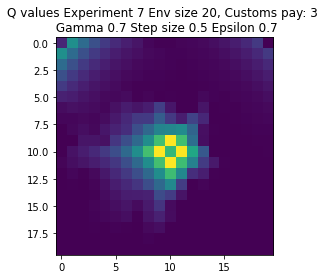

Expr:8 Eps:0 RunnAReward:-85.0 Reward:-1695 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-1354.0 Reward:-1090 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-1640.0 Reward:-7845 Timesteps:9228 GotPack:True Utiltime:1538 Customstime:4286 Money:5
Expr:8 Eps:60 RunnAReward:-494.0 Reward:651 Timesteps:800 GotPack:False Utiltime:264 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-217.0 Reward:401 Timesteps:800 GotPack:False Utiltime:293 Customstime:0 Money:1
Expr:8 Eps:100 RunnAReward:-226.0 Reward:-745 Timesteps:1600 GotPack:False Utiltime:261 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:84.0 Reward:524 Timesteps:800 GotPack:False Utiltime:65 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:310.0 Reward:-580 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:508.0 Reward:-141 Timesteps:1200 GotPack:False Utiltime:567 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:

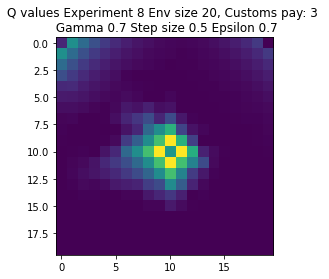

Expr:9 Eps:0 RunnAReward:13.0 Reward:275 Timesteps:800 GotPack:False Utiltime:562 Customstime:0 Money:1
Expr:9 Eps:20 RunnAReward:-1491.0 Reward:-199 Timesteps:800 GotPack:False Utiltime:437 Customstime:0 Money:1
Expr:9 Eps:40 RunnAReward:-1352.0 Reward:518 Timesteps:800 GotPack:False Utiltime:143 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-677.0 Reward:-1805 Timesteps:3994 GotPack:True Utiltime:2337 Customstime:2730 Money:5
Expr:9 Eps:80 RunnAReward:-1101.0 Reward:-45 Timesteps:800 GotPack:False Utiltime:162 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:1.0 Reward:1777 Timesteps:1342 GotPack:True Utiltime:108 Customstime:1197 Money:4
Expr:9 Eps:120 RunnAReward:315.0 Reward:1322 Timesteps:1927 GotPack:True Utiltime:1523 Customstime:1714 Money:3
Expr:9 Eps:140 RunnAReward:332.0 Reward:1793 Timesteps:1740 GotPack:True Utiltime:1355 Customstime:1619 Money:3
Expr:9 Eps:160 RunnAReward:751.0 Reward:273 Timesteps:800 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:9 Eps:180 Runn

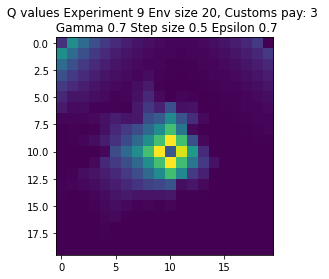

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.7 Step size 0.5 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-18.0 Reward:-345 Timesteps:1200 GotPack:False Utiltime:392 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-1554.0 Reward:-1310 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-364.0 Reward:-164 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-156.0 Reward:174 Timesteps:2743 GotPack:True Utiltime:1083 Customstime:2050 Money:5
Expr:0 Eps:80 RunnAReward:-283.0 Reward:-1176 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:100 RunnAReward:-107.0 Reward:609 Timesteps:800 GotPack:False Utiltime:345 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:424.0 Reward:-376 Timesteps:1200 GotPack:False Utilti

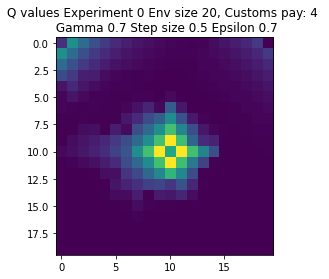

Expr:1 Eps:0 RunnAReward:-35.0 Reward:-694 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-936.0 Reward:-1766 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-1398.0 Reward:-808 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:60 RunnAReward:-245.0 Reward:-96 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-145.0 Reward:566 Timesteps:400 GotPack:False Utiltime:96 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-366.0 Reward:620 Timesteps:400 GotPack:False Utiltime:55 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:229.0 Reward:-763 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:140 RunnAReward:478.0 Reward:-30 Timesteps:800 GotPack:False Utiltime:145 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:674.0 Reward:2397 Timesteps:848 GotPack:True Utiltime:123 Customstime:693 Money:5
Expr:1 Eps:180 RunnAReward:665.0 Reward:1

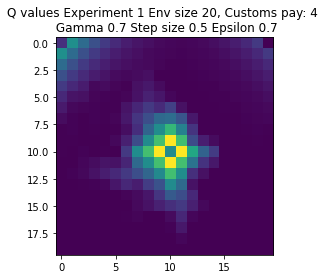

Expr:2 Eps:0 RunnAReward:-30.0 Reward:-584 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-1495.0 Reward:-2376 Timesteps:4945 GotPack:True Utiltime:4420 Customstime:4718 Money:5
Expr:2 Eps:40 RunnAReward:-861.0 Reward:-2586 Timesteps:4834 GotPack:True Utiltime:2465 Customstime:2734 Money:4
Expr:2 Eps:60 RunnAReward:-975.0 Reward:11 Timesteps:2757 GotPack:True Utiltime:1762 Customstime:1812 Money:5
Expr:2 Eps:80 RunnAReward:-615.0 Reward:125 Timesteps:800 GotPack:False Utiltime:588 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:16.0 Reward:1940 Timesteps:1493 GotPack:True Utiltime:1018 Customstime:1216 Money:4
Expr:2 Eps:120 RunnAReward:411.0 Reward:-257 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-32.0 Reward:174 Timesteps:800 GotPack:False Utiltime:143 Customstime:0 Money:2
Expr:2 Eps:160 RunnAReward:681.0 Reward:-252 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:180 RunnARe

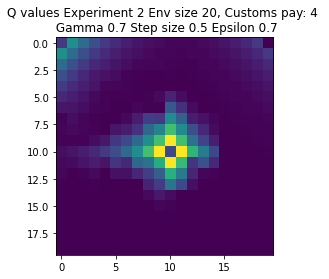

Expr:3 Eps:0 RunnAReward:-28.0 Reward:-548 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-1168.0 Reward:-1003 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:40 RunnAReward:-1255.0 Reward:-522 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-720.0 Reward:-649 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:228.0 Reward:667 Timesteps:400 GotPack:False Utiltime:103 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:296.0 Reward:1535 Timesteps:1438 GotPack:True Utiltime:51 Customstime:496 Money:5
Expr:3 Eps:120 RunnAReward:327.0 Reward:-50 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:140.0 Reward:-196 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:460.0 Reward:686 Timesteps:2598 GotPack:True Utiltime:1625 Customstime:2162 Money:5
Expr:3 Eps:180 RunnAReward:1023.0 Rewa

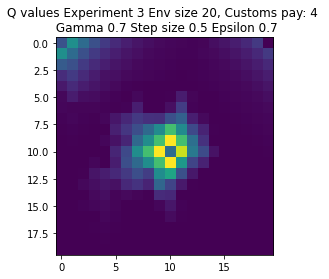

Expr:4 Eps:0 RunnAReward:-26.0 Reward:-512 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1412.0 Reward:-71 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-740.0 Reward:-728 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-1134.0 Reward:-712 Timesteps:3577 GotPack:True Utiltime:2062 Customstime:2853 Money:5
Expr:4 Eps:80 RunnAReward:-260.0 Reward:30 Timesteps:800 GotPack:False Utiltime:371 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-2.0 Reward:-1997 Timesteps:4129 GotPack:True Utiltime:3055 Customstime:3125 Money:5
Expr:4 Eps:120 RunnAReward:168.0 Reward:-426 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:240.0 Reward:935 Timesteps:400 GotPack:False Utiltime:139 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:554.0 Reward:425 Timesteps:800 GotPack:False Utiltime:136 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:506.0 

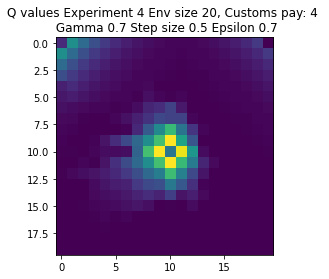

Expr:5 Eps:0 RunnAReward:-63.0 Reward:-1250 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-1220.0 Reward:500 Timesteps:800 GotPack:False Utiltime:330 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-584.0 Reward:1142 Timesteps:400 GotPack:False Utiltime:322 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-193.0 Reward:1812 Timesteps:1356 GotPack:True Utiltime:972 Customstime:1234 Money:5
Expr:5 Eps:80 RunnAReward:71.0 Reward:-724 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:-301.0 Reward:603 Timesteps:400 GotPack:False Utiltime:186 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-224.0 Reward:-561 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:336.0 Reward:-154 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:155.0 Reward:1003 Timesteps:400 GotPack:False Utiltime:86 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:686.0 Rew

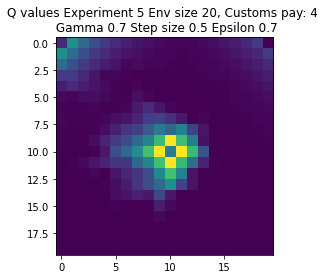

Expr:6 Eps:0 RunnAReward:-80.0 Reward:-1595 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-1034.0 Reward:-355 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-208.0 Reward:1708 Timesteps:1521 GotPack:True Utiltime:579 Customstime:726 Money:5
Expr:6 Eps:60 RunnAReward:-257.0 Reward:-1070 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:80 RunnAReward:-176.0 Reward:-266 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-59.0 Reward:-147 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-427.0 Reward:-1291 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:140 RunnAReward:551.0 Reward:1849 Timesteps:1582 GotPack:True Utiltime:649 Customstime:920 Money:5
Expr:6 Eps:160 RunnAReward:542.0 Reward:-749 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:180 RunnAReward:270.0 R

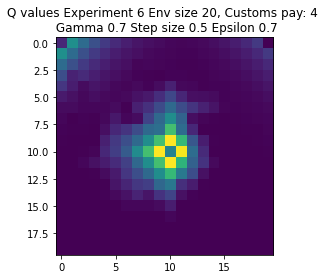

Expr:7 Eps:0 RunnAReward:-26.0 Reward:-507 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-824.0 Reward:-373 Timesteps:2975 GotPack:True Utiltime:871 Customstime:2075 Money:5
Expr:7 Eps:40 RunnAReward:-1590.0 Reward:-1326 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-471.0 Reward:-144 Timesteps:2905 GotPack:True Utiltime:2679 Customstime:2809 Money:4
Expr:7 Eps:80 RunnAReward:-124.0 Reward:1105 Timesteps:400 GotPack:False Utiltime:134 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:606.0 Reward:-710 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:120 RunnAReward:-27.0 Reward:-118 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:309.0 Reward:1031 Timesteps:400 GotPack:False Utiltime:278 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:540.0 Reward:760 Timesteps:400 GotPack:False Utiltime:32 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:727

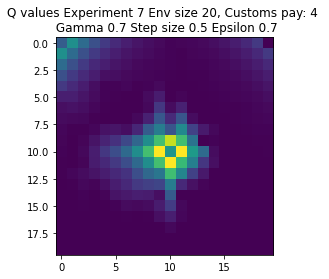

Expr:8 Eps:0 RunnAReward:-59.0 Reward:-1164 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-1866.0 Reward:-1501 Timesteps:3685 GotPack:True Utiltime:774 Customstime:1330 Money:4
Expr:8 Eps:40 RunnAReward:-673.0 Reward:-8315 Timesteps:9281 GotPack:True Utiltime:4376 Customstime:4465 Money:4
Expr:8 Eps:60 RunnAReward:-419.0 Reward:-70 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-399.0 Reward:631 Timesteps:400 GotPack:False Utiltime:216 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:248.0 Reward:-206 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:307.0 Reward:1021 Timesteps:400 GotPack:False Utiltime:17 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:621.0 Reward:1062 Timesteps:400 GotPack:False Utiltime:330 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:769.0 Reward:2615 Timesteps:1097 GotPack:True Utiltime:60 Customstime:209 Money:5
Expr:8 Eps:180 RunnAReward:

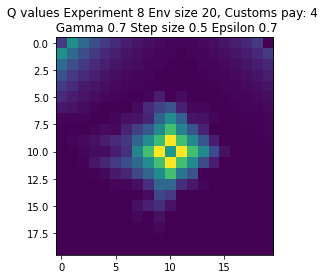

Expr:9 Eps:0 RunnAReward:-41.0 Reward:-813 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-1463.0 Reward:-696 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-737.0 Reward:-1257 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-430.0 Reward:-245 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-251.0 Reward:1015 Timesteps:1967 GotPack:True Utiltime:835 Customstime:958 Money:5
Expr:9 Eps:100 RunnAReward:-724.0 Reward:-234 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:224.0 Reward:410 Timesteps:400 GotPack:False Utiltime:26 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:75.0 Reward:-1750 Timesteps:1600 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:9 Eps:160 RunnAReward:229.0 Reward:-359 Timesteps:1200 GotPack:False Utiltime:600 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:388.0 Rewa

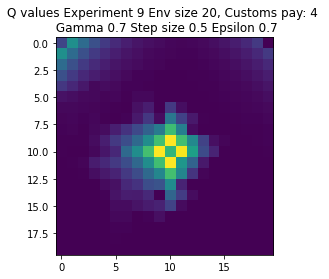

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.7 Step size 0.5 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-170.0 Reward:-3399 Timesteps:4974 GotPack:True Utiltime:3943 Customstime:4848 Money:3
Expr:0 Eps:20 RunnAReward:-1620.0 Reward:500 Timesteps:800 GotPack:False Utiltime:492 Customstime:0 Money:1
Expr:0 Eps:40 RunnAReward:-1101.0 Reward:-666 Timesteps:1200 GotPack:False Utiltime:535 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-1857.0 Reward:-107 Timesteps:1200 GotPack:False Utiltime:103 Customstime:0 Money:1
Expr:0 Eps:80 RunnAReward:-515.0 Reward:-559 Timesteps:1200 GotPack:False Utiltime:575 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-218.0 Reward:503 Timesteps:800 GotPack:False Utiltime:289 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:-682.0 Reward:543 Timesteps:800 GotPack:Fal

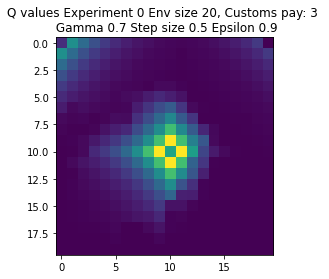

Expr:1 Eps:0 RunnAReward:-30.0 Reward:-599 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-2213.0 Reward:-256 Timesteps:1200 GotPack:False Utiltime:285 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-2143.0 Reward:-1981 Timesteps:1600 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:60 RunnAReward:-420.0 Reward:934 Timesteps:2242 GotPack:True Utiltime:911 Customstime:1879 Money:5
Expr:1 Eps:80 RunnAReward:-1464.0 Reward:-9679 Timesteps:10321 GotPack:True Utiltime:552 Customstime:891 Money:4
Expr:1 Eps:100 RunnAReward:-516.0 Reward:745 Timesteps:2615 GotPack:True Utiltime:860 Customstime:1036 Money:3
Expr:1 Eps:120 RunnAReward:-66.0 Reward:284 Timesteps:800 GotPack:False Utiltime:613 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:-541.0 Reward:619 Timesteps:800 GotPack:False Utiltime:236 Customstime:0 Money:1
Expr:1 Eps:160 RunnAReward:364.0 Reward:-689 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:180 RunnARe

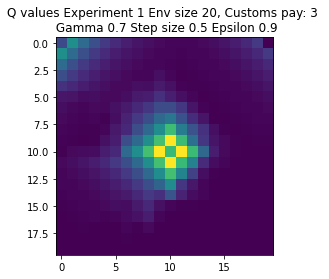

Expr:2 Eps:0 RunnAReward:-53.0 Reward:-1048 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:20 RunnAReward:-3043.0 Reward:-4824 Timesteps:6006 GotPack:True Utiltime:1496 Customstime:2523 Money:3
Expr:2 Eps:40 RunnAReward:-1344.0 Reward:-1172 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-1002.0 Reward:-658 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:-721.0 Reward:-8 Timesteps:800 GotPack:False Utiltime:78 Customstime:0 Money:1
Expr:2 Eps:100 RunnAReward:-536.0 Reward:-1221 Timesteps:1200 GotPack:False Utiltime:196 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:-431.0 Reward:-3016 Timesteps:4373 GotPack:True Utiltime:586 Customstime:1141 Money:5
Expr:2 Eps:140 RunnAReward:532.0 Reward:1635 Timesteps:2005 GotPack:True Utiltime:708 Customstime:1370 Money:5
Expr:2 Eps:160 RunnAReward:66.0 Reward:98 Timesteps:800 GotPack:False Utiltime:593 Customstime:0 Money:0
Expr:2 Eps:180 RunnA

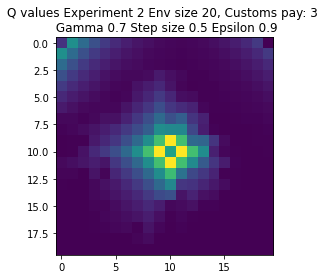

Expr:3 Eps:0 RunnAReward:-385.0 Reward:-7693 Timesteps:7953 GotPack:True Utiltime:2361 Customstime:2661 Money:5
Expr:3 Eps:20 RunnAReward:-2465.0 Reward:-1386 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:40 RunnAReward:-1052.0 Reward:-879 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-2612.0 Reward:295 Timesteps:2658 GotPack:True Utiltime:414 Customstime:883 Money:5
Expr:3 Eps:80 RunnAReward:-319.0 Reward:566 Timesteps:2537 GotPack:True Utiltime:1810 Customstime:1996 Money:3
Expr:3 Eps:100 RunnAReward:-292.0 Reward:-723 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-630.0 Reward:-2027 Timesteps:1600 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:72.0 Reward:426 Timesteps:800 GotPack:False Utiltime:140 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:390.0 Reward:268 Timesteps:800 GotPack:False Utiltime:386 Customstime:0 Money:2
Expr:3 Eps:180 RunnARe

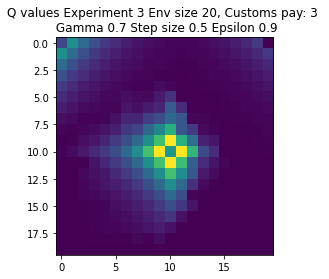

Expr:4 Eps:0 RunnAReward:-28.0 Reward:-546 Timesteps:1200 GotPack:False Utiltime:377 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-2775.0 Reward:-3529 Timesteps:5646 GotPack:True Utiltime:2954 Customstime:3592 Money:3
Expr:4 Eps:40 RunnAReward:-946.0 Reward:-1140 Timesteps:1600 GotPack:False Utiltime:298 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-1202.0 Reward:-940 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:-339.0 Reward:-752 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-509.0 Reward:580 Timesteps:800 GotPack:False Utiltime:195 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:5.0 Reward:128 Timesteps:1200 GotPack:False Utiltime:297 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:-201.0 Reward:-650 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:160 RunnAReward:-725.0 Reward:3 Timesteps:800 GotPack:False Utiltime:163 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:37

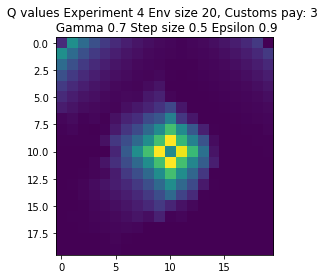

Expr:5 Eps:0 RunnAReward:-43.0 Reward:-855 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-2493.0 Reward:-7315 Timesteps:7089 GotPack:True Utiltime:3099 Customstime:4323 Money:5
Expr:5 Eps:40 RunnAReward:-1247.0 Reward:-578 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-729.0 Reward:219 Timesteps:800 GotPack:False Utiltime:71 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:-1411.0 Reward:-1173 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:100 RunnAReward:-436.0 Reward:555 Timesteps:800 GotPack:False Utiltime:255 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-590.0 Reward:-602 Timesteps:1200 GotPack:False Utiltime:541 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:135.0 Reward:539 Timesteps:800 GotPack:False Utiltime:204 Customstime:0 Money:1
Expr:5 Eps:160 RunnAReward:-214.0 Reward:-1398 Timesteps:3925 GotPack:True Utiltime:98 Customstime:619 Money:5
Expr:5 Eps:180 RunnARewar

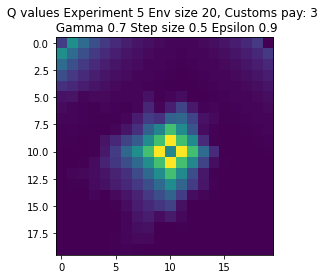

Expr:6 Eps:0 RunnAReward:-62.0 Reward:-1227 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:20 RunnAReward:-2409.0 Reward:-507 Timesteps:3194 GotPack:True Utiltime:2195 Customstime:3121 Money:5
Expr:6 Eps:40 RunnAReward:-1278.0 Reward:-640 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-742.0 Reward:-848 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-514.0 Reward:734 Timesteps:800 GotPack:False Utiltime:292 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-287.0 Reward:104 Timesteps:800 GotPack:False Utiltime:7 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-272.0 Reward:566 Timesteps:800 GotPack:False Utiltime:361 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:-234.0 Reward:-201 Timesteps:1200 GotPack:False Utiltime:41 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:300.0 Reward:2181 Timesteps:1257 GotPack:True Utiltime:109 Customstime:430 Money:4
Expr:6 Eps:180 RunnAReward:50

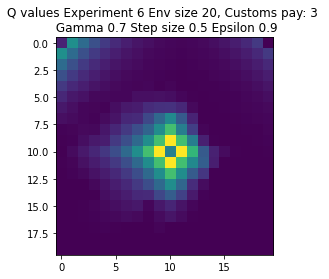

Expr:7 Eps:0 RunnAReward:-188.0 Reward:-3747 Timesteps:5058 GotPack:True Utiltime:1521 Customstime:1997 Money:4
Expr:7 Eps:20 RunnAReward:-1989.0 Reward:-1107 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-1118.0 Reward:-22 Timesteps:800 GotPack:False Utiltime:420 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-1258.0 Reward:-697 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-1810.0 Reward:221 Timesteps:800 GotPack:False Utiltime:603 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-22.0 Reward:1307 Timesteps:1947 GotPack:True Utiltime:317 Customstime:1895 Money:3
Expr:7 Eps:120 RunnAReward:-339.0 Reward:363 Timesteps:800 GotPack:False Utiltime:221 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-179.0 Reward:-592 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:-41.0 Reward:676 Timesteps:800 GotPack:False Utiltime:290 Customstime:0 Money:0
Expr:7 Eps:180 RunnARewa

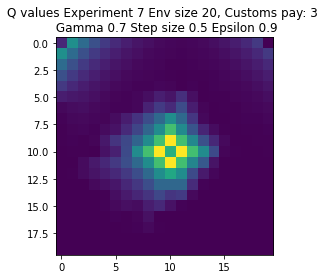

Expr:8 Eps:0 RunnAReward:-55.0 Reward:-1093 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-2246.0 Reward:-8379 Timesteps:8441 GotPack:True Utiltime:2846 Customstime:4286 Money:5
Expr:8 Eps:40 RunnAReward:-2110.0 Reward:-1063 Timesteps:3396 GotPack:True Utiltime:476 Customstime:3001 Money:5
Expr:8 Eps:60 RunnAReward:-712.0 Reward:-161 Timesteps:1200 GotPack:False Utiltime:127 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:-629.0 Reward:-146 Timesteps:1200 GotPack:False Utiltime:641 Customstime:0 Money:1
Expr:8 Eps:100 RunnAReward:-375.0 Reward:-765 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-383.0 Reward:216 Timesteps:2624 GotPack:True Utiltime:394 Customstime:766 Money:3
Expr:8 Eps:140 RunnAReward:265.0 Reward:2073 Timesteps:1291 GotPack:True Utiltime:172 Customstime:540 Money:3
Expr:8 Eps:160 RunnAReward:659.0 Reward:2815 Timesteps:977 GotPack:True Utiltime:121 Customstime:651 Money:5
Expr:8 Eps:180

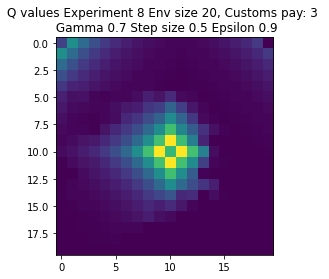

Expr:9 Eps:0 RunnAReward:-158.0 Reward:-3146 Timesteps:4700 GotPack:True Utiltime:1994 Customstime:2304 Money:4
Expr:9 Eps:20 RunnAReward:-1020.0 Reward:-2689 Timesteps:4456 GotPack:True Utiltime:2210 Customstime:2927 Money:3
Expr:9 Eps:40 RunnAReward:-2804.0 Reward:-940 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-1259.0 Reward:1068 Timesteps:2045 GotPack:True Utiltime:350 Customstime:1060 Money:4
Expr:9 Eps:80 RunnAReward:-761.0 Reward:-357 Timesteps:1200 GotPack:False Utiltime:147 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:-401.0 Reward:-735 Timesteps:2000 GotPack:False Utiltime:1089 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:-48.0 Reward:-1337 Timesteps:3453 GotPack:True Utiltime:2048 Customstime:2456 Money:3
Expr:9 Eps:140 RunnAReward:-126.0 Reward:-53 Timesteps:1200 GotPack:False Utiltime:95 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:445.0 Reward:-653 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 E

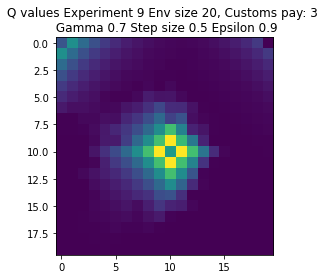

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.7 Step size 0.5 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-45.0 Reward:-891 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-2513.0 Reward:-715 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-609.0 Reward:-800 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-613.0 Reward:642 Timesteps:400 GotPack:False Utiltime:48 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-882.0 Reward:-816 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-824.0 Reward:-3068 Timesteps:4826 GotPack:True Utiltime:1991 Customstime:2898 Money:5
Expr:0 Eps:120 RunnAReward:6.0 Reward:-444 Timesteps:400 GotPack:False Utiltime:0 Cu

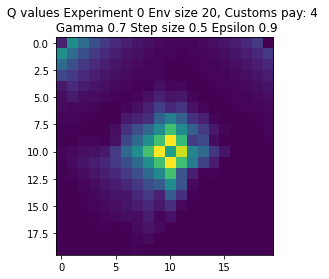

Expr:1 Eps:0 RunnAReward:-31.0 Reward:-616 Timesteps:3247 GotPack:True Utiltime:1963 Customstime:2996 Money:4
Expr:1 Eps:20 RunnAReward:-800.0 Reward:-1015 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-1205.0 Reward:-442 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:60 RunnAReward:-1123.0 Reward:271 Timesteps:800 GotPack:False Utiltime:200 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:-1909.0 Reward:-274 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-269.0 Reward:1079 Timesteps:400 GotPack:False Utiltime:167 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:123.0 Reward:654 Timesteps:400 GotPack:False Utiltime:289 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:158.0 Reward:-112 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:-548.0 Reward:527 Timesteps:800 GotPack:False Utiltime:219 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:599.

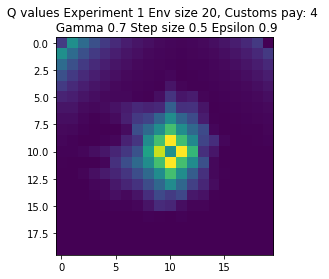

Expr:2 Eps:0 RunnAReward:-668.0 Reward:-13351 Timesteps:12000 GotPack:False Utiltime:5288 Customstime:7381 Money:5
Expr:2 Eps:20 RunnAReward:-2053.0 Reward:-542 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-1598.0 Reward:-202 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-407.0 Reward:758 Timesteps:400 GotPack:False Utiltime:261 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-384.0 Reward:-190 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-19.0 Reward:643 Timesteps:400 GotPack:False Utiltime:172 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:56.0 Reward:-1232 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:140 RunnAReward:-422.0 Reward:-76 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:-122.0 Reward:-47 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:190.0 

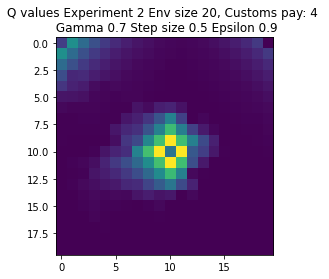

Expr:3 Eps:0 RunnAReward:-24.0 Reward:-470 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-1300.0 Reward:-547 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-1091.0 Reward:-544 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-1110.0 Reward:214 Timesteps:800 GotPack:False Utiltime:269 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:-392.0 Reward:-166 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-234.0 Reward:-273 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-171.0 Reward:-1186 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:140 RunnAReward:-30.0 Reward:-141 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:126.0 Reward:654 Timesteps:800 GotPack:False Utiltime:130 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:357.0 Reward:

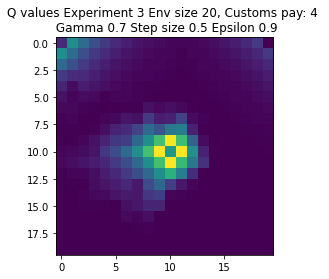

Expr:4 Eps:0 RunnAReward:-54.0 Reward:-1080 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-825.0 Reward:-823 Timesteps:1200 GotPack:False Utiltime:512 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-1674.0 Reward:-210 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-1157.0 Reward:-118 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-1185.0 Reward:-4617 Timesteps:5796 GotPack:True Utiltime:2967 Customstime:4026 Money:5
Expr:4 Eps:100 RunnAReward:-475.0 Reward:-82 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-244.0 Reward:-1133 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:140 RunnAReward:-160.0 Reward:-114 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:590.0 Reward:-1617 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:180 RunnAReward:-70

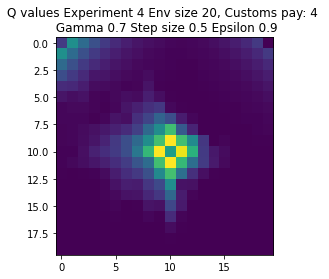

Expr:5 Eps:0 RunnAReward:-49.0 Reward:-976 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-604.0 Reward:-75 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-378.0 Reward:-286 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-1398.0 Reward:-1089 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:-421.0 Reward:-627 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:59.0 Reward:-394 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-284.0 Reward:-526 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:-205.0 Reward:61 Timesteps:3281 GotPack:True Utiltime:318 Customstime:446 Money:5
Expr:5 Eps:160 RunnAReward:102.0 Reward:-145 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:372.0 Reward:1106

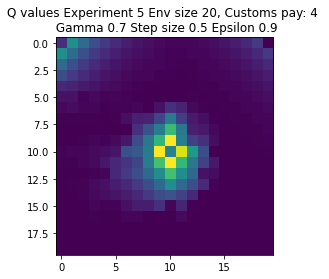

Expr:6 Eps:0 RunnAReward:29.0 Reward:598 Timesteps:400 GotPack:False Utiltime:22 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-679.0 Reward:339 Timesteps:400 GotPack:False Utiltime:399 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-879.0 Reward:-5299 Timesteps:6728 GotPack:True Utiltime:2133 Customstime:2689 Money:5
Expr:6 Eps:60 RunnAReward:-603.0 Reward:-719 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:-946.0 Reward:-7468 Timesteps:8527 GotPack:True Utiltime:5024 Customstime:6231 Money:5
Expr:6 Eps:100 RunnAReward:-452.0 Reward:-175 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-219.0 Reward:589 Timesteps:400 GotPack:False Utiltime:274 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:207.0 Reward:-1599 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:160 RunnAReward:211.0 Reward:531 Timesteps:400 GotPack:False Utiltime:18 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:14

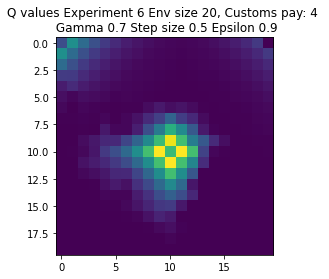

Expr:7 Eps:0 RunnAReward:-2.0 Reward:-32 Timesteps:800 GotPack:False Utiltime:218 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-979.0 Reward:-400 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-1527.0 Reward:-486 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-1176.0 Reward:-644 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-406.0 Reward:-3353 Timesteps:4798 GotPack:True Utiltime:1867 Customstime:2801 Money:5
Expr:7 Eps:100 RunnAReward:25.0 Reward:1036 Timesteps:400 GotPack:False Utiltime:352 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-574.0 Reward:93 Timesteps:2661 GotPack:True Utiltime:96 Customstime:520 Money:5
Expr:7 Eps:140 RunnAReward:-63.0 Reward:1937 Timesteps:1336 GotPack:True Utiltime:384 Customstime:1221 Money:4
Expr:7 Eps:160 RunnAReward:457.0 Reward:51 Timesteps:800 GotPack:False Utiltime:217 Customstime:0 Money:3
Expr:7 Eps:180 RunnAReward:-35.

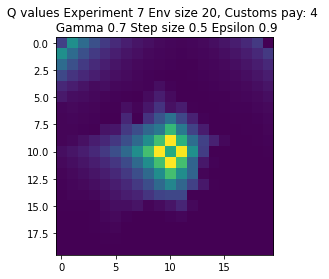

Expr:8 Eps:0 RunnAReward:-13.0 Reward:-242 Timesteps:800 GotPack:False Utiltime:5 Customstime:0 Money:3
Expr:8 Eps:20 RunnAReward:-1146.0 Reward:-486 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-848.0 Reward:-3532 Timesteps:5396 GotPack:True Utiltime:1367 Customstime:3300 Money:5
Expr:8 Eps:60 RunnAReward:-726.0 Reward:-4788 Timesteps:7548 GotPack:True Utiltime:1340 Customstime:3557 Money:5
Expr:8 Eps:80 RunnAReward:-1472.0 Reward:601 Timesteps:400 GotPack:False Utiltime:87 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-215.0 Reward:598 Timesteps:400 GotPack:False Utiltime:23 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:81.0 Reward:-661 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:24.0 Reward:254 Timesteps:800 GotPack:False Utiltime:42 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:-84.0 Reward:-702 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:286.0 

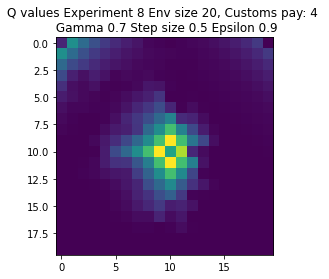

Expr:9 Eps:0 RunnAReward:-19.0 Reward:-362 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-924.0 Reward:-511 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-912.0 Reward:-119 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-783.0 Reward:730 Timesteps:400 GotPack:False Utiltime:61 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-347.0 Reward:-587 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-482.0 Reward:933 Timesteps:400 GotPack:False Utiltime:78 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:102.0 Reward:537 Timesteps:400 GotPack:False Utiltime:230 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-450.0 Reward:-1781 Timesteps:3596 GotPack:True Utiltime:76 Customstime:1576 Money:4
Expr:9 Eps:160 RunnAReward:248.0 Reward:-164 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:238.0 Reward:

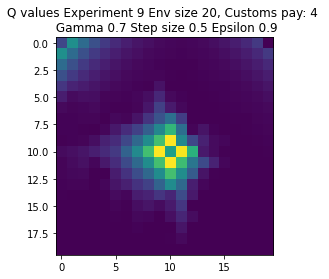

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.7 Step size 0.5 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-38.0 Reward:-745 Timesteps:3133 GotPack:True Utiltime:1812 Customstime:2628 Money:3
Expr:0 Eps:20 RunnAReward:-3351.0 Reward:-779 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-1698.0 Reward:-2887 Timesteps:4322 GotPack:True Utiltime:1502 Customstime:2030 Money:3
Expr:0 Eps:60 RunnAReward:-2389.0 Reward:-8068 Timesteps:8793 GotPack:True Utiltime:4364 Customstime:5224 Money:5
Expr:0 Eps:80 RunnAReward:-1611.0 Reward:-2107 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-1372.0 Reward:-8260 Timesteps:8641 GotPack:True Utiltime:1423 Customstime:3107 Money:3
Expr:0 Eps:120 RunnAReward:-678.0 Reward:-153 Timesteps:12

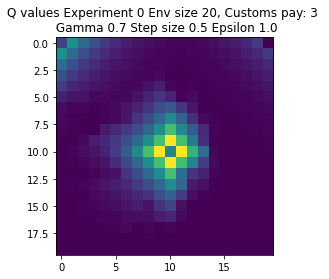

Expr:1 Eps:0 RunnAReward:-63.0 Reward:-1257 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-1444.0 Reward:-4328 Timesteps:6203 GotPack:True Utiltime:673 Customstime:1427 Money:4
Expr:1 Eps:40 RunnAReward:-2892.0 Reward:-4953 Timesteps:5587 GotPack:True Utiltime:1413 Customstime:2330 Money:5
Expr:1 Eps:60 RunnAReward:-1496.0 Reward:-1254 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:80 RunnAReward:-786.0 Reward:-688 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-1642.0 Reward:-965 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:-483.0 Reward:-641 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:-463.0 Reward:-151 Timesteps:2776 GotPack:True Utiltime:694 Customstime:1413 Money:3
Expr:1 Eps:160 RunnAReward:-107.0 Reward:-1306 Timesteps:3459 GotPack:True Utiltime:120 Customstime:1246 Money:3
Expr:1 Eps:180

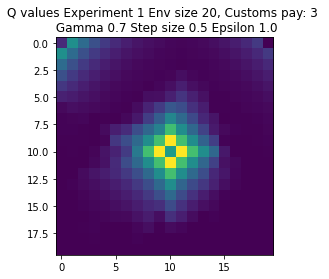

Expr:2 Eps:0 RunnAReward:-68.0 Reward:-1346 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:20 RunnAReward:-2384.0 Reward:-977 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-3228.0 Reward:-1265 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-1946.0 Reward:-1304 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:80 RunnAReward:-1737.0 Reward:-1208 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:100 RunnAReward:-1822.0 Reward:254 Timesteps:800 GotPack:False Utiltime:190 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-850.0 Reward:-785 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-151.0 Reward:479 Timesteps:800 GotPack:False Utiltime:388 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:26.0 Reward:-281 Timesteps:1200 GotPack:False Utiltime:775 Customstime:0 Money:1
Expr:2 Eps:180 RunnAReward:78.0

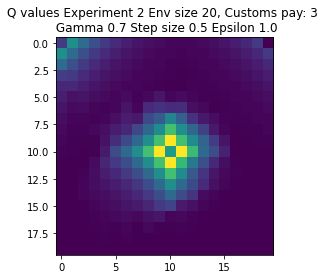

Expr:3 Eps:0 RunnAReward:-96.0 Reward:-1901 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-1799.0 Reward:-881 Timesteps:1200 GotPack:False Utiltime:712 Customstime:0 Money:2
Expr:3 Eps:40 RunnAReward:-2749.0 Reward:-11693 Timesteps:11117 GotPack:True Utiltime:2155 Customstime:2622 Money:3
Expr:3 Eps:60 RunnAReward:-1263.0 Reward:-881 Timesteps:1600 GotPack:False Utiltime:1570 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:-1408.0 Reward:904 Timesteps:1785 GotPack:True Utiltime:122 Customstime:765 Money:4
Expr:3 Eps:100 RunnAReward:-1082.0 Reward:-1209 Timesteps:1600 GotPack:False Utiltime:464 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:-1300.0 Reward:116 Timesteps:800 GotPack:False Utiltime:346 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-309.0 Reward:451 Timesteps:800 GotPack:False Utiltime:317 Customstime:0 Money:1
Expr:3 Eps:160 RunnAReward:-448.0 Reward:2901 Timesteps:775 GotPack:True Utiltime:632 Customstime:714 Money:3
Expr:3 E

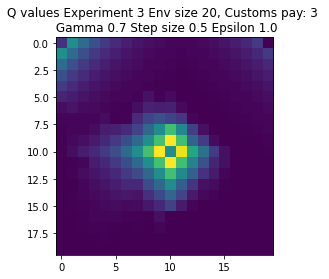

Expr:4 Eps:0 RunnAReward:-65.0 Reward:-1286 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-2282.0 Reward:-1245 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-4141.0 Reward:-1792 Timesteps:1600 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-1728.0 Reward:-968 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:80 RunnAReward:-1007.0 Reward:-420 Timesteps:1200 GotPack:False Utiltime:513 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-805.0 Reward:-2286 Timesteps:4210 GotPack:True Utiltime:1422 Customstime:1859 Money:3
Expr:4 Eps:120 RunnAReward:-406.0 Reward:474 Timesteps:1886 GotPack:True Utiltime:378 Customstime:1356 Money:4
Expr:4 Eps:140 RunnAReward:-276.0 Reward:504 Timesteps:2047 GotPack:True Utiltime:252 Customstime:1657 Money:4
Expr:4 Eps:160 RunnAReward:17.0 Reward:-320 Timesteps:1200 GotPack:False Utiltime:184 Customstime:0 Money:2
Expr:4 Eps:180 Ru

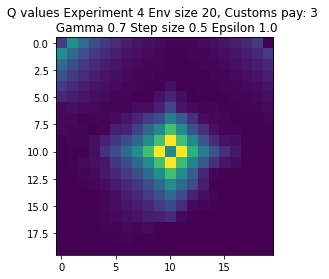

Expr:5 Eps:0 RunnAReward:-58.0 Reward:-1160 Timesteps:3449 GotPack:True Utiltime:464 Customstime:2805 Money:3
Expr:5 Eps:20 RunnAReward:-1417.0 Reward:-1453 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-2256.0 Reward:-150 Timesteps:1200 GotPack:False Utiltime:1048 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-1712.0 Reward:-1327 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-1463.0 Reward:86 Timesteps:800 GotPack:False Utiltime:243 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-812.0 Reward:-535 Timesteps:1200 GotPack:False Utiltime:437 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:-431.0 Reward:-1420 Timesteps:4016 GotPack:True Utiltime:143 Customstime:986 Money:5
Expr:5 Eps:140 RunnAReward:-348.0 Reward:-79 Timesteps:2820 GotPack:True Utiltime:166 Customstime:412 Money:5
Expr:5 Eps:160 RunnAReward:41.0 Reward:-515 Timesteps:1200 GotPack:False Utiltime:320 Customstime:0 Money:2
Expr:5 Eps:180

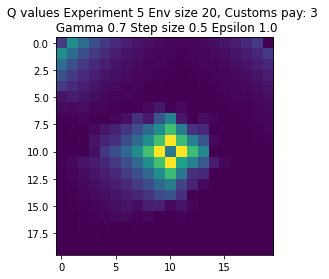

Expr:6 Eps:0 RunnAReward:-34.0 Reward:-663 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-1321.0 Reward:148 Timesteps:800 GotPack:False Utiltime:618 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-1732.0 Reward:-1153 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-1983.0 Reward:-1030 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:80 RunnAReward:-2322.0 Reward:-837 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-1028.0 Reward:2474 Timesteps:1211 GotPack:True Utiltime:227 Customstime:661 Money:3
Expr:6 Eps:120 RunnAReward:-480.0 Reward:-1026 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:-526.0 Reward:-317 Timesteps:1200 GotPack:False Utiltime:503 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:-199.0 Reward:12 Timesteps:800 GotPack:False Utiltime:238 Customstime:0 Money:1
Expr:6 Eps:180 RunnAReward:1

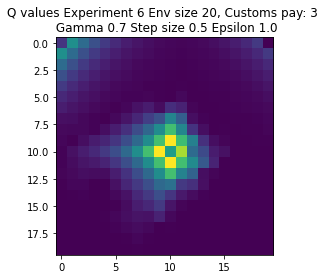

Expr:7 Eps:0 RunnAReward:-44.0 Reward:-878 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-3489.0 Reward:-431 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:40 RunnAReward:-2178.0 Reward:-1351 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-1974.0 Reward:-2 Timesteps:800 GotPack:False Utiltime:426 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-881.0 Reward:-3082 Timesteps:4896 GotPack:True Utiltime:19 Customstime:3227 Money:4
Expr:7 Eps:100 RunnAReward:-1329.0 Reward:-499 Timesteps:1200 GotPack:False Utiltime:35 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:-619.0 Reward:1030 Timesteps:2043 GotPack:True Utiltime:1680 Customstime:1909 Money:3
Expr:7 Eps:140 RunnAReward:-542.0 Reward:2151 Timesteps:1320 GotPack:True Utiltime:272 Customstime:1056 Money:5
Expr:7 Eps:160 RunnAReward:-609.0 Reward:282 Timesteps:800 GotPack:False Utiltime:107 Customstime:0 Money:0
Expr:7 Eps:180 Runn

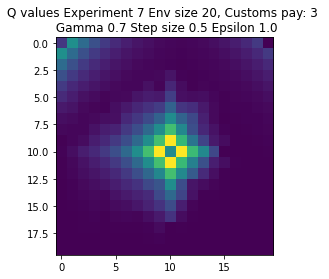

Expr:8 Eps:0 RunnAReward:-66.0 Reward:-1307 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-2569.0 Reward:-1065 Timesteps:3869 GotPack:True Utiltime:2785 Customstime:3034 Money:5
Expr:8 Eps:40 RunnAReward:-2420.0 Reward:-3052 Timesteps:4680 GotPack:True Utiltime:3079 Customstime:3609 Money:3
Expr:8 Eps:60 RunnAReward:-1813.0 Reward:-776 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-714.0 Reward:-1165 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-1327.0 Reward:-1203 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:-982.0 Reward:438 Timesteps:2697 GotPack:True Utiltime:1378 Customstime:1836 Money:5
Expr:8 Eps:140 RunnAReward:-247.0 Reward:-400 Timesteps:1200 GotPack:False Utiltime:315 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:-722.0 Reward:974 Timesteps:2203 GotPack:True Utiltime:73 Customstime:983 Money:5
Expr:8 Eps:1

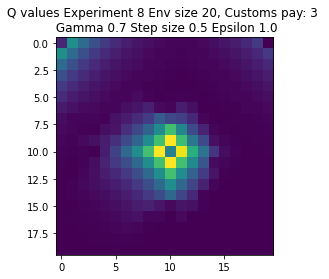

Expr:9 Eps:0 RunnAReward:-36.0 Reward:-714 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-1129.0 Reward:-131 Timesteps:1200 GotPack:False Utiltime:462 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-2756.0 Reward:-1373 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-2138.0 Reward:-966 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-691.0 Reward:358 Timesteps:800 GotPack:False Utiltime:204 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-1398.0 Reward:2085 Timesteps:1506 GotPack:True Utiltime:62 Customstime:396 Money:5
Expr:9 Eps:120 RunnAReward:-483.0 Reward:-817 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-714.0 Reward:188 Timesteps:800 GotPack:False Utiltime:277 Customstime:0 Money:1
Expr:9 Eps:160 RunnAReward:-709.0 Reward:103 Timesteps:800 GotPack:False Utiltime:388 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:-4

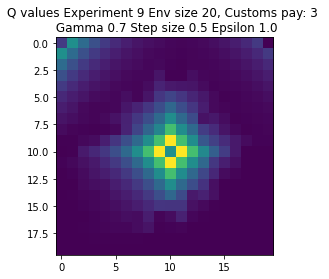

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.7 Step size 0.5 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-7.0 Reward:-127 Timesteps:800 GotPack:False Utiltime:161 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-2491.0 Reward:-7723 Timesteps:6740 GotPack:True Utiltime:4688 Customstime:6397 Money:5
Expr:0 Eps:40 RunnAReward:-1162.0 Reward:-270 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-1250.0 Reward:-820 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-879.0 Reward:451 Timesteps:400 GotPack:False Utiltime:156 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-651.0 Reward:349 Timesteps:1960 GotPack:True Utiltime:1247 Customstime:1435 Money:4
Expr:0 Eps:120 RunnAReward:-420.0 Reward:-771 Timesteps:400 GotPack:False U

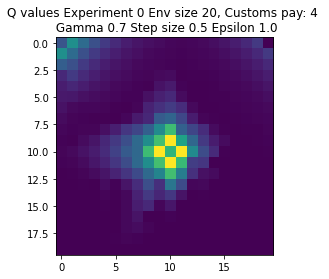

Expr:1 Eps:0 RunnAReward:-25.0 Reward:-496 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-2318.0 Reward:0 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-1768.0 Reward:-680 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-638.0 Reward:113 Timesteps:800 GotPack:False Utiltime:139 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-372.0 Reward:-161 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-1402.0 Reward:442 Timesteps:400 GotPack:False Utiltime:390 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:-299.0 Reward:438 Timesteps:400 GotPack:False Utiltime:81 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:-13.0 Reward:1077 Timesteps:400 GotPack:False Utiltime:368 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:-12.0 Reward:-279 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:274.0 Reward:-1

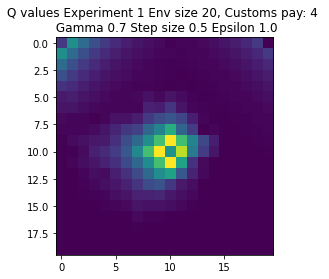

Expr:2 Eps:0 RunnAReward:-46.0 Reward:-907 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:20 RunnAReward:-968.0 Reward:-194 Timesteps:800 GotPack:False Utiltime:274 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-578.0 Reward:-849 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-1242.0 Reward:-1985 Timesteps:3899 GotPack:True Utiltime:2293 Customstime:2752 Money:5
Expr:2 Eps:80 RunnAReward:-740.0 Reward:-243 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-417.0 Reward:-230 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-556.0 Reward:-148 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-41.0 Reward:1148 Timesteps:400 GotPack:False Utiltime:313 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:20.0 Reward:-558 Timesteps:2599 GotPack:True Utiltime:1320 Customstime:2182 Money:5
Expr:2 Eps:180 RunnAReward:56

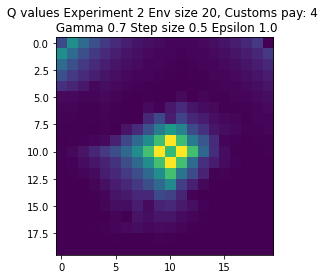

Expr:3 Eps:0 RunnAReward:-32.0 Reward:-623 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-540.0 Reward:-881 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-1226.0 Reward:-1188 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:60 RunnAReward:-1934.0 Reward:-885 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:80 RunnAReward:-661.0 Reward:-548 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-1755.0 Reward:-667 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-670.0 Reward:-430 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-247.0 Reward:-231 Timesteps:3019 GotPack:True Utiltime:1201 Customstime:1662 Money:4
Expr:3 Eps:160 RunnAReward:-392.0 Reward:-82 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:326.0 Re

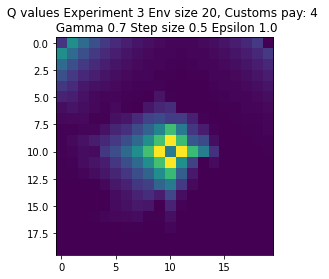

Expr:4 Eps:0 RunnAReward:-58.0 Reward:-1143 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:20 RunnAReward:-776.0 Reward:-562 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-329.0 Reward:-1171 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-1652.0 Reward:-5953 Timesteps:6097 GotPack:True Utiltime:3804 Customstime:4962 Money:4
Expr:4 Eps:80 RunnAReward:-1402.0 Reward:-1113 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-246.0 Reward:-1146 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:120 RunnAReward:-912.0 Reward:-69 Timesteps:800 GotPack:False Utiltime:441 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:95.0 Reward:-386 Timesteps:3089 GotPack:True Utiltime:948 Customstime:2045 Money:5
Expr:4 Eps:160 RunnAReward:-44.0 Reward:724 Timesteps:800 GotPack:False Utiltime:150 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:

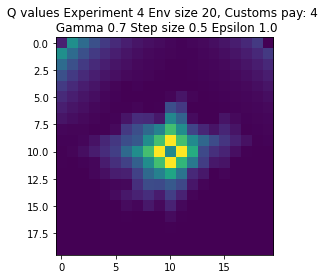

Expr:5 Eps:0 RunnAReward:-60.0 Reward:-1199 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-931.0 Reward:-868 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-1097.0 Reward:-683 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-1645.0 Reward:704 Timesteps:400 GotPack:False Utiltime:247 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-846.0 Reward:532 Timesteps:400 GotPack:False Utiltime:235 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-479.0 Reward:-573 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:-932.0 Reward:-105 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:-385.0 Reward:551 Timesteps:400 GotPack:False Utiltime:24 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:19.0 Reward:-174 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:-256.0 Reward:

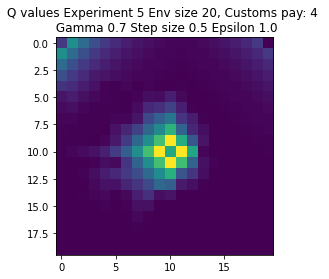

Expr:6 Eps:0 RunnAReward:-323.0 Reward:-6450 Timesteps:7171 GotPack:True Utiltime:4886 Customstime:5055 Money:4
Expr:6 Eps:20 RunnAReward:-3312.0 Reward:-11850 Timesteps:9912 GotPack:True Utiltime:2515 Customstime:2592 Money:5
Expr:6 Eps:40 RunnAReward:-1623.0 Reward:527 Timesteps:400 GotPack:False Utiltime:57 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-989.0 Reward:-746 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-354.0 Reward:-564 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-982.0 Reward:-441 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-159.0 Reward:753 Timesteps:400 GotPack:False Utiltime:99 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:-481.0 Reward:-1098 Timesteps:3544 GotPack:True Utiltime:1474 Customstime:2140 Money:4
Expr:6 Eps:160 RunnAReward:-25.0 Reward:487 Timesteps:800 GotPack:False Utiltime:469 Customstime:0 Money:2
Expr:6 Eps:180 Runn

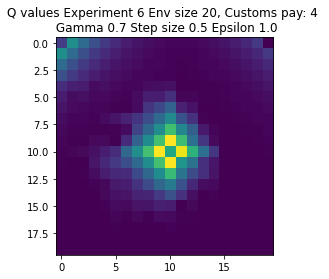

Expr:7 Eps:0 RunnAReward:-34.0 Reward:-668 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-1075.0 Reward:-424 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-1053.0 Reward:-59 Timesteps:800 GotPack:False Utiltime:728 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-939.0 Reward:-1786 Timesteps:1600 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-853.0 Reward:734 Timesteps:400 GotPack:False Utiltime:359 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-1132.0 Reward:-7852 Timesteps:8669 GotPack:True Utiltime:5934 Customstime:8093 Money:5
Expr:7 Eps:120 RunnAReward:-2073.0 Reward:-11073 Timesteps:11448 GotPack:True Utiltime:108 Customstime:1462 Money:4
Expr:7 Eps:140 RunnAReward:-575.0 Reward:-609 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:70.0 Reward:506 Timesteps:800 GotPack:False Utiltime:618 Customstime:0 Money:3
Expr:7 Eps:180 RunnARe

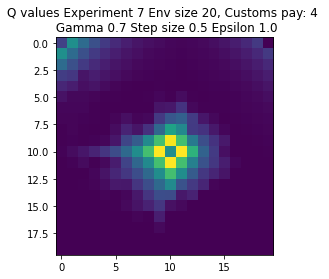

Expr:8 Eps:0 RunnAReward:-52.0 Reward:-1034 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:20 RunnAReward:-1438.0 Reward:-400 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-427.0 Reward:-508 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-640.0 Reward:-257 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-1990.0 Reward:-757 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-577.0 Reward:-838 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:-1015.0 Reward:-1589 Timesteps:3635 GotPack:True Utiltime:1642 Customstime:1776 Money:4
Expr:8 Eps:140 RunnAReward:-121.0 Reward:-80 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:142.0 Reward:691 Timesteps:400 GotPack:False Utiltime:197 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:183.0 R

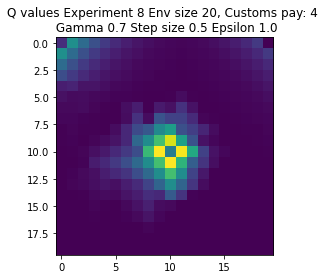

Expr:9 Eps:0 RunnAReward:-31.0 Reward:-612 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-1100.0 Reward:-1271 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-1443.0 Reward:656 Timesteps:400 GotPack:False Utiltime:166 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-921.0 Reward:-463 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-680.0 Reward:0 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-643.0 Reward:370 Timesteps:800 GotPack:False Utiltime:390 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:-691.0 Reward:1006 Timesteps:400 GotPack:False Utiltime:367 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-575.0 Reward:50 Timesteps:3061 GotPack:True Utiltime:1743 Customstime:1922 Money:4
Expr:9 Eps:160 RunnAReward:55.0 Reward:380 Timesteps:2508 GotPack:True Utiltime:1488 Customstime:1912 Money:4
Expr:9 Eps:180 RunnAReward:-91.0 

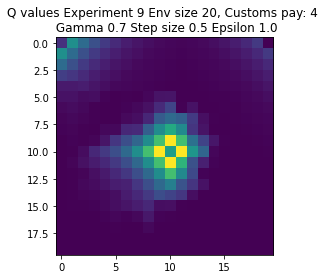

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.7 Step size 0.8 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-84.0 Reward:-1670 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-2087.0 Reward:-1145 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-1084.0 Reward:-573 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-347.0 Reward:-528 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-8.0 Reward:72 Timesteps:800 GotPack:False Utiltime:74 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:376.0 Reward:376 Timesteps:800 GotPack:False Utiltime:133 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:328.0 Reward:-39 Timesteps:800 GotPack:False Utiltime:318 Custo

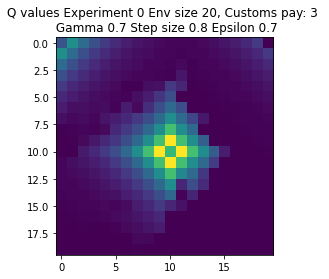

Expr:1 Eps:0 RunnAReward:-12.0 Reward:-232 Timesteps:1200 GotPack:False Utiltime:223 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-1785.0 Reward:-682 Timesteps:3006 GotPack:True Utiltime:1631 Customstime:2404 Money:3
Expr:1 Eps:40 RunnAReward:-1382.0 Reward:-1110 Timesteps:1600 GotPack:False Utiltime:297 Customstime:0 Money:2
Expr:1 Eps:60 RunnAReward:-381.0 Reward:-164 Timesteps:800 GotPack:False Utiltime:25 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:157.0 Reward:528 Timesteps:800 GotPack:False Utiltime:22 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:333.0 Reward:456 Timesteps:800 GotPack:False Utiltime:62 Customstime:0 Money:1
Expr:1 Eps:120 RunnAReward:1043.0 Reward:653 Timesteps:800 GotPack:False Utiltime:100 Customstime:0 Money:1
Expr:1 Eps:140 RunnAReward:751.0 Reward:77 Timesteps:1200 GotPack:False Utiltime:336 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:923.0 Reward:2657 Timesteps:711 GotPack:True Utiltime:123 Customstime:472 Money:3
Expr:1 Eps:180 RunnAReward:

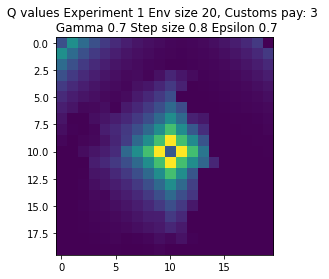

Expr:2 Eps:0 RunnAReward:-38.0 Reward:-755 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-1863.0 Reward:-1711 Timesteps:4243 GotPack:True Utiltime:64 Customstime:2121 Money:3
Expr:2 Eps:40 RunnAReward:-906.0 Reward:-939 Timesteps:3068 GotPack:True Utiltime:234 Customstime:1212 Money:3
Expr:2 Eps:60 RunnAReward:-92.0 Reward:-742 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:527.0 Reward:2326 Timesteps:1089 GotPack:True Utiltime:558 Customstime:864 Money:3
Expr:2 Eps:100 RunnAReward:636.0 Reward:451 Timesteps:800 GotPack:False Utiltime:46 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:430.0 Reward:-585 Timesteps:3637 GotPack:True Utiltime:3153 Customstime:3526 Money:3
Expr:2 Eps:140 RunnAReward:671.0 Reward:119 Timesteps:800 GotPack:False Utiltime:29 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:1042.0 Reward:-114 Timesteps:1200 GotPack:False Utiltime:76 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward

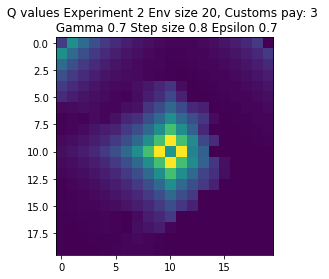

Expr:3 Eps:0 RunnAReward:-54.0 Reward:-1065 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-1773.0 Reward:253 Timesteps:800 GotPack:False Utiltime:265 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-1193.0 Reward:-761 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-274.0 Reward:155 Timesteps:800 GotPack:False Utiltime:376 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:413.0 Reward:-205 Timesteps:1200 GotPack:False Utiltime:891 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:227.0 Reward:1 Timesteps:1200 GotPack:False Utiltime:17 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:568.0 Reward:531 Timesteps:800 GotPack:False Utiltime:244 Customstime:0 Money:1
Expr:3 Eps:140 RunnAReward:565.0 Reward:992 Timesteps:2080 GotPack:True Utiltime:1294 Customstime:1342 Money:3
Expr:3 Eps:160 RunnAReward:589.0 Reward:-138 Timesteps:1200 GotPack:False Utiltime:280 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:1400.

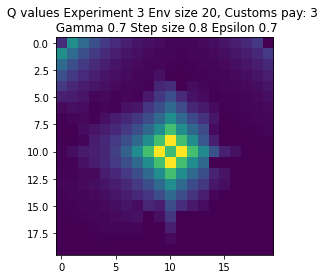

Expr:4 Eps:0 RunnAReward:-64.0 Reward:-1268 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1402.0 Reward:-1308 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-1022.0 Reward:-1613 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-75.0 Reward:2362 Timesteps:823 GotPack:True Utiltime:455 Customstime:620 Money:5
Expr:4 Eps:80 RunnAReward:177.0 Reward:130 Timesteps:800 GotPack:False Utiltime:225 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:507.0 Reward:677 Timesteps:800 GotPack:False Utiltime:107 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:566.0 Reward:132 Timesteps:800 GotPack:False Utiltime:415 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:761.0 Reward:1784 Timesteps:1747 GotPack:True Utiltime:574 Customstime:1272 Money:3
Expr:4 Eps:160 RunnAReward:1177.0 Reward:1525 Timesteps:1657 GotPack:True Utiltime:116 Customstime:1028 Money:3
Expr:4 Eps:180 RunnAReward

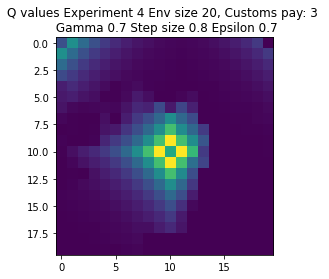

Expr:5 Eps:0 RunnAReward:0.0 Reward:19 Timesteps:800 GotPack:False Utiltime:245 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-1403.0 Reward:-4625 Timesteps:6195 GotPack:True Utiltime:2794 Customstime:3552 Money:3
Expr:5 Eps:40 RunnAReward:-850.0 Reward:-1507 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-982.0 Reward:204 Timesteps:1200 GotPack:False Utiltime:358 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:211.0 Reward:-166 Timesteps:1200 GotPack:False Utiltime:331 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:606.0 Reward:459 Timesteps:2964 GotPack:True Utiltime:1133 Customstime:2361 Money:4
Expr:5 Eps:120 RunnAReward:303.0 Reward:-52 Timesteps:3132 GotPack:True Utiltime:4 Customstime:474 Money:3
Expr:5 Eps:140 RunnAReward:1295.0 Reward:2779 Timesteps:888 GotPack:True Utiltime:123 Customstime:621 Money:5
Expr:5 Eps:160 RunnAReward:1277.0 Reward:-6 Timesteps:1200 GotPack:False Utiltime:32 Customstime:0 Money:2
Expr:5 Eps:180 RunnARewar

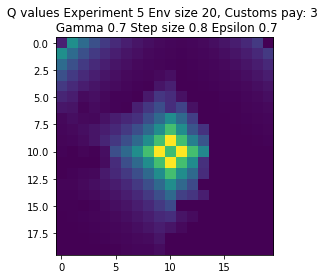

Expr:6 Eps:0 RunnAReward:-16.0 Reward:-308 Timesteps:1200 GotPack:False Utiltime:453 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-1704.0 Reward:-807 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-778.0 Reward:-639 Timesteps:3422 GotPack:True Utiltime:2366 Customstime:2746 Money:3
Expr:6 Eps:60 RunnAReward:-201.0 Reward:-43 Timesteps:1200 GotPack:False Utiltime:340 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:83.0 Reward:553 Timesteps:800 GotPack:False Utiltime:538 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:603.0 Reward:8 Timesteps:1200 GotPack:False Utiltime:147 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:672.0 Reward:-93 Timesteps:1200 GotPack:False Utiltime:203 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:882.0 Reward:270 Timesteps:800 GotPack:False Utiltime:136 Customstime:0 Money:1
Expr:6 Eps:160 RunnAReward:585.0 Reward:484 Timesteps:800 GotPack:False Utiltime:61 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:921.0 R

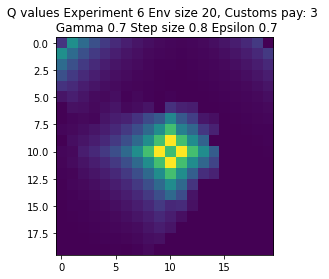

Expr:7 Eps:0 RunnAReward:4.0 Reward:92 Timesteps:800 GotPack:False Utiltime:487 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-1978.0 Reward:1124 Timesteps:1822 GotPack:True Utiltime:788 Customstime:1591 Money:3
Expr:7 Eps:40 RunnAReward:-893.0 Reward:-795 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:60 RunnAReward:-237.0 Reward:731 Timesteps:800 GotPack:False Utiltime:306 Customstime:0 Money:1
Expr:7 Eps:80 RunnAReward:562.0 Reward:313 Timesteps:800 GotPack:False Utiltime:86 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:211.0 Reward:-3073 Timesteps:5501 GotPack:True Utiltime:3103 Customstime:3207 Money:3
Expr:7 Eps:120 RunnAReward:432.0 Reward:-469 Timesteps:3686 GotPack:True Utiltime:74 Customstime:1078 Money:3
Expr:7 Eps:140 RunnAReward:1415.0 Reward:546 Timesteps:800 GotPack:False Utiltime:208 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:1087.0 Reward:127 Timesteps:800 GotPack:False Utiltime:18 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:133

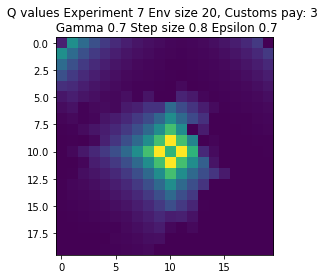

Expr:8 Eps:0 RunnAReward:-48.0 Reward:-958 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-1808.0 Reward:-5904 Timesteps:6906 GotPack:True Utiltime:3109 Customstime:3269 Money:3
Expr:8 Eps:40 RunnAReward:-1332.0 Reward:-226 Timesteps:2665 GotPack:True Utiltime:709 Customstime:971 Money:4
Expr:8 Eps:60 RunnAReward:-664.0 Reward:-776 Timesteps:3359 GotPack:True Utiltime:2069 Customstime:2632 Money:4
Expr:8 Eps:80 RunnAReward:657.0 Reward:-1203 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:264.0 Reward:2427 Timesteps:1115 GotPack:True Utiltime:78 Customstime:1042 Money:3
Expr:8 Eps:120 RunnAReward:991.0 Reward:1846 Timesteps:1567 GotPack:True Utiltime:1289 Customstime:1481 Money:4
Expr:8 Eps:140 RunnAReward:566.0 Reward:211 Timesteps:1200 GotPack:False Utiltime:444 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:735.0 Reward:927 Timesteps:2305 GotPack:True Utiltime:159 Customstime:1496 Money:3
Expr:8 Eps:1

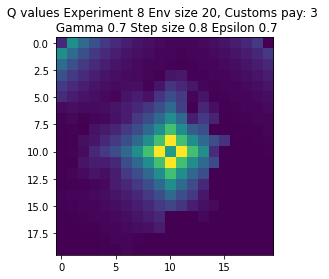

Expr:9 Eps:0 RunnAReward:-34.0 Reward:-671 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:20 RunnAReward:-2248.0 Reward:-559 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:40 RunnAReward:-1351.0 Reward:-1189 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-228.0 Reward:-896 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:80 RunnAReward:368.0 Reward:3240 Timesteps:656 GotPack:True Utiltime:542 Customstime:618 Money:5
Expr:9 Eps:100 RunnAReward:605.0 Reward:-913 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:245.0 Reward:604 Timesteps:800 GotPack:False Utiltime:437 Customstime:0 Money:1
Expr:9 Eps:140 RunnAReward:860.0 Reward:2989 Timesteps:618 GotPack:True Utiltime:178 Customstime:532 Money:3
Expr:9 Eps:160 RunnAReward:1271.0 Reward:2256 Timesteps:1167 GotPack:True Utiltime:93 Customstime:715 Money:4
Expr:9 Eps:180 RunnAReward:1709.0 

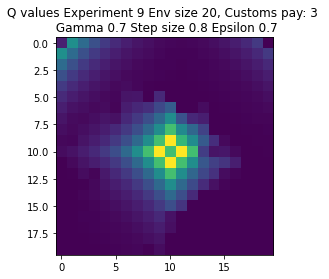

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.7 Step size 0.8 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-58.0 Reward:-1144 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-993.0 Reward:-307 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-452.0 Reward:591 Timesteps:400 GotPack:False Utiltime:389 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-349.0 Reward:336 Timesteps:800 GotPack:False Utiltime:784 Customstime:0 Money:3
Expr:0 Eps:80 RunnAReward:-483.0 Reward:172 Timesteps:2654 GotPack:True Utiltime:759 Customstime:885 Money:5
Expr:0 Eps:100 RunnAReward:186.0 Reward:1956 Timesteps:1578 GotPack:True Utiltime:814 Customstime:1131 Money:4
Expr:0 Eps:120 RunnAReward:445.0 Reward:628 Timesteps:400 GotPack:False Utiltime:1

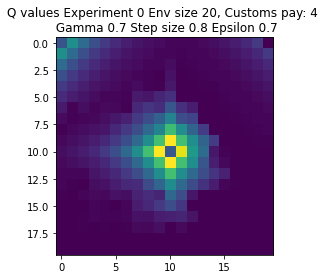

Expr:1 Eps:0 RunnAReward:-26.0 Reward:-515 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-823.0 Reward:-442 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-1308.0 Reward:-338 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-121.0 Reward:-449 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:14.0 Reward:-1833 Timesteps:4436 GotPack:True Utiltime:1 Customstime:863 Money:5
Expr:1 Eps:100 RunnAReward:131.0 Reward:605 Timesteps:400 GotPack:False Utiltime:250 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:397.0 Reward:752 Timesteps:400 GotPack:False Utiltime:66 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:614.0 Reward:1521 Timesteps:1415 GotPack:True Utiltime:54 Customstime:607 Money:5
Expr:1 Eps:160 RunnAReward:966.0 Reward:-136 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:754.0 Reward:23

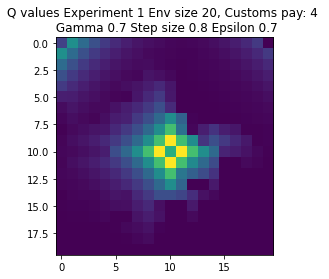

Expr:2 Eps:0 RunnAReward:-8.0 Reward:-143 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-1426.0 Reward:-546 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-461.0 Reward:-606 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-200.0 Reward:-55 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:197.0 Reward:198 Timesteps:2726 GotPack:True Utiltime:176 Customstime:910 Money:5
Expr:2 Eps:100 RunnAReward:77.0 Reward:591 Timesteps:400 GotPack:False Utiltime:108 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:436.0 Reward:24 Timesteps:1200 GotPack:False Utiltime:46 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:308.0 Reward:2162 Timesteps:1282 GotPack:True Utiltime:58 Customstime:609 Money:4
Expr:2 Eps:160 RunnAReward:682.0 Reward:-74 Timesteps:800 GotPack:False Utiltime:17 Customstime:0 Money:3
Expr:2 Eps:180 RunnAReward:861.0 Reward:66 T

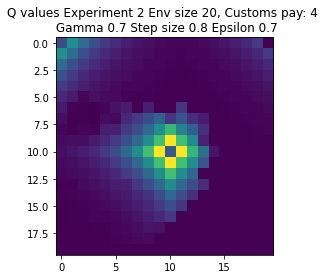

Expr:3 Eps:0 RunnAReward:-40.0 Reward:-787 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-1455.0 Reward:-1373 Timesteps:4062 GotPack:True Utiltime:2770 Customstime:2927 Money:5
Expr:3 Eps:40 RunnAReward:-148.0 Reward:0 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-88.0 Reward:-196 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-68.0 Reward:-716 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:100 RunnAReward:77.0 Reward:506 Timesteps:800 GotPack:False Utiltime:397 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:411.0 Reward:1327 Timesteps:2184 GotPack:True Utiltime:1303 Customstime:1488 Money:5
Expr:3 Eps:140 RunnAReward:824.0 Reward:1891 Timesteps:1649 GotPack:True Utiltime:665 Customstime:708 Money:5
Expr:3 Eps:160 RunnAReward:281.0 Reward:1877 Timesteps:1455 GotPack:True Utiltime:398 Customstime:490 Money:5
Expr:3 Eps:180 RunnAReward:1381

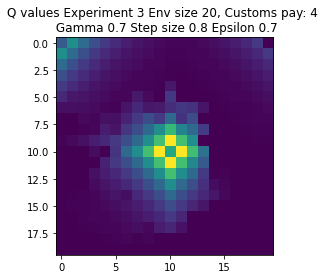

Expr:4 Eps:0 RunnAReward:-48.0 Reward:-953 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-1286.0 Reward:-1025 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-346.0 Reward:-871 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:60 RunnAReward:-233.0 Reward:15 Timesteps:2626 GotPack:True Utiltime:1428 Customstime:1982 Money:4
Expr:4 Eps:80 RunnAReward:-7.0 Reward:-1215 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-185.0 Reward:-402 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:193.0 Reward:98 Timesteps:800 GotPack:False Utiltime:236 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:316.0 Reward:210 Timesteps:800 GotPack:False Utiltime:318 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:453.0 Reward:1071 Timesteps:400 GotPack:False Utiltime:68 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:723.0 Reward:

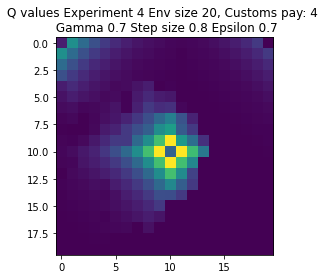

Expr:5 Eps:0 RunnAReward:-8.0 Reward:-160 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-842.0 Reward:-317 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-1214.0 Reward:-4010 Timesteps:5615 GotPack:True Utiltime:984 Customstime:1936 Money:4
Expr:5 Eps:60 RunnAReward:-284.0 Reward:679 Timesteps:400 GotPack:False Utiltime:397 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:187.0 Reward:206 Timesteps:800 GotPack:False Utiltime:79 Customstime:0 Money:3
Expr:5 Eps:100 RunnAReward:487.0 Reward:746 Timesteps:400 GotPack:False Utiltime:301 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:575.0 Reward:741 Timesteps:400 GotPack:False Utiltime:126 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:509.0 Reward:164 Timesteps:800 GotPack:False Utiltime:33 Customstime:0 Money:3
Expr:5 Eps:160 RunnAReward:614.0 Reward:2226 Timesteps:1458 GotPack:True Utiltime:592 Customstime:722 Money:5
Expr:5 Eps:180 RunnAReward:1014.0 Re

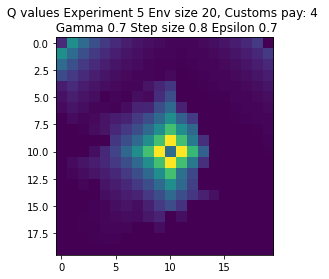

Expr:6 Eps:0 RunnAReward:-157.0 Reward:-3122 Timesteps:5725 GotPack:True Utiltime:1060 Customstime:1612 Money:5
Expr:6 Eps:20 RunnAReward:-1254.0 Reward:-581 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-666.0 Reward:-185 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:185.0 Reward:-7 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-414.0 Reward:-3325 Timesteps:5856 GotPack:True Utiltime:287 Customstime:869 Money:5
Expr:6 Eps:100 RunnAReward:129.0 Reward:-29 Timesteps:800 GotPack:False Utiltime:238 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:416.0 Reward:-182 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:832.0 Reward:2793 Timesteps:835 GotPack:True Utiltime:236 Customstime:443 Money:5
Expr:6 Eps:160 RunnAReward:622.0 Reward:1151 Timesteps:400 GotPack:False Utiltime:115 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:774.

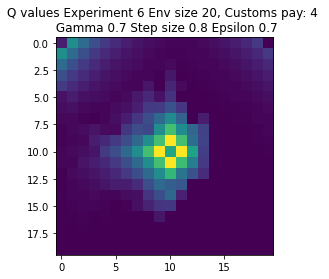

Expr:7 Eps:0 RunnAReward:-34.0 Reward:-679 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-1059.0 Reward:-609 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-1726.0 Reward:-505 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:21.0 Reward:-1251 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:80 RunnAReward:-341.0 Reward:-244 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-6.0 Reward:-1807 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:146.0 Reward:1604 Timesteps:1743 GotPack:True Utiltime:1399 Customstime:1686 Money:4
Expr:7 Eps:140 RunnAReward:344.0 Reward:960 Timesteps:400 GotPack:False Utiltime:265 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:523.0 Reward:367 Timesteps:800 GotPack:False Utiltime:130 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:749.0 Rewar

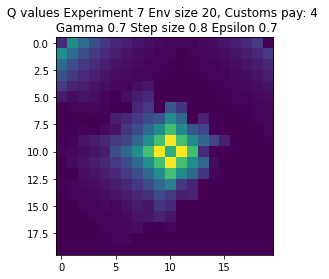

Expr:8 Eps:0 RunnAReward:-35.0 Reward:-684 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-817.0 Reward:-304 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-282.0 Reward:1014 Timesteps:400 GotPack:False Utiltime:49 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-639.0 Reward:-111 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-402.0 Reward:-958 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:-85.0 Reward:-1236 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:120 RunnAReward:84.0 Reward:518 Timesteps:400 GotPack:False Utiltime:152 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:550.0 Reward:419 Timesteps:800 GotPack:False Utiltime:650 Customstime:0 Money:3
Expr:8 Eps:160 RunnAReward:514.0 Reward:798 Timesteps:400 GotPack:False Utiltime:73 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:715.0 Reward:633 T

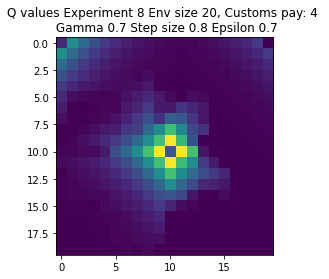

Expr:9 Eps:0 RunnAReward:-38.0 Reward:-743 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-1058.0 Reward:-7069 Timesteps:7659 GotPack:True Utiltime:6031 Customstime:6409 Money:4
Expr:9 Eps:40 RunnAReward:-843.0 Reward:523 Timesteps:2374 GotPack:True Utiltime:1132 Customstime:2204 Money:4
Expr:9 Eps:60 RunnAReward:-18.0 Reward:-410 Timesteps:3227 GotPack:True Utiltime:2112 Customstime:2597 Money:5
Expr:9 Eps:80 RunnAReward:-23.0 Reward:-210 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:658.0 Reward:283 Timesteps:800 GotPack:False Utiltime:445 Customstime:0 Money:3
Expr:9 Eps:120 RunnAReward:306.0 Reward:1150 Timesteps:400 GotPack:False Utiltime:150 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:619.0 Reward:-688 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:911.0 Reward:1725 Timesteps:1748 GotPack:True Utiltime:609 Customstime:661 Money:5
Expr:9 Eps:180 RunnARewa

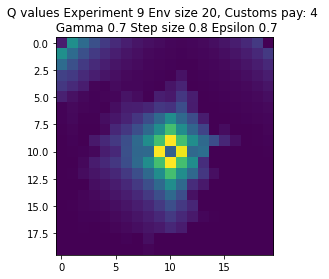

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.7 Step size 0.8 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-68.0 Reward:-1359 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-1547.0 Reward:-1162 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-2427.0 Reward:-781 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-1098.0 Reward:-4550 Timesteps:5795 GotPack:True Utiltime:1256 Customstime:1523 Money:3
Expr:0 Eps:80 RunnAReward:-1569.0 Reward:-5485 Timesteps:6397 GotPack:True Utiltime:4614 Customstime:4789 Money:3
Expr:0 Eps:100 RunnAReward:-234.0 Reward:1108 Timesteps:1597 GotPack:True Utiltime:371 Customstime:683 Money:5
Expr:0 Eps:120 RunnAReward:119.0 Reward:-2628 Timesteps:4641 GotPack

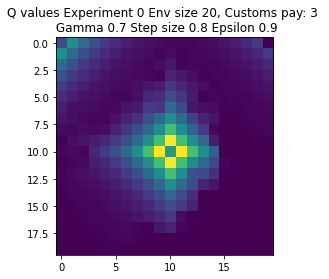

Expr:1 Eps:0 RunnAReward:-52.0 Reward:-1025 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-1889.0 Reward:-631 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-984.0 Reward:-1520 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-1048.0 Reward:-472 Timesteps:3103 GotPack:True Utiltime:398 Customstime:1073 Money:5
Expr:1 Eps:80 RunnAReward:-858.0 Reward:634 Timesteps:800 GotPack:False Utiltime:578 Customstime:0 Money:1
Expr:1 Eps:100 RunnAReward:41.0 Reward:412 Timesteps:800 GotPack:False Utiltime:538 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:149.0 Reward:288 Timesteps:800 GotPack:False Utiltime:576 Customstime:0 Money:1
Expr:1 Eps:140 RunnAReward:607.0 Reward:439 Timesteps:800 GotPack:False Utiltime:209 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:359.0 Reward:2343 Timesteps:1203 GotPack:True Utiltime:95 Customstime:922 Money:3
Expr:1 Eps:180 RunnAReward:598.0

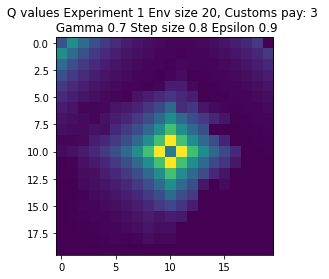

Expr:2 Eps:0 RunnAReward:-33.0 Reward:-642 Timesteps:3493 GotPack:True Utiltime:862 Customstime:3280 Money:5
Expr:2 Eps:20 RunnAReward:-1361.0 Reward:-645 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-1768.0 Reward:507 Timesteps:800 GotPack:False Utiltime:16 Customstime:0 Money:1
Expr:2 Eps:60 RunnAReward:-774.0 Reward:199 Timesteps:800 GotPack:False Utiltime:546 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-514.0 Reward:74 Timesteps:2888 GotPack:True Utiltime:2027 Customstime:2524 Money:4
Expr:2 Eps:100 RunnAReward:-222.0 Reward:488 Timesteps:800 GotPack:False Utiltime:672 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-602.0 Reward:-24 Timesteps:1200 GotPack:False Utiltime:417 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:116.0 Reward:180 Timesteps:1200 GotPack:False Utiltime:177 Customstime:0 Money:2
Expr:2 Eps:160 RunnAReward:288.0 Reward:1435 Timesteps:1874 GotPack:True Utiltime:147 Customstime:863 Money:3
Expr:2 Eps:180 RunnARewar

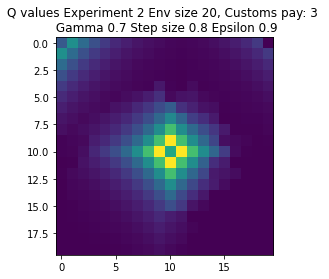

Expr:3 Eps:0 RunnAReward:3.0 Reward:70 Timesteps:800 GotPack:False Utiltime:8 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-2592.0 Reward:-13677 Timesteps:12000 GotPack:False Utiltime:4795 Customstime:5602 Money:3
Expr:3 Eps:40 RunnAReward:-1693.0 Reward:-4740 Timesteps:5162 GotPack:True Utiltime:1892 Customstime:2906 Money:3
Expr:3 Eps:60 RunnAReward:-693.0 Reward:-477 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-948.0 Reward:388 Timesteps:800 GotPack:False Utiltime:437 Customstime:0 Money:1
Expr:3 Eps:100 RunnAReward:93.0 Reward:80 Timesteps:1200 GotPack:False Utiltime:230 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:10.0 Reward:-4678 Timesteps:6123 GotPack:True Utiltime:2740 Customstime:3053 Money:3
Expr:3 Eps:140 RunnAReward:-71.0 Reward:-1334 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:369.0 Reward:-412 Timesteps:800 GotPack:False Utiltime:238 Customstime:0 Money:0
Expr:3 Eps:180 RunnARe

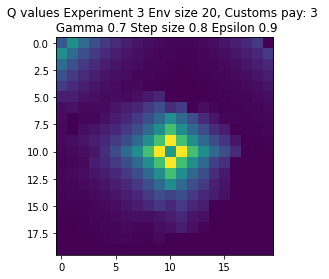

Expr:4 Eps:0 RunnAReward:-49.0 Reward:-967 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:20 RunnAReward:-1754.0 Reward:-578 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:-2242.0 Reward:119 Timesteps:800 GotPack:False Utiltime:80 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-2118.0 Reward:-831 Timesteps:3338 GotPack:True Utiltime:714 Customstime:911 Money:3
Expr:4 Eps:80 RunnAReward:-686.0 Reward:-2139 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-340.0 Reward:-2488 Timesteps:4711 GotPack:True Utiltime:1833 Customstime:4428 Money:5
Expr:4 Eps:120 RunnAReward:385.0 Reward:677 Timesteps:2571 GotPack:True Utiltime:867 Customstime:1933 Money:3
Expr:4 Eps:140 RunnAReward:157.0 Reward:53 Timesteps:1200 GotPack:False Utiltime:612 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:749.0 Reward:1069 Timesteps:2169 GotPack:True Utiltime:565 Customstime:1064 Money:5
Expr:4 Eps:180 RunnAR

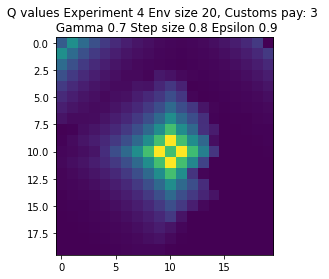

Expr:5 Eps:0 RunnAReward:-72.0 Reward:-1433 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-2682.0 Reward:-1360 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-1972.0 Reward:-475 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-963.0 Reward:-2553 Timesteps:4658 GotPack:True Utiltime:971 Customstime:1278 Money:5
Expr:5 Eps:80 RunnAReward:-507.0 Reward:-854 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:100 RunnAReward:-3.0 Reward:-582 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:120 RunnAReward:137.0 Reward:-1219 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:250.0 Reward:-130 Timesteps:1200 GotPack:False Utiltime:101 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:519.0 Reward:1852 Timesteps:1374 GotPack:True Utiltime:296 Customstime:552 Money:3
Expr:5 Eps:180 RunnAReward:27

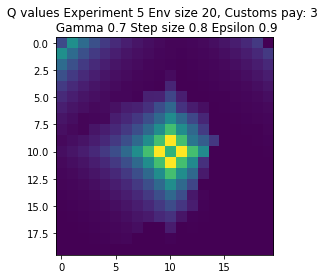

Expr:6 Eps:0 RunnAReward:3.0 Reward:71 Timesteps:2955 GotPack:True Utiltime:1388 Customstime:2213 Money:3
Expr:6 Eps:20 RunnAReward:-1344.0 Reward:-1153 Timesteps:3175 GotPack:True Utiltime:1324 Customstime:2532 Money:5
Expr:6 Eps:40 RunnAReward:-1525.0 Reward:-725 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-1231.0 Reward:449 Timesteps:800 GotPack:False Utiltime:717 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-372.0 Reward:189 Timesteps:800 GotPack:False Utiltime:3 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-643.0 Reward:169 Timesteps:800 GotPack:False Utiltime:55 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:-576.0 Reward:-1008 Timesteps:1600 GotPack:False Utiltime:36 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:532.0 Reward:1899 Timesteps:1530 GotPack:True Utiltime:229 Customstime:855 Money:3
Expr:6 Eps:160 RunnAReward:535.0 Reward:74 Timesteps:800 GotPack:False Utiltime:202 Customstime:0 Money:1
Expr:6 Eps:180 RunnAReward:

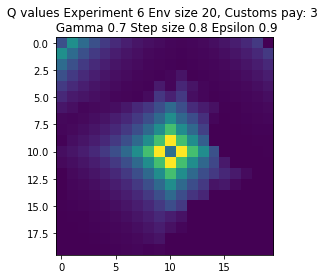

Expr:7 Eps:0 RunnAReward:-68.0 Reward:-1343 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-3343.0 Reward:-1634 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:40 RunnAReward:-1781.0 Reward:-1039 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-1281.0 Reward:347 Timesteps:800 GotPack:False Utiltime:179 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-618.0 Reward:-40 Timesteps:800 GotPack:False Utiltime:134 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-256.0 Reward:-409 Timesteps:800 GotPack:False Utiltime:643 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-10.0 Reward:-250 Timesteps:1200 GotPack:False Utiltime:372 Customstime:0 Money:1
Expr:7 Eps:140 RunnAReward:167.0 Reward:511 Timesteps:800 GotPack:False Utiltime:259 Customstime:0 Money:1
Expr:7 Eps:160 RunnAReward:291.0 Reward:-139 Timesteps:1200 GotPack:False Utiltime:208 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:1

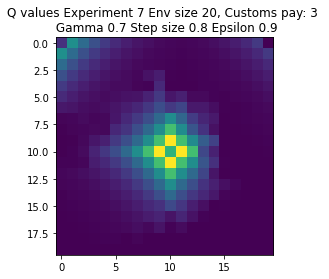

Expr:8 Eps:0 RunnAReward:-63.0 Reward:-1256 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-1405.0 Reward:-525 Timesteps:1200 GotPack:False Utiltime:360 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-2040.0 Reward:-870 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-1554.0 Reward:402 Timesteps:800 GotPack:False Utiltime:582 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-564.0 Reward:575 Timesteps:800 GotPack:False Utiltime:189 Customstime:0 Money:1
Expr:8 Eps:100 RunnAReward:-33.0 Reward:-281 Timesteps:1200 GotPack:False Utiltime:195 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:-37.0 Reward:417 Timesteps:800 GotPack:False Utiltime:155 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:390.0 Reward:949 Timesteps:1956 GotPack:True Utiltime:723 Customstime:1162 Money:3
Expr:8 Eps:160 RunnAReward:1012.0 Reward:565 Timesteps:800 GotPack:False Utiltime:56 Customstime:0 Money:1
Expr:8 Eps:180 RunnAReward:772

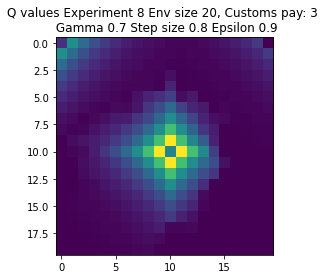

Expr:9 Eps:0 RunnAReward:-71.0 Reward:-1402 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-2165.0 Reward:81 Timesteps:800 GotPack:False Utiltime:193 Customstime:0 Money:1
Expr:9 Eps:40 RunnAReward:-1609.0 Reward:-1721 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-1505.0 Reward:-624 Timesteps:3451 GotPack:True Utiltime:153 Customstime:970 Money:3
Expr:9 Eps:80 RunnAReward:-613.0 Reward:-1628 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:-232.0 Reward:392 Timesteps:2802 GotPack:True Utiltime:2013 Customstime:2390 Money:3
Expr:9 Eps:120 RunnAReward:-967.0 Reward:430 Timesteps:800 GotPack:False Utiltime:434 Customstime:0 Money:1
Expr:9 Eps:140 RunnAReward:246.0 Reward:423 Timesteps:800 GotPack:False Utiltime:97 Customstime:0 Money:1
Expr:9 Eps:160 RunnAReward:584.0 Reward:1307 Timesteps:1979 GotPack:True Utiltime:727 Customstime:924 Money:3
Expr:9 Eps:180 RunnARewa

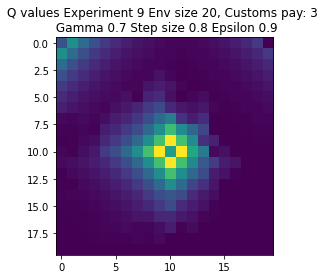

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.7 Step size 0.8 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-9.0 Reward:-171 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-1168.0 Reward:-694 Timesteps:3122 GotPack:True Utiltime:2530 Customstime:2849 Money:4
Expr:0 Eps:40 RunnAReward:-936.0 Reward:188 Timesteps:800 GotPack:False Utiltime:209 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-301.0 Reward:1001 Timesteps:400 GotPack:False Utiltime:145 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-364.0 Reward:-66 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-314.0 Reward:-2234 Timesteps:4287 GotPack:True Utiltime:2788 Customstime:3099 Money:4
Expr:0 Eps:120 RunnAReward:-283.0 Reward:748 Timesteps:400 GotPack:False Util

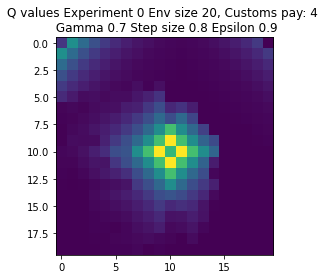

Expr:1 Eps:0 RunnAReward:1.0 Reward:30 Timesteps:800 GotPack:False Utiltime:631 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-552.0 Reward:-1160 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-212.0 Reward:-550 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-270.0 Reward:-111 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-990.0 Reward:-2970 Timesteps:4213 GotPack:True Utiltime:148 Customstime:2711 Money:5
Expr:1 Eps:100 RunnAReward:-912.0 Reward:-81 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:-6.0 Reward:-288 Timesteps:800 GotPack:False Utiltime:190 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:-236.0 Reward:-629 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:786.0 Reward:2771 Timesteps:756 GotPack:True Utiltime:208 Customstime:437 Money:5
Expr:1 Eps:180 RunnAReward:344.0 Rewa

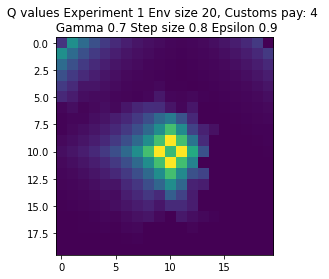

Expr:2 Eps:0 RunnAReward:-17.0 Reward:-331 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-497.0 Reward:-1148 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-583.0 Reward:-194 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-859.0 Reward:-934 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:80 RunnAReward:-858.0 Reward:-10533 Timesteps:9726 GotPack:True Utiltime:3436 Customstime:5312 Money:5
Expr:2 Eps:100 RunnAReward:-867.0 Reward:594 Timesteps:400 GotPack:False Utiltime:157 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-177.0 Reward:-161 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-90.0 Reward:-105 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:427.0 Reward:644 Timesteps:800 GotPack:False Utiltime:123 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:425.0 Re

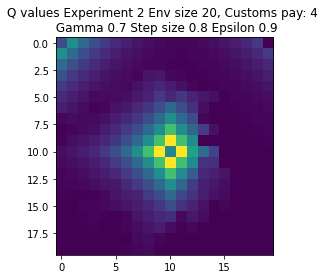

Expr:3 Eps:0 RunnAReward:-24.0 Reward:-463 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-770.0 Reward:-178 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-191.0 Reward:-294 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-1696.0 Reward:363 Timesteps:400 GotPack:False Utiltime:320 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-586.0 Reward:-852 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:-342.0 Reward:-438 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-272.0 Reward:-3708 Timesteps:5636 GotPack:True Utiltime:3882 Customstime:4240 Money:5
Expr:3 Eps:140 RunnAReward:-290.0 Reward:-637 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:160 RunnAReward:199.0 Reward:1051 Timesteps:400 GotPack:False Utiltime:148 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:631.0 R

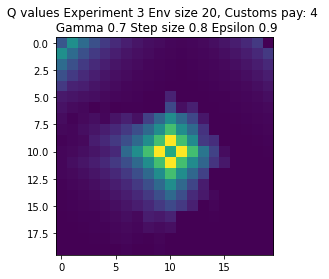

Expr:4 Eps:0 RunnAReward:-57.0 Reward:-1128 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-888.0 Reward:-594 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-917.0 Reward:667 Timesteps:400 GotPack:False Utiltime:137 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-1160.0 Reward:-934 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:80 RunnAReward:-1113.0 Reward:-564 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:27.0 Reward:883 Timesteps:400 GotPack:False Utiltime:87 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:298.0 Reward:20 Timesteps:800 GotPack:False Utiltime:73 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:114.0 Reward:596 Timesteps:2613 GotPack:True Utiltime:8 Customstime:1452 Money:5
Expr:4 Eps:160 RunnAReward:-196.0 Reward:672 Timesteps:400 GotPack:False Utiltime:62 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:101.0 Reward:-3

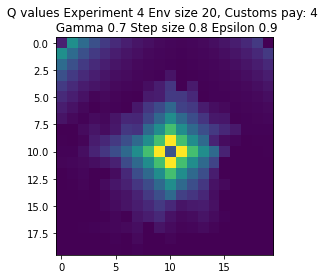

Expr:5 Eps:0 RunnAReward:-31.0 Reward:-601 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-851.0 Reward:157 Timesteps:2533 GotPack:True Utiltime:1686 Customstime:2006 Money:5
Expr:5 Eps:40 RunnAReward:-641.0 Reward:-114 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-918.0 Reward:-405 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-674.0 Reward:-770 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:-141.0 Reward:-112 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:121.0 Reward:542 Timesteps:400 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:329.0 Reward:-544 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:-513.0 Reward:635 Timesteps:400 GotPack:False Utiltime:248 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:400.0 Reward:

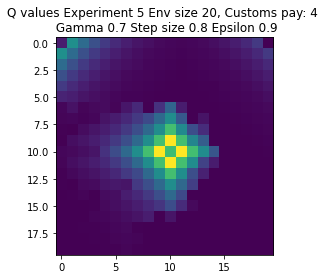

Expr:6 Eps:0 RunnAReward:-24.0 Reward:-480 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-953.0 Reward:322 Timesteps:800 GotPack:False Utiltime:433 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-2254.0 Reward:-245 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-751.0 Reward:-288 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-514.0 Reward:-927 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:-389.0 Reward:-336 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:151.0 Reward:-433 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:354.0 Reward:408 Timesteps:800 GotPack:False Utiltime:550 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:502.0 Reward:906 Timesteps:400 GotPack:False Utiltime:157 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:931.0 Reward:-11

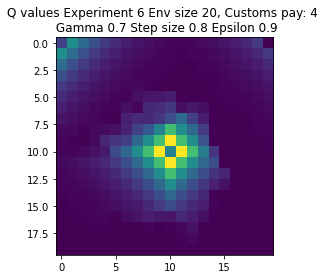

Expr:7 Eps:0 RunnAReward:-28.0 Reward:-557 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-706.0 Reward:-243 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-1114.0 Reward:-648 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-587.0 Reward:-6734 Timesteps:7601 GotPack:True Utiltime:849 Customstime:3249 Money:4
Expr:7 Eps:80 RunnAReward:-420.0 Reward:658 Timesteps:400 GotPack:False Utiltime:199 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-621.0 Reward:1173 Timesteps:1949 GotPack:True Utiltime:43 Customstime:1422 Money:4
Expr:7 Eps:120 RunnAReward:-88.0 Reward:-912 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:140 RunnAReward:533.0 Reward:662 Timesteps:800 GotPack:False Utiltime:540 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:224.0 Reward:978 Timesteps:400 GotPack:False Utiltime:27 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:413.0 R

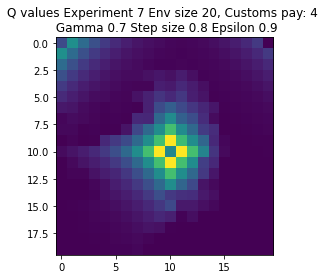

Expr:8 Eps:0 RunnAReward:-95.0 Reward:-1881 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-1449.0 Reward:-505 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-376.0 Reward:564 Timesteps:400 GotPack:False Utiltime:352 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-389.0 Reward:-140 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:12.0 Reward:-129 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-538.0 Reward:-194 Timesteps:800 GotPack:False Utiltime:59 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:140.0 Reward:524 Timesteps:2814 GotPack:True Utiltime:764 Customstime:1563 Money:4
Expr:8 Eps:140 RunnAReward:130.0 Reward:-209 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:-249.0 Reward:1072 Timesteps:400 GotPack:False Utiltime:34 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:331.0 Rewar

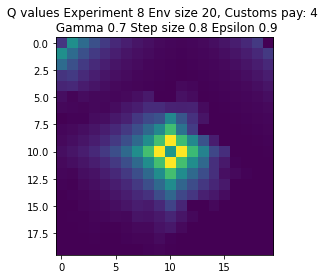

Expr:9 Eps:0 RunnAReward:-54.0 Reward:-1073 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-1042.0 Reward:-2179 Timesteps:4337 GotPack:True Utiltime:182 Customstime:3919 Money:5
Expr:9 Eps:40 RunnAReward:-1139.0 Reward:-6632 Timesteps:7874 GotPack:True Utiltime:5811 Customstime:6838 Money:5
Expr:9 Eps:60 RunnAReward:-627.0 Reward:-45 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-471.0 Reward:-2316 Timesteps:4850 GotPack:True Utiltime:2055 Customstime:2452 Money:5
Expr:9 Eps:100 RunnAReward:-82.0 Reward:-571 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:100.0 Reward:-1314 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:-5.0 Reward:1582 Timesteps:1377 GotPack:True Utiltime:126 Customstime:1100 Money:4
Expr:9 Eps:160 RunnAReward:524.0 Reward:1084 Timesteps:400 GotPack:False Utiltime:35 Customstime:0 Money:0
Expr:9 Eps:180 Runn

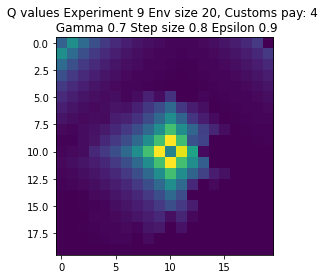

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.7 Step size 0.8 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-119.0 Reward:-2377 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-1185.0 Reward:-1312 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-1202.0 Reward:-1063 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-2060.0 Reward:-5952 Timesteps:7204 GotPack:True Utiltime:870 Customstime:6650 Money:3
Expr:0 Eps:80 RunnAReward:-1579.0 Reward:-9566 Timesteps:9807 GotPack:True Utiltime:5022 Customstime:5256 Money:3
Expr:0 Eps:100 RunnAReward:-2125.0 Reward:-329 Timesteps:1200 GotPack:False Utiltime:243 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:-351.0 Reward:-743 Timesteps:800 GotPac

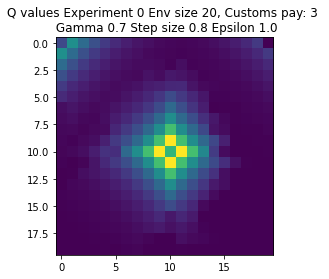

Expr:1 Eps:0 RunnAReward:-107.0 Reward:-2140 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:20 RunnAReward:-2121.0 Reward:-1202 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-1673.0 Reward:-560 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-2423.0 Reward:-2198 Timesteps:1600 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:-1399.0 Reward:134 Timesteps:2490 GotPack:True Utiltime:1519 Customstime:1737 Money:3
Expr:1 Eps:100 RunnAReward:-1294.0 Reward:-2548 Timesteps:4858 GotPack:True Utiltime:3489 Customstime:3807 Money:3
Expr:1 Eps:120 RunnAReward:-807.0 Reward:-771 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:140 RunnAReward:-503.0 Reward:532 Timesteps:800 GotPack:False Utiltime:191 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:-305.0 Reward:210 Timesteps:800 GotPack:False Utiltime:274 Customstime:0 Money:0
Expr:1 Eps:180 Runn

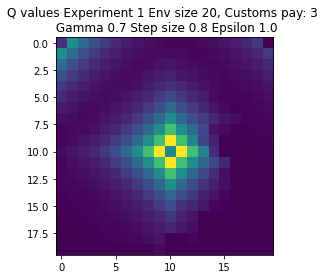

Expr:2 Eps:0 RunnAReward:-59.0 Reward:-1179 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-2741.0 Reward:-1413 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:40 RunnAReward:-2072.0 Reward:-684 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-1408.0 Reward:-7956 Timesteps:7858 GotPack:True Utiltime:6493 Customstime:7766 Money:5
Expr:2 Eps:80 RunnAReward:-2214.0 Reward:-1531 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-1605.0 Reward:-318 Timesteps:2653 GotPack:True Utiltime:1281 Customstime:1360 Money:4
Expr:2 Eps:120 RunnAReward:-410.0 Reward:-547 Timesteps:1200 GotPack:False Utiltime:56 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:-558.0 Reward:365 Timesteps:800 GotPack:False Utiltime:449 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:-560.0 Reward:425 Timesteps:800 GotPack:False Utiltime:222 Customstime:0 Money:0
Expr:2 Eps:180 Run

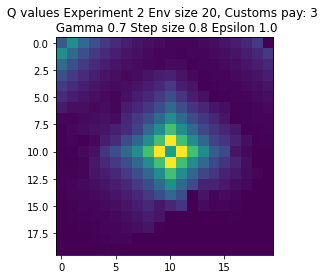

Expr:3 Eps:0 RunnAReward:-2.0 Reward:-39 Timesteps:800 GotPack:False Utiltime:639 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-4903.0 Reward:-587 Timesteps:1200 GotPack:False Utiltime:609 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-1124.0 Reward:-646 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-1031.0 Reward:-1997 Timesteps:4493 GotPack:True Utiltime:2041 Customstime:3203 Money:3
Expr:3 Eps:80 RunnAReward:-1281.0 Reward:373 Timesteps:2423 GotPack:True Utiltime:862 Customstime:1776 Money:5
Expr:3 Eps:100 RunnAReward:-1002.0 Reward:405 Timesteps:800 GotPack:False Utiltime:694 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:235.0 Reward:-88 Timesteps:800 GotPack:False Utiltime:383 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-506.0 Reward:-879 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:132.0 Reward:131 Timesteps:800 GotPack:False Utiltime:14 Customstime:0 Money:2
Expr:3 Eps:180 RunnARewar

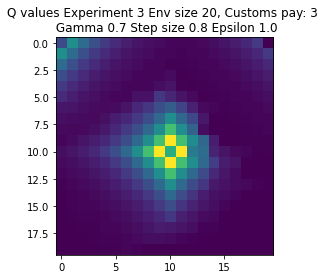

Expr:4 Eps:0 RunnAReward:-94.0 Reward:-1870 Timesteps:1600 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-2555.0 Reward:-909 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-1828.0 Reward:-196 Timesteps:800 GotPack:False Utiltime:575 Customstime:0 Money:1
Expr:4 Eps:60 RunnAReward:-1608.0 Reward:-11672 Timesteps:11276 GotPack:True Utiltime:5064 Customstime:8467 Money:4
Expr:4 Eps:80 RunnAReward:-1478.0 Reward:-8569 Timesteps:8976 GotPack:True Utiltime:2888 Customstime:3119 Money:5
Expr:4 Eps:100 RunnAReward:-1490.0 Reward:-730 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-342.0 Reward:-442 Timesteps:1200 GotPack:False Utiltime:145 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:-579.0 Reward:129 Timesteps:800 GotPack:False Utiltime:352 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:227.0 Reward:384 Timesteps:800 GotPack:False Utiltime:266 Customstime:0 Money:1
Expr:4 Eps:180 

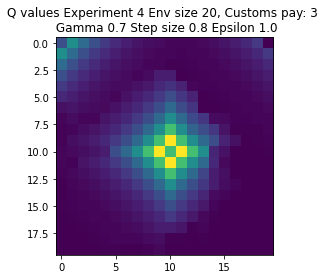

Expr:5 Eps:0 RunnAReward:-87.0 Reward:-1737 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-2354.0 Reward:-14709 Timesteps:12000 GotPack:False Utiltime:1378 Customstime:2961 Money:4
Expr:5 Eps:40 RunnAReward:-2873.0 Reward:-921 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-2169.0 Reward:-1345 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:-564.0 Reward:-921 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-1550.0 Reward:-3405 Timesteps:5463 GotPack:True Utiltime:737 Customstime:1574 Money:5
Expr:5 Eps:120 RunnAReward:-567.0 Reward:392 Timesteps:800 GotPack:False Utiltime:353 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:-219.0 Reward:156 Timesteps:800 GotPack:False Utiltime:175 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:299.0 Reward:-349 Timesteps:1200 GotPack:False Utiltime:167 Customstime:0 Money:2
Expr:5 Eps:180 Ru

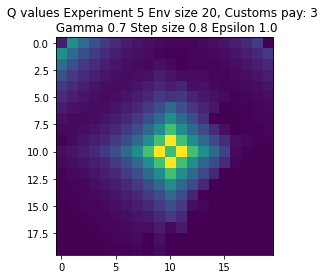

Expr:6 Eps:0 RunnAReward:-60.0 Reward:-1199 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-2767.0 Reward:-1375 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-1201.0 Reward:-788 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-2059.0 Reward:-1110 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:80 RunnAReward:-857.0 Reward:-967 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-813.0 Reward:-5251 Timesteps:6398 GotPack:True Utiltime:2102 Customstime:4096 Money:4
Expr:6 Eps:120 RunnAReward:-858.0 Reward:-2417 Timesteps:4795 GotPack:True Utiltime:587 Customstime:2476 Money:4
Expr:6 Eps:140 RunnAReward:-92.0 Reward:2397 Timesteps:1152 GotPack:True Utiltime:299 Customstime:960 Money:3
Expr:6 Eps:160 RunnAReward:493.0 Reward:285 Timesteps:2485 GotPack:True Utiltime:827 Customstime:1164 Money:4
Expr:6 Eps:180 Run

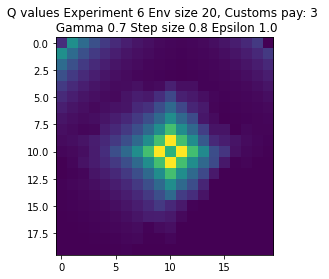

Expr:7 Eps:0 RunnAReward:-52.0 Reward:-1038 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:20 RunnAReward:-2469.0 Reward:-7491 Timesteps:8175 GotPack:True Utiltime:1481 Customstime:1700 Money:5
Expr:7 Eps:40 RunnAReward:-3749.0 Reward:-5122 Timesteps:6175 GotPack:True Utiltime:2974 Customstime:3076 Money:3
Expr:7 Eps:60 RunnAReward:-1138.0 Reward:-2178 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-516.0 Reward:-1666 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:-967.0 Reward:-706 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-1124.0 Reward:-248 Timesteps:800 GotPack:False Utiltime:91 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-78.0 Reward:-1183 Timesteps:4010 GotPack:True Utiltime:324 Customstime:436 Money:3
Expr:7 Eps:160 RunnAReward:-222.0 Reward:-780 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:180 R

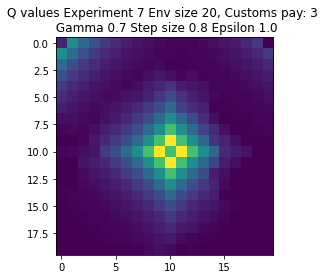

Expr:8 Eps:0 RunnAReward:6.0 Reward:120 Timesteps:1200 GotPack:False Utiltime:77 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-980.0 Reward:596 Timesteps:800 GotPack:False Utiltime:791 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-2095.0 Reward:-960 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:60 RunnAReward:-1795.0 Reward:-558 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-451.0 Reward:-32 Timesteps:800 GotPack:False Utiltime:44 Customstime:0 Money:1
Expr:8 Eps:100 RunnAReward:-1099.0 Reward:575 Timesteps:800 GotPack:False Utiltime:242 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:87.0 Reward:21 Timesteps:800 GotPack:False Utiltime:80 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:-599.0 Reward:-143 Timesteps:1200 GotPack:False Utiltime:207 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:-116.0 Reward:-870 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:-304.0 Reward

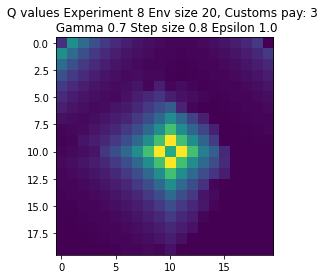

Expr:9 Eps:0 RunnAReward:-33.0 Reward:-655 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-1002.0 Reward:185 Timesteps:800 GotPack:False Utiltime:190 Customstime:0 Money:1
Expr:9 Eps:40 RunnAReward:-795.0 Reward:-921 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-1290.0 Reward:-717 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-347.0 Reward:-55 Timesteps:800 GotPack:False Utiltime:144 Customstime:0 Money:1
Expr:9 Eps:100 RunnAReward:-1360.0 Reward:-3343 Timesteps:5190 GotPack:True Utiltime:2580 Customstime:2769 Money:3
Expr:9 Eps:120 RunnAReward:-1319.0 Reward:-113 Timesteps:800 GotPack:False Utiltime:262 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-120.0 Reward:1673 Timesteps:1777 GotPack:True Utiltime:1407 Customstime:1530 Money:5
Expr:9 Eps:160 RunnAReward:130.0 Reward:-5480 Timesteps:6543 GotPack:True Utiltime:3625 Customstime:4775 Money:4
Expr:9 Eps:180 Ru

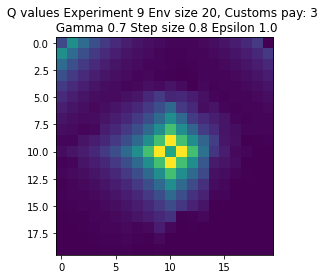

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.7 Step size 0.8 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-37.0 Reward:-722 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-1383.0 Reward:-200 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-1916.0 Reward:-91 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-1378.0 Reward:-165 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-1071.0 Reward:-540 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-777.0 Reward:-343 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:87.0 Reward:-266 Timesteps:400 GotPack:False Utiltime:0 Custom

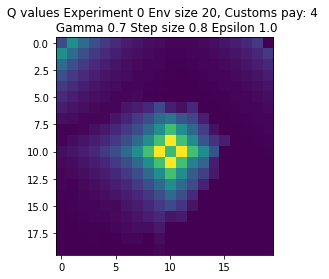

Expr:1 Eps:0 RunnAReward:-21.0 Reward:-410 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-739.0 Reward:-692 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-1171.0 Reward:-581 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-1661.0 Reward:-1736 Timesteps:4575 GotPack:True Utiltime:3230 Customstime:3731 Money:5
Expr:1 Eps:80 RunnAReward:-926.0 Reward:-690 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-709.0 Reward:342 Timesteps:800 GotPack:False Utiltime:221 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:-552.0 Reward:750 Timesteps:400 GotPack:False Utiltime:127 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:143.0 Reward:-400 Timesteps:1200 GotPack:False Utiltime:44 Customstime:0 Money:3
Expr:1 Eps:160 RunnAReward:-214.0 Reward:-962 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:90.0 

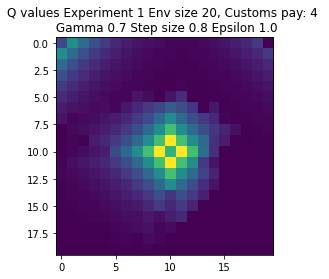

Expr:2 Eps:0 RunnAReward:21.0 Reward:424 Timesteps:400 GotPack:False Utiltime:328 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-2311.0 Reward:-127 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-969.0 Reward:-666 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-706.0 Reward:263 Timesteps:800 GotPack:False Utiltime:137 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:-876.0 Reward:-222 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-1171.0 Reward:-529 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-282.0 Reward:-44 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-37.0 Reward:127 Timesteps:800 GotPack:False Utiltime:586 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:507.0 Reward:2533 Timesteps:794 GotPack:True Utiltime:27 Customstime:494 Money:5
Expr:2 Eps:180 RunnAReward:488.0 Reward:9

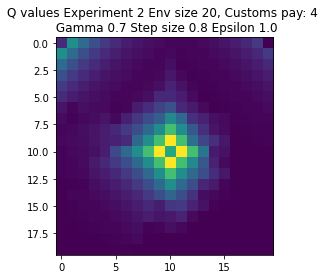

Expr:3 Eps:0 RunnAReward:-729.0 Reward:-14571 Timesteps:12000 GotPack:False Utiltime:8924 Customstime:9810 Money:4
Expr:3 Eps:20 RunnAReward:-1384.0 Reward:-715 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-2872.0 Reward:-738 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-1308.0 Reward:-223 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-585.0 Reward:620 Timesteps:400 GotPack:False Utiltime:116 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-426.0 Reward:-192 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-536.0 Reward:694 Timesteps:400 GotPack:False Utiltime:57 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:237.0 Reward:-448 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:224.0 Reward:898 Timesteps:400 GotPack:False Utiltime:308 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:365

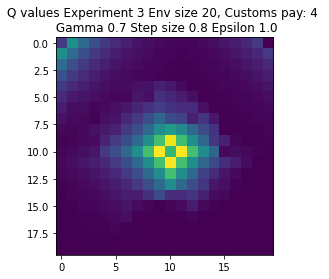

Expr:4 Eps:0 RunnAReward:-32.0 Reward:-625 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1443.0 Reward:-610 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-880.0 Reward:124 Timesteps:800 GotPack:False Utiltime:13 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-947.0 Reward:-123 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-1224.0 Reward:-533 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-60.0 Reward:-170 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-792.0 Reward:-1007 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:-483.0 Reward:-332 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:-380.0 Reward:52 Timesteps:800 GotPack:False Utiltime:61 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:593.0 Reward:-66

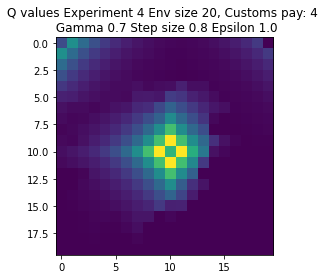

Expr:5 Eps:0 RunnAReward:-32.0 Reward:-622 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-553.0 Reward:-321 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-1157.0 Reward:-582 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-166.0 Reward:140 Timesteps:800 GotPack:False Utiltime:190 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:-1802.0 Reward:-1017 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:-928.0 Reward:-203 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-133.0 Reward:-1131 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:66.0 Reward:-70 Timesteps:800 GotPack:False Utiltime:61 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:43.0 Reward:1314 Timesteps:1776 GotPack:True Utiltime:240 Customstime:666 Money:4
Expr:5 Eps:180 RunnAReward:394.0 Rewar

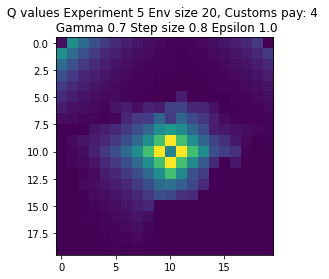

Expr:6 Eps:0 RunnAReward:-55.0 Reward:-1090 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:20 RunnAReward:-1003.0 Reward:-1156 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:40 RunnAReward:-967.0 Reward:-484 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-2072.0 Reward:-582 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-1277.0 Reward:-615 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-1271.0 Reward:-1319 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:120 RunnAReward:-572.0 Reward:803 Timesteps:2122 GotPack:True Utiltime:259 Customstime:584 Money:4
Expr:6 Eps:140 RunnAReward:14.0 Reward:-319 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:-31.0 Reward:-230 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:138.0 Rewa

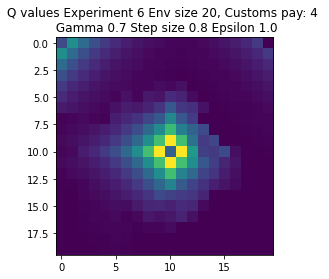

Expr:7 Eps:0 RunnAReward:-34.0 Reward:-674 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-542.0 Reward:-252 Timesteps:800 GotPack:False Utiltime:739 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-586.0 Reward:-427 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-1065.0 Reward:-642 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-368.0 Reward:-157 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-554.0 Reward:129 Timesteps:2354 GotPack:True Utiltime:766 Customstime:2063 Money:5
Expr:7 Eps:120 RunnAReward:-789.0 Reward:-199 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-391.0 Reward:-973 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:-284.0 Reward:-395 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:180.0 Rewa

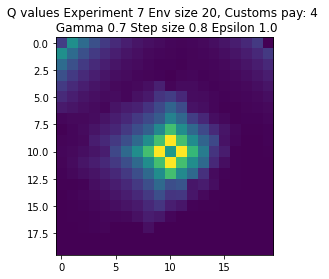

Expr:8 Eps:0 RunnAReward:-674.0 Reward:-13472 Timesteps:11952 GotPack:True Utiltime:5277 Customstime:6264 Money:4
Expr:8 Eps:20 RunnAReward:-2119.0 Reward:-551 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-633.0 Reward:-645 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-1185.0 Reward:-631 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-764.0 Reward:-243 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-106.0 Reward:656 Timesteps:400 GotPack:False Utiltime:239 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-271.0 Reward:-12 Timesteps:800 GotPack:False Utiltime:26 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:-400.0 Reward:-738 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:108.0 Reward:132 Timesteps:800 GotPack:False Utiltime:753 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:-329

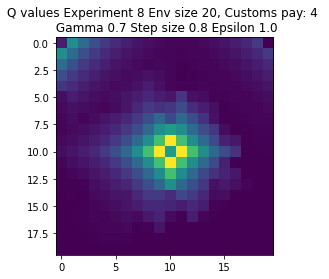

Expr:9 Eps:0 RunnAReward:-359.0 Reward:-7164 Timesteps:8119 GotPack:True Utiltime:6677 Customstime:7589 Money:5
Expr:9 Eps:20 RunnAReward:-2448.0 Reward:-430 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-1046.0 Reward:-561 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-1460.0 Reward:24 Timesteps:800 GotPack:False Utiltime:575 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:-744.0 Reward:-76 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-1120.0 Reward:543 Timesteps:400 GotPack:False Utiltime:10 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-477.0 Reward:-945 Timesteps:1600 GotPack:False Utiltime:389 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:-110.0 Reward:210 Timesteps:800 GotPack:False Utiltime:68 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:240.0 Reward:-857 Timesteps:3437 GotPack:True Utiltime:1306 Customstime:1685 Money:5
Expr:9 Eps:180 RunnARewar

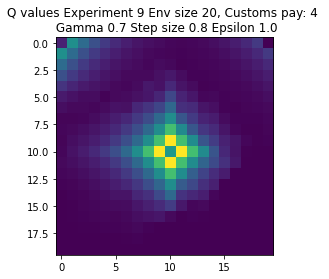

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.9 Step size 0.4 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-51.0 Reward:-1011 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:20 RunnAReward:-2054.0 Reward:-3222 Timesteps:5358 GotPack:True Utiltime:3794 Customstime:4373 Money:5
Expr:0 Eps:40 RunnAReward:-1632.0 Reward:-808 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-590.0 Reward:958 Timesteps:1764 GotPack:True Utiltime:485 Customstime:780 Money:5
Expr:0 Eps:80 RunnAReward:-175.0 Reward:-893 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-13.0 Reward:60 Timesteps:800 GotPack:False Utiltime:257 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:626.0 Reward:543 Timesteps:800 GotPack:False Utiltime

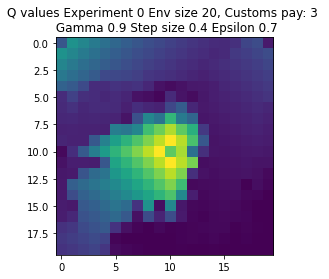

Expr:1 Eps:0 RunnAReward:-68.0 Reward:-1343 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-1965.0 Reward:-6829 Timesteps:8535 GotPack:True Utiltime:6567 Customstime:8408 Money:3
Expr:1 Eps:40 RunnAReward:-1667.0 Reward:2046 Timesteps:1448 GotPack:True Utiltime:697 Customstime:799 Money:3
Expr:1 Eps:60 RunnAReward:-535.0 Reward:57 Timesteps:800 GotPack:False Utiltime:285 Customstime:0 Money:1
Expr:1 Eps:80 RunnAReward:-33.0 Reward:1637 Timesteps:1843 GotPack:True Utiltime:1305 Customstime:1460 Money:5
Expr:1 Eps:100 RunnAReward:329.0 Reward:-2042 Timesteps:4278 GotPack:True Utiltime:917 Customstime:1022 Money:5
Expr:1 Eps:120 RunnAReward:-68.0 Reward:-1121 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:613.0 Reward:489 Timesteps:800 GotPack:False Utiltime:16 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:441.0 Reward:-41 Timesteps:1200 GotPack:False Utiltime:214 Customstime:0 Money:2
Expr:1 Eps:180 Run

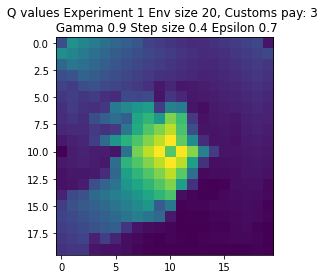

Expr:2 Eps:0 RunnAReward:-73.0 Reward:-1456 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:20 RunnAReward:-1709.0 Reward:-3602 Timesteps:5315 GotPack:True Utiltime:3183 Customstime:5118 Money:3
Expr:2 Eps:40 RunnAReward:-1209.0 Reward:-4447 Timesteps:5598 GotPack:True Utiltime:2156 Customstime:2207 Money:4
Expr:2 Eps:60 RunnAReward:-941.0 Reward:-851 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:80 RunnAReward:-986.0 Reward:-1664 Timesteps:4051 GotPack:True Utiltime:45 Customstime:998 Money:4
Expr:2 Eps:100 RunnAReward:61.0 Reward:-471 Timesteps:3406 GotPack:True Utiltime:2830 Customstime:3253 Money:5
Expr:2 Eps:120 RunnAReward:-269.0 Reward:220 Timesteps:800 GotPack:False Utiltime:179 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:291.0 Reward:2991 Timesteps:785 GotPack:True Utiltime:519 Customstime:689 Money:3
Expr:2 Eps:160 RunnAReward:776.0 Reward:767 Timesteps:2582 GotPack:True Utiltime:450 Customstime:1703 Money:3
Expr:2 Eps:1

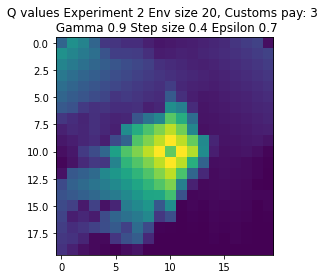

Expr:3 Eps:0 RunnAReward:-99.0 Reward:-1974 Timesteps:4732 GotPack:True Utiltime:754 Customstime:2875 Money:4
Expr:3 Eps:20 RunnAReward:-1963.0 Reward:-210 Timesteps:1200 GotPack:False Utiltime:735 Customstime:0 Money:2
Expr:3 Eps:40 RunnAReward:-1170.0 Reward:-1128 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-887.0 Reward:-1375 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:-605.0 Reward:67 Timesteps:1200 GotPack:False Utiltime:93 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:-903.0 Reward:-3623 Timesteps:5578 GotPack:True Utiltime:931 Customstime:1334 Money:3
Expr:3 Eps:120 RunnAReward:317.0 Reward:22 Timesteps:1200 GotPack:False Utiltime:50 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:370.0 Reward:1973 Timesteps:1282 GotPack:True Utiltime:132 Customstime:632 Money:3
Expr:3 Eps:160 RunnAReward:877.0 Reward:-577 Timesteps:3269 GotPack:True Utiltime:1029 Customstime:1327 Money:5
Expr:3 Eps:180 Ru

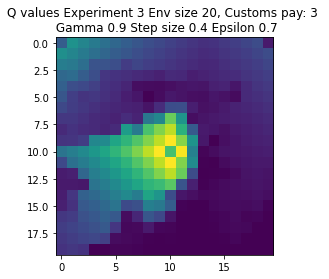

Expr:4 Eps:0 RunnAReward:-114.0 Reward:-2271 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-2242.0 Reward:-7154 Timesteps:8189 GotPack:True Utiltime:4877 Customstime:5089 Money:5
Expr:4 Eps:40 RunnAReward:-1139.0 Reward:396 Timesteps:800 GotPack:False Utiltime:717 Customstime:0 Money:1
Expr:4 Eps:60 RunnAReward:-808.0 Reward:108 Timesteps:800 GotPack:False Utiltime:105 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:59.0 Reward:113 Timesteps:800 GotPack:False Utiltime:268 Customstime:0 Money:1
Expr:4 Eps:100 RunnAReward:-119.0 Reward:422 Timesteps:800 GotPack:False Utiltime:47 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:330.0 Reward:330 Timesteps:800 GotPack:False Utiltime:683 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:792.0 Reward:2301 Timesteps:1090 GotPack:True Utiltime:533 Customstime:883 Money:3
Expr:4 Eps:160 RunnAReward:954.0 Reward:1476 Timesteps:1910 GotPack:True Utiltime:240 Customstime:1681 Money:3
Expr:4 Eps:180 RunnARewa

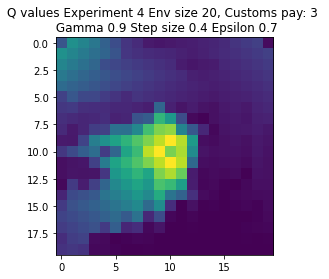

Expr:5 Eps:0 RunnAReward:-156.0 Reward:-3102 Timesteps:4984 GotPack:True Utiltime:4715 Customstime:4887 Money:3
Expr:5 Eps:20 RunnAReward:-1283.0 Reward:-1773 Timesteps:4070 GotPack:True Utiltime:1690 Customstime:1885 Money:3
Expr:5 Eps:40 RunnAReward:-1119.0 Reward:-3418 Timesteps:5310 GotPack:True Utiltime:1623 Customstime:1857 Money:5
Expr:5 Eps:60 RunnAReward:-594.0 Reward:-1114 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-1214.0 Reward:-378 Timesteps:1200 GotPack:False Utiltime:302 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:338.0 Reward:2927 Timesteps:643 GotPack:True Utiltime:45 Customstime:481 Money:3
Expr:5 Eps:120 RunnAReward:566.0 Reward:1558 Timesteps:1767 GotPack:True Utiltime:195 Customstime:714 Money:5
Expr:5 Eps:140 RunnAReward:527.0 Reward:1993 Timesteps:1723 GotPack:True Utiltime:192 Customstime:845 Money:4
Expr:5 Eps:160 RunnAReward:692.0 Reward:2276 Timesteps:1359 GotPack:True Utiltime:45 Customstime:1105 Money:4
Expr:

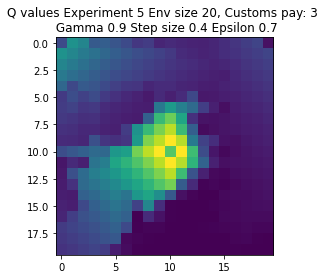

Expr:6 Eps:0 RunnAReward:18.0 Reward:379 Timesteps:800 GotPack:False Utiltime:218 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-2388.0 Reward:-2361 Timesteps:4550 GotPack:True Utiltime:3045 Customstime:3627 Money:5
Expr:6 Eps:40 RunnAReward:-1289.0 Reward:-1684 Timesteps:3947 GotPack:True Utiltime:1812 Customstime:2690 Money:4
Expr:6 Eps:60 RunnAReward:-850.0 Reward:519 Timesteps:800 GotPack:False Utiltime:648 Customstime:0 Money:1
Expr:6 Eps:80 RunnAReward:4.0 Reward:-652 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:100 RunnAReward:315.0 Reward:40 Timesteps:1200 GotPack:False Utiltime:1175 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:220.0 Reward:1956 Timesteps:1730 GotPack:True Utiltime:1446 Customstime:1668 Money:5
Expr:6 Eps:140 RunnAReward:839.0 Reward:409 Timesteps:800 GotPack:False Utiltime:93 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:766.0 Reward:587 Timesteps:800 GotPack:False Utiltime:21 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward

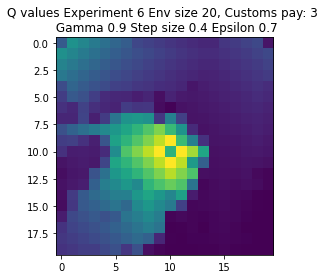

Expr:7 Eps:0 RunnAReward:-40.0 Reward:-799 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:20 RunnAReward:-1865.0 Reward:-1130 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:40 RunnAReward:-889.0 Reward:-702 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-697.0 Reward:-18 Timesteps:1200 GotPack:False Utiltime:620 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-450.0 Reward:-653 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-787.0 Reward:-4511 Timesteps:6649 GotPack:True Utiltime:1751 Customstime:2024 Money:5
Expr:7 Eps:120 RunnAReward:-136.0 Reward:-1017 Timesteps:4012 GotPack:True Utiltime:2485 Customstime:3047 Money:5
Expr:7 Eps:140 RunnAReward:228.0 Reward:-46 Timesteps:1200 GotPack:False Utiltime:373 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:794.0 Reward:-30 Timesteps:1200 GotPack:False Utiltime:68 Customstime:0 Money:2
Expr:7 Eps:180 RunnARewar

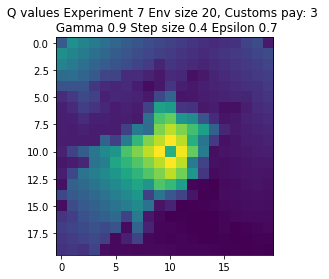

Expr:8 Eps:0 RunnAReward:-59.0 Reward:-1177 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:20 RunnAReward:-1417.0 Reward:-1271 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-1514.0 Reward:-642 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:60 RunnAReward:-617.0 Reward:197 Timesteps:800 GotPack:False Utiltime:401 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-94.0 Reward:-1309 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:107.0 Reward:510 Timesteps:800 GotPack:False Utiltime:164 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:311.0 Reward:96 Timesteps:800 GotPack:False Utiltime:21 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:295.0 Reward:2270 Timesteps:1214 GotPack:True Utiltime:174 Customstime:742 Money:3
Expr:8 Eps:160 RunnAReward:262.0 Reward:-154 Timesteps:1200 GotPack:False Utiltime:4 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:949.0 Rewa

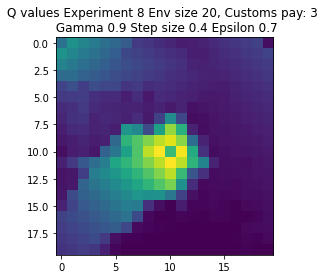

Expr:9 Eps:0 RunnAReward:-46.0 Reward:-915 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-1908.0 Reward:1153 Timesteps:2148 GotPack:True Utiltime:1170 Customstime:1717 Money:3
Expr:9 Eps:40 RunnAReward:-719.0 Reward:337 Timesteps:800 GotPack:False Utiltime:405 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-1081.0 Reward:-533 Timesteps:1200 GotPack:False Utiltime:876 Customstime:0 Money:2
Expr:9 Eps:80 RunnAReward:-131.0 Reward:-647 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-107.0 Reward:-201 Timesteps:1200 GotPack:False Utiltime:730 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:161.0 Reward:-506 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:49.0 Reward:567 Timesteps:800 GotPack:False Utiltime:155 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:588.0 Reward:-623 Timesteps:1600 GotPack:False Utiltime:22 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:771

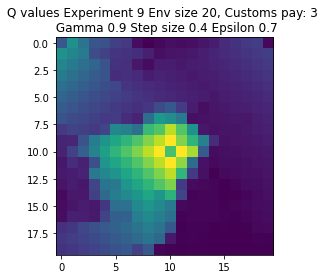

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.9 Step size 0.4 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-24.0 Reward:-480 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-1366.0 Reward:-2698 Timesteps:5149 GotPack:True Utiltime:3509 Customstime:4460 Money:5
Expr:0 Eps:40 RunnAReward:-1025.0 Reward:-8550 Timesteps:9941 GotPack:True Utiltime:7685 Customstime:8110 Money:5
Expr:0 Eps:60 RunnAReward:-1088.0 Reward:713 Timesteps:400 GotPack:False Utiltime:22 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-3.0 Reward:507 Timesteps:800 GotPack:False Utiltime:351 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:34.0 Reward:-673 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:78.0 Reward:956 Timesteps:400 GotPack:False Utiltim

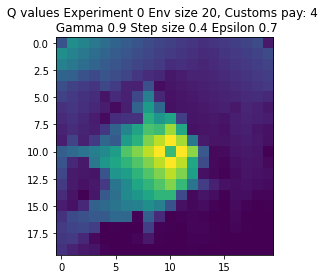

Expr:1 Eps:0 RunnAReward:-23.0 Reward:-454 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-459.0 Reward:600 Timesteps:400 GotPack:False Utiltime:96 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-1117.0 Reward:-484 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-243.0 Reward:-266 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-114.0 Reward:827 Timesteps:2422 GotPack:True Utiltime:2011 Customstime:2234 Money:5
Expr:1 Eps:100 RunnAReward:-161.0 Reward:-580 Timesteps:3532 GotPack:True Utiltime:81 Customstime:907 Money:5
Expr:1 Eps:120 RunnAReward:447.0 Reward:1044 Timesteps:400 GotPack:False Utiltime:191 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:298.0 Reward:2882 Timesteps:540 GotPack:True Utiltime:213 Customstime:336 Money:5
Expr:1 Eps:160 RunnAReward:484.0 Reward:446 Timesteps:800 GotPack:False Utiltime:557 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:630.0

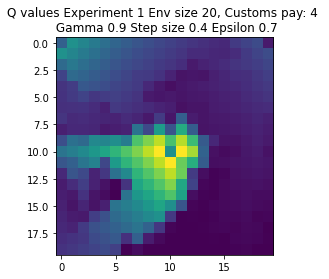

Expr:2 Eps:0 RunnAReward:-45.0 Reward:-887 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-1027.0 Reward:-248 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-618.0 Reward:-318 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-142.0 Reward:640 Timesteps:800 GotPack:False Utiltime:295 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:114.0 Reward:-21 Timesteps:800 GotPack:False Utiltime:35 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:377.0 Reward:587 Timesteps:400 GotPack:False Utiltime:11 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:42.0 Reward:960 Timesteps:400 GotPack:False Utiltime:28 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-15.0 Reward:-949 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:160 RunnAReward:168.0 Reward:-1234 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:380.0 Reward:601 Ti

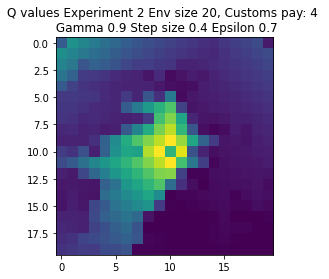

Expr:3 Eps:0 RunnAReward:2.0 Reward:41 Timesteps:2886 GotPack:True Utiltime:642 Customstime:2129 Money:4
Expr:3 Eps:20 RunnAReward:-818.0 Reward:-185 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-484.0 Reward:-1157 Timesteps:3781 GotPack:True Utiltime:1340 Customstime:1420 Money:5
Expr:3 Eps:60 RunnAReward:-1004.0 Reward:-171 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-548.0 Reward:-4444 Timesteps:6266 GotPack:True Utiltime:1903 Customstime:3136 Money:4
Expr:3 Eps:100 RunnAReward:-699.0 Reward:-613 Timesteps:3114 GotPack:True Utiltime:1707 Customstime:1855 Money:4
Expr:3 Eps:120 RunnAReward:91.0 Reward:-973 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:366.0 Reward:-773 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:160 RunnAReward:403.0 Reward:-83 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:

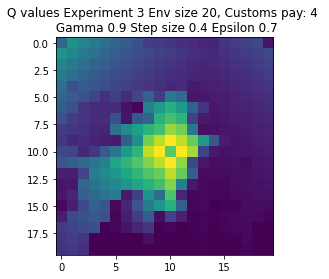

Expr:4 Eps:0 RunnAReward:-28.0 Reward:-551 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-806.0 Reward:-1142 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:40 RunnAReward:-1026.0 Reward:-146 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-631.0 Reward:1069 Timesteps:2072 GotPack:True Utiltime:17 Customstime:247 Money:5
Expr:4 Eps:80 RunnAReward:-14.0 Reward:-501 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-166.0 Reward:587 Timesteps:400 GotPack:False Utiltime:19 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-256.0 Reward:-175 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:292.0 Reward:145 Timesteps:800 GotPack:False Utiltime:26 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:628.0 Reward:1095 Timesteps:400 GotPack:False Utiltime:189 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:872.0 Reward:

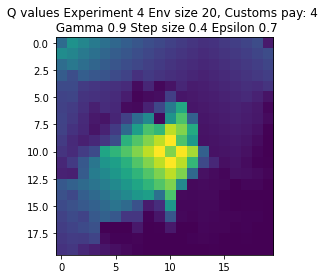

Expr:5 Eps:0 RunnAReward:-26.0 Reward:-519 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-856.0 Reward:-3934 Timesteps:5465 GotPack:True Utiltime:2183 Customstime:3935 Money:4
Expr:5 Eps:40 RunnAReward:-858.0 Reward:760 Timesteps:400 GotPack:False Utiltime:101 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-495.0 Reward:-42 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-163.0 Reward:430 Timesteps:400 GotPack:False Utiltime:44 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-424.0 Reward:217 Timesteps:800 GotPack:False Utiltime:151 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:51.0 Reward:827 Timesteps:400 GotPack:False Utiltime:31 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:54.0 Reward:903 Timesteps:2291 GotPack:True Utiltime:1876 Customstime:2181 Money:5
Expr:5 Eps:160 RunnAReward:453.0 Reward:1106 Timesteps:400 GotPack:False Utiltime:154 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:268.0 R

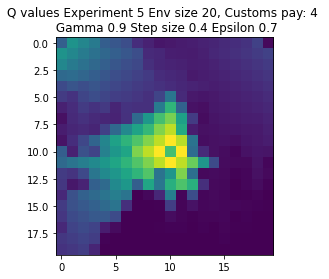

Expr:6 Eps:0 RunnAReward:30.0 Reward:610 Timesteps:800 GotPack:False Utiltime:540 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-1269.0 Reward:-1153 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-1132.0 Reward:-606 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-607.0 Reward:424 Timesteps:400 GotPack:False Utiltime:369 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-130.0 Reward:1076 Timesteps:400 GotPack:False Utiltime:226 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:180.0 Reward:-543 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-612.0 Reward:-1017 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:140 RunnAReward:-85.0 Reward:-257 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:316.0 Reward:-135 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:658.0 Reward:

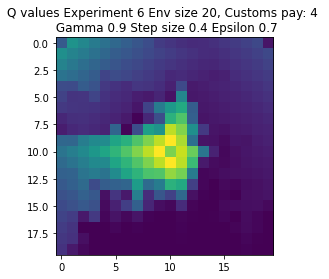

Expr:7 Eps:0 RunnAReward:-335.0 Reward:-6682 Timesteps:7237 GotPack:True Utiltime:1760 Customstime:3017 Money:4
Expr:7 Eps:20 RunnAReward:-1347.0 Reward:-1975 Timesteps:4236 GotPack:True Utiltime:467 Customstime:719 Money:5
Expr:7 Eps:40 RunnAReward:-373.0 Reward:549 Timesteps:400 GotPack:False Utiltime:101 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-783.0 Reward:595 Timesteps:400 GotPack:False Utiltime:6 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-144.0 Reward:-161 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:97.0 Reward:2224 Timesteps:1211 GotPack:True Utiltime:436 Customstime:886 Money:5
Expr:7 Eps:120 RunnAReward:-76.0 Reward:465 Timesteps:800 GotPack:False Utiltime:168 Customstime:0 Money:3
Expr:7 Eps:140 RunnAReward:272.0 Reward:-553 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:304.0 Reward:647 Timesteps:400 GotPack:False Utiltime:33 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:654

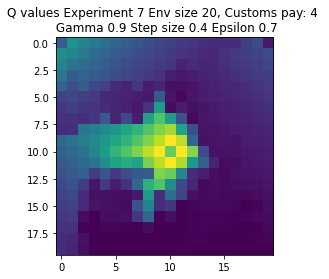

Expr:8 Eps:0 RunnAReward:-44.0 Reward:-877 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-1384.0 Reward:-1195 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-932.0 Reward:-780 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:60 RunnAReward:-311.0 Reward:-157 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-96.0 Reward:-164 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:25.0 Reward:-46 Timesteps:800 GotPack:False Utiltime:35 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:-88.0 Reward:527 Timesteps:400 GotPack:False Utiltime:24 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:180.0 Reward:609 Timesteps:400 GotPack:False Utiltime:26 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:553.0 Reward:-729 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:180 RunnAReward:626.0 Reward:421 Time

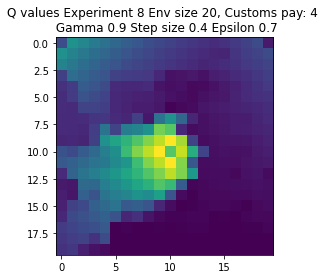

Expr:9 Eps:0 RunnAReward:-31.0 Reward:-609 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-530.0 Reward:-948 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-1143.0 Reward:749 Timesteps:400 GotPack:False Utiltime:66 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:83.0 Reward:1155 Timesteps:400 GotPack:False Utiltime:254 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-262.0 Reward:-58 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-214.0 Reward:1054 Timesteps:400 GotPack:False Utiltime:54 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:460.0 Reward:912 Timesteps:400 GotPack:False Utiltime:115 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:526.0 Reward:89 Timesteps:800 GotPack:False Utiltime:727 Customstime:0 Money:3
Expr:9 Eps:160 RunnAReward:292.0 Reward:2679 Timesteps:562 GotPack:True Utiltime:64 Customstime:487 Money:5
Expr:9 Eps:180 RunnAReward:870.0 Reward:-2 

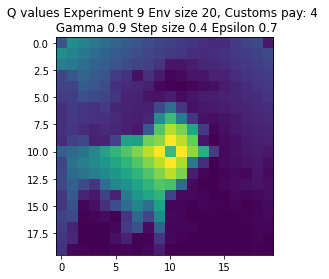

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.9 Step size 0.4 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-156.0 Reward:-3113 Timesteps:5263 GotPack:True Utiltime:2403 Customstime:3325 Money:3
Expr:0 Eps:20 RunnAReward:-2296.0 Reward:-8872 Timesteps:8559 GotPack:True Utiltime:562 Customstime:2385 Money:5
Expr:0 Eps:40 RunnAReward:-2182.0 Reward:-910 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-1242.0 Reward:175 Timesteps:800 GotPack:False Utiltime:195 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-918.0 Reward:-1522 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-944.0 Reward:690 Timesteps:2520 GotPack:True Utiltime:295 Customstime:2412 Money:4
Expr:0 Eps:120 RunnAReward:-127.0 Reward:-513 Timesteps:3229 GotPack

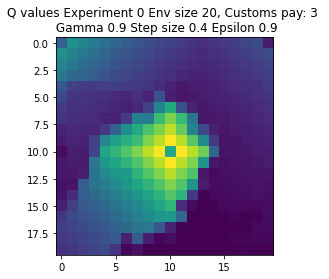

Expr:1 Eps:0 RunnAReward:-54.0 Reward:-1076 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:20 RunnAReward:-1069.0 Reward:-653 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:40 RunnAReward:-2016.0 Reward:-845 Timesteps:1600 GotPack:False Utiltime:158 Customstime:0 Money:2
Expr:1 Eps:60 RunnAReward:-2571.0 Reward:72 Timesteps:800 GotPack:False Utiltime:261 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-701.0 Reward:159 Timesteps:2813 GotPack:True Utiltime:1872 Customstime:2097 Money:3
Expr:1 Eps:100 RunnAReward:-724.0 Reward:618 Timesteps:800 GotPack:False Utiltime:437 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:-40.0 Reward:-311 Timesteps:1200 GotPack:False Utiltime:28 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:-277.0 Reward:497 Timesteps:800 GotPack:False Utiltime:369 Customstime:0 Money:1
Expr:1 Eps:160 RunnAReward:78.0 Reward:409 Timesteps:800 GotPack:False Utiltime:301 Customstime:0 Money:1
Expr:1 Eps:180 RunnAReward:438

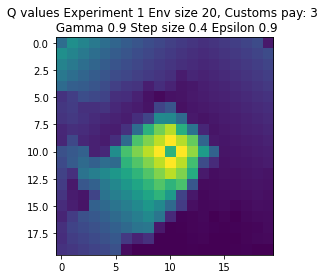

Expr:2 Eps:0 RunnAReward:-26.0 Reward:-507 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-1688.0 Reward:-193 Timesteps:1200 GotPack:False Utiltime:302 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-1673.0 Reward:-1148 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:60 RunnAReward:-1377.0 Reward:-191 Timesteps:1200 GotPack:False Utiltime:153 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:-454.0 Reward:71 Timesteps:800 GotPack:False Utiltime:290 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:-158.0 Reward:413 Timesteps:800 GotPack:False Utiltime:12 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-124.0 Reward:-2499 Timesteps:4711 GotPack:True Utiltime:4032 Customstime:4659 Money:4
Expr:2 Eps:140 RunnAReward:119.0 Reward:405 Timesteps:800 GotPack:False Utiltime:611 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:-455.0 Reward:447 Timesteps:800 GotPack:False Utiltime:43 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:

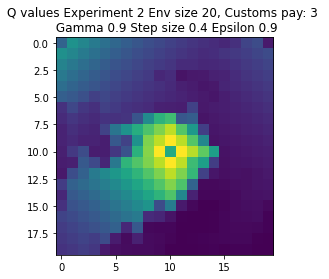

Expr:3 Eps:0 RunnAReward:-26.0 Reward:-507 Timesteps:1200 GotPack:False Utiltime:305 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-1779.0 Reward:-1733 Timesteps:4197 GotPack:True Utiltime:3497 Customstime:3893 Money:3
Expr:3 Eps:40 RunnAReward:-1647.0 Reward:-1151 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-1519.0 Reward:-50 Timesteps:1200 GotPack:False Utiltime:67 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:-672.0 Reward:-858 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-379.0 Reward:1074 Timesteps:2215 GotPack:True Utiltime:1034 Customstime:1336 Money:3
Expr:3 Eps:120 RunnAReward:-24.0 Reward:455 Timesteps:2710 GotPack:True Utiltime:107 Customstime:654 Money:5
Expr:3 Eps:140 RunnAReward:311.0 Reward:-1268 Timesteps:4023 GotPack:True Utiltime:511 Customstime:2688 Money:5
Expr:3 Eps:160 RunnAReward:386.0 Reward:470 Timesteps:800 GotPack:False Utiltime:47 Customstime:0 Money:2
Expr:3 Eps:180 Ru

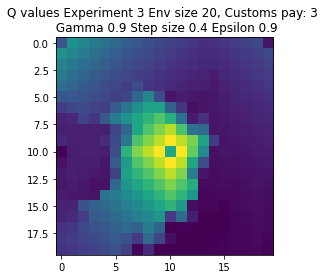

Expr:4 Eps:0 RunnAReward:-51.0 Reward:-1019 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-2488.0 Reward:-661 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-934.0 Reward:-1662 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:60 RunnAReward:-1383.0 Reward:-858 Timesteps:4014 GotPack:True Utiltime:1184 Customstime:3525 Money:3
Expr:4 Eps:80 RunnAReward:-740.0 Reward:-2947 Timesteps:5036 GotPack:True Utiltime:2553 Customstime:3217 Money:4
Expr:4 Eps:100 RunnAReward:-786.0 Reward:1861 Timesteps:1583 GotPack:True Utiltime:116 Customstime:1426 Money:3
Expr:4 Eps:120 RunnAReward:-66.0 Reward:-107 Timesteps:1200 GotPack:False Utiltime:133 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:-218.0 Reward:2835 Timesteps:590 GotPack:True Utiltime:164 Customstime:374 Money:3
Expr:4 Eps:160 RunnAReward:154.0 Reward:170 Timesteps:800 GotPack:False Utiltime:139 Customstime:0 Money:0
Expr:4 Eps:180 R

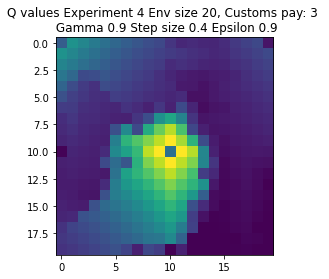

Expr:5 Eps:0 RunnAReward:-25.0 Reward:-489 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-2109.0 Reward:-555 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-1427.0 Reward:-2451 Timesteps:4030 GotPack:True Utiltime:229 Customstime:1406 Money:3
Expr:5 Eps:60 RunnAReward:-1072.0 Reward:287 Timesteps:800 GotPack:False Utiltime:235 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-1184.0 Reward:-722 Timesteps:3416 GotPack:True Utiltime:873 Customstime:1144 Money:3
Expr:5 Eps:100 RunnAReward:-921.0 Reward:-566 Timesteps:1600 GotPack:False Utiltime:491 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-122.0 Reward:287 Timesteps:800 GotPack:False Utiltime:52 Customstime:0 Money:1
Expr:5 Eps:140 RunnAReward:114.0 Reward:-232 Timesteps:1200 GotPack:False Utiltime:398 Customstime:0 Money:1
Expr:5 Eps:160 RunnAReward:-44.0 Reward:2992 Timesteps:699 GotPack:True Utiltime:49 Customstime:540 Money:5
Expr:5 Eps:180 RunnARe

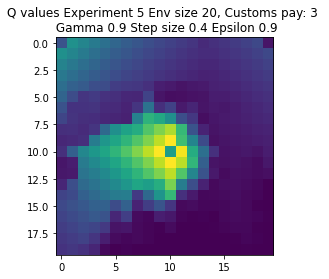

Expr:6 Eps:0 RunnAReward:-56.0 Reward:-1101 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-1649.0 Reward:-105 Timesteps:1200 GotPack:False Utiltime:752 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-1652.0 Reward:-1373 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-1049.0 Reward:-476 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-158.0 Reward:476 Timesteps:800 GotPack:False Utiltime:129 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-616.0 Reward:1157 Timesteps:1893 GotPack:True Utiltime:1578 Customstime:1851 Money:5
Expr:6 Eps:120 RunnAReward:-465.0 Reward:510 Timesteps:800 GotPack:False Utiltime:538 Customstime:0 Money:1
Expr:6 Eps:140 RunnAReward:-87.0 Reward:-3967 Timesteps:5868 GotPack:True Utiltime:66 Customstime:1403 Money:3
Expr:6 Eps:160 RunnAReward:191.0 Reward:544 Timesteps:800 GotPack:False Utiltime:158 Customstime:0 Money:0
Expr:6 Eps:180 RunnARew

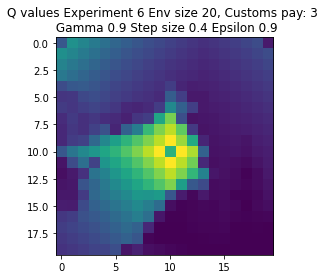

Expr:7 Eps:0 RunnAReward:-52.0 Reward:-1033 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-2332.0 Reward:-410 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:40 RunnAReward:-1171.0 Reward:2154 Timesteps:1304 GotPack:True Utiltime:926 Customstime:1017 Money:3
Expr:7 Eps:60 RunnAReward:-277.0 Reward:-157 Timesteps:1200 GotPack:False Utiltime:1003 Customstime:0 Money:1
Expr:7 Eps:80 RunnAReward:-868.0 Reward:-840 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-879.0 Reward:-1656 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:-621.0 Reward:-741 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:-168.0 Reward:-1846 Timesteps:3942 GotPack:True Utiltime:162 Customstime:1196 Money:4
Expr:7 Eps:160 RunnAReward:401.0 Reward:2778 Timesteps:651 GotPack:True Utiltime:33 Customstime:409 Money:5
Expr:7 Eps:180 RunnARe

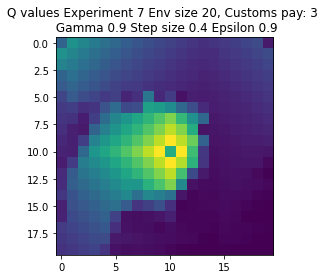

Expr:8 Eps:0 RunnAReward:-59.0 Reward:-1163 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-1090.0 Reward:-2338 Timesteps:3960 GotPack:True Utiltime:1225 Customstime:3083 Money:4
Expr:8 Eps:40 RunnAReward:-1777.0 Reward:-648 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:60 RunnAReward:-1158.0 Reward:-6948 Timesteps:7930 GotPack:True Utiltime:616 Customstime:1088 Money:4
Expr:8 Eps:80 RunnAReward:-899.0 Reward:-717 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-472.0 Reward:-533 Timesteps:1200 GotPack:False Utiltime:267 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:22.0 Reward:-241 Timesteps:1200 GotPack:False Utiltime:211 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:-239.0 Reward:-2029 Timesteps:1600 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:16.0 Reward:112 Timesteps:800 GotPack:False Utiltime:353 Customstime:0 Money:0
Expr:8 Eps:180 RunnARe

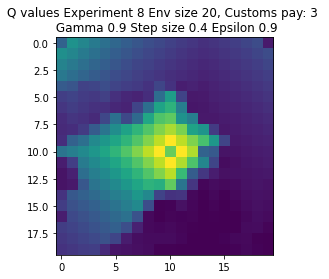

Expr:9 Eps:0 RunnAReward:-53.0 Reward:-1046 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-3052.0 Reward:-1066 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-1878.0 Reward:-1297 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-980.0 Reward:-9022 Timesteps:9987 GotPack:True Utiltime:513 Customstime:1987 Money:3
Expr:9 Eps:80 RunnAReward:-913.0 Reward:8 Timesteps:2171 GotPack:True Utiltime:36 Customstime:1322 Money:3
Expr:9 Eps:100 RunnAReward:-248.0 Reward:238 Timesteps:800 GotPack:False Utiltime:51 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-160.0 Reward:111 Timesteps:1200 GotPack:False Utiltime:70 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:-275.0 Reward:1137 Timesteps:1969 GotPack:True Utiltime:1402 Customstime:1472 Money:3
Expr:9 Eps:160 RunnAReward:706.0 Reward:469 Timesteps:800 GotPack:False Utiltime:154 Customstime:0 Money:1
Expr:9 Eps:180 RunnARewa

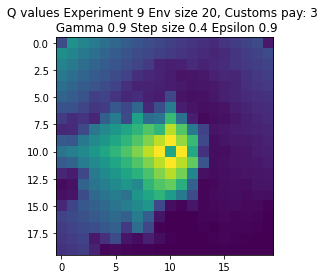

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.9 Step size 0.4 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-27.0 Reward:-526 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-979.0 Reward:-701 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-1715.0 Reward:-931 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-525.0 Reward:-1747 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:80 RunnAReward:-954.0 Reward:565 Timesteps:800 GotPack:False Utiltime:158 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-53.0 Reward:-606 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:-166.0 Reward:-301 Timesteps:400 GotPack:False Utiltime:0 Cust

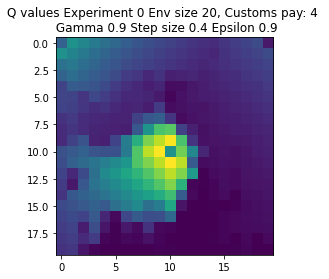

Expr:1 Eps:0 RunnAReward:-38.0 Reward:-746 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-1802.0 Reward:-477 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-1194.0 Reward:-2248 Timesteps:4303 GotPack:True Utiltime:183 Customstime:3078 Money:4
Expr:1 Eps:60 RunnAReward:-605.0 Reward:-679 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-493.0 Reward:-198 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-314.0 Reward:368 Timesteps:800 GotPack:False Utiltime:616 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:-511.0 Reward:350 Timesteps:800 GotPack:False Utiltime:141 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:223.0 Reward:-575 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:160 RunnAReward:532.0 Reward:939 Timesteps:400 GotPack:False Utiltime:279 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:-133.0 R

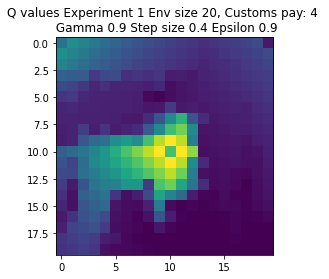

Expr:2 Eps:0 RunnAReward:-59.0 Reward:-1161 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-1177.0 Reward:-752 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-599.0 Reward:-84 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-276.0 Reward:609 Timesteps:400 GotPack:False Utiltime:119 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-1048.0 Reward:655 Timesteps:400 GotPack:False Utiltime:201 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-51.0 Reward:-775 Timesteps:3443 GotPack:True Utiltime:1273 Customstime:1532 Money:4
Expr:2 Eps:120 RunnAReward:-2.0 Reward:-21 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-340.0 Reward:720 Timesteps:400 GotPack:False Utiltime:78 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:312.0 Reward:1093 Timesteps:400 GotPack:False Utiltime:101 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:541.0 Rewa

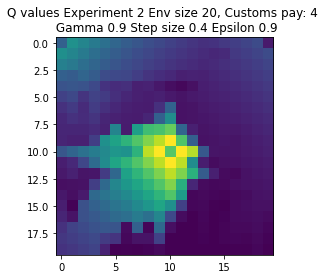

Expr:3 Eps:0 RunnAReward:-22.0 Reward:-435 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-1468.0 Reward:-486 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-1105.0 Reward:667 Timesteps:400 GotPack:False Utiltime:217 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-654.0 Reward:-1129 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:80 RunnAReward:-289.0 Reward:-119 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-112.0 Reward:735 Timesteps:400 GotPack:False Utiltime:136 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-39.0 Reward:-678 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-348.0 Reward:398 Timesteps:800 GotPack:False Utiltime:331 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:345.0 Reward:-160 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:549.0 Reward:

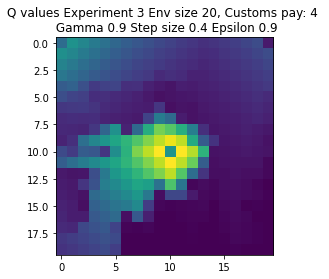

Expr:4 Eps:0 RunnAReward:-34.0 Reward:-677 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1418.0 Reward:-673 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-660.0 Reward:-391 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-310.0 Reward:542 Timesteps:400 GotPack:False Utiltime:230 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-10.0 Reward:-1153 Timesteps:1200 GotPack:False Utiltime:100 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-931.0 Reward:-1938 Timesteps:4141 GotPack:True Utiltime:981 Customstime:2620 Money:5
Expr:4 Eps:120 RunnAReward:203.0 Reward:1013 Timesteps:400 GotPack:False Utiltime:259 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:-375.0 Reward:640 Timesteps:400 GotPack:False Utiltime:174 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:8.0 Reward:286 Timesteps:800 GotPack:False Utiltime:198 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:479.0 

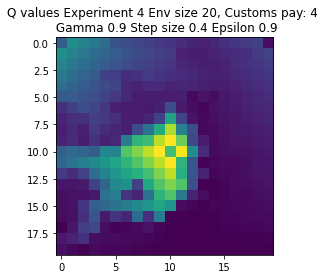

Expr:5 Eps:0 RunnAReward:-39.0 Reward:-771 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-1438.0 Reward:-5812 Timesteps:7489 GotPack:True Utiltime:3589 Customstime:3739 Money:4
Expr:5 Eps:40 RunnAReward:-1863.0 Reward:-1313 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-470.0 Reward:811 Timesteps:2249 GotPack:True Utiltime:1286 Customstime:1734 Money:5
Expr:5 Eps:80 RunnAReward:-327.0 Reward:-460 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-349.0 Reward:660 Timesteps:400 GotPack:False Utiltime:205 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:54.0 Reward:367 Timesteps:800 GotPack:False Utiltime:120 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:150.0 Reward:154 Timesteps:800 GotPack:False Utiltime:47 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:-15.0 Reward:130 Timesteps:800 GotPack:False Utiltime:319 Customstime:0 Money:2
Expr:5 Eps:180 RunnAReward:325

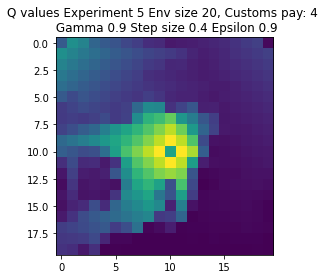

Expr:6 Eps:0 RunnAReward:-43.0 Reward:-855 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-997.0 Reward:-1363 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:40 RunnAReward:-1502.0 Reward:-775 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:60 RunnAReward:-620.0 Reward:-520 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-63.0 Reward:-445 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-890.0 Reward:1824 Timesteps:1579 GotPack:True Utiltime:33 Customstime:588 Money:5
Expr:6 Eps:120 RunnAReward:176.0 Reward:-721 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:-99.0 Reward:318 Timesteps:800 GotPack:False Utiltime:26 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:-326.0 Reward:-234 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:-22.0 Reward:-8

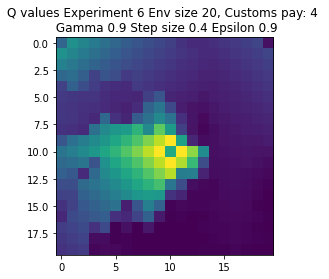

Expr:7 Eps:0 RunnAReward:-30.0 Reward:-600 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-2208.0 Reward:-624 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-627.0 Reward:-823 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-868.0 Reward:-43 Timesteps:1200 GotPack:False Utiltime:388 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-206.0 Reward:81 Timesteps:800 GotPack:False Utiltime:318 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:-167.0 Reward:1032 Timesteps:400 GotPack:False Utiltime:207 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-178.0 Reward:-840 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-105.0 Reward:340 Timesteps:800 GotPack:False Utiltime:465 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:-267.0 Reward:942 Timesteps:2179 GotPack:True Utiltime:1617 Customstime:1914 Money:5
Expr:7 Eps:180 RunnAReward:648.0 

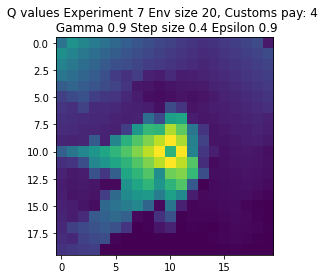

Expr:8 Eps:0 RunnAReward:-2.0 Reward:-38 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-701.0 Reward:-30 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-1343.0 Reward:-533 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-692.0 Reward:-1278 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:-1020.0 Reward:-202 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-160.0 Reward:-672 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-976.0 Reward:-48 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:-1.0 Reward:470 Timesteps:400 GotPack:False Utiltime:30 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:30.0 Reward:830 Timesteps:400 GotPack:False Utiltime:191 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:451.0 Reward:-184 Tim

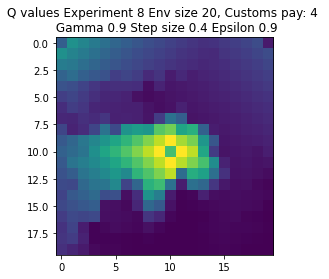

Expr:9 Eps:0 RunnAReward:-59.0 Reward:-1177 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-1621.0 Reward:-573 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-730.0 Reward:-1134 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:9 Eps:60 RunnAReward:-1147.0 Reward:-677 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-87.0 Reward:448 Timesteps:400 GotPack:False Utiltime:44 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-516.0 Reward:-73 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-288.0 Reward:46 Timesteps:800 GotPack:False Utiltime:195 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:27.0 Reward:1672 Timesteps:1676 GotPack:True Utiltime:8 Customstime:582 Money:4
Expr:9 Eps:160 RunnAReward:457.0 Reward:500 Timesteps:400 GotPack:False Utiltime:55 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:869.0 Reward:111

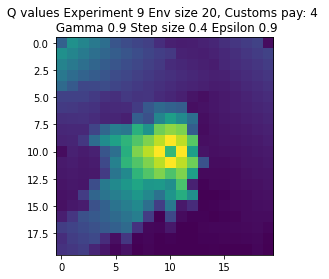

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.9 Step size 0.4 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:56.0 Reward:1139 Timesteps:1950 GotPack:True Utiltime:488 Customstime:919 Money:4
Expr:0 Eps:20 RunnAReward:-1975.0 Reward:-1184 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-3062.0 Reward:-1006 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:60 RunnAReward:-1410.0 Reward:-660 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:80 RunnAReward:-1282.0 Reward:-676 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-932.0 Reward:655 Timesteps:800 GotPack:False Utiltime:100 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:-1275.0 Reward:1025 Timesteps:2041 GotPack:True Utiltim

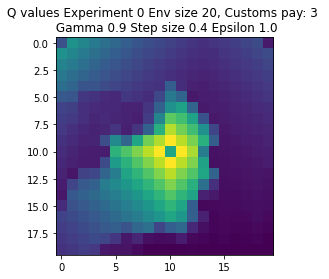

Expr:1 Eps:0 RunnAReward:-142.0 Reward:-2827 Timesteps:5504 GotPack:True Utiltime:4559 Customstime:4876 Money:3
Expr:1 Eps:20 RunnAReward:-2726.0 Reward:-1367 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-1993.0 Reward:-1299 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-2698.0 Reward:-877 Timesteps:3431 GotPack:True Utiltime:1123 Customstime:1424 Money:5
Expr:1 Eps:80 RunnAReward:-1528.0 Reward:-400 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-887.0 Reward:73 Timesteps:800 GotPack:False Utiltime:695 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:-516.0 Reward:375 Timesteps:800 GotPack:False Utiltime:285 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:-157.0 Reward:-36 Timesteps:800 GotPack:False Utiltime:168 Customstime:0 Money:1
Expr:1 Eps:160 RunnAReward:-310.0 Reward:-405 Timesteps:1200 GotPack:False Utiltime:45 Customstime:0 Money:2
Expr:1 Eps:180 Runn

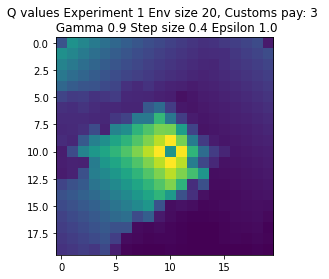

Expr:2 Eps:0 RunnAReward:-748.0 Reward:-14954 Timesteps:12000 GotPack:False Utiltime:8937 Customstime:0 Money:4
Expr:2 Eps:20 RunnAReward:-3696.0 Reward:-4842 Timesteps:6248 GotPack:True Utiltime:5559 Customstime:5721 Money:4
Expr:2 Eps:40 RunnAReward:-3335.0 Reward:-848 Timesteps:3354 GotPack:True Utiltime:2212 Customstime:3037 Money:5
Expr:2 Eps:60 RunnAReward:-1995.0 Reward:-948 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:80 RunnAReward:-389.0 Reward:-859 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-1621.0 Reward:567 Timesteps:800 GotPack:False Utiltime:321 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-739.0 Reward:-3580 Timesteps:5161 GotPack:True Utiltime:448 Customstime:572 Money:5
Expr:2 Eps:140 RunnAReward:-204.0 Reward:438 Timesteps:800 GotPack:False Utiltime:244 Customstime:0 Money:1
Expr:2 Eps:160 RunnAReward:-217.0 Reward:252 Timesteps:800 GotPack:False Utiltime:180 Customstime:0 Money:0
Expr:2 Eps:

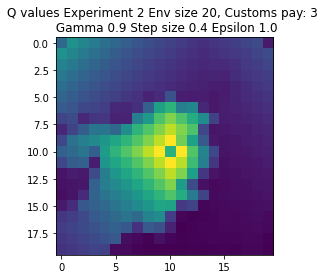

Expr:3 Eps:0 RunnAReward:-741.0 Reward:-14816 Timesteps:12000 GotPack:False Utiltime:7929 Customstime:8415 Money:3
Expr:3 Eps:20 RunnAReward:-5119.0 Reward:-1051 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-1434.0 Reward:-679 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:3 Eps:60 RunnAReward:-580.0 Reward:536 Timesteps:800 GotPack:False Utiltime:502 Customstime:0 Money:1
Expr:3 Eps:80 RunnAReward:-1093.0 Reward:-1396 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:-1400.0 Reward:47 Timesteps:800 GotPack:False Utiltime:135 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-200.0 Reward:431 Timesteps:800 GotPack:False Utiltime:169 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-8.0 Reward:-2402 Timesteps:4909 GotPack:True Utiltime:76 Customstime:1921 Money:3
Expr:3 Eps:160 RunnAReward:-146.0 Reward:417 Timesteps:800 GotPack:False Utiltime:472 Customstime:0 Money:0
Expr:3 Eps:180 RunnA

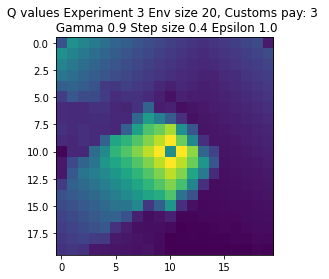

Expr:4 Eps:0 RunnAReward:-203.0 Reward:-4053 Timesteps:5420 GotPack:True Utiltime:2805 Customstime:3933 Money:3
Expr:4 Eps:20 RunnAReward:-1205.0 Reward:16 Timesteps:800 GotPack:False Utiltime:481 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-1788.0 Reward:-858 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-734.0 Reward:-1058 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-1570.0 Reward:-461 Timesteps:1200 GotPack:False Utiltime:49 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-1777.0 Reward:602 Timesteps:800 GotPack:False Utiltime:328 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:129.0 Reward:-1 Timesteps:800 GotPack:False Utiltime:208 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:-15.0 Reward:2055 Timesteps:994 GotPack:True Utiltime:35 Customstime:739 Money:5
Expr:4 Eps:160 RunnAReward:-164.0 Reward:472 Timesteps:800 GotPack:False Utiltime:360 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:

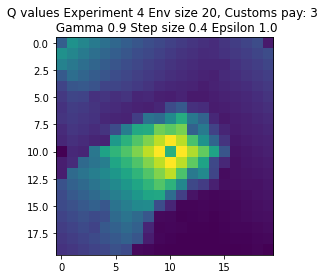

Expr:5 Eps:0 RunnAReward:-729.0 Reward:-14565 Timesteps:12000 GotPack:False Utiltime:7661 Customstime:8308 Money:4
Expr:5 Eps:20 RunnAReward:-2612.0 Reward:-962 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-1922.0 Reward:-1290 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-1076.0 Reward:10 Timesteps:800 GotPack:False Utiltime:733 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-1608.0 Reward:206 Timesteps:800 GotPack:False Utiltime:46 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-1161.0 Reward:-420 Timesteps:3086 GotPack:True Utiltime:2289 Customstime:2671 Money:3
Expr:5 Eps:120 RunnAReward:-932.0 Reward:154 Timesteps:800 GotPack:False Utiltime:251 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:-317.0 Reward:-851 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:-272.0 Reward:-937 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:180 RunnA

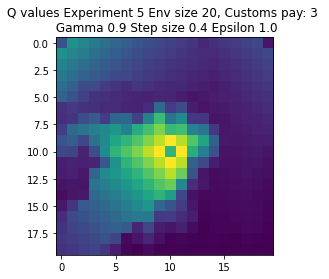

Expr:6 Eps:0 RunnAReward:-50.0 Reward:-982 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-2931.0 Reward:-1045 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:40 RunnAReward:-1639.0 Reward:-992 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-2057.0 Reward:-586 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-894.0 Reward:-960 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-1133.0 Reward:261 Timesteps:800 GotPack:False Utiltime:625 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-1094.0 Reward:813 Timesteps:1886 GotPack:True Utiltime:392 Customstime:1079 Money:3
Expr:6 Eps:140 RunnAReward:-443.0 Reward:408 Timesteps:800 GotPack:False Utiltime:328 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:491.0 Reward:-509 Timesteps:1200 GotPack:False Utiltime:284 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:283

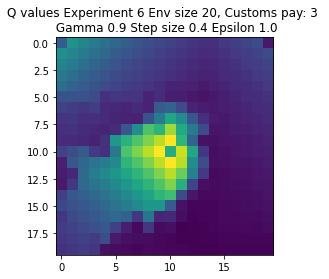

Expr:7 Eps:0 RunnAReward:-388.0 Reward:-7751 Timesteps:8094 GotPack:True Utiltime:43 Customstime:2588 Money:4
Expr:7 Eps:20 RunnAReward:-3291.0 Reward:536 Timesteps:800 GotPack:False Utiltime:525 Customstime:0 Money:1
Expr:7 Eps:40 RunnAReward:-3627.0 Reward:-5227 Timesteps:6697 GotPack:True Utiltime:1405 Customstime:2413 Money:3
Expr:7 Eps:60 RunnAReward:-2304.0 Reward:897 Timesteps:2390 GotPack:True Utiltime:619 Customstime:2176 Money:3
Expr:7 Eps:80 RunnAReward:-722.0 Reward:562 Timesteps:800 GotPack:False Utiltime:455 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-291.0 Reward:-308 Timesteps:2697 GotPack:True Utiltime:614 Customstime:1240 Money:3
Expr:7 Eps:120 RunnAReward:-378.0 Reward:47 Timesteps:2429 GotPack:True Utiltime:1024 Customstime:1231 Money:3
Expr:7 Eps:140 RunnAReward:-1007.0 Reward:-4 Timesteps:1200 GotPack:False Utiltime:74 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:-251.0 Reward:1144 Timesteps:1886 GotPack:True Utiltime:718 Customstime:952 Money:3
Expr:7 E

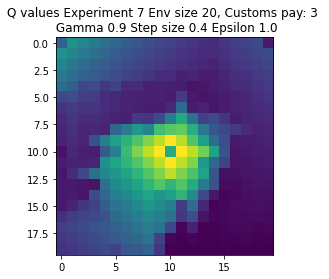

Expr:8 Eps:0 RunnAReward:-31.0 Reward:-610 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-1574.0 Reward:-1204 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-3546.0 Reward:-11488 Timesteps:10269 GotPack:True Utiltime:5638 Customstime:8730 Money:3
Expr:8 Eps:60 RunnAReward:-1067.0 Reward:-1434 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:-922.0 Reward:-623 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:-835.0 Reward:-512 Timesteps:1200 GotPack:False Utiltime:861 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:-1038.0 Reward:96 Timesteps:800 GotPack:False Utiltime:549 Customstime:0 Money:1
Expr:8 Eps:140 RunnAReward:-866.0 Reward:261 Timesteps:800 GotPack:False Utiltime:12 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:-241.0 Reward:-1272 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:180 RunnARew

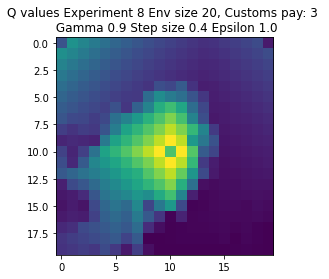

Expr:9 Eps:0 RunnAReward:0.0 Reward:5 Timesteps:1200 GotPack:False Utiltime:193 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-2570.0 Reward:-1261 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:40 RunnAReward:-3288.0 Reward:-1168 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-1128.0 Reward:443 Timesteps:800 GotPack:False Utiltime:547 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-1810.0 Reward:-501 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:-585.0 Reward:379 Timesteps:800 GotPack:False Utiltime:370 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-1155.0 Reward:-673 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:140 RunnAReward:-1059.0 Reward:938 Timesteps:2320 GotPack:True Utiltime:225 Customstime:1432 Money:3
Expr:9 Eps:160 RunnAReward:-265.0 Reward:-735 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:463.0

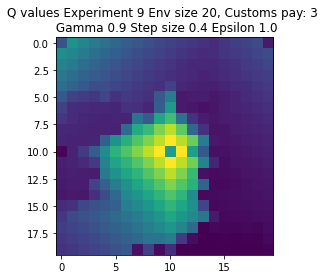

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.9 Step size 0.4 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-62.0 Reward:-1221 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-1837.0 Reward:-463 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-1960.0 Reward:692 Timesteps:400 GotPack:False Utiltime:400 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-819.0 Reward:-633 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-1043.0 Reward:-832 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-644.0 Reward:-892 Timesteps:2675 GotPack:True Utiltime:1016 Customstime:1242 Money:5
Expr:0 Eps:120 RunnAReward:-164.0 Reward:-3732 Timesteps:5360 GotPack:True Utilti

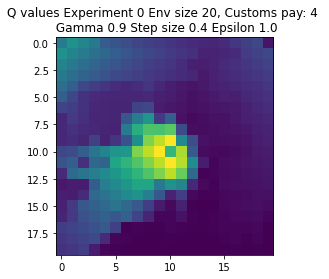

Expr:1 Eps:0 RunnAReward:-63.0 Reward:-1251 Timesteps:1200 GotPack:False Utiltime:268 Customstime:0 Money:2
Expr:1 Eps:20 RunnAReward:-2048.0 Reward:-12830 Timesteps:11561 GotPack:True Utiltime:5076 Customstime:5304 Money:5
Expr:1 Eps:40 RunnAReward:-1233.0 Reward:-99 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-1300.0 Reward:-945 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:80 RunnAReward:-759.0 Reward:-137 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-548.0 Reward:-2072 Timesteps:3867 GotPack:True Utiltime:2376 Customstime:3061 Money:4
Expr:1 Eps:120 RunnAReward:-707.0 Reward:-764 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:140 RunnAReward:253.0 Reward:665 Timesteps:400 GotPack:False Utiltime:40 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:-494.0 Reward:-248 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnARew

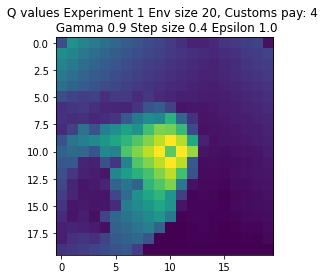

Expr:2 Eps:0 RunnAReward:31.0 Reward:623 Timesteps:400 GotPack:False Utiltime:151 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-2236.0 Reward:-167 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-1126.0 Reward:711 Timesteps:400 GotPack:False Utiltime:166 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-720.0 Reward:-484 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-786.0 Reward:-596 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-285.0 Reward:1095 Timesteps:2085 GotPack:True Utiltime:948 Customstime:1789 Money:5
Expr:2 Eps:120 RunnAReward:-117.0 Reward:-449 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-325.0 Reward:577 Timesteps:400 GotPack:False Utiltime:2 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:-176.0 Reward:-70 Timesteps:800 GotPack:False Utiltime:227 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:196.0 Rew

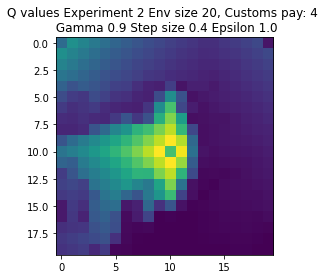

Expr:3 Eps:0 RunnAReward:27.0 Reward:546 Timesteps:400 GotPack:False Utiltime:146 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-586.0 Reward:-547 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-1621.0 Reward:-1850 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:60 RunnAReward:-1373.0 Reward:-708 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-481.0 Reward:-449 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-578.0 Reward:473 Timesteps:400 GotPack:False Utiltime:367 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-420.0 Reward:-807 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-190.0 Reward:-217 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:29.0 Reward:248 Timesteps:800 GotPack:False Utiltime:313 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:20.0 Reward:-

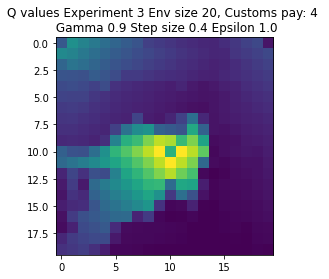

Expr:4 Eps:0 RunnAReward:-7.0 Reward:-140 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-921.0 Reward:-645 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-1028.0 Reward:-11734 Timesteps:10936 GotPack:True Utiltime:9039 Customstime:9981 Money:5
Expr:4 Eps:60 RunnAReward:-1132.0 Reward:-585 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-391.0 Reward:1054 Timesteps:2009 GotPack:True Utiltime:700 Customstime:1957 Money:4
Expr:4 Eps:100 RunnAReward:-1517.0 Reward:-540 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-553.0 Reward:1836 Timesteps:1345 GotPack:True Utiltime:443 Customstime:1031 Money:5
Expr:4 Eps:140 RunnAReward:35.0 Reward:320 Timesteps:800 GotPack:False Utiltime:164 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:120.0 Reward:617 Timesteps:400 GotPack:False Utiltime:123 Customstime:0 Money:0
Expr:4 Eps:180 RunnARewa

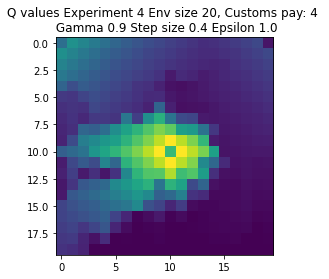

Expr:5 Eps:0 RunnAReward:34.0 Reward:694 Timesteps:400 GotPack:False Utiltime:179 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-420.0 Reward:-402 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-522.0 Reward:180 Timesteps:800 GotPack:False Utiltime:32 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-802.0 Reward:-48 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-978.0 Reward:-472 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-529.0 Reward:-812 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-823.0 Reward:-419 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:101.0 Reward:629 Timesteps:400 GotPack:False Utiltime:218 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:-377.0 Reward:-118 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:-37.0 Reward:-1119

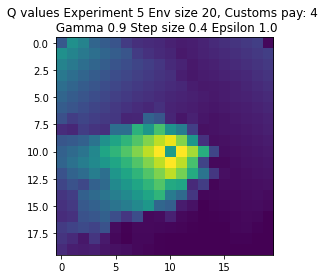

Expr:6 Eps:0 RunnAReward:-31.0 Reward:-603 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-1371.0 Reward:-601 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-1284.0 Reward:-781 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-1432.0 Reward:-651 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-551.0 Reward:-1004 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:-775.0 Reward:-54 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-673.0 Reward:-505 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:-189.0 Reward:742 Timesteps:400 GotPack:False Utiltime:228 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:67.0 Reward:-168 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:-31.0 Reward:-2

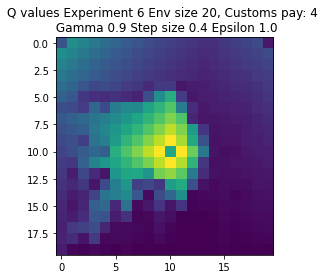

Expr:7 Eps:0 RunnAReward:-64.0 Reward:-1269 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-2104.0 Reward:-647 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-710.0 Reward:-470 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-691.0 Reward:76 Timesteps:800 GotPack:False Utiltime:626 Customstime:0 Money:3
Expr:7 Eps:80 RunnAReward:-634.0 Reward:-1156 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:-573.0 Reward:-493 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-608.0 Reward:671 Timesteps:2233 GotPack:True Utiltime:1475 Customstime:1965 Money:5
Expr:7 Eps:140 RunnAReward:-326.0 Reward:-561 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:-154.0 Reward:-315 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:-72.0 Re

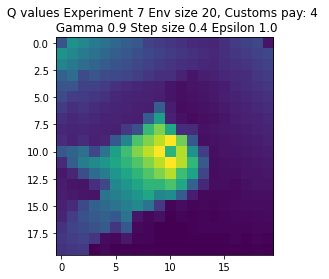

Expr:8 Eps:0 RunnAReward:-36.0 Reward:-720 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-798.0 Reward:-510 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-1153.0 Reward:234 Timesteps:800 GotPack:False Utiltime:212 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-1421.0 Reward:-893 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:80 RunnAReward:-1622.0 Reward:-5126 Timesteps:6019 GotPack:True Utiltime:2588 Customstime:4146 Money:5
Expr:8 Eps:100 RunnAReward:-627.0 Reward:-210 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-804.0 Reward:-583 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:146.0 Reward:633 Timesteps:400 GotPack:False Utiltime:322 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:298.0 Reward:-133 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:-438.0 

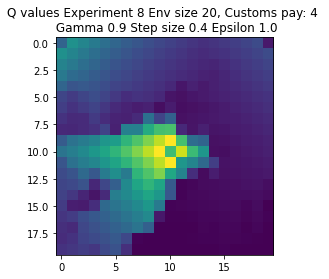

Expr:9 Eps:0 RunnAReward:-36.0 Reward:-720 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-2390.0 Reward:-1220 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-469.0 Reward:-1003 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-695.0 Reward:-146 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-1222.0 Reward:-515 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-505.0 Reward:636 Timesteps:400 GotPack:False Utiltime:334 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-331.0 Reward:558 Timesteps:400 GotPack:False Utiltime:135 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-378.0 Reward:-1267 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:-59.0 Reward:-497 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:-127.0 Rewa

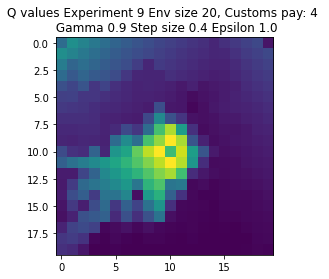

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.9 Step size 0.5 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-3.0 Reward:-55 Timesteps:800 GotPack:False Utiltime:183 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-1243.0 Reward:-1697 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-818.0 Reward:563 Timesteps:800 GotPack:False Utiltime:489 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-667.0 Reward:-97 Timesteps:800 GotPack:False Utiltime:42 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-309.0 Reward:2566 Timesteps:776 GotPack:True Utiltime:43 Customstime:748 Money:3
Expr:0 Eps:100 RunnAReward:277.0 Reward:125 Timesteps:800 GotPack:False Utiltime:70 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:244.0 Reward:112 Timesteps:1200 GotPack:False Utiltime:218 C

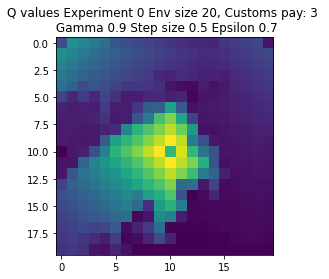

Expr:1 Eps:0 RunnAReward:-35.0 Reward:-684 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-1336.0 Reward:-601 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-936.0 Reward:461 Timesteps:800 GotPack:False Utiltime:113 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-618.0 Reward:520 Timesteps:800 GotPack:False Utiltime:164 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-190.0 Reward:-173 Timesteps:800 GotPack:False Utiltime:490 Customstime:0 Money:1
Expr:1 Eps:100 RunnAReward:138.0 Reward:424 Timesteps:800 GotPack:False Utiltime:291 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:502.0 Reward:1521 Timesteps:1948 GotPack:True Utiltime:186 Customstime:403 Money:3
Expr:1 Eps:140 RunnAReward:813.0 Reward:2265 Timesteps:1104 GotPack:True Utiltime:98 Customstime:362 Money:3
Expr:1 Eps:160 RunnAReward:671.0 Reward:340 Timesteps:1200 GotPack:False Utiltime:238 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:1318.0

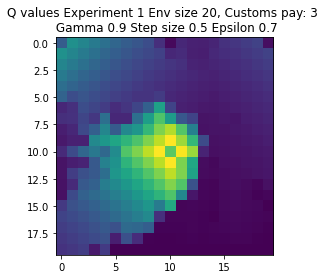

Expr:2 Eps:0 RunnAReward:-72.0 Reward:-1423 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-1443.0 Reward:-632 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:40 RunnAReward:-1033.0 Reward:-3702 Timesteps:5512 GotPack:True Utiltime:119 Customstime:3858 Money:3
Expr:2 Eps:60 RunnAReward:-713.0 Reward:1133 Timesteps:1718 GotPack:True Utiltime:30 Customstime:1560 Money:3
Expr:2 Eps:80 RunnAReward:-85.0 Reward:-1478 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:100 RunnAReward:-26.0 Reward:223 Timesteps:800 GotPack:False Utiltime:70 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:572.0 Reward:450 Timesteps:800 GotPack:False Utiltime:75 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:392.0 Reward:2083 Timesteps:1078 GotPack:True Utiltime:20 Customstime:318 Money:3
Expr:2 Eps:160 RunnAReward:576.0 Reward:544 Timesteps:800 GotPack:False Utiltime:19 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:681.

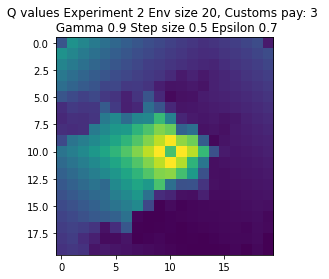

Expr:3 Eps:0 RunnAReward:-31.0 Reward:-611 Timesteps:1200 GotPack:False Utiltime:243 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-999.0 Reward:-6254 Timesteps:7287 GotPack:True Utiltime:220 Customstime:1396 Money:3
Expr:3 Eps:40 RunnAReward:-1884.0 Reward:-1066 Timesteps:3461 GotPack:True Utiltime:1394 Customstime:2036 Money:5
Expr:3 Eps:60 RunnAReward:-645.0 Reward:-3684 Timesteps:5338 GotPack:True Utiltime:4115 Customstime:4259 Money:4
Expr:3 Eps:80 RunnAReward:-997.0 Reward:65 Timesteps:2867 GotPack:True Utiltime:236 Customstime:670 Money:4
Expr:3 Eps:100 RunnAReward:-15.0 Reward:-89 Timesteps:1200 GotPack:False Utiltime:11 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:397.0 Reward:313 Timesteps:800 GotPack:False Utiltime:301 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:364.0 Reward:569 Timesteps:800 GotPack:False Utiltime:122 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:851.0 Reward:3 Timesteps:1200 GotPack:False Utiltime:97 Customstime:0 Money:2
Expr:3 Eps:180 RunnA

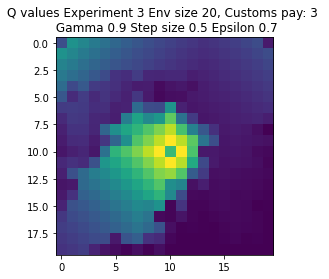

Expr:4 Eps:0 RunnAReward:23.0 Reward:463 Timesteps:800 GotPack:False Utiltime:780 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1446.0 Reward:-964 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-1370.0 Reward:186 Timesteps:800 GotPack:False Utiltime:651 Customstime:0 Money:1
Expr:4 Eps:60 RunnAReward:-105.0 Reward:22 Timesteps:3281 GotPack:True Utiltime:1255 Customstime:2209 Money:5
Expr:4 Eps:80 RunnAReward:-214.0 Reward:258 Timesteps:2286 GotPack:True Utiltime:10 Customstime:864 Money:4
Expr:4 Eps:100 RunnAReward:314.0 Reward:575 Timesteps:800 GotPack:False Utiltime:376 Customstime:0 Money:1
Expr:4 Eps:120 RunnAReward:124.0 Reward:-73 Timesteps:1200 GotPack:False Utiltime:328 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:964.0 Reward:2162 Timesteps:1241 GotPack:True Utiltime:128 Customstime:336 Money:3
Expr:4 Eps:160 RunnAReward:1014.0 Reward:-678 Timesteps:1600 GotPack:False Utiltime:104 Customstime:0 Money:2
Expr:4 Eps:180 RunnAReward:7

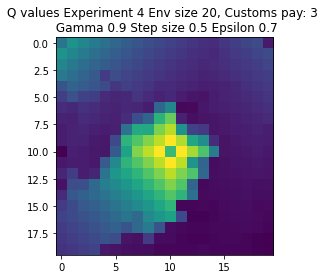

Expr:5 Eps:0 RunnAReward:-48.0 Reward:-957 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-1152.0 Reward:-562 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:40 RunnAReward:-946.0 Reward:-1184 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-312.0 Reward:201 Timesteps:800 GotPack:False Utiltime:196 Customstime:0 Money:1
Expr:5 Eps:80 RunnAReward:-694.0 Reward:190 Timesteps:800 GotPack:False Utiltime:95 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:161.0 Reward:557 Timesteps:800 GotPack:False Utiltime:143 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:486.0 Reward:273 Timesteps:800 GotPack:False Utiltime:126 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:903.0 Reward:991 Timesteps:2183 GotPack:True Utiltime:223 Customstime:783 Money:4
Expr:5 Eps:160 RunnAReward:638.0 Reward:2493 Timesteps:1160 GotPack:True Utiltime:73 Customstime:851 Money:3
Expr:5 Eps:180 RunnAReward:611.0 Rew

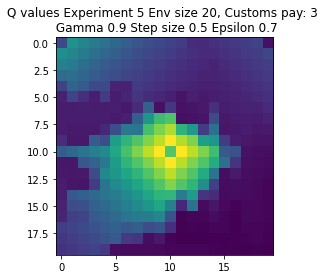

Expr:6 Eps:0 RunnAReward:-31.0 Reward:-613 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-1993.0 Reward:673 Timesteps:800 GotPack:False Utiltime:782 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-1418.0 Reward:-4492 Timesteps:6526 GotPack:True Utiltime:1030 Customstime:3675 Money:5
Expr:6 Eps:60 RunnAReward:-900.0 Reward:-1172 Timesteps:3550 GotPack:True Utiltime:629 Customstime:1424 Money:3
Expr:6 Eps:80 RunnAReward:-531.0 Reward:-1641 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:75.0 Reward:-694 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:35.0 Reward:-949 Timesteps:1600 GotPack:False Utiltime:917 Customstime:0 Money:2
Expr:6 Eps:140 RunnAReward:883.0 Reward:627 Timesteps:800 GotPack:False Utiltime:214 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:885.0 Reward:2117 Timesteps:1271 GotPack:True Utiltime:136 Customstime:349 Money:3
Expr:6 Eps:180 RunnARewa

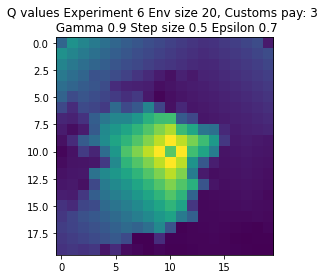

Expr:7 Eps:0 RunnAReward:-57.0 Reward:-1137 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-1065.0 Reward:411 Timesteps:800 GotPack:False Utiltime:575 Customstime:0 Money:1
Expr:7 Eps:40 RunnAReward:-969.0 Reward:-394 Timesteps:1200 GotPack:False Utiltime:871 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-618.0 Reward:-1475 Timesteps:4062 GotPack:True Utiltime:824 Customstime:921 Money:4
Expr:7 Eps:80 RunnAReward:-815.0 Reward:-228 Timesteps:1200 GotPack:False Utiltime:90 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:36.0 Reward:736 Timesteps:2365 GotPack:True Utiltime:169 Customstime:1854 Money:5
Expr:7 Eps:120 RunnAReward:285.0 Reward:-129 Timesteps:1200 GotPack:False Utiltime:166 Customstime:0 Money:2
Expr:7 Eps:140 RunnAReward:450.0 Reward:482 Timesteps:800 GotPack:False Utiltime:37 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:478.0 Reward:-99 Timesteps:1200 GotPack:False Utiltime:182 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:

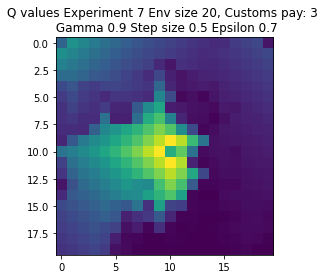

Expr:8 Eps:0 RunnAReward:-55.0 Reward:-1089 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-1063.0 Reward:-831 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-409.0 Reward:-756 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-1257.0 Reward:-73 Timesteps:1200 GotPack:False Utiltime:11 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:-36.0 Reward:1528 Timesteps:1881 GotPack:True Utiltime:1473 Customstime:1540 Money:5
Expr:8 Eps:100 RunnAReward:192.0 Reward:345 Timesteps:800 GotPack:False Utiltime:206 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:346.0 Reward:2724 Timesteps:950 GotPack:True Utiltime:265 Customstime:889 Money:3
Expr:8 Eps:140 RunnAReward:571.0 Reward:-1367 Timesteps:3825 GotPack:True Utiltime:2423 Customstime:2958 Money:4
Expr:8 Eps:160 RunnAReward:863.0 Reward:-292 Timesteps:1200 GotPack:False Utiltime:112 Customstime:0 Money:2
Expr:8 Eps:180 RunnARewar

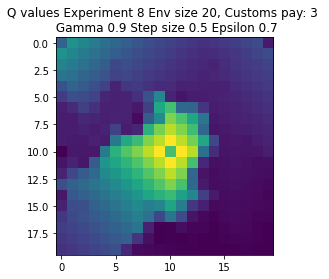

Expr:9 Eps:0 RunnAReward:-495.0 Reward:-9897 Timesteps:9975 GotPack:True Utiltime:8321 Customstime:8859 Money:4
Expr:9 Eps:20 RunnAReward:-1925.0 Reward:-1517 Timesteps:3878 GotPack:True Utiltime:1713 Customstime:2419 Money:3
Expr:9 Eps:40 RunnAReward:-551.0 Reward:60 Timesteps:1200 GotPack:False Utiltime:233 Customstime:0 Money:1
Expr:9 Eps:60 RunnAReward:-728.0 Reward:2232 Timesteps:1079 GotPack:True Utiltime:592 Customstime:893 Money:5
Expr:9 Eps:80 RunnAReward:-339.0 Reward:442 Timesteps:800 GotPack:False Utiltime:336 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-1.0 Reward:504 Timesteps:800 GotPack:False Utiltime:192 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:482.0 Reward:59 Timesteps:800 GotPack:False Utiltime:94 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:453.0 Reward:2853 Timesteps:952 GotPack:True Utiltime:117 Customstime:867 Money:4
Expr:9 Eps:160 RunnAReward:1086.0 Reward:-630 Timesteps:1600 GotPack:False Utiltime:321 Customstime:0 Money:2
Expr:9 Eps:180 RunnA

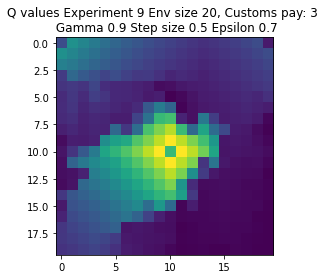

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.9 Step size 0.5 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-35.0 Reward:-682 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-551.0 Reward:-867 Timesteps:3637 GotPack:True Utiltime:2508 Customstime:3199 Money:5
Expr:0 Eps:40 RunnAReward:-789.0 Reward:-1129 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:60 RunnAReward:-60.0 Reward:2749 Timesteps:1002 GotPack:True Utiltime:110 Customstime:614 Money:5
Expr:0 Eps:80 RunnAReward:29.0 Reward:887 Timesteps:400 GotPack:False Utiltime:193 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:82.0 Reward:1069 Timesteps:2321 GotPack:True Utiltime:219 Customstime:907 Money:4
Expr:0 Eps:120 RunnAReward:516.0 Reward:-476 Timesteps:1200 GotPack:False Utiltim

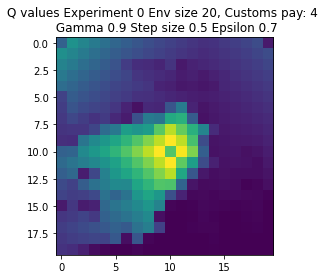

Expr:1 Eps:0 RunnAReward:-27.0 Reward:-540 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-890.0 Reward:-18 Timesteps:800 GotPack:False Utiltime:534 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-557.0 Reward:-2152 Timesteps:3850 GotPack:True Utiltime:912 Customstime:1569 Money:5
Expr:1 Eps:60 RunnAReward:-356.0 Reward:-359 Timesteps:3323 GotPack:True Utiltime:29 Customstime:1020 Money:5
Expr:1 Eps:80 RunnAReward:-38.0 Reward:-870 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:-122.0 Reward:-1323 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:120 RunnAReward:435.0 Reward:2512 Timesteps:1244 GotPack:True Utiltime:152 Customstime:865 Money:5
Expr:1 Eps:140 RunnAReward:212.0 Reward:-3789 Timesteps:6117 GotPack:True Utiltime:4549 Customstime:5247 Money:4
Expr:1 Eps:160 RunnAReward:367.0 Reward:430 Timesteps:800 GotPack:False Utiltime:642 Customstime:0 Money:2
Expr:1 Eps:180 RunnARew

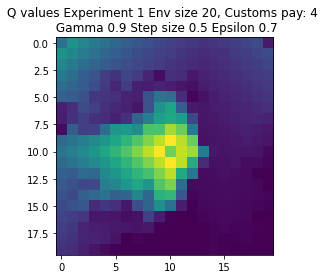

Expr:2 Eps:0 RunnAReward:-1.0 Reward:-8 Timesteps:2837 GotPack:True Utiltime:1205 Customstime:1348 Money:5
Expr:2 Eps:20 RunnAReward:-789.0 Reward:-346 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-583.0 Reward:-37 Timesteps:800 GotPack:False Utiltime:153 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-278.0 Reward:-241 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:409.0 Reward:-996 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:100 RunnAReward:-3.0 Reward:21 Timesteps:800 GotPack:False Utiltime:31 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:635.0 Reward:889 Timesteps:400 GotPack:False Utiltime:229 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:354.0 Reward:1058 Timesteps:400 GotPack:False Utiltime:11 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:796.0 Reward:1050 Timesteps:400 GotPack:False Utiltime:178 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:845.0 Reward:115

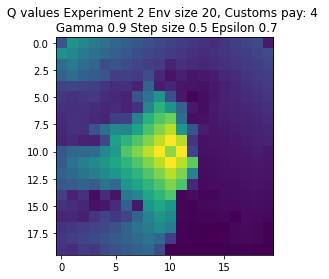

Expr:3 Eps:0 RunnAReward:-8.0 Reward:-159 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-413.0 Reward:-616 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-774.0 Reward:-848 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:60 RunnAReward:-400.0 Reward:1169 Timesteps:400 GotPack:False Utiltime:138 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-17.0 Reward:-199 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-423.0 Reward:-487 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:120 RunnAReward:291.0 Reward:1074 Timesteps:400 GotPack:False Utiltime:224 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:403.0 Reward:-694 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:3 Eps:160 RunnAReward:447.0 Reward:1013 Timesteps:400 GotPack:False Utiltime:157 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:652.0 Reward:786

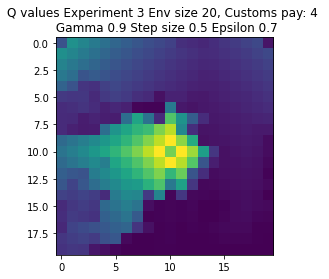

Expr:4 Eps:0 RunnAReward:-55.0 Reward:-1086 Timesteps:4045 GotPack:True Utiltime:1487 Customstime:3859 Money:5
Expr:4 Eps:20 RunnAReward:-1053.0 Reward:-752 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-1092.0 Reward:123 Timesteps:2715 GotPack:True Utiltime:1225 Customstime:2046 Money:5
Expr:4 Eps:60 RunnAReward:-393.0 Reward:1067 Timesteps:400 GotPack:False Utiltime:378 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:4.0 Reward:1032 Timesteps:400 GotPack:False Utiltime:382 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-186.0 Reward:-1396 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:1.0 Reward:2922 Timesteps:711 GotPack:True Utiltime:259 Customstime:639 Money:4
Expr:4 Eps:140 RunnAReward:682.0 Reward:616 Timesteps:400 GotPack:False Utiltime:62 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:706.0 Reward:975 Timesteps:400 GotPack:False Utiltime:95 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:479

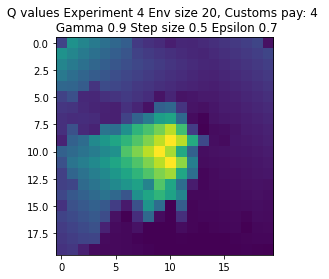

Expr:5 Eps:0 RunnAReward:-28.0 Reward:-553 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-996.0 Reward:479 Timesteps:400 GotPack:False Utiltime:274 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-594.0 Reward:-3330 Timesteps:5262 GotPack:True Utiltime:65 Customstime:1506 Money:4
Expr:5 Eps:60 RunnAReward:-747.0 Reward:659 Timesteps:400 GotPack:False Utiltime:71 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:211.0 Reward:488 Timesteps:400 GotPack:False Utiltime:6 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:457.0 Reward:1079 Timesteps:400 GotPack:False Utiltime:319 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:342.0 Reward:-3049 Timesteps:5521 GotPack:True Utiltime:4350 Customstime:4490 Money:5
Expr:5 Eps:140 RunnAReward:465.0 Reward:458 Timesteps:800 GotPack:False Utiltime:549 Customstime:0 Money:3
Expr:5 Eps:160 RunnAReward:525.0 Reward:525 Timesteps:2846 GotPack:True Utiltime:539 Customstime:866 Money:4
Expr:5 Eps:180 RunnAReward:1116

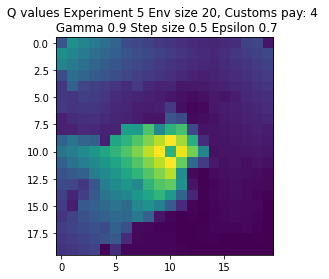

Expr:6 Eps:0 RunnAReward:-447.0 Reward:-8928 Timesteps:9583 GotPack:True Utiltime:6498 Customstime:7108 Money:4
Expr:6 Eps:20 RunnAReward:-1402.0 Reward:-673 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-216.0 Reward:-1049 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:60 RunnAReward:-18.0 Reward:714 Timesteps:400 GotPack:False Utiltime:175 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:31.0 Reward:-232 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-48.0 Reward:-41 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:566.0 Reward:-77 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:-186.0 Reward:986 Timesteps:400 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:677.0 Reward:26 Timesteps:800 GotPack:False Utiltime:98 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:912.0 Reward:24

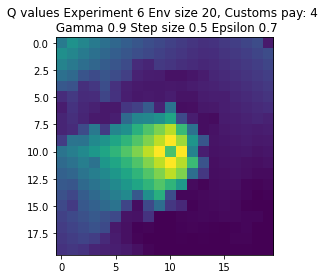

Expr:7 Eps:0 RunnAReward:-157.0 Reward:-3137 Timesteps:5322 GotPack:True Utiltime:3001 Customstime:3901 Money:5
Expr:7 Eps:20 RunnAReward:-1081.0 Reward:-946 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:40 RunnAReward:-811.0 Reward:694 Timesteps:400 GotPack:False Utiltime:326 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-16.0 Reward:-927 Timesteps:3660 GotPack:True Utiltime:681 Customstime:2304 Money:5
Expr:7 Eps:80 RunnAReward:-886.0 Reward:-2270 Timesteps:4791 GotPack:True Utiltime:3048 Customstime:3876 Money:4
Expr:7 Eps:100 RunnAReward:-72.0 Reward:-62 Timesteps:2588 GotPack:True Utiltime:881 Customstime:1650 Money:5
Expr:7 Eps:120 RunnAReward:174.0 Reward:-200 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:411.0 Reward:-181 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:447.0 Reward:955 Timesteps:400 GotPack:False Utiltime:119 Customstime:0 Money:0
Expr:7 Eps:180 RunnARe

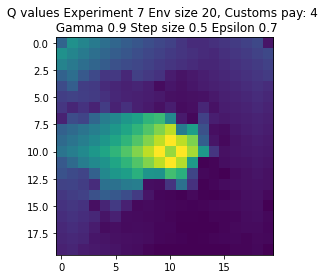

Expr:8 Eps:0 RunnAReward:-28.0 Reward:-554 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-1369.0 Reward:-246 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-541.0 Reward:-52 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-764.0 Reward:-146 Timesteps:3076 GotPack:True Utiltime:626 Customstime:2237 Money:5
Expr:8 Eps:80 RunnAReward:78.0 Reward:500 Timesteps:800 GotPack:False Utiltime:447 Customstime:0 Money:3
Expr:8 Eps:100 RunnAReward:311.0 Reward:667 Timesteps:2145 GotPack:True Utiltime:38 Customstime:1272 Money:4
Expr:8 Eps:120 RunnAReward:-227.0 Reward:562 Timesteps:400 GotPack:False Utiltime:49 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:519.0 Reward:-661 Timesteps:1200 GotPack:False Utiltime:80 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:791.0 Reward:1074 Timesteps:400 GotPack:False Utiltime:116 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:579.0 Rew

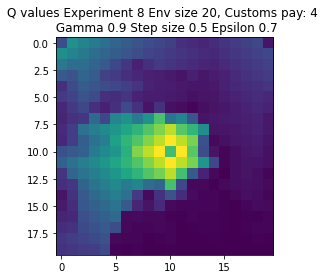

Expr:9 Eps:0 RunnAReward:-26.0 Reward:-506 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-1772.0 Reward:-1180 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:40 RunnAReward:-1158.0 Reward:668 Timesteps:400 GotPack:False Utiltime:275 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-103.0 Reward:1044 Timesteps:400 GotPack:False Utiltime:316 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-215.0 Reward:1026 Timesteps:400 GotPack:False Utiltime:236 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:190.0 Reward:-74 Timesteps:1200 GotPack:False Utiltime:200 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:67.0 Reward:587 Timesteps:800 GotPack:False Utiltime:474 Customstime:0 Money:2
Expr:9 Eps:140 RunnAReward:382.0 Reward:1116 Timesteps:400 GotPack:False Utiltime:5 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:615.0 Reward:1012 Timesteps:400 GotPack:False Utiltime:9 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:567.0 Rewar

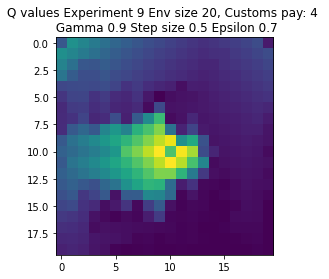

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.9 Step size 0.5 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-532.0 Reward:-10622 Timesteps:10254 GotPack:True Utiltime:1348 Customstime:2276 Money:4
Expr:0 Eps:20 RunnAReward:-2200.0 Reward:-724 Timesteps:1200 GotPack:False Utiltime:7 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-866.0 Reward:-1662 Timesteps:3756 GotPack:True Utiltime:787 Customstime:924 Money:3
Expr:0 Eps:60 RunnAReward:-1114.0 Reward:3 Timesteps:800 GotPack:False Utiltime:354 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-1360.0 Reward:-1771 Timesteps:1600 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-535.0 Reward:-903 Timesteps:1600 GotPack:False Utiltime:144 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:-137.0 Reward:-22 Timesteps:1200 GotPack:F

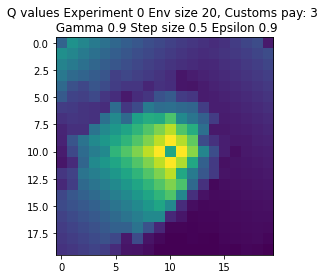

Expr:1 Eps:0 RunnAReward:-49.0 Reward:-962 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-2379.0 Reward:-559 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-1217.0 Reward:-281 Timesteps:1200 GotPack:False Utiltime:1015 Customstime:0 Money:2
Expr:1 Eps:60 RunnAReward:-1574.0 Reward:1859 Timesteps:1397 GotPack:True Utiltime:210 Customstime:1194 Money:4
Expr:1 Eps:80 RunnAReward:-493.0 Reward:-858 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:1 Eps:100 RunnAReward:-903.0 Reward:1698 Timesteps:1601 GotPack:True Utiltime:21 Customstime:1416 Money:4
Expr:1 Eps:120 RunnAReward:-114.0 Reward:-666 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:-69.0 Reward:-205 Timesteps:1200 GotPack:False Utiltime:136 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:283.0 Reward:-262 Timesteps:1200 GotPack:False Utiltime:31 Customstime:0 Money:2
Expr:1 Eps:180 RunnARewar

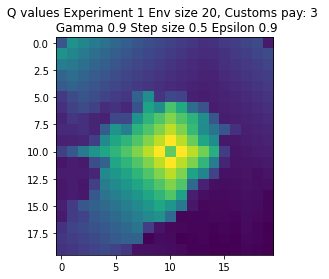

Expr:2 Eps:0 RunnAReward:-17.0 Reward:-334 Timesteps:1200 GotPack:False Utiltime:186 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-1021.0 Reward:-1527 Timesteps:3750 GotPack:True Utiltime:100 Customstime:1404 Money:3
Expr:2 Eps:40 RunnAReward:-1597.0 Reward:-90 Timesteps:1200 GotPack:False Utiltime:183 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-1280.0 Reward:-1254 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-976.0 Reward:368 Timesteps:800 GotPack:False Utiltime:125 Customstime:0 Money:1
Expr:2 Eps:100 RunnAReward:-65.0 Reward:612 Timesteps:800 GotPack:False Utiltime:378 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:-39.0 Reward:23 Timesteps:800 GotPack:False Utiltime:156 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-1.0 Reward:-221 Timesteps:1200 GotPack:False Utiltime:48 Customstime:0 Money:2
Expr:2 Eps:160 RunnAReward:301.0 Reward:605 Timesteps:800 GotPack:False Utiltime:11 Customstime:0 Money:1
Expr:2 Eps:180 RunnAReward:208

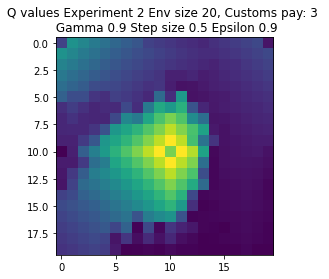

Expr:3 Eps:0 RunnAReward:-69.0 Reward:-1361 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-2604.0 Reward:-182 Timesteps:1200 GotPack:False Utiltime:120 Customstime:0 Money:2
Expr:3 Eps:40 RunnAReward:-1598.0 Reward:-954 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-2201.0 Reward:2184 Timesteps:1313 GotPack:True Utiltime:182 Customstime:1182 Money:4
Expr:3 Eps:80 RunnAReward:-295.0 Reward:-3251 Timesteps:5218 GotPack:True Utiltime:231 Customstime:567 Money:5
Expr:3 Eps:100 RunnAReward:-274.0 Reward:-588 Timesteps:1200 GotPack:False Utiltime:121 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:116.0 Reward:600 Timesteps:800 GotPack:False Utiltime:6 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-67.0 Reward:646 Timesteps:800 GotPack:False Utiltime:327 Customstime:0 Money:1
Expr:3 Eps:160 RunnAReward:42.0 Reward:1260 Timesteps:1801 GotPack:True Utiltime:192 Customstime:558 Money:4
Expr:3 Eps:180 RunnARew

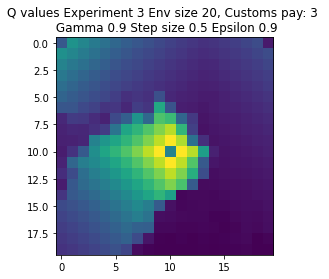

Expr:4 Eps:0 RunnAReward:-57.0 Reward:-1123 Timesteps:1600 GotPack:False Utiltime:1361 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-1438.0 Reward:-9866 Timesteps:9582 GotPack:True Utiltime:6473 Customstime:6618 Money:4
Expr:4 Eps:40 RunnAReward:-2024.0 Reward:-390 Timesteps:800 GotPack:False Utiltime:196 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-2228.0 Reward:-55 Timesteps:1200 GotPack:False Utiltime:671 Customstime:0 Money:1
Expr:4 Eps:80 RunnAReward:-450.0 Reward:2162 Timesteps:1027 GotPack:True Utiltime:39 Customstime:546 Money:3
Expr:4 Eps:100 RunnAReward:-621.0 Reward:-582 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:-197.0 Reward:-69 Timesteps:2656 GotPack:True Utiltime:44 Customstime:857 Money:4
Expr:4 Eps:140 RunnAReward:28.0 Reward:1653 Timesteps:1709 GotPack:True Utiltime:140 Customstime:879 Money:4
Expr:4 Eps:160 RunnAReward:244.0 Reward:278 Timesteps:800 GotPack:False Utiltime:24 Customstime:0 Money:0
Expr:4 Eps:180 Runn

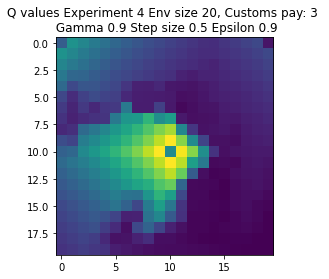

Expr:5 Eps:0 RunnAReward:-78.0 Reward:-1543 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-1688.0 Reward:-6944 Timesteps:8006 GotPack:True Utiltime:2765 Customstime:4341 Money:3
Expr:5 Eps:40 RunnAReward:-1804.0 Reward:-737 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:5 Eps:60 RunnAReward:-799.0 Reward:-723 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-1726.0 Reward:283 Timesteps:800 GotPack:False Utiltime:165 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:105.0 Reward:-6498 Timesteps:7268 GotPack:True Utiltime:2541 Customstime:2901 Money:3
Expr:5 Eps:120 RunnAReward:-625.0 Reward:-100 Timesteps:1200 GotPack:False Utiltime:218 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:303.0 Reward:-891 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:618.0 Reward:210 Timesteps:800 GotPack:False Utiltime:443 Customstime:0 Money:0
Expr:5 Eps:180 RunnARew

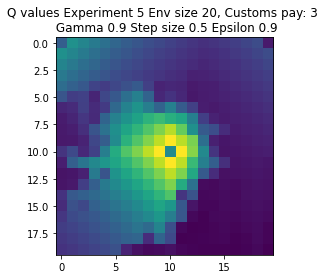

Expr:6 Eps:0 RunnAReward:-52.0 Reward:-1036 Timesteps:1600 GotPack:False Utiltime:220 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-2823.0 Reward:-1420 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-1655.0 Reward:-4359 Timesteps:5636 GotPack:True Utiltime:5020 Customstime:5388 Money:3
Expr:6 Eps:60 RunnAReward:-1681.0 Reward:92 Timesteps:800 GotPack:False Utiltime:657 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:-596.0 Reward:-62 Timesteps:800 GotPack:False Utiltime:70 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-441.0 Reward:652 Timesteps:800 GotPack:False Utiltime:70 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:-139.0 Reward:941 Timesteps:2269 GotPack:True Utiltime:1448 Customstime:1672 Money:5
Expr:6 Eps:140 RunnAReward:107.0 Reward:623 Timesteps:800 GotPack:False Utiltime:327 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:15.0 Reward:-818 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:6 Eps:180 RunnAReward

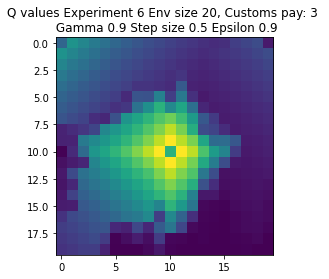

Expr:7 Eps:0 RunnAReward:-259.0 Reward:-5177 Timesteps:6384 GotPack:True Utiltime:3588 Customstime:4244 Money:3
Expr:7 Eps:20 RunnAReward:-2495.0 Reward:-1171 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-1789.0 Reward:-4258 Timesteps:5615 GotPack:True Utiltime:3529 Customstime:5002 Money:5
Expr:7 Eps:60 RunnAReward:-1240.0 Reward:528 Timesteps:800 GotPack:False Utiltime:613 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-271.0 Reward:-423 Timesteps:1600 GotPack:False Utiltime:1367 Customstime:0 Money:2
Expr:7 Eps:100 RunnAReward:-303.0 Reward:-413 Timesteps:1200 GotPack:False Utiltime:37 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:45.0 Reward:158 Timesteps:2835 GotPack:True Utiltime:166 Customstime:480 Money:3
Expr:7 Eps:140 RunnAReward:-294.0 Reward:247 Timesteps:800 GotPack:False Utiltime:61 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:565.0 Reward:608 Timesteps:800 GotPack:False Utiltime:191 Customstime:0 Money:0
Expr:7 Eps:180 Ru

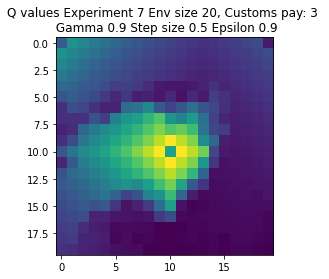

Expr:8 Eps:0 RunnAReward:-82.0 Reward:-1631 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-1620.0 Reward:-517 Timesteps:1200 GotPack:False Utiltime:995 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-1826.0 Reward:-738 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-1244.0 Reward:415 Timesteps:800 GotPack:False Utiltime:306 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-1099.0 Reward:-2365 Timesteps:4583 GotPack:True Utiltime:1621 Customstime:2066 Money:3
Expr:8 Eps:100 RunnAReward:-674.0 Reward:564 Timesteps:800 GotPack:False Utiltime:480 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:504.0 Reward:1357 Timesteps:1306 GotPack:True Utiltime:124 Customstime:872 Money:5
Expr:8 Eps:140 RunnAReward:165.0 Reward:-126 Timesteps:1200 GotPack:False Utiltime:83 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:696.0 Reward:163 Timesteps:1200 GotPack:False Utiltime:164 Customstime:0 Money:2
Expr:8 Eps:180 RunnAR

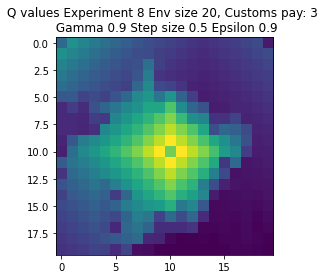

Expr:9 Eps:0 RunnAReward:-48.0 Reward:-953 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:20 RunnAReward:-1382.0 Reward:-6623 Timesteps:7122 GotPack:True Utiltime:3861 Customstime:4602 Money:5
Expr:9 Eps:40 RunnAReward:-1534.0 Reward:-4673 Timesteps:5969 GotPack:True Utiltime:3494 Customstime:4699 Money:3
Expr:9 Eps:60 RunnAReward:-929.0 Reward:537 Timesteps:800 GotPack:False Utiltime:462 Customstime:0 Money:1
Expr:9 Eps:80 RunnAReward:36.0 Reward:1049 Timesteps:2439 GotPack:True Utiltime:255 Customstime:690 Money:3
Expr:9 Eps:100 RunnAReward:12.0 Reward:-62 Timesteps:1200 GotPack:False Utiltime:110 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:-236.0 Reward:-709 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:140 RunnAReward:257.0 Reward:229 Timesteps:800 GotPack:False Utiltime:325 Customstime:0 Money:1
Expr:9 Eps:160 RunnAReward:-97.0 Reward:-2573 Timesteps:4463 GotPack:True Utiltime:1462 Customstime:2495 Money:5
Expr:9 Eps:180 Runn

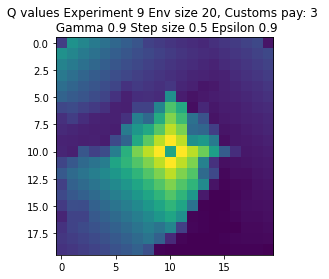

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.9 Step size 0.5 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-136.0 Reward:-2715 Timesteps:4785 GotPack:True Utiltime:2337 Customstime:3521 Money:4
Expr:0 Eps:20 RunnAReward:-1410.0 Reward:321 Timesteps:800 GotPack:False Utiltime:629 Customstime:0 Money:3
Expr:0 Eps:40 RunnAReward:-938.0 Reward:475 Timesteps:400 GotPack:False Utiltime:335 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-646.0 Reward:-1024 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:0 Eps:80 RunnAReward:-848.0 Reward:-844 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-14.0 Reward:-174 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:157.0 Reward:-869 Timesteps:400 GotPack:False Utiltime

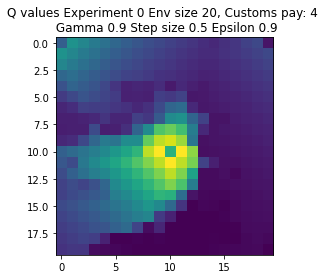

Expr:1 Eps:0 RunnAReward:23.0 Reward:472 Timesteps:400 GotPack:False Utiltime:388 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-1294.0 Reward:-7672 Timesteps:8277 GotPack:True Utiltime:6720 Customstime:7075 Money:5
Expr:1 Eps:40 RunnAReward:-693.0 Reward:-994 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:60 RunnAReward:-712.0 Reward:-642 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-770.0 Reward:-4978 Timesteps:6958 GotPack:True Utiltime:1555 Customstime:1949 Money:4
Expr:1 Eps:100 RunnAReward:-68.0 Reward:-680 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:-239.0 Reward:412 Timesteps:800 GotPack:False Utiltime:177 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:111.0 Reward:639 Timesteps:400 GotPack:False Utiltime:192 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:417.0 Reward:-154 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:501

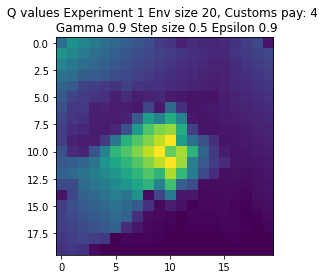

Expr:2 Eps:0 RunnAReward:-572.0 Reward:-11433 Timesteps:9814 GotPack:True Utiltime:8138 Customstime:8595 Money:5
Expr:2 Eps:20 RunnAReward:-1108.0 Reward:-77 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-935.0 Reward:-617 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-900.0 Reward:-1170 Timesteps:3504 GotPack:True Utiltime:2669 Customstime:3384 Money:5
Expr:2 Eps:80 RunnAReward:-83.0 Reward:530 Timesteps:400 GotPack:False Utiltime:103 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-80.0 Reward:-1610 Timesteps:4427 GotPack:True Utiltime:2552 Customstime:4053 Money:4
Expr:2 Eps:120 RunnAReward:61.0 Reward:346 Timesteps:2831 GotPack:True Utiltime:62 Customstime:953 Money:5
Expr:2 Eps:140 RunnAReward:78.0 Reward:-98 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:215.0 Reward:761 Timesteps:400 GotPack:False Utiltime:59 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward

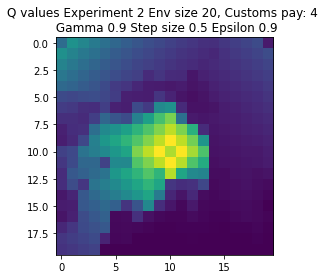

Expr:3 Eps:0 RunnAReward:-6.0 Reward:-116 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-263.0 Reward:-400 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-581.0 Reward:-105 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-352.0 Reward:1609 Timesteps:1755 GotPack:True Utiltime:276 Customstime:948 Money:4
Expr:3 Eps:80 RunnAReward:-549.0 Reward:-504 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:9.0 Reward:-106 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:85.0 Reward:-181 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:13.0 Reward:215 Timesteps:2551 GotPack:True Utiltime:798 Customstime:1492 Money:4
Expr:3 Eps:160 RunnAReward:279.0 Reward:955 Timesteps:400 GotPack:False Utiltime:233 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:503.0 Reward:1076

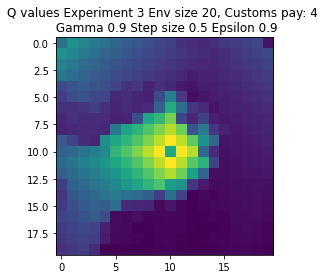

Expr:4 Eps:0 RunnAReward:-6.0 Reward:-118 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-927.0 Reward:-988 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:40 RunnAReward:-586.0 Reward:-4648 Timesteps:5702 GotPack:True Utiltime:421 Customstime:2164 Money:5
Expr:4 Eps:60 RunnAReward:-1090.0 Reward:548 Timesteps:400 GotPack:False Utiltime:289 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:92.0 Reward:-44 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-421.0 Reward:-754 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:-702.0 Reward:608 Timesteps:400 GotPack:False Utiltime:54 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:129.0 Reward:-125 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:334.0 Reward:1868 Timesteps:1646 GotPack:True Utiltime:856 Customstime:1243 Money:5
Expr:4 Eps:180 RunnAReward:85.0 Rewar

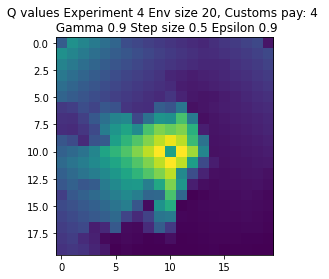

Expr:5 Eps:0 RunnAReward:38.0 Reward:773 Timesteps:400 GotPack:False Utiltime:136 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-541.0 Reward:486 Timesteps:400 GotPack:False Utiltime:169 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-1361.0 Reward:-879 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-220.0 Reward:732 Timesteps:400 GotPack:False Utiltime:49 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-815.0 Reward:-5546 Timesteps:6726 GotPack:True Utiltime:5020 Customstime:5519 Money:4
Expr:5 Eps:100 RunnAReward:-772.0 Reward:745 Timesteps:400 GotPack:False Utiltime:154 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:358.0 Reward:-968 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:5 Eps:140 RunnAReward:-222.0 Reward:1394 Timesteps:1648 GotPack:True Utiltime:201 Customstime:936 Money:5
Expr:5 Eps:160 RunnAReward:173.0 Reward:593 Timesteps:400 GotPack:False Utiltime:235 Customstime:0 Money:0
Expr:5 Eps:180 RunnAReward:212.

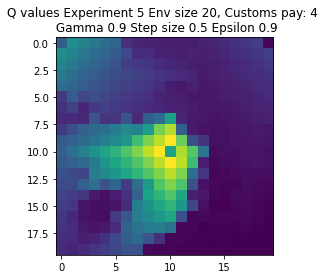

Expr:6 Eps:0 RunnAReward:-47.0 Reward:-939 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-1057.0 Reward:-4667 Timesteps:5669 GotPack:True Utiltime:3700 Customstime:5483 Money:5
Expr:6 Eps:40 RunnAReward:-1021.0 Reward:525 Timesteps:400 GotPack:False Utiltime:176 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-405.0 Reward:-1067 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:-811.0 Reward:-679 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:100 RunnAReward:-554.0 Reward:532 Timesteps:400 GotPack:False Utiltime:180 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:156.0 Reward:1881 Timesteps:1192 GotPack:True Utiltime:162 Customstime:621 Money:5
Expr:6 Eps:140 RunnAReward:-49.0 Reward:-244 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:405.0 Reward:163 Timesteps:800 GotPack:False Utiltime:28 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:301.

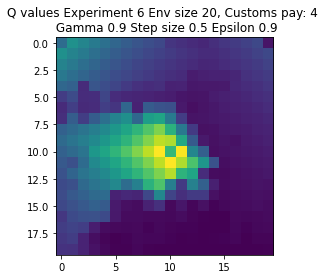

Expr:7 Eps:0 RunnAReward:-126.0 Reward:-2514 Timesteps:4359 GotPack:True Utiltime:2686 Customstime:3429 Money:5
Expr:7 Eps:20 RunnAReward:-1931.0 Reward:-669 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-727.0 Reward:-1185 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:60 RunnAReward:-1372.0 Reward:-292 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-643.0 Reward:-531 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-1016.0 Reward:260 Timesteps:800 GotPack:False Utiltime:297 Customstime:0 Money:2
Expr:7 Eps:120 RunnAReward:130.0 Reward:-112 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-85.0 Reward:700 Timesteps:400 GotPack:False Utiltime:69 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:767.0 Reward:1439 Timesteps:1762 GotPack:True Utiltime:191 Customstime:1374 Money:5
Expr:7 Eps:180 RunnAReward:52

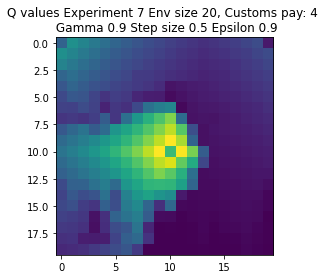

Expr:8 Eps:0 RunnAReward:-54.0 Reward:-1075 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-1627.0 Reward:-435 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-915.0 Reward:706 Timesteps:400 GotPack:False Utiltime:203 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-613.0 Reward:-49 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:11.0 Reward:487 Timesteps:400 GotPack:False Utiltime:367 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:-531.0 Reward:-798 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:120 RunnAReward:25.0 Reward:1697 Timesteps:1207 GotPack:True Utiltime:115 Customstime:1046 Money:5
Expr:8 Eps:140 RunnAReward:301.0 Reward:611 Timesteps:400 GotPack:False Utiltime:43 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:406.0 Reward:-1075 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:180 RunnAReward:51.0 Reward:10

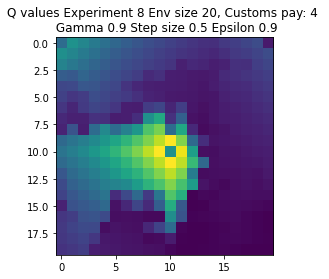

Expr:9 Eps:0 RunnAReward:-79.0 Reward:-1572 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-600.0 Reward:637 Timesteps:400 GotPack:False Utiltime:241 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-962.0 Reward:-1030 Timesteps:1200 GotPack:False Utiltime:326 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-691.0 Reward:-20 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-354.0 Reward:-77 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-556.0 Reward:745 Timesteps:2566 GotPack:True Utiltime:1381 Customstime:2163 Money:5
Expr:9 Eps:120 RunnAReward:-85.0 Reward:-45 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-478.0 Reward:-297 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:48.0 Reward:-55 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:476.0 Reward:

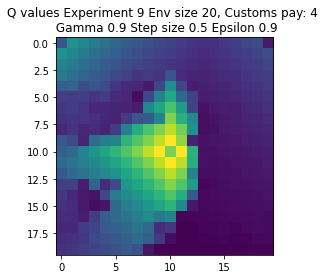

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.9 Step size 0.5 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-50.0 Reward:-992 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:0 Eps:20 RunnAReward:-3111.0 Reward:-1268 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-2550.0 Reward:-1306 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-3050.0 Reward:-1889 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:-380.0 Reward:-1116 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-1018.0 Reward:-796 Timesteps:1200 GotPack:False Utiltime:231 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:-656.0 Reward:-1981 Timesteps:3655 GotPack:True Utilt

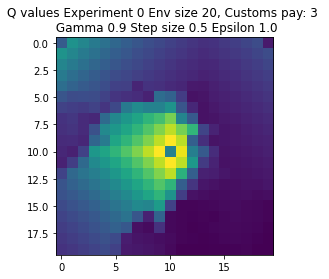

Expr:1 Eps:0 RunnAReward:-463.0 Reward:-9251 Timesteps:8579 GotPack:True Utiltime:7257 Customstime:8171 Money:3
Expr:1 Eps:20 RunnAReward:-3285.0 Reward:-920 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-1726.0 Reward:757 Timesteps:2460 GotPack:True Utiltime:1676 Customstime:1866 Money:3
Expr:1 Eps:60 RunnAReward:-2582.0 Reward:150 Timesteps:800 GotPack:False Utiltime:490 Customstime:0 Money:1
Expr:1 Eps:80 RunnAReward:-1765.0 Reward:-7770 Timesteps:8986 GotPack:True Utiltime:79 Customstime:1104 Money:4
Expr:1 Eps:100 RunnAReward:-1109.0 Reward:-1377 Timesteps:4225 GotPack:True Utiltime:2927 Customstime:3593 Money:3
Expr:1 Eps:120 RunnAReward:-629.0 Reward:-1262 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:34.0 Reward:-1154 Timesteps:3698 GotPack:True Utiltime:866 Customstime:1048 Money:3
Expr:1 Eps:160 RunnAReward:256.0 Reward:1521 Timesteps:1698 GotPack:True Utiltime:322 Customstime:1616 Money:3
Exp

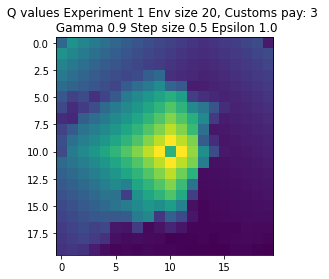

Expr:2 Eps:0 RunnAReward:-45.0 Reward:-892 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-1493.0 Reward:-742 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-1997.0 Reward:255 Timesteps:800 GotPack:False Utiltime:25 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-1170.0 Reward:-1305 Timesteps:3873 GotPack:True Utiltime:3049 Customstime:3213 Money:3
Expr:2 Eps:80 RunnAReward:-2094.0 Reward:445 Timesteps:800 GotPack:False Utiltime:754 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-602.0 Reward:-1056 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-722.0 Reward:-837 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:-566.0 Reward:-88 Timesteps:2783 GotPack:True Utiltime:25 Customstime:1870 Money:3
Expr:2 Eps:160 RunnAReward:7.0 Reward:-757 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:180 RunnAReward:173.

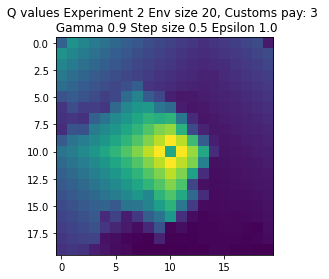

Expr:3 Eps:0 RunnAReward:-51.0 Reward:-1006 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-2029.0 Reward:-1168 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-2212.0 Reward:-991 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-2086.0 Reward:-648 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:80 RunnAReward:-1521.0 Reward:-455 Timesteps:1200 GotPack:False Utiltime:1037 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:-834.0 Reward:-508 Timesteps:3243 GotPack:True Utiltime:763 Customstime:1704 Money:3
Expr:3 Eps:120 RunnAReward:-791.0 Reward:-644 Timesteps:1200 GotPack:False Utiltime:14 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:-96.0 Reward:50 Timesteps:3142 GotPack:True Utiltime:2251 Customstime:2367 Money:4
Expr:3 Eps:160 RunnAReward:346.0 Reward:-690 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:3 Eps:180 RunnARewar

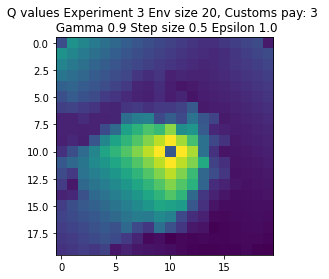

Expr:4 Eps:0 RunnAReward:-79.0 Reward:-1565 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:20 RunnAReward:-2347.0 Reward:-664 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:40 RunnAReward:-1921.0 Reward:-1045 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-1827.0 Reward:-8068 Timesteps:8278 GotPack:True Utiltime:2083 Customstime:2404 Money:4
Expr:4 Eps:80 RunnAReward:-1407.0 Reward:-2259 Timesteps:4164 GotPack:True Utiltime:3955 Customstime:4048 Money:3
Expr:4 Eps:100 RunnAReward:-884.0 Reward:259 Timesteps:800 GotPack:False Utiltime:117 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-864.0 Reward:186 Timesteps:1200 GotPack:False Utiltime:1074 Customstime:0 Money:1
Expr:4 Eps:140 RunnAReward:32.0 Reward:-313 Timesteps:1200 GotPack:False Utiltime:820 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:193.0 Reward:324 Timesteps:2876 GotPack:True Utiltime:266 Customstime:952 Money:5
Expr:4 Eps:180 R

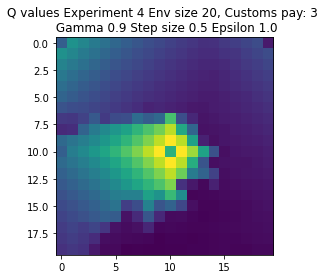

Expr:5 Eps:0 RunnAReward:-23.0 Reward:-457 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-2919.0 Reward:-1135 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-1978.0 Reward:-952 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-1030.0 Reward:527 Timesteps:800 GotPack:False Utiltime:72 Customstime:0 Money:1
Expr:5 Eps:80 RunnAReward:-950.0 Reward:349 Timesteps:800 GotPack:False Utiltime:715 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-757.0 Reward:-711 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:-409.0 Reward:-158 Timesteps:800 GotPack:False Utiltime:550 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:-946.0 Reward:-2861 Timesteps:5244 GotPack:True Utiltime:944 Customstime:1294 Money:3
Expr:5 Eps:160 RunnAReward:125.0 Reward:-1135 Timesteps:1600 GotPack:False Utiltime:179 Customstime:0 Money:2
Expr:5 Eps:180 RunnAReward:1

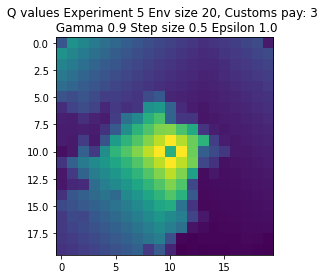

Expr:6 Eps:0 RunnAReward:-66.0 Reward:-1319 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-2404.0 Reward:-1285 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-2175.0 Reward:574 Timesteps:800 GotPack:False Utiltime:197 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-1498.0 Reward:-1601 Timesteps:1600 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:80 RunnAReward:-1787.0 Reward:-1058 Timesteps:3234 GotPack:True Utiltime:871 Customstime:1220 Money:5
Expr:6 Eps:100 RunnAReward:-490.0 Reward:-128 Timesteps:800 GotPack:False Utiltime:292 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-260.0 Reward:-857 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:-128.0 Reward:597 Timesteps:800 GotPack:False Utiltime:565 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:16.0 Reward:-774 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:4

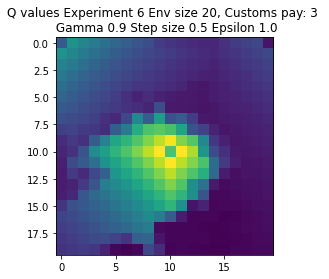

Expr:7 Eps:0 RunnAReward:61.0 Reward:1226 Timesteps:1783 GotPack:True Utiltime:517 Customstime:1504 Money:5
Expr:7 Eps:20 RunnAReward:-3048.0 Reward:575 Timesteps:800 GotPack:False Utiltime:281 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-716.0 Reward:-601 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-1151.0 Reward:-590 Timesteps:1200 GotPack:False Utiltime:843 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-2071.0 Reward:-136 Timesteps:800 GotPack:False Utiltime:305 Customstime:0 Money:1
Expr:7 Eps:100 RunnAReward:-278.0 Reward:515 Timesteps:800 GotPack:False Utiltime:486 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-353.0 Reward:105 Timesteps:800 GotPack:False Utiltime:375 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-290.0 Reward:632 Timesteps:800 GotPack:False Utiltime:242 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:59.0 Reward:1531 Timesteps:1587 GotPack:True Utiltime:251 Customstime:836 Money:5
Expr:7 Eps:180 RunnAReward

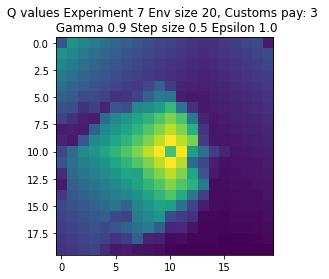

Expr:8 Eps:0 RunnAReward:-100.0 Reward:-1997 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-3468.0 Reward:-887 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-1060.0 Reward:-1413 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-1893.0 Reward:924 Timesteps:2086 GotPack:True Utiltime:56 Customstime:381 Money:3
Expr:8 Eps:80 RunnAReward:-1346.0 Reward:278 Timesteps:800 GotPack:False Utiltime:291 Customstime:0 Money:2
Expr:8 Eps:100 RunnAReward:-1458.0 Reward:-181 Timesteps:800 GotPack:False Utiltime:385 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-444.0 Reward:-1256 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:-966.0 Reward:-95 Timesteps:1200 GotPack:False Utiltime:128 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:-188.0 Reward:-579 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:180 RunnARewar

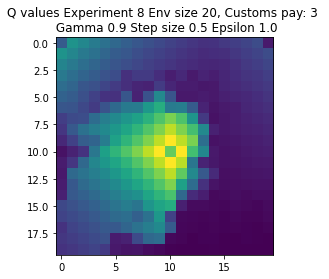

Expr:9 Eps:0 RunnAReward:-70.0 Reward:-1387 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-1900.0 Reward:-1207 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-1872.0 Reward:-7043 Timesteps:7523 GotPack:True Utiltime:134 Customstime:1218 Money:5
Expr:9 Eps:60 RunnAReward:-2685.0 Reward:-1039 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:80 RunnAReward:-1250.0 Reward:-550 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:100 RunnAReward:-1693.0 Reward:-2344 Timesteps:4644 GotPack:True Utiltime:92 Customstime:1692 Money:3
Expr:9 Eps:120 RunnAReward:-882.0 Reward:-526 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:9 Eps:140 RunnAReward:-369.0 Reward:22 Timesteps:800 GotPack:False Utiltime:373 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:325.0 Reward:-138 Timesteps:1200 GotPack:False Utiltime:200 Customstime:0 Money:2
Expr:9 Eps:180 RunnARe

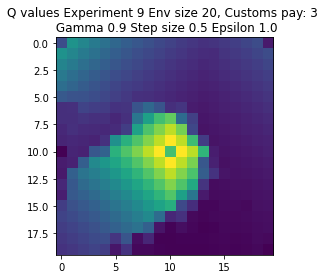

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.9 Step size 0.5 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-26.0 Reward:-511 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-852.0 Reward:-1288 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:40 RunnAReward:-1467.0 Reward:-571 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-1231.0 Reward:-232 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-807.0 Reward:-254 Timesteps:800 GotPack:False Utiltime:301 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-552.0 Reward:-2257 Timesteps:4656 GotPack:True Utiltime:4026 Customstime:4495 Money:4
Expr:0 Eps:120 RunnAReward:-1133.0 Reward:-11486 Timesteps:11345 GotPack:True Ut

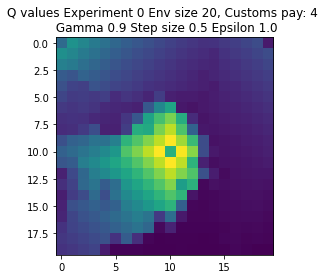

Expr:1 Eps:0 RunnAReward:-30.0 Reward:-596 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-1101.0 Reward:-1118 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:40 RunnAReward:-1534.0 Reward:-12529 Timesteps:12000 GotPack:False Utiltime:3114 Customstime:4197 Money:5
Expr:1 Eps:60 RunnAReward:-1086.0 Reward:-230 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-518.0 Reward:-1353 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:-243.0 Reward:27 Timesteps:800 GotPack:False Utiltime:56 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:44.0 Reward:-203 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:-1312.0 Reward:-763 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:93.0 Reward:-129 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:-59.0 

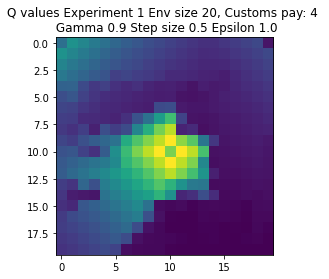

Expr:2 Eps:0 RunnAReward:-18.0 Reward:-341 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-1192.0 Reward:-7 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-704.0 Reward:-1001 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-640.0 Reward:-80 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-416.0 Reward:-24 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-1471.0 Reward:-855 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:-354.0 Reward:-55 Timesteps:800 GotPack:False Utiltime:35 Customstime:0 Money:2
Expr:2 Eps:140 RunnAReward:-146.0 Reward:-38 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:206.0 Reward:399 Timesteps:800 GotPack:False Utiltime:282 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:-508.0 Reward:-2049

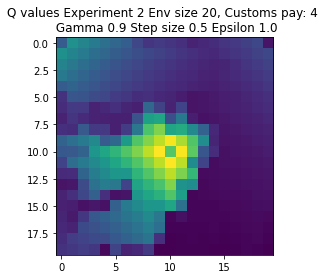

Expr:3 Eps:0 RunnAReward:0.0 Reward:4 Timesteps:800 GotPack:False Utiltime:740 Customstime:0 Money:2
Expr:3 Eps:20 RunnAReward:-690.0 Reward:-189 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-708.0 Reward:-1051 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-475.0 Reward:-715 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-1013.0 Reward:-121 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-955.0 Reward:52 Timesteps:800 GotPack:False Utiltime:245 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:-355.0 Reward:-779 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:-181.0 Reward:2123 Timesteps:1371 GotPack:True Utiltime:746 Customstime:1341 Money:4
Expr:3 Eps:160 RunnAReward:307.0 Reward:407 Timesteps:2473 GotPack:True Utiltime:135 Customstime:750 Money:5
Expr:3 Eps:180 RunnAReward:203.0 Rewar

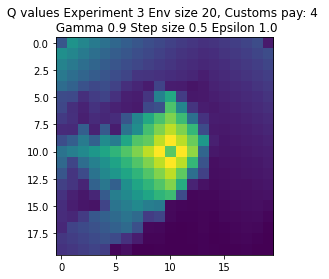

Expr:4 Eps:0 RunnAReward:-27.0 Reward:-533 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1694.0 Reward:-519 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-626.0 Reward:1034 Timesteps:400 GotPack:False Utiltime:121 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-921.0 Reward:602 Timesteps:400 GotPack:False Utiltime:129 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-508.0 Reward:-561 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-664.0 Reward:502 Timesteps:800 GotPack:False Utiltime:471 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:-318.0 Reward:1028 Timesteps:400 GotPack:False Utiltime:172 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:140.0 Reward:208 Timesteps:800 GotPack:False Utiltime:52 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:-335.0 Reward:506 Timesteps:400 GotPack:False Utiltime:255 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:360.0 Rewa

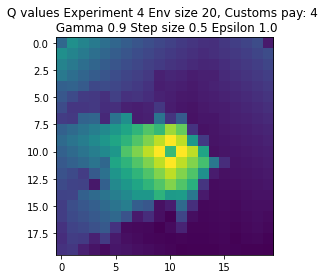

Expr:5 Eps:0 RunnAReward:-24.0 Reward:-480 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-1026.0 Reward:-4506 Timesteps:5964 GotPack:True Utiltime:2281 Customstime:4828 Money:5
Expr:5 Eps:40 RunnAReward:-1642.0 Reward:-87 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-865.0 Reward:-9033 Timesteps:8666 GotPack:True Utiltime:3468 Customstime:4271 Money:5
Expr:5 Eps:80 RunnAReward:-1362.0 Reward:-2122 Timesteps:3925 GotPack:True Utiltime:617 Customstime:2880 Money:5
Expr:5 Eps:100 RunnAReward:-216.0 Reward:-616 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-824.0 Reward:2065 Timesteps:1219 GotPack:True Utiltime:471 Customstime:945 Money:4
Expr:5 Eps:140 RunnAReward:223.0 Reward:-511 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:-75.0 Reward:9 Timesteps:800 GotPack:False Utiltime:10 Customstime:0 Money:2
Expr:5 Eps:180 RunnARe

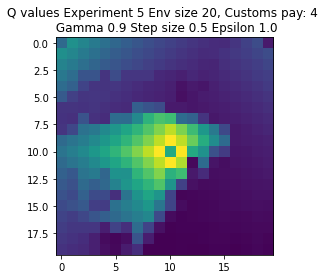

Expr:6 Eps:0 RunnAReward:-1.0 Reward:-3 Timesteps:800 GotPack:False Utiltime:181 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-1155.0 Reward:-11098 Timesteps:9554 GotPack:True Utiltime:5295 Customstime:5571 Money:5
Expr:6 Eps:40 RunnAReward:-1478.0 Reward:-171 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-1877.0 Reward:985 Timesteps:400 GotPack:False Utiltime:217 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-348.0 Reward:669 Timesteps:400 GotPack:False Utiltime:193 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-596.0 Reward:510 Timesteps:400 GotPack:False Utiltime:380 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-437.0 Reward:240 Timesteps:2541 GotPack:True Utiltime:71 Customstime:383 Money:5
Expr:6 Eps:140 RunnAReward:-222.0 Reward:-268 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:-105.0 Reward:-1769 Timesteps:4093 GotPack:True Utiltime:1867 Customstime:2373 Money:5
Expr:6 Eps:180 RunnARe

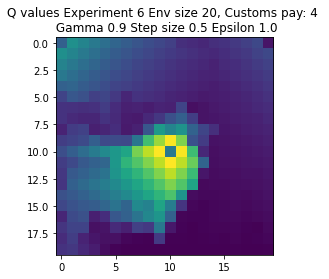

Expr:7 Eps:0 RunnAReward:4.0 Reward:82 Timesteps:800 GotPack:False Utiltime:645 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-220.0 Reward:-540 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-985.0 Reward:-652 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-639.0 Reward:-610 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-320.0 Reward:-220 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-38.0 Reward:500 Timesteps:400 GotPack:False Utiltime:311 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-501.0 Reward:562 Timesteps:400 GotPack:False Utiltime:192 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:-1337.0 Reward:-5109 Timesteps:6685 GotPack:True Utiltime:3653 Customstime:5005 Money:5
Expr:7 Eps:160 RunnAReward:-820.0 Reward:-735 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:7 Eps:180 RunnAReward:195.0 Rewa

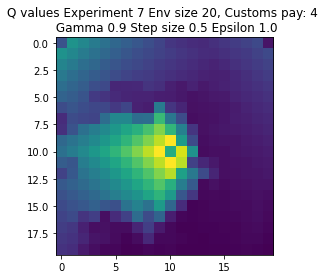

Expr:8 Eps:0 RunnAReward:-54.0 Reward:-1073 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:20 RunnAReward:-691.0 Reward:-428 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-2004.0 Reward:-464 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-644.0 Reward:-494 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-999.0 Reward:-3440 Timesteps:4980 GotPack:True Utiltime:3251 Customstime:3362 Money:4
Expr:8 Eps:100 RunnAReward:-451.0 Reward:-308 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:32.0 Reward:-466 Timesteps:800 GotPack:False Utiltime:101 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:-619.0 Reward:-297 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:160 RunnAReward:-477.0 Reward:479 Timesteps:400 GotPack:False Utiltime:49 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:317.0 Re

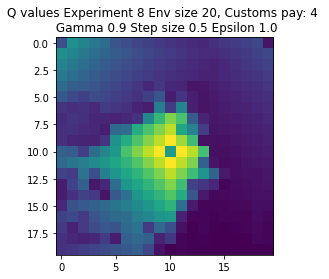

Expr:9 Eps:0 RunnAReward:-29.0 Reward:-573 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-695.0 Reward:-603 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-1225.0 Reward:-997 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-673.0 Reward:-568 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-740.0 Reward:-256 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-603.0 Reward:-1112 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:9 Eps:120 RunnAReward:-810.0 Reward:-269 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-480.0 Reward:-629 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:-171.0 Reward:477 Timesteps:400 GotPack:False Utiltime:194 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:-376.0 Reward:

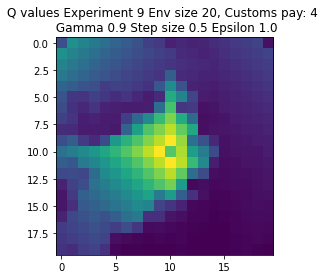

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.9 Step size 0.8 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-66.0 Reward:-1316 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-1581.0 Reward:1123 Timesteps:1998 GotPack:True Utiltime:1527 Customstime:1876 Money:3
Expr:0 Eps:40 RunnAReward:-594.0 Reward:407 Timesteps:800 GotPack:False Utiltime:591 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-387.0 Reward:597 Timesteps:800 GotPack:False Utiltime:274 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:98.0 Reward:-453 Timesteps:1200 GotPack:False Utiltime:61 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:302.0 Reward:2810 Timesteps:883 GotPack:True Utiltime:590 Customstime:661 Money:5
Expr:0 Eps:120 RunnAReward:975.0 Reward:3034 Timesteps:669 GotPack:True Utiltim

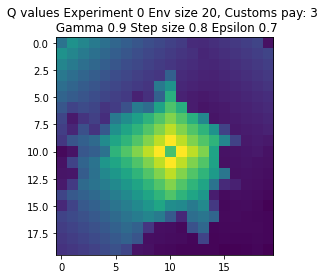

Expr:1 Eps:0 RunnAReward:-54.0 Reward:-1079 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-1362.0 Reward:-5189 Timesteps:6384 GotPack:True Utiltime:6008 Customstime:6209 Money:4
Expr:1 Eps:40 RunnAReward:-1040.0 Reward:547 Timesteps:800 GotPack:False Utiltime:546 Customstime:0 Money:1
Expr:1 Eps:60 RunnAReward:8.0 Reward:400 Timesteps:800 GotPack:False Utiltime:572 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-16.0 Reward:14 Timesteps:1200 GotPack:False Utiltime:167 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:265.0 Reward:-176 Timesteps:1200 GotPack:False Utiltime:159 Customstime:0 Money:2
Expr:1 Eps:120 RunnAReward:478.0 Reward:485 Timesteps:800 GotPack:False Utiltime:41 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:657.0 Reward:2261 Timesteps:1464 GotPack:True Utiltime:932 Customstime:1271 Money:3
Expr:1 Eps:160 RunnAReward:1078.0 Reward:2120 Timesteps:1454 GotPack:True Utiltime:100 Customstime:1289 Money:3
Expr:1 Eps:180 RunnARewar

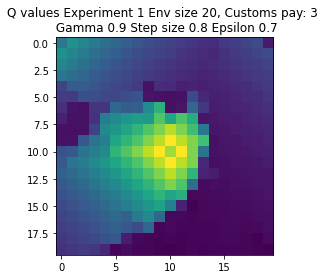

Expr:2 Eps:0 RunnAReward:-55.0 Reward:-1087 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-1995.0 Reward:-682 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:2 Eps:40 RunnAReward:-767.0 Reward:-460 Timesteps:1200 GotPack:False Utiltime:14 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-653.0 Reward:-1509 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:370.0 Reward:2114 Timesteps:1228 GotPack:True Utiltime:236 Customstime:1056 Money:3
Expr:2 Eps:100 RunnAReward:545.0 Reward:-1374 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:480.0 Reward:2200 Timesteps:1162 GotPack:True Utiltime:533 Customstime:890 Money:4
Expr:2 Eps:140 RunnAReward:1283.0 Reward:1375 Timesteps:1960 GotPack:True Utiltime:1821 Customstime:1899 Money:3
Expr:2 Eps:160 RunnAReward:209.0 Reward:-134 Timesteps:1200 GotPack:False Utiltime:793 Customstime:0 Money:2
Expr:2 Eps:180 RunnARe

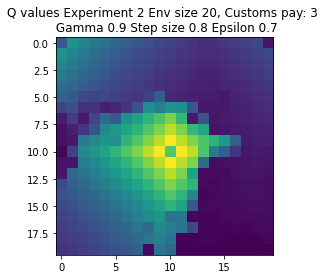

Expr:3 Eps:0 RunnAReward:64.0 Reward:1294 Timesteps:1620 GotPack:True Utiltime:913 Customstime:1019 Money:5
Expr:3 Eps:20 RunnAReward:-2356.0 Reward:-440 Timesteps:3284 GotPack:True Utiltime:2510 Customstime:3014 Money:3
Expr:3 Eps:40 RunnAReward:-392.0 Reward:1260 Timesteps:2006 GotPack:True Utiltime:1035 Customstime:1745 Money:3
Expr:3 Eps:60 RunnAReward:-111.0 Reward:-41 Timesteps:800 GotPack:False Utiltime:266 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-102.0 Reward:75 Timesteps:800 GotPack:False Utiltime:318 Customstime:0 Money:1
Expr:3 Eps:100 RunnAReward:279.0 Reward:-367 Timesteps:1200 GotPack:False Utiltime:213 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:788.0 Reward:358 Timesteps:800 GotPack:False Utiltime:182 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:1055.0 Reward:628 Timesteps:800 GotPack:False Utiltime:133 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:502.0 Reward:538 Timesteps:800 GotPack:False Utiltime:108 Customstime:0 Money:0
Expr:3 Eps:180 RunnARew

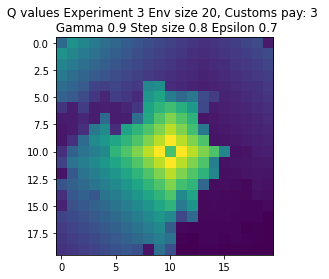

Expr:4 Eps:0 RunnAReward:-69.0 Reward:-1379 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1534.0 Reward:-662 Timesteps:3370 GotPack:True Utiltime:2235 Customstime:2315 Money:5
Expr:4 Eps:40 RunnAReward:-1369.0 Reward:130 Timesteps:2556 GotPack:True Utiltime:1662 Customstime:2442 Money:5
Expr:4 Eps:60 RunnAReward:-541.0 Reward:-6210 Timesteps:6931 GotPack:True Utiltime:9 Customstime:2717 Money:3
Expr:4 Eps:80 RunnAReward:-33.0 Reward:-5320 Timesteps:6889 GotPack:True Utiltime:3340 Customstime:3554 Money:4
Expr:4 Eps:100 RunnAReward:68.0 Reward:1718 Timesteps:1752 GotPack:True Utiltime:1570 Customstime:1669 Money:3
Expr:4 Eps:120 RunnAReward:683.0 Reward:-376 Timesteps:1200 GotPack:False Utiltime:66 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:905.0 Reward:-204 Timesteps:1200 GotPack:False Utiltime:75 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:1004.0 Reward:3037 Timesteps:726 GotPack:True Utiltime:136 Customstime:524 Money:5
Expr:4 Eps:

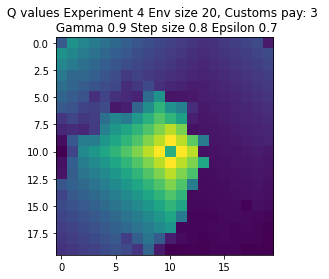

Expr:5 Eps:0 RunnAReward:-68.0 Reward:-1357 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:20 RunnAReward:-1115.0 Reward:-8399 Timesteps:8719 GotPack:True Utiltime:3433 Customstime:3572 Money:5
Expr:5 Eps:40 RunnAReward:-1225.0 Reward:1588 Timesteps:1740 GotPack:True Utiltime:606 Customstime:913 Money:3
Expr:5 Eps:60 RunnAReward:-544.0 Reward:549 Timesteps:2469 GotPack:True Utiltime:83 Customstime:736 Money:3
Expr:5 Eps:80 RunnAReward:222.0 Reward:193 Timesteps:800 GotPack:False Utiltime:54 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:720.0 Reward:608 Timesteps:800 GotPack:False Utiltime:97 Customstime:0 Money:2
Expr:5 Eps:120 RunnAReward:906.0 Reward:2677 Timesteps:1034 GotPack:True Utiltime:110 Customstime:724 Money:3
Expr:5 Eps:140 RunnAReward:645.0 Reward:-290 Timesteps:1200 GotPack:False Utiltime:111 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:1040.0 Reward:-139 Timesteps:800 GotPack:False Utiltime:130 Customstime:0 Money:0
Expr:5 Eps:180 RunnARe

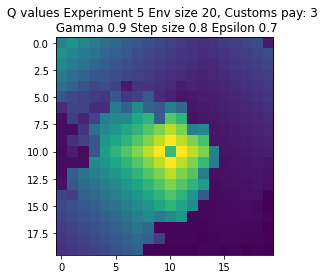

Expr:6 Eps:0 RunnAReward:5.0 Reward:113 Timesteps:800 GotPack:False Utiltime:183 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-1499.0 Reward:356 Timesteps:800 GotPack:False Utiltime:237 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-737.0 Reward:623 Timesteps:800 GotPack:False Utiltime:391 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-741.0 Reward:490 Timesteps:800 GotPack:False Utiltime:258 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:342.0 Reward:226 Timesteps:800 GotPack:False Utiltime:204 Customstime:0 Money:1
Expr:6 Eps:100 RunnAReward:443.0 Reward:759 Timesteps:2706 GotPack:True Utiltime:396 Customstime:1015 Money:5
Expr:6 Eps:120 RunnAReward:805.0 Reward:599 Timesteps:800 GotPack:False Utiltime:55 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:640.0 Reward:1506 Timesteps:1774 GotPack:True Utiltime:1283 Customstime:1462 Money:3
Expr:6 Eps:160 RunnAReward:824.0 Reward:543 Timesteps:800 GotPack:False Utiltime:32 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:768.0 Re

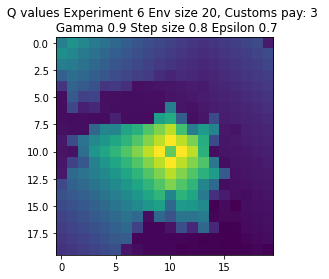

Expr:7 Eps:0 RunnAReward:-60.0 Reward:-1186 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-2212.0 Reward:-4621 Timesteps:6144 GotPack:True Utiltime:2538 Customstime:3001 Money:3
Expr:7 Eps:40 RunnAReward:-724.0 Reward:83 Timesteps:800 GotPack:False Utiltime:98 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-280.0 Reward:53 Timesteps:800 GotPack:False Utiltime:89 Customstime:0 Money:1
Expr:7 Eps:80 RunnAReward:226.0 Reward:98 Timesteps:800 GotPack:False Utiltime:510 Customstime:0 Money:1
Expr:7 Eps:100 RunnAReward:209.0 Reward:-623 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:7 Eps:120 RunnAReward:687.0 Reward:1163 Timesteps:2199 GotPack:True Utiltime:1340 Customstime:1775 Money:3
Expr:7 Eps:140 RunnAReward:538.0 Reward:-278 Timesteps:1200 GotPack:False Utiltime:11 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:882.0 Reward:274 Timesteps:2776 GotPack:True Utiltime:2141 Customstime:2517 Money:5
Expr:7 Eps:180 RunnAReward:8

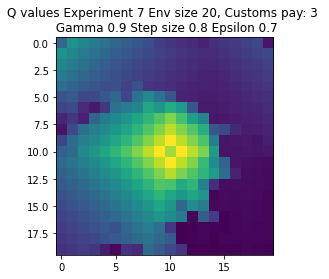

Expr:8 Eps:0 RunnAReward:-73.0 Reward:-1452 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:20 RunnAReward:-1489.0 Reward:93 Timesteps:800 GotPack:False Utiltime:33 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-1160.0 Reward:-561 Timesteps:1200 GotPack:False Utiltime:45 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-1035.0 Reward:-520 Timesteps:1200 GotPack:False Utiltime:213 Customstime:0 Money:2
Expr:8 Eps:80 RunnAReward:36.0 Reward:-76 Timesteps:3034 GotPack:True Utiltime:678 Customstime:1763 Money:4
Expr:8 Eps:100 RunnAReward:649.0 Reward:431 Timesteps:800 GotPack:False Utiltime:29 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:442.0 Reward:625 Timesteps:800 GotPack:False Utiltime:322 Customstime:0 Money:2
Expr:8 Eps:140 RunnAReward:830.0 Reward:2697 Timesteps:750 GotPack:True Utiltime:89 Customstime:656 Money:3
Expr:8 Eps:160 RunnAReward:711.0 Reward:2033 Timesteps:1250 GotPack:True Utiltime:24 Customstime:968 Money:4
Expr:8 Eps:180 RunnAReward:1251

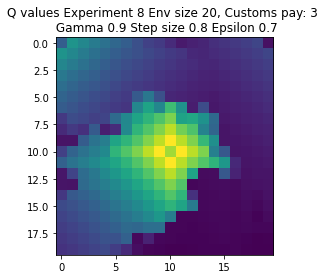

Expr:9 Eps:0 RunnAReward:-134.0 Reward:-2664 Timesteps:4631 GotPack:True Utiltime:1403 Customstime:2694 Money:3
Expr:9 Eps:20 RunnAReward:-2660.0 Reward:-602 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-1056.0 Reward:-905 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-312.0 Reward:526 Timesteps:800 GotPack:False Utiltime:251 Customstime:0 Money:1
Expr:9 Eps:80 RunnAReward:355.0 Reward:697 Timesteps:800 GotPack:False Utiltime:637 Customstime:0 Money:1
Expr:9 Eps:100 RunnAReward:469.0 Reward:-89 Timesteps:1200 GotPack:False Utiltime:46 Customstime:0 Money:2
Expr:9 Eps:120 RunnAReward:451.0 Reward:290 Timesteps:800 GotPack:False Utiltime:236 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:759.0 Reward:1863 Timesteps:1739 GotPack:True Utiltime:110 Customstime:815 Money:5
Expr:9 Eps:160 RunnAReward:1068.0 Reward:3569 Timesteps:365 GotPack:True Utiltime:153 Customstime:267 Money:3
Expr:9 Eps:180 RunnAReward:

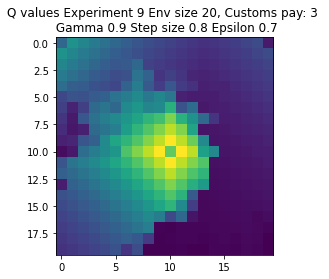

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.9 Step size 0.8 Epsilon 0.7
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-9.0 Reward:-179 Timesteps:800 GotPack:False Utiltime:467 Customstime:0 Money:3
Expr:0 Eps:20 RunnAReward:-797.0 Reward:932 Timesteps:1921 GotPack:True Utiltime:639 Customstime:729 Money:4
Expr:0 Eps:40 RunnAReward:-233.0 Reward:132 Timesteps:800 GotPack:False Utiltime:120 Customstime:0 Money:3
Expr:0 Eps:60 RunnAReward:-569.0 Reward:-131 Timesteps:800 GotPack:False Utiltime:58 Customstime:0 Money:2
Expr:0 Eps:80 RunnAReward:-368.0 Reward:-708 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-75.0 Reward:1270 Timesteps:2193 GotPack:True Utiltime:620 Customstime:1470 Money:5
Expr:0 Eps:120 RunnAReward:211.0 Reward:837 Timesteps:2300 GotPack:True Utiltime:8

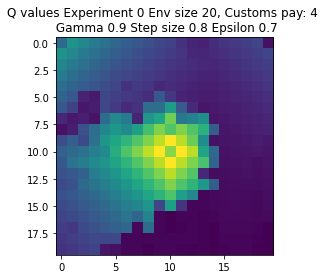

Expr:1 Eps:0 RunnAReward:-26.0 Reward:-508 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-640.0 Reward:-8138 Timesteps:9235 GotPack:True Utiltime:5163 Customstime:5432 Money:4
Expr:1 Eps:40 RunnAReward:-1384.0 Reward:-604 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-213.0 Reward:-1329 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:80 RunnAReward:-42.0 Reward:-216 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:160.0 Reward:751 Timesteps:2615 GotPack:True Utiltime:1463 Customstime:1531 Money:5
Expr:1 Eps:120 RunnAReward:406.0 Reward:545 Timesteps:800 GotPack:False Utiltime:338 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:883.0 Reward:2317 Timesteps:1275 GotPack:True Utiltime:1123 Customstime:1215 Money:5
Expr:1 Eps:160 RunnAReward:901.0 Reward:-94 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:41

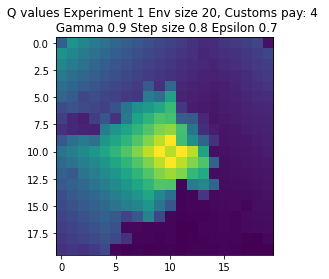

Expr:2 Eps:0 RunnAReward:-47.0 Reward:-929 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:20 RunnAReward:-810.0 Reward:-522 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:40 RunnAReward:-1043.0 Reward:-652 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:60 RunnAReward:-631.0 Reward:-216 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-171.0 Reward:-1163 Timesteps:3447 GotPack:True Utiltime:2908 Customstime:3049 Money:4
Expr:2 Eps:100 RunnAReward:287.0 Reward:154 Timesteps:2717 GotPack:True Utiltime:15 Customstime:571 Money:5
Expr:2 Eps:120 RunnAReward:142.0 Reward:-157 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:249.0 Reward:-931 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:160 RunnAReward:772.0 Reward:313 Timesteps:800 GotPack:False Utiltime:51 Customstime:0 Money:2
Expr:2 Eps:180 RunnAReward:848.0 Rewar

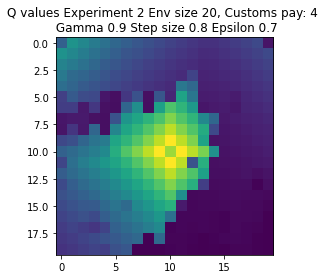

Expr:3 Eps:0 RunnAReward:-33.0 Reward:-645 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-1401.0 Reward:-1525 Timesteps:3563 GotPack:True Utiltime:1254 Customstime:1361 Money:5
Expr:3 Eps:40 RunnAReward:-711.0 Reward:-515 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-216.0 Reward:1092 Timesteps:400 GotPack:False Utiltime:308 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-27.0 Reward:-636 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:3 Eps:100 RunnAReward:139.0 Reward:692 Timesteps:400 GotPack:False Utiltime:119 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:550.0 Reward:1482 Timesteps:1579 GotPack:True Utiltime:12 Customstime:987 Money:4
Expr:3 Eps:140 RunnAReward:546.0 Reward:-289 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:839.0 Reward:198 Timesteps:800 GotPack:False Utiltime:152 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:1054.0 

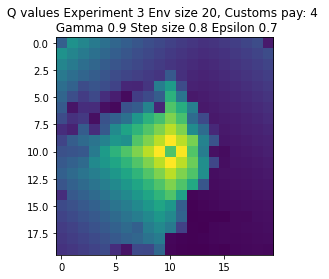

Expr:4 Eps:0 RunnAReward:-13.0 Reward:-254 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-767.0 Reward:-645 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:40 RunnAReward:197.0 Reward:977 Timesteps:400 GotPack:False Utiltime:109 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-395.0 Reward:-867 Timesteps:3604 GotPack:True Utiltime:1414 Customstime:2777 Money:5
Expr:4 Eps:80 RunnAReward:-3.0 Reward:337 Timesteps:800 GotPack:False Utiltime:268 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:309.0 Reward:610 Timesteps:400 GotPack:False Utiltime:214 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-248.0 Reward:-1082 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:140 RunnAReward:578.0 Reward:-515 Timesteps:3172 GotPack:True Utiltime:181 Customstime:920 Money:4
Expr:4 Eps:160 RunnAReward:433.0 Reward:595 Timesteps:400 GotPack:False Utiltime:65 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:651.0 Rew

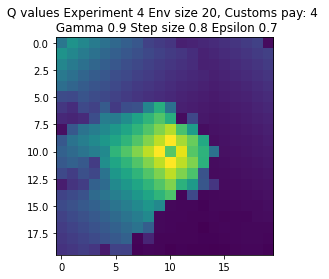

Expr:5 Eps:0 RunnAReward:-35.0 Reward:-686 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-439.0 Reward:-112 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-731.0 Reward:-55 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:60 RunnAReward:-420.0 Reward:532 Timesteps:800 GotPack:False Utiltime:786 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:-173.0 Reward:-1355 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:-430.0 Reward:-689 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:5 Eps:120 RunnAReward:269.0 Reward:1004 Timesteps:400 GotPack:False Utiltime:178 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:900.0 Reward:-184 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:160 RunnAReward:416.0 Reward:2886 Timesteps:891 GotPack:True Utiltime:174 Customstime:728 Money:4
Expr:5 Eps:180 RunnAReward:873.0 Reward:

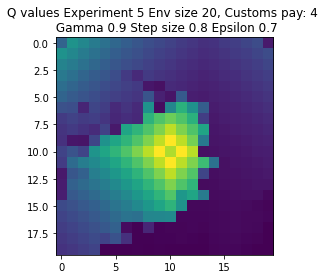

Expr:6 Eps:0 RunnAReward:-55.0 Reward:-1083 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-1002.0 Reward:-534 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-1627.0 Reward:-4537 Timesteps:6582 GotPack:True Utiltime:5693 Customstime:6302 Money:5
Expr:6 Eps:60 RunnAReward:-207.0 Reward:1543 Timesteps:1591 GotPack:True Utiltime:550 Customstime:746 Money:5
Expr:6 Eps:80 RunnAReward:209.0 Reward:960 Timesteps:400 GotPack:False Utiltime:247 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:233.0 Reward:82 Timesteps:1200 GotPack:False Utiltime:52 Customstime:0 Money:3
Expr:6 Eps:120 RunnAReward:159.0 Reward:2616 Timesteps:997 GotPack:True Utiltime:83 Customstime:456 Money:5
Expr:6 Eps:140 RunnAReward:900.0 Reward:1788 Timesteps:1773 GotPack:True Utiltime:202 Customstime:1077 Money:5
Expr:6 Eps:160 RunnAReward:866.0 Reward:528 Timesteps:800 GotPack:False Utiltime:92 Customstime:0 Money:2
Expr:6 Eps:180 RunnAReward:

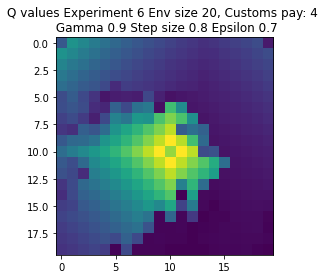

Expr:7 Eps:0 RunnAReward:-35.0 Reward:-683 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-691.0 Reward:-1214 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:40 RunnAReward:-174.0 Reward:1803 Timesteps:1292 GotPack:True Utiltime:106 Customstime:805 Money:4
Expr:7 Eps:60 RunnAReward:-717.0 Reward:-5336 Timesteps:7175 GotPack:True Utiltime:1744 Customstime:2139 Money:5
Expr:7 Eps:80 RunnAReward:-74.0 Reward:1006 Timesteps:400 GotPack:False Utiltime:114 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:303.0 Reward:1001 Timesteps:400 GotPack:False Utiltime:31 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:241.0 Reward:699 Timesteps:400 GotPack:False Utiltime:143 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:171.0 Reward:-792 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:901.0 Reward:422 Timesteps:800 GotPack:False Utiltime:261 Customstime:0 Money:2
Expr:7 Eps:180 RunnAReward:783.0

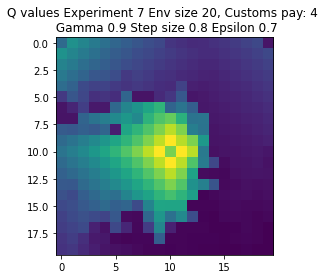

Expr:8 Eps:0 RunnAReward:-3.0 Reward:-54 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-831.0 Reward:-140 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-1194.0 Reward:-2178 Timesteps:4439 GotPack:True Utiltime:2923 Customstime:3682 Money:4
Expr:8 Eps:60 RunnAReward:-338.0 Reward:469 Timesteps:2662 GotPack:True Utiltime:921 Customstime:1486 Money:4
Expr:8 Eps:80 RunnAReward:129.0 Reward:1023 Timesteps:400 GotPack:False Utiltime:293 Customstime:0 Money:0
Expr:8 Eps:100 RunnAReward:258.0 Reward:-217 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:535.0 Reward:-213 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:654.0 Reward:299 Timesteps:800 GotPack:False Utiltime:55 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:554.0 Reward:1118 Timesteps:400 GotPack:False Utiltime:66 Customstime:0 Money:0
Expr:8 Eps:180 RunnAReward:1169.0 Re

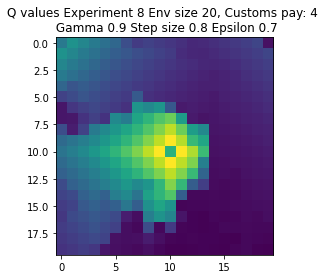

Expr:9 Eps:0 RunnAReward:-63.0 Reward:-1257 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:9 Eps:20 RunnAReward:-911.0 Reward:-5888 Timesteps:7239 GotPack:True Utiltime:4083 Customstime:4312 Money:5
Expr:9 Eps:40 RunnAReward:-1118.0 Reward:-1447 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:59.0 Reward:588 Timesteps:400 GotPack:False Utiltime:112 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:77.0 Reward:625 Timesteps:400 GotPack:False Utiltime:46 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:364.0 Reward:780 Timesteps:400 GotPack:False Utiltime:106 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:549.0 Reward:-259 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:222.0 Reward:-752 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:9 Eps:160 RunnAReward:813.0 Reward:1040 Timesteps:400 GotPack:False Utiltime:266 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:855.0 Rewa

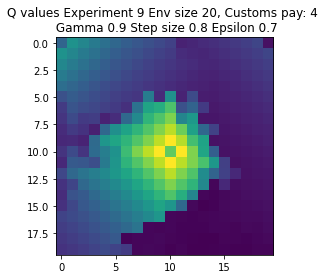

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.9 Step size 0.8 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-53.0 Reward:-1059 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-1772.0 Reward:-5 Timesteps:800 GotPack:False Utiltime:364 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-1370.0 Reward:162 Timesteps:800 GotPack:False Utiltime:538 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-726.0 Reward:1721 Timesteps:1143 GotPack:True Utiltime:231 Customstime:1049 Money:3
Expr:0 Eps:80 RunnAReward:-463.0 Reward:-6314 Timesteps:7291 GotPack:True Utiltime:6446 Customstime:6626 Money:4
Expr:0 Eps:100 RunnAReward:-498.0 Reward:2379 Timesteps:735 GotPack:True Utiltime:36 Customstime:431 Money:3
Expr:0 Eps:120 RunnAReward:146.0 Reward:619 Timesteps:800 GotPack:False Ut

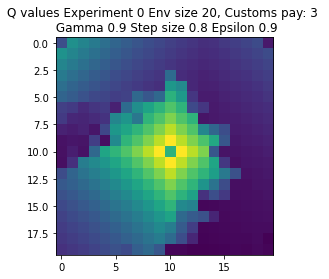

Expr:1 Eps:0 RunnAReward:-47.0 Reward:-927 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-1860.0 Reward:-4914 Timesteps:6170 GotPack:True Utiltime:3629 Customstime:3842 Money:5
Expr:1 Eps:40 RunnAReward:-1073.0 Reward:583 Timesteps:800 GotPack:False Utiltime:26 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-1010.0 Reward:338 Timesteps:800 GotPack:False Utiltime:289 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-308.0 Reward:-713 Timesteps:1600 GotPack:False Utiltime:1507 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:-231.0 Reward:470 Timesteps:800 GotPack:False Utiltime:98 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:345.0 Reward:-450 Timesteps:1200 GotPack:False Utiltime:141 Customstime:0 Money:2
Expr:1 Eps:140 RunnAReward:-87.0 Reward:112 Timesteps:800 GotPack:False Utiltime:71 Customstime:0 Money:1
Expr:1 Eps:160 RunnAReward:710.0 Reward:510 Timesteps:800 GotPack:False Utiltime:73 Customstime:0 Money:0
Expr:1 Eps:180 RunnAReward:43

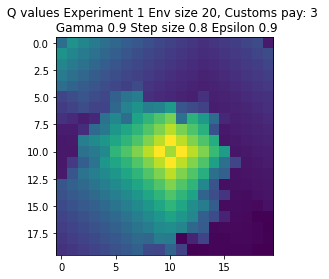

Expr:2 Eps:0 RunnAReward:-660.0 Reward:-13189 Timesteps:12000 GotPack:False Utiltime:4412 Customstime:4776 Money:5
Expr:2 Eps:20 RunnAReward:-2432.0 Reward:-6437 Timesteps:7570 GotPack:True Utiltime:963 Customstime:2769 Money:3
Expr:2 Eps:40 RunnAReward:-1110.0 Reward:1088 Timesteps:1868 GotPack:True Utiltime:531 Customstime:887 Money:3
Expr:2 Eps:60 RunnAReward:-1307.0 Reward:-904 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-597.0 Reward:-3731 Timesteps:5738 GotPack:True Utiltime:1566 Customstime:2249 Money:5
Expr:2 Eps:100 RunnAReward:-66.0 Reward:-585 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:120 RunnAReward:-361.0 Reward:268 Timesteps:800 GotPack:False Utiltime:364 Customstime:0 Money:1
Expr:2 Eps:140 RunnAReward:157.0 Reward:1717 Timesteps:1683 GotPack:True Utiltime:55 Customstime:1640 Money:5
Expr:2 Eps:160 RunnAReward:337.0 Reward:-305 Timesteps:1200 GotPack:False Utiltime:28 Customstime:0 Money:2
Expr:2 Ep

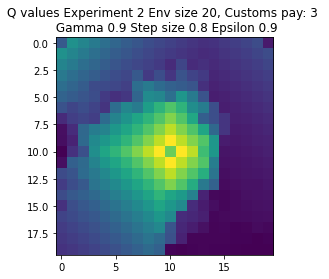

Expr:3 Eps:0 RunnAReward:-46.0 Reward:-908 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-2019.0 Reward:-1093 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-882.0 Reward:-896 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-276.0 Reward:433 Timesteps:800 GotPack:False Utiltime:651 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-186.0 Reward:491 Timesteps:800 GotPack:False Utiltime:754 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:36.0 Reward:-224 Timesteps:800 GotPack:False Utiltime:125 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-189.0 Reward:-4092 Timesteps:5727 GotPack:True Utiltime:2872 Customstime:3245 Money:5
Expr:3 Eps:140 RunnAReward:181.0 Reward:475 Timesteps:800 GotPack:False Utiltime:112 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:-18.0 Reward:201 Timesteps:800 GotPack:False Utiltime:247 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:608.0 

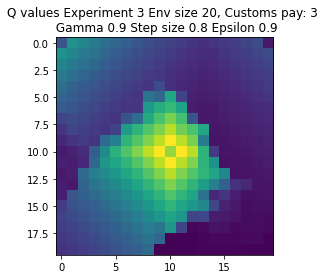

Expr:4 Eps:0 RunnAReward:-10.0 Reward:-190 Timesteps:800 GotPack:False Utiltime:414 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-2178.0 Reward:-795 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:4 Eps:40 RunnAReward:-1381.0 Reward:1157 Timesteps:1668 GotPack:True Utiltime:44 Customstime:982 Money:5
Expr:4 Eps:60 RunnAReward:-1362.0 Reward:-850 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-452.0 Reward:453 Timesteps:800 GotPack:False Utiltime:224 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-183.0 Reward:532 Timesteps:800 GotPack:False Utiltime:39 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-265.0 Reward:1436 Timesteps:1810 GotPack:True Utiltime:1118 Customstime:1738 Money:5
Expr:4 Eps:140 RunnAReward:166.0 Reward:55 Timesteps:800 GotPack:False Utiltime:156 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:421.0 Reward:347 Timesteps:800 GotPack:False Utiltime:731 Customstime:0 Money:0
Expr:4 Eps:180 RunnAReward:477

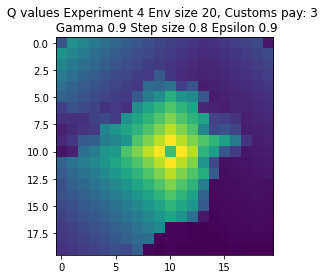

Expr:5 Eps:0 RunnAReward:-53.0 Reward:-1052 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-762.0 Reward:-563 Timesteps:3293 GotPack:True Utiltime:163 Customstime:2985 Money:3
Expr:5 Eps:40 RunnAReward:-1150.0 Reward:422 Timesteps:800 GotPack:False Utiltime:621 Customstime:0 Money:1
Expr:5 Eps:60 RunnAReward:-879.0 Reward:865 Timesteps:2249 GotPack:True Utiltime:1298 Customstime:2045 Money:3
Expr:5 Eps:80 RunnAReward:-550.0 Reward:-1242 Timesteps:3817 GotPack:True Utiltime:2250 Customstime:2677 Money:3
Expr:5 Eps:100 RunnAReward:-321.0 Reward:581 Timesteps:800 GotPack:False Utiltime:130 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:18.0 Reward:562 Timesteps:800 GotPack:False Utiltime:590 Customstime:0 Money:0
Expr:5 Eps:140 RunnAReward:655.0 Reward:364 Timesteps:2507 GotPack:True Utiltime:219 Customstime:921 Money:3
Expr:5 Eps:160 RunnAReward:-140.0 Reward:320 Timesteps:800 GotPack:False Utiltime:160 Customstime:0 Money:2
Expr:5 Eps:180 RunnAR

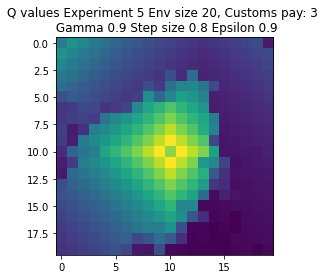

Expr:6 Eps:0 RunnAReward:-29.0 Reward:-578 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-603.0 Reward:-1007 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:40 RunnAReward:-1555.0 Reward:-736 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-725.0 Reward:-4850 Timesteps:5999 GotPack:True Utiltime:1337 Customstime:1815 Money:4
Expr:6 Eps:80 RunnAReward:-1086.0 Reward:-1309 Timesteps:1600 GotPack:False Utiltime:833 Customstime:0 Money:2
Expr:6 Eps:100 RunnAReward:-546.0 Reward:-526 Timesteps:3200 GotPack:True Utiltime:133 Customstime:763 Money:3
Expr:6 Eps:120 RunnAReward:-255.0 Reward:2324 Timesteps:1078 GotPack:True Utiltime:270 Customstime:471 Money:3
Expr:6 Eps:140 RunnAReward:-144.0 Reward:-1187 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:160 RunnAReward:-201.0 Reward:489 Timesteps:800 GotPack:False Utiltime:84 Customstime:0 Money:0
Expr:6 Eps:180 RunnA

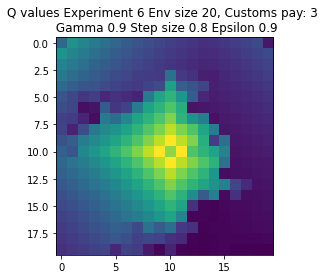

Expr:7 Eps:0 RunnAReward:-172.0 Reward:-3423 Timesteps:5192 GotPack:True Utiltime:3467 Customstime:3602 Money:4
Expr:7 Eps:20 RunnAReward:-3162.0 Reward:-1529 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:40 RunnAReward:-1222.0 Reward:-199 Timesteps:1200 GotPack:False Utiltime:663 Customstime:0 Money:2
Expr:7 Eps:60 RunnAReward:-1189.0 Reward:-1068 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:7 Eps:80 RunnAReward:-623.0 Reward:-517 Timesteps:3046 GotPack:True Utiltime:939 Customstime:1264 Money:5
Expr:7 Eps:100 RunnAReward:82.0 Reward:2102 Timesteps:1076 GotPack:True Utiltime:23 Customstime:766 Money:5
Expr:7 Eps:120 RunnAReward:-258.0 Reward:-587 Timesteps:1200 GotPack:False Utiltime:281 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:366.0 Reward:577 Timesteps:800 GotPack:False Utiltime:137 Customstime:0 Money:2
Expr:7 Eps:160 RunnAReward:332.0 Reward:1283 Timesteps:1630 GotPack:True Utiltime:1136 Customstime:1574 Money:3
Expr:7 Eps:18

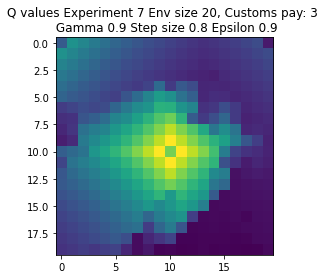

Expr:8 Eps:0 RunnAReward:-64.0 Reward:-1269 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-3256.0 Reward:-1211 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-1034.0 Reward:-627 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:60 RunnAReward:-1196.0 Reward:483 Timesteps:800 GotPack:False Utiltime:224 Customstime:0 Money:0
Expr:8 Eps:80 RunnAReward:-299.0 Reward:-2678 Timesteps:4879 GotPack:True Utiltime:1937 Customstime:2094 Money:4
Expr:8 Eps:100 RunnAReward:-43.0 Reward:478 Timesteps:800 GotPack:False Utiltime:112 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:436.0 Reward:508 Timesteps:800 GotPack:False Utiltime:298 Customstime:0 Money:1
Expr:8 Eps:140 RunnAReward:183.0 Reward:179 Timesteps:800 GotPack:False Utiltime:547 Customstime:0 Money:1
Expr:8 Eps:160 RunnAReward:628.0 Reward:3218 Timesteps:568 GotPack:True Utiltime:155 Customstime:315 Money:3
Expr:8 Eps:180 RunnAReward:8

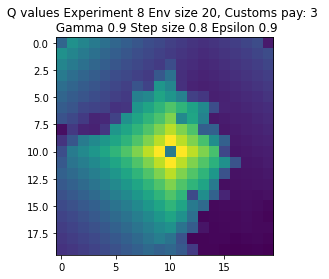

Expr:9 Eps:0 RunnAReward:-65.0 Reward:-1285 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-2092.0 Reward:-646 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-806.0 Reward:539 Timesteps:800 GotPack:False Utiltime:501 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-2046.0 Reward:-4370 Timesteps:5805 GotPack:True Utiltime:201 Customstime:831 Money:3
Expr:9 Eps:80 RunnAReward:-683.0 Reward:-335 Timesteps:3127 GotPack:True Utiltime:609 Customstime:1991 Money:5
Expr:9 Eps:100 RunnAReward:-800.0 Reward:1156 Timesteps:2145 GotPack:True Utiltime:1161 Customstime:1266 Money:3
Expr:9 Eps:120 RunnAReward:385.0 Reward:2404 Timesteps:1056 GotPack:True Utiltime:179 Customstime:941 Money:5
Expr:9 Eps:140 RunnAReward:346.0 Reward:-36 Timesteps:1200 GotPack:False Utiltime:77 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:323.0 Reward:-900 Timesteps:1600 GotPack:False Utiltime:124 Customstime:0 Money:2
Expr:9 Eps:180 Run

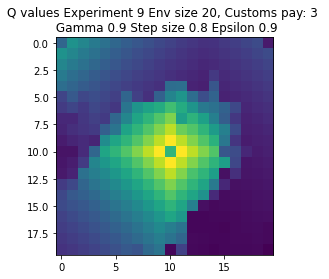

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.9 Step size 0.8 Epsilon 0.9
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-37.0 Reward:-732 Timesteps:1200 GotPack:False Utiltime:639 Customstime:0 Money:2
Expr:0 Eps:20 RunnAReward:-432.0 Reward:689 Timesteps:400 GotPack:False Utiltime:305 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-1567.0 Reward:-624 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-522.0 Reward:647 Timesteps:400 GotPack:False Utiltime:167 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-528.0 Reward:-100 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:100 RunnAReward:-462.0 Reward:268 Timesteps:800 GotPack:False Utiltime:451 Customstime:0 Money:2
Expr:0 Eps:120 RunnAReward:88.0 Reward:1826 Timesteps:1124 GotPack:True Utiltime:182 

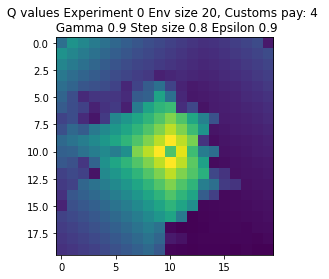

Expr:1 Eps:0 RunnAReward:-31.0 Reward:-616 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-1381.0 Reward:-664 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-675.0 Reward:-181 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-1014.0 Reward:-1426 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:80 RunnAReward:-910.0 Reward:-10800 Timesteps:10659 GotPack:True Utiltime:3868 Customstime:4412 Money:5
Expr:1 Eps:100 RunnAReward:-609.0 Reward:-704 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:1 Eps:120 RunnAReward:199.0 Reward:672 Timesteps:400 GotPack:False Utiltime:111 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:46.0 Reward:162 Timesteps:800 GotPack:False Utiltime:17 Customstime:0 Money:2
Expr:1 Eps:160 RunnAReward:387.0 Reward:439 Timesteps:2101 GotPack:True Utiltime:271 Customstime:1114 Money:5
Expr:1 Eps:180 RunnAReward:378.

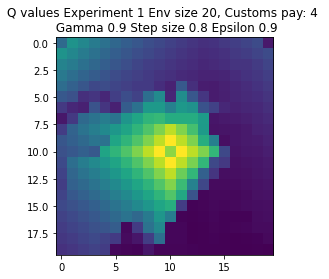

Expr:2 Eps:0 RunnAReward:-34.0 Reward:-662 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:20 RunnAReward:-1697.0 Reward:-1187 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:40 RunnAReward:-729.0 Reward:-66 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-1163.0 Reward:-104 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-400.0 Reward:701 Timesteps:400 GotPack:False Utiltime:135 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:221.0 Reward:-24 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:171.0 Reward:591 Timesteps:400 GotPack:False Utiltime:293 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:232.0 Reward:202 Timesteps:2729 GotPack:True Utiltime:107 Customstime:1504 Money:5
Expr:2 Eps:160 RunnAReward:-14.0 Reward:-2796 Timesteps:4831 GotPack:True Utiltime:96 Customstime:1183 Money:5
Expr:2 Eps:180 RunnAReward:117.0 Rew

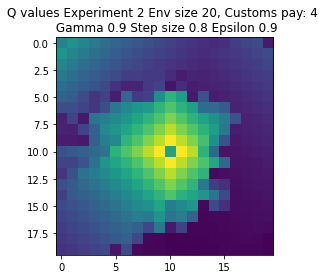

Expr:3 Eps:0 RunnAReward:-19.0 Reward:-364 Timesteps:2741 GotPack:True Utiltime:1373 Customstime:2543 Money:4
Expr:3 Eps:20 RunnAReward:-424.0 Reward:-477 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-245.0 Reward:148 Timesteps:800 GotPack:False Utiltime:136 Customstime:0 Money:2
Expr:3 Eps:60 RunnAReward:-1237.0 Reward:-673 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-233.0 Reward:-194 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-511.0 Reward:-41 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:196.0 Reward:440 Timesteps:400 GotPack:False Utiltime:237 Customstime:0 Money:0
Expr:3 Eps:140 RunnAReward:276.0 Reward:913 Timesteps:400 GotPack:False Utiltime:250 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:262.0 Reward:-35 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:180 RunnAReward:789.0 Reward

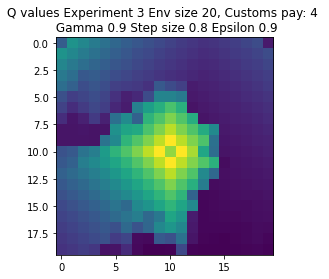

Expr:4 Eps:0 RunnAReward:46.0 Reward:934 Timesteps:400 GotPack:False Utiltime:1 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-526.0 Reward:-424 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-904.0 Reward:-596 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-713.0 Reward:-180 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-622.0 Reward:-1325 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:100 RunnAReward:-98.0 Reward:-167 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-106.0 Reward:-84 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:140 RunnAReward:286.0 Reward:-391 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:286.0 Reward:2374 Timesteps:1273 GotPack:True Utiltime:234 Customstime:745 Money:4
Expr:4 Eps:180 RunnAReward:721.0 Reward:626 T

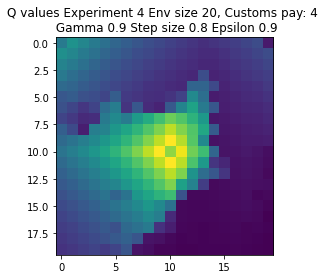

Expr:5 Eps:0 RunnAReward:-32.0 Reward:-627 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-1750.0 Reward:-216 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-553.0 Reward:285 Timesteps:800 GotPack:False Utiltime:318 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-278.0 Reward:-644 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:80 RunnAReward:-667.0 Reward:-1114 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:-283.0 Reward:357 Timesteps:800 GotPack:False Utiltime:72 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-91.0 Reward:1574 Timesteps:1891 GotPack:True Utiltime:1205 Customstime:1707 Money:5
Expr:5 Eps:140 RunnAReward:532.0 Reward:2495 Timesteps:1082 GotPack:True Utiltime:685 Customstime:1040 Money:4
Expr:5 Eps:160 RunnAReward:315.0 Reward:-237 Timesteps:1200 GotPack:False Utiltime:114 Customstime:0 Money:2
Expr:5 Eps:180 RunnAReward:307

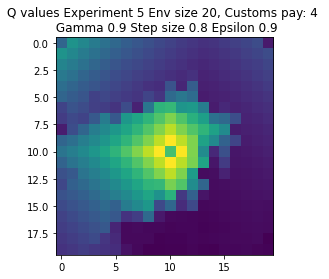

Expr:6 Eps:0 RunnAReward:-221.0 Reward:-4408 Timesteps:5414 GotPack:True Utiltime:2895 Customstime:4177 Money:4
Expr:6 Eps:20 RunnAReward:-942.0 Reward:-966 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:40 RunnAReward:-810.0 Reward:-63 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-1444.0 Reward:-100 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-1150.0 Reward:952 Timesteps:400 GotPack:False Utiltime:314 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-34.0 Reward:-823 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:120 RunnAReward:-17.0 Reward:-1673 Timesteps:3703 GotPack:True Utiltime:250 Customstime:532 Money:5
Expr:6 Eps:140 RunnAReward:163.0 Reward:358 Timesteps:2288 GotPack:True Utiltime:1833 Customstime:2132 Money:4
Expr:6 Eps:160 RunnAReward:510.0 Reward:1001 Timesteps:400 GotPack:False Utiltime:232 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward

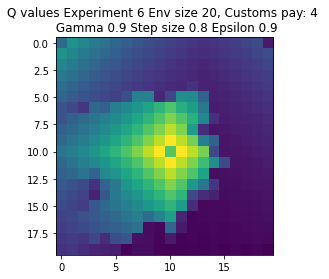

Expr:7 Eps:0 RunnAReward:-44.0 Reward:-877 Timesteps:1200 GotPack:False Utiltime:911 Customstime:0 Money:2
Expr:7 Eps:20 RunnAReward:-1008.0 Reward:-195 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-794.0 Reward:-487 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-355.0 Reward:565 Timesteps:400 GotPack:False Utiltime:226 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-166.0 Reward:863 Timesteps:400 GotPack:False Utiltime:303 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:167.0 Reward:1140 Timesteps:400 GotPack:False Utiltime:205 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-130.0 Reward:-58 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:140 RunnAReward:409.0 Reward:1116 Timesteps:400 GotPack:False Utiltime:243 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:736.0 Reward:1148 Timesteps:400 GotPack:False Utiltime:250 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:535.0 Rew

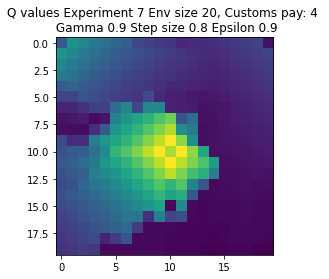

Expr:8 Eps:0 RunnAReward:-16.0 Reward:-316 Timesteps:2651 GotPack:True Utiltime:1352 Customstime:2408 Money:5
Expr:8 Eps:20 RunnAReward:-468.0 Reward:325 Timesteps:800 GotPack:False Utiltime:653 Customstime:0 Money:2
Expr:8 Eps:40 RunnAReward:-1711.0 Reward:-4087 Timesteps:6099 GotPack:True Utiltime:273 Customstime:3751 Money:5
Expr:8 Eps:60 RunnAReward:-339.0 Reward:2132 Timesteps:1432 GotPack:True Utiltime:547 Customstime:1254 Money:5
Expr:8 Eps:80 RunnAReward:-211.0 Reward:686 Timesteps:2187 GotPack:True Utiltime:133 Customstime:1617 Money:5
Expr:8 Eps:100 RunnAReward:-281.0 Reward:-440 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-129.0 Reward:-1218 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:140 RunnAReward:-527.0 Reward:-612 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:160 RunnAReward:304.0 Reward:563 Timesteps:800 GotPack:False Utiltime:250 Customstime:0 Money:2
Expr:8 Eps:180 RunnA

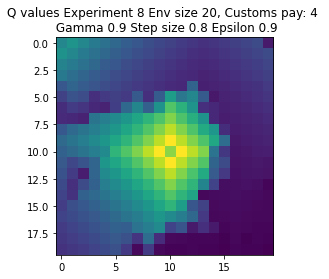

Expr:9 Eps:0 RunnAReward:-21.0 Reward:-407 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:20 RunnAReward:-843.0 Reward:948 Timesteps:400 GotPack:False Utiltime:133 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-1446.0 Reward:192 Timesteps:800 GotPack:False Utiltime:458 Customstime:0 Money:2
Expr:9 Eps:60 RunnAReward:-585.0 Reward:-5720 Timesteps:6776 GotPack:True Utiltime:4666 Customstime:5282 Money:4
Expr:9 Eps:80 RunnAReward:-405.0 Reward:-1221 Timesteps:4239 GotPack:True Utiltime:25 Customstime:1377 Money:4
Expr:9 Eps:100 RunnAReward:76.0 Reward:-177 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:-74.0 Reward:2170 Timesteps:1321 GotPack:True Utiltime:299 Customstime:1138 Money:4
Expr:9 Eps:140 RunnAReward:648.0 Reward:319 Timesteps:800 GotPack:False Utiltime:100 Customstime:0 Money:2
Expr:9 Eps:160 RunnAReward:-133.0 Reward:-490 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:180 RunnAReward:

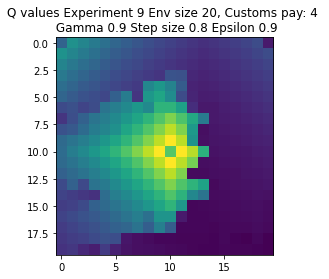

********************************************************************************************************
Env size 20, Customs pay: 3 Gamma 0.9 Step size 0.8 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:2.0 Reward:40 Timesteps:800 GotPack:False Utiltime:92 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-3134.0 Reward:-1044 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-1349.0 Reward:639 Timesteps:800 GotPack:False Utiltime:413 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-1609.0 Reward:158 Timesteps:800 GotPack:False Utiltime:168 Customstime:0 Money:1
Expr:0 Eps:80 RunnAReward:-57.0 Reward:-449 Timesteps:1200 GotPack:False Utiltime:622 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-1649.0 Reward:-93 Timesteps:800 GotPack:False Utiltime:271 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:23.0 Reward:-268 Timesteps:1200 GotPack:False Utiltime:228

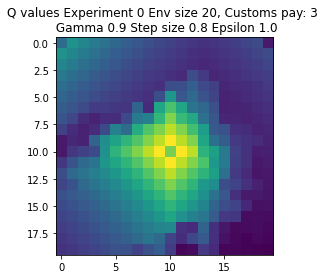

Expr:1 Eps:0 RunnAReward:-55.0 Reward:-1088 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-1680.0 Reward:352 Timesteps:800 GotPack:False Utiltime:635 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-2459.0 Reward:-1057 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:60 RunnAReward:-1406.0 Reward:-1004 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-968.0 Reward:-820 Timesteps:1200 GotPack:False Utiltime:59 Customstime:0 Money:2
Expr:1 Eps:100 RunnAReward:-1577.0 Reward:1234 Timesteps:1877 GotPack:True Utiltime:323 Customstime:928 Money:4
Expr:1 Eps:120 RunnAReward:-261.0 Reward:-640 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:-959.0 Reward:119 Timesteps:800 GotPack:False Utiltime:356 Customstime:0 Money:1
Expr:1 Eps:160 RunnAReward:76.0 Reward:257 Timesteps:800 GotPack:False Utiltime:72 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:350.

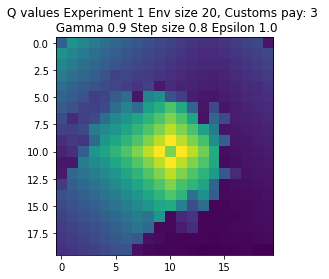

Expr:2 Eps:0 RunnAReward:-342.0 Reward:-6834 Timesteps:8078 GotPack:True Utiltime:2806 Customstime:3394 Money:5
Expr:2 Eps:20 RunnAReward:-2373.0 Reward:-5536 Timesteps:6615 GotPack:True Utiltime:1896 Customstime:4905 Money:5
Expr:2 Eps:40 RunnAReward:-1095.0 Reward:-74 Timesteps:800 GotPack:False Utiltime:681 Customstime:0 Money:0
Expr:2 Eps:60 RunnAReward:-1449.0 Reward:-595 Timesteps:1200 GotPack:False Utiltime:231 Customstime:0 Money:2
Expr:2 Eps:80 RunnAReward:-1306.0 Reward:-6212 Timesteps:6911 GotPack:True Utiltime:4180 Customstime:5376 Money:3
Expr:2 Eps:100 RunnAReward:-1013.0 Reward:151 Timesteps:1200 GotPack:False Utiltime:395 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-1425.0 Reward:-1311 Timesteps:3851 GotPack:True Utiltime:2336 Customstime:2858 Money:3
Expr:2 Eps:140 RunnAReward:-410.0 Reward:-1340 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:-493.0 Reward:-142 Timesteps:2898 GotPack:True Utiltime:83 Customstime:1207 Money:

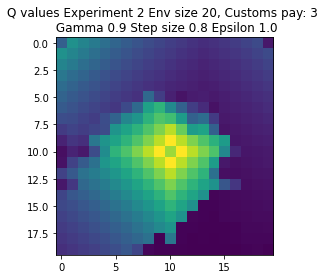

Expr:3 Eps:0 RunnAReward:-76.0 Reward:-1514 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-1525.0 Reward:-685 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-1069.0 Reward:-702 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-1804.0 Reward:-4829 Timesteps:5617 GotPack:True Utiltime:142 Customstime:3515 Money:3
Expr:3 Eps:80 RunnAReward:-1495.0 Reward:-6866 Timesteps:7899 GotPack:True Utiltime:2032 Customstime:3256 Money:5
Expr:3 Eps:100 RunnAReward:-1092.0 Reward:-932 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:120 RunnAReward:-1118.0 Reward:296 Timesteps:800 GotPack:False Utiltime:468 Customstime:0 Money:1
Expr:3 Eps:140 RunnAReward:-359.0 Reward:-783 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:160 RunnAReward:-64.0 Reward:137 Timesteps:800 GotPack:False Utiltime:281 Customstime:0 Money:1
Expr:3 Eps:180 RunnARew

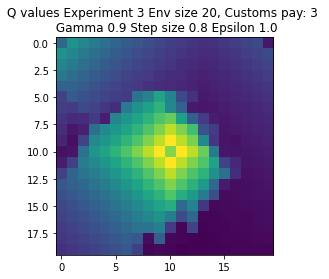

Expr:4 Eps:0 RunnAReward:-55.0 Reward:-1082 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-1448.0 Reward:-295 Timesteps:2475 GotPack:True Utiltime:1111 Customstime:1674 Money:4
Expr:4 Eps:40 RunnAReward:-2589.0 Reward:478 Timesteps:2594 GotPack:True Utiltime:1573 Customstime:2393 Money:3
Expr:4 Eps:60 RunnAReward:-749.0 Reward:-737 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-1470.0 Reward:-1492 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:100 RunnAReward:-954.0 Reward:493 Timesteps:800 GotPack:False Utiltime:268 Customstime:0 Money:0
Expr:4 Eps:120 RunnAReward:-823.0 Reward:-7643 Timesteps:8858 GotPack:True Utiltime:412 Customstime:2008 Money:5
Expr:4 Eps:140 RunnAReward:-634.0 Reward:623 Timesteps:800 GotPack:False Utiltime:168 Customstime:0 Money:0
Expr:4 Eps:160 RunnAReward:-62.0 Reward:-77 Timesteps:1200 GotPack:False Utiltime:93 Customstime:0 Money:2
Expr:4 Eps:180 RunnA

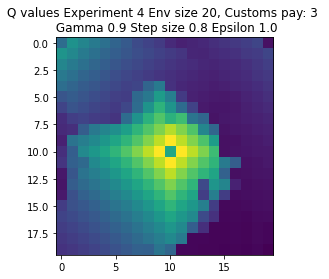

Expr:5 Eps:0 RunnAReward:-65.0 Reward:-1296 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-2116.0 Reward:-15281 Timesteps:12000 GotPack:False Utiltime:10546 Customstime:0 Money:3
Expr:5 Eps:40 RunnAReward:-3921.0 Reward:-7107 Timesteps:7727 GotPack:True Utiltime:2287 Customstime:3900 Money:4
Expr:5 Eps:60 RunnAReward:-2587.0 Reward:264 Timesteps:2297 GotPack:True Utiltime:24 Customstime:1683 Money:5
Expr:5 Eps:80 RunnAReward:-1153.0 Reward:-88 Timesteps:1200 GotPack:False Utiltime:520 Customstime:0 Money:2
Expr:5 Eps:100 RunnAReward:-766.0 Reward:377 Timesteps:800 GotPack:False Utiltime:173 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-576.0 Reward:-25 Timesteps:800 GotPack:False Utiltime:183 Customstime:0 Money:2
Expr:5 Eps:140 RunnAReward:-334.0 Reward:-1094 Timesteps:3592 GotPack:True Utiltime:251 Customstime:2253 Money:4
Expr:5 Eps:160 RunnAReward:-110.0 Reward:-251 Timesteps:1200 GotPack:False Utiltime:335 Customstime:0 Money:2
Expr:5 E

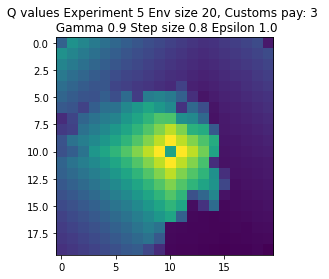

Expr:6 Eps:0 RunnAReward:-64.0 Reward:-1274 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:20 RunnAReward:-2186.0 Reward:-1402 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-2348.0 Reward:-7635 Timesteps:7857 GotPack:True Utiltime:3662 Customstime:5475 Money:5
Expr:6 Eps:60 RunnAReward:-1107.0 Reward:311 Timesteps:800 GotPack:False Utiltime:293 Customstime:0 Money:1
Expr:6 Eps:80 RunnAReward:-961.0 Reward:-809 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-667.0 Reward:-1534 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:6 Eps:120 RunnAReward:-163.0 Reward:489 Timesteps:800 GotPack:False Utiltime:245 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:33.0 Reward:-249 Timesteps:1200 GotPack:False Utiltime:1138 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:-1613.0 Reward:498 Timesteps:800 GotPack:False Utiltime:412 Customstime:0 Money:0
Expr:6 Eps:180 RunnARewa

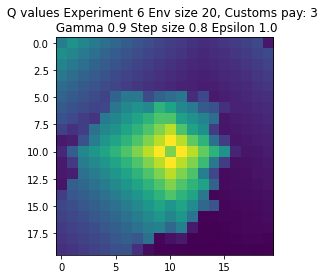

Expr:7 Eps:0 RunnAReward:-5.0 Reward:-82 Timesteps:800 GotPack:False Utiltime:297 Customstime:0 Money:0
Expr:7 Eps:20 RunnAReward:-2388.0 Reward:-738 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-1235.0 Reward:-558 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:60 RunnAReward:-1778.0 Reward:21 Timesteps:800 GotPack:False Utiltime:12 Customstime:0 Money:0
Expr:7 Eps:80 RunnAReward:-601.0 Reward:449 Timesteps:800 GotPack:False Utiltime:300 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-599.0 Reward:535 Timesteps:800 GotPack:False Utiltime:146 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-940.0 Reward:595 Timesteps:2075 GotPack:True Utiltime:325 Customstime:1736 Money:3
Expr:7 Eps:140 RunnAReward:-461.0 Reward:-4540 Timesteps:6516 GotPack:True Utiltime:220 Customstime:964 Money:4
Expr:7 Eps:160 RunnAReward:-25.0 Reward:343 Timesteps:800 GotPack:False Utiltime:358 Customstime:0 Money:0
Expr:7 Eps:180 RunnAReward:37.0

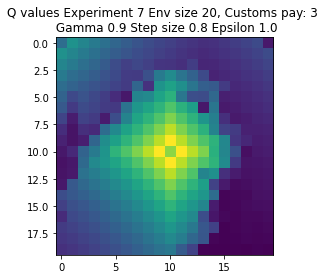

Expr:8 Eps:0 RunnAReward:-67.0 Reward:-1334 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-2158.0 Reward:-2288 Timesteps:3912 GotPack:True Utiltime:2380 Customstime:3056 Money:3
Expr:8 Eps:40 RunnAReward:-1438.0 Reward:-138 Timesteps:1200 GotPack:False Utiltime:843 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-2240.0 Reward:-7069 Timesteps:8109 GotPack:True Utiltime:4920 Customstime:5654 Money:4
Expr:8 Eps:80 RunnAReward:-828.0 Reward:-773 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:1
Expr:8 Eps:100 RunnAReward:-1081.0 Reward:85 Timesteps:800 GotPack:False Utiltime:247 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:-633.0 Reward:215 Timesteps:800 GotPack:False Utiltime:204 Customstime:0 Money:1
Expr:8 Eps:140 RunnAReward:-149.0 Reward:525 Timesteps:2521 GotPack:True Utiltime:1136 Customstime:2447 Money:3
Expr:8 Eps:160 RunnAReward:-55.0 Reward:-1458 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:8 Eps:180 

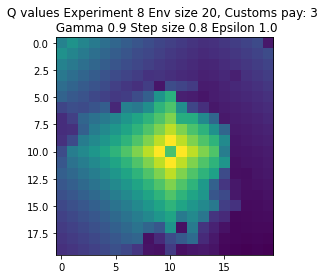

Expr:9 Eps:0 RunnAReward:90.0 Reward:1813 Timesteps:1413 GotPack:True Utiltime:6 Customstime:403 Money:5
Expr:9 Eps:20 RunnAReward:-2064.0 Reward:-6505 Timesteps:7458 GotPack:True Utiltime:4949 Customstime:5265 Money:4
Expr:9 Eps:40 RunnAReward:-1669.0 Reward:-298 Timesteps:800 GotPack:False Utiltime:677 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-1393.0 Reward:1524 Timesteps:1565 GotPack:True Utiltime:368 Customstime:1189 Money:4
Expr:9 Eps:80 RunnAReward:-1472.0 Reward:-1438 Timesteps:1200 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:100 RunnAReward:-2368.0 Reward:-12333 Timesteps:11949 GotPack:True Utiltime:7201 Customstime:8077 Money:4
Expr:9 Eps:120 RunnAReward:-865.0 Reward:399 Timesteps:800 GotPack:False Utiltime:44 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:278.0 Reward:-689 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:115.0 Reward:2949 Timesteps:810 GotPack:True Utiltime:204 Customstime:755 Money:3
Expr:9 Eps:1

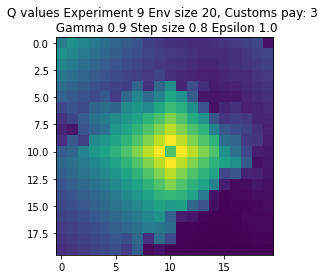

********************************************************************************************************
Env size 20, Customs pay: 4 Gamma 0.9 Step size 0.8 Epsilon 1.0
*******************************************************************************************************
Expr:0 Eps:0 RunnAReward:-14.0 Reward:-276 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:20 RunnAReward:-756.0 Reward:-767 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:40 RunnAReward:-1023.0 Reward:-497 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:60 RunnAReward:-677.0 Reward:-97 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:0 Eps:80 RunnAReward:-2016.0 Reward:136 Timesteps:800 GotPack:False Utiltime:84 Customstime:0 Money:2
Expr:0 Eps:100 RunnAReward:-584.0 Reward:437 Timesteps:400 GotPack:False Utiltime:275 Customstime:0 Money:0
Expr:0 Eps:120 RunnAReward:-274.0 Reward:689 Timesteps:400 GotPack:False Utiltime:324 Cust

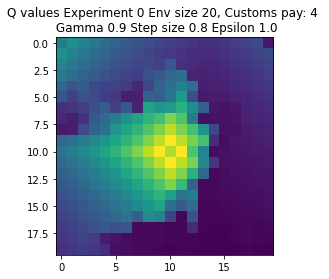

Expr:1 Eps:0 RunnAReward:-39.0 Reward:-764 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:20 RunnAReward:-574.0 Reward:-617 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:40 RunnAReward:-2162.0 Reward:-1380 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:1 Eps:60 RunnAReward:-597.0 Reward:-149 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:80 RunnAReward:-586.0 Reward:0 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:100 RunnAReward:-110.0 Reward:-490 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:120 RunnAReward:-683.0 Reward:773 Timesteps:400 GotPack:False Utiltime:76 Customstime:0 Money:0
Expr:1 Eps:140 RunnAReward:142.0 Reward:-162 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:1 Eps:160 RunnAReward:-101.0 Reward:63 Timesteps:800 GotPack:False Utiltime:115 Customstime:0 Money:2
Expr:1 Eps:180 RunnAReward:478.0 Reward:-178 T

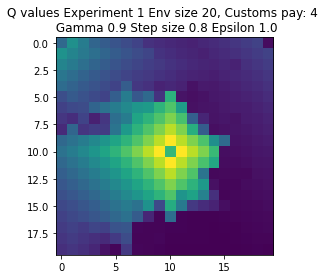

Expr:2 Eps:0 RunnAReward:-56.0 Reward:-1101 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:20 RunnAReward:-2172.0 Reward:-992 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:2 Eps:40 RunnAReward:-1273.0 Reward:-1246 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:2 Eps:60 RunnAReward:-717.0 Reward:-200 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:2 Eps:80 RunnAReward:-829.0 Reward:510 Timesteps:400 GotPack:False Utiltime:380 Customstime:0 Money:0
Expr:2 Eps:100 RunnAReward:-568.0 Reward:1138 Timesteps:400 GotPack:False Utiltime:399 Customstime:0 Money:0
Expr:2 Eps:120 RunnAReward:-275.0 Reward:581 Timesteps:400 GotPack:False Utiltime:223 Customstime:0 Money:0
Expr:2 Eps:140 RunnAReward:155.0 Reward:696 Timesteps:400 GotPack:False Utiltime:298 Customstime:0 Money:0
Expr:2 Eps:160 RunnAReward:-35.0 Reward:1088 Timesteps:400 GotPack:False Utiltime:391 Customstime:0 Money:0
Expr:2 Eps:180 RunnAReward:366.0 Re

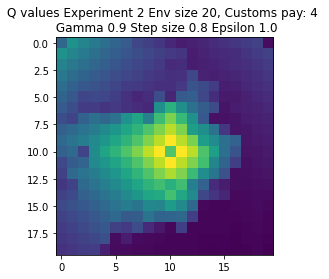

Expr:3 Eps:0 RunnAReward:-48.0 Reward:-943 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:20 RunnAReward:-3375.0 Reward:-477 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:40 RunnAReward:-1623.0 Reward:-543 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:60 RunnAReward:-1914.0 Reward:-556 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:80 RunnAReward:-749.0 Reward:-953 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:3 Eps:100 RunnAReward:-361.0 Reward:-262 Timesteps:800 GotPack:False Utiltime:205 Customstime:0 Money:2
Expr:3 Eps:120 RunnAReward:-545.0 Reward:133 Timesteps:800 GotPack:False Utiltime:390 Customstime:0 Money:2
Expr:3 Eps:140 RunnAReward:377.0 Reward:1 Timesteps:800 GotPack:False Utiltime:320 Customstime:0 Money:2
Expr:3 Eps:160 RunnAReward:333.0 Reward:625 Timesteps:800 GotPack:False Utiltime:76 Customstime:0 Money:2
Expr:3 Eps:180 RunnAReward:489.0 Reward:6

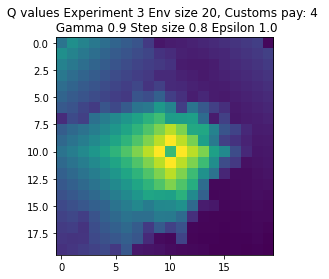

Expr:4 Eps:0 RunnAReward:-23.0 Reward:-442 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:20 RunnAReward:-912.0 Reward:-554 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:40 RunnAReward:-845.0 Reward:-562 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:60 RunnAReward:-1177.0 Reward:-145 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:4 Eps:80 RunnAReward:-944.0 Reward:-1157 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:100 RunnAReward:-785.0 Reward:-1045 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:120 RunnAReward:-412.0 Reward:-981 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:4 Eps:140 RunnAReward:-327.0 Reward:-596 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:4 Eps:160 RunnAReward:-64.0 Reward:-712 Timesteps:1200 GotPack:False Utiltime:64 Customstime:0 Money:3
Expr:4 Eps:180 RunnAReward:93.0 Reward:-

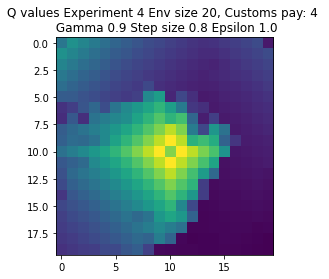

Expr:5 Eps:0 RunnAReward:-36.0 Reward:-715 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:20 RunnAReward:-1116.0 Reward:-483 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:40 RunnAReward:-2156.0 Reward:-666 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:60 RunnAReward:-1289.0 Reward:-561 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:80 RunnAReward:-614.0 Reward:-748 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:5 Eps:100 RunnAReward:-440.0 Reward:780 Timesteps:400 GotPack:False Utiltime:338 Customstime:0 Money:0
Expr:5 Eps:120 RunnAReward:-270.0 Reward:1738 Timesteps:1417 GotPack:True Utiltime:122 Customstime:672 Money:5
Expr:5 Eps:140 RunnAReward:514.0 Reward:-873 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:5 Eps:160 RunnAReward:119.0 Reward:-529 Timesteps:1200 GotPack:False Utiltime:310 Customstime:0 Money:2
Expr:5 Eps:180 RunnAReward:212.0 Re

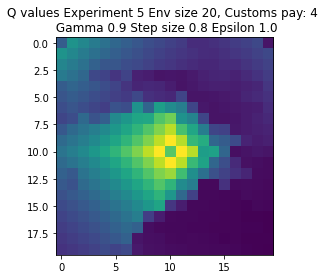

Expr:6 Eps:0 RunnAReward:-3.0 Reward:-46 Timesteps:800 GotPack:False Utiltime:27 Customstime:0 Money:2
Expr:6 Eps:20 RunnAReward:-1077.0 Reward:-227 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:40 RunnAReward:-538.0 Reward:-685 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:60 RunnAReward:-521.0 Reward:-420 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:80 RunnAReward:-788.0 Reward:-427 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:100 RunnAReward:-660.0 Reward:-1127 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:6 Eps:120 RunnAReward:-503.0 Reward:731 Timesteps:400 GotPack:False Utiltime:306 Customstime:0 Money:0
Expr:6 Eps:140 RunnAReward:382.0 Reward:613 Timesteps:400 GotPack:False Utiltime:74 Customstime:0 Money:0
Expr:6 Eps:160 RunnAReward:-202.0 Reward:-612 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:6 Eps:180 RunnAReward:-147.0 Reward:-3

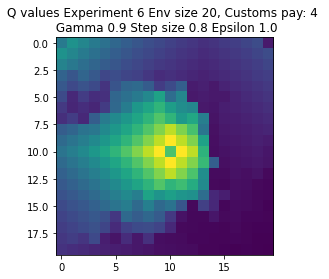

Expr:7 Eps:0 RunnAReward:-87.0 Reward:-1724 Timesteps:3595 GotPack:True Utiltime:1157 Customstime:1823 Money:5
Expr:7 Eps:20 RunnAReward:-864.0 Reward:-438 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:40 RunnAReward:-1723.0 Reward:-1195 Timesteps:3276 GotPack:True Utiltime:1207 Customstime:3067 Money:4
Expr:7 Eps:60 RunnAReward:-2393.0 Reward:-4322 Timesteps:6063 GotPack:True Utiltime:5315 Customstime:5544 Money:4
Expr:7 Eps:80 RunnAReward:-1259.0 Reward:-480 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:7 Eps:100 RunnAReward:-902.0 Reward:459 Timesteps:400 GotPack:False Utiltime:49 Customstime:0 Money:0
Expr:7 Eps:120 RunnAReward:-204.0 Reward:1045 Timesteps:1655 GotPack:True Utiltime:353 Customstime:1414 Money:4
Expr:7 Eps:140 RunnAReward:202.0 Reward:644 Timesteps:400 GotPack:False Utiltime:145 Customstime:0 Money:0
Expr:7 Eps:160 RunnAReward:440.0 Reward:1072 Timesteps:400 GotPack:False Utiltime:103 Customstime:0 Money:0
Expr:7 Eps:180

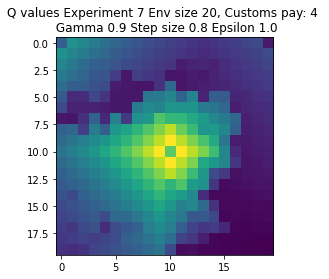

Expr:8 Eps:0 RunnAReward:-35.0 Reward:-694 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:20 RunnAReward:-761.0 Reward:-428 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:40 RunnAReward:-1624.0 Reward:-119 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:60 RunnAReward:-824.0 Reward:-1024 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:80 RunnAReward:-1078.0 Reward:-807 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:3
Expr:8 Eps:100 RunnAReward:-944.0 Reward:-355 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:8 Eps:120 RunnAReward:99.0 Reward:363 Timesteps:400 GotPack:False Utiltime:306 Customstime:0 Money:0
Expr:8 Eps:140 RunnAReward:46.0 Reward:-992 Timesteps:3541 GotPack:True Utiltime:285 Customstime:1234 Money:4
Expr:8 Eps:160 RunnAReward:361.0 Reward:315 Timesteps:2329 GotPack:True Utiltime:58 Customstime:2145 Money:4
Expr:8 Eps:180 RunnAReward:157.0 Rewa

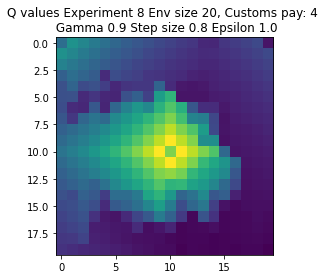

Expr:9 Eps:0 RunnAReward:-57.0 Reward:-1132 Timesteps:800 GotPack:False Utiltime:0 Customstime:0 Money:2
Expr:9 Eps:20 RunnAReward:-1619.0 Reward:-527 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:40 RunnAReward:-1857.0 Reward:629 Timesteps:400 GotPack:False Utiltime:94 Customstime:0 Money:0
Expr:9 Eps:60 RunnAReward:-1259.0 Reward:-468 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:80 RunnAReward:-324.0 Reward:-129 Timesteps:400 GotPack:False Utiltime:0 Customstime:0 Money:0
Expr:9 Eps:100 RunnAReward:-155.0 Reward:721 Timesteps:400 GotPack:False Utiltime:143 Customstime:0 Money:0
Expr:9 Eps:120 RunnAReward:243.0 Reward:656 Timesteps:400 GotPack:False Utiltime:224 Customstime:0 Money:0
Expr:9 Eps:140 RunnAReward:-173.0 Reward:676 Timesteps:400 GotPack:False Utiltime:370 Customstime:0 Money:0
Expr:9 Eps:160 RunnAReward:145.0 Reward:237 Timesteps:800 GotPack:False Utiltime:300 Customstime:0 Money:2
Expr:9 Eps:180 RunnAReward:-236.0 Rewa

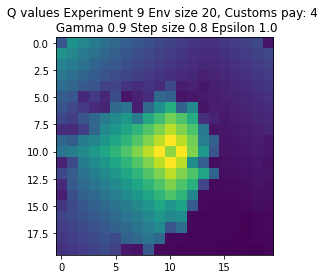

In [10]:
results_dict, q_values_dict=run_experiments(NUM_EXPERIMENTS, NUM_EPISODES,  ENVIRONMENT_PARAMS, AGENT_PARAMS, EPSILON_MIN,SAVED_DIR, save_agent=True)


#filename_results = os.path.join(SAVED_DIR, 'task2_experiments_results.pickle')
#filename_q_values = os.path.join(SAVED_DIR, 'task2_experiments_q_values.pickle')
#utils.save_to_pickle(results_dict, filename_results)
#utils.save_to_pickle(results_dict, filename_q_values)

In [11]:
#filename_results = os.path.join(SAVED_DIR, 'task2_experiments_results_last2.pickle')
#filename_q_values = os.path.join(SAVED_DIR, 'task2_experiments_q_values_last2.pickle')
#save_to_pickle(results_dict, filename_results)
#save_to_pickle(q_values_dict, filename_q_values)

### If  the running didnt finish .  Load from pickle: 

In [50]:
#Load from pickle
q_values_dict= load_from_pickle(PICKLE_RESULTS_Q_VALUES)
results_dict= load_from_pickle(PICKLE_RESULTS)



### Load to dataframe

In [51]:
qlearning_results_df = pd.DataFrame.from_dict(q_values_dict)
results_df = pd.DataFrame.from_dict(results_dict)

## Exploring different environments statistics

Text(0, 0.5, 'Success rate')

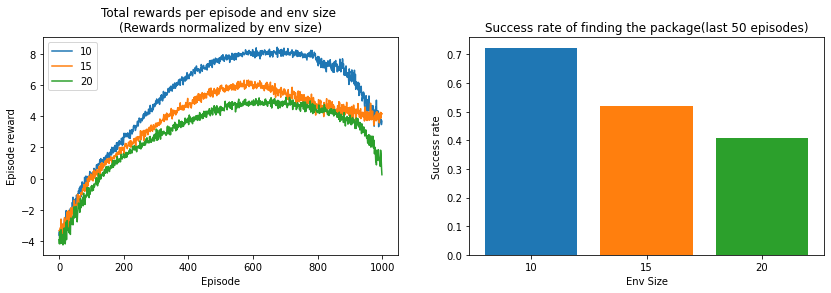

In [52]:
results_df["normenv_rewards"]=results_df["avg_reward"]/(results_df["N"]**2)

figure, axes = plt.subplots(1,2, figsize=(14, 4))
for env_size in ENVIRONMENT_PARAMS["N"]:
    env_results=results_df.loc[results_df["N"]==env_size, ["episode","normenv_rewards", "avg_got_package"]].groupby(["episode"]).mean()
    axes[0].plot(env_results.index, env_results["normenv_rewards"], label=str(env_size))
    axes[1].bar(str(env_size), env_results.loc[-50:, ["avg_got_package"]].mean())    
axes[0].legend()
axes[0].set_title("Total rewards per episode and env size \n(Rewards normalized by env size)")
axes[0].set_xlabel("Episode")
axes[0].set_ylabel("Episode reward")

axes[1].set_title("Success rate of finding the package(last 50 episodes)")
axes[1].set_xlabel("Env Size")
axes[1].set_ylabel("Success rate")



## Exploring different Customs payment amounts statistics

**reminder** - Custom paymet is the money need to pay for customs. The maximum number of earnign from the 2 jobs is 5. But there is a timely paycut.

Text(0, 0.5, 'Success rate')

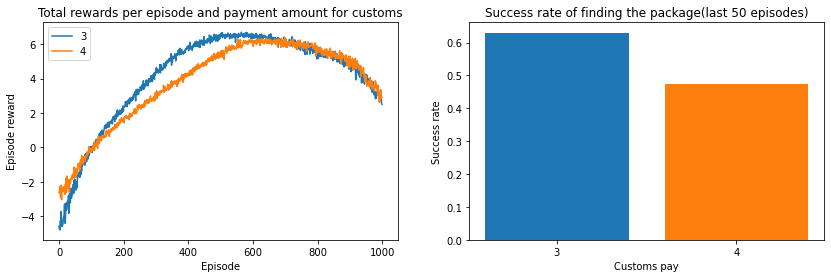

In [53]:
figure, axes = plt.subplots(1,2, figsize=(14, 4))
for customs_pay in ENVIRONMENT_PARAMS["CUSTOMS_PAYS"]:
    customs_pay_results=results_df.loc[results_df["customs_pay"]==customs_pay, ["episode","normenv_rewards","avg_got_package"]].groupby(["episode"]).mean()
    axes[0].plot(customs_pay_results.index, customs_pay_results["normenv_rewards"], label=str(customs_pay))
    axes[1].bar(str(customs_pay), customs_pay_results.loc[-50:, ["avg_got_package"]].mean())

axes[0].legend()
axes[0].set_title("Total rewards per episode and payment amount for customs")
axes[0].set_xlabel("Episode")
axes[0].set_ylabel("Episode reward")

axes[1].set_title("Success rate of finding the package(last 50 episodes)")
axes[1].set_xlabel("Customs pay")
axes[1].set_ylabel("Success rate")





### Avarage reward by environemnt and custom pay

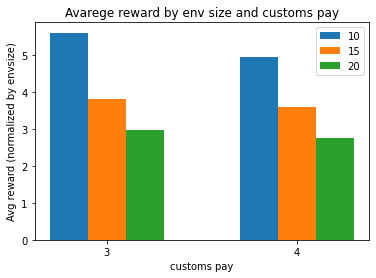

In [65]:
figure, axes = plt.subplots(1,1, figsize=(6, 4))

env_num = np.arange(len(ENVIRONMENT_PARAMS['CUSTOMS_PAYS'])) 
width = 0.2


for ind, env_size in enumerate(ENVIRONMENT_PARAMS["N"]):    
    epsilon_env_results=results_df.loc[((results_df["N"]==env_size) ), ["customs_pay", "normenv_rewards"]].groupby(["customs_pay"]).mean()
    
   
    axes.bar(env_num+ind*width, epsilon_env_results.to_numpy()[:,0], width,  label=str(env_size))
    
    axes.set_ylabel('Avg reward (normalized by envsize)')
    axes.set_xlabel('customs pay')
    axes.set_title('Avarege reward by env size and customs pay')
    plt.xticks(env_num+ind*width / 2, epsilon_env_results.index)
    axes.legend()

## Exploring different Exploration rates (epsilon) statistics

Text(0, 0.5, 'Success rate')

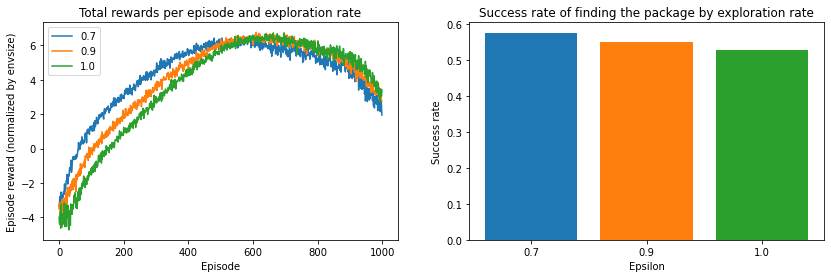

In [78]:
figure, axes = plt.subplots(1,2, figsize=(14, 4))
for epsilon in AGENT_PARAMS["EPSILONS"]:
    epsilon_results=results_df.loc[results_df["epsilon"]==epsilon, ["episode","normenv_rewards","avg_got_package"]].groupby(["episode"]).mean()
    axes[0].plot(epsilon_results.index, epsilon_results["normenv_rewards"], label=str(epsilon))
    axes[1].bar(str(epsilon), epsilon_results.loc[:,["avg_got_package"]].mean())

axes[0].legend()
axes[0].set_title("Total rewards per episode and exploration rate")
axes[0].set_xlabel("Episode")
axes[0].set_ylabel("Episode reward (normalized by envsize)")

axes[1].set_title("Success rate of finding the package by exploration rate")
axes[1].set_xlabel("Epsilon")
axes[1].set_ylabel("Success rate")

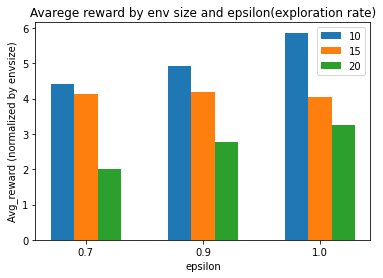

In [70]:
figure, axes = plt.subplots(1,1, figsize=(6, 4))

env_num = np.arange(len(AGENT_PARAMS['EPSILONS'])) 
width = 0.2


for ind, env_size in enumerate(ENVIRONMENT_PARAMS["N"]):    
    epsilon_env_results=results_df.loc[((results_df["N"]==env_size) & (results_df["episode"]>=900)), ["epsilon", "normenv_rewards"]].groupby(["epsilon"]).mean()
    
    
    axes.bar(env_num+ind*width, epsilon_env_results.to_numpy()[:,0], width,  label=str(env_size))
    
axes.set_ylabel('Avg_reward (normalized by envsize)')
axes.set_xlabel('epsilon')
axes.set_title('Avarege reward by env size and epsilon(exploration rate)')
plt.xticks(env_num+ind*width / 2, epsilon_env_results.index)
axes.legend()




## Exploring different Step sizes statistics

Text(0, 0.5, 'Success rate')

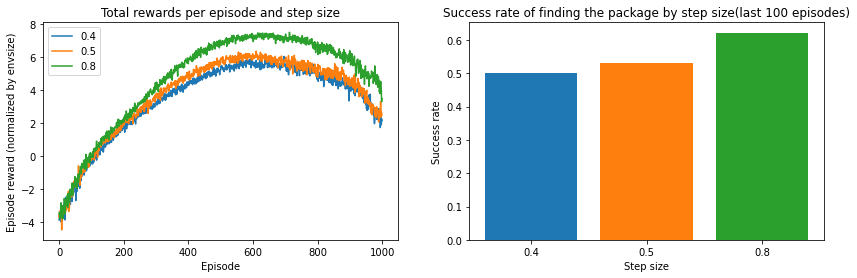

In [76]:
figure, axes = plt.subplots(1,2, figsize=(14, 4))
for step_size in AGENT_PARAMS['STEP_SIZES']:
    step_size_results=results_df.loc[results_df["step_size"]==step_size, ["episode","normenv_rewards","avg_got_package"]].groupby(["episode"]).mean()
    axes[0].plot(step_size_results.index, step_size_results["normenv_rewards"], label=str(step_size))
    axes[1].bar(str(step_size), step_size_results.loc[-100:, ["avg_got_package"]].mean())

axes[0].legend()
axes[0].set_title("Total rewards per episode and step size")
axes[0].set_xlabel("Episode")
axes[0].set_ylabel("Episode reward (normalized by envsize)")

axes[1].set_title("Success rate of finding the package by step size(last 100 episodes)")
axes[1].set_xlabel("Step size")
axes[1].set_ylabel("Success rate")

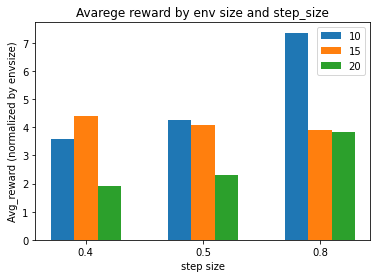

In [72]:
figure, axes = plt.subplots(1,1, figsize=(6, 4))

env_num = np.arange(len(AGENT_PARAMS['STEP_SIZES'])) 
width = 0.2


for ind, env_size in enumerate(ENVIRONMENT_PARAMS["N"]):    
    step_size_env_results=results_df.loc[((results_df["N"]==env_size) & (results_df["episode"]>=900)), ["step_size", "normenv_rewards"]].groupby(["step_size"]).mean()
      
    axes.bar(env_num+ind*width, step_size_env_results.to_numpy()[:,0], width,  label=str(env_size))
    
axes.set_ylabel('Avg_reward (normalized by envsize)')
axes.set_xlabel('step size')
axes.set_title('Avarege reward by env size and step_size')
plt.xticks(env_num+ind*width / 2, step_size_env_results.index)
axes.legend()

## Exploring different Discount rates(gamma) statistics

Text(0, 0.5, 'Success rate')

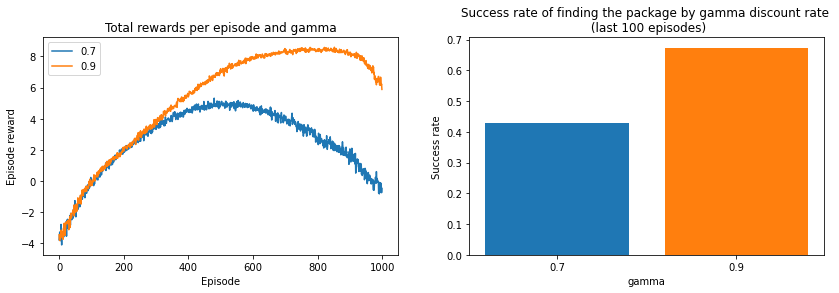

In [77]:

figure, axes = plt.subplots(1,2, figsize=(14, 4))
for gamma in AGENT_PARAMS['GAMMAS']:
    gamma_results=results_df.loc[results_df["gamma"]==gamma, ["episode","normenv_rewards","avg_got_package"]].groupby(["episode"]).mean()
    axes[0].plot(gamma_results.index, gamma_results["normenv_rewards"], label=str(gamma))
    axes[1].bar(str(gamma), gamma_results.loc[-100:, ["avg_got_package"]].mean())

axes[0].legend()
axes[0].set_title("Total rewards per episode and gamma")
axes[0].set_xlabel("Episode")
axes[0].set_ylabel("Episode reward")

axes[1].set_title("Success rate of finding the package by gamma discount rate \n (last 100 episodes)")
axes[1].set_xlabel("gamma")
axes[1].set_ylabel("Success rate")




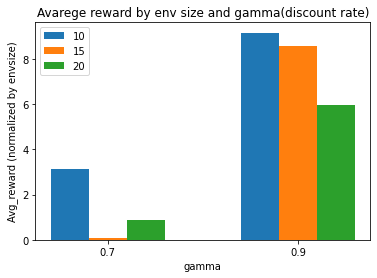

In [74]:
figure, axes = plt.subplots(1,1, figsize=(6, 4))

env_num = np.arange(len(AGENT_PARAMS['GAMMAS'])) 
width = 0.2


for ind, env_size in enumerate(ENVIRONMENT_PARAMS["N"]):    
    gamma_env_results=results_df.loc[((results_df["N"]==env_size) & (results_df["episode"]>=800)), ["gamma", "normenv_rewards"]].groupby(["gamma"]).mean()
      
    axes.bar(env_num+ind*width, gamma_env_results.to_numpy()[:,0], width,  label=str(env_size))
    
    axes.set_ylabel('Avg_reward (normalized by envsize)')
    axes.set_xlabel('gamma')
    axes.set_title('Avarege reward by env size and gamma(discount rate)')
    plt.xticks(env_num+ind*width / 2, gamma_env_results.index)
    axes.legend()

## Show Q values- max values translate of grid structure to show environemnt

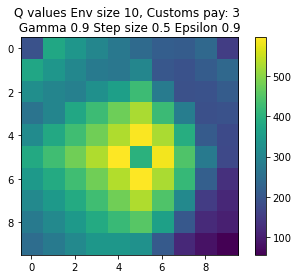

In [84]:
q_values_example=qlearning_results_df.loc[((qlearning_results_df["gamma"]==0.9) & (qlearning_results_df["step_size"]==0.5)
                     & (qlearning_results_df["epsilon"]==0.9) & (qlearning_results_df["customs_pay"]==3) & (qlearning_results_df["N"]==10)) ,"q_values_grid"]


q_values_example.values[0]
q_values_img=np.expand_dims(q_values_example.values[0],2)


plt.imshow(q_values_img)
plt.title(f'Q values Env size 10, Customs pay: 3 \n Gamma 0.9 Step size 0.5 Epsilon 0.9 ')
plt.colorbar()
plt.show()

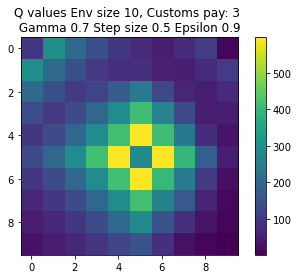

In [75]:
q_values_example=qlearning_results_df.loc[((qlearning_results_df["gamma"]==0.7) & (qlearning_results_df["step_size"]==0.5)
                     & (qlearning_results_df["epsilon"]==0.9) & (qlearning_results_df["customs_pay"]==3) & (qlearning_results_df["N"]==10)) ,"q_values_grid"]


q_values_example.values[0]
q_values_img=np.expand_dims(q_values_example.values[0],2)


plt.imshow(q_values_img)
plt.title(f'Q values Env size 10, Customs pay: 3 \n Gamma 0.7 Step size 0.5 Epsilon 0.9 ')
plt.colorbar()
plt.show()

### A reminder of the environemnt

In [62]:
env = u_got_package.U_GotPackage(N=10, custom_pay=3)
env.reset()
env.display()

=   =  =  =  =  =  =  =  =  =  =  =
=  CO  |  |  |  PP |  |  |  |  GP =
=   |  |  |  |  |  |  |  |  |  |  =
=   |  |  |  |  |  |  |  |  |  |  =
=   |  |  |  |  |  |  |  |  PP |  =
=   |  |  |  |  |  |  |  |  |  |  =
=  JB2 |  |  |  |  BA |  |  |  |  =
=   |  |  |  |  |  |  |  |  |  |  =
=   |  |  |  |  |  |  |  |  |  |  =
=   |  |  |  |  |  |  |  |  |  |  =
=  JB1 |  |  |  |  |  |  |  |  PO =
=   =  =  =  =  =  =  =  =  =  =  =

UTILITY: False PAID CUSTOMS: False 
VACC APPROVAL: False MONEY_EARNED: 0
